In [1]:
import numpy as np
np.__version__

'1.19.5'

In [2]:
import pandas as pd
pd.__version__

'1.1.5'

In [3]:
import matplotlib
matplotlib.__version__

'3.3.4'

In [4]:
import matplotlib.pyplot as plt

In [5]:
# Adjust plot size
#options(repr.plot.width=16, repr.plot.height=6)

# For some reason, if this is in the same cell as the import command, it doesn't work.
plt.rcParams["figure.figsize"] = [18.0,8.0]

In [6]:
import scipy
scipy.__version__

'1.5.4'

In [7]:
from scipy import stats

In [8]:
import seaborn as sns

In [9]:
from datetime import datetime

In [10]:
#from pandarallel import pandarallel

In [11]:
#pandarallel.initialize(progress_bar=True)

In [12]:
default_max_columns=pd.get_option('display.max_columns')

In [13]:
default_max_rows=pd.get_option('display.max_rows')

In [14]:
default_precision=pd.get_option('display.precision')

In [15]:
pd.set_option('display.precision', 2)

In [16]:
default_threshold=np.get_printoptions()['threshold']

In [17]:
np.set_printoptions(threshold=10000000)

# Read meta data

In [18]:
meta = pd.read_csv('20210428-EV/metadata.csv')

In [19]:
meta.head()

,Rand 2 Batch_order,D-plex Sequencing ID,Lexogen Sequencing ID,Diagnosis
0,1_1,SFHH005a,SFHH006a,"GBM, IDH1R132H WT,"
1,1_2,SFHH005b,SFHH006b,"Oligodendroglioma, IDH-mutant, 1p19q codeleted"
2,1_3,SFHH005c,SFHH006c,"GBM, IDH-mutant,"
3,1_4,SFHH005d,SFHH006d,"GBM, IDH-mutant,"
4,1_5,SFHH005e,SFHH006e,"GBM, IDH1R132H WT,"


In [20]:
meta.rename(columns={"Rand 2 Batch_order": "subject"},inplace=True)
meta.rename(columns={"D-plex Sequencing ID": "dplex"},inplace=True)
meta.rename(columns={"Lexogen Sequencing ID": "lexogen"},inplace=True)
meta.rename(columns={"Diagnosis": "diag"},inplace=True)
#meta.set_index('subject',inplace=True)

In [21]:
meta

,subject,dplex,lexogen,diag
0,1_1,SFHH005a,SFHH006a,"GBM, IDH1R132H WT,"
1,1_2,SFHH005b,SFHH006b,"Oligodendroglioma, IDH-mutant, 1p19q codeleted"
2,1_3,SFHH005c,SFHH006c,"GBM, IDH-mutant,"
3,1_4,SFHH005d,SFHH006d,"GBM, IDH-mutant,"
4,1_5,SFHH005e,SFHH006e,"GBM, IDH1R132H WT,"
5,1_6,SFHH005f,SFHH006f,"Diffuse Astrocytoma, IDH-mutant,"
6,1_7,SFHH005g,SFHH006g,"Oligodendroglioma, IDH-mutant, 1p19q codeleted"
7,1_8,SFHH005h,SFHH006h,"GBM, IDH1R132H WT,"
8,1_9,SFHH005i,SFHH006i,"GBM, IDH-mutant,"
9,1_10,SFHH005j,SFHH006j,"Diffuse Astrocytoma, IDH-mutant,"


In [22]:
meta[['disease','idh','x1p19q']] = meta['diag'].str.split(",", 2, expand=True)
#meta.drop('diag',axis='columns',inplace=True)

In [23]:
meta

,subject,dplex,lexogen,diag,disease,idh,x1p19q
0,1_1,SFHH005a,SFHH006a,"GBM, IDH1R132H WT,",GBM,IDH1R132H WT,
1,1_2,SFHH005b,SFHH006b,"Oligodendroglioma, IDH-mutant, 1p19q codeleted",Oligodendroglioma,IDH-mutant,1p19q codeleted
2,1_3,SFHH005c,SFHH006c,"GBM, IDH-mutant,",GBM,IDH-mutant,
3,1_4,SFHH005d,SFHH006d,"GBM, IDH-mutant,",GBM,IDH-mutant,
4,1_5,SFHH005e,SFHH006e,"GBM, IDH1R132H WT,",GBM,IDH1R132H WT,
5,1_6,SFHH005f,SFHH006f,"Diffuse Astrocytoma, IDH-mutant,",Diffuse Astrocytoma,IDH-mutant,
6,1_7,SFHH005g,SFHH006g,"Oligodendroglioma, IDH-mutant, 1p19q codeleted",Oligodendroglioma,IDH-mutant,1p19q codeleted
7,1_8,SFHH005h,SFHH006h,"GBM, IDH1R132H WT,",GBM,IDH1R132H WT,
8,1_9,SFHH005i,SFHH006i,"GBM, IDH-mutant,",GBM,IDH-mutant,
9,1_10,SFHH005j,SFHH006j,"Diffuse Astrocytoma, IDH-mutant,",Diffuse Astrocytoma,IDH-mutant,


# Read raw matrix CORE

In [24]:
#df = pd.read_csv('20210428-EV/dplexonlyreport.csv',index_col=0,header=None)
df = pd.read_csv('20210428-EV/20210513b-report.csv.gz',index_col=0,header=None,low_memory=False)

In [25]:
df.shape

(39, 528)

In [26]:
df.head(12)

,1,2,3,4,5,6,7,8,9,10,...,519,520,521,522,523,524,525,526,527,528
0,,,,,,,,,,,,,,,,,,,,,
,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005ab,SFHH005ab,SFHH005ab,SFHH005ab,...,SFHH006y,SFHH006y,SFHH006y,SFHH006y,SFHH006z,SFHH006z,SFHH006z,SFHH006z,SFHH006z,SFHH006z
---,---,---,---,---,---,---,---,---,---,---,...,---,---,---,---,---,---,---,---,---,---
Subject,3_5,3_5,3_5,3_5,3_5,3_5,3_6,3_6,3_6,3_6,...,3_3,3_3,3_3,3_3,3_4,3_4,3_4,3_4,3_4,3_4
Lab kit,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,...,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen
Trimmer,bbduk1,bbduk2,bbduk3,cutadapt1,cutadapt2,cutadapt3,bbduk1,bbduk2,bbduk3,cutadapt1,...,bbduk3,cutadapt1,cutadapt2,cutadapt3,bbduk1,bbduk2,bbduk3,cutadapt1,cutadapt2,cutadapt3
Raw Read Count,4038879,4038879,4038879,4038879,4038879,4038879,3088240,3088240,3088240,3088240,...,3665258,3665258,3665258,3665258,4868169,4868169,4868169,4868169,4868169,4868169
Raw Read Length,35.0646,35.0646,35.0646,35.0646,35.0646,35.0646,48.6946,48.6946,48.6946,48.6946,...,34.0495,34.0495,34.0495,34.0495,36.2413,36.2413,36.2413,36.2413,36.2413,36.2413
Trimmed Read Count,1270784,1372973,1372997,1395891,1395893,1395893,1240850,1396651,1396740,1418066,...,3633881,3661993,3664115,3664263,4478092,4823895,4823681,4863961,4867158,4867302
Trimmed Ave Read Length,33.8185,38.2306,38.2314,43.5121,43.5142,43.524,40.8779,51.0991,51.101,64.3485,...,32.6867,33.8972,34.0071,34.0507,30.6793,34.7925,34.7983,36.0631,36.1974,36.242


In [27]:
df.drop("---",inplace=True)

In [28]:
df.shape

(38, 528)

In [29]:
df.rename({'  ':'sample'},axis='rows',inplace=True)
df.rename({'Subject':'subject'},axis='rows',inplace=True)
df.rename({'Trimmer':'trimmer'},axis='rows',inplace=True)

In [30]:
df

,1,2,3,4,5,6,7,8,9,10,...,519,520,521,522,523,524,525,526,527,528
0,,,,,,,,,,,,,,,,,,,,,
sample,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005ab,SFHH005ab,SFHH005ab,SFHH005ab,...,SFHH006y,SFHH006y,SFHH006y,SFHH006y,SFHH006z,SFHH006z,SFHH006z,SFHH006z,SFHH006z,SFHH006z
subject,3_5,3_5,3_5,3_5,3_5,3_5,3_6,3_6,3_6,3_6,...,3_3,3_3,3_3,3_3,3_4,3_4,3_4,3_4,3_4,3_4
Lab kit,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,...,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen
trimmer,bbduk1,bbduk2,bbduk3,cutadapt1,cutadapt2,cutadapt3,bbduk1,bbduk2,bbduk3,cutadapt1,...,bbduk3,cutadapt1,cutadapt2,cutadapt3,bbduk1,bbduk2,bbduk3,cutadapt1,cutadapt2,cutadapt3
Raw Read Count,4038879,4038879,4038879,4038879,4038879,4038879,3088240,3088240,3088240,3088240,...,3665258,3665258,3665258,3665258,4868169,4868169,4868169,4868169,4868169,4868169
Raw Read Length,35.0646,35.0646,35.0646,35.0646,35.0646,35.0646,48.6946,48.6946,48.6946,48.6946,...,34.0495,34.0495,34.0495,34.0495,36.2413,36.2413,36.2413,36.2413,36.2413,36.2413
Trimmed Read Count,1270784,1372973,1372997,1395891,1395893,1395893,1240850,1396651,1396740,1418066,...,3633881,3661993,3664115,3664263,4478092,4823895,4823681,4863961,4867158,4867302
Trimmed Ave Read Length,33.8185,38.2306,38.2314,43.5121,43.5142,43.524,40.8779,51.0991,51.101,64.3485,...,32.6867,33.8972,34.0071,34.0507,30.6793,34.7925,34.7983,36.0631,36.1974,36.242
STAR Aligned to Transcriptome,111104,112499,112492,112689,112696,112689,92673,93752,93727,92285,...,337860,337076,336880,336843,362402,363298,363259,362012,361905,361853


In [31]:
df=df.T
df.head()

,sample,subject,Lab kit,trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,Bowtie2 Aligned to Salmonella,Bowtie2 Aligned to Salmonella %,Bowtie2 Aligned to masked Salmonella,Bowtie2 Aligned to masked Salmonella %,Bowtie2 Aligned to Burkholderia,Bowtie2 Aligned to Burkholderia %,Bowtie2 Aligned to masked Burkholderia,Bowtie2 Aligned to masked Burkholderia %,Bowtie2 Aligned to mRNA_Prot,Bowtie2 Aligned to mRNA_Prot %
1,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,45946,3.61,14700,1.15,375543,29.55,277406,21.82,58736,4.62
2,SFHH005aa,3_5,D-plex,bbduk2,4038879,35.0646,1372973,38.2306,112499,8.19,...,60133,4.37,17811,1.29,413414,30.11,298416,21.73,71735,5.22
3,SFHH005aa,3_5,D-plex,bbduk3,4038879,35.0646,1372997,38.2314,112492,8.19,...,60133,4.37,17811,1.29,413414,30.11,298416,21.73,71735,5.22
4,SFHH005aa,3_5,D-plex,cutadapt1,4038879,35.0646,1395891,43.5121,112689,8.07,...,61284,4.39,18218,1.30,420290,30.10,304330,21.80,75518,5.41
5,SFHH005aa,3_5,D-plex,cutadapt2,4038879,35.0646,1395893,43.5142,112696,8.07,...,61285,4.39,18218,1.30,420299,30.10,304339,21.80,75522,5.41


In [32]:
#df=df.merge(meta,left_on='Subject',right_on='subject')
df=df.merge(meta,on='subject')
df.head()

,sample,subject,Lab kit,trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,Bowtie2 Aligned to masked Burkholderia,Bowtie2 Aligned to masked Burkholderia %,Bowtie2 Aligned to mRNA_Prot,Bowtie2 Aligned to mRNA_Prot %,dplex,lexogen,diag,disease,idh,x1p19q
0,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,277406,21.82,58736,4.62,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
1,SFHH005aa,3_5,D-plex,bbduk2,4038879,35.0646,1372973,38.2306,112499,8.19,...,298416,21.73,71735,5.22,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
2,SFHH005aa,3_5,D-plex,bbduk3,4038879,35.0646,1372997,38.2314,112492,8.19,...,298416,21.73,71735,5.22,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
3,SFHH005aa,3_5,D-plex,cutadapt1,4038879,35.0646,1395891,43.5121,112689,8.07,...,304330,21.80,75518,5.41,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
4,SFHH005aa,3_5,D-plex,cutadapt2,4038879,35.0646,1395893,43.5142,112696,8.07,...,304339,21.80,75522,5.41,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,


In [33]:
#element_counts = pd.read_csv('20210428-EV/rmsk_class_counts.csv.gz',index_col=0,low_memory=False)
#element_counts = pd.read_csv('20210428-EV/rmsk_family_counts.csv.gz',index_col=0,low_memory=False)
#element_counts = pd.read_csv('20210428-EV/rmsk_name_counts.csv.gz',index_col=0,low_memory=False)
#element_counts = pd.read_csv('20210428-EV/mirna_counts.csv.gz',index_col=0,low_memory=False)
element_counts = pd.read_csv('20210428-EV/gene_counts.csv.gz',index_col=0,low_memory=False)
#element_counts = pd.read_csv('20210428-EV/mrna_counts.csv.gz',index_col=0,low_memory=False)
# diamond_family_counts

element_counts.head()

,SFHH005aa.bbduk1.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH005aa.bbduk2.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH005aa.bbduk3.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH005aa.cutadapt1.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH005aa.cutadapt2.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH005aa.cutadapt3.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH005ab.bbduk1.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH005ab.bbduk2.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH005ab.bbduk3.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH005a.bbduk1.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,...,SFHH006y.bbduk3.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH006y.cutadapt1.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH006y.cutadapt2.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH006y.cutadapt3.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH006z.bbduk1.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH006z.bbduk2.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH006z.bbduk3.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH006z.cutadapt1.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH006z.cutadapt2.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH006z.cutadapt3.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts
sequence,,,,,,,,,,,,,,,,,,,,,
A1BG,0,0,0,0,0,0,0,0,0,0,...,21,21,21,21,0,0,0,0,0,0
A1BG-AS1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
A1CF,0,0,0,0,0,0,24,24,24,0,...,0,0,0,0,0,0,0,0,0,0
A2M,0,0,0,0,0,0,50,125,125,0,...,0,0,0,0,0,0,0,0,0,0
A2M-AS1,0,0,0,0,0,0,177,177,177,6,...,0,0,0,0,0,0,0,0,0,0


# Keep less than 5000 columns

In [34]:
len(element_counts)

34074

In [35]:
#element_counts=element_counts[0:5000]
#element_counts=element_counts[5000:10000]
#element_counts=element_counts[10000:15000]
element_counts=element_counts[15000:20000]
#element_counts=element_counts[20000:25000]
#element_counts=element_counts[25000:30000]
#element_counts=element_counts[30000:35000]

In [36]:
len(element_counts)

5000

In [37]:
element_counts=element_counts.T
element_counts=element_counts.reset_index()
element_counts[['sample','trimmer','other']]=element_counts['index'].str.split(".",2,expand=True)
element_counts.drop(["index","other"],inplace=True,axis='columns')
element_counts.head()

sequence,LOC105371909,LOC105371910,LOC105371912,LOC105371922,LOC105371925,LOC105371926,LOC105371929,LOC105371932,LOC105371933,LOC105371934,...,LOC107986011,LOC107986012,LOC107986013,LOC107986015,LOC107986016,LOC107986017,LOC107986018,LOC107986019,sample,trimmer
0,0,0,0,0,0,1,0,0,0,2,...,2,0,0,0,0,0,0,0,SFHH005aa,bbduk1
1,0,0,0,0,0,1,0,0,0,2,...,2,0,0,0,0,0,0,0,SFHH005aa,bbduk2
2,0,0,0,0,0,1,0,0,0,2,...,2,0,0,0,0,0,0,0,SFHH005aa,bbduk3
3,0,0,0,0,0,1,0,0,0,2,...,2,0,0,0,0,0,0,0,SFHH005aa,cutadapt1
4,0,0,0,0,0,1,0,0,0,2,...,2,0,0,0,0,0,0,0,SFHH005aa,cutadapt2


In [38]:
df=df.merge(element_counts,on=['sample','trimmer'])
df.shape

(528, 5044)

In [39]:
df.head()

,sample,subject,Lab kit,trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,LOC107986009,LOC107986010,LOC107986011,LOC107986012,LOC107986013,LOC107986015,LOC107986016,LOC107986017,LOC107986018,LOC107986019
0,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,0,1,2,0,0,0,0,0,0,0
1,SFHH005aa,3_5,D-plex,bbduk2,4038879,35.0646,1372973,38.2306,112499,8.19,...,0,1,2,0,0,0,0,0,0,0
2,SFHH005aa,3_5,D-plex,bbduk3,4038879,35.0646,1372997,38.2314,112492,8.19,...,0,1,2,0,0,0,0,0,0,0
3,SFHH005aa,3_5,D-plex,cutadapt1,4038879,35.0646,1395891,43.5121,112689,8.07,...,0,1,2,0,0,0,0,0,0,0
4,SFHH005aa,3_5,D-plex,cutadapt2,4038879,35.0646,1395893,43.5142,112696,8.07,...,0,1,2,0,0,0,0,0,0,0


In [40]:
df.columns  #.tolist()

Index(['sample', 'subject', 'Lab kit', 'trimmer', 'Raw Read Count',
       'Raw Read Length', 'Trimmed Read Count', 'Trimmed Ave Read Length',
       'STAR Aligned to Transcriptome', 'STAR Aligned to Transcriptome %',
       ...
       'LOC107986009', 'LOC107986010', 'LOC107986011', 'LOC107986012',
       'LOC107986013', 'LOC107986015', 'LOC107986016', 'LOC107986017',
       'LOC107986018', 'LOC107986019'],
      dtype='object', length=5044)

In [41]:
#genes=df.columns[92:142]
#genes=df.columns[100:554]
#a=df.columns.tolist().index('STAR Gene Counts')+1
#b=df.columns.tolist().index('STAR miRNA Counts')
#genes=df.columns[a:b]
elements=element_counts.columns[:-2]
elements

Index(['LOC105371909', 'LOC105371910', 'LOC105371912', 'LOC105371922',
       'LOC105371925', 'LOC105371926', 'LOC105371929', 'LOC105371932',
       'LOC105371933', 'LOC105371934',
       ...
       'LOC107986009', 'LOC107986010', 'LOC107986011', 'LOC107986012',
       'LOC107986013', 'LOC107986015', 'LOC107986016', 'LOC107986017',
       'LOC107986018', 'LOC107986019'],
      dtype='object', name='sequence', length=5000)

In [42]:
df['Raw Read Count'] = pd.to_numeric(df['Raw Read Count'], errors='coerce')

In [43]:
df['Trimmed Read Count'] = pd.to_numeric(df['Trimmed Read Count'], errors='coerce')

In [44]:
pd.set_option('display.max_rows',None)

In [45]:
#df[['subject','sample','Raw Read Count']].drop_duplicates().sort_values(by='Raw Read Count')

In [46]:
#df[['subject','sample','trimmer','Trimmed Read Count']].drop_duplicates().sort_values(by='Trimmed Read Count')

In [47]:
pd.set_option('display.max_rows',default_max_rows)

# Prepping to ttest all items against all other items

In [48]:
df['diag'].unique()

array(['GBM, IDH-mutant,', 'Diffuse Astrocytoma, IDH-mutant,',
       'Oligodendroglioma, IDH-mutant, 1p19q codeleted',
       'V01 control (S1),,', 'GBM, IDH1R132H WT,', 'blank 2 (C1),,',
       'blank1 (C1),,'], dtype=object)

In [49]:
u=df['diag'].unique()
diags=u[0:3]
diags=np.append(diags,u[4])

In [50]:
diags

array(['GBM, IDH-mutant,', 'Diffuse Astrocytoma, IDH-mutant,',
       'Oligodendroglioma, IDH-mutant, 1p19q codeleted',
       'GBM, IDH1R132H WT,'], dtype=object)

In [51]:
type(diags)

numpy.ndarray

In [52]:
diags=diags.tolist()

In [53]:
diags

['GBM, IDH-mutant,',
 'Diffuse Astrocytoma, IDH-mutant,',
 'Oligodendroglioma, IDH-mutant, 1p19q codeleted',
 'GBM, IDH1R132H WT,']

In [54]:
# Why was this here?

#import warnings
#warnings.filterwarnings("ignore", category=np.VisibleDeprecationWarning) 

pca plots

In [55]:
def ttests_boxplots_and_heatmaps(localdf,columns,box_p=0.05,heat_p=0.15):
    select_p_values=[]
    for col in columns:

        if ( col not in localdf.columns ):
            continue

        for labkit in localdf['Lab kit'].unique():
            #"D-plex","Lexogen":
            for trimmer in 'bbduk2','cutadapt2':
                #localdf['Trimmer'].unique():
                #"bbduk1","bbduk2","bbduk3","cutadapt1","cutadapt2","cutadapt3":
                for diag in diags:
                    others=diags.copy()
                    others.remove(diag)
                    for other in others:
                        t, p = stats.ttest_ind(
                            localdf[((localdf["Lab kit"]==labkit) &
                                     (localdf["trimmer"]==trimmer) & 
                                (localdf["diag"]==diag))][col],
                            localdf[((localdf["Lab kit"]==labkit) &
                                     (localdf["trimmer"]==trimmer) & 
                                (localdf["diag"]==other))][col])
                        if p < heat_p:
                            select_p_values.append([abs(t),p,col,labkit,trimmer])

    pdf = pd.DataFrame(select_p_values, columns=['t','p','col','labkit','trimmer'])                        
    pdf=pdf.drop_duplicates().sort_values('p')

    for index, row in pdf.iterrows():
        if row['p'] < box_p:
            print(" p : "+str(row['p'])+"  ( t : "+str(row['t'])+" ) :  "+
                  row['labkit']+"  :  "+row['trimmer']+"  :  "+row['col'])
            print("Control and blanks")
            print(localdf[
                (localdf['diag']=='V01 control (S1),,') &
                (localdf["Lab kit"]==row['labkit']) &
                (localdf["trimmer"]==row['trimmer'])][row['col']])
            print(localdf[
                (localdf['diag']=='blank 2 (C1),,') &
                (localdf["Lab kit"]==row['labkit']) &
                (localdf["trimmer"]==row['trimmer'])][row['col']])
            print(localdf[
                (localdf['diag']=='blank1 (C1),,') &
                (localdf["Lab kit"]==row['labkit']) &
                (localdf["trimmer"]==row['trimmer'])][row['col']])
                        
            localdf[((localdf["Lab kit"]==row['labkit']) &
                     (localdf["trimmer"]==row['trimmer']))].boxplot(
                column=row['col'],by=['diag'])
            plt.title(row['col'] + " Normalized by Trimmed Read Count")
            plt.xticks(rotation=75,ha='right')
            plt.show()

    selected=['subject','sample','Lab kit','trimmer','diag','idh']
    selected=np.append(selected,pdf['col'])
    selected=np.unique(selected)

    #['Lab kit' 'NR_029609.1' 'trimmer' 'diag' 'idh' 'sample' 'subject']
    if len(selected) > 7:
        for trimmer in 'bbduk2','cutadapt2':
            for labkit in dfn['Lab kit'].unique():
                tmp=localdf[selected].copy()
                tmp=tmp[(tmp['trimmer']==trimmer) & (tmp['Lab kit']==labkit)]
                tmp=tmp.drop('trimmer',axis='columns')
                tmp=tmp.drop('Lab kit',axis='columns')
                tmp.set_index(['subject','sample','diag','idh'],inplace=True)
                
                #tmp-=tmp.min() # This may almost always be 0 now.
                tmp/=tmp.max() # given that there should be no NAs now, coule let clustermap do this
                # ...
                #standard_scale int or None, optional
                #Either 0 (rows) or 1 (columns).
                #Whether or not to standardize that dimension, meaning for each row or column,
                #subtract the minimum and divide each by its maximum.
                # how would that deal with 0s or empty cells

                tmp=tmp.fillna(0) # Somehow, some scaled values become NaN so keep this
                
                tmp.reset_index(inplace=True)

                #tmp1=tmp.sort_values(['diag']).T
                tmp=tmp.sort_values(['idh','diag'])
                #print(tmp.head())
                tmp.drop(['subject'],inplace=True,axis='columns')
                tmp.set_index(['sample','idh'],inplace=True)
                
                diagnoses=tmp.pop('diag')
                #lut = dict(zip(diagnoses.unique(), "rgbcmykb"))
                #col_colors = diagnoses.map(lut)
                #print(col_colors)
                #print(tmp.columns)
                
                tmp=tmp.T

                #print('pal')
                network_pal = sns.cubehelix_palette(len(diagnoses.unique()),
                                    light=.9, dark=.1, reverse=True,
                                    start=1, rot=-2)
                #print(network_pal)
                network_pal
                #print('lut')
                network_lut = dict(zip(diagnoses.unique(), network_pal))
                #print(network_lut)
                #print('labels')
                # Convert the palette to vectors that will be drawn on the side of the matrix
                network_labels = diagnoses
                #print(network_labels)
                network_colors = pd.Series(network_labels, index=tmp.columns).map(network_lut)                
                #print('colors')
                #print(network_colors)
                
                # from http://dawnmy.github.io/2016/10/24/Plot-heatmaap-with-side-color-indicating-the-class-of-variables/
                # Create a custom palette to identify the networks
                #network_pal = sns.cubehelix_palette(len(used_networks),
                #                    light=.9, dark=.1, reverse=True,
                #                    start=1, rot=-2)
                #network_lut = dict(zip(map(str, used_networks), network_pal))

                # Convert the palette to vectors that will be drawn on the side of the matrix
                #network_labels = df.columns.get_level_values("network")
                #network_colors = pd.Series(network_labels, index=df.columns).map(network_lut)                
   
                # Create a custom colormap for the heatmap values
                #cmap = sns.diverging_palette(h_neg=210, h_pos=350, s=90, l=30, as_cmap=True)

                # Draw the full plot
                #g = sns.clustermap(df.corr(),

                #                 # Turn off the clustering
                #                 row_cluster=False, col_cluster=False,

                #                  # Add colored class labels
                #                  row_colors=network_colors, col_colors=network_colors,

                #                  # Make the plot look better when many rows/cols
                #                  linewidths=0, xticklabels=False, yticklabels=False)

                # Draw the legend bar for the classes                 
                #for label in network_labels.unique():
                #    g.ax_col_dendrogram.bar(0, 0, color=network_lut[label],
                #                            label=label, linewidth=0)
                #g.ax_col_dendrogram.legend(loc="center", ncol=5)

                
                g=sns.clustermap(tmp,col_cluster=False,figsize=(15,20),cmap="Spectral",col_colors=network_colors)
                g.fig.suptitle("Clustermap 1 : "+trimmer+" "+labkit)
                plt.setp(g.ax_heatmap.get_xticklabels(), rotation=75, horizontalalignment='right')

                # Draw the legend bar for the classes                 
                for label in network_labels.unique():
                    g.ax_col_dendrogram.bar(0, 0, color=network_lut[label],
                                            label=label, linewidth=0)
                g.ax_col_dendrogram.legend(loc="center", ncol=4)
                
                # Adjust the postion of the main colorbar for the heatmap
                #g.cax.set_position([.97, .2, .03, .45])
                g.cax.set_position([0, .15, .005, .65])
                plt.show()

                g=sns.clustermap(tmp,figsize=(15,20),cmap="Spectral",col_colors=network_colors)
                g.fig.suptitle("Clustermap 2 : "+trimmer+" "+labkit)
                plt.setp(g.ax_heatmap.get_xticklabels(), rotation=75, horizontalalignment='right')

                # Draw the legend bar for the classes                 
                for label in network_labels.unique():
                    g.ax_col_dendrogram.bar(0, 0, color=network_lut[label],
                                            label=label, linewidth=0)
                g.ax_col_dendrogram.legend(loc="center", ncol=4)
                                
                # Adjust the postion of the main colorbar for the heatmap
                # [dist from left,dist from bottom?,width?,height?]
                g.cax.set_position([0, .15, .005, .65])
                plt.show()  
    else:
        print("Not enough data to produce cluster maps")

# Normalize by Trimmed Read Count

In [56]:
dfn=df.copy()

In [57]:
dfn.head()

,sample,subject,Lab kit,trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,LOC107986009,LOC107986010,LOC107986011,LOC107986012,LOC107986013,LOC107986015,LOC107986016,LOC107986017,LOC107986018,LOC107986019
0,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,0,1,2,0,0,0,0,0,0,0
1,SFHH005aa,3_5,D-plex,bbduk2,4038879,35.0646,1372973,38.2306,112499,8.19,...,0,1,2,0,0,0,0,0,0,0
2,SFHH005aa,3_5,D-plex,bbduk3,4038879,35.0646,1372997,38.2314,112492,8.19,...,0,1,2,0,0,0,0,0,0,0
3,SFHH005aa,3_5,D-plex,cutadapt1,4038879,35.0646,1395891,43.5121,112689,8.07,...,0,1,2,0,0,0,0,0,0,0
4,SFHH005aa,3_5,D-plex,cutadapt2,4038879,35.0646,1395893,43.5142,112696,8.07,...,0,1,2,0,0,0,0,0,0,0


In [58]:
datetime.now().strftime("%H:%M:%S")

'10:48:39'

In [59]:
dfn[elements]=(1e9*dfn[elements].values)/dfn[['Trimmed Read Count']].values

In [60]:
datetime.now().strftime("%H:%M:%S")

'10:49:21'

In [61]:
dfn.head()

,sample,subject,Lab kit,trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,LOC107986009,LOC107986010,LOC107986011,LOC107986012,LOC107986013,LOC107986015,LOC107986016,LOC107986017,LOC107986018,LOC107986019
0,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,0.0,786.92,1573.83,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,SFHH005aa,3_5,D-plex,bbduk2,4038879,35.0646,1372973,38.2306,112499,8.19,...,0.0,728.35,1456.69,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,SFHH005aa,3_5,D-plex,bbduk3,4038879,35.0646,1372997,38.2314,112492,8.19,...,0.0,728.33,1456.67,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,SFHH005aa,3_5,D-plex,cutadapt1,4038879,35.0646,1395891,43.5121,112689,8.07,...,0.0,716.39,1432.78,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,SFHH005aa,3_5,D-plex,cutadapt2,4038879,35.0646,1395893,43.5142,112696,8.07,...,0.0,716.39,1432.77,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [62]:
datetime.now().strftime("%H:%M:%S")

'10:49:22'

In [63]:
for c in ['CDKN2A','CDKN2A-DT','CDKN2AIP','CDKN2AIPNL','CDKN2B','CDKN2B-AS1',
    'EGFR','EGFR-AS1','IDH1','IDH1-AS1','IDH2','IDH2-DT','NF1','NOTCH1',
    'RB1','RB1CC1','RB1-DT','TERT','TP53']:
        if( c not in dfn.columns ):
            print("Missing "+c) 

Missing CDKN2A
Missing CDKN2A-DT
Missing CDKN2AIP
Missing CDKN2AIPNL
Missing CDKN2B
Missing CDKN2B-AS1
Missing EGFR
Missing EGFR-AS1
Missing IDH1
Missing IDH1-AS1
Missing IDH2
Missing IDH2-DT
Missing NF1
Missing NOTCH1
Missing RB1
Missing RB1CC1
Missing RB1-DT
Missing TERT
Missing TP53


In [64]:
datetime.now().strftime("%H:%M:%S")

'10:49:22'

# Select Genes (if using Genes)

In [65]:
ttests_boxplots_and_heatmaps(dfn,['CDKN2A','CDKN2A-DT','CDKN2AIP','CDKN2AIPNL','CDKN2B','CDKN2B-AS1','EGFR',
                                  'EGFR-AS1','IDH1','IDH1-AS1','IDH2','IDH2-DT','NF1','NOTCH1','RB1','RB1CC1',
                                  'RB1-DT','TERT','TP53'],box_p=0.1,heat_p=0.2)

Not enough data to produce cluster maps


In [66]:
datetime.now().strftime("%H:%M:%S")

'10:49:22'

# Elements

 p : 0.0033765437502753662  ( t : 3.37454257054198 ) :  D-plex  :  cutadapt2  :  LOC105375463
Control and blanks
76     0.0
340    0.0
Name: LOC105375463, dtype: float64
208    6878.05
Name: LOC105375463, dtype: float64
472    28897.79
Name: LOC105375463, dtype: float64


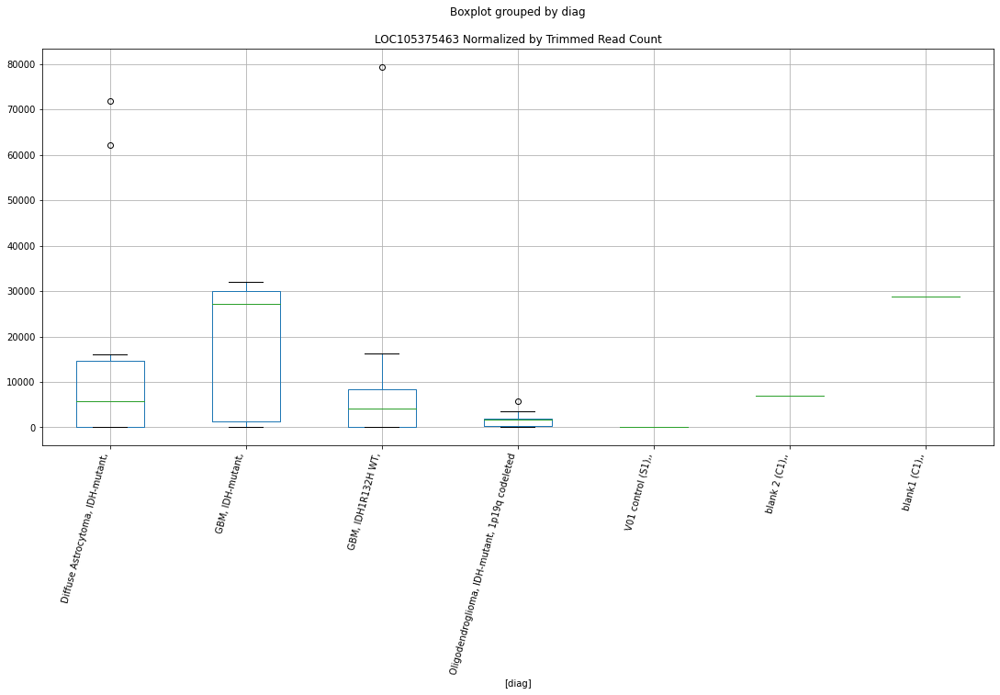

 p : 0.0034108653943695933  ( t : 3.369972198761856 ) :  D-plex  :  bbduk2  :  LOC105373481
Control and blanks
73     0.0
337    0.0
Name: LOC105373481, dtype: float64
205    537.27
Name: LOC105373481, dtype: float64
469    0.0
Name: LOC105373481, dtype: float64


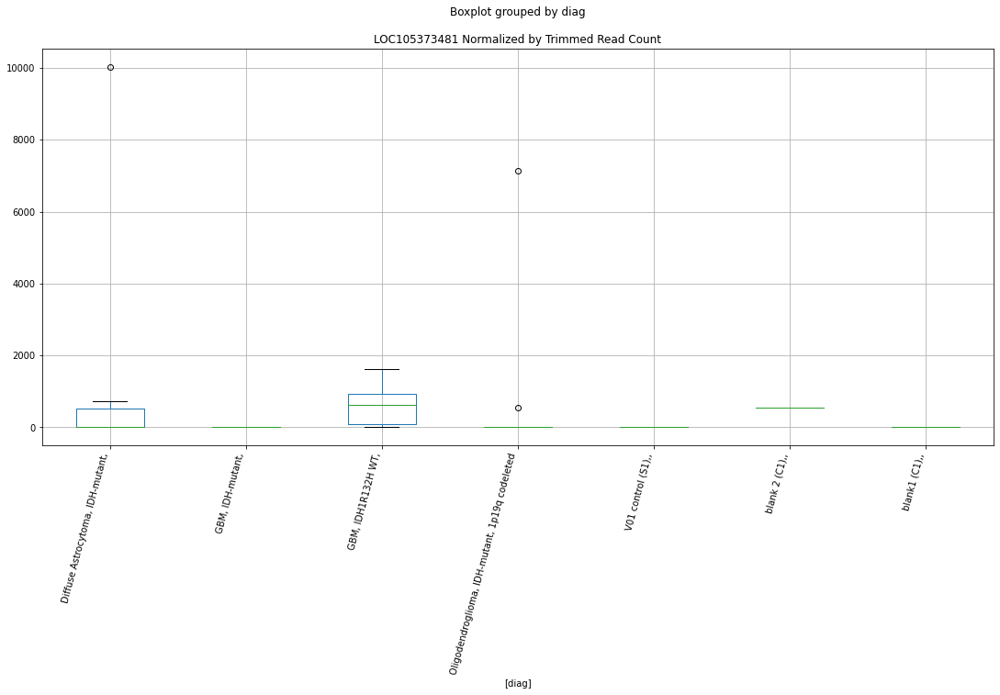

 p : 0.003481033970107393  ( t : 3.3607677598396464 ) :  D-plex  :  cutadapt2  :  LOC105373481
Control and blanks
76     0.0
340    0.0
Name: LOC105373481, dtype: float64
208    529.08
Name: LOC105373481, dtype: float64
472    0.0
Name: LOC105373481, dtype: float64


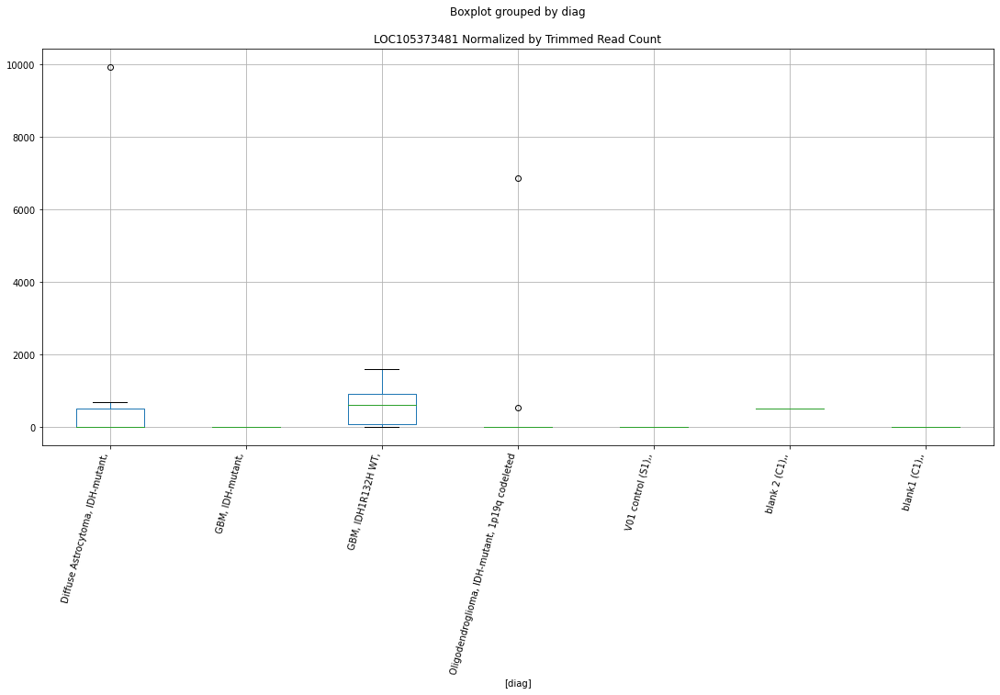

 p : 0.004271486810826445  ( t : 3.2681092270829732 ) :  D-plex  :  bbduk2  :  LOC105378969
Control and blanks
73     0.0
337    0.0
Name: LOC105378969, dtype: float64
205    895.45
Name: LOC105378969, dtype: float64
469    1183.05
Name: LOC105378969, dtype: float64


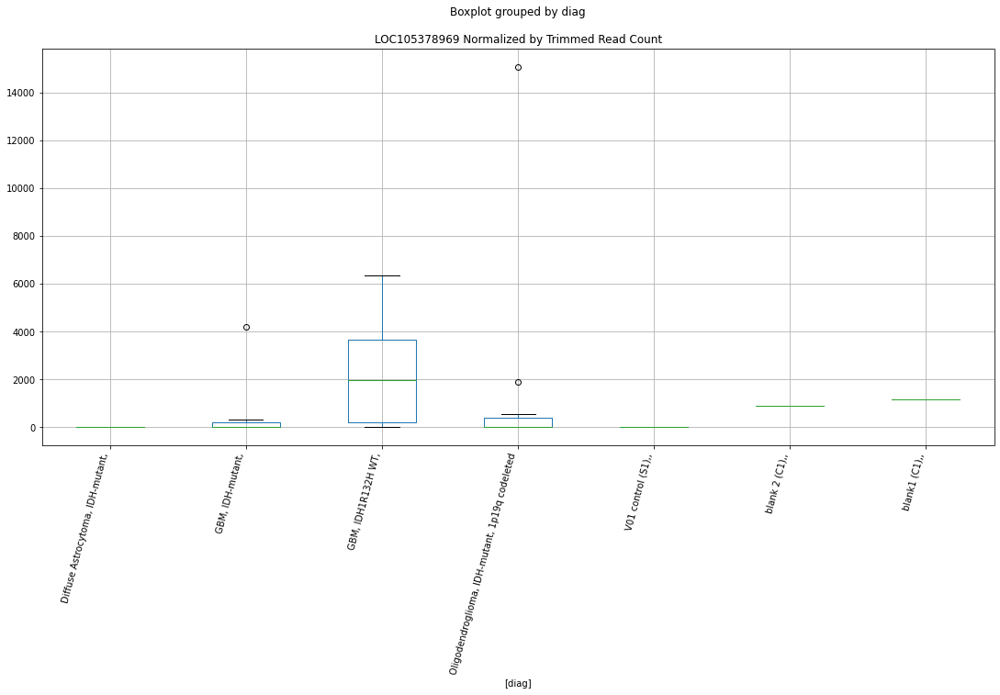

 p : 0.004323739652233338  ( t : 3.262593613281245 ) :  D-plex  :  cutadapt2  :  LOC105378969
Control and blanks
76     0.0
340    0.0
Name: LOC105378969, dtype: float64
208    529.08
Name: LOC105378969, dtype: float64
472    577.96
Name: LOC105378969, dtype: float64


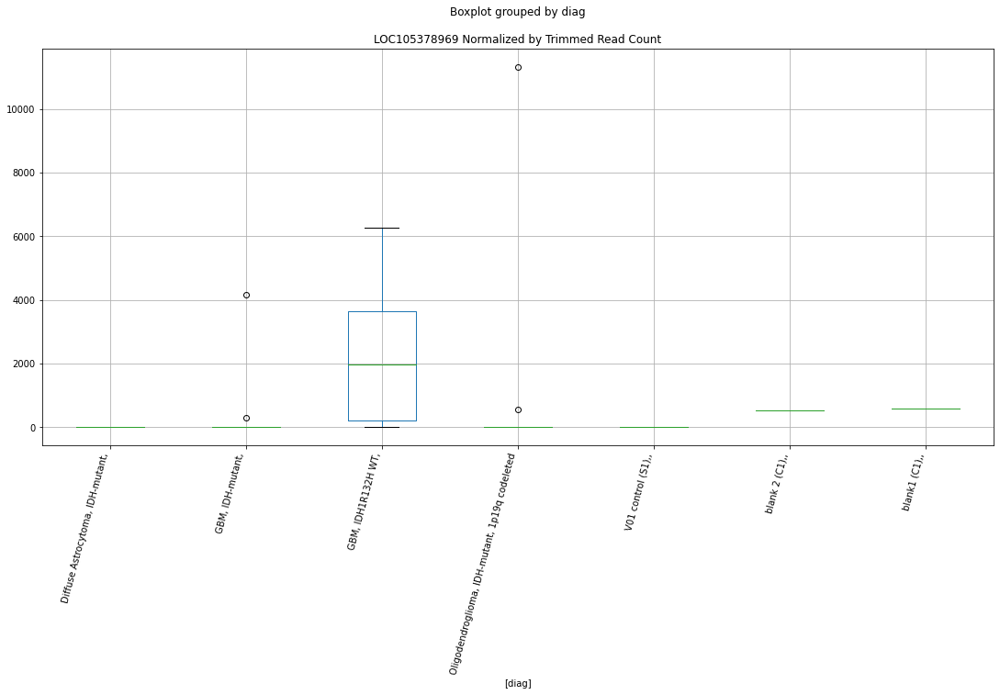

 p : 0.004454848065367489  ( t : 3.249037317434547 ) :  D-plex  :  bbduk2  :  LOC105375463
Control and blanks
73     0.0
337    0.0
Name: LOC105375463, dtype: float64
205    7342.73
Name: LOC105375463, dtype: float64
469    26027.2
Name: LOC105375463, dtype: float64


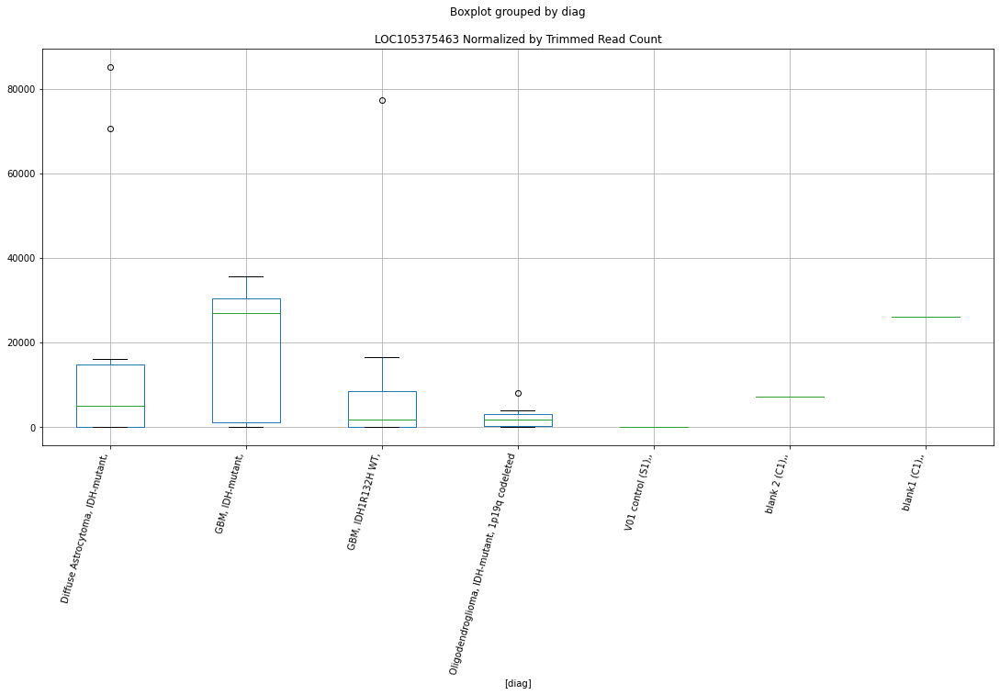

 p : 0.00497032970333646  ( t : 3.199281910474588 ) :  Lexogen  :  cutadapt2  :  LOC105375322
Control and blanks
82     0.0
346    0.0
Name: LOC105375322, dtype: float64
214    2712.26
Name: LOC105375322, dtype: float64
478    0.0
Name: LOC105375322, dtype: float64


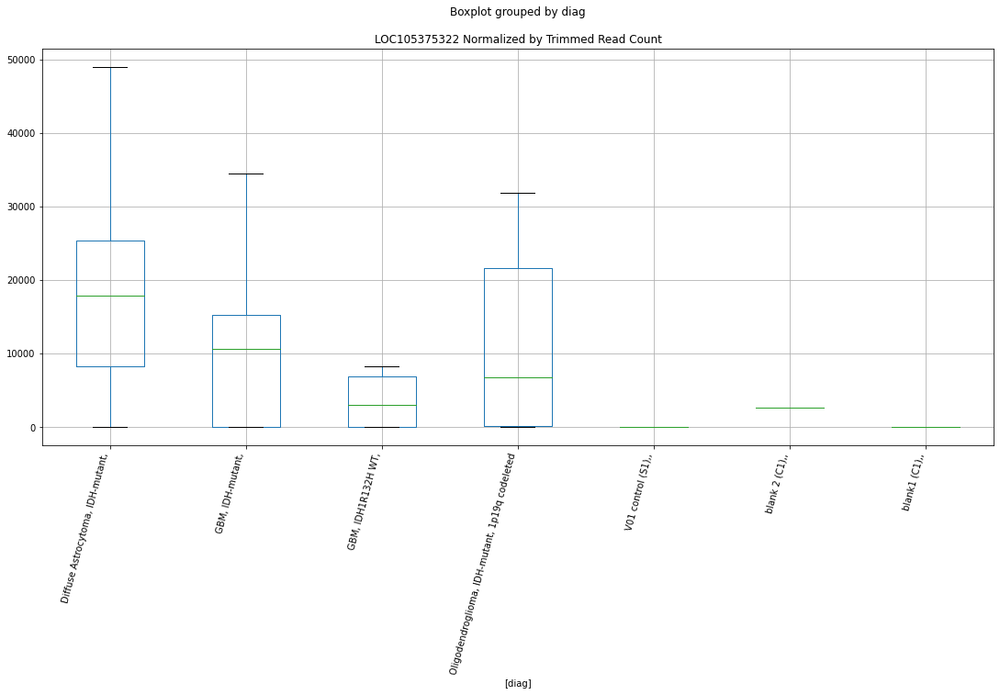

 p : 0.005437502442627451  ( t : 3.15837649140768 ) :  D-plex  :  bbduk2  :  LOC105379549
Control and blanks
73      773.01
337    3560.63
Name: LOC105379549, dtype: float64
205    3940.0
Name: LOC105379549, dtype: float64
469    1774.58
Name: LOC105379549, dtype: float64


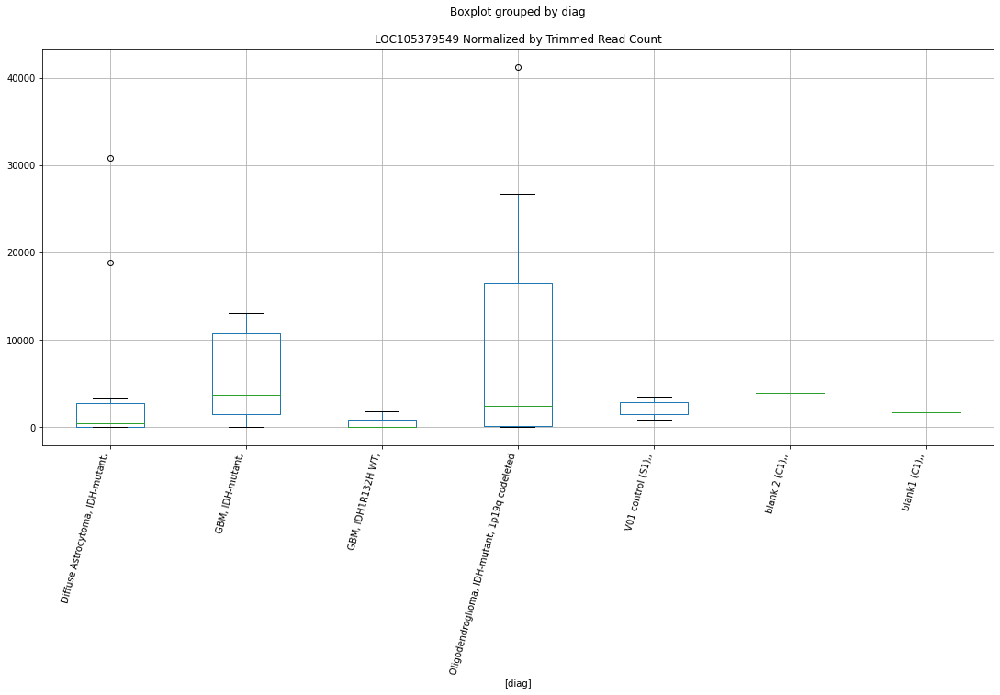

 p : 0.005496705561595507  ( t : 3.1534400974123518 ) :  D-plex  :  cutadapt2  :  LOC105377272
Control and blanks
76     0.0
340    0.0
Name: LOC105377272, dtype: float64
208    352.72
Name: LOC105377272, dtype: float64
472    1155.91
Name: LOC105377272, dtype: float64


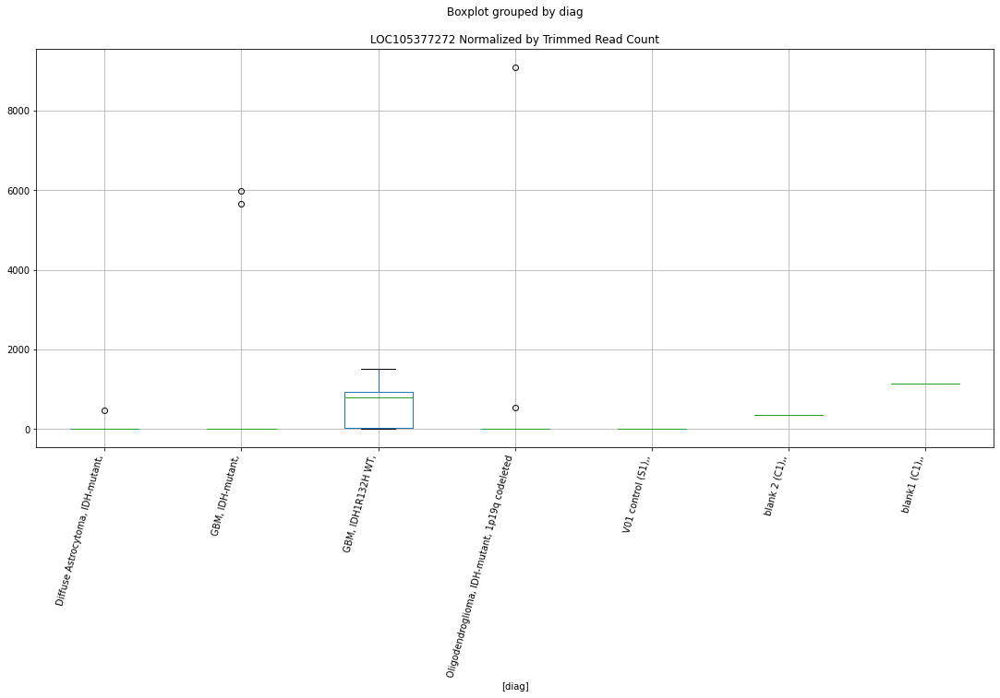

 p : 0.00561444067682849  ( t : 3.14377583725347 ) :  D-plex  :  bbduk2  :  LOC105371934
Control and blanks
73     0.0
337    0.0
Name: LOC105371934, dtype: float64
205    53727.29
Name: LOC105371934, dtype: float64
469    5915.27
Name: LOC105371934, dtype: float64


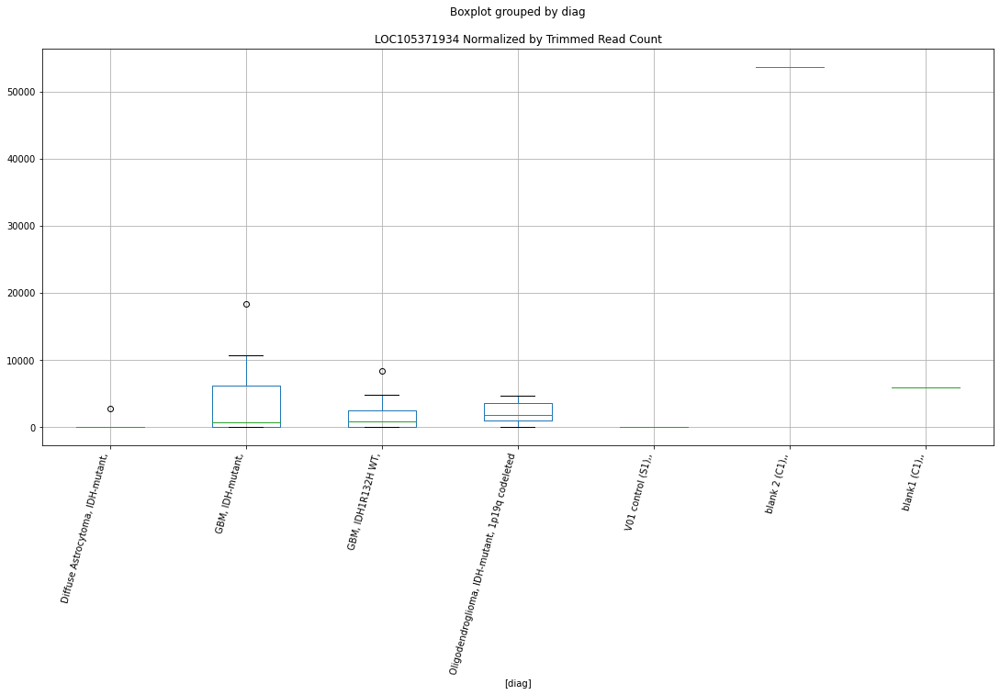

 p : 0.006037472720963815  ( t : 3.1106134794696616 ) :  D-plex  :  bbduk2  :  LOC105379506
Control and blanks
73     61840.67
337     3560.63
Name: LOC105379506, dtype: float64
205    6089.09
Name: LOC105379506, dtype: float64
469    6506.8
Name: LOC105379506, dtype: float64


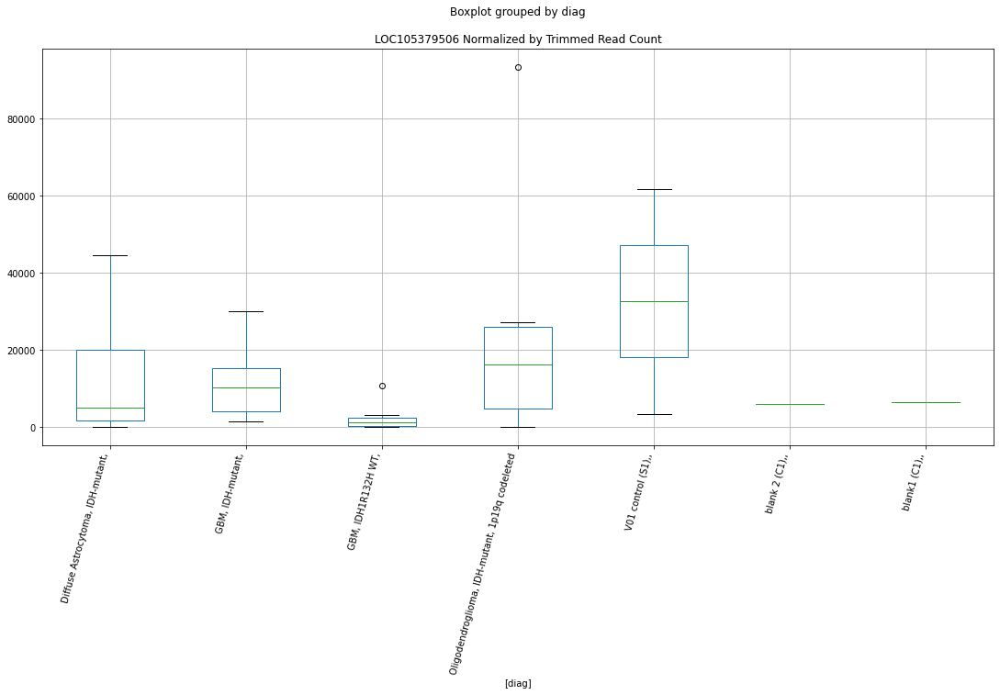

 p : 0.006037472720963815  ( t : 3.1106134794696616 ) :  D-plex  :  bbduk2  :  LOC105379507
Control and blanks
73     61840.67
337     3560.63
Name: LOC105379507, dtype: float64
205    6089.09
Name: LOC105379507, dtype: float64
469    6506.8
Name: LOC105379507, dtype: float64


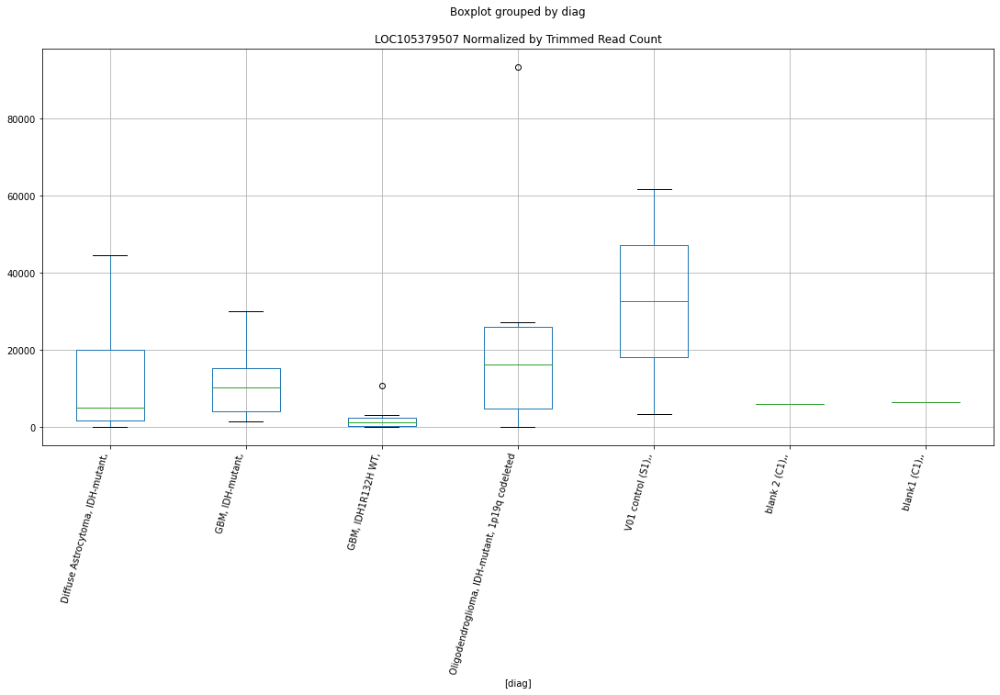

 p : 0.006054016499208707  ( t : 3.1093631519708937 ) :  D-plex  :  bbduk2  :  LOC105379508
Control and blanks
73     61840.67
337     3560.63
Name: LOC105379508, dtype: float64
205    5910.0
Name: LOC105379508, dtype: float64
469    6506.8
Name: LOC105379508, dtype: float64


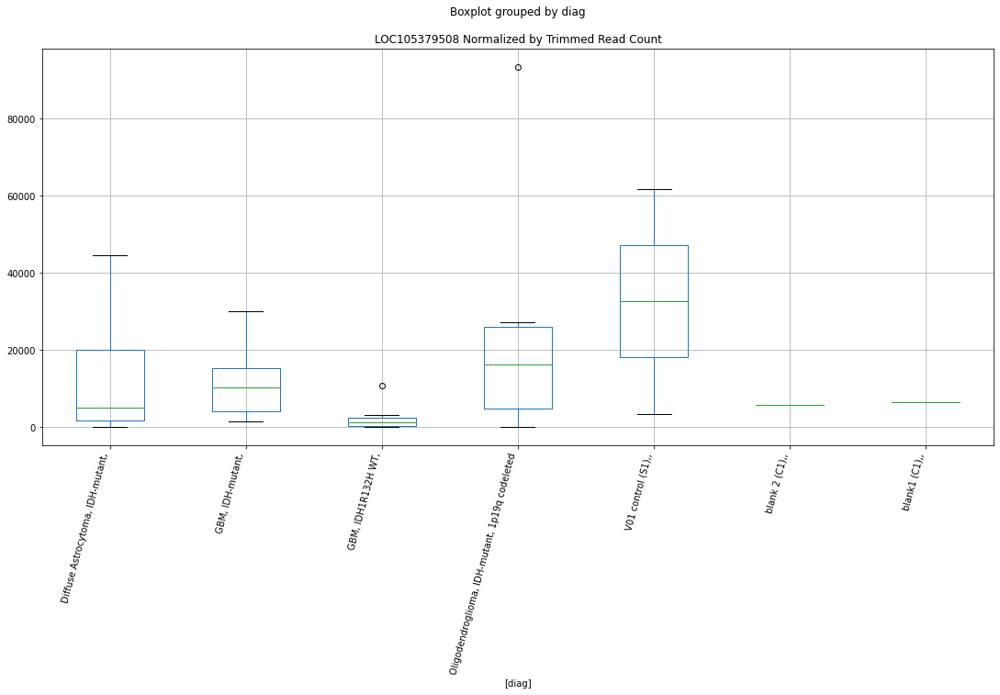

 p : 0.006146885632611355  ( t : 3.102405676426917 ) :  D-plex  :  cutadapt2  :  LOC105376731
Control and blanks
76     0.0
340    0.0
Name: LOC105376731, dtype: float64
208    705.44
Name: LOC105376731, dtype: float64
472    1155.91
Name: LOC105376731, dtype: float64


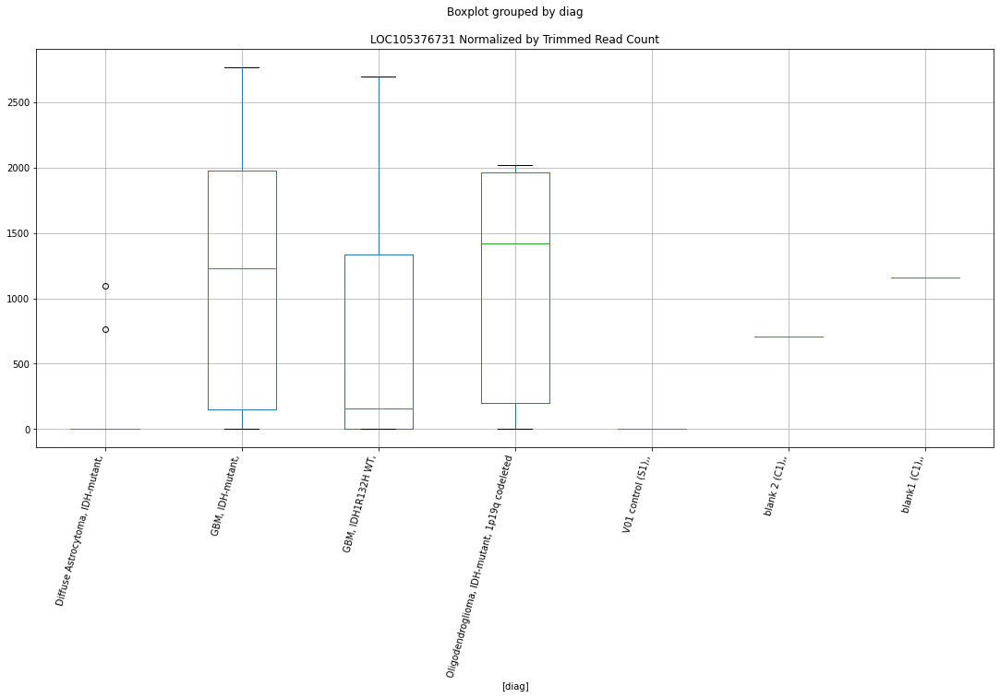

 p : 0.007549202392994358  ( t : 3.0082210685737736 ) :  Lexogen  :  bbduk2  :  LOC105375322
Control and blanks
79     0.0
343    0.0
Name: LOC105375322, dtype: float64
211    2733.06
Name: LOC105375322, dtype: float64
475    0.0
Name: LOC105375322, dtype: float64


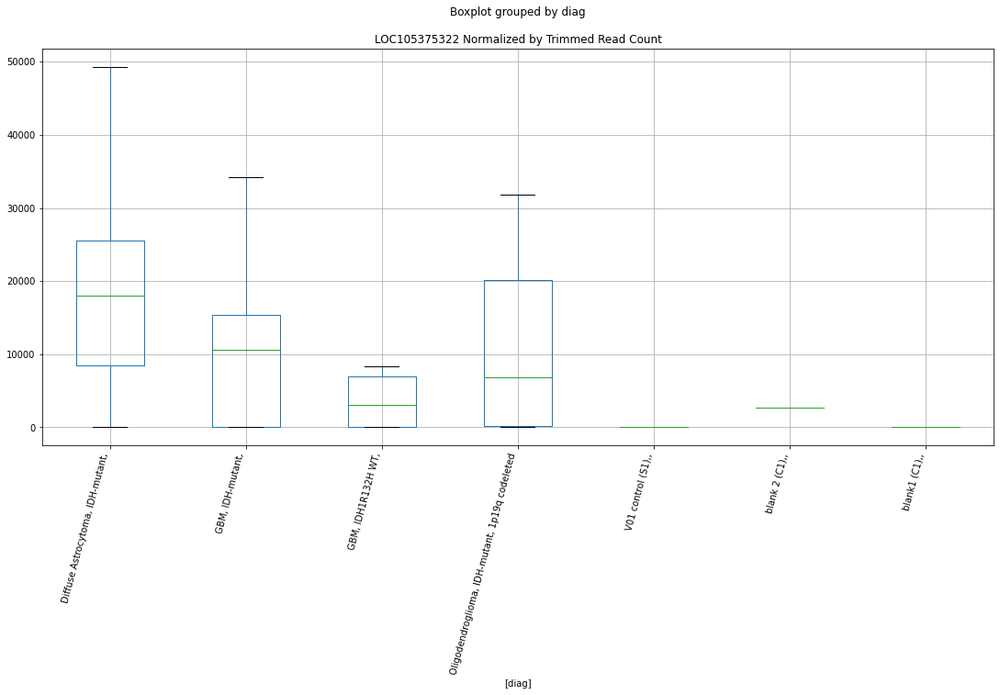

 p : 0.008139284039649754  ( t : 2.973591804479684 ) :  D-plex  :  cutadapt2  :  LOC105373946
Control and blanks
76     757.61
340      0.00
Name: LOC105373946, dtype: float64
208    2469.04
Name: LOC105373946, dtype: float64
472    3467.74
Name: LOC105373946, dtype: float64


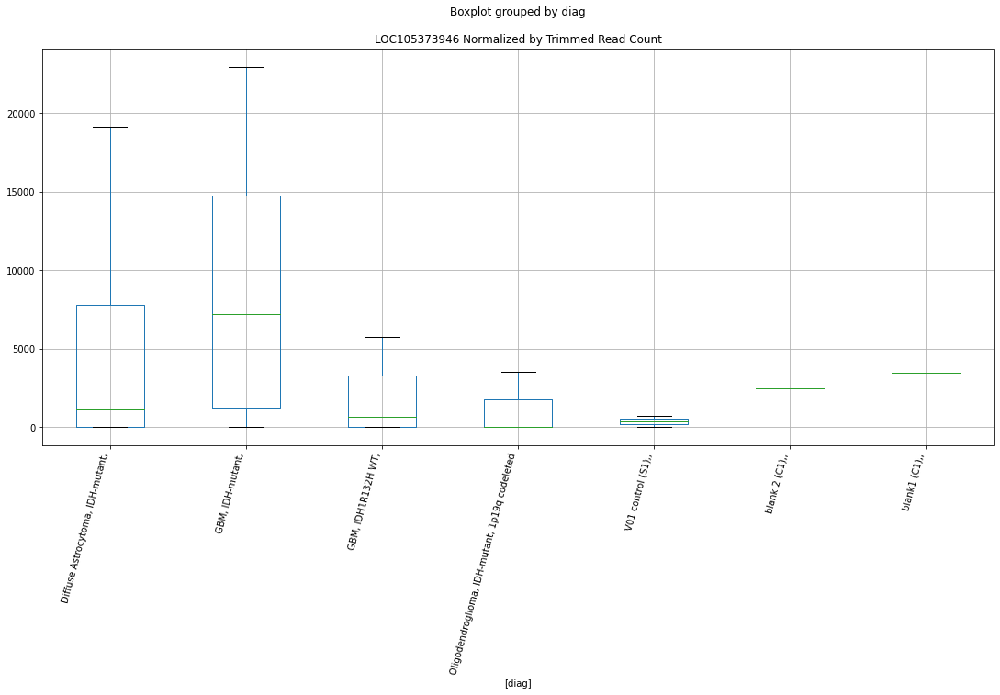

 p : 0.008229137350892264  ( t : 2.968533558664873 ) :  D-plex  :  bbduk2  :  LOC105373946
Control and blanks
73     773.01
337      0.00
Name: LOC105373946, dtype: float64
205    2507.27
Name: LOC105373946, dtype: float64
469    3549.16
Name: LOC105373946, dtype: float64


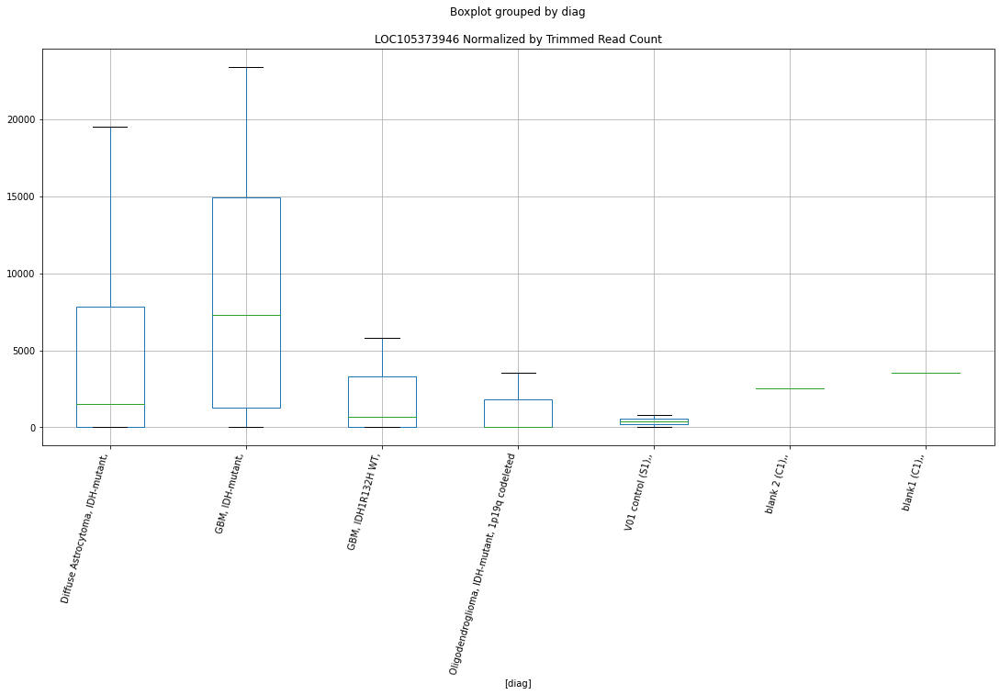

 p : 0.008875891415507195  ( t : 2.9336294438313857 ) :  Lexogen  :  bbduk2  :  LOC105377167
Control and blanks
79     0.0
343    0.0
Name: LOC105377167, dtype: float64
211    0.0
Name: LOC105377167, dtype: float64
475    718.55
Name: LOC105377167, dtype: float64


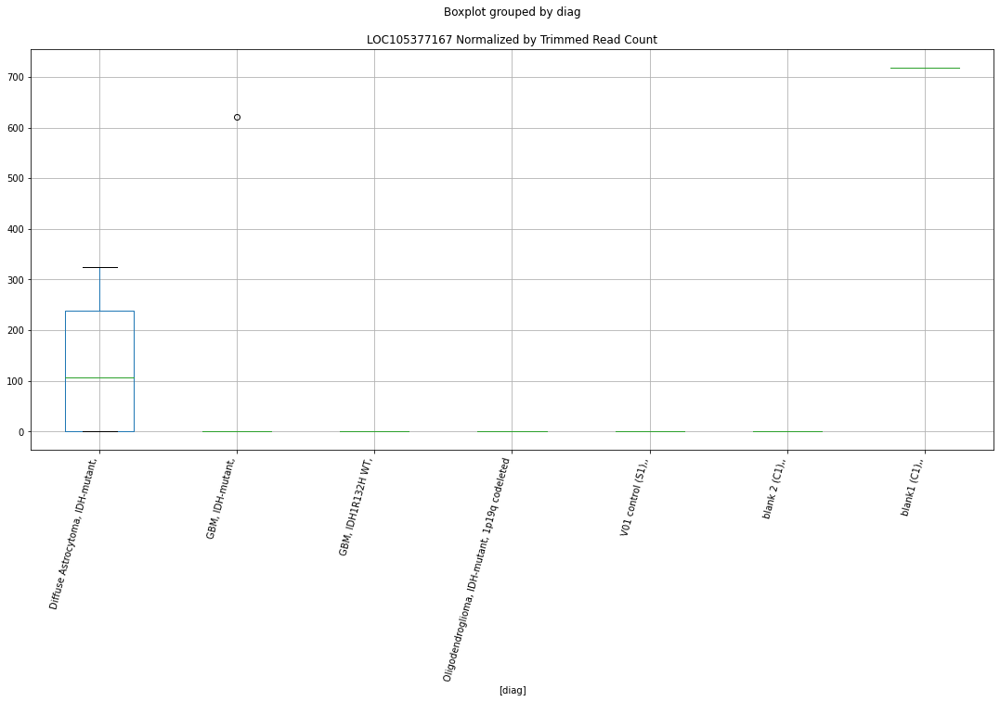

 p : 0.008880510739873195  ( t : 2.93338911642708 ) :  Lexogen  :  cutadapt2  :  LOC105377167
Control and blanks
82     0.0
346    0.0
Name: LOC105377167, dtype: float64
214    0.0
Name: LOC105377167, dtype: float64
478    712.38
Name: LOC105377167, dtype: float64


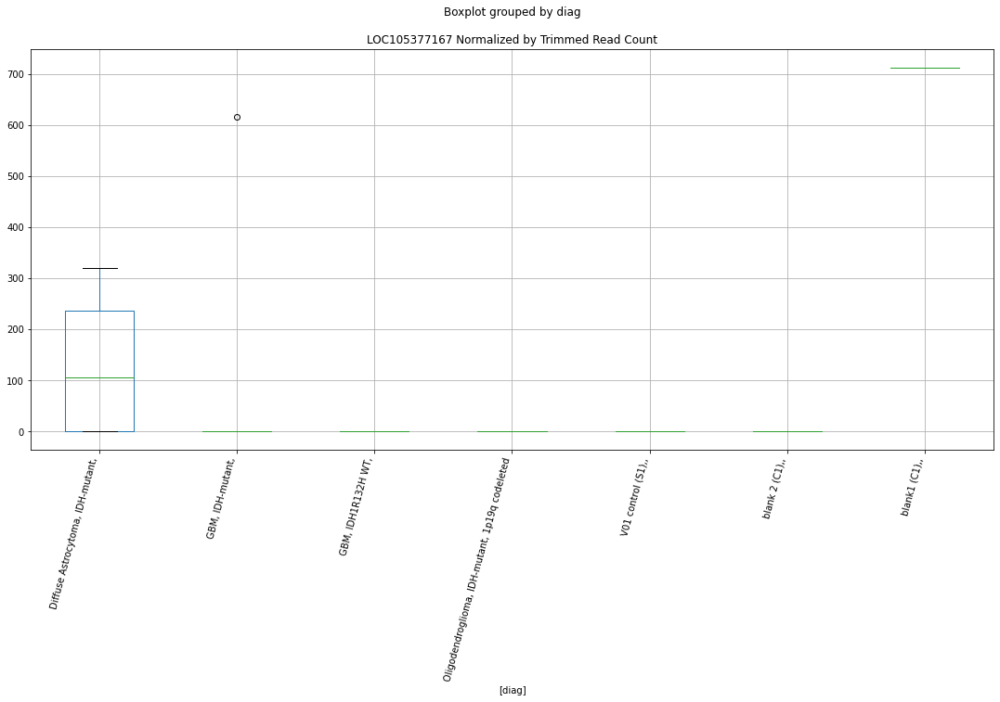

 p : 0.009186613988277555  ( t : 2.9177272367601703 ) :  Lexogen  :  cutadapt2  :  LOC107985115
Control and blanks
82     0.0
346    0.0
Name: LOC107985115, dtype: float64
214    0.0
Name: LOC107985115, dtype: float64
478    0.0
Name: LOC107985115, dtype: float64


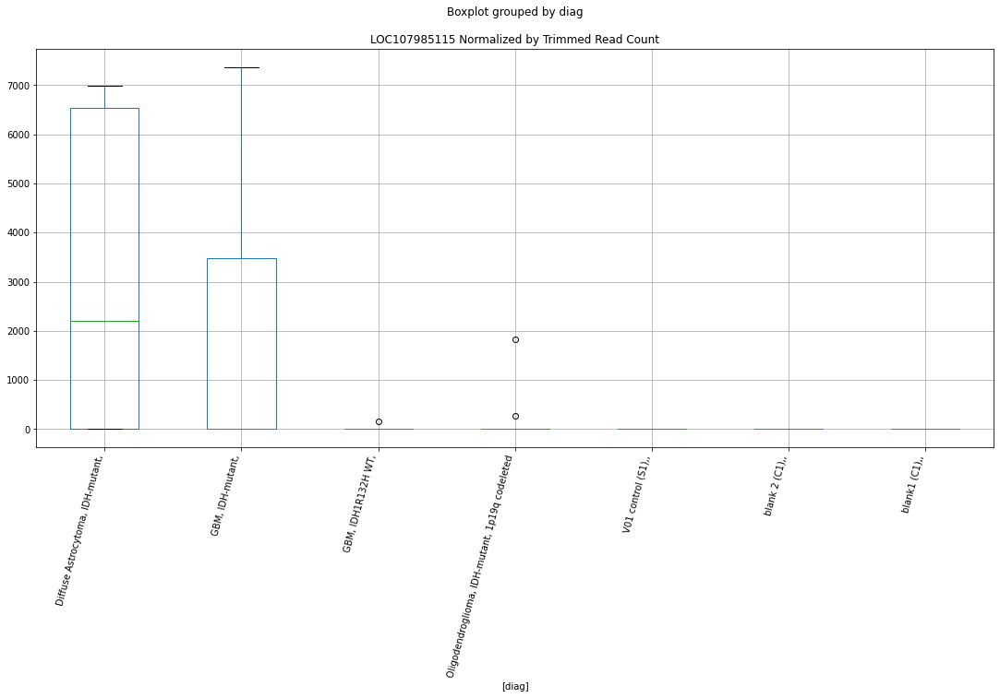

 p : 0.009211049348164751  ( t : 2.9164988342844884 ) :  Lexogen  :  bbduk2  :  LOC107985115
Control and blanks
79     0.0
343    0.0
Name: LOC107985115, dtype: float64
211    0.0
Name: LOC107985115, dtype: float64
475    0.0
Name: LOC107985115, dtype: float64


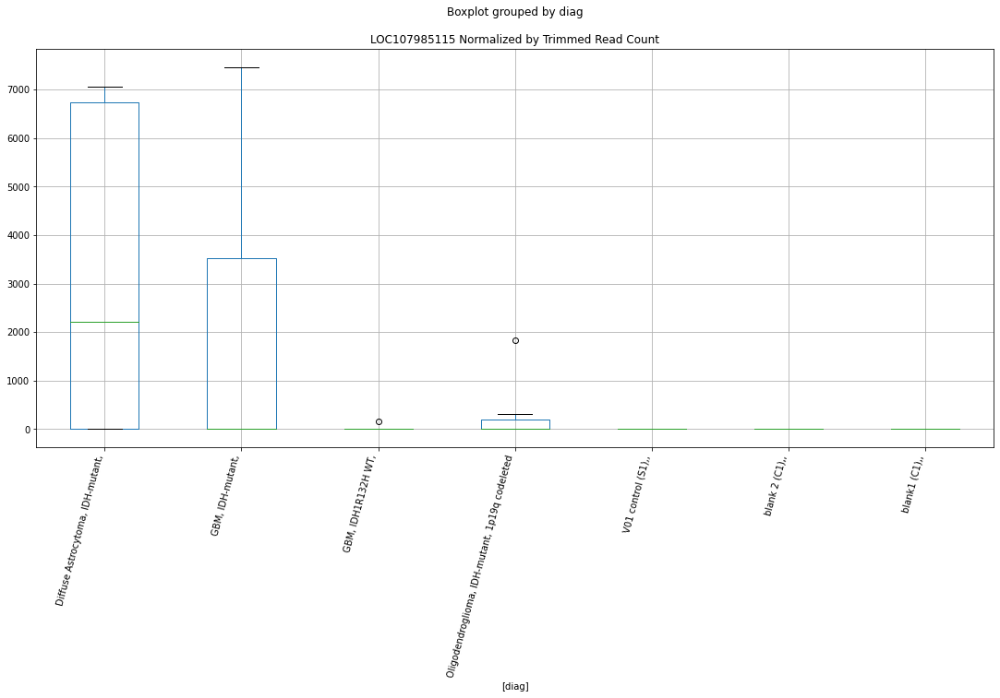

 p : 0.009247438887642765  ( t : 2.9146753042928135 ) :  D-plex  :  cutadapt2  :  LOC105371934
Control and blanks
76     0.0
340    0.0
Name: LOC105371934, dtype: float64
208    52908.07
Name: LOC105371934, dtype: float64
472    4623.65
Name: LOC105371934, dtype: float64


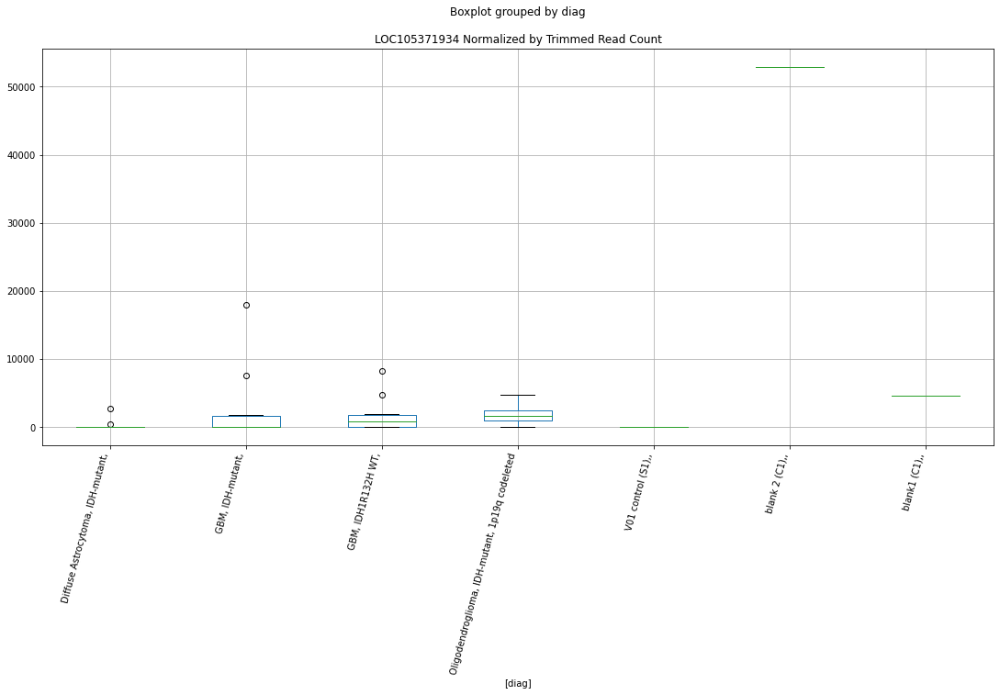

 p : 0.00959282605926025  ( t : 2.89770477388757 ) :  Lexogen  :  bbduk2  :  LOC105373874
Control and blanks
79     0.0
343    0.0
Name: LOC105373874, dtype: float64
211    0.0
Name: LOC105373874, dtype: float64
475    0.0
Name: LOC105373874, dtype: float64


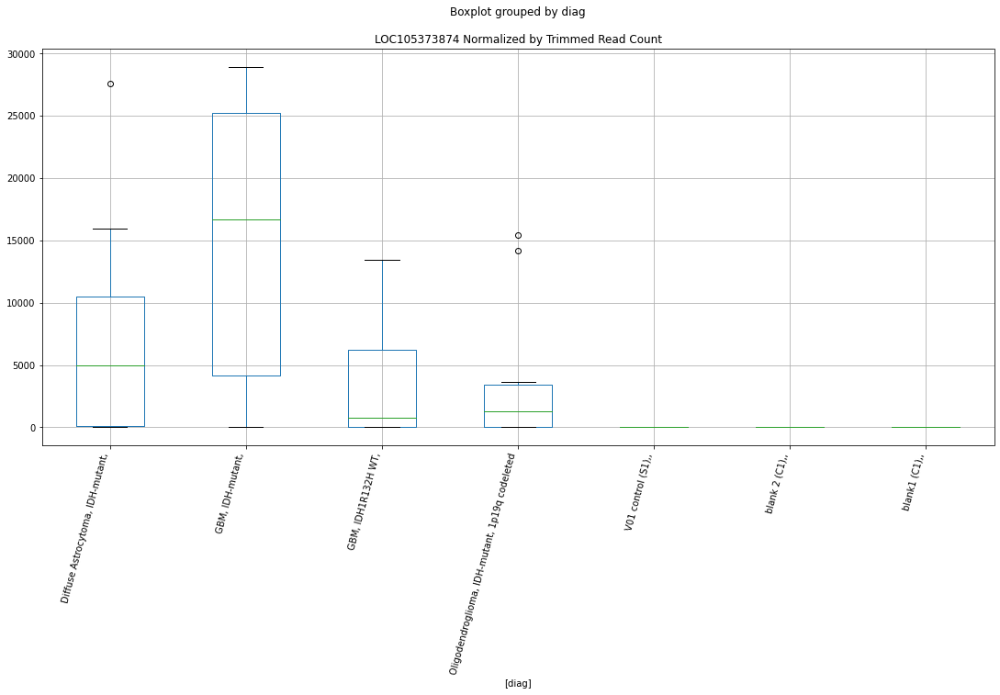

 p : 0.009636793445346046  ( t : 2.895586941652993 ) :  Lexogen  :  cutadapt2  :  LOC105373874
Control and blanks
82     0.0
346    0.0
Name: LOC105373874, dtype: float64
214    0.0
Name: LOC105373874, dtype: float64
478    0.0
Name: LOC105373874, dtype: float64


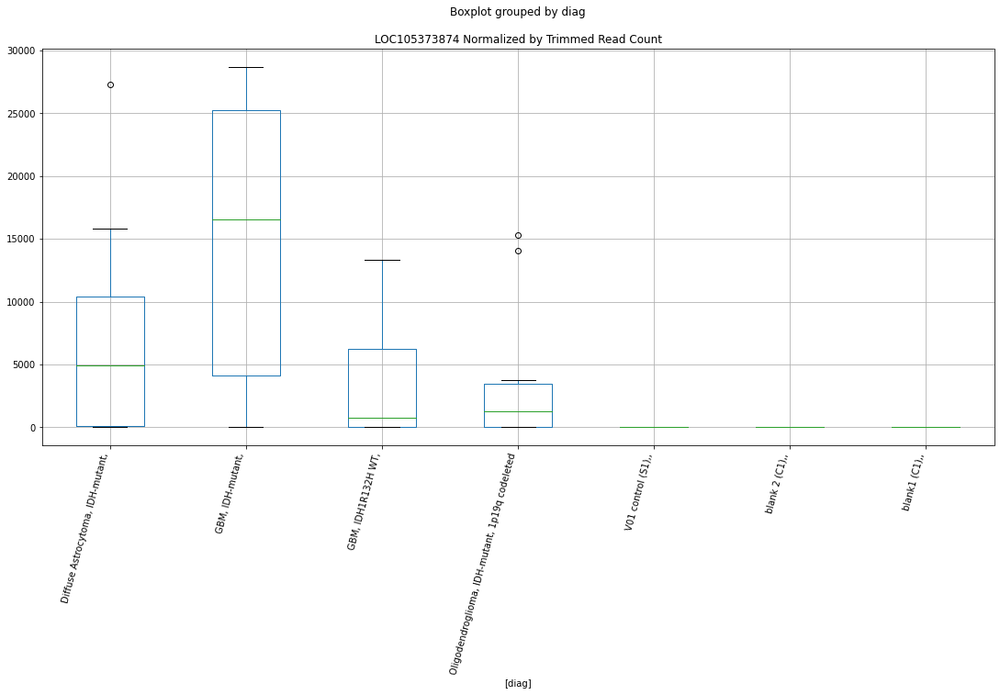

 p : 0.009738809272076258  ( t : 2.890708741944123 ) :  D-plex  :  cutadapt2  :  LOC105376731
Control and blanks
76     0.0
340    0.0
Name: LOC105376731, dtype: float64
208    705.44
Name: LOC105376731, dtype: float64
472    1155.91
Name: LOC105376731, dtype: float64


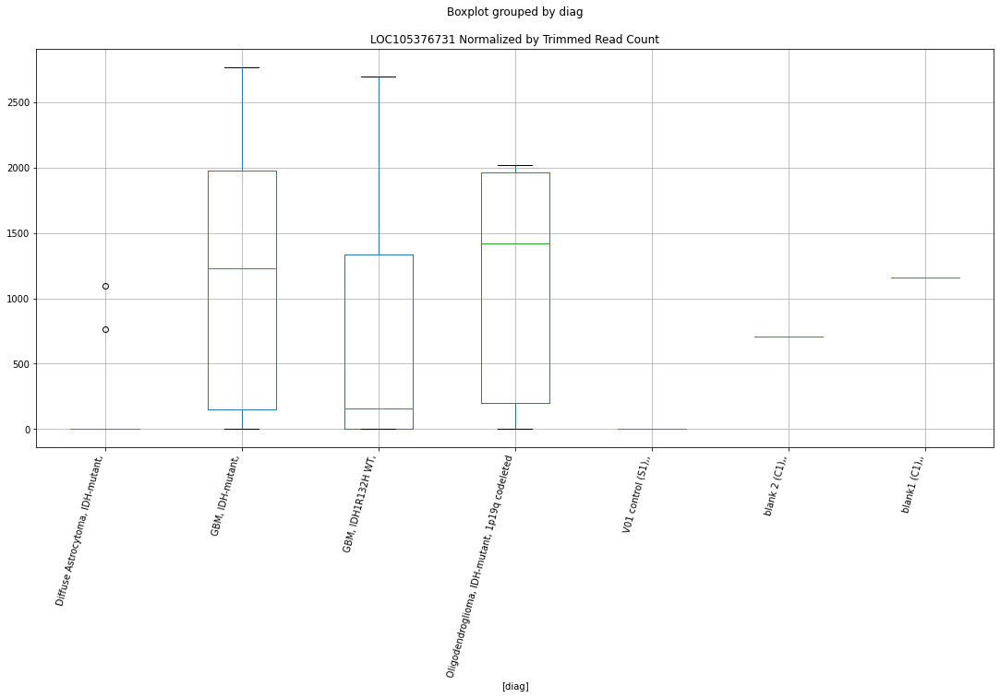

 p : 0.009853593232329826  ( t : 2.8852786364450003 ) :  D-plex  :  cutadapt2  :  LOC105375457
Control and blanks
76     2272.84
340     880.73
Name: LOC105375457, dtype: float64
208    3703.56
Name: LOC105375457, dtype: float64
472    1733.87
Name: LOC105375457, dtype: float64


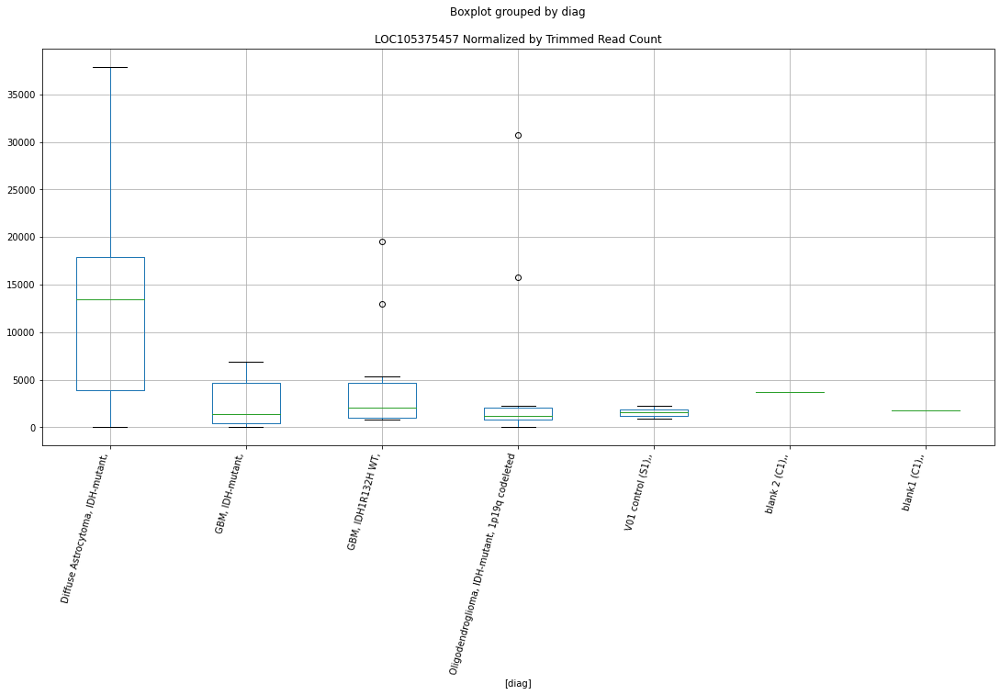

 p : 0.01016074922408737  ( t : 2.871042802671474 ) :  D-plex  :  bbduk2  :  LOC105375457
Control and blanks
73     2319.03
337     890.16
Name: LOC105375457, dtype: float64
205    3760.91
Name: LOC105375457, dtype: float64
469    1774.58
Name: LOC105375457, dtype: float64


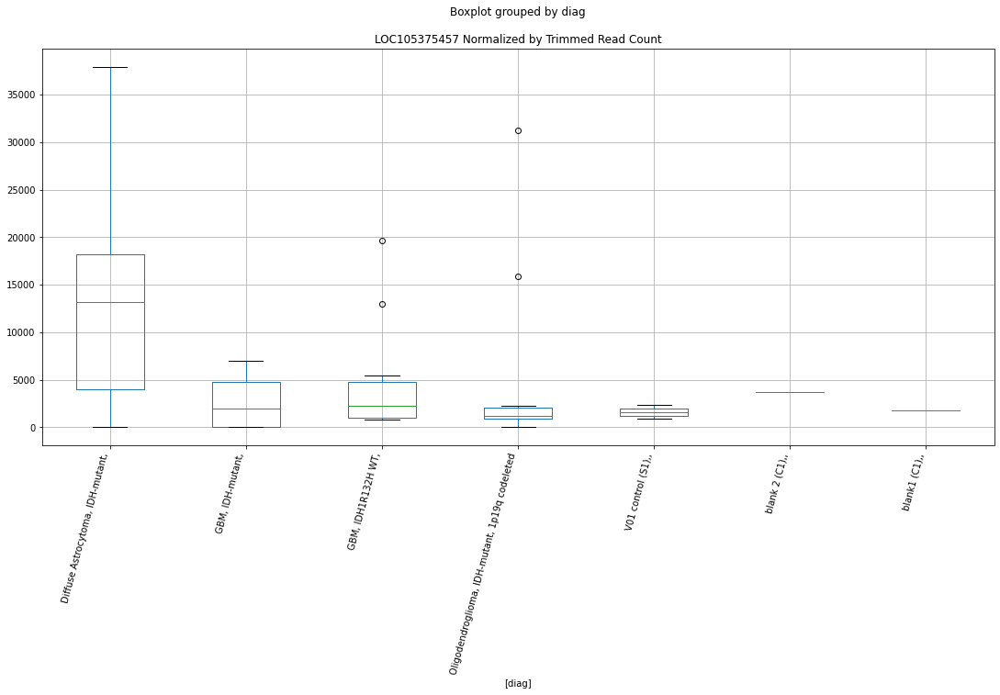

 p : 0.010246858836875783  ( t : 2.8671263477427367 ) :  D-plex  :  cutadapt2  :  LOC107985429
Control and blanks
76     0.0
340    0.0
Name: LOC107985429, dtype: float64
208    176.36
Name: LOC107985429, dtype: float64
472    0.0
Name: LOC107985429, dtype: float64


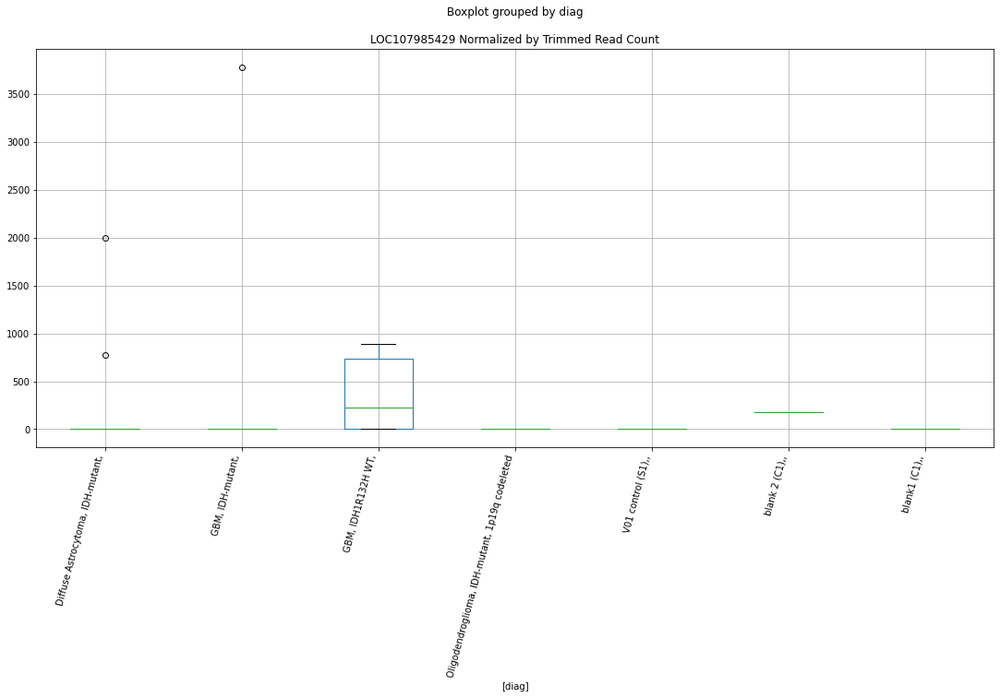

 p : 0.010499157823682884  ( t : 2.8558313050036195 ) :  D-plex  :  bbduk2  :  LOC107984036
Control and blanks
73     0.0
337    0.0
Name: LOC107984036, dtype: float64
205    1790.91
Name: LOC107984036, dtype: float64
469    1183.05
Name: LOC107984036, dtype: float64


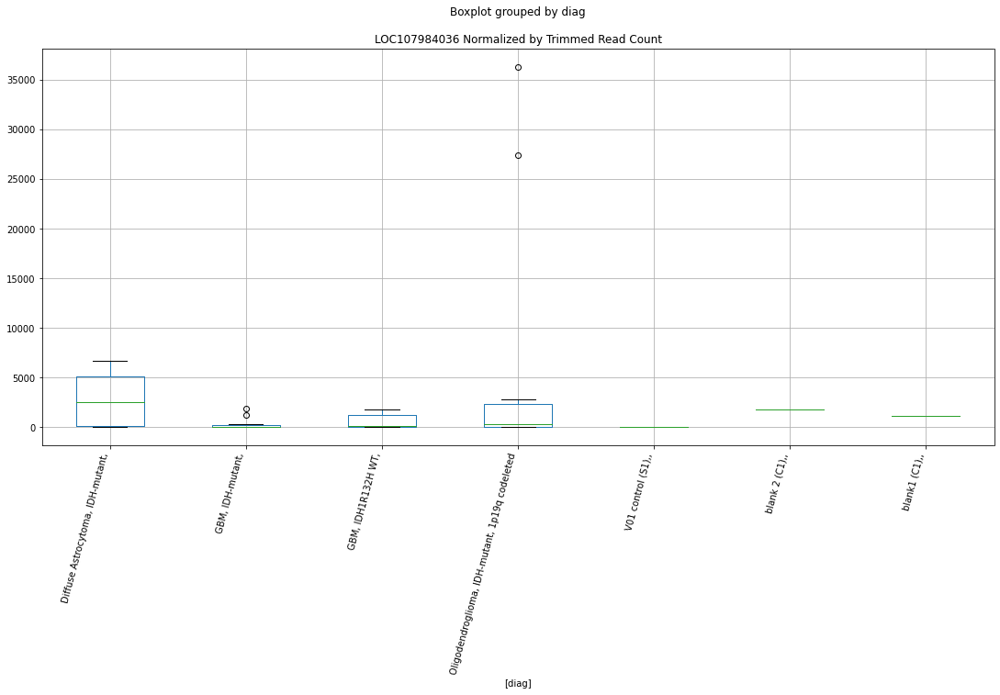

 p : 0.010595518156105212  ( t : 2.8515863155371344 ) :  D-plex  :  bbduk2  :  LOC105375052
Control and blanks
73     0.0
337    0.0
Name: LOC105375052, dtype: float64
205    716.36
Name: LOC105375052, dtype: float64
469    0.0
Name: LOC105375052, dtype: float64


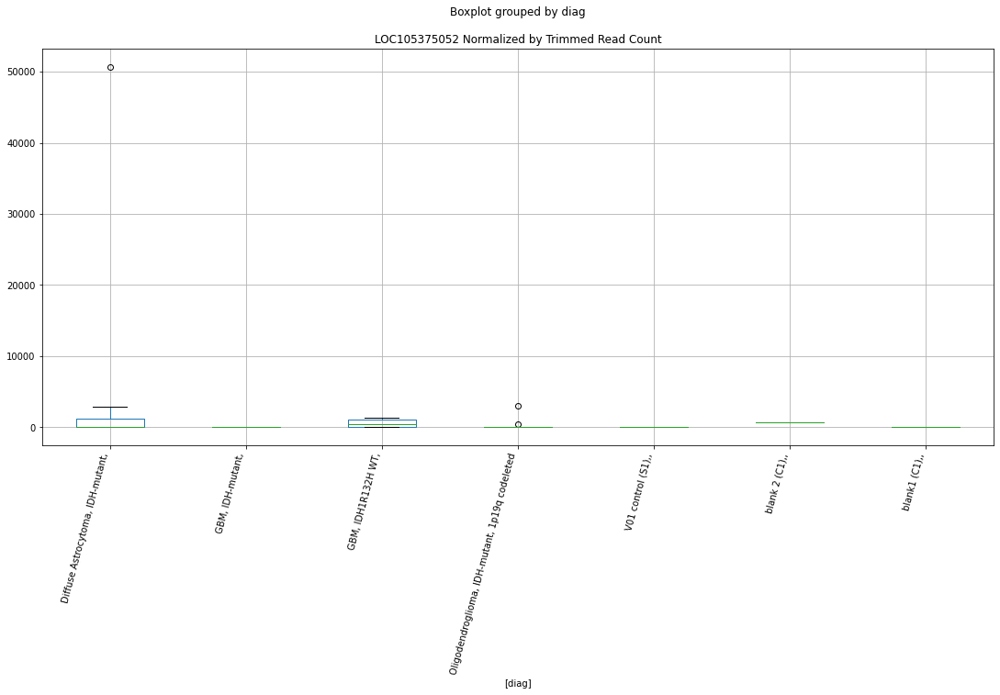

 p : 0.010619642677384978  ( t : 2.8505293740357067 ) :  D-plex  :  cutadapt2  :  LOC107984036
Control and blanks
76     0.0
340    0.0
Name: LOC107984036, dtype: float64
208    1587.24
Name: LOC107984036, dtype: float64
472    1733.87
Name: LOC107984036, dtype: float64


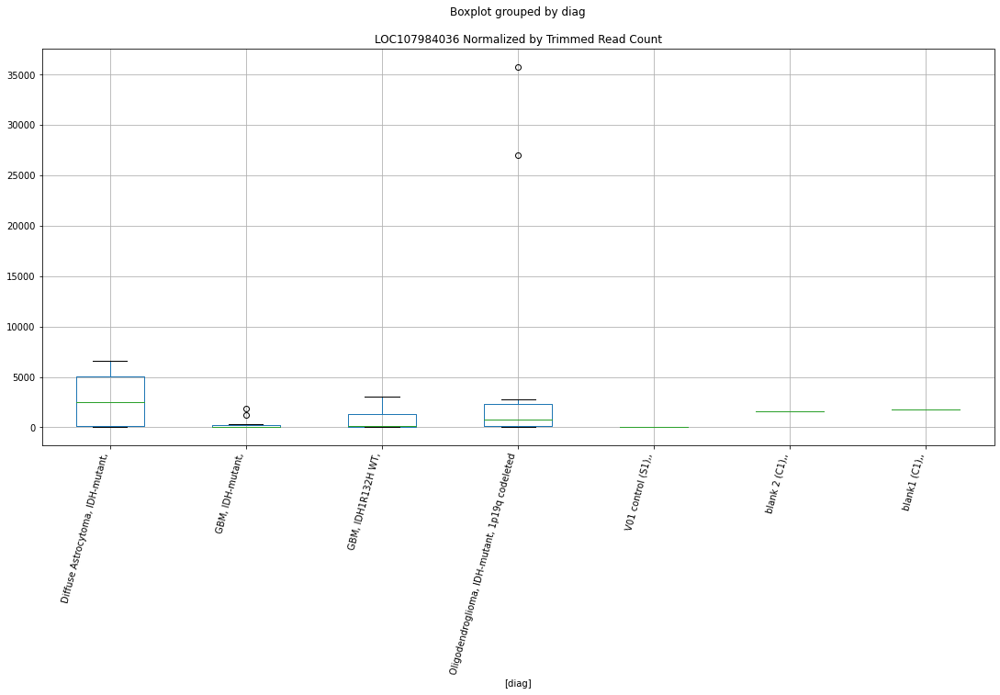

 p : 0.010673012745105858  ( t : 2.848199325014308 ) :  D-plex  :  cutadapt2  :  LOC105375052
Control and blanks
76     0.0
340    0.0
Name: LOC105375052, dtype: float64
208    705.44
Name: LOC105375052, dtype: float64
472    0.0
Name: LOC105375052, dtype: float64


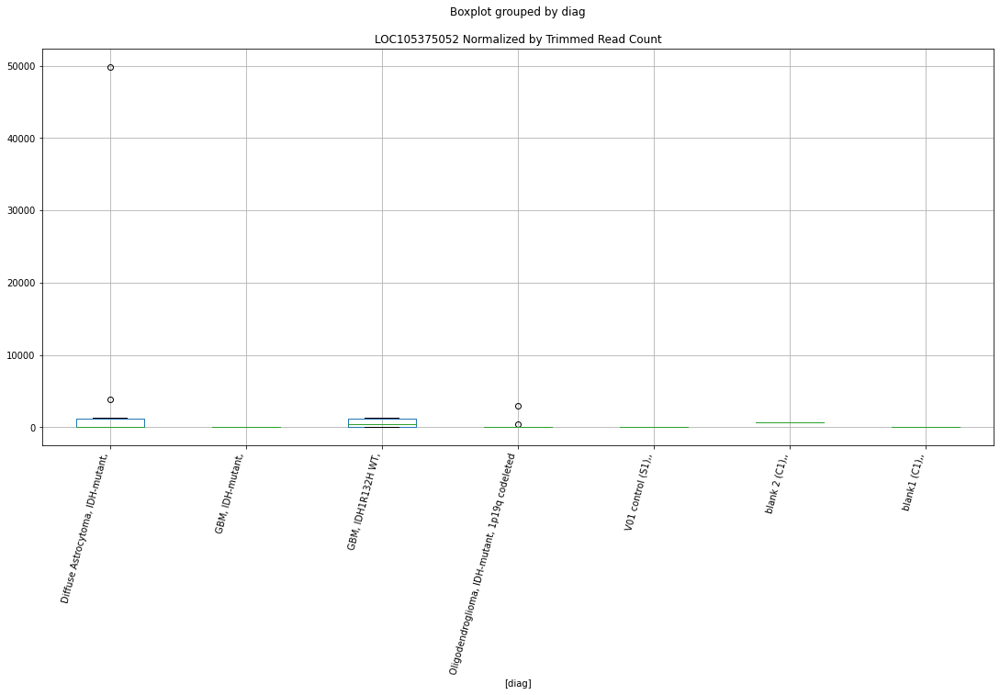

 p : 0.010773655128360385  ( t : 2.8438358229715344 ) :  D-plex  :  bbduk2  :  LOC105377272
Control and blanks
73     0.0
337    0.0
Name: LOC105377272, dtype: float64
205    358.18
Name: LOC105377272, dtype: float64
469    1183.05
Name: LOC105377272, dtype: float64


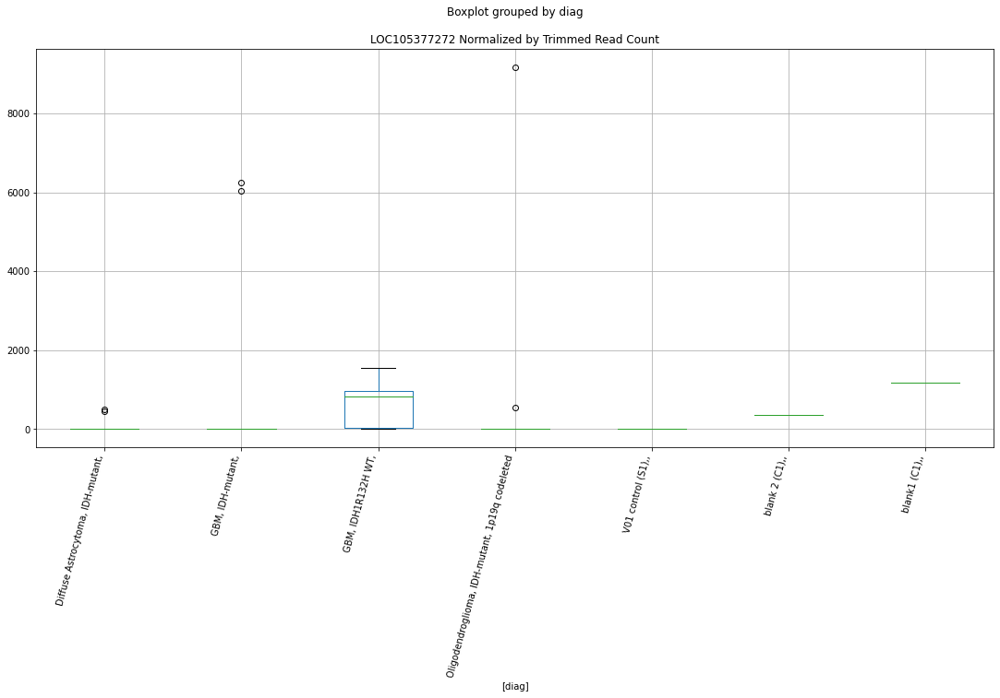

 p : 0.010990544385654121  ( t : 2.8345641965303674 ) :  Lexogen  :  bbduk2  :  LOC107984736
Control and blanks
79     0.0
343    0.0
Name: LOC107984736, dtype: float64
211    0.0
Name: LOC107984736, dtype: float64
475    0.0
Name: LOC107984736, dtype: float64


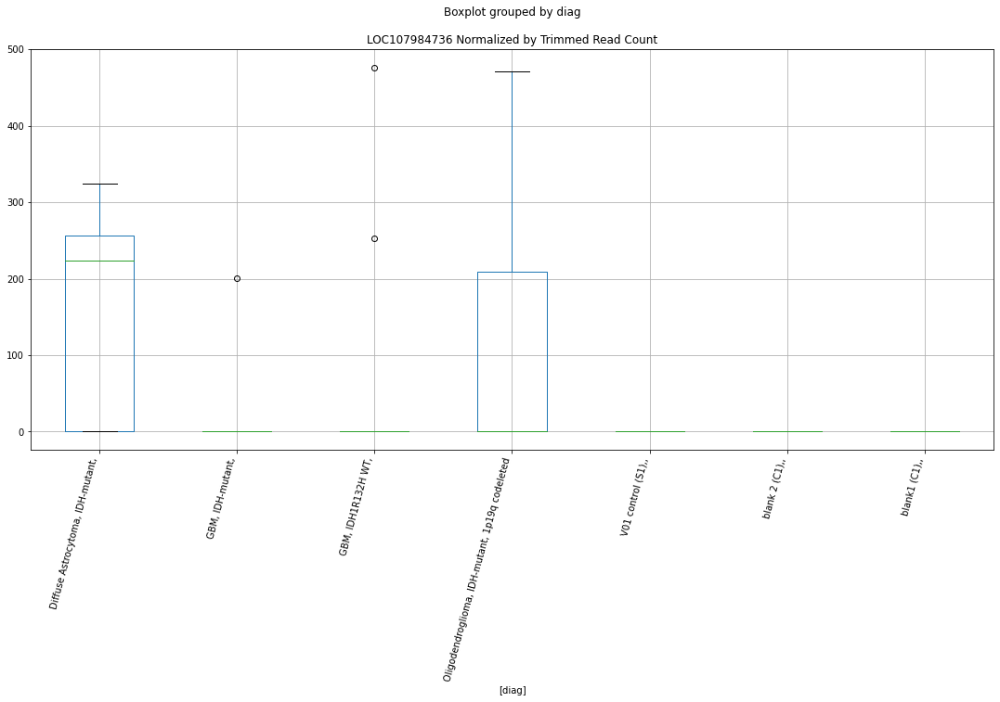

 p : 0.011014250754247069  ( t : 2.8335614929855164 ) :  D-plex  :  cutadapt2  :  LOC107985079
Control and blanks
76     0.0
340    0.0
Name: LOC107985079, dtype: float64
208    1587.24
Name: LOC107985079, dtype: float64
472    3467.74
Name: LOC107985079, dtype: float64


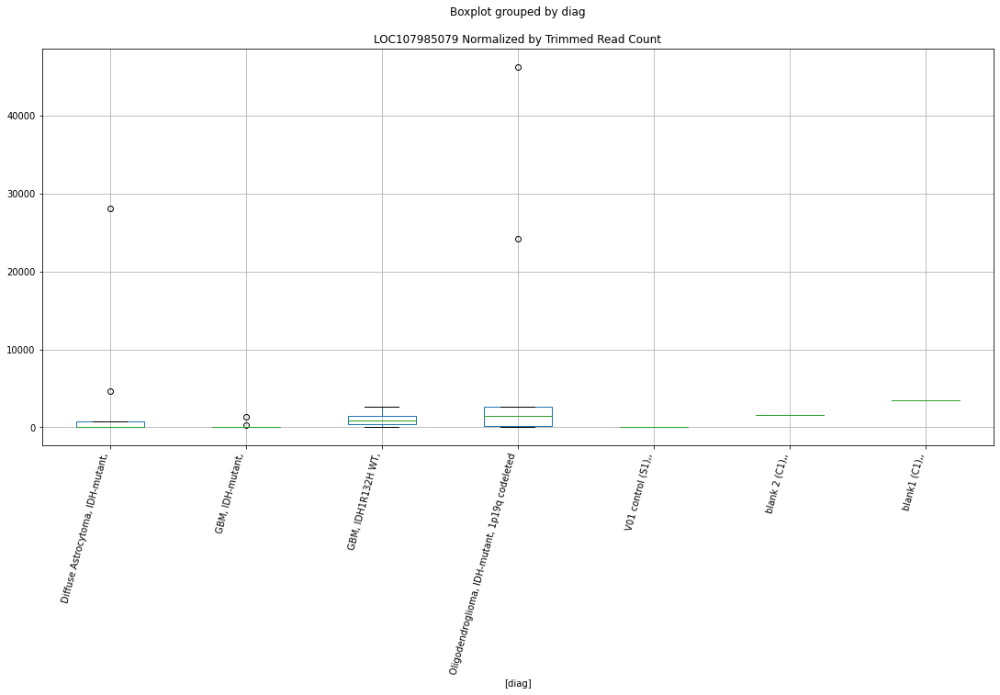

 p : 0.011691169550685393  ( t : 2.8057727476857575 ) :  D-plex  :  bbduk2  :  LOC107985917
Control and blanks
73     1546.02
337     890.16
Name: LOC107985917, dtype: float64
205    4298.18
Name: LOC107985917, dtype: float64
469    6506.8
Name: LOC107985917, dtype: float64


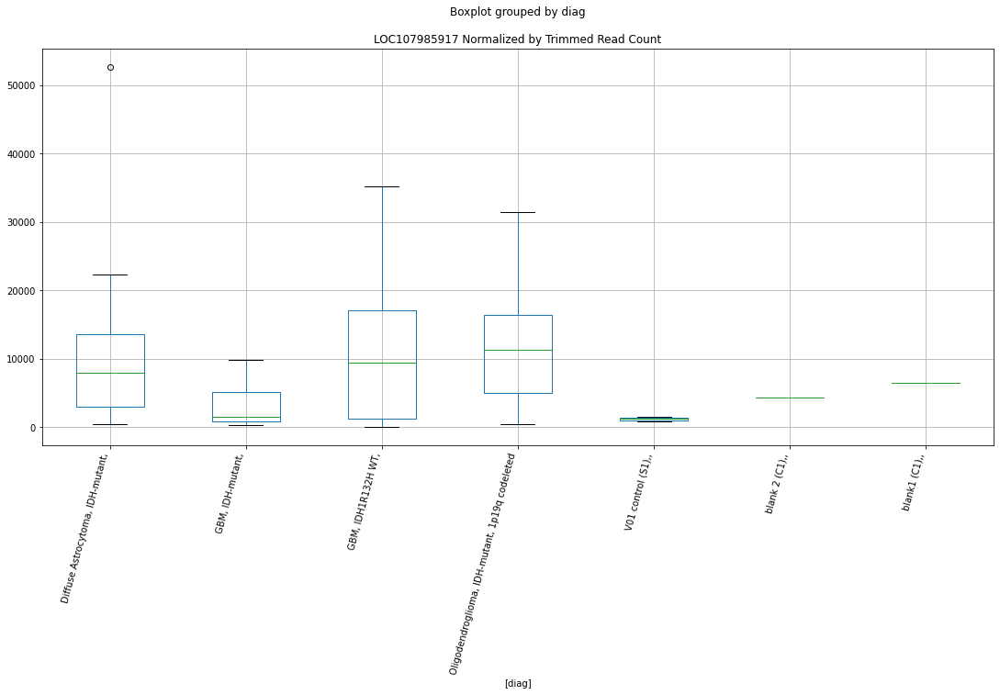

 p : 0.011747285560558875  ( t : 2.8035390235694817 ) :  D-plex  :  bbduk2  :  LOC105371961
Control and blanks
73         0.00
337    92576.36
Name: LOC105371961, dtype: float64
205    16297.28
Name: LOC105371961, dtype: float64
469    28393.31
Name: LOC105371961, dtype: float64


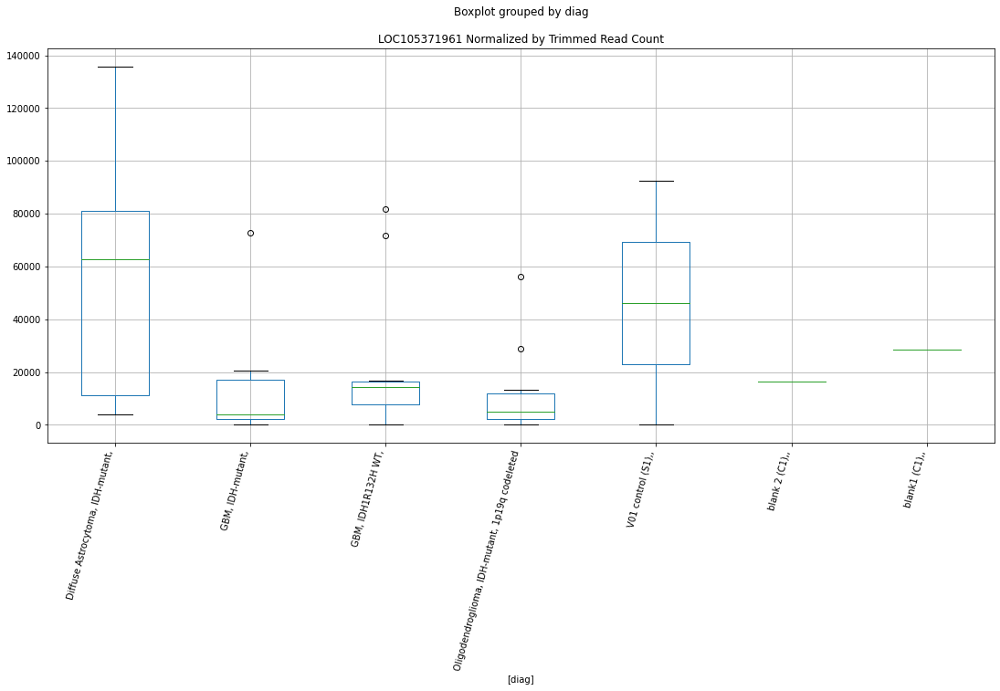

 p : 0.01182566583695902  ( t : 2.8004361628401173 ) :  D-plex  :  cutadapt2  :  LOC105371961
Control and blanks
76         0.00
340    91596.14
Name: LOC105371961, dtype: float64
208    16048.78
Name: LOC105371961, dtype: float64
472    30053.7
Name: LOC105371961, dtype: float64


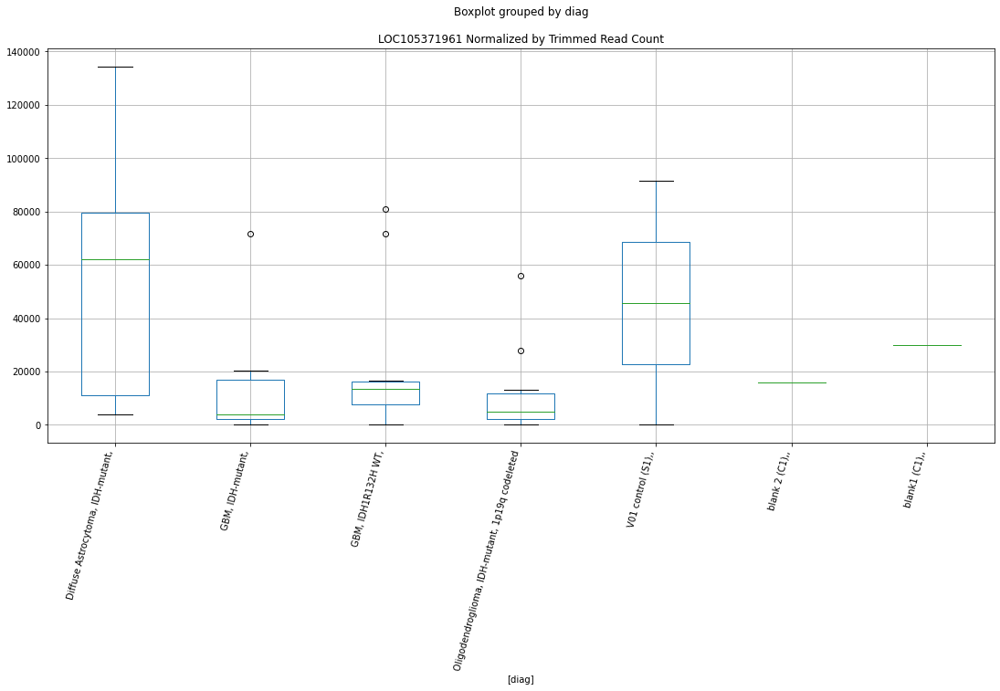

 p : 0.012515065915449446  ( t : 2.773965407208096 ) :  D-plex  :  cutadapt2  :  LOC105372704
Control and blanks
76     0.0
340    0.0
Name: LOC105372704, dtype: float64
208    2116.32
Name: LOC105372704, dtype: float64
472    1155.91
Name: LOC105372704, dtype: float64


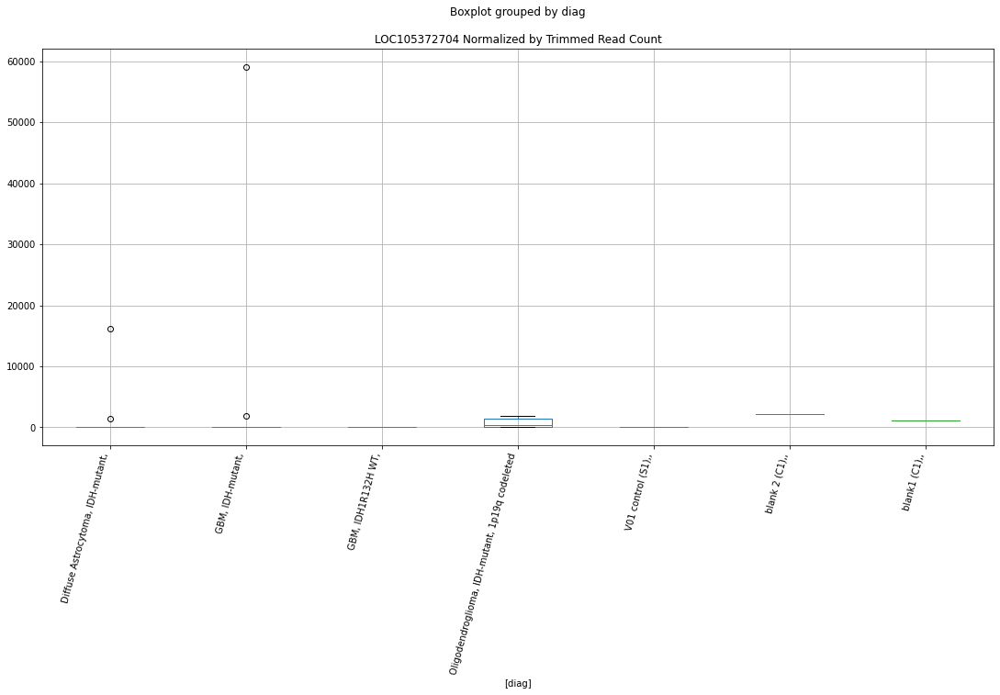

 p : 0.012634041077385689  ( t : 2.7695392485070753 ) :  D-plex  :  bbduk2  :  LOC105372704
Control and blanks
73     0.0
337    0.0
Name: LOC105372704, dtype: float64
205    2149.09
Name: LOC105372704, dtype: float64
469    1183.05
Name: LOC105372704, dtype: float64


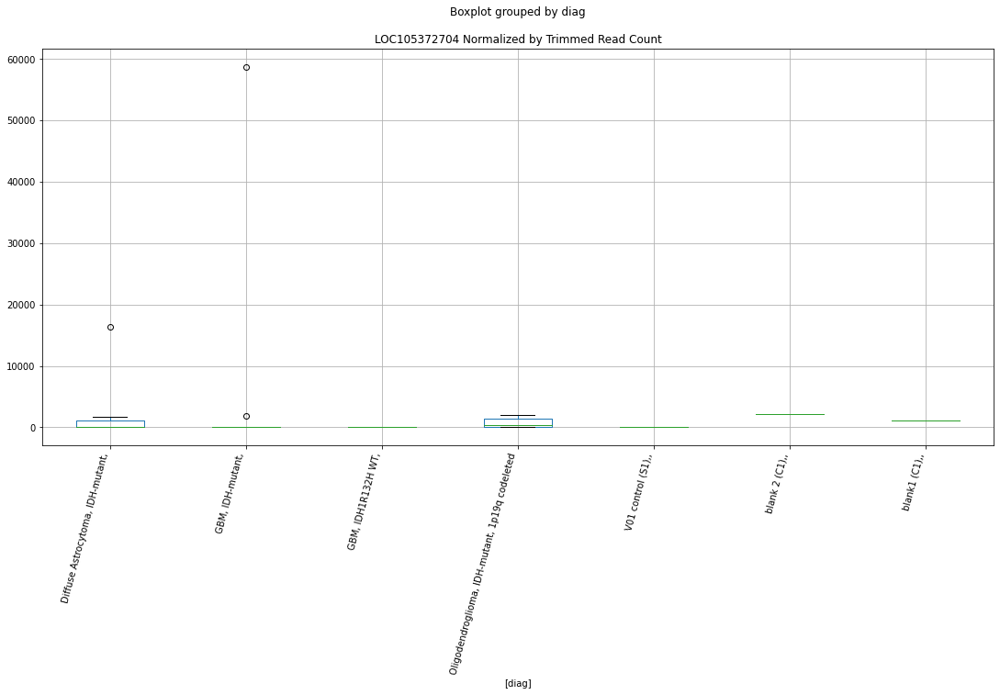

 p : 0.012964984552494677  ( t : 2.7574344037770615 ) :  D-plex  :  cutadapt2  :  LOC105379507
Control and blanks
76     60609.14
340     3522.93
Name: LOC105379507, dtype: float64
208    7230.77
Name: LOC105379507, dtype: float64
472    6357.51
Name: LOC105379507, dtype: float64


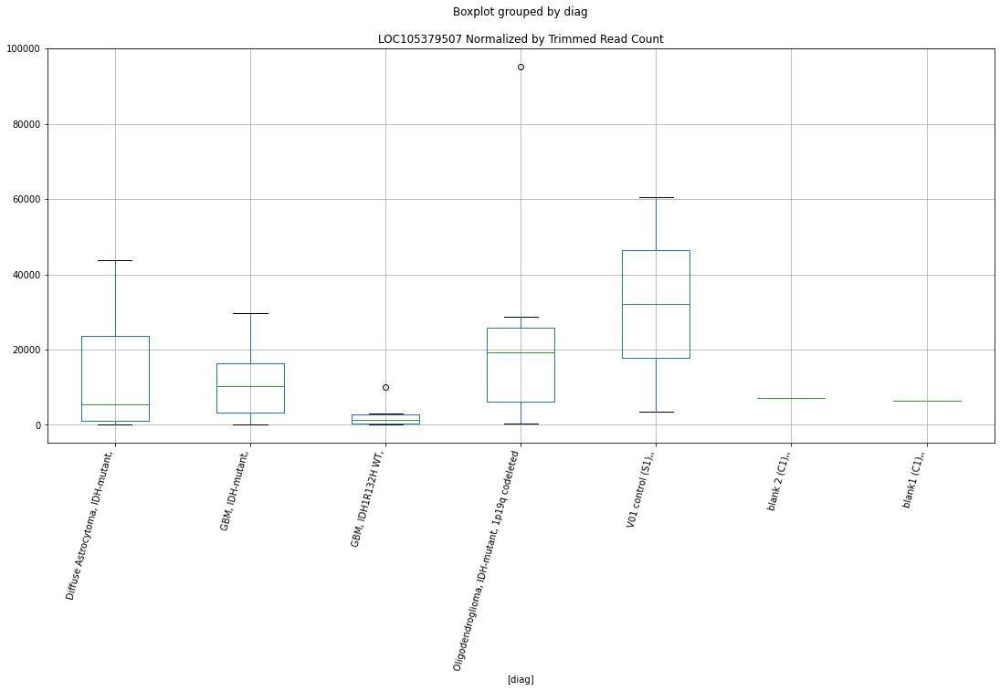

 p : 0.012964984552494677  ( t : 2.7574344037770615 ) :  D-plex  :  cutadapt2  :  LOC105379506
Control and blanks
76     60609.14
340     3522.93
Name: LOC105379506, dtype: float64
208    7230.77
Name: LOC105379506, dtype: float64
472    6357.51
Name: LOC105379506, dtype: float64


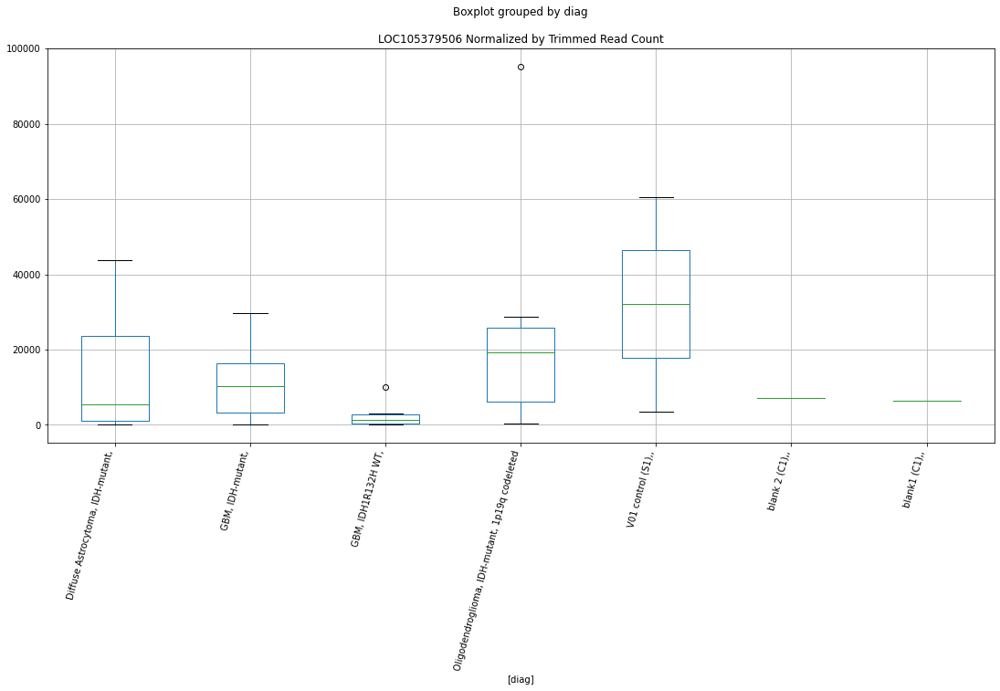

 p : 0.013152448014318998  ( t : 2.7507083517099757 ) :  D-plex  :  cutadapt2  :  LOC105377697
Control and blanks
76     0.0
340    0.0
Name: LOC105377697, dtype: float64
208    176.36
Name: LOC105377697, dtype: float64
472    0.0
Name: LOC105377697, dtype: float64


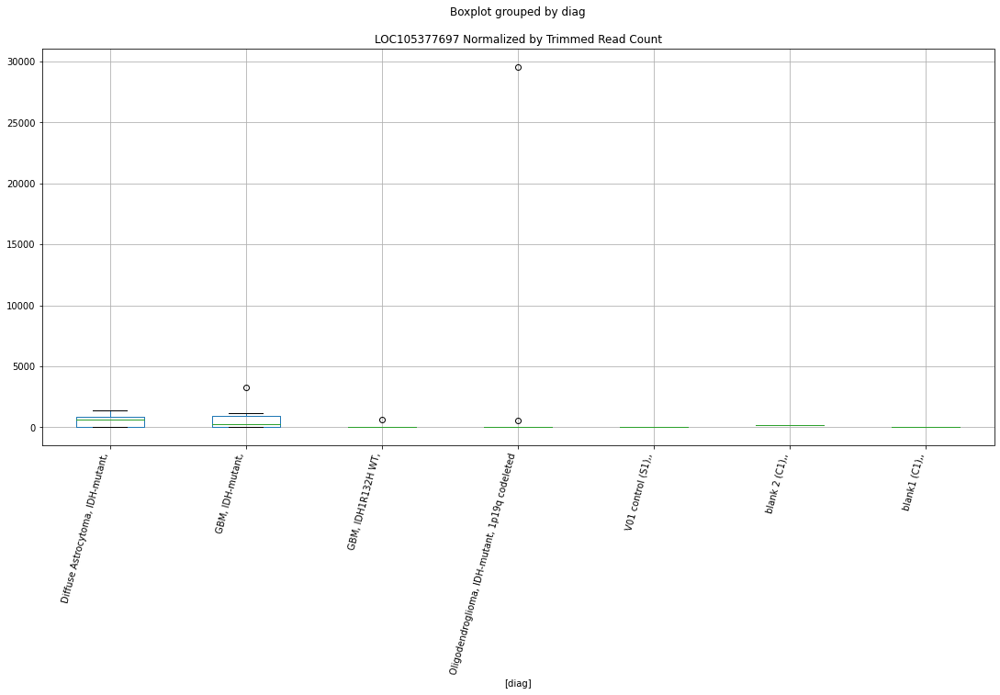

 p : 0.013191465616431015  ( t : 2.7493199839358664 ) :  D-plex  :  bbduk2  :  LOC105378897
Control and blanks
73     58748.64
337        0.00
Name: LOC105378897, dtype: float64
205    1074.55
Name: LOC105378897, dtype: float64
469    1183.05
Name: LOC105378897, dtype: float64


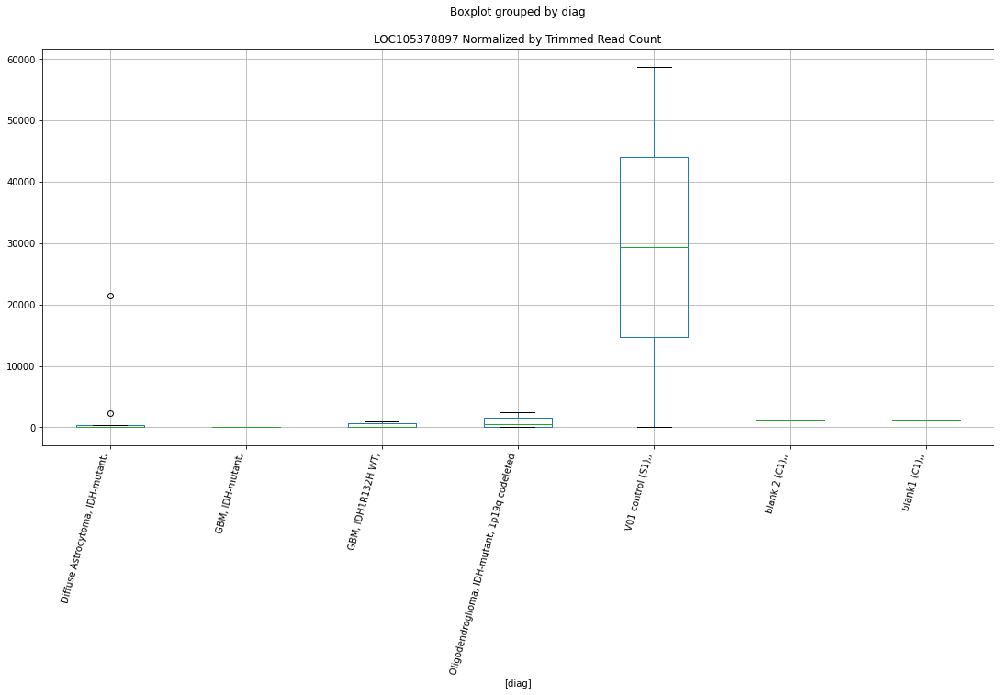

 p : 0.013231832701405525  ( t : 2.7478877316553745 ) :  D-plex  :  cutadapt2  :  LOC107985917
Control and blanks
76     757.61
340    880.73
Name: LOC107985917, dtype: float64
208    4056.29
Name: LOC107985917, dtype: float64
472    6357.51
Name: LOC107985917, dtype: float64


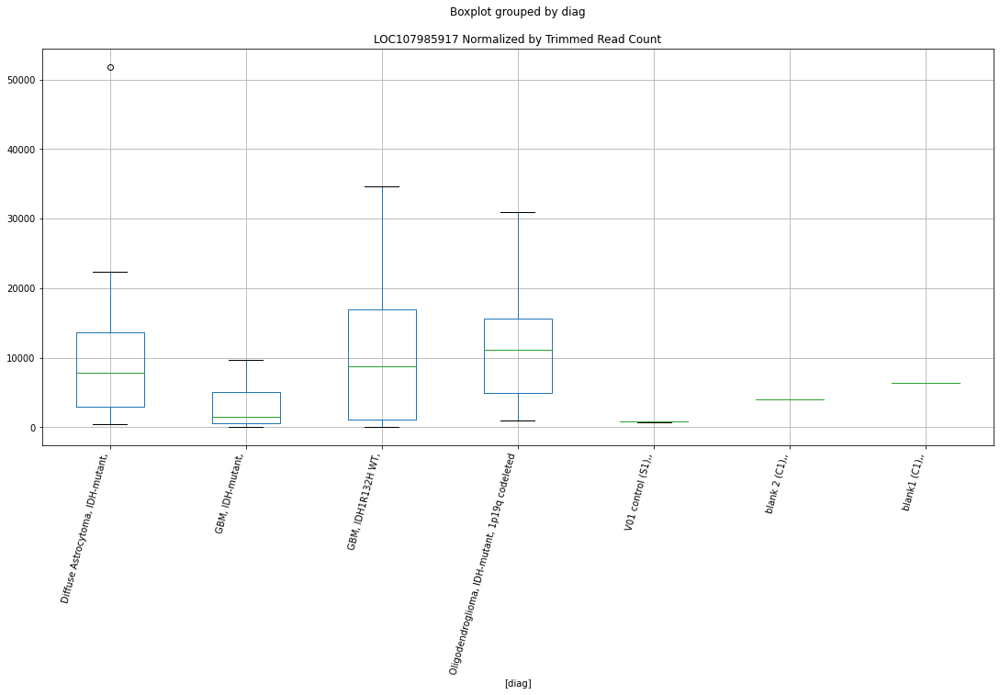

 p : 0.013260284545898149  ( t : 2.746880752918795 ) :  D-plex  :  cutadapt2  :  LOC105378897
Control and blanks
76     57578.68
340        0.00
Name: LOC105378897, dtype: float64
208    1058.16
Name: LOC105378897, dtype: float64
472    1155.91
Name: LOC105378897, dtype: float64


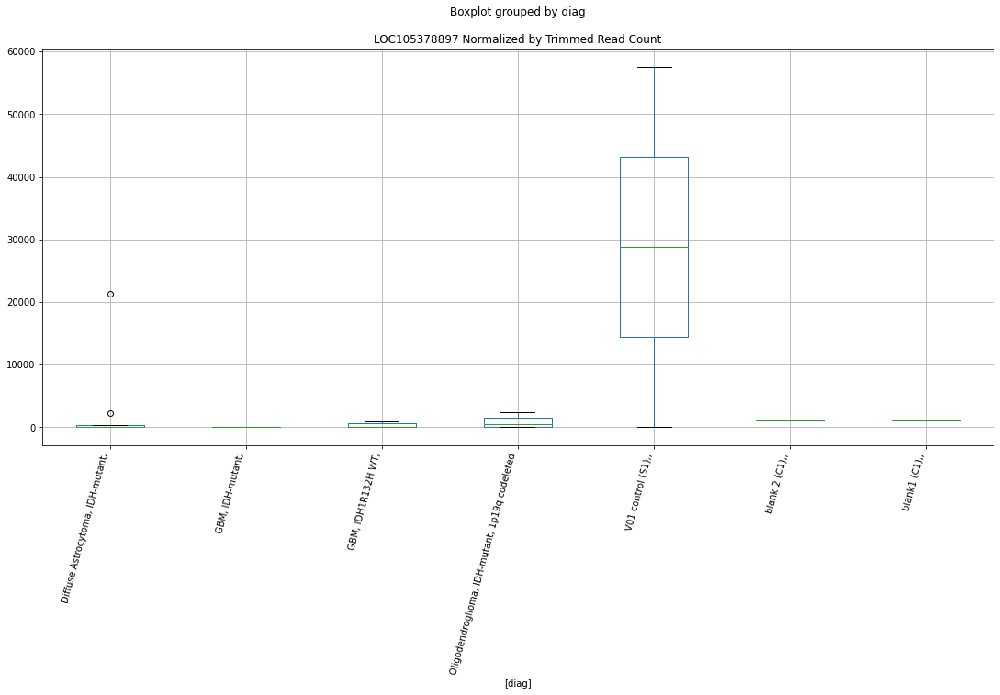

 p : 0.013263196934405365  ( t : 2.7467777933257826 ) :  Lexogen  :  bbduk2  :  LOC105373874
Control and blanks
79     0.0
343    0.0
Name: LOC105373874, dtype: float64
211    0.0
Name: LOC105373874, dtype: float64
475    0.0
Name: LOC105373874, dtype: float64


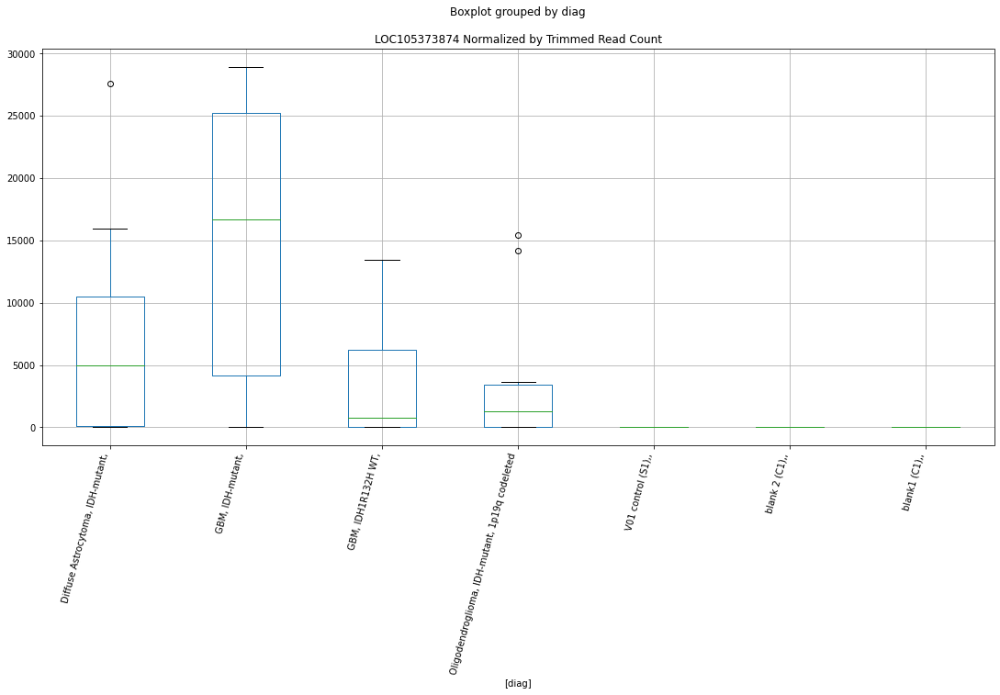

 p : 0.013268090026735062  ( t : 2.746604860068536 ) :  Lexogen  :  cutadapt2  :  LOC105373874
Control and blanks
82     0.0
346    0.0
Name: LOC105373874, dtype: float64
214    0.0
Name: LOC105373874, dtype: float64
478    0.0
Name: LOC105373874, dtype: float64


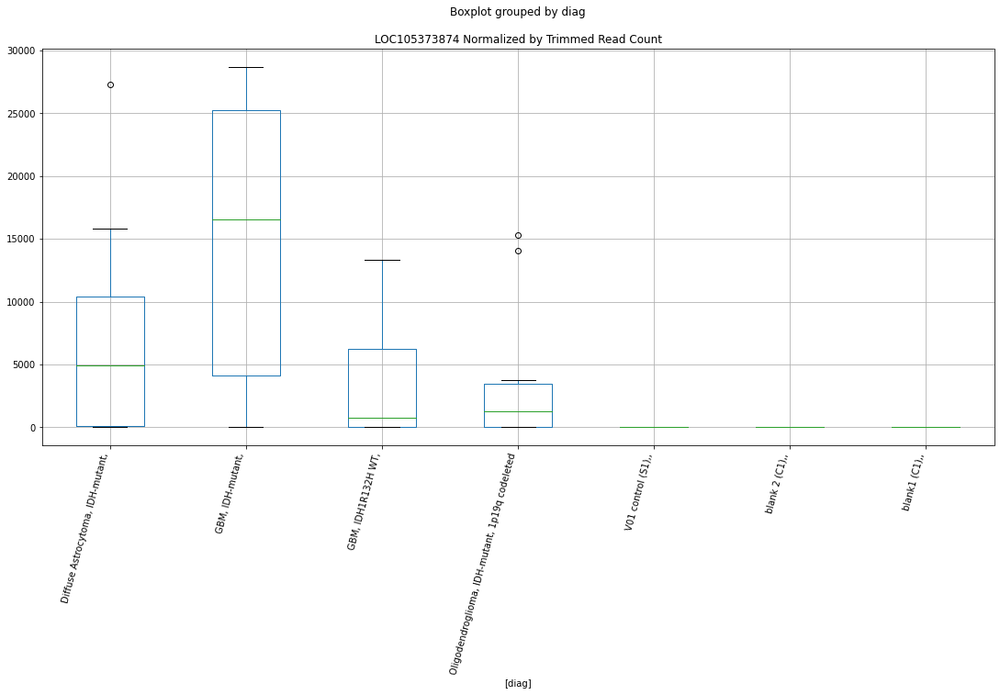

 p : 0.01332073193282055  ( t : 2.7447482266479932 ) :  D-plex  :  cutadapt2  :  LOC105379508
Control and blanks
76     60609.14
340     3522.93
Name: LOC105379508, dtype: float64
208    7054.41
Name: LOC105379508, dtype: float64
472    6357.51
Name: LOC105379508, dtype: float64


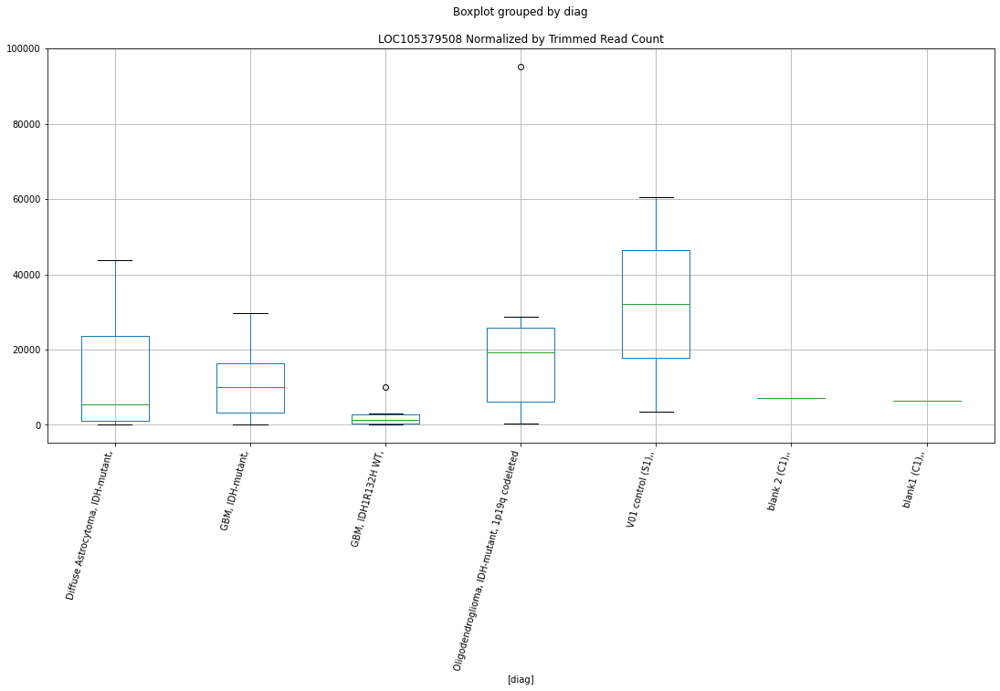

 p : 0.013658592763653023  ( t : 2.7329968156514624 ) :  D-plex  :  bbduk2  :  LOC105377697
Control and blanks
73     0.0
337    0.0
Name: LOC105377697, dtype: float64
205    179.09
Name: LOC105377697, dtype: float64
469    0.0
Name: LOC105377697, dtype: float64


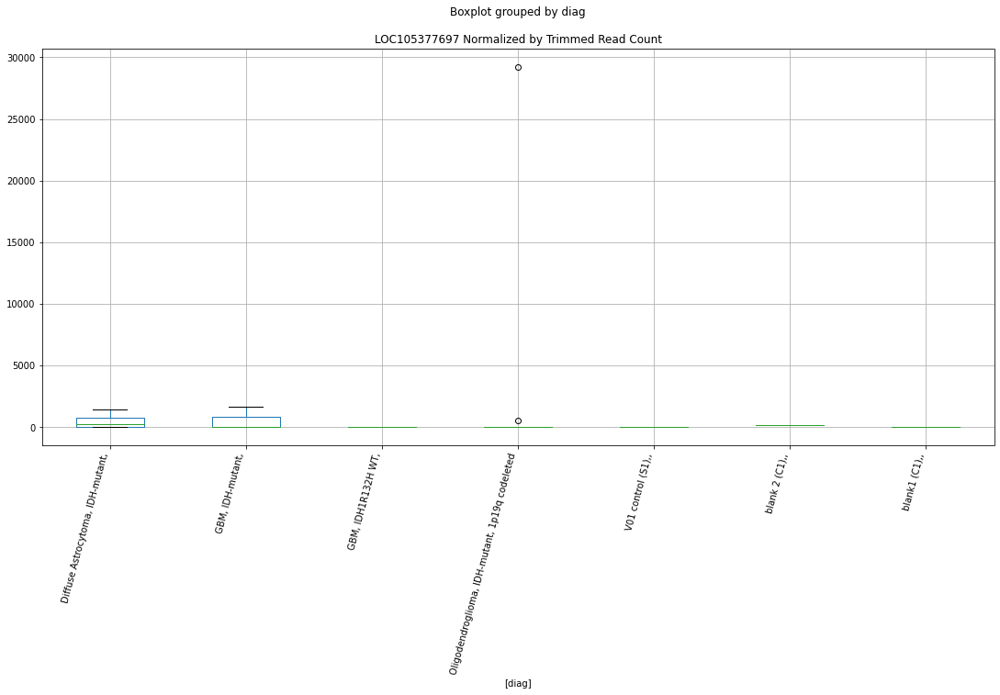

 p : 0.013759789883128093  ( t : 2.7295311227274874 ) :  D-plex  :  cutadapt2  :  LOC105373239
Control and blanks
76     0.0
340    0.0
Name: LOC105373239, dtype: float64
208    0.0
Name: LOC105373239, dtype: float64
472    0.0
Name: LOC105373239, dtype: float64


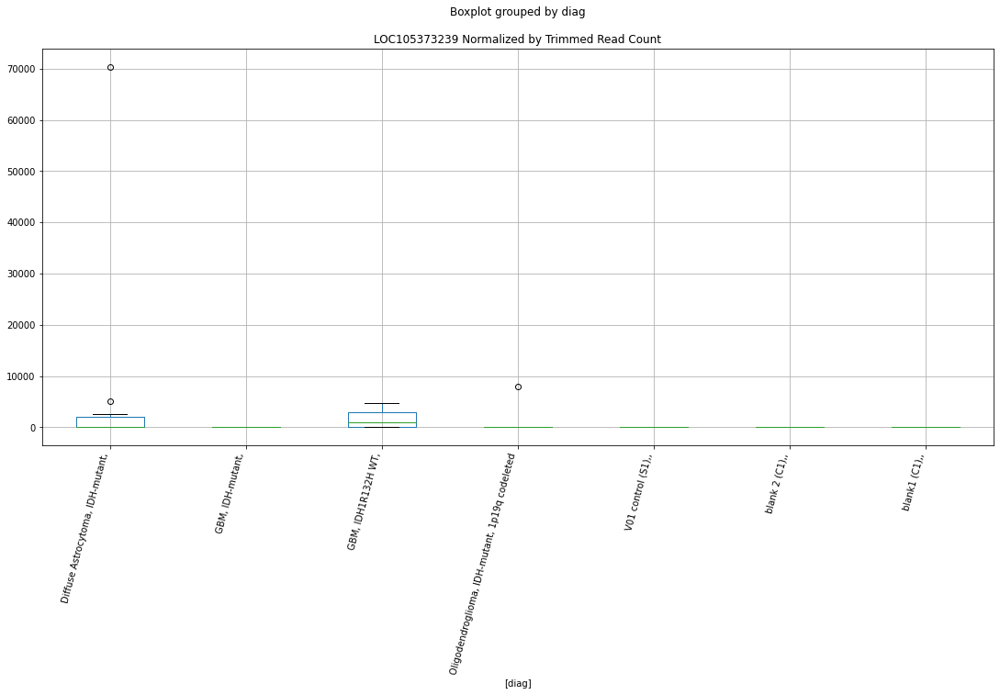

 p : 0.013863219353286478  ( t : 2.726014089813059 ) :  D-plex  :  bbduk2  :  LOC105376731
Control and blanks
73     0.0
337    0.0
Name: LOC105376731, dtype: float64
205    358.18
Name: LOC105376731, dtype: float64
469    1183.05
Name: LOC105376731, dtype: float64


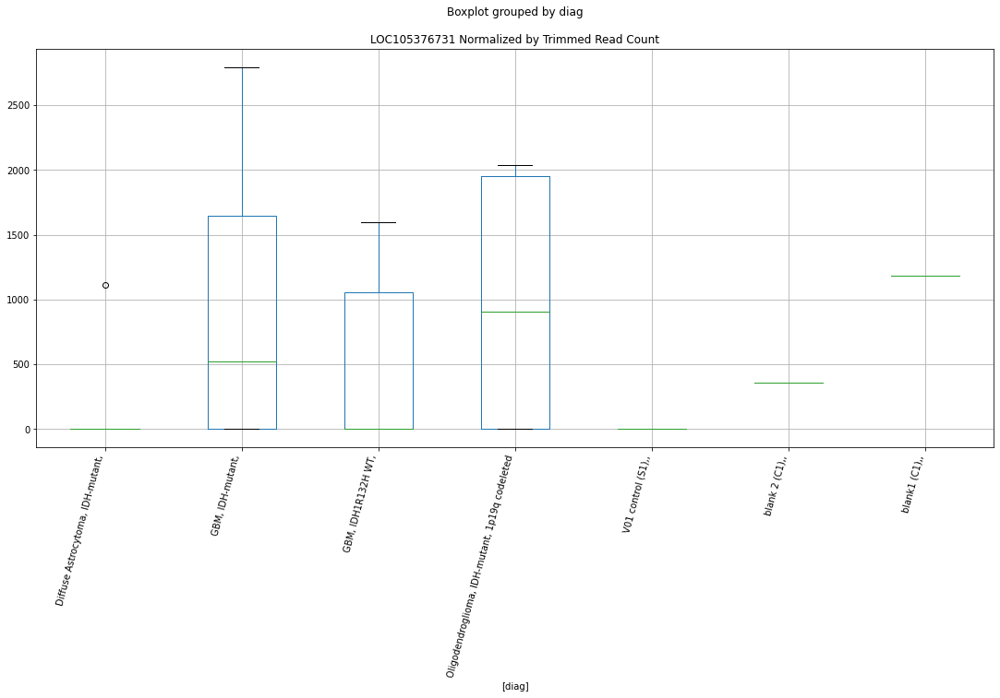

 p : 0.01404645435701218  ( t : 2.7198445140179768 ) :  D-plex  :  bbduk2  :  LOC105379574
Control and blanks
73     0.0
337    0.0
Name: LOC105379574, dtype: float64
205    358.18
Name: LOC105379574, dtype: float64
469    1183.05
Name: LOC105379574, dtype: float64


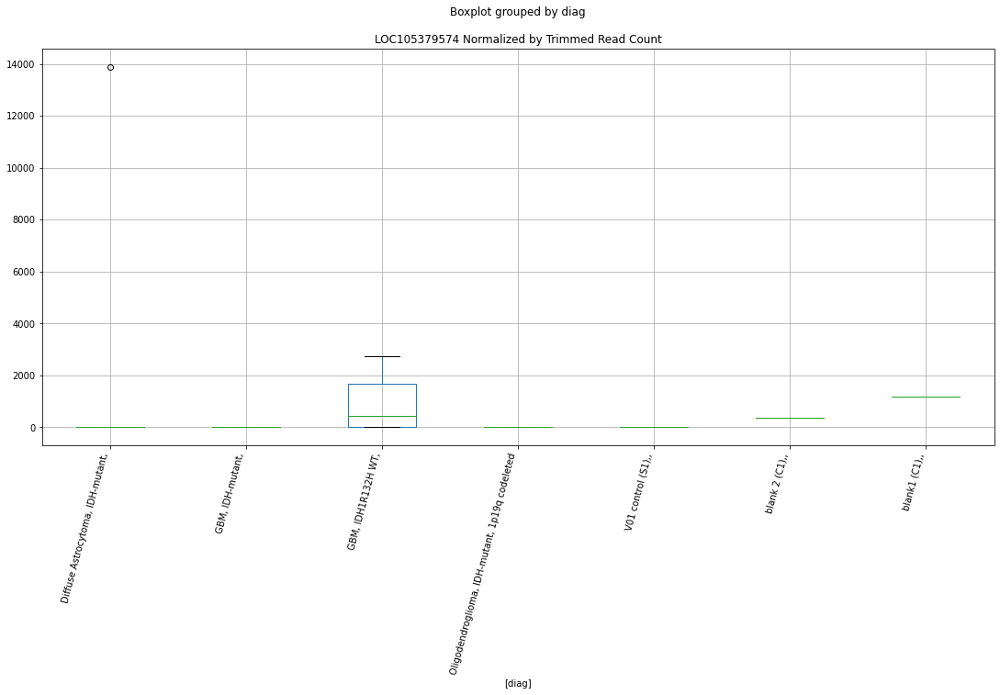

 p : 0.01405785248110078  ( t : 2.719463283327671 ) :  D-plex  :  cutadapt2  :  LOC105379574
Control and blanks
76     0.0
340    0.0
Name: LOC105379574, dtype: float64
208    352.72
Name: LOC105379574, dtype: float64
472    0.0
Name: LOC105379574, dtype: float64


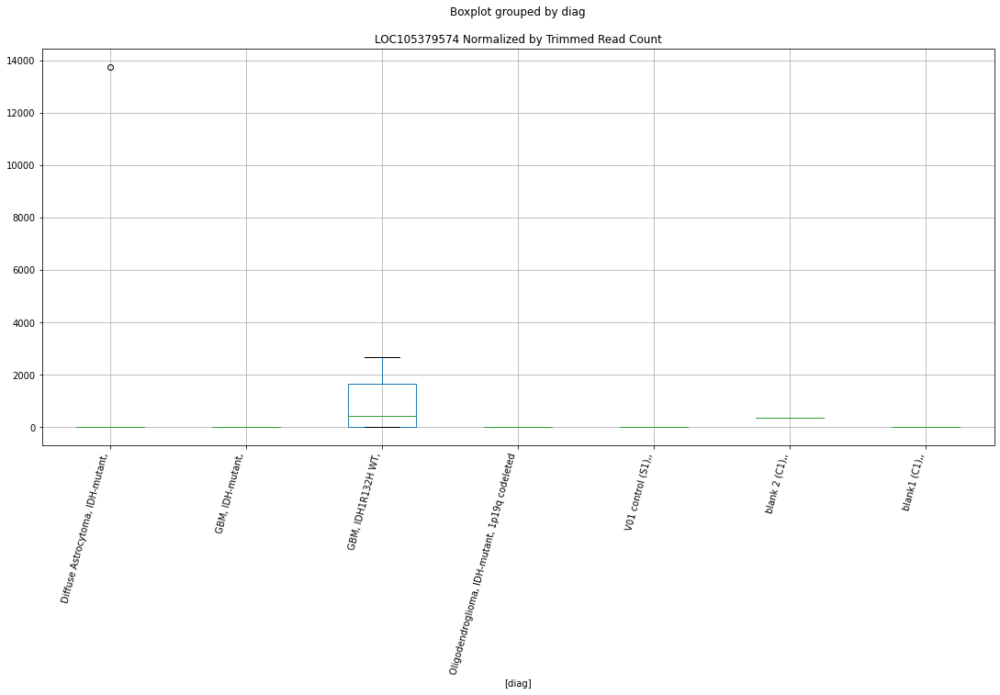

 p : 0.014304598818959877  ( t : 2.7112820508696824 ) :  D-plex  :  cutadapt2  :  LOC105378811
Control and blanks
76     0.0
340    0.0
Name: LOC105378811, dtype: float64
208    352.72
Name: LOC105378811, dtype: float64
472    0.0
Name: LOC105378811, dtype: float64


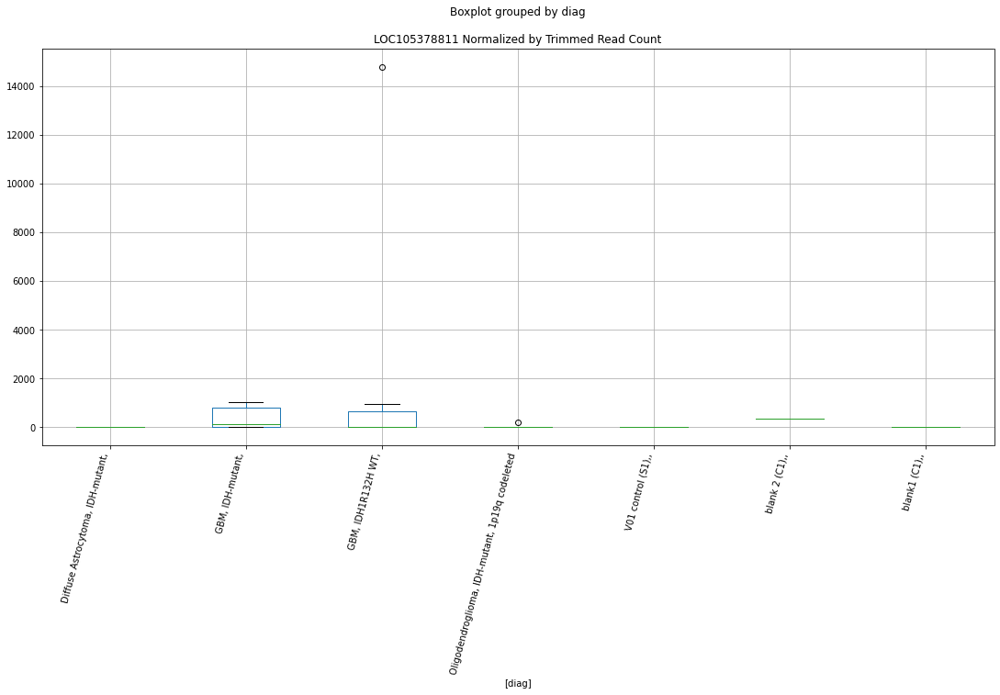

 p : 0.014692701206113145  ( t : 2.6986829302190425 ) :  Lexogen  :  cutadapt2  :  LOC107985115
Control and blanks
82     0.0
346    0.0
Name: LOC107985115, dtype: float64
214    0.0
Name: LOC107985115, dtype: float64
478    0.0
Name: LOC107985115, dtype: float64


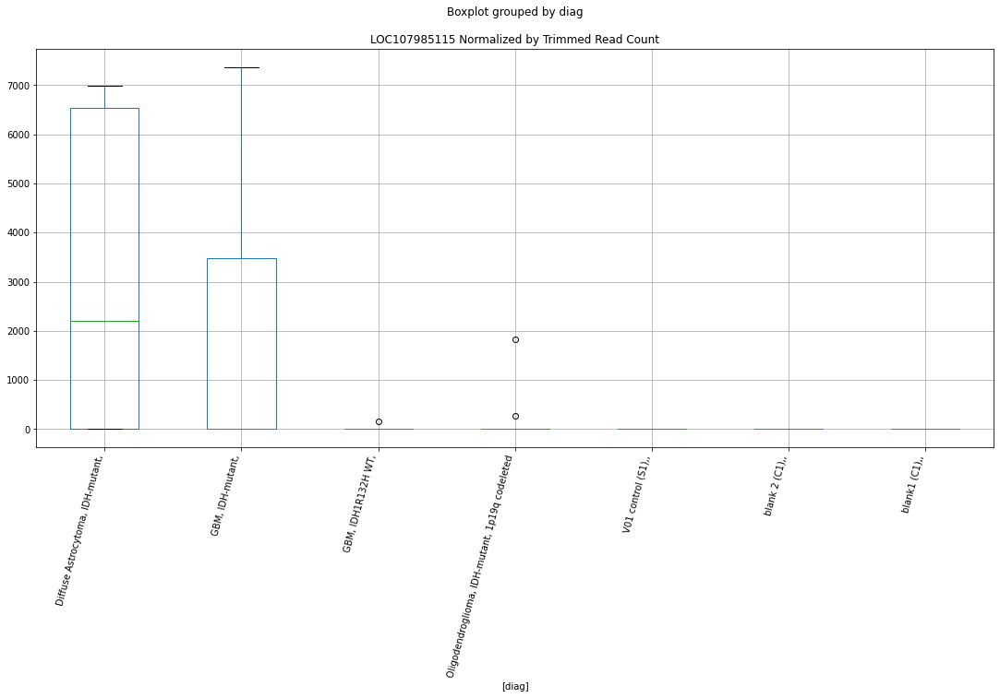

 p : 0.015148954446482999  ( t : 2.6842716532654216 ) :  D-plex  :  cutadapt2  :  LOC107985193
Control and blanks
76     2272.84
340       0.00
Name: LOC107985193, dtype: float64
208    3174.48
Name: LOC107985193, dtype: float64
472    2311.82
Name: LOC107985193, dtype: float64


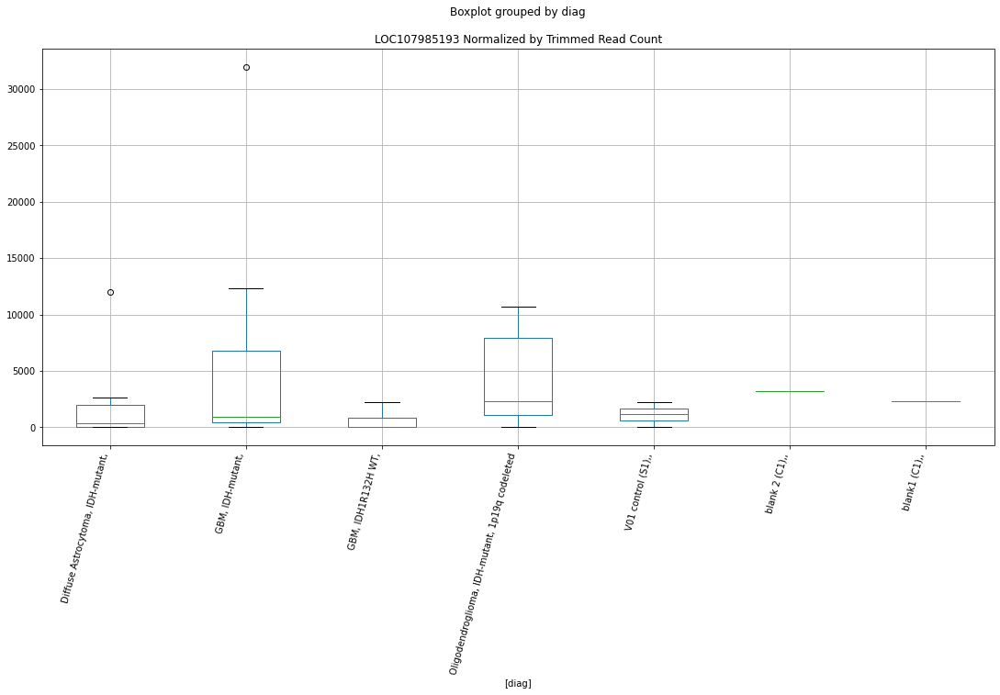

 p : 0.015329819902463978  ( t : 2.6786731851803687 ) :  Lexogen  :  cutadapt2  :  LOC107984770
Control and blanks
82         0.00
346    12836.51
Name: LOC107984770, dtype: float64
214    2169.81
Name: LOC107984770, dtype: float64
478    0.0
Name: LOC107984770, dtype: float64


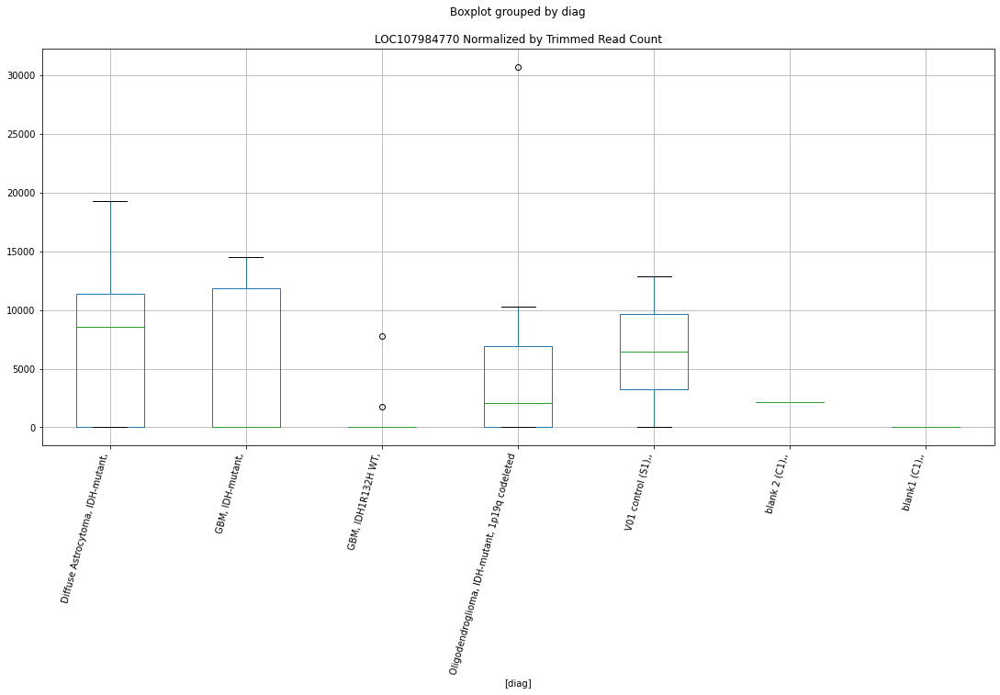

 p : 0.01534153844344434  ( t : 2.678312629155199 ) :  Lexogen  :  bbduk2  :  LOC107984770
Control and blanks
79         0.00
343    12738.86
Name: LOC107984770, dtype: float64
211    2186.45
Name: LOC107984770, dtype: float64
475    0.0
Name: LOC107984770, dtype: float64


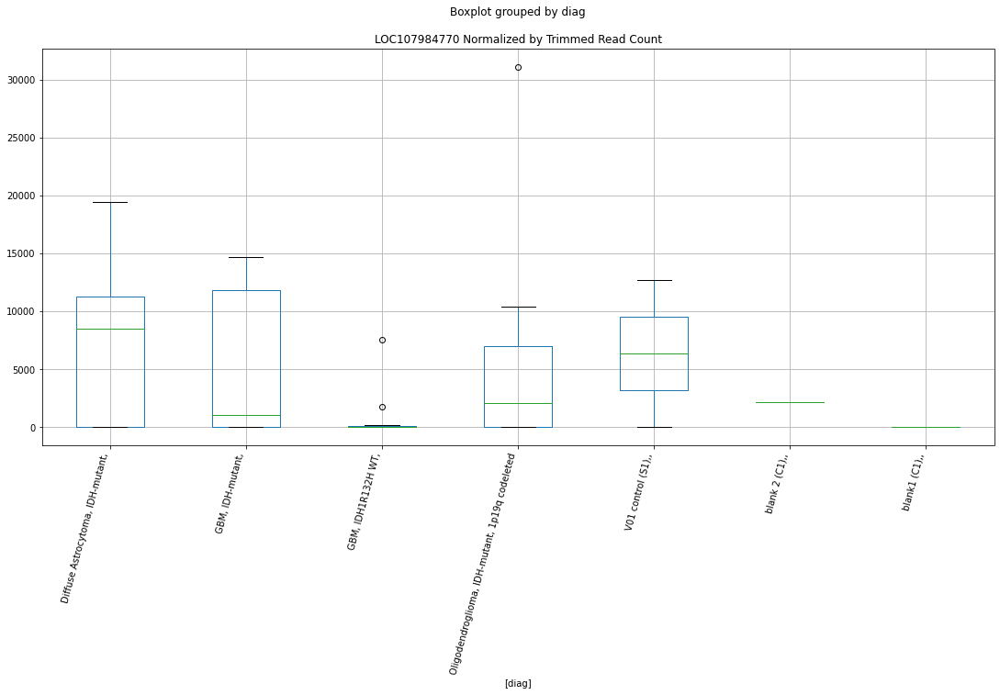

 p : 0.015381760737835901  ( t : 2.6770770648700926 ) :  D-plex  :  bbduk2  :  LOC105372104
Control and blanks
73     0.0
337    0.0
Name: LOC105372104, dtype: float64
205    0.0
Name: LOC105372104, dtype: float64
469    0.0
Name: LOC105372104, dtype: float64


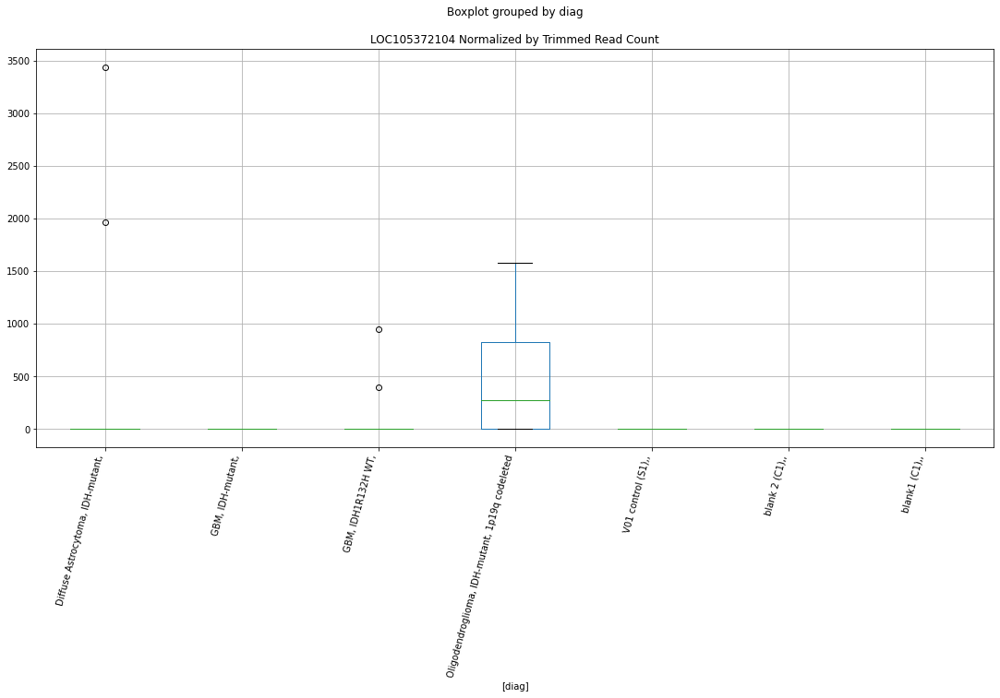

 p : 0.01554188667293189  ( t : 2.67218861263745 ) :  Lexogen  :  bbduk2  :  LOC107985115
Control and blanks
79     0.0
343    0.0
Name: LOC107985115, dtype: float64
211    0.0
Name: LOC107985115, dtype: float64
475    0.0
Name: LOC107985115, dtype: float64


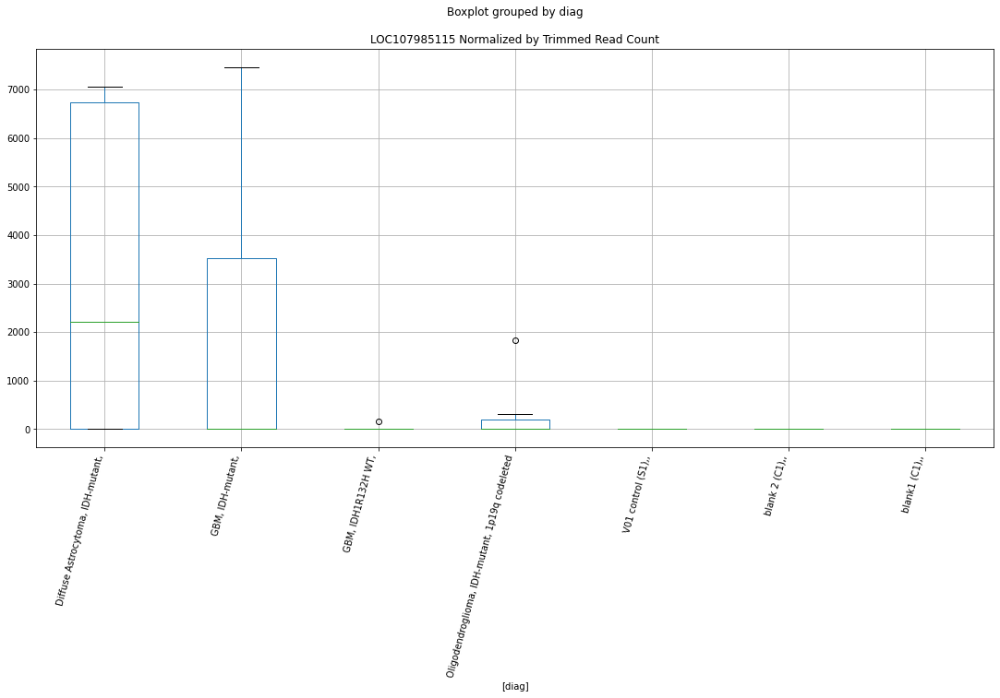

 p : 0.015656276859859847  ( t : 2.668725738096075 ) :  D-plex  :  cutadapt2  :  LOC105378841
Control and blanks
76     0.0
340    0.0
Name: LOC105378841, dtype: float64
208    1058.16
Name: LOC105378841, dtype: float64
472    1155.91
Name: LOC105378841, dtype: float64


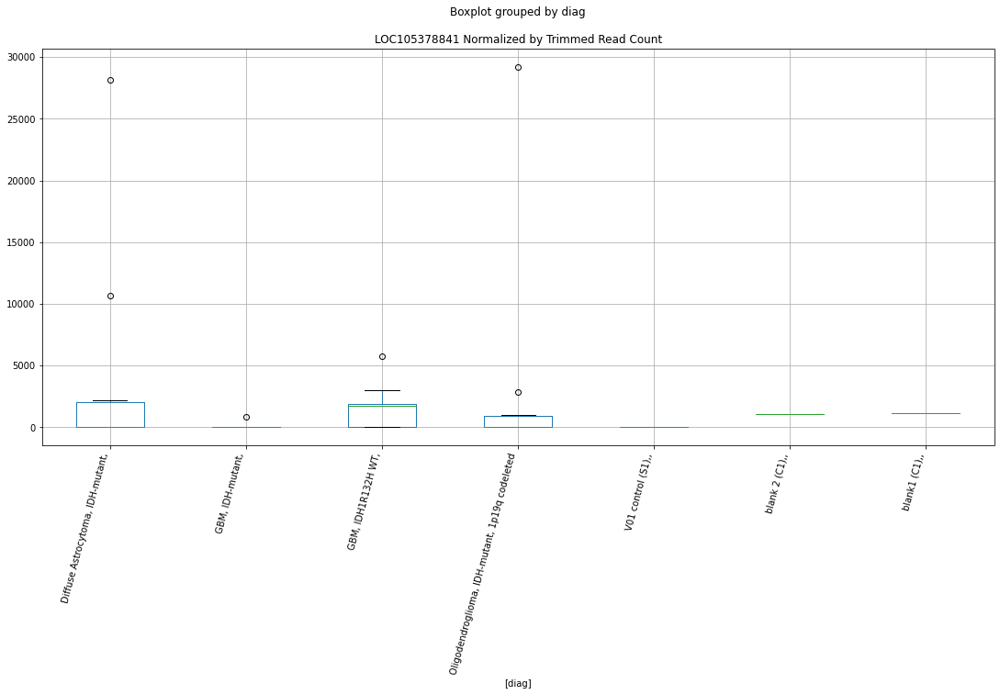

 p : 0.016125859300447326  ( t : 2.6547584731930574 ) :  Lexogen  :  bbduk2  :  LOC105374809
Control and blanks
79     0.0
343    0.0
Name: LOC105374809, dtype: float64
211    546.61
Name: LOC105374809, dtype: float64
475    0.0
Name: LOC105374809, dtype: float64


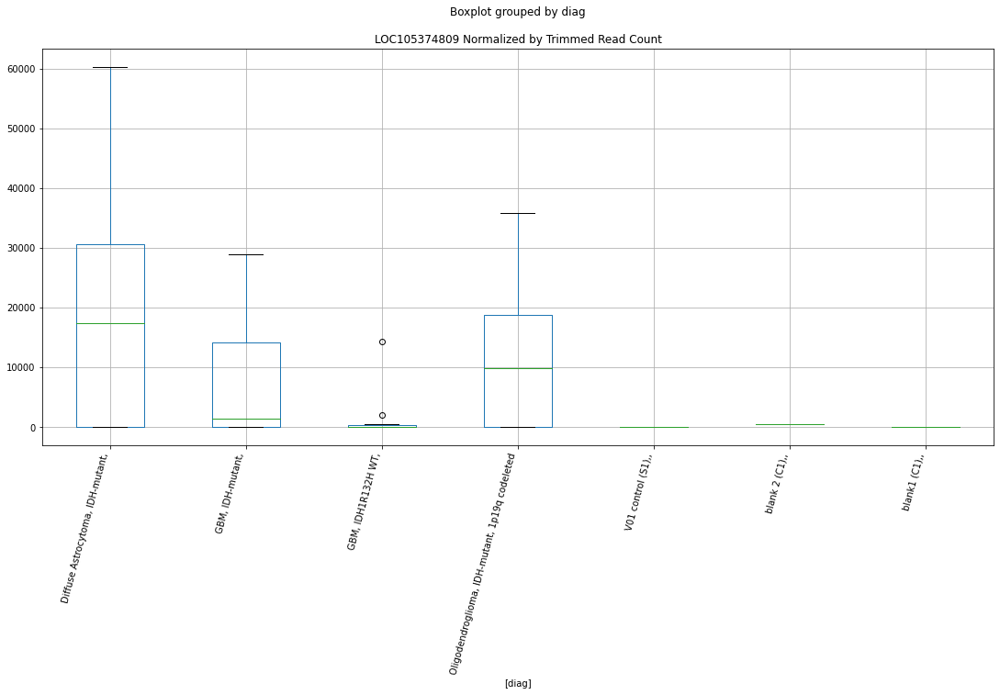

 p : 0.016182603521362828  ( t : 2.6530969879499717 ) :  Lexogen  :  bbduk2  :  LOC107985565
Control and blanks
79     0.0
343    0.0
Name: LOC107985565, dtype: float64
211    0.0
Name: LOC107985565, dtype: float64
475    0.0
Name: LOC107985565, dtype: float64


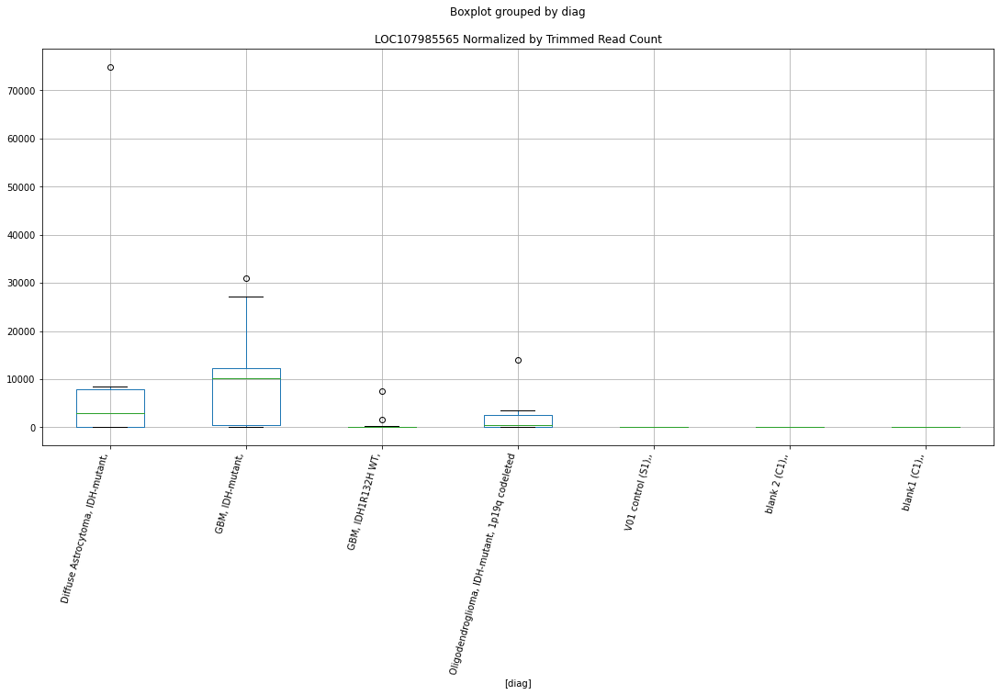

 p : 0.016339804092291434  ( t : 2.6485229252573825 ) :  D-plex  :  bbduk2  :  LOC105373591
Control and blanks
73     0.0
337    0.0
Name: LOC105373591, dtype: float64
205    1074.55
Name: LOC105373591, dtype: float64
469    5915.27
Name: LOC105373591, dtype: float64


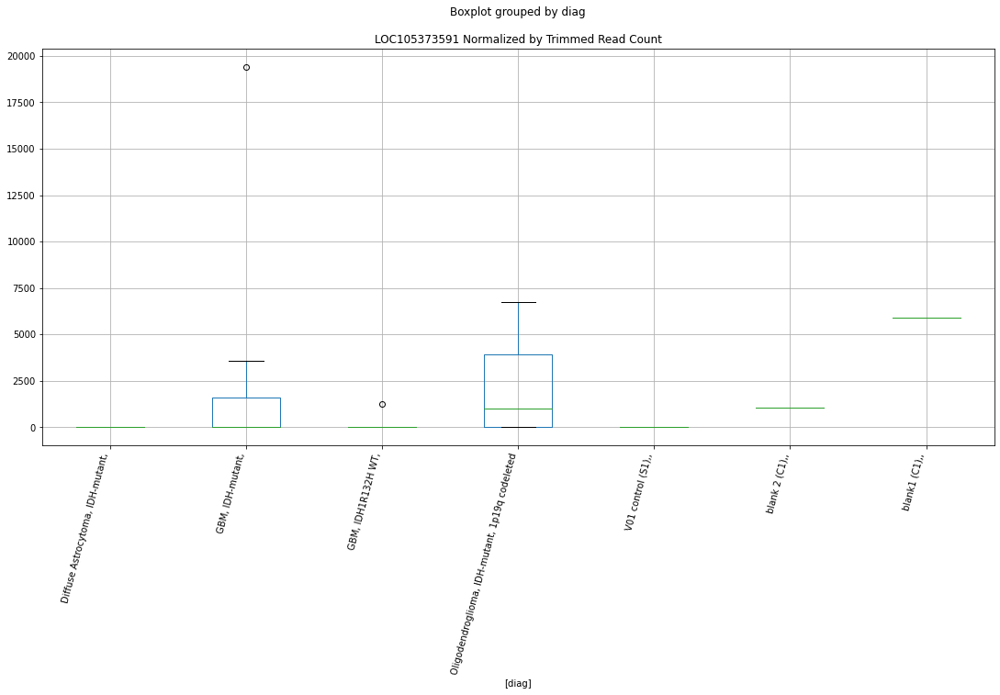

 p : 0.01636305769479456  ( t : 2.647849875572048 ) :  Lexogen  :  cutadapt2  :  LOC105375311
Control and blanks
82     0.0
346    0.0
Name: LOC105375311, dtype: float64
214    0.0
Name: LOC105375311, dtype: float64
478    237.46
Name: LOC105375311, dtype: float64


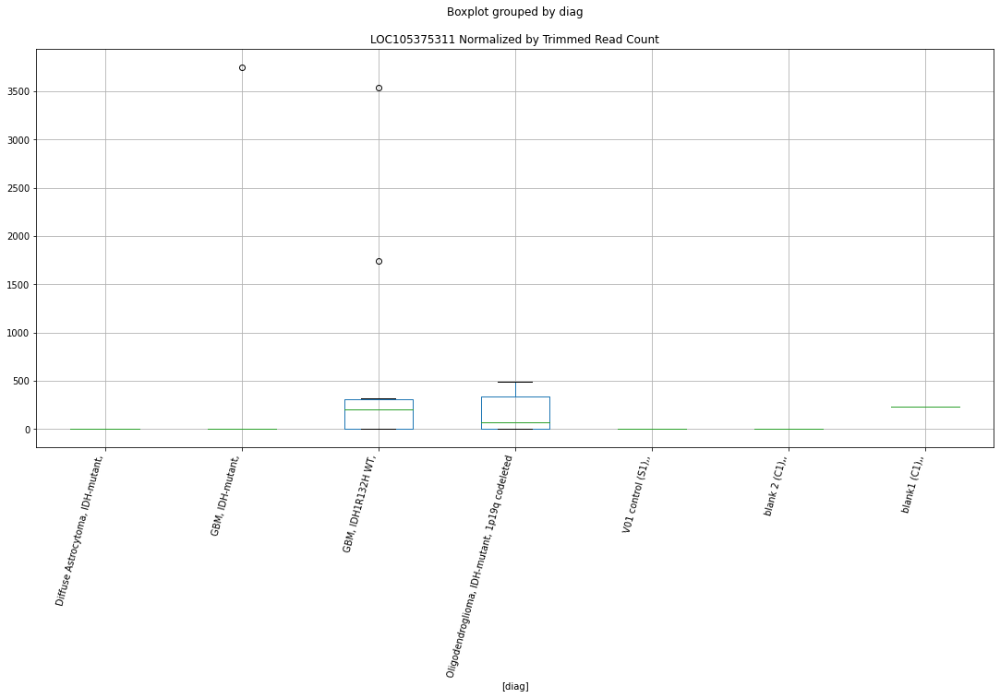

 p : 0.017148413237146148  ( t : 2.625637091083424 ) :  D-plex  :  cutadapt2  :  LOC105371961
Control and blanks
76         0.00
340    91596.14
Name: LOC105371961, dtype: float64
208    16048.78
Name: LOC105371961, dtype: float64
472    30053.7
Name: LOC105371961, dtype: float64


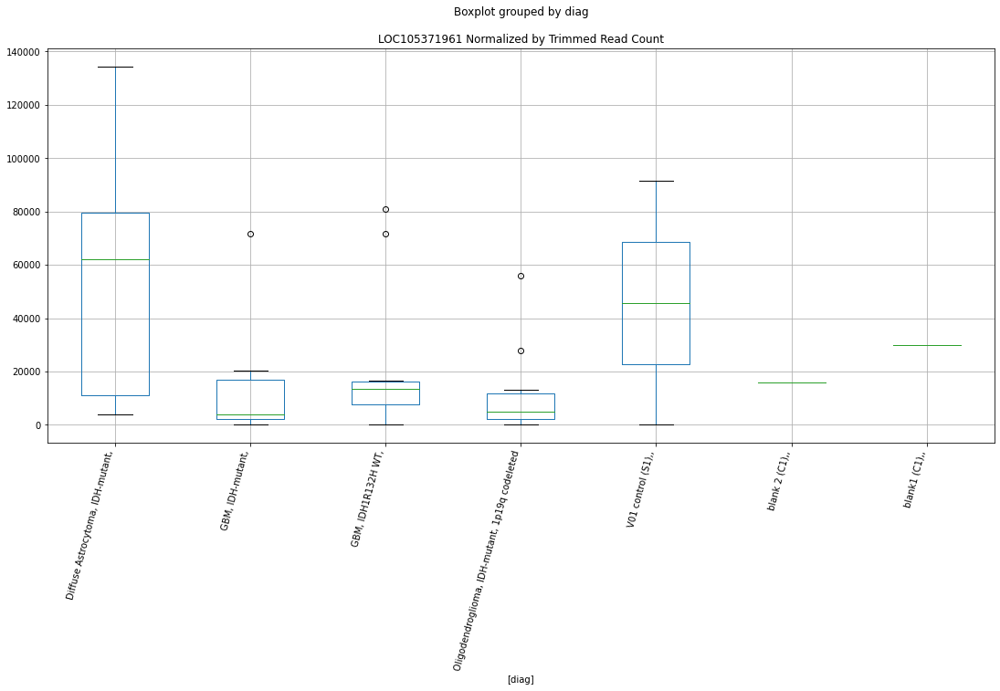

 p : 0.017148436590419355  ( t : 2.6256364450693863 ) :  D-plex  :  bbduk2  :  LOC105371961
Control and blanks
73         0.00
337    92576.36
Name: LOC105371961, dtype: float64
205    16297.28
Name: LOC105371961, dtype: float64
469    28393.31
Name: LOC105371961, dtype: float64


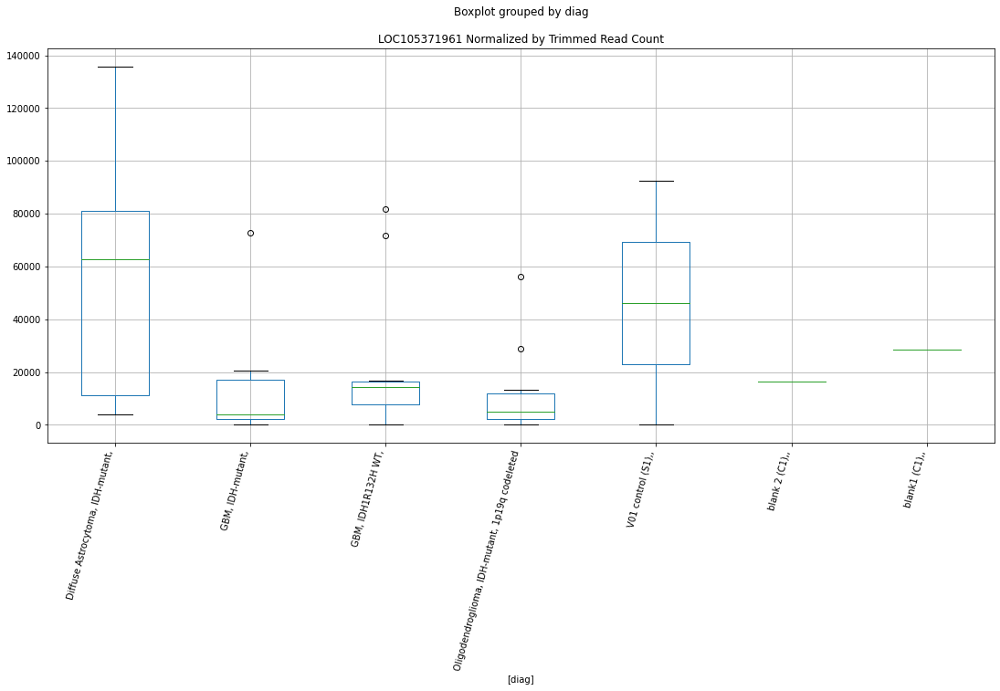

 p : 0.017347038812495684  ( t : 2.620172592911515 ) :  Lexogen  :  cutadapt2  :  LOC105372524
Control and blanks
82       0.00
346    210.43
Name: LOC105372524, dtype: float64
214    3525.94
Name: LOC105372524, dtype: float64
478    0.0
Name: LOC105372524, dtype: float64


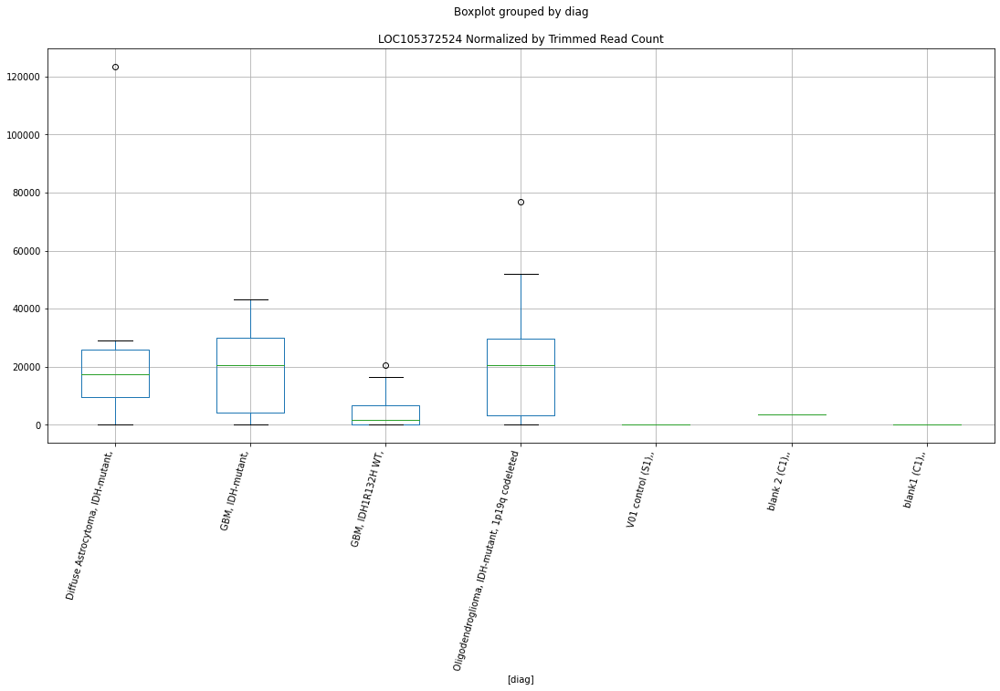

 p : 0.01741821659753042  ( t : 2.618228844431583 ) :  Lexogen  :  cutadapt2  :  LOC105374809
Control and blanks
82     0.0
346    0.0
Name: LOC105374809, dtype: float64
214    542.45
Name: LOC105374809, dtype: float64
478    0.0
Name: LOC105374809, dtype: float64


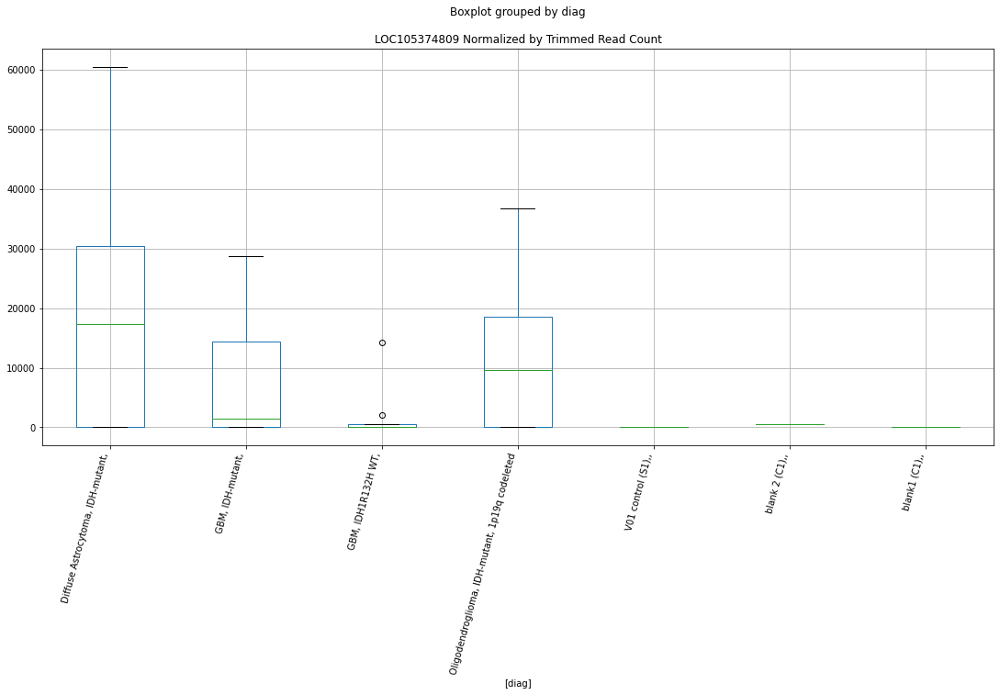

 p : 0.017674991968745175  ( t : 2.6112788963840545 ) :  Lexogen  :  bbduk2  :  LOC105372524
Control and blanks
79       0.00
343    212.31
Name: LOC105372524, dtype: float64
211    3552.98
Name: LOC105372524, dtype: float64
475    0.0
Name: LOC105372524, dtype: float64


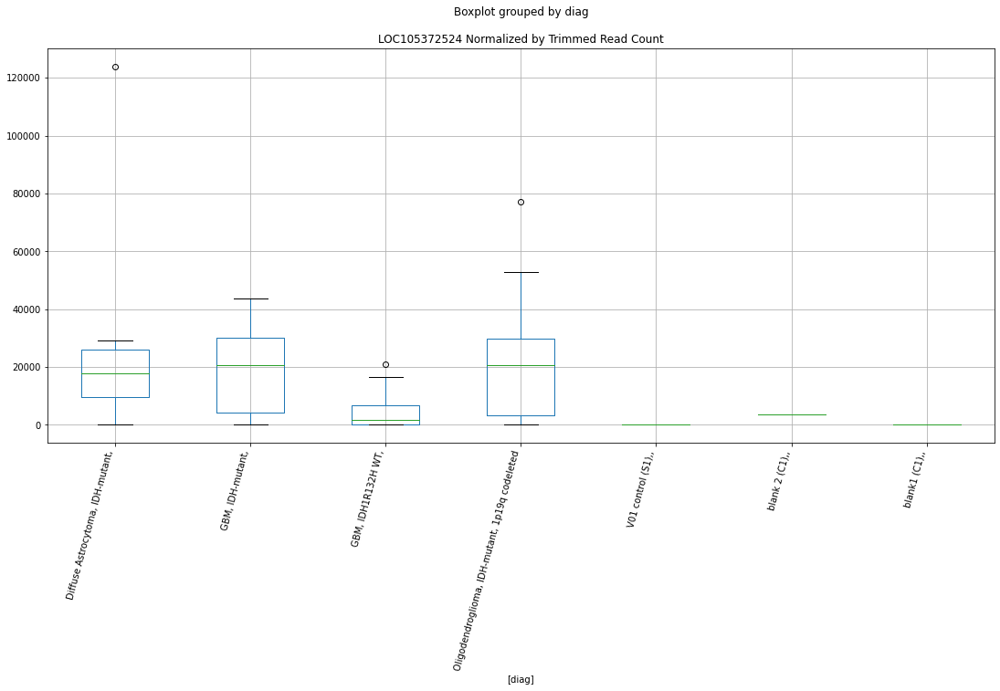

 p : 0.017722209127554386  ( t : 2.6100113521594404 ) :  Lexogen  :  bbduk2  :  LOC107985561
Control and blanks
79     0.0
343    0.0
Name: LOC107985561, dtype: float64
211    0.0
Name: LOC107985561, dtype: float64
475    239.52
Name: LOC107985561, dtype: float64


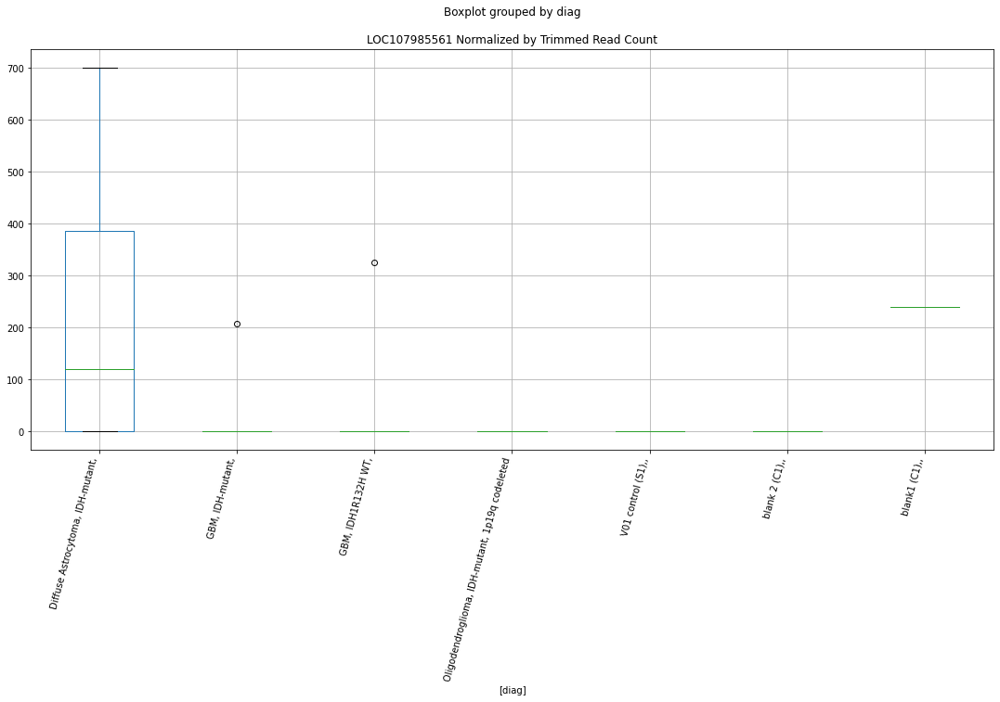

 p : 0.01833673639083303  ( t : 2.593800472418003 ) :  D-plex  :  cutadapt2  :  LOC105373946
Control and blanks
76     757.61
340      0.00
Name: LOC105373946, dtype: float64
208    2469.04
Name: LOC105373946, dtype: float64
472    3467.74
Name: LOC105373946, dtype: float64


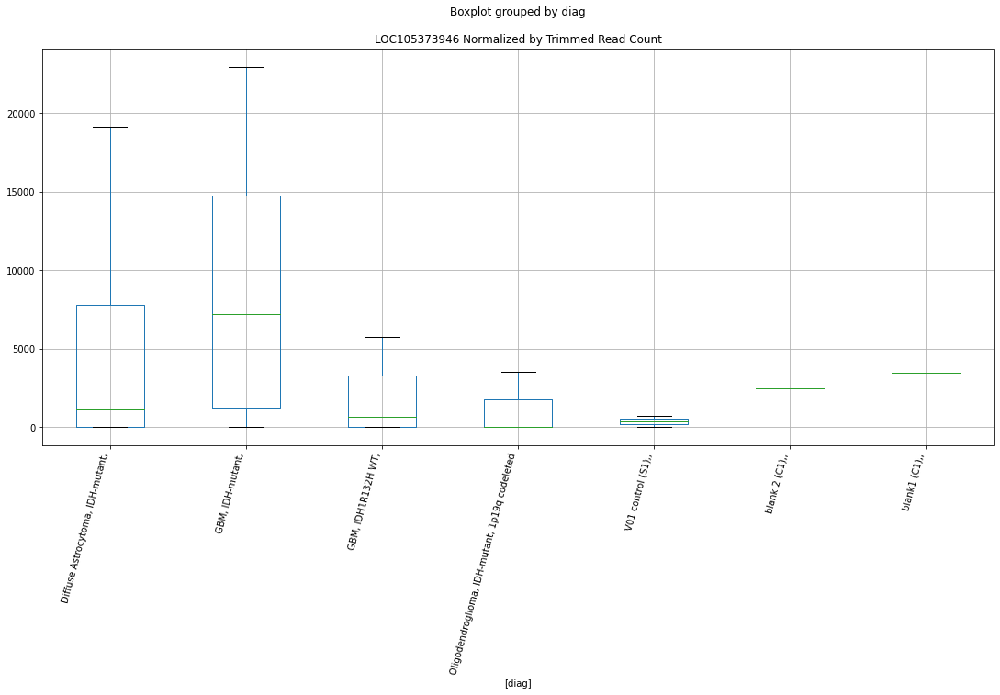

 p : 0.018413194760858516  ( t : 2.591819721983403 ) :  D-plex  :  bbduk2  :  LOC105373946
Control and blanks
73     773.01
337      0.00
Name: LOC105373946, dtype: float64
205    2507.27
Name: LOC105373946, dtype: float64
469    3549.16
Name: LOC105373946, dtype: float64


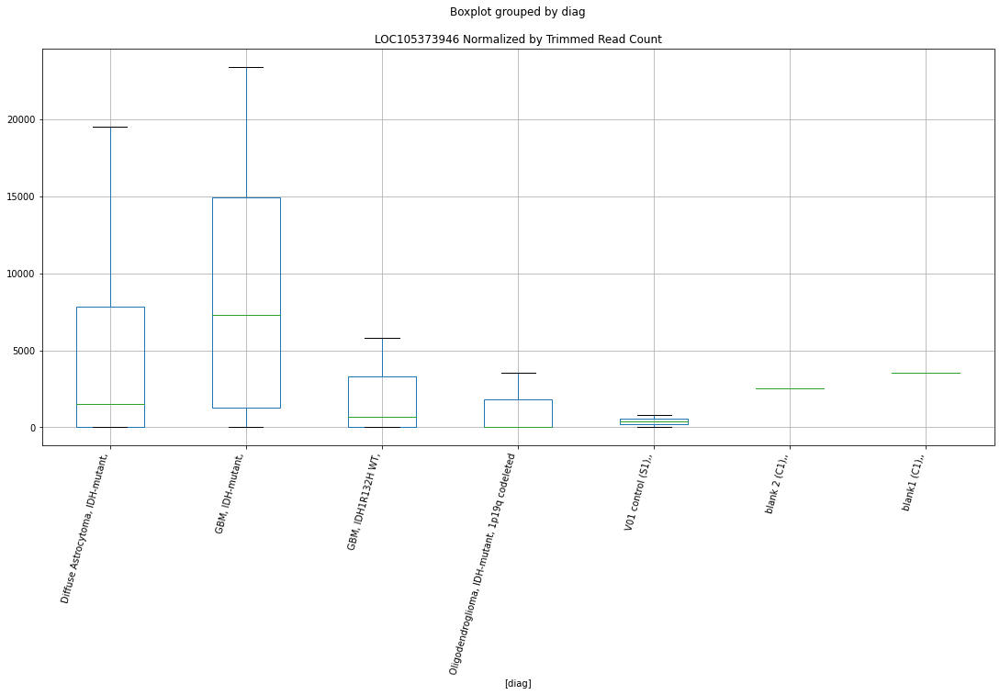

 p : 0.018415731377293083  ( t : 2.5917541415288157 ) :  D-plex  :  bbduk2  :  LOC105379087
Control and blanks
73     0.0
337    0.0
Name: LOC105379087, dtype: float64
205    3581.82
Name: LOC105379087, dtype: float64
469    2957.64
Name: LOC105379087, dtype: float64


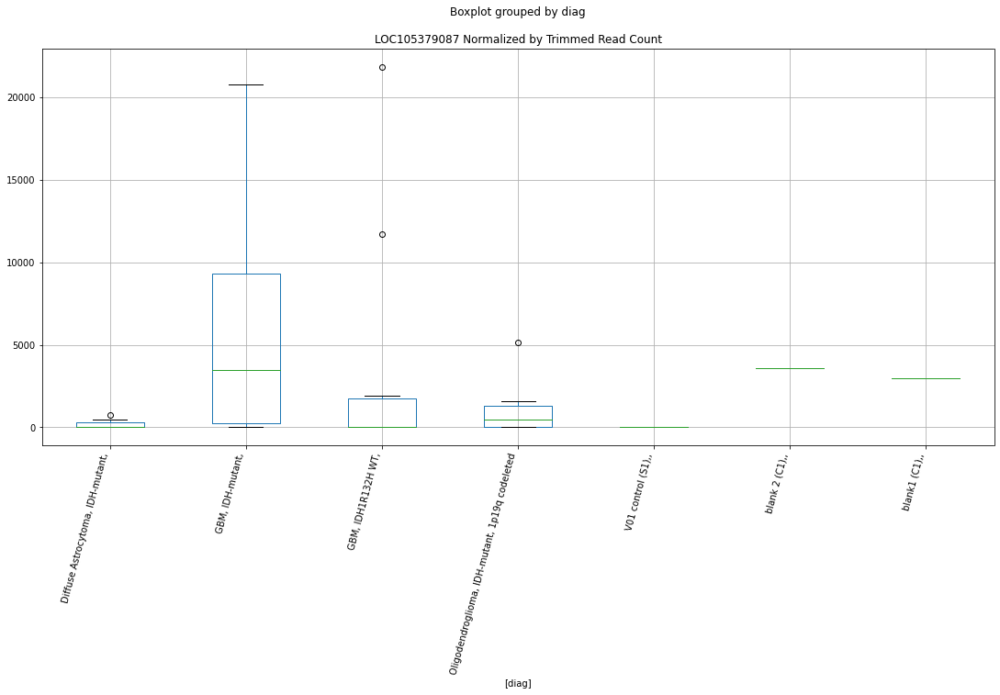

 p : 0.018441277086369376  ( t : 2.59109417231301 ) :  Lexogen  :  cutadapt2  :  LOC107985565
Control and blanks
82     0.0
346    0.0
Name: LOC107985565, dtype: float64
214    0.0
Name: LOC107985565, dtype: float64
478    0.0
Name: LOC107985565, dtype: float64


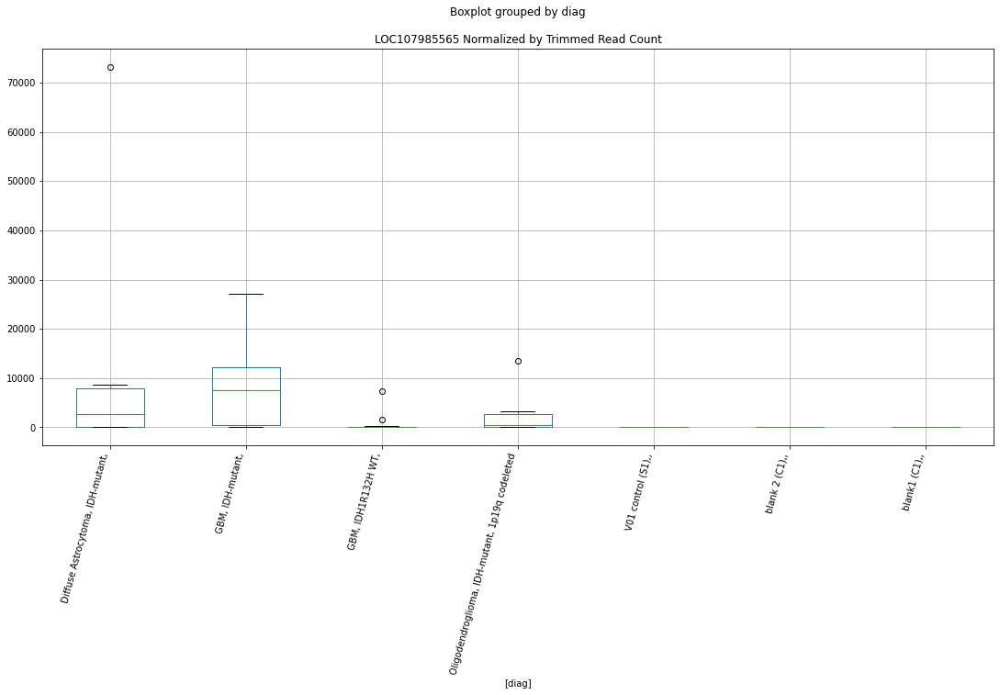

 p : 0.01851454622238973  ( t : 2.5892060747339927 ) :  D-plex  :  bbduk2  :  LOC105372585
Control and blanks
73     0.0
337    0.0
Name: LOC105372585, dtype: float64
205    0.0
Name: LOC105372585, dtype: float64
469    591.53
Name: LOC105372585, dtype: float64


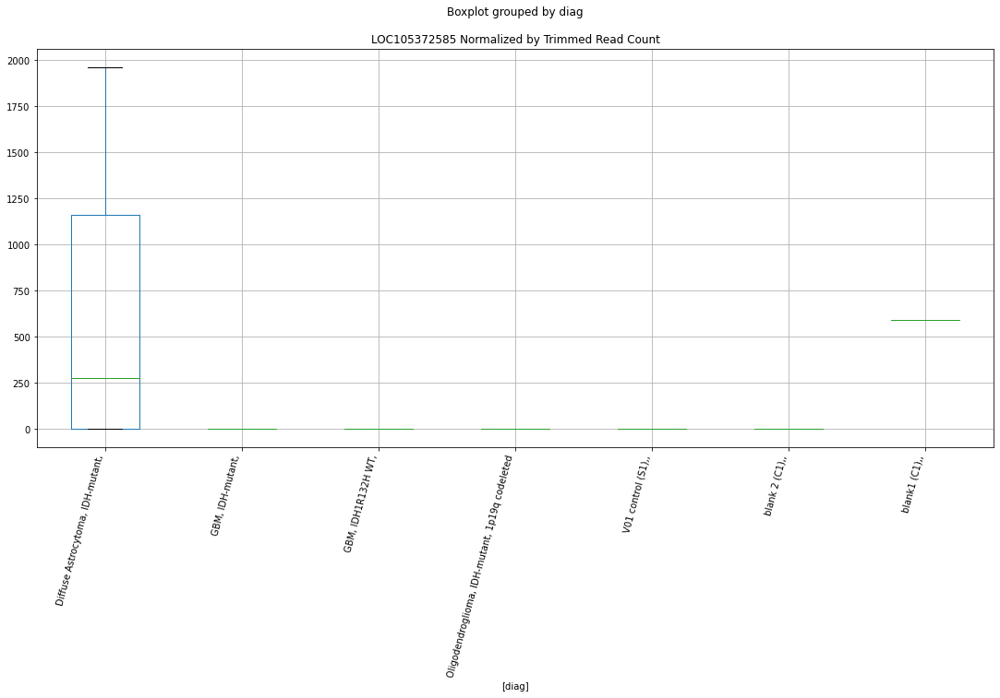

 p : 0.018718473911141637  ( t : 2.5839880560440753 ) :  D-plex  :  cutadapt2  :  LOC105373487
Control and blanks
76     0.0
340    0.0
Name: LOC105373487, dtype: float64
208    0.0
Name: LOC105373487, dtype: float64
472    0.0
Name: LOC105373487, dtype: float64


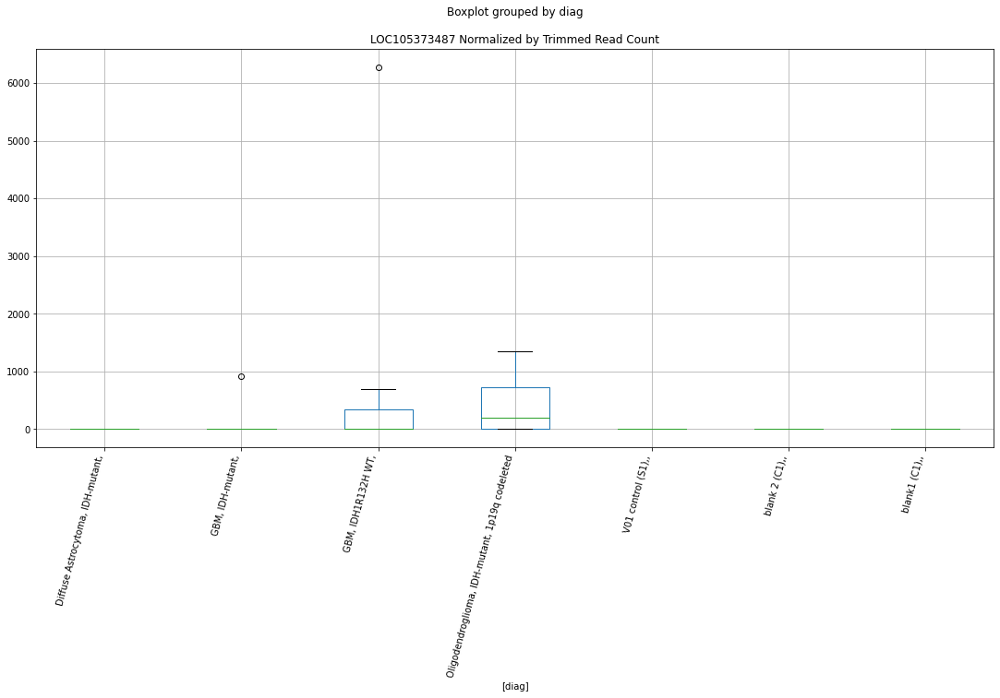

 p : 0.018847280103033444  ( t : 2.580719915466884 ) :  D-plex  :  cutadapt2  :  LOC105375588
Control and blanks
76     1515.23
340       0.00
Name: LOC105375588, dtype: float64
208    1410.88
Name: LOC105375588, dtype: float64
472    0.0
Name: LOC105375588, dtype: float64


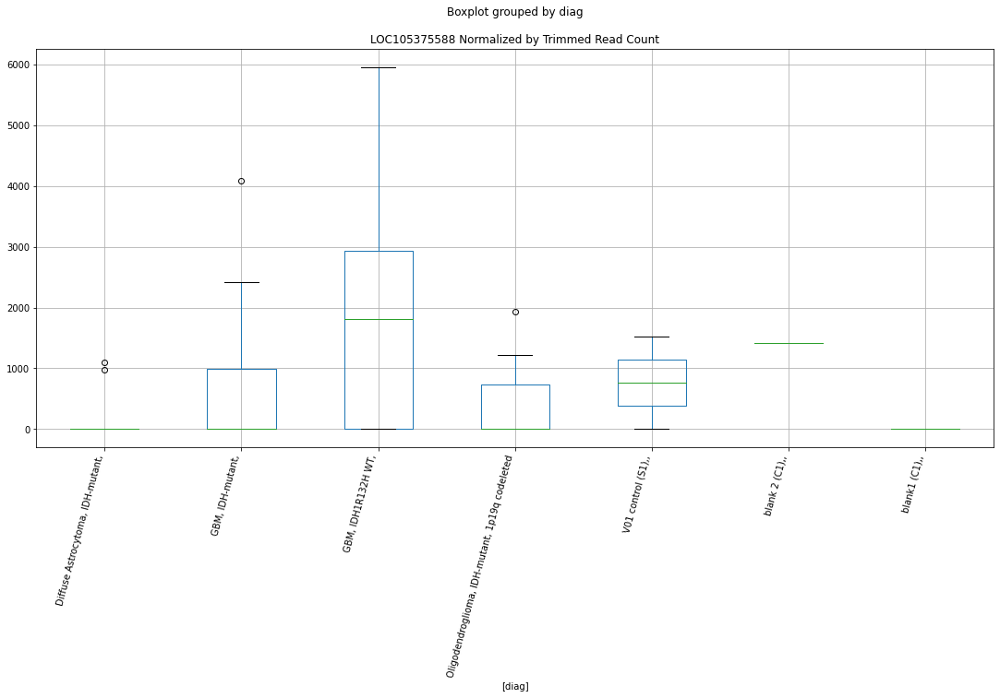

 p : 0.018856859634472485  ( t : 2.5804777049060914 ) :  Lexogen  :  bbduk2  :  LOC105373262
Control and blanks
79     0.0
343    0.0
Name: LOC105373262, dtype: float64
211    6559.35
Name: LOC105373262, dtype: float64
475    0.0
Name: LOC105373262, dtype: float64


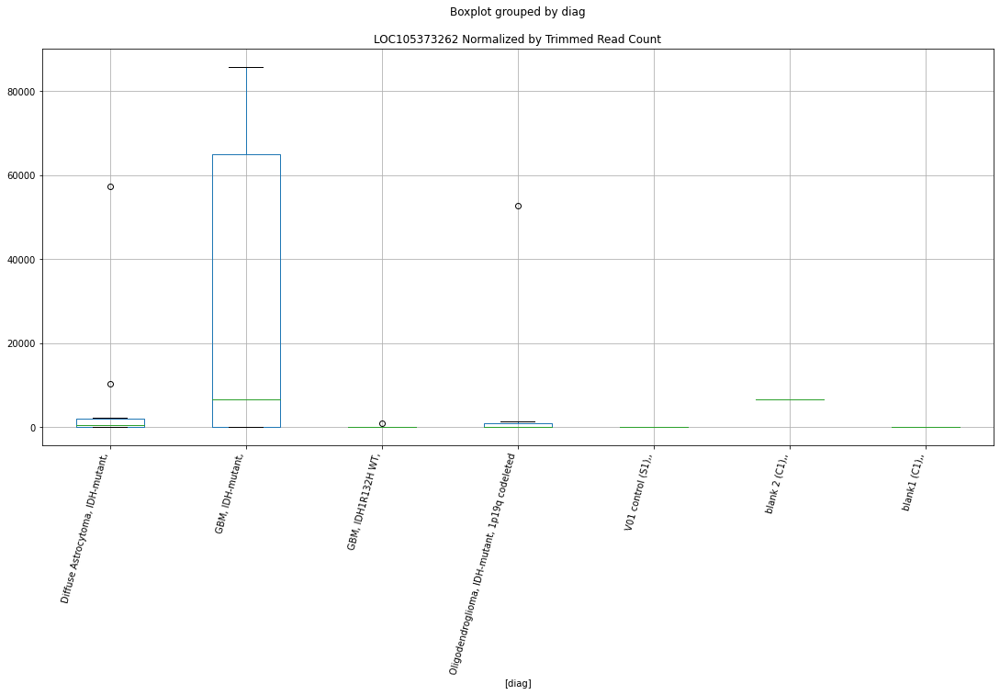

 p : 0.018933995746486736  ( t : 2.578531620914594 ) :  Lexogen  :  bbduk2  :  LOC105376097
Control and blanks
79     0.0
343    0.0
Name: LOC105376097, dtype: float64
211    0.0
Name: LOC105376097, dtype: float64
475    0.0
Name: LOC105376097, dtype: float64


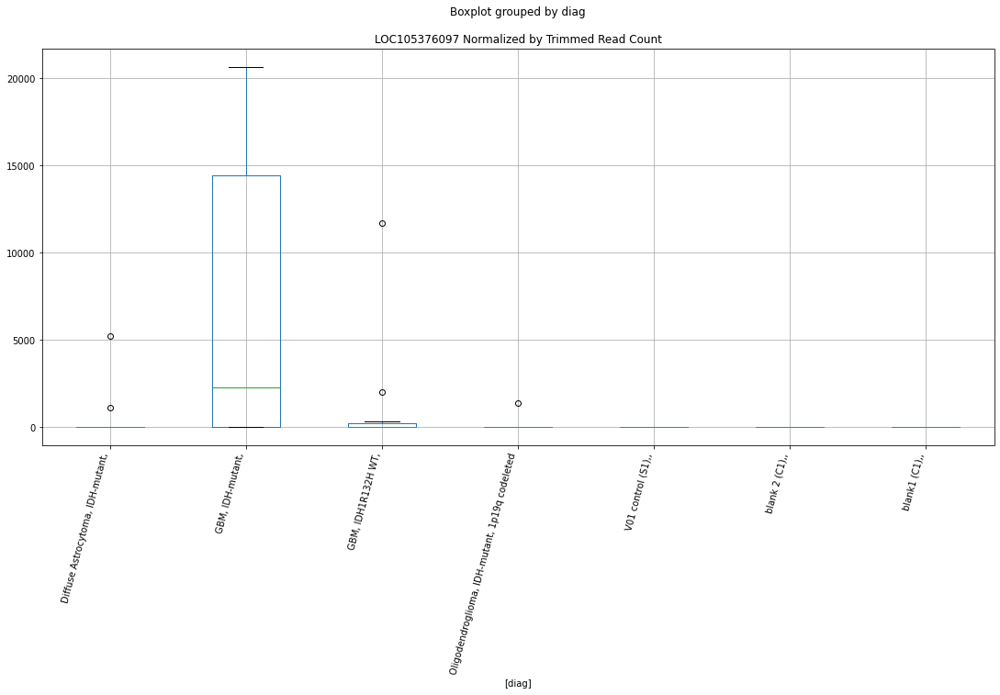

 p : 0.018980101516503107  ( t : 2.5773719926474765 ) :  Lexogen  :  cutadapt2  :  LOC105376097
Control and blanks
82     0.0
346    0.0
Name: LOC105376097, dtype: float64
214    0.0
Name: LOC105376097, dtype: float64
478    0.0
Name: LOC105376097, dtype: float64


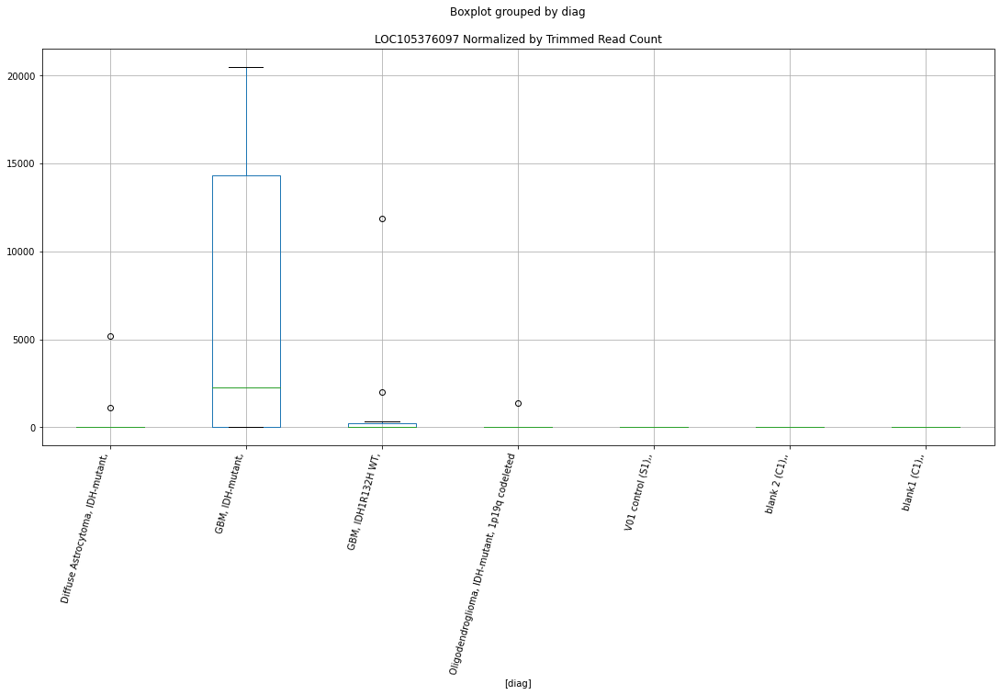

 p : 0.019009078626211616  ( t : 2.5766445406917367 ) :  Lexogen  :  cutadapt2  :  LOC105373262
Control and blanks
82     0.0
346    0.0
Name: LOC105373262, dtype: float64
214    6509.43
Name: LOC105373262, dtype: float64
478    0.0
Name: LOC105373262, dtype: float64


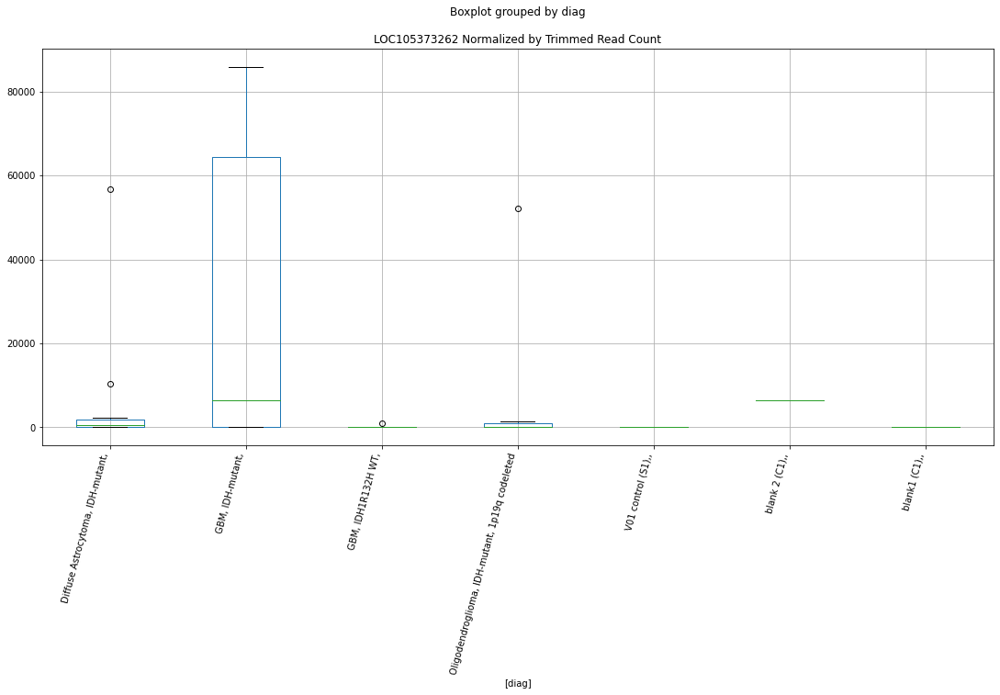

 p : 0.019112659997166905  ( t : 2.57405275841408 ) :  D-plex  :  bbduk2  :  LOC107984036
Control and blanks
73     0.0
337    0.0
Name: LOC107984036, dtype: float64
205    1790.91
Name: LOC107984036, dtype: float64
469    1183.05
Name: LOC107984036, dtype: float64


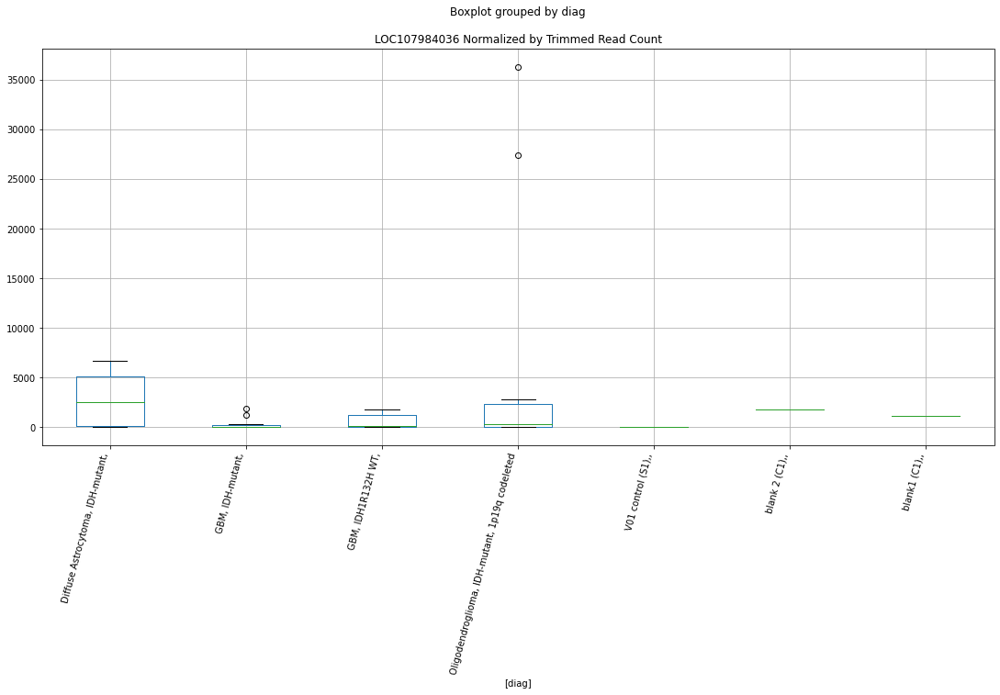

 p : 0.019434099717461493  ( t : 2.5660936633195637 ) :  D-plex  :  cutadapt2  :  LOC105373138
Control and blanks
76      3788.07
340    13210.98
Name: LOC105373138, dtype: float64
208    14108.82
Name: LOC105373138, dtype: float64
472    12715.03
Name: LOC105373138, dtype: float64


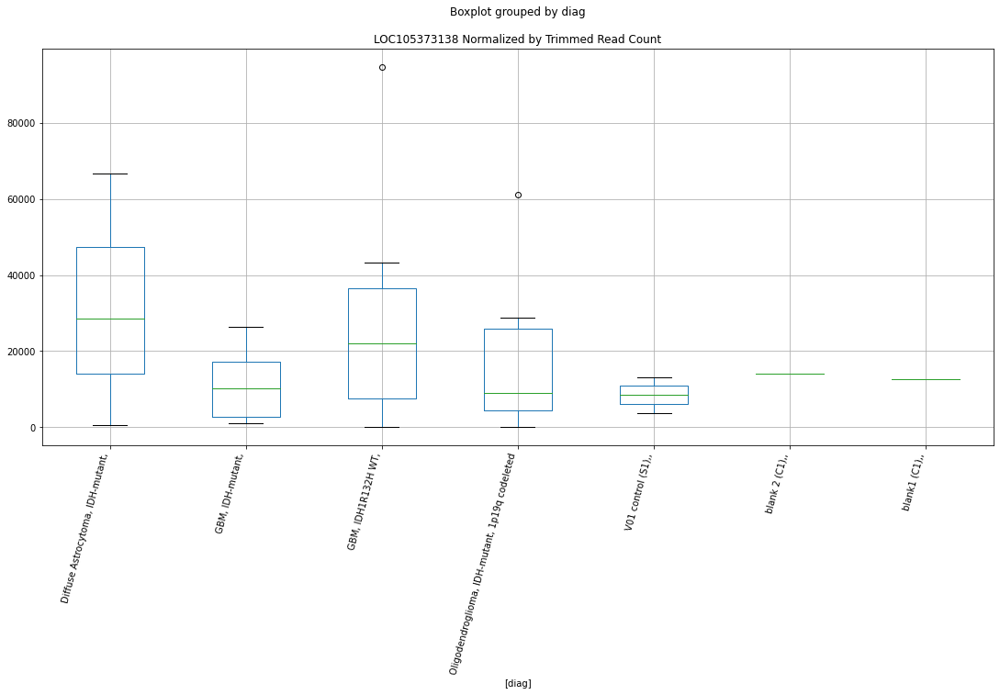

 p : 0.01962593217752972  ( t : 2.561402931299071 ) :  D-plex  :  bbduk2  :  LOC107985193
Control and blanks
73     2319.03
337       0.00
Name: LOC107985193, dtype: float64
205    3044.55
Name: LOC107985193, dtype: float64
469    2366.11
Name: LOC107985193, dtype: float64


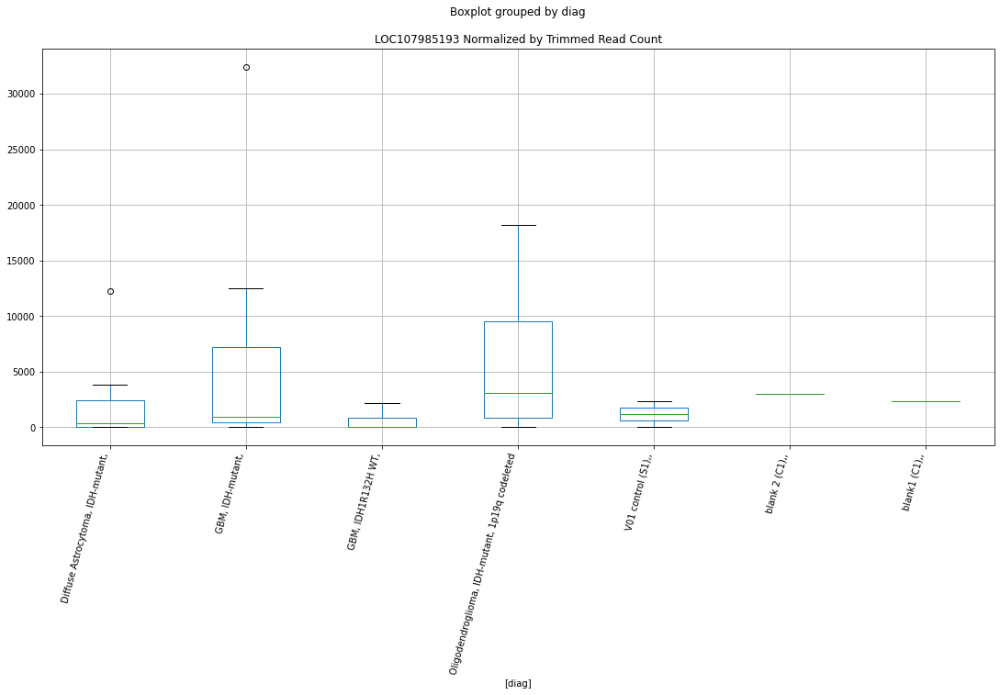

 p : 0.020078002215283868  ( t : 2.550518186808394 ) :  D-plex  :  cutadapt2  :  LOC105374121
Control and blanks
76     0.0
340    0.0
Name: LOC105374121, dtype: float64
208    5819.89
Name: LOC105374121, dtype: float64
472    5201.6
Name: LOC105374121, dtype: float64


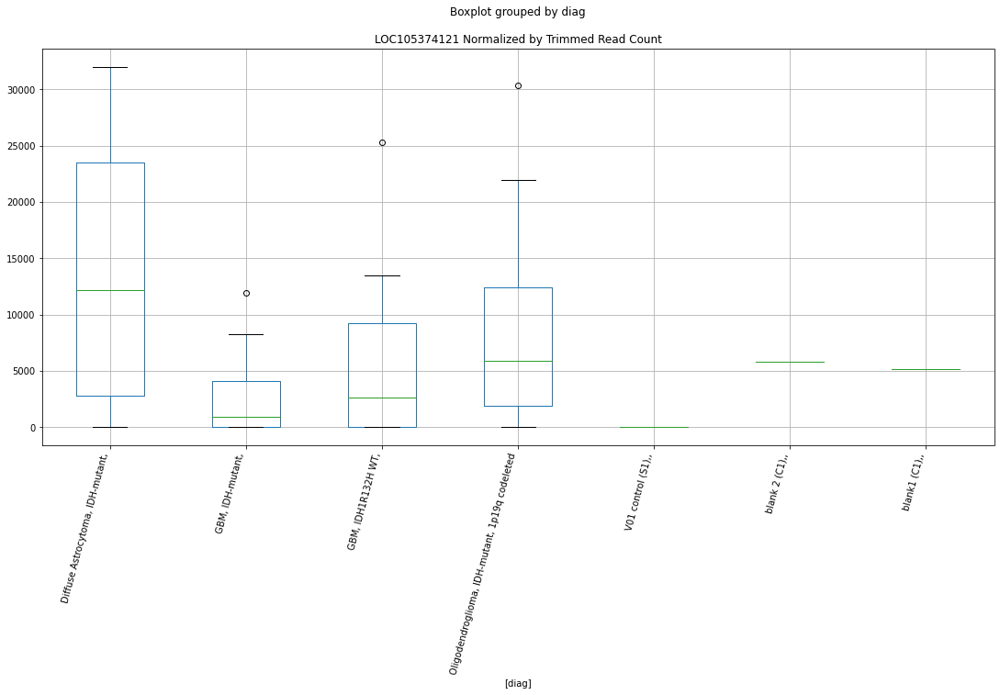

 p : 0.020212494518102194  ( t : 2.5473246690316413 ) :  D-plex  :  bbduk2  :  LOC107985541
Control and blanks
73     0.0
337    0.0
Name: LOC107985541, dtype: float64
205    1790.91
Name: LOC107985541, dtype: float64
469    1183.05
Name: LOC107985541, dtype: float64


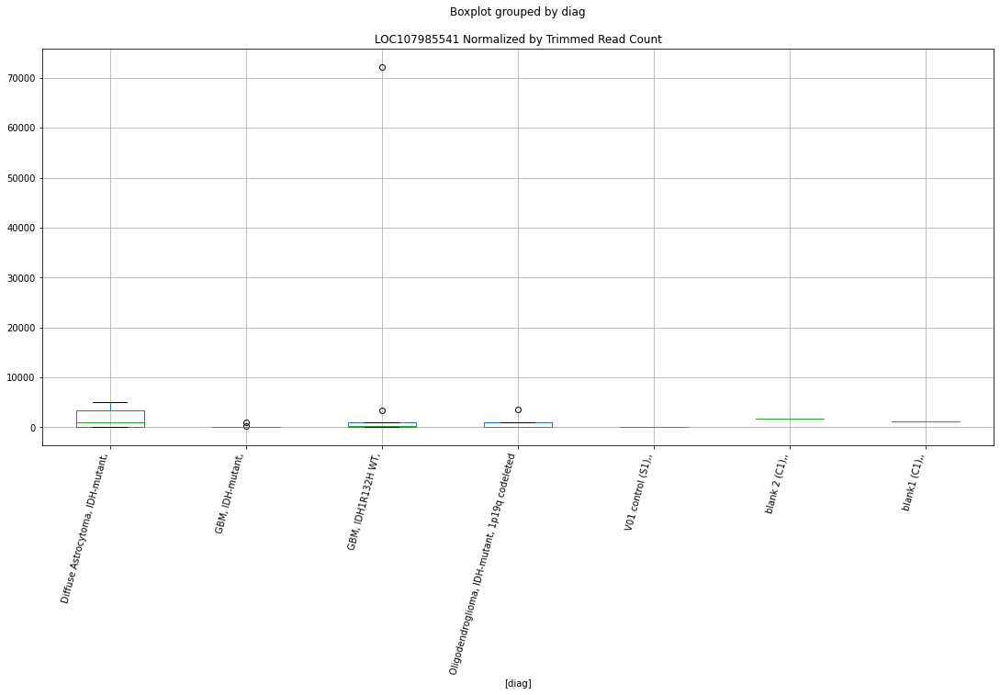

 p : 0.02049257814994072  ( t : 2.5407380749593305 ) :  D-plex  :  cutadapt2  :  LOC105378811
Control and blanks
76     0.0
340    0.0
Name: LOC105378811, dtype: float64
208    352.72
Name: LOC105378811, dtype: float64
472    0.0
Name: LOC105378811, dtype: float64


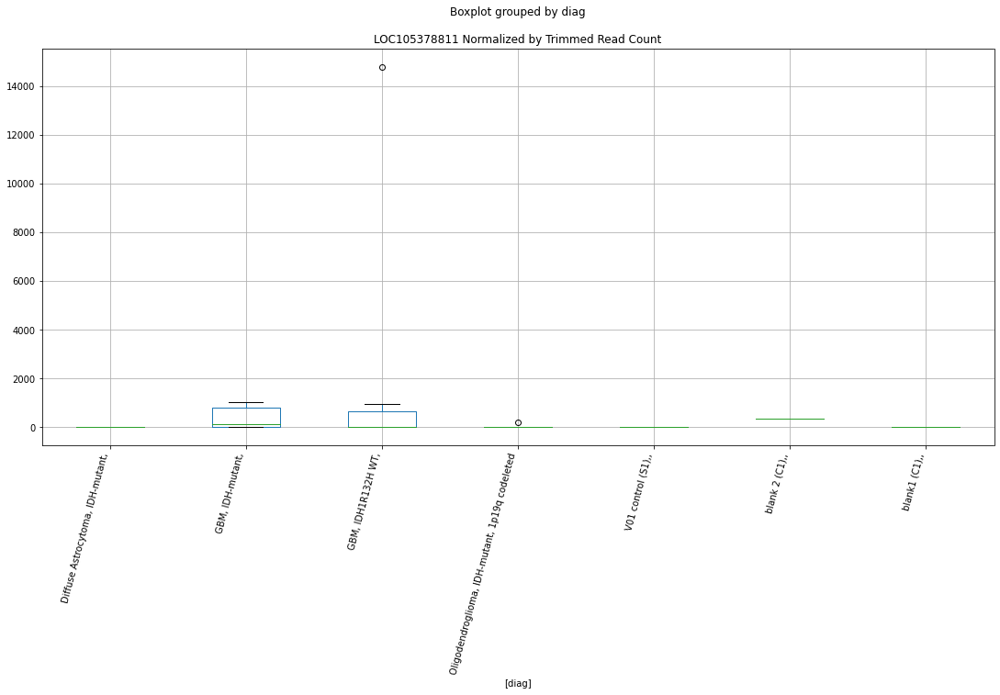

 p : 0.020937912689210664  ( t : 2.530438513899575 ) :  D-plex  :  bbduk2  :  LOC105378193
Control and blanks
73         0.00
337    16912.99
Name: LOC105378193, dtype: float64
205    716.36
Name: LOC105378193, dtype: float64
469    591.53
Name: LOC105378193, dtype: float64


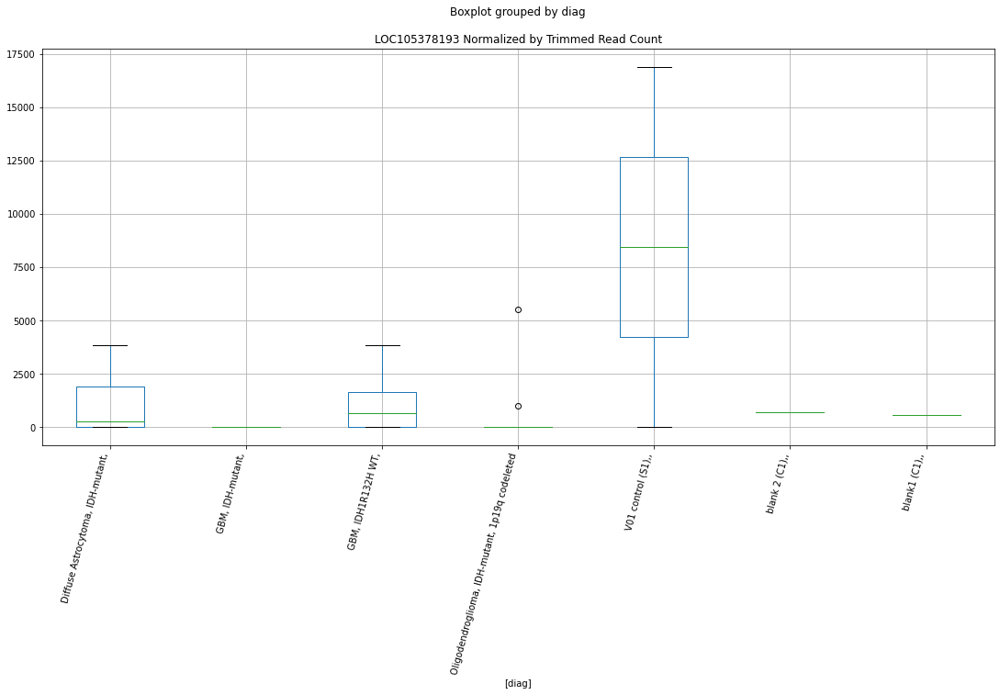

 p : 0.020941574616821522  ( t : 2.530354682922626 ) :  D-plex  :  cutadapt2  :  LOC107984316
Control and blanks
76     0.0
340    0.0
Name: LOC107984316, dtype: float64
208    705.44
Name: LOC107984316, dtype: float64
472    0.0
Name: LOC107984316, dtype: float64


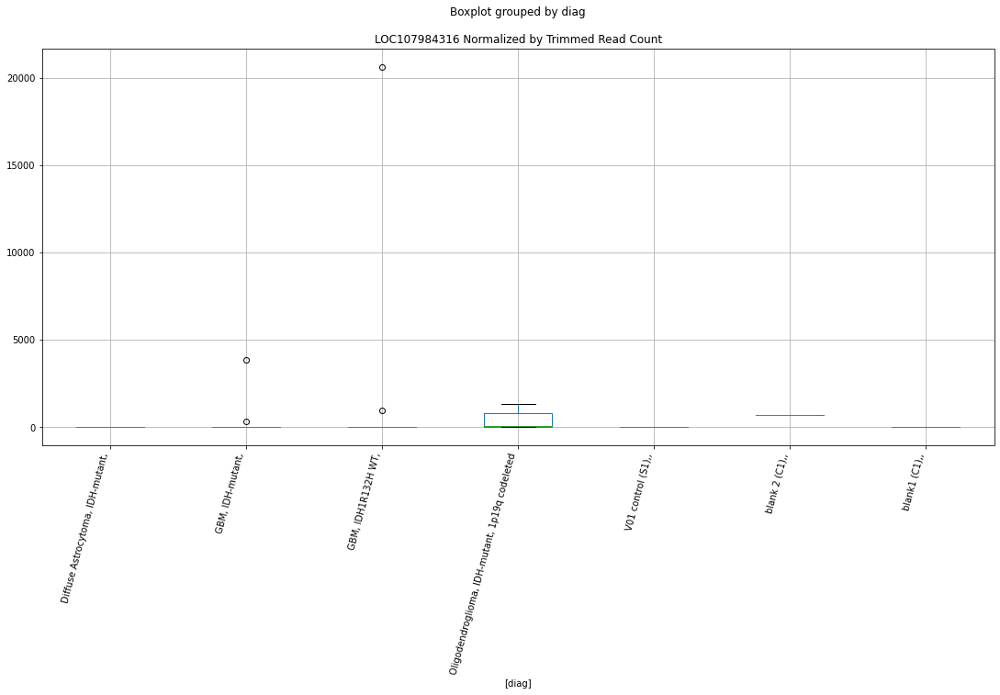

 p : 0.02117607055857888  ( t : 2.5250150836288445 ) :  D-plex  :  cutadapt2  :  LOC105378193
Control and blanks
76         0.00
340    16733.91
Name: LOC105378193, dtype: float64
208    705.44
Name: LOC105378193, dtype: float64
472    577.96
Name: LOC105378193, dtype: float64


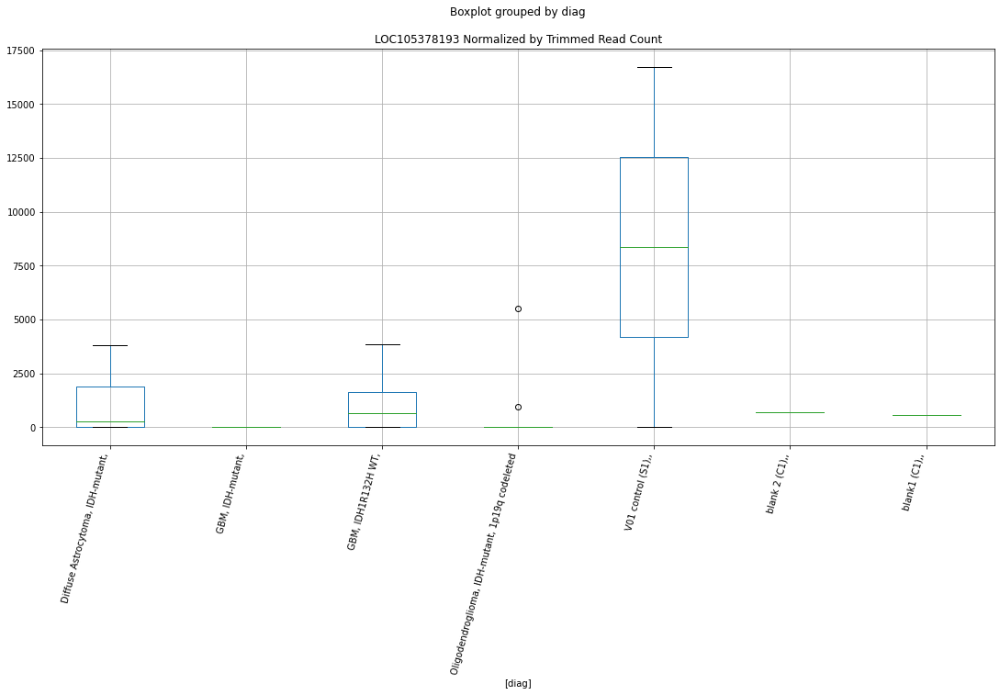

 p : 0.021177784699690366  ( t : 2.5249762576416797 ) :  Lexogen  :  bbduk2  :  LOC105372808
Control and blanks
79         0.00
343    31634.83
Name: LOC105372808, dtype: float64
211    0.0
Name: LOC105372808, dtype: float64
475    0.0
Name: LOC105372808, dtype: float64


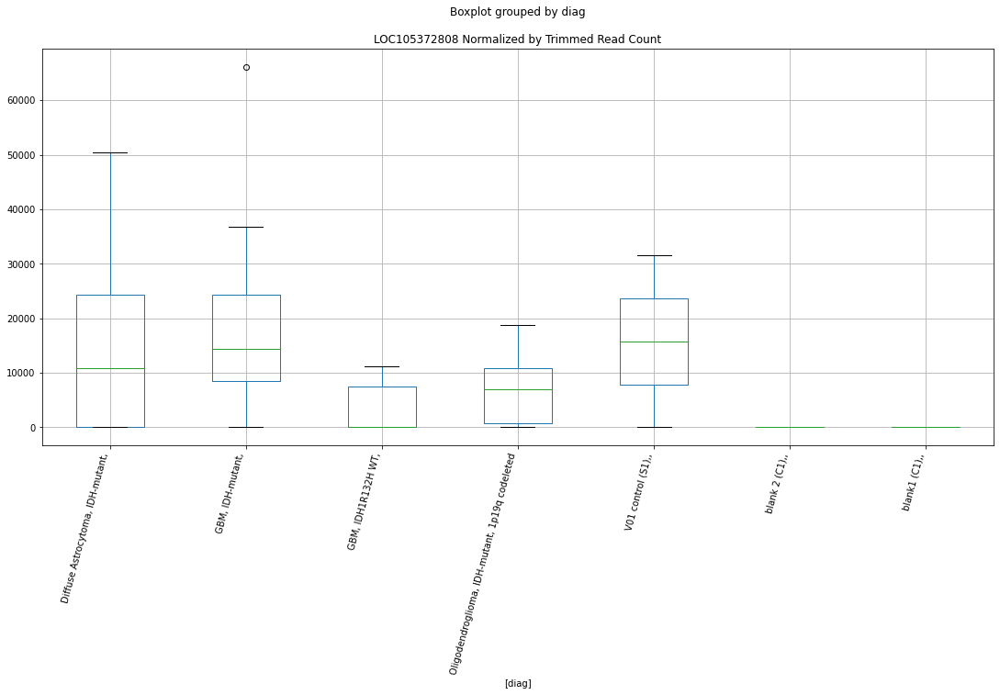

 p : 0.021207846260244825  ( t : 2.5242958329799072 ) :  D-plex  :  cutadapt2  :  LOC105379549
Control and blanks
76      757.61
340    1761.46
Name: LOC105379549, dtype: float64
208    3879.92
Name: LOC105379549, dtype: float64
472    1733.87
Name: LOC105379549, dtype: float64


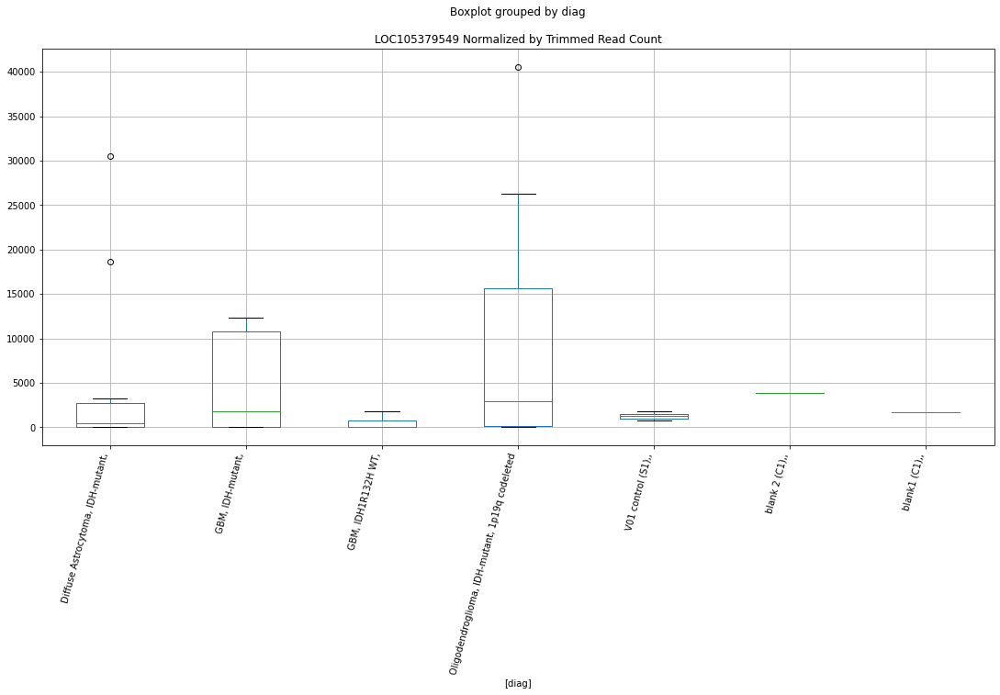

 p : 0.021257428273400793  ( t : 2.523175561787181 ) :  D-plex  :  bbduk2  :  LOC105379420
Control and blanks
73     0.0
337    0.0
Name: LOC105379420, dtype: float64
205    4477.27
Name: LOC105379420, dtype: float64
469    5323.75
Name: LOC105379420, dtype: float64


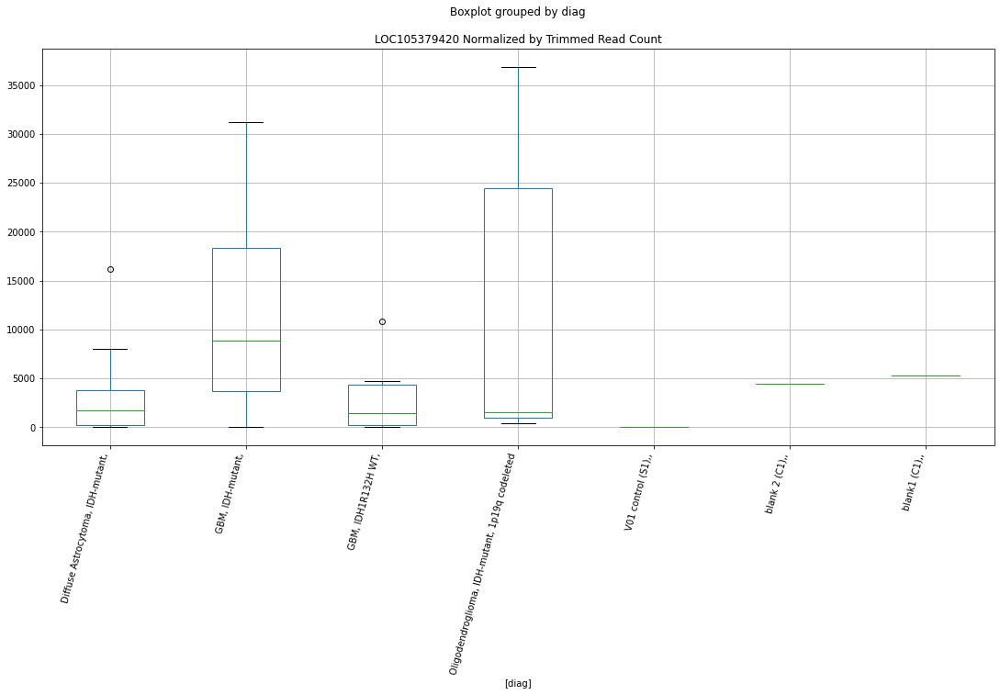

 p : 0.02179206156390269  ( t : 2.511250094368392 ) :  Lexogen  :  bbduk2  :  LOC105376505
Control and blanks
79     0.0
343    0.0
Name: LOC105376505, dtype: float64
211    273.31
Name: LOC105376505, dtype: float64
475    0.0
Name: LOC105376505, dtype: float64


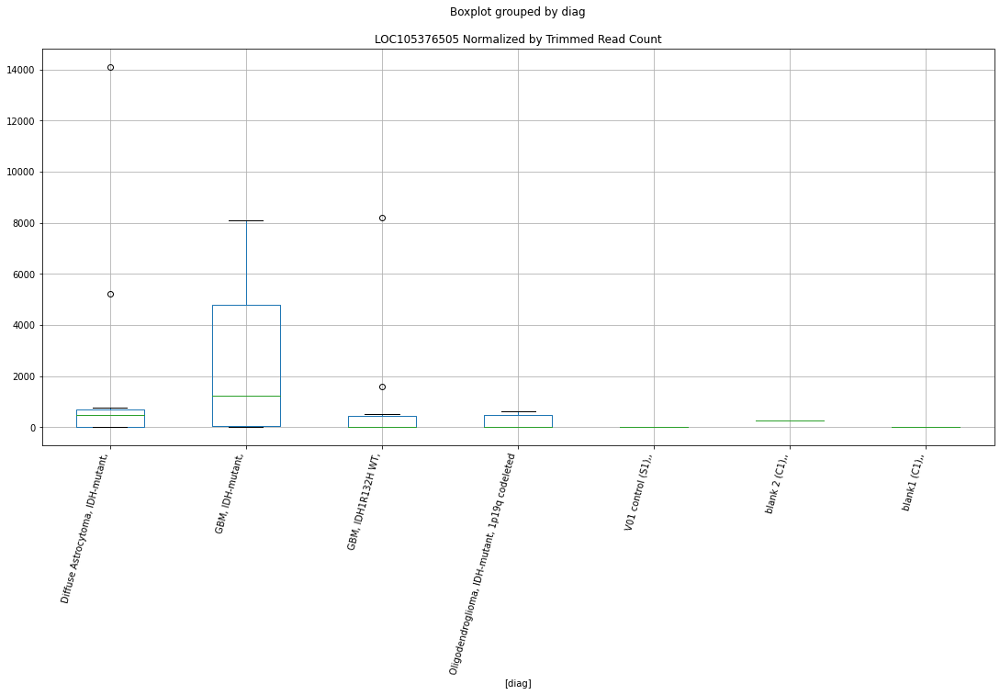

 p : 0.02186535818200372  ( t : 2.509636708665679 ) :  D-plex  :  bbduk2  :  LOC105375144
Control and blanks
73         0.0
337    24924.4
Name: LOC105375144, dtype: float64
205    5372.73
Name: LOC105375144, dtype: float64
469    0.0
Name: LOC105375144, dtype: float64


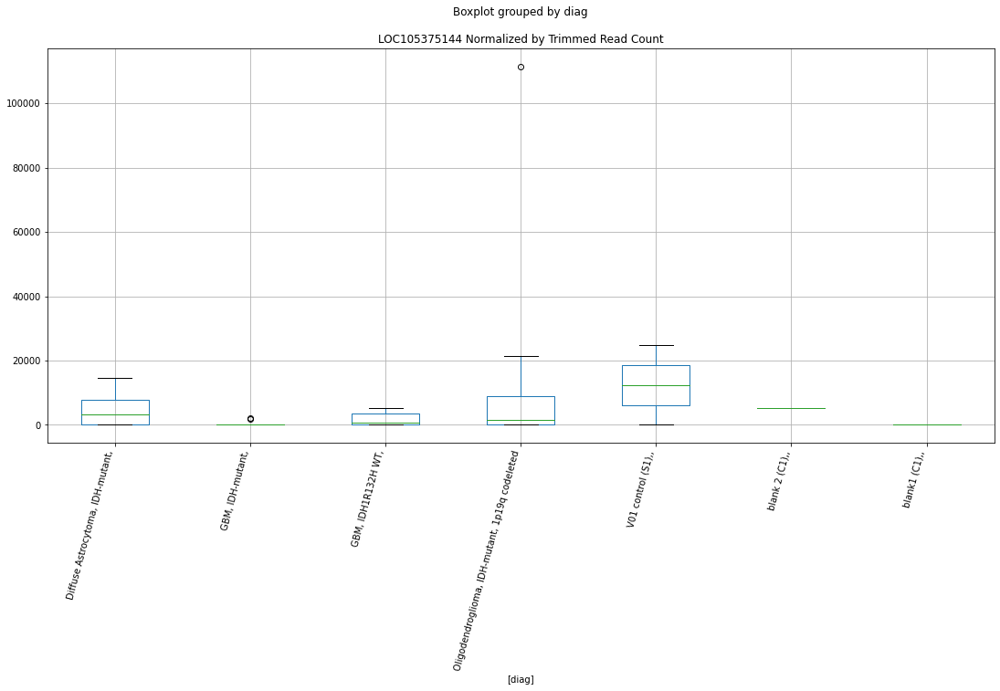

 p : 0.021890009718484295  ( t : 2.509095231553226 ) :  Lexogen  :  cutadapt2  :  LOC105376505
Control and blanks
82     0.0
346    0.0
Name: LOC105376505, dtype: float64
214    271.23
Name: LOC105376505, dtype: float64
478    0.0
Name: LOC105376505, dtype: float64


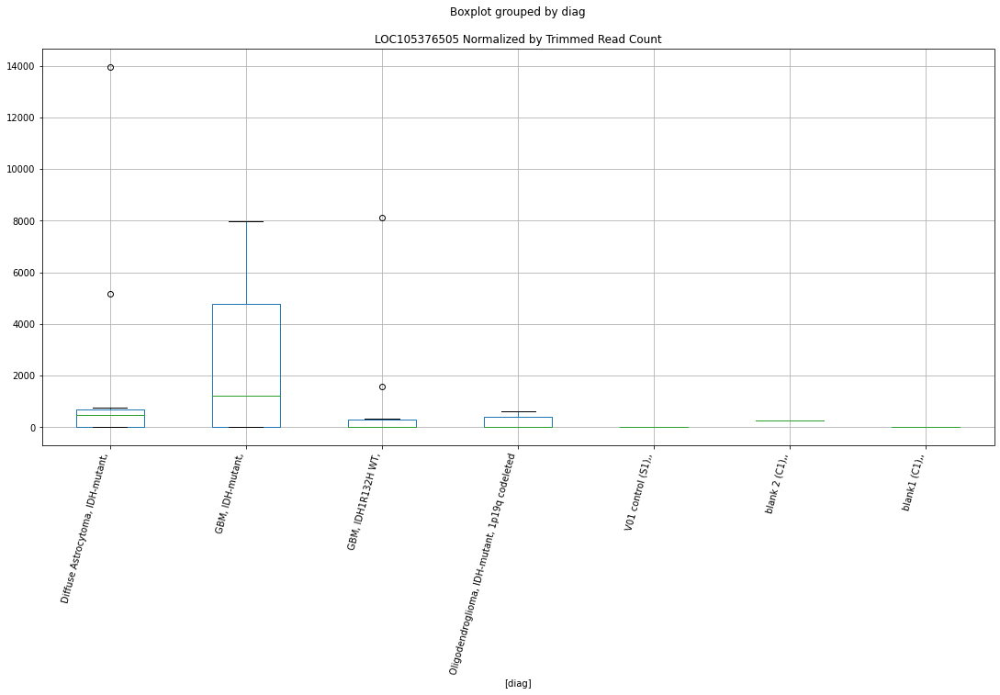

 p : 0.022248567588406848  ( t : 2.501283744522842 ) :  D-plex  :  cutadapt2  :  LOC105376103
Control and blanks
76     0.0
340    0.0
Name: LOC105376103, dtype: float64
208    3527.2
Name: LOC105376103, dtype: float64
472    577.96
Name: LOC105376103, dtype: float64


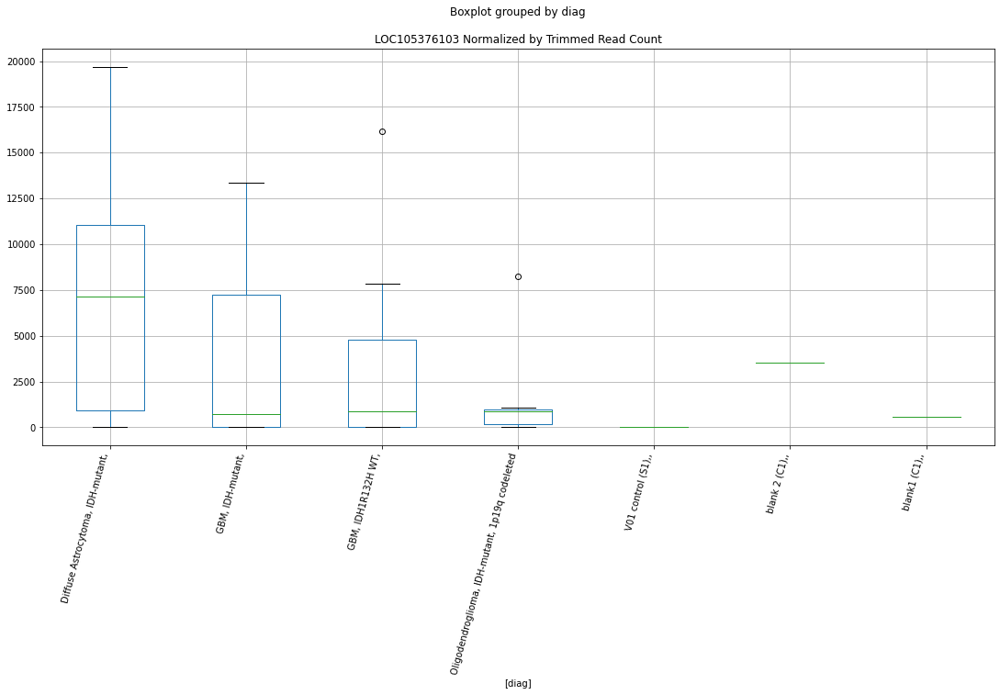

 p : 0.02225098443424315  ( t : 2.501231495233802 ) :  D-plex  :  bbduk2  :  LOC105373138
Control and blanks
73      3865.04
337    16022.83
Name: LOC105373138, dtype: float64
205    14864.55
Name: LOC105373138, dtype: float64
469    13605.13
Name: LOC105373138, dtype: float64


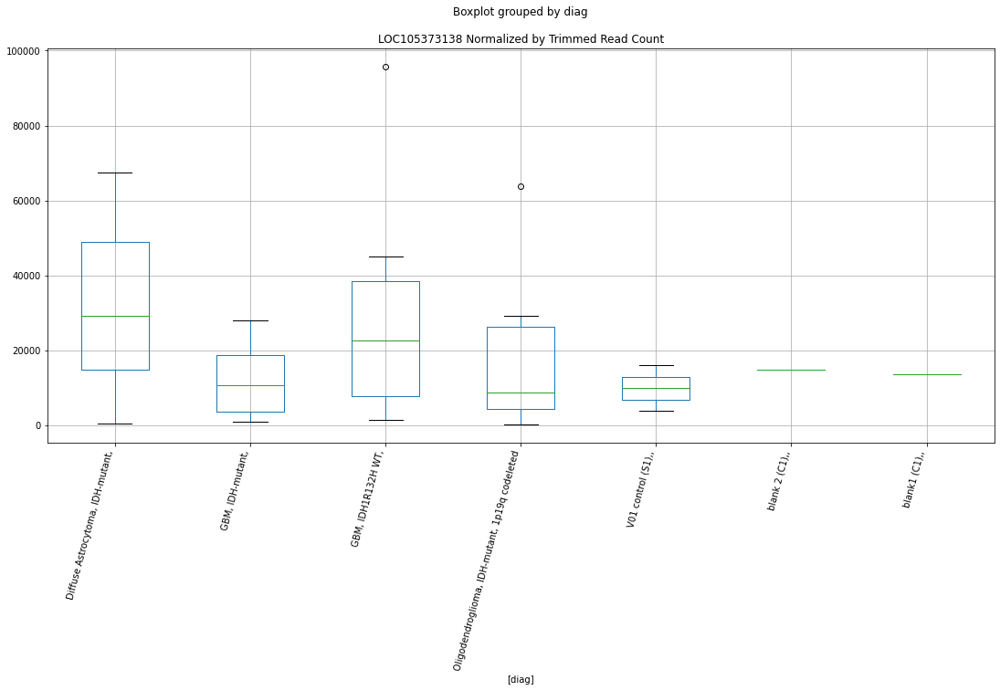

 p : 0.0222813458337212  ( t : 2.500575573654123 ) :  Lexogen  :  cutadapt2  :  LOC105372808
Control and blanks
82         0.00
346    31354.74
Name: LOC105372808, dtype: float64
214    0.0
Name: LOC105372808, dtype: float64
478    0.0
Name: LOC105372808, dtype: float64


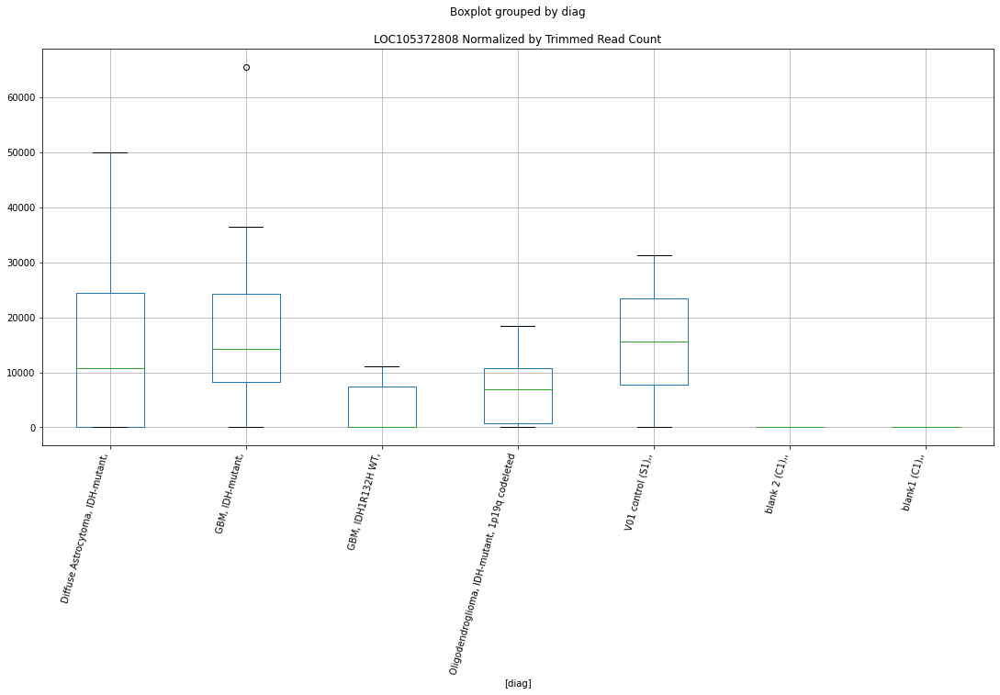

 p : 0.022485486047379395  ( t : 2.4961871141674186 ) :  D-plex  :  bbduk2  :  LOC105374852
Control and blanks
73     0.0
337    0.0
Name: LOC105374852, dtype: float64
205    716.36
Name: LOC105374852, dtype: float64
469    0.0
Name: LOC105374852, dtype: float64


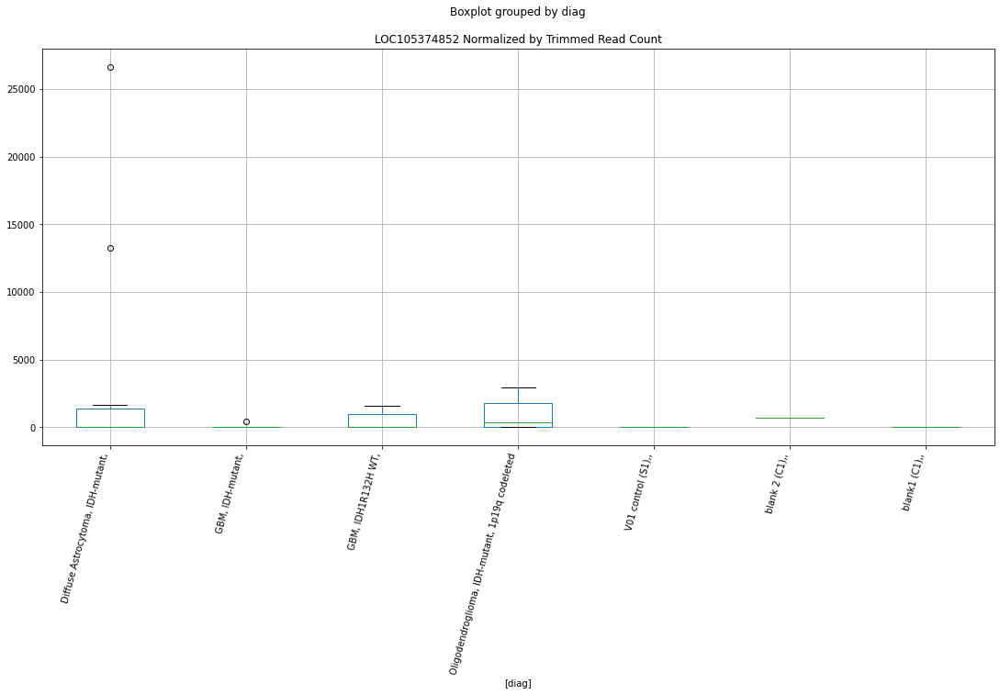

 p : 0.023693377244851013  ( t : 2.4709639135020893 ) :  D-plex  :  bbduk2  :  LOC105373591
Control and blanks
73     0.0
337    0.0
Name: LOC105373591, dtype: float64
205    1074.55
Name: LOC105373591, dtype: float64
469    5915.27
Name: LOC105373591, dtype: float64


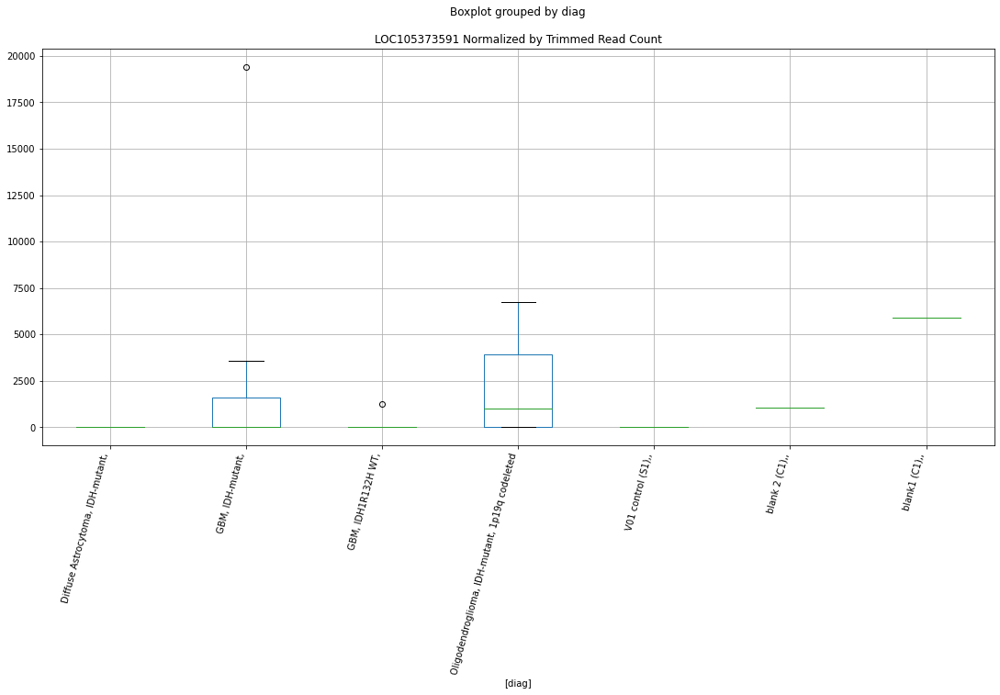

 p : 0.02376604627461515  ( t : 2.4694852986378977 ) :  D-plex  :  bbduk2  :  LOC105377375
Control and blanks
73     0.0
337    0.0
Name: LOC105377375, dtype: float64
205    179.09
Name: LOC105377375, dtype: float64
469    0.0
Name: LOC105377375, dtype: float64


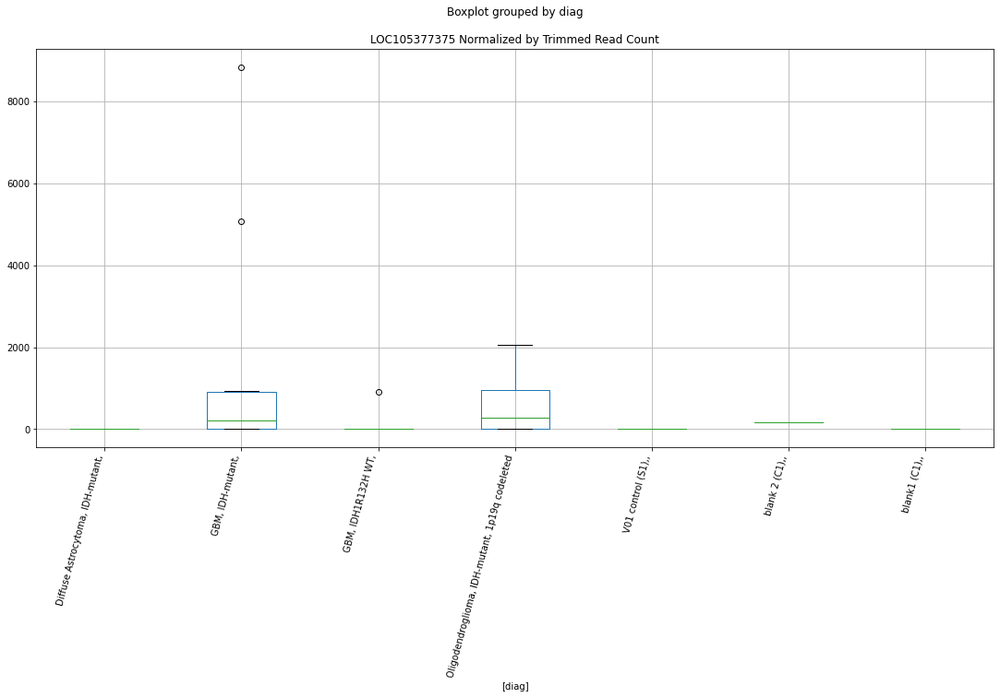

 p : 0.023789422033406355  ( t : 2.4690105697672813 ) :  Lexogen  :  cutadapt2  :  LOC105376541
Control and blanks
82       0.00
346    210.43
Name: LOC105376541, dtype: float64
214    0.0
Name: LOC105376541, dtype: float64
478    474.92
Name: LOC105376541, dtype: float64


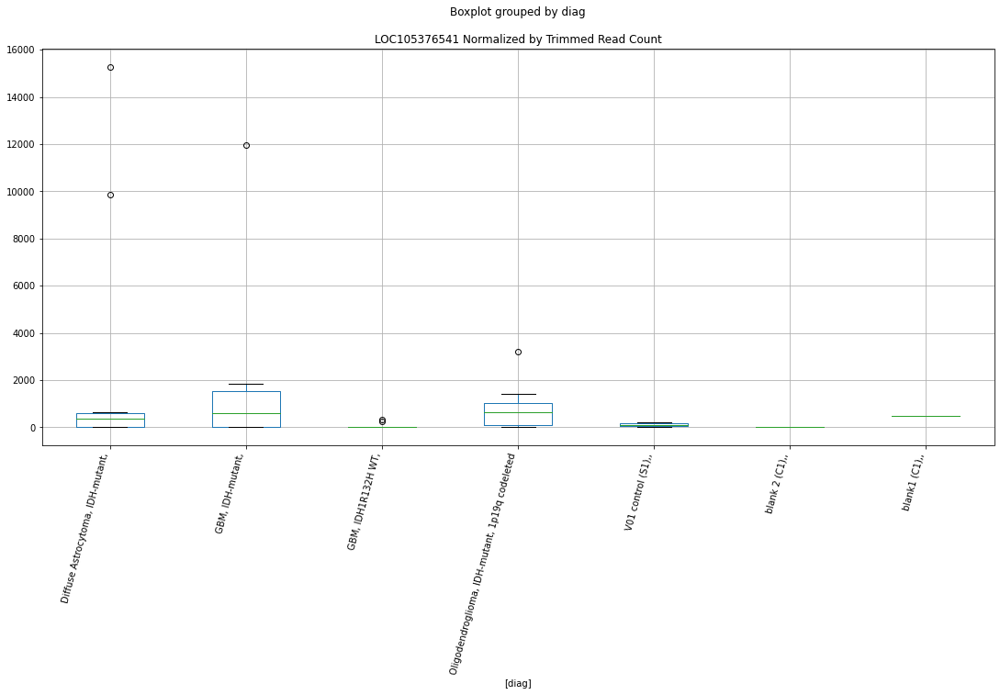

 p : 0.023828429313270724  ( t : 2.4682193622591404 ) :  D-plex  :  cutadapt2  :  LOC105377375
Control and blanks
76     0.0
340    0.0
Name: LOC105377375, dtype: float64
208    176.36
Name: LOC105377375, dtype: float64
472    0.0
Name: LOC105377375, dtype: float64


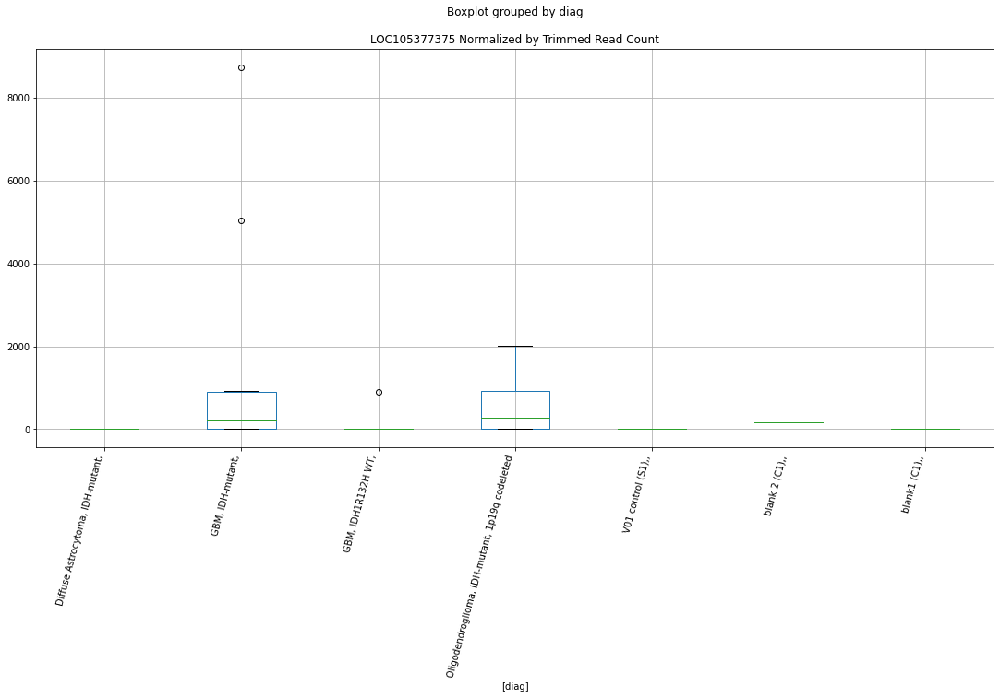

 p : 0.02403528966951993  ( t : 2.4640437331410294 ) :  D-plex  :  cutadapt2  :  LOC105378711
Control and blanks
76     0.0
340    0.0
Name: LOC105378711, dtype: float64
208    176.36
Name: LOC105378711, dtype: float64
472    0.0
Name: LOC105378711, dtype: float64


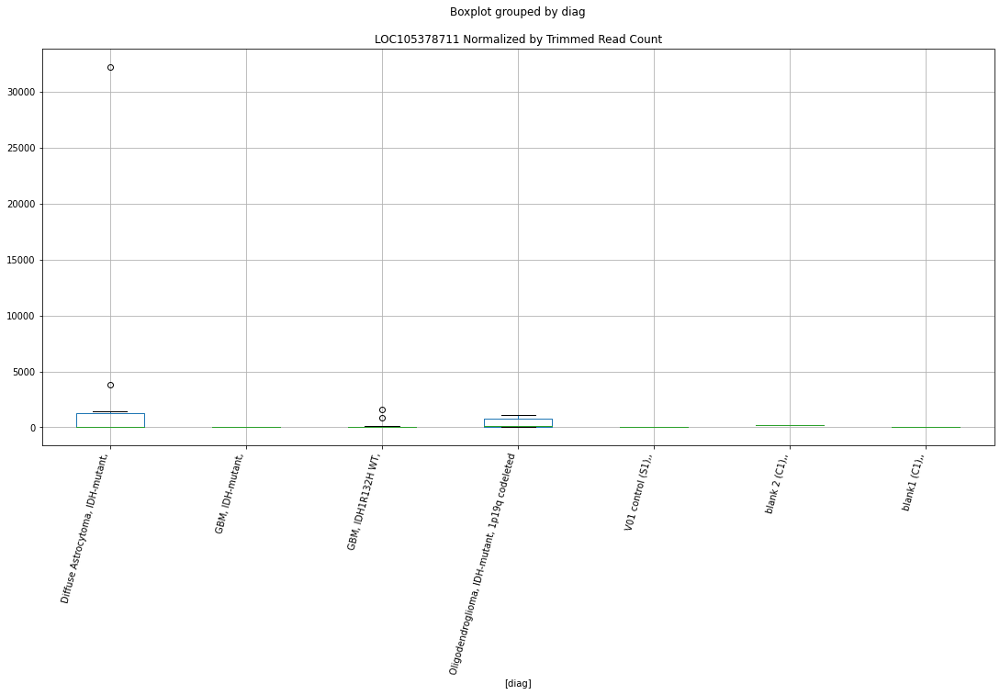

 p : 0.024099361117354366  ( t : 2.462757253244641 ) :  D-plex  :  cutadapt2  :  LOC105373819
Control and blanks
76     757.61
340    880.73
Name: LOC105373819, dtype: float64
208    0.0
Name: LOC105373819, dtype: float64
472    577.96
Name: LOC105373819, dtype: float64


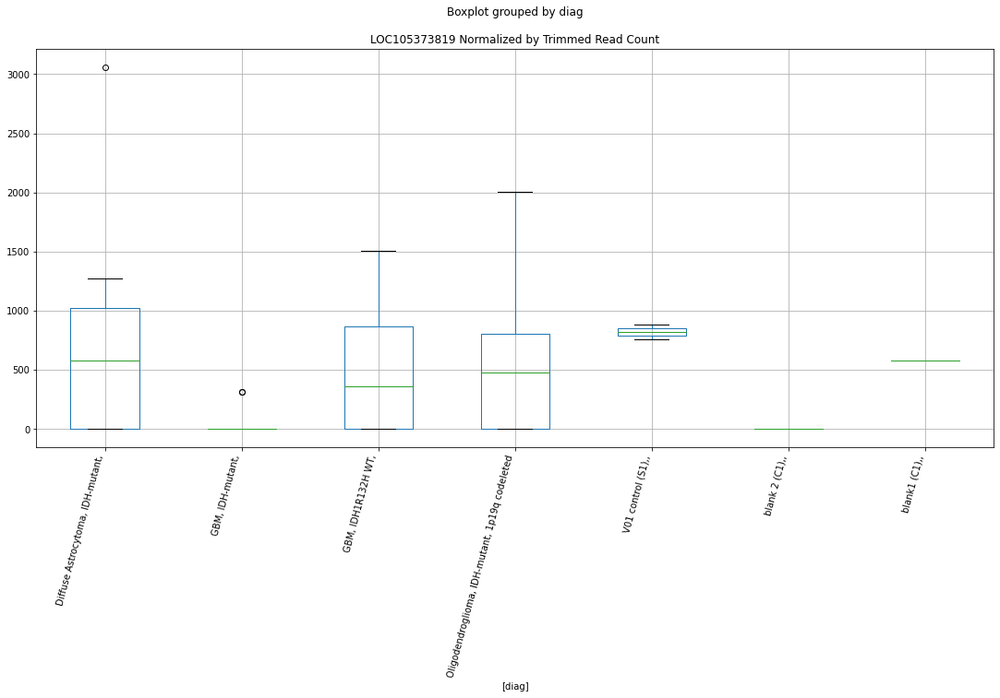

 p : 0.024218981363879725  ( t : 2.460363996279315 ) :  D-plex  :  bbduk2  :  LOC107984451
Control and blanks
73     0.0
337    0.0
Name: LOC107984451, dtype: float64
205    1790.91
Name: LOC107984451, dtype: float64
469    7098.33
Name: LOC107984451, dtype: float64


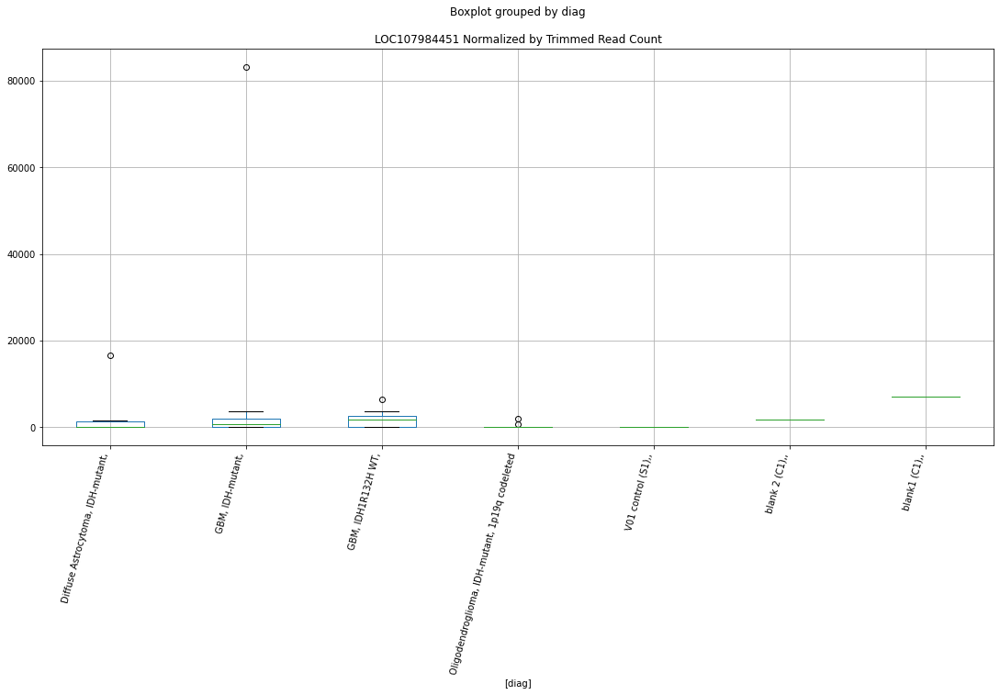

 p : 0.024242801859517018  ( t : 2.459888743036078 ) :  D-plex  :  bbduk2  :  LOC105378711
Control and blanks
73     0.0
337    0.0
Name: LOC105378711, dtype: float64
205    179.09
Name: LOC105378711, dtype: float64
469    0.0
Name: LOC105378711, dtype: float64


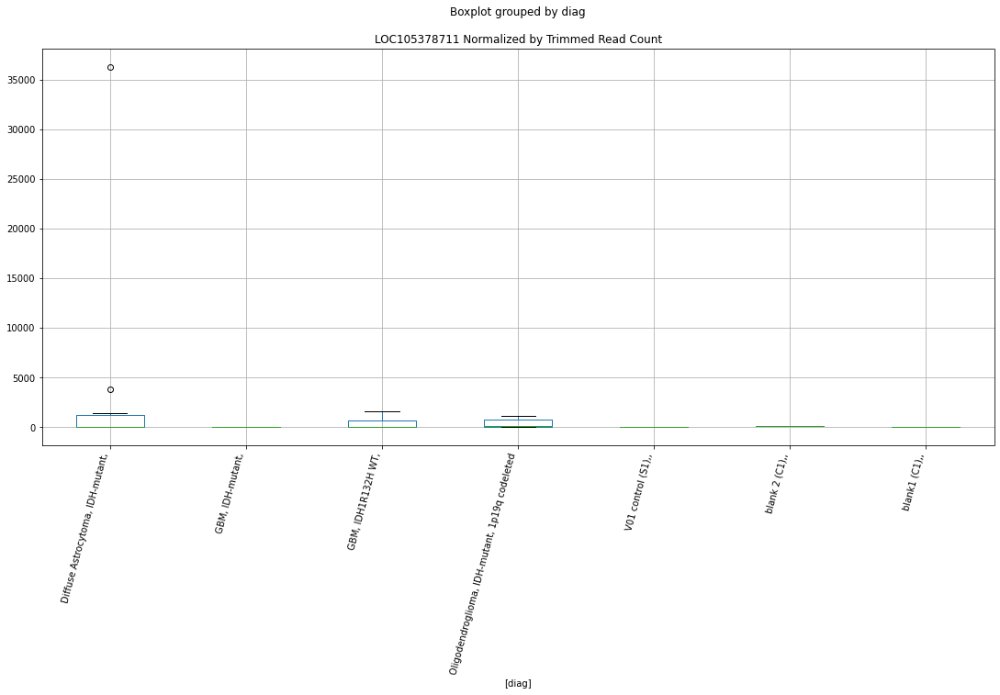

 p : 0.024249711548765165  ( t : 2.4597509668573188 ) :  D-plex  :  bbduk2  :  LOC105376201
Control and blanks
73     0.0
337    0.0
Name: LOC105376201, dtype: float64
205    1611.82
Name: LOC105376201, dtype: float64
469    1774.58
Name: LOC105376201, dtype: float64


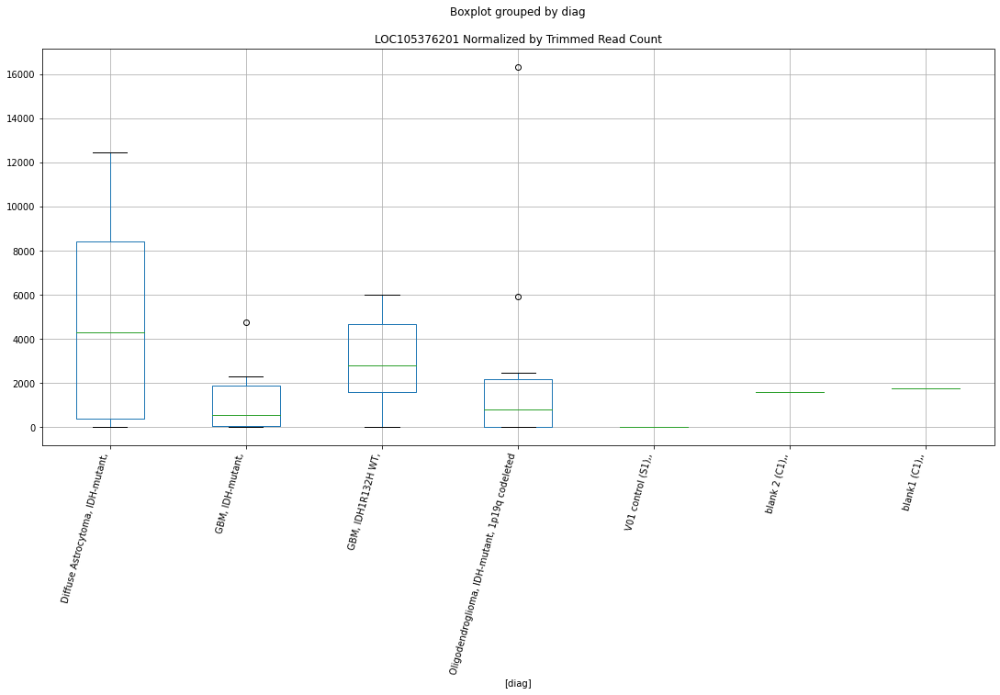

 p : 0.024344220593415348  ( t : 2.4578701907801173 ) :  D-plex  :  bbduk2  :  LOC105373819
Control and blanks
73     773.01
337    890.16
Name: LOC105373819, dtype: float64
205    0.0
Name: LOC105373819, dtype: float64
469    591.53
Name: LOC105373819, dtype: float64


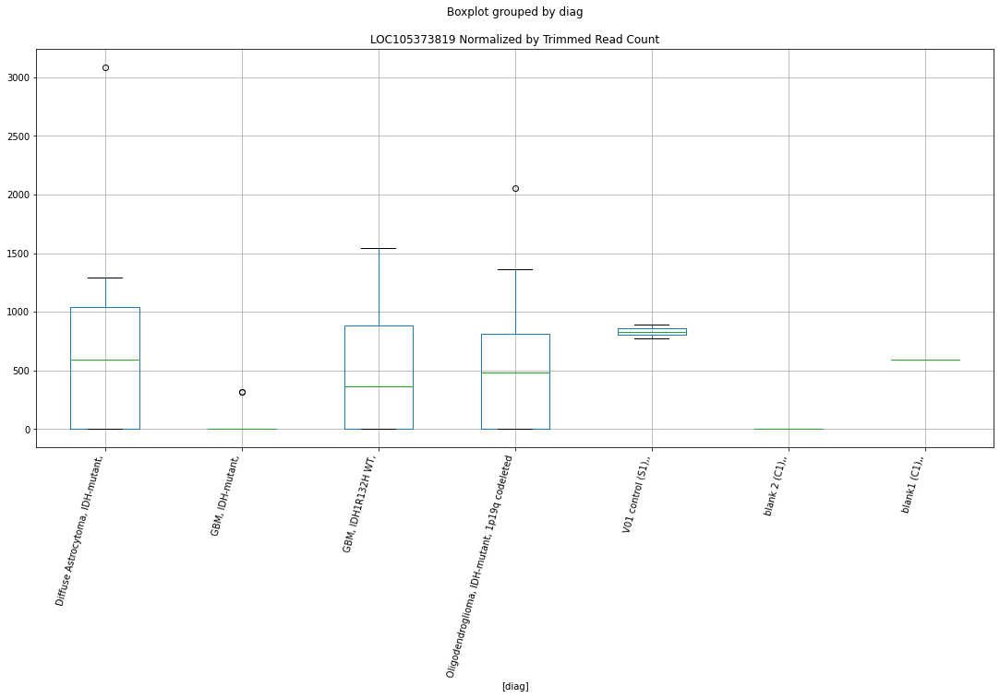

 p : 0.024381094027580964  ( t : 2.4571382509713886 ) :  D-plex  :  cutadapt2  :  LOC105375809
Control and blanks
76     0.0
340    0.0
Name: LOC105375809, dtype: float64
208    176.36
Name: LOC105375809, dtype: float64
472    577.96
Name: LOC105375809, dtype: float64


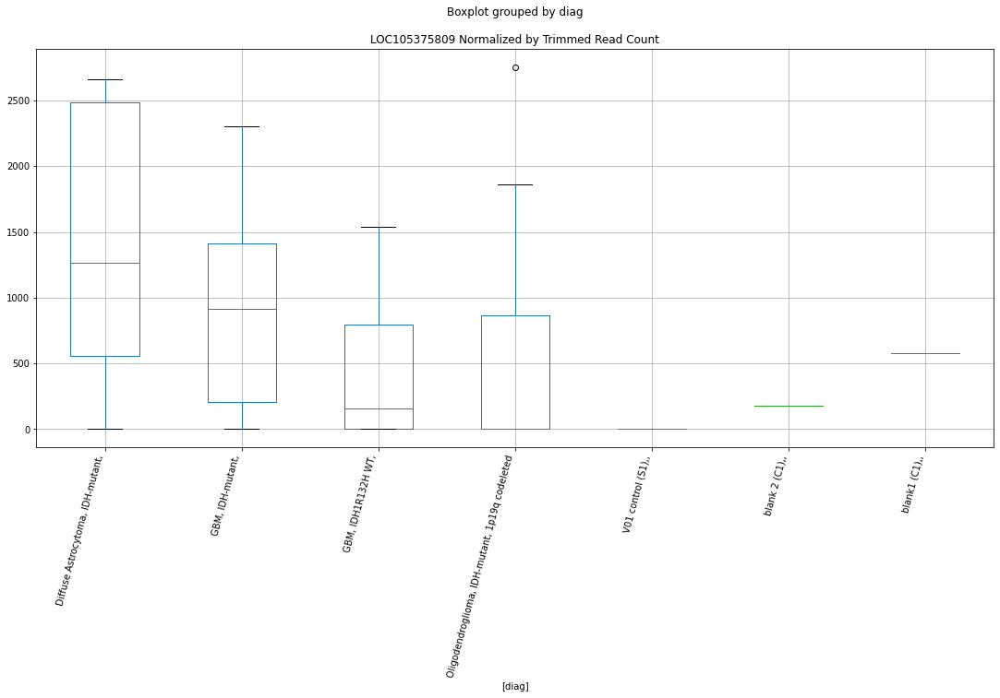

 p : 0.02472893950273799  ( t : 2.4502842057828365 ) :  D-plex  :  cutadapt2  :  LOC107984770
Control and blanks
76     2272.84
340     880.73
Name: LOC107984770, dtype: float64
208    37388.37
Name: LOC107984770, dtype: float64
472    11559.12
Name: LOC107984770, dtype: float64


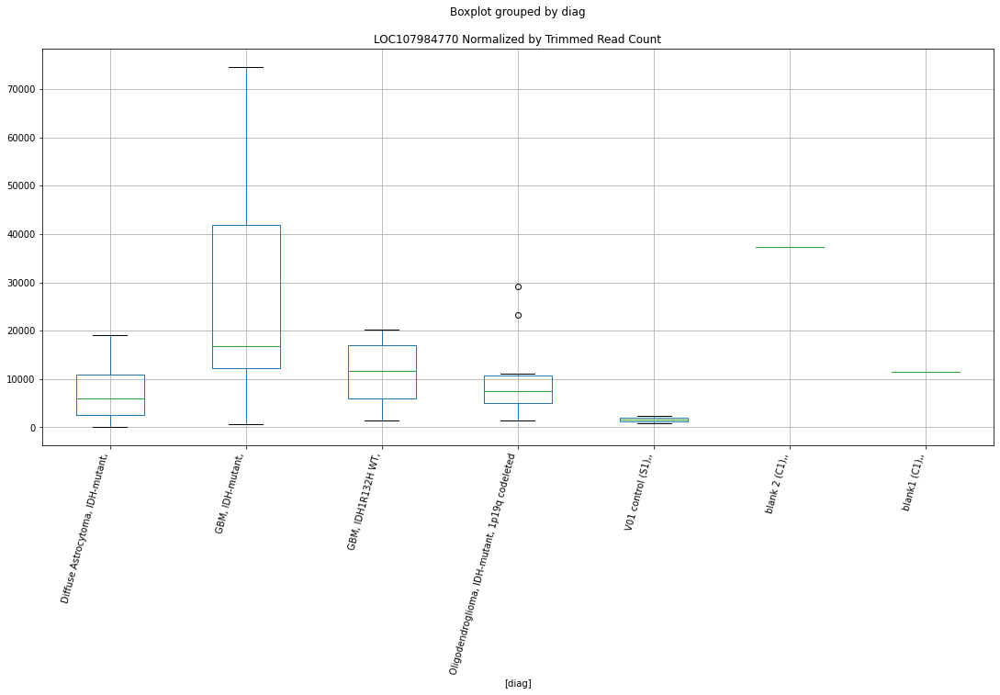

 p : 0.024868550015813073  ( t : 2.447558708110972 ) :  D-plex  :  bbduk2  :  LOC105376103
Control and blanks
73     0.0
337    0.0
Name: LOC105376103, dtype: float64
205    3402.73
Name: LOC105376103, dtype: float64
469    1183.05
Name: LOC105376103, dtype: float64


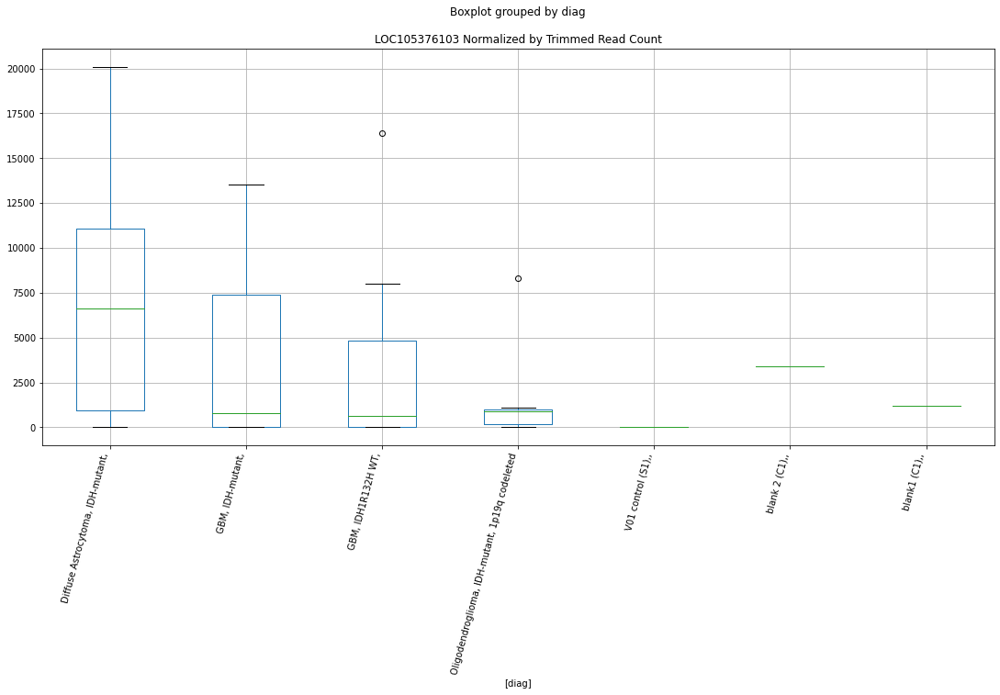

 p : 0.025107383854985142  ( t : 2.4429292819688184 ) :  Lexogen  :  cutadapt2  :  LOC105376278
Control and blanks
82     0.0
346    0.0
Name: LOC105376278, dtype: float64
214    0.0
Name: LOC105376278, dtype: float64
478    0.0
Name: LOC105376278, dtype: float64


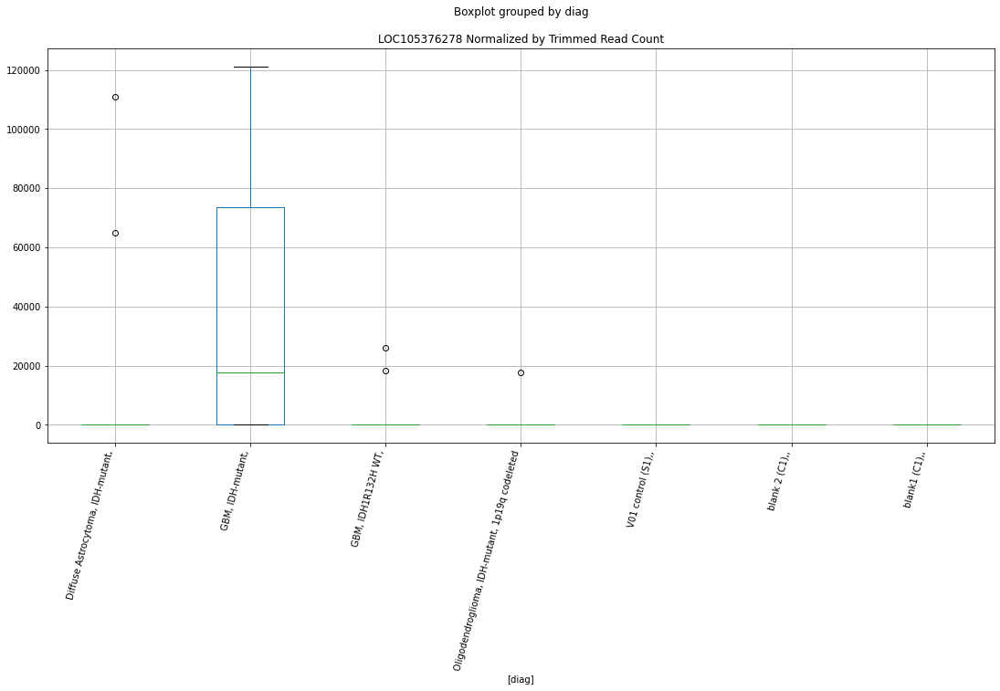

 p : 0.025113719097167666  ( t : 2.4428070465171405 ) :  Lexogen  :  bbduk2  :  LOC105376278
Control and blanks
79     0.0
343    0.0
Name: LOC105376278, dtype: float64
211    0.0
Name: LOC105376278, dtype: float64
475    0.0
Name: LOC105376278, dtype: float64


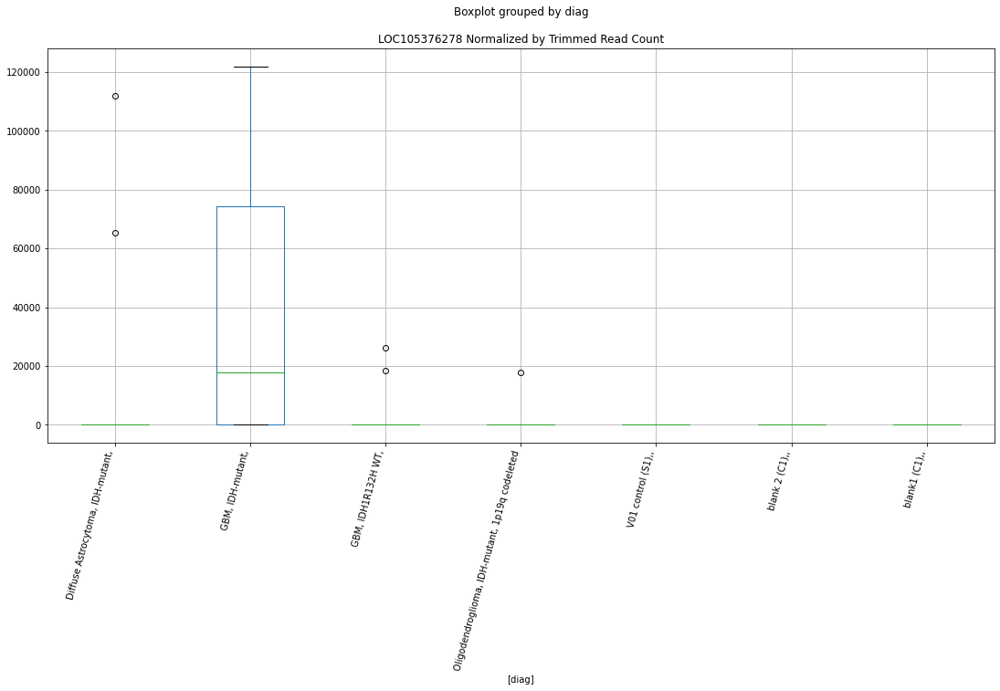

 p : 0.02531705625861585  ( t : 2.4388990392865537 ) :  D-plex  :  cutadapt2  :  LOC105379052
Control and blanks
76     0.0
340    0.0
Name: LOC105379052, dtype: float64
208    705.44
Name: LOC105379052, dtype: float64
472    2311.82
Name: LOC105379052, dtype: float64


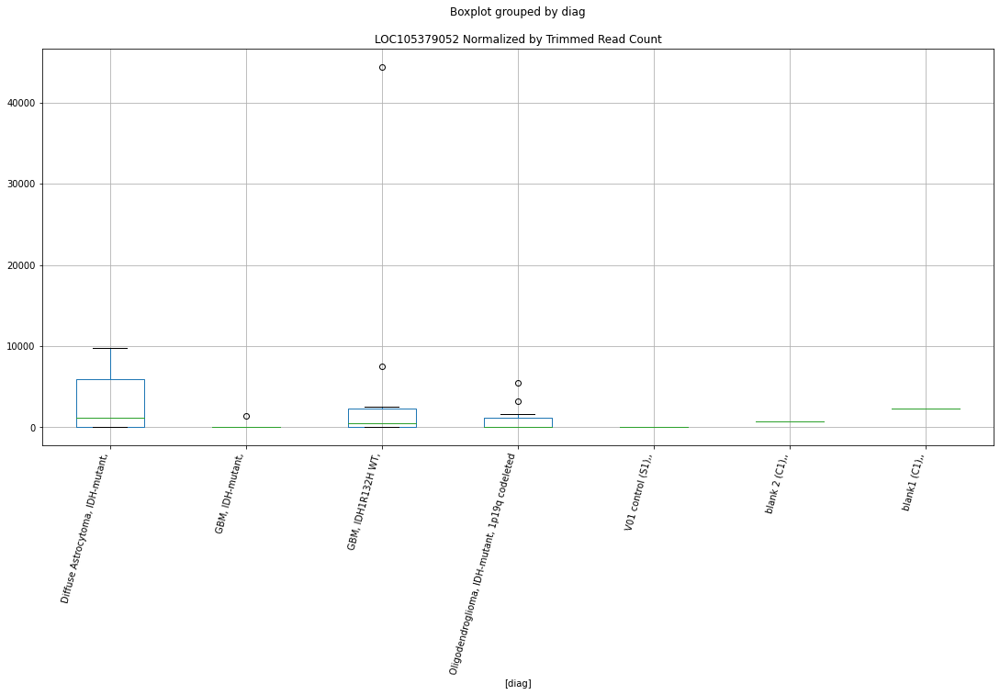

 p : 0.025408423859918802  ( t : 2.437152592122127 ) :  D-plex  :  bbduk2  :  LOC107984770
Control and blanks
73     2319.03
337     890.16
Name: LOC107984770, dtype: float64
205    37609.1
Name: LOC107984770, dtype: float64
469    11830.55
Name: LOC107984770, dtype: float64


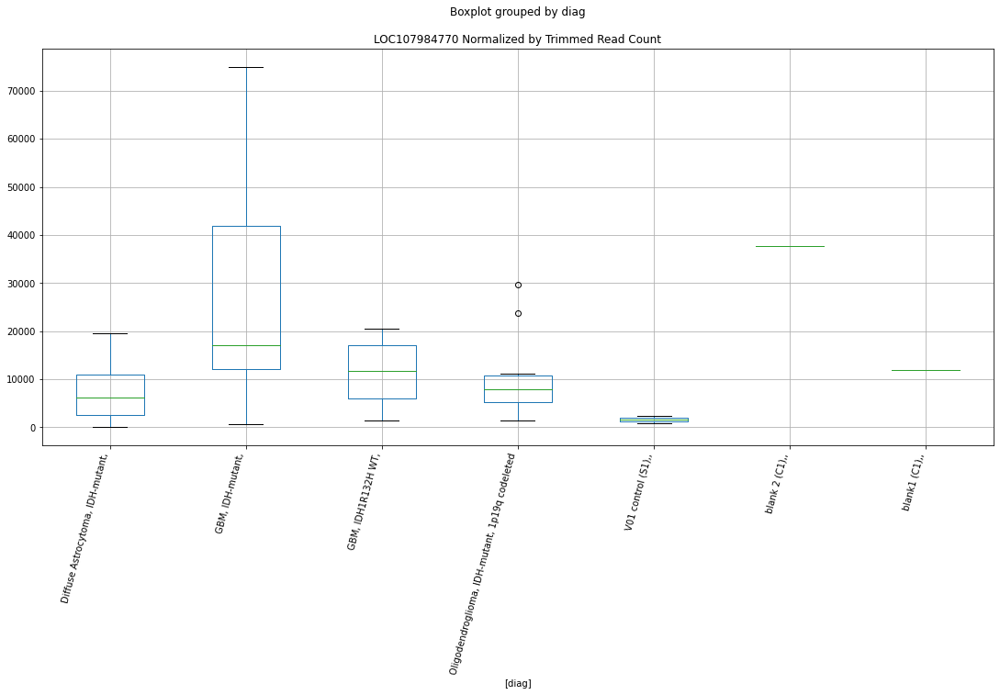

 p : 0.025519766014824162  ( t : 2.4350322854783943 ) :  D-plex  :  cutadapt2  :  LOC107984256
Control and blanks
76     0.0
340    0.0
Name: LOC107984256, dtype: float64
208    176.36
Name: LOC107984256, dtype: float64
472    577.96
Name: LOC107984256, dtype: float64


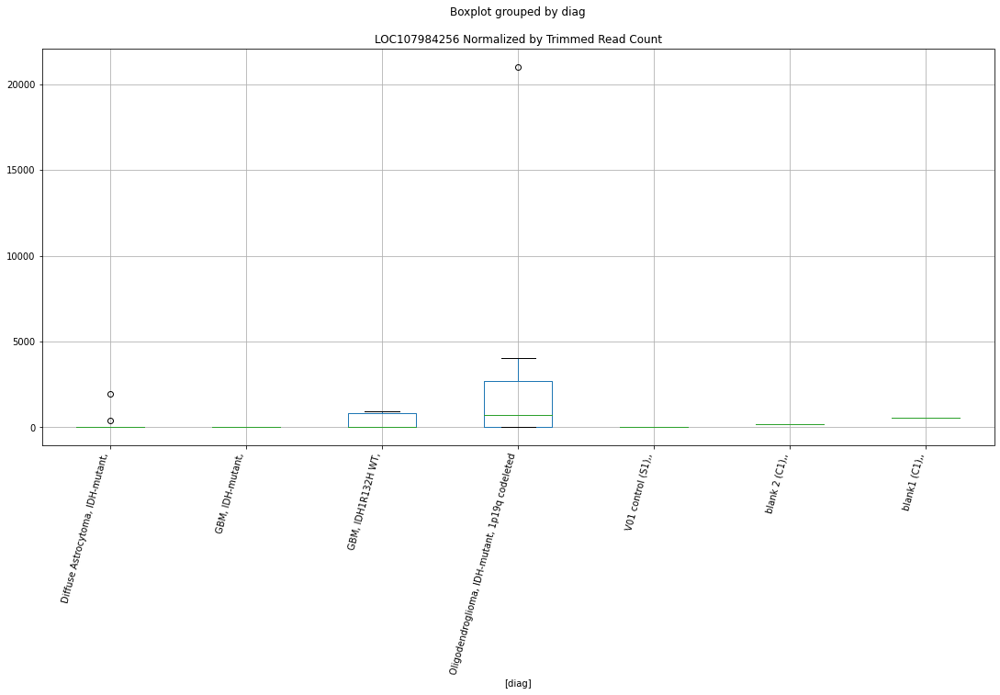

 p : 0.025633884532974112  ( t : 2.4328680905526343 ) :  D-plex  :  bbduk2  :  LOC105377508
Control and blanks
73     0.0
337    0.0
Name: LOC105377508, dtype: float64
205    358.18
Name: LOC105377508, dtype: float64
469    2366.11
Name: LOC105377508, dtype: float64


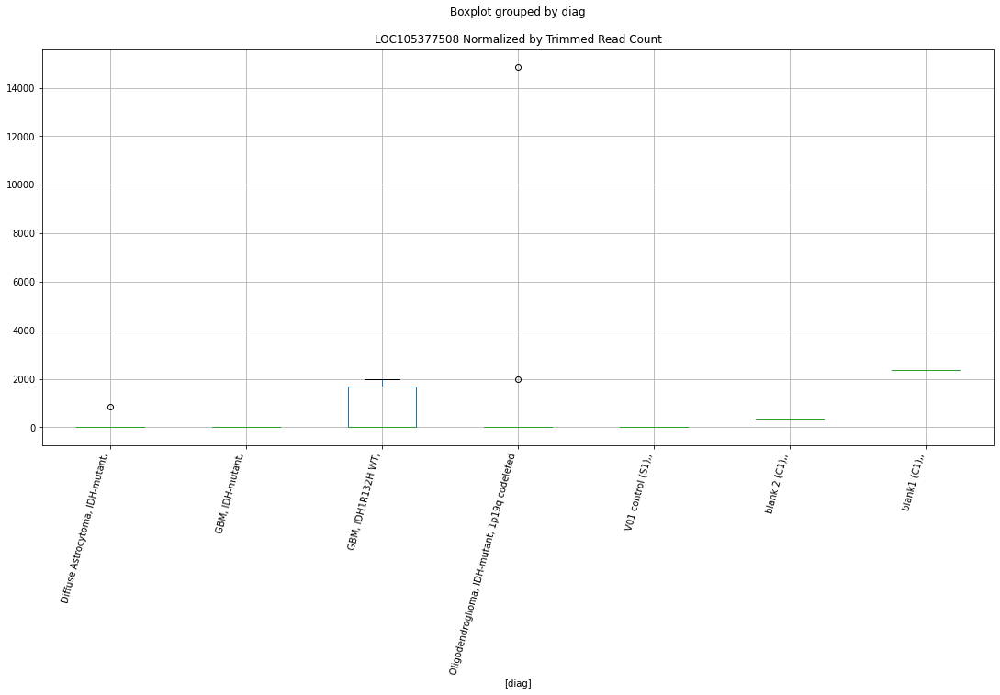

 p : 0.02577527281551536  ( t : 2.4301992330231164 ) :  D-plex  :  cutadapt2  :  LOC107984452
Control and blanks
76     0.0
340    0.0
Name: LOC107984452, dtype: float64
208    0.0
Name: LOC107984452, dtype: float64
472    577.96
Name: LOC107984452, dtype: float64


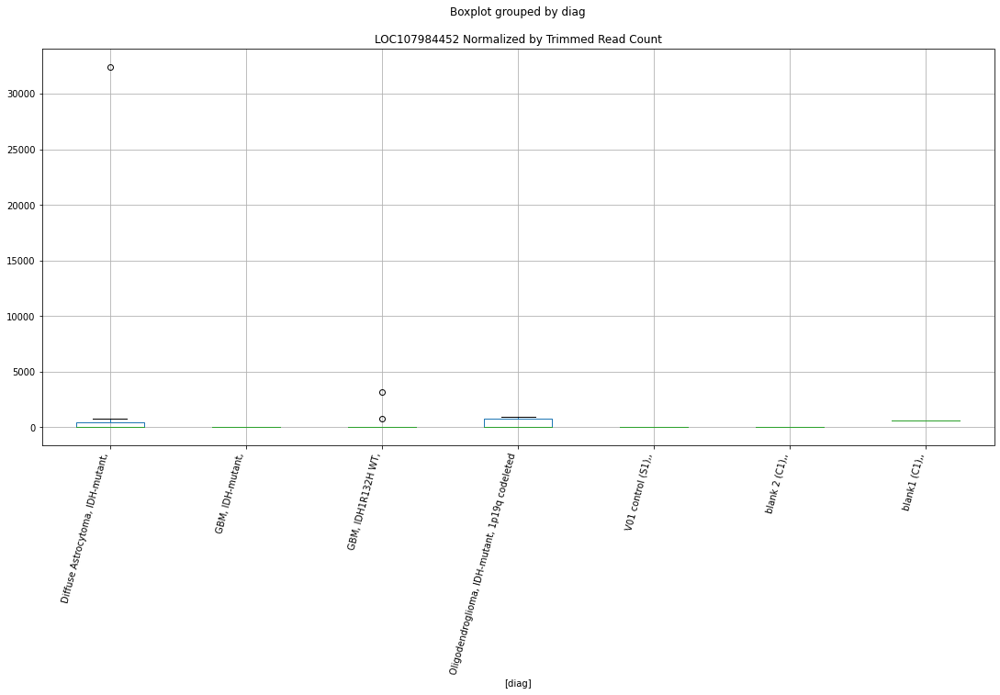

 p : 0.02589244864188189  ( t : 2.427997790244868 ) :  D-plex  :  cutadapt2  :  LOC105379420
Control and blanks
76     0.0
340    0.0
Name: LOC105379420, dtype: float64
208    4409.01
Name: LOC105379420, dtype: float64
472    5201.6
Name: LOC105379420, dtype: float64


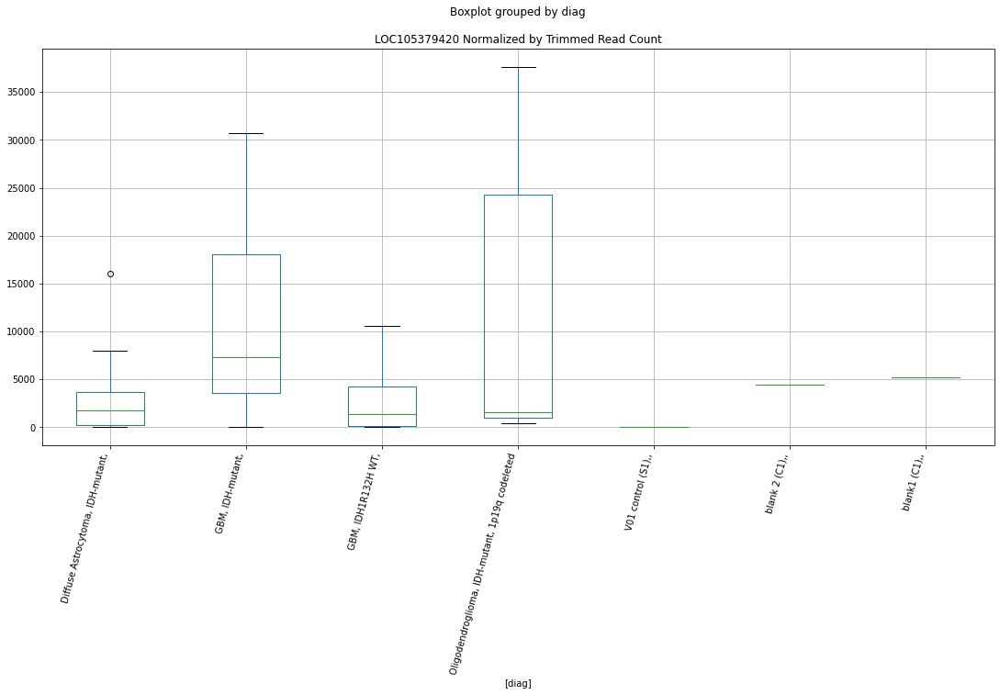

 p : 0.0259021863693102  ( t : 2.4278152629751335 ) :  Lexogen  :  bbduk2  :  LOC105375497
Control and blanks
79         0.00
343    14437.37
Name: LOC105375497, dtype: float64
211    2186.45
Name: LOC105375497, dtype: float64
475    2874.19
Name: LOC105375497, dtype: float64


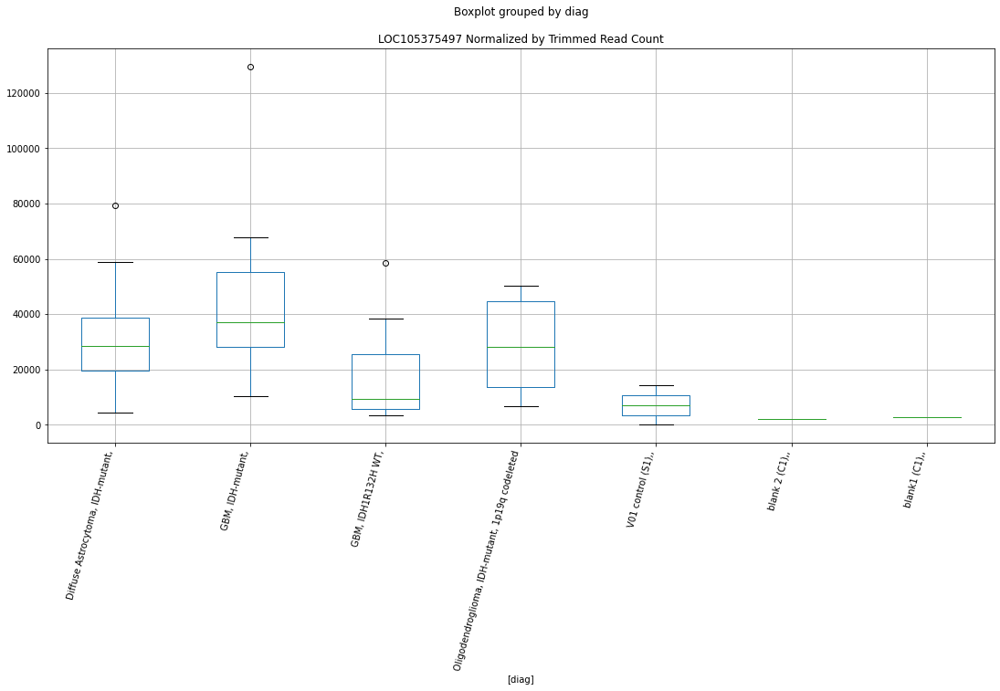

 p : 0.026113691379519764  ( t : 2.423866524697593 ) :  D-plex  :  cutadapt2  :  LOC105373819
Control and blanks
76     757.61
340    880.73
Name: LOC105373819, dtype: float64
208    0.0
Name: LOC105373819, dtype: float64
472    577.96
Name: LOC105373819, dtype: float64


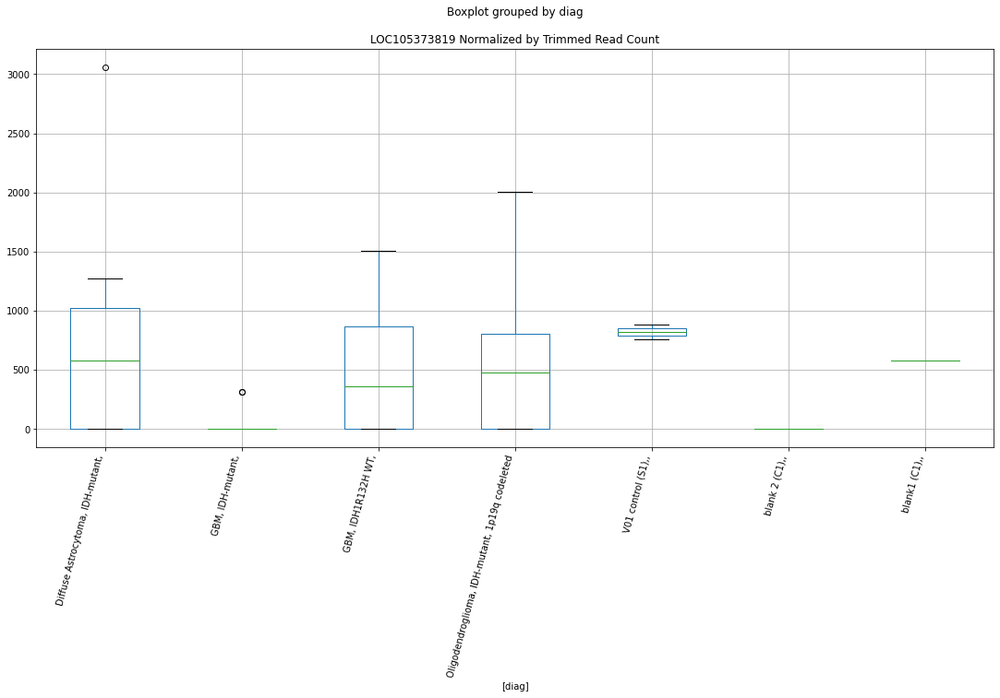

 p : 0.026276979727424776  ( t : 2.420838420621668 ) :  D-plex  :  cutadapt2  :  LOC105377043
Control and blanks
76         0.00
340    31706.36
Name: LOC105377043, dtype: float64
208    3527.2
Name: LOC105377043, dtype: float64
472    4623.65
Name: LOC105377043, dtype: float64


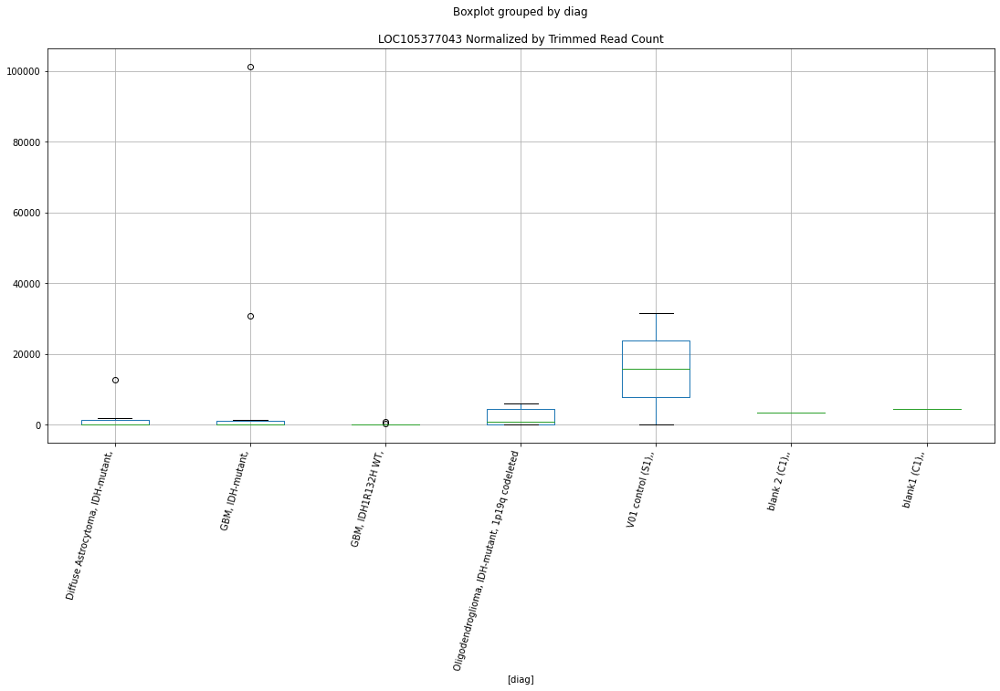

 p : 0.02632991689891156  ( t : 2.4198605086887364 ) :  D-plex  :  bbduk2  :  LOC105377567
Control and blanks
73      3092.03
337    24034.25
Name: LOC105377567, dtype: float64
205    40116.37
Name: LOC105377567, dtype: float64
469    13013.6
Name: LOC105377567, dtype: float64


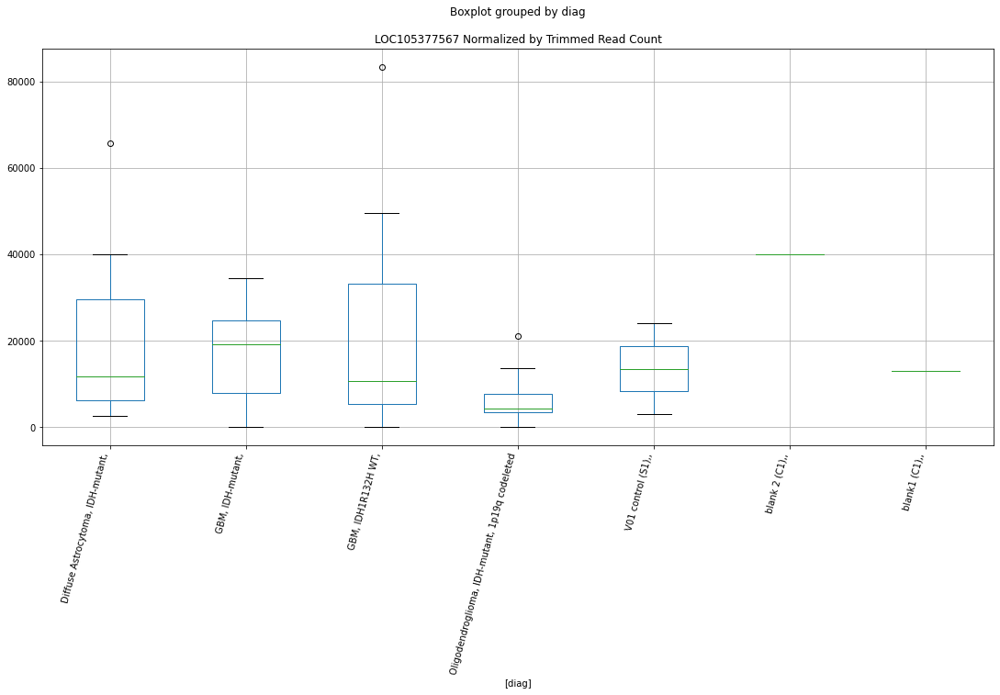

 p : 0.026396605719224836  ( t : 2.418631179269158 ) :  D-plex  :  bbduk2  :  LOC105373819
Control and blanks
73     773.01
337    890.16
Name: LOC105373819, dtype: float64
205    0.0
Name: LOC105373819, dtype: float64
469    591.53
Name: LOC105373819, dtype: float64


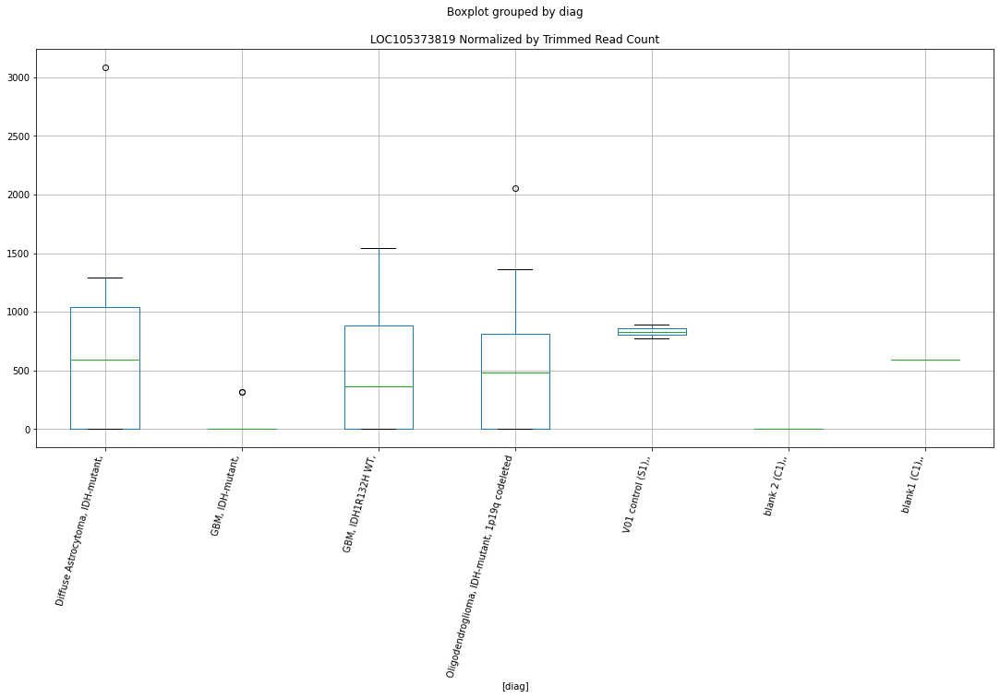

 p : 0.02663219251016192  ( t : 2.4143115761310616 ) :  Lexogen  :  cutadapt2  :  LOC105374535
Control and blanks
82     0.0
346    0.0
Name: LOC105374535, dtype: float64
214    0.0
Name: LOC105374535, dtype: float64
478    0.0
Name: LOC105374535, dtype: float64


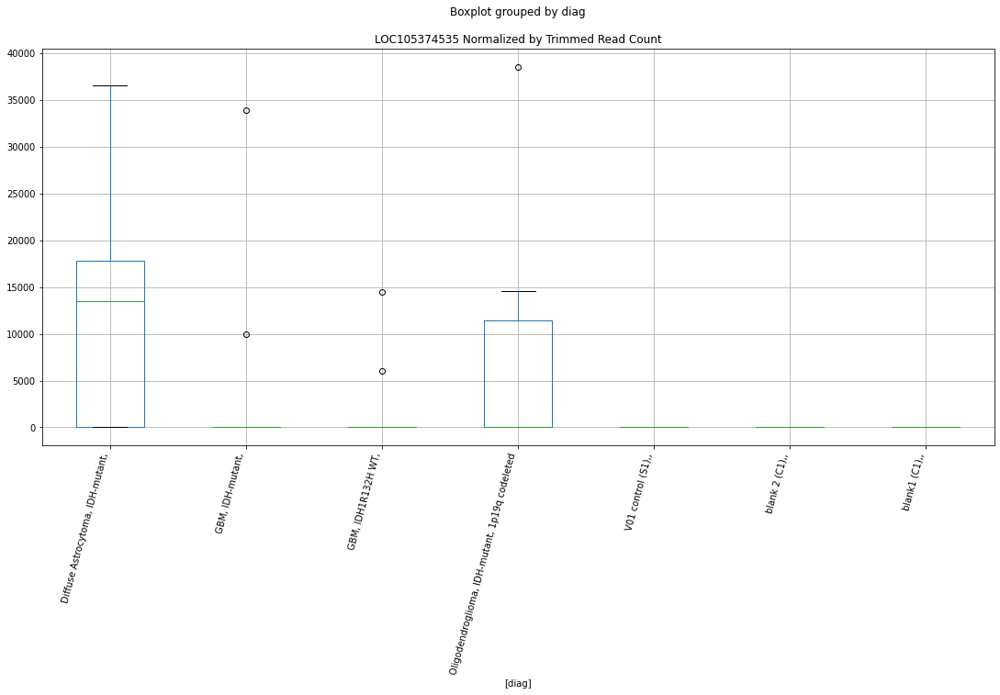

 p : 0.026642584673765783  ( t : 2.414121855482773 ) :  D-plex  :  bbduk2  :  LOC105378811
Control and blanks
73     0.0
337    0.0
Name: LOC105378811, dtype: float64
205    358.18
Name: LOC105378811, dtype: float64
469    0.0
Name: LOC105378811, dtype: float64


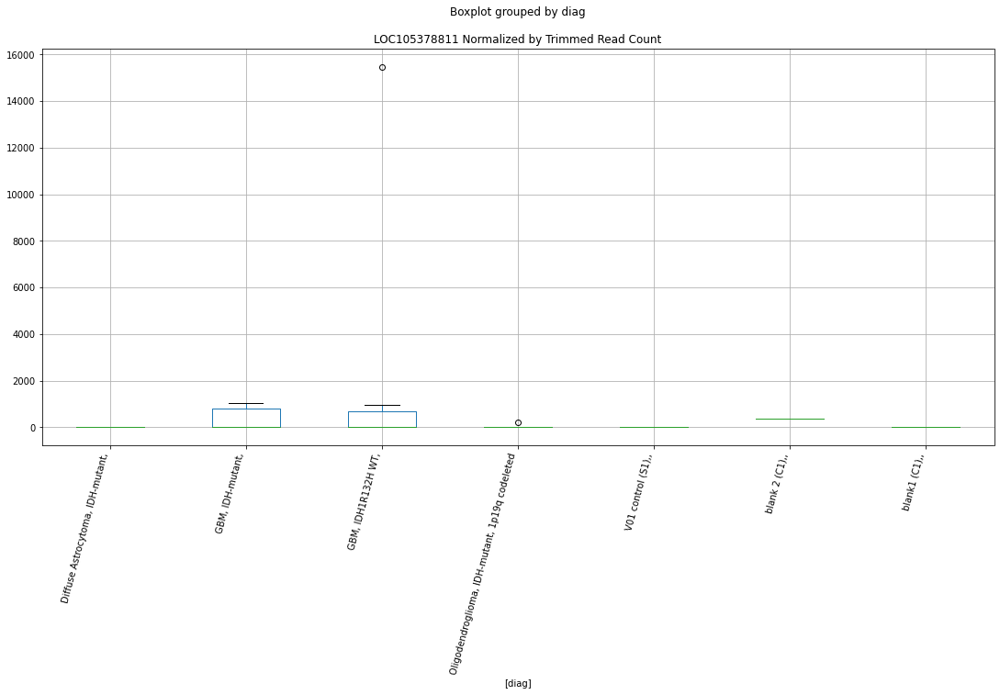

 p : 0.02670208453383738  ( t : 2.4130369504384896 ) :  Lexogen  :  bbduk2  :  LOC105374535
Control and blanks
79     0.0
343    0.0
Name: LOC105374535, dtype: float64
211    0.0
Name: LOC105374535, dtype: float64
475    0.0
Name: LOC105374535, dtype: float64


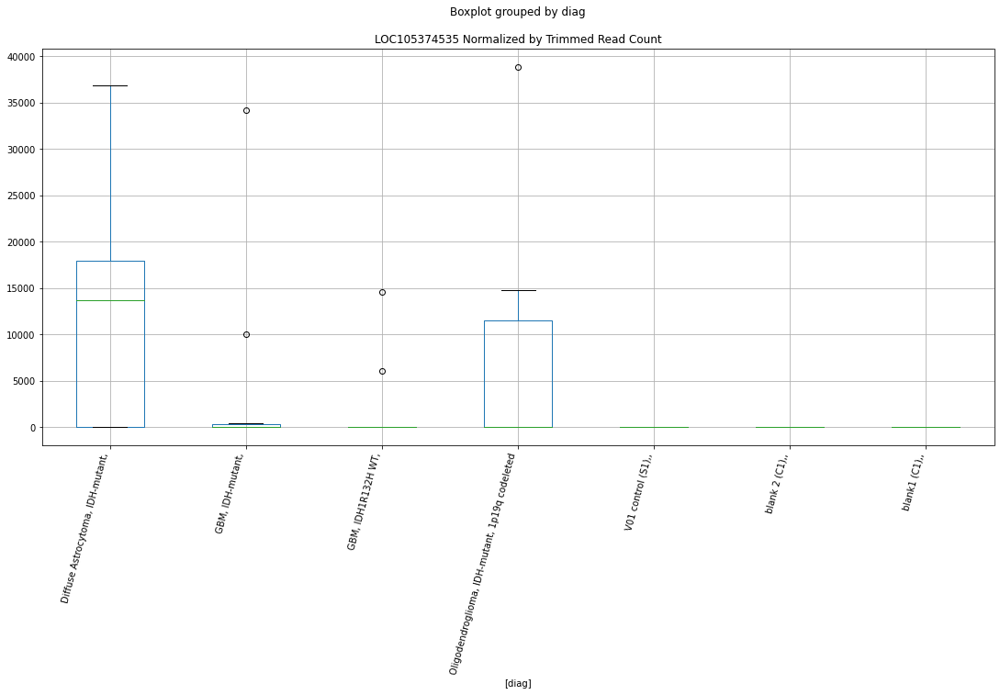

 p : 0.026722893846237997  ( t : 2.4126580528693045 ) :  D-plex  :  bbduk2  :  LOC105374140
Control and blanks
73     9276.1
337       0.0
Name: LOC105374140, dtype: float64
205    4298.18
Name: LOC105374140, dtype: float64
469    9464.44
Name: LOC105374140, dtype: float64


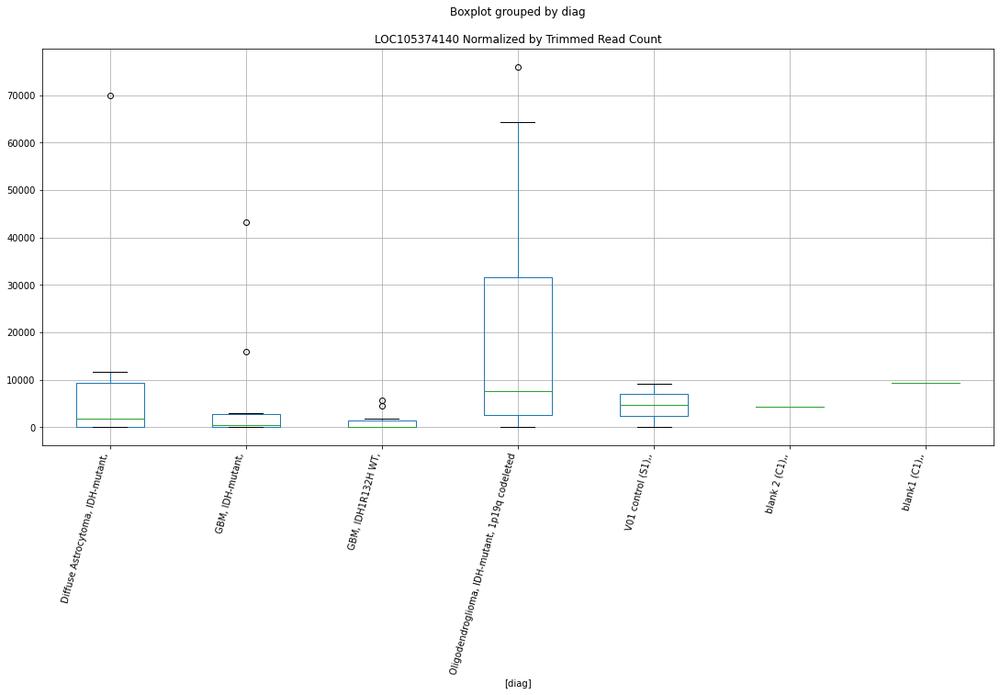

 p : 0.026729013890930076  ( t : 2.412546671176881 ) :  D-plex  :  cutadapt2  :  LOC105379087
Control and blanks
76     0.0
340    0.0
Name: LOC105379087, dtype: float64
208    3350.84
Name: LOC105379087, dtype: float64
472    1733.87
Name: LOC105379087, dtype: float64


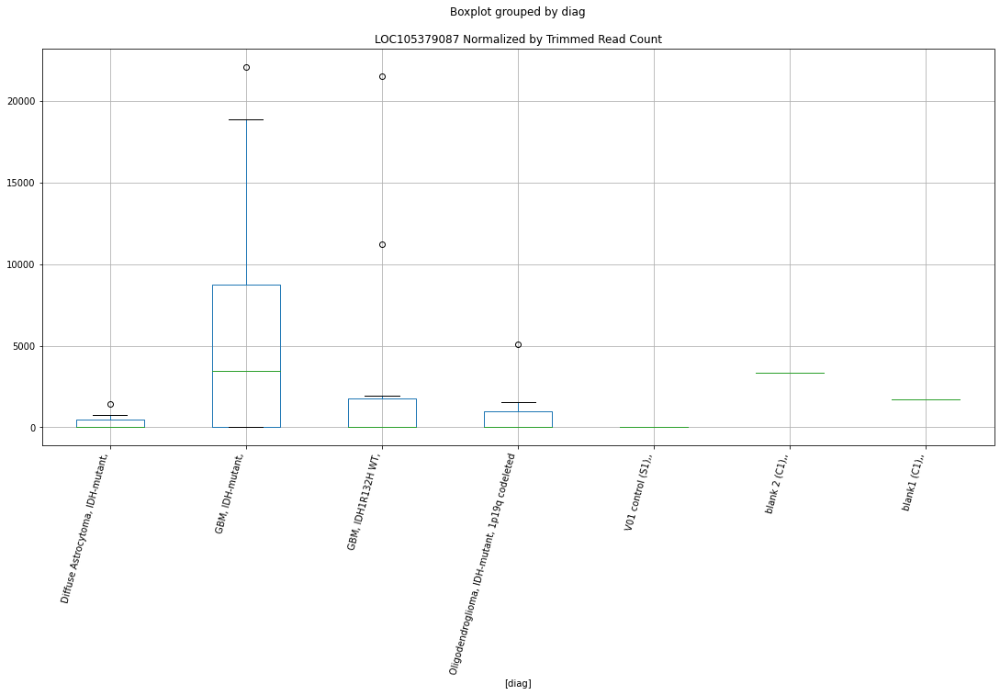

 p : 0.02705920378714157  ( t : 2.4065724853651767 ) :  D-plex  :  cutadapt2  :  LOC105379508
Control and blanks
76     60609.14
340     3522.93
Name: LOC105379508, dtype: float64
208    7054.41
Name: LOC105379508, dtype: float64
472    6357.51
Name: LOC105379508, dtype: float64


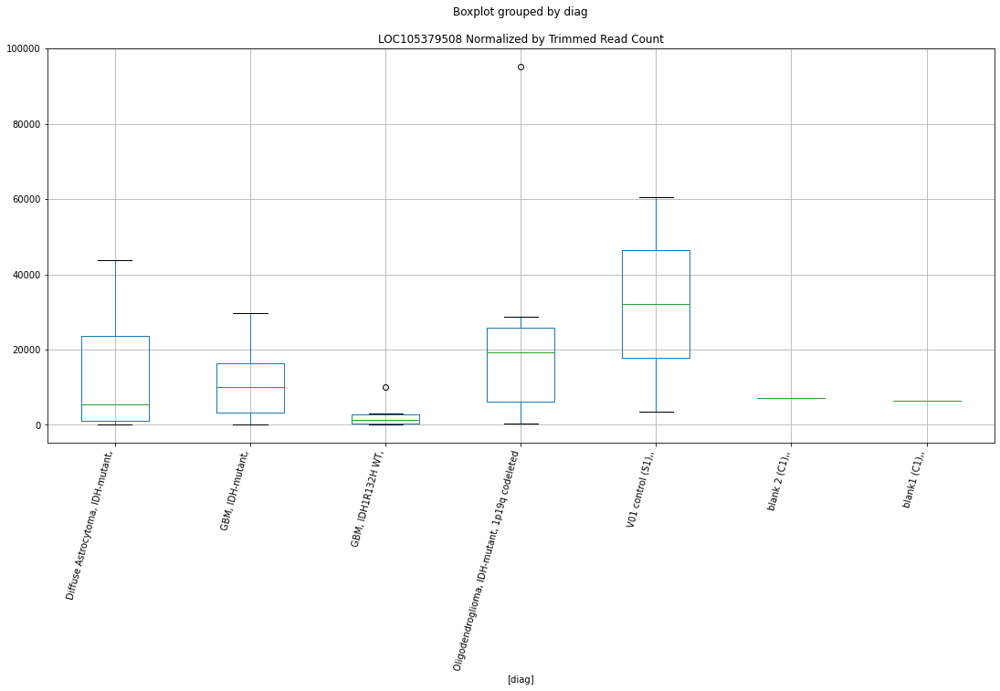

 p : 0.02705920378714157  ( t : 2.4065724853651767 ) :  D-plex  :  cutadapt2  :  LOC105379506
Control and blanks
76     60609.14
340     3522.93
Name: LOC105379506, dtype: float64
208    7230.77
Name: LOC105379506, dtype: float64
472    6357.51
Name: LOC105379506, dtype: float64


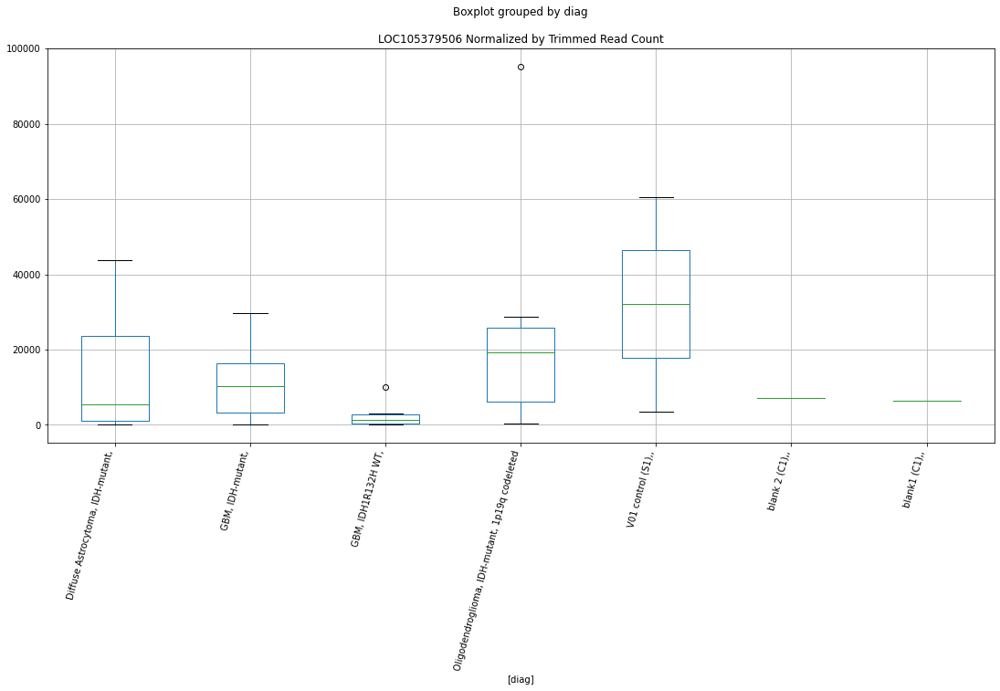

 p : 0.02705920378714157  ( t : 2.4065724853651767 ) :  D-plex  :  cutadapt2  :  LOC105379507
Control and blanks
76     60609.14
340     3522.93
Name: LOC105379507, dtype: float64
208    7230.77
Name: LOC105379507, dtype: float64
472    6357.51
Name: LOC105379507, dtype: float64


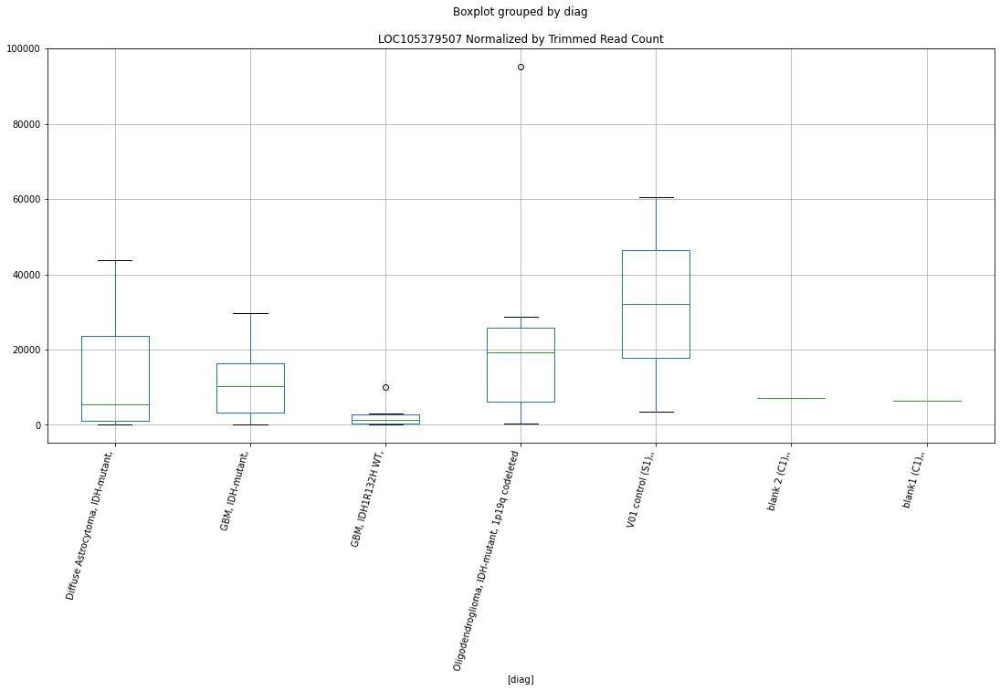

 p : 0.02733235837762832  ( t : 2.401681577013267 ) :  Lexogen  :  bbduk2  :  LOC105375855
Control and blanks
79     0.0
343    0.0
Name: LOC105375855, dtype: float64
211    0.0
Name: LOC105375855, dtype: float64
475    0.0
Name: LOC105375855, dtype: float64


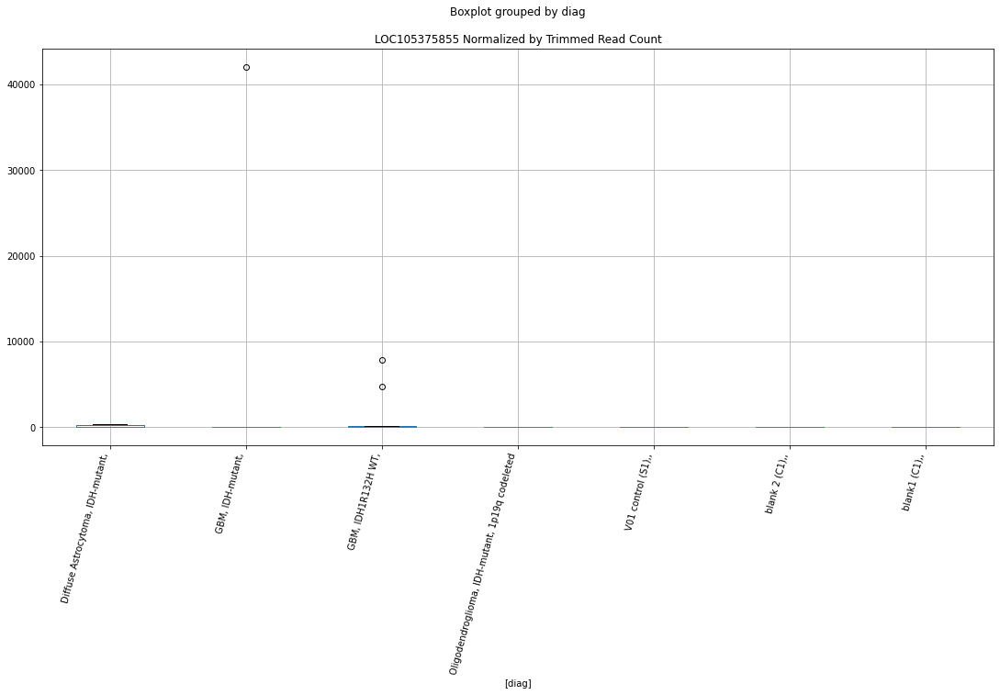

 p : 0.027458478537988117  ( t : 2.3994387684444427 ) :  D-plex  :  bbduk2  :  LOC105375809
Control and blanks
73     0.0
337    0.0
Name: LOC105375809, dtype: float64
205    179.09
Name: LOC105375809, dtype: float64
469    591.53
Name: LOC105375809, dtype: float64


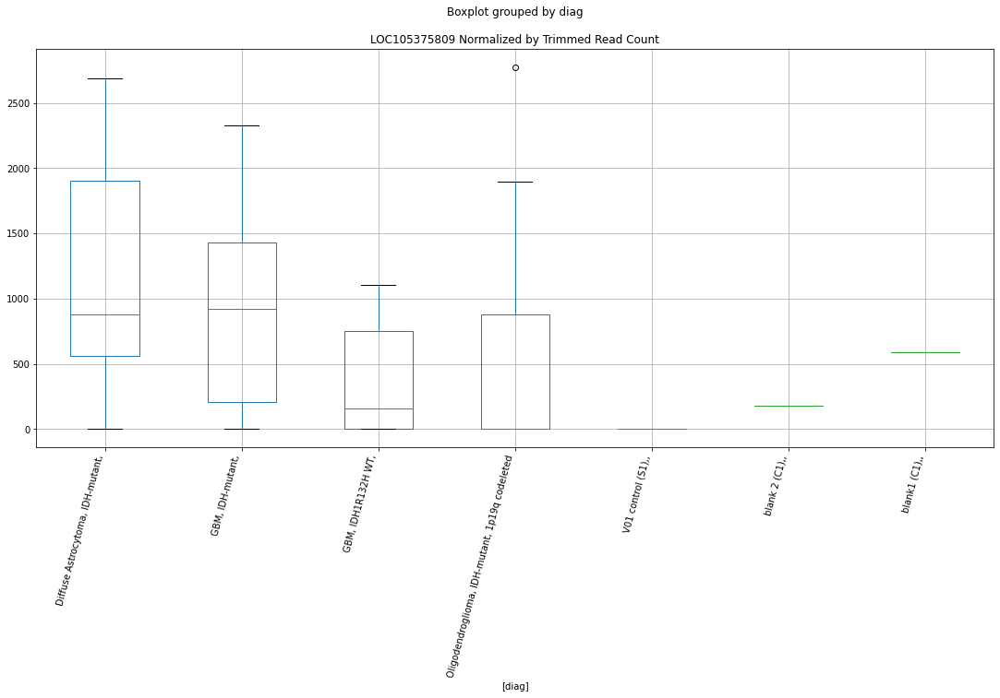

 p : 0.027628775546472504  ( t : 2.3964255930636607 ) :  D-plex  :  bbduk2  :  LOC107985079
Control and blanks
73     0.0
337    0.0
Name: LOC107985079, dtype: float64
205    1611.82
Name: LOC107985079, dtype: float64
469    3549.16
Name: LOC107985079, dtype: float64


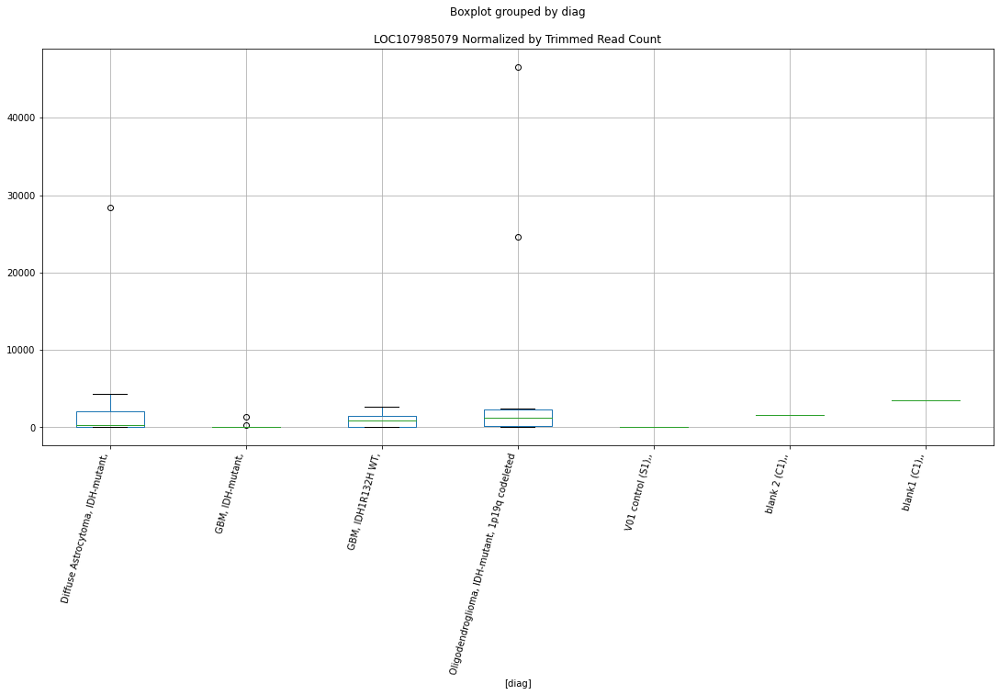

 p : 0.02790770544288972  ( t : 2.3915276075967737 ) :  D-plex  :  cutadapt2  :  LOC105376314
Control and blanks
76      757.61
340    1761.46
Name: LOC105376314, dtype: float64
208    2116.32
Name: LOC105376314, dtype: float64
472    2889.78
Name: LOC105376314, dtype: float64


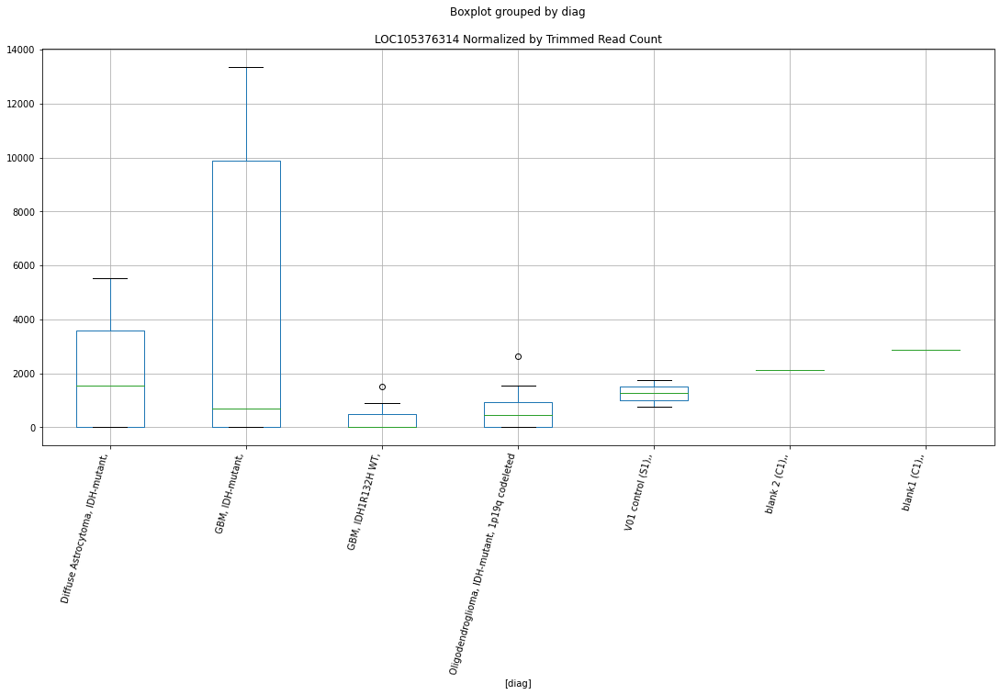

 p : 0.027950525083895554  ( t : 2.3907797520686502 ) :  Lexogen  :  bbduk2  :  LOC105375642
Control and blanks
79     0.0
343    0.0
Name: LOC105375642, dtype: float64
211    0.0
Name: LOC105375642, dtype: float64
475    0.0
Name: LOC105375642, dtype: float64


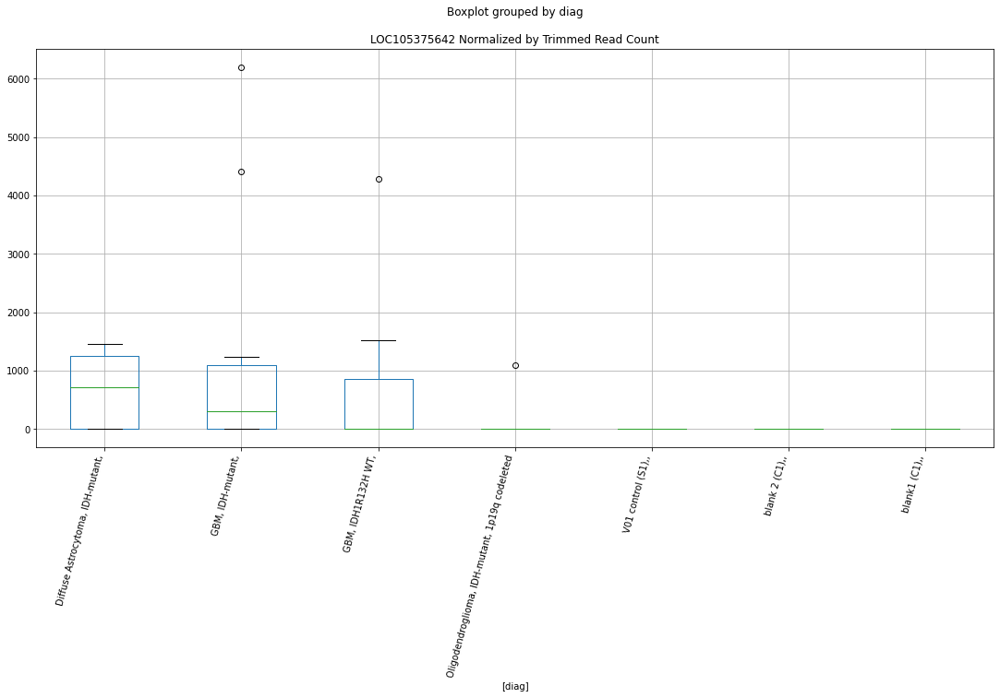

 p : 0.02821592086601681  ( t : 2.3861682871755554 ) :  D-plex  :  cutadapt2  :  LOC105376201
Control and blanks
76     0.0
340    0.0
Name: LOC105376201, dtype: float64
208    1587.24
Name: LOC105376201, dtype: float64
472    1733.87
Name: LOC105376201, dtype: float64


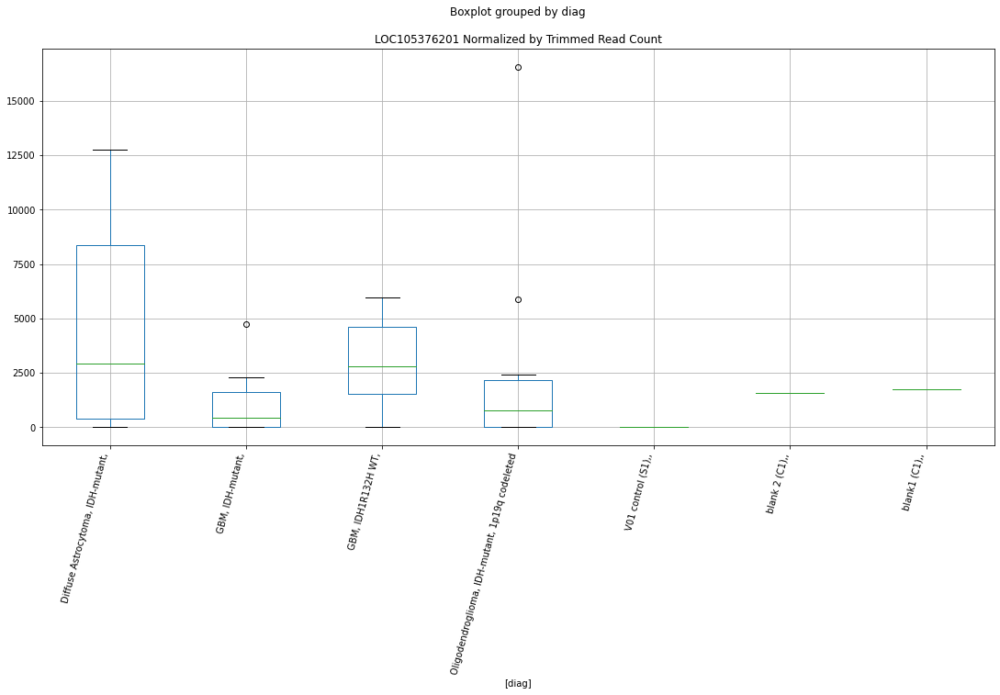

 p : 0.028300172232230417  ( t : 2.3847128223722636 ) :  D-plex  :  cutadapt2  :  LOC105376454
Control and blanks
76     0.0
340    0.0
Name: LOC105376454, dtype: float64
208    2116.32
Name: LOC105376454, dtype: float64
472    0.0
Name: LOC105376454, dtype: float64


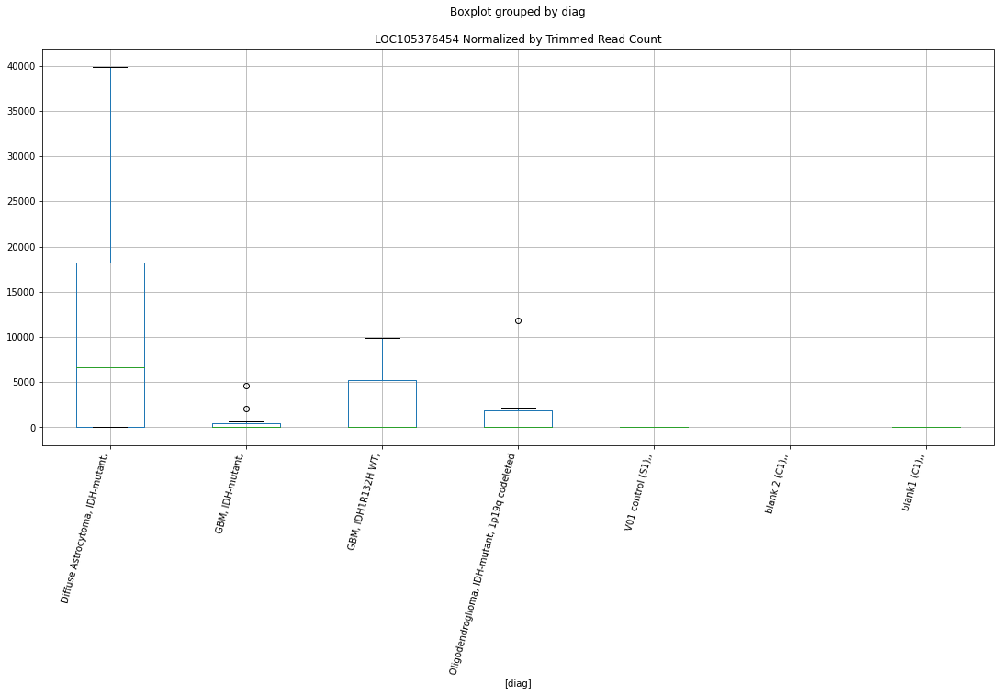

 p : 0.02835697337293238  ( t : 2.383733849496495 ) :  D-plex  :  bbduk2  :  LOC105374287
Control and blanks
73     0.0
337    0.0
Name: LOC105374287, dtype: float64
205    537.27
Name: LOC105374287, dtype: float64
469    1183.05
Name: LOC105374287, dtype: float64


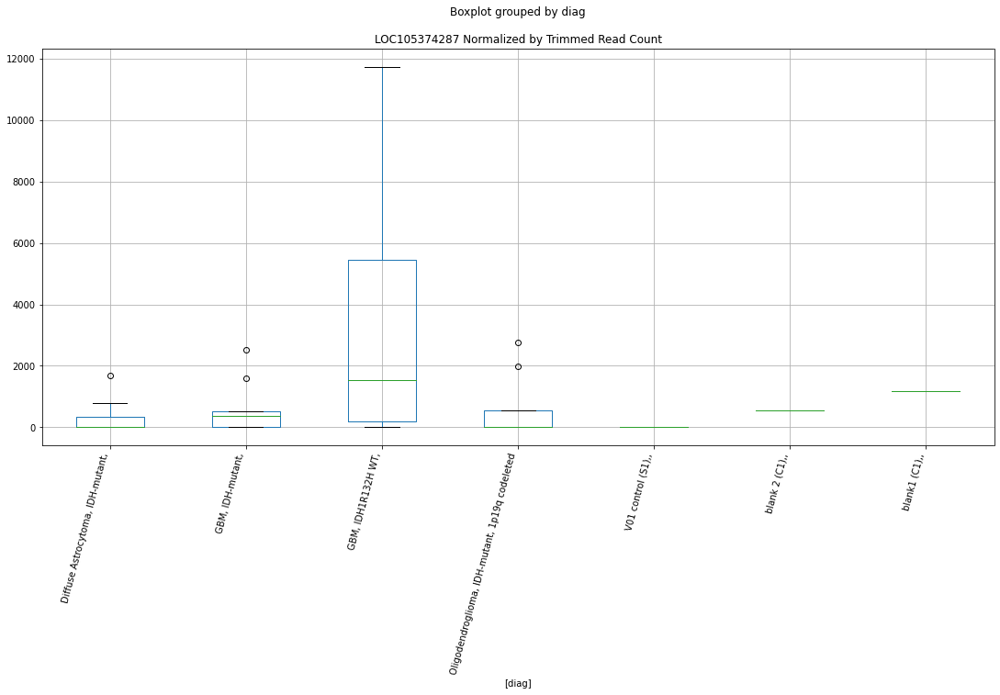

 p : 0.028371491889719425  ( t : 2.383483915380671 ) :  D-plex  :  bbduk2  :  LOC105372146
Control and blanks
73     0.0
337    0.0
Name: LOC105372146, dtype: float64
205    358.18
Name: LOC105372146, dtype: float64
469    0.0
Name: LOC105372146, dtype: float64


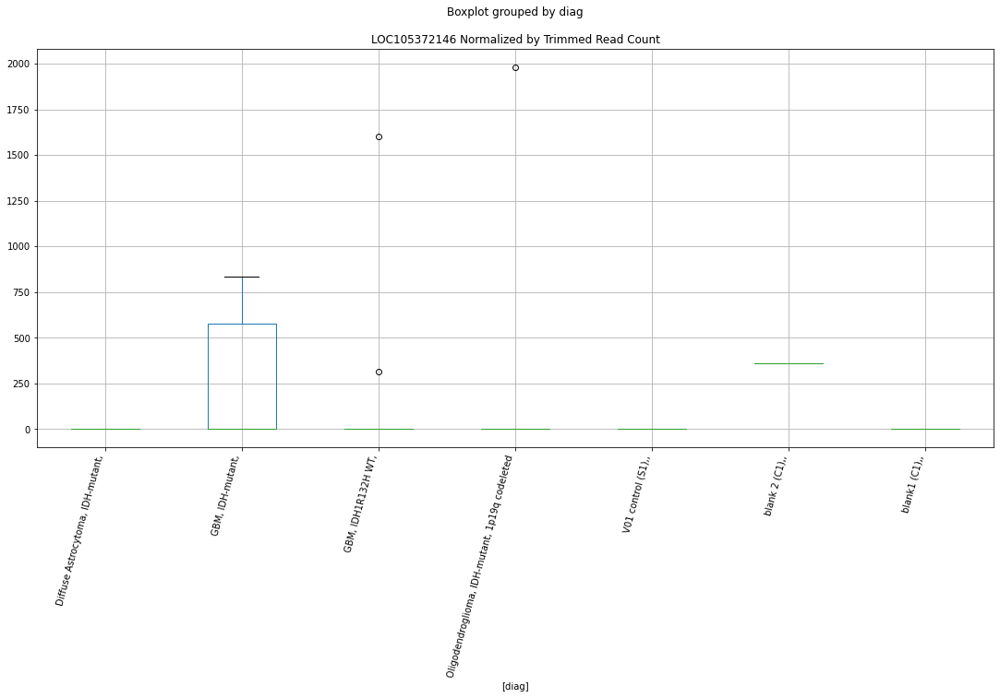

 p : 0.028374096448540283  ( t : 2.383439090921262 ) :  D-plex  :  cutadapt2  :  LOC107985541
Control and blanks
76     0.0
340    0.0
Name: LOC107985541, dtype: float64
208    1763.6
Name: LOC107985541, dtype: float64
472    1155.91
Name: LOC107985541, dtype: float64


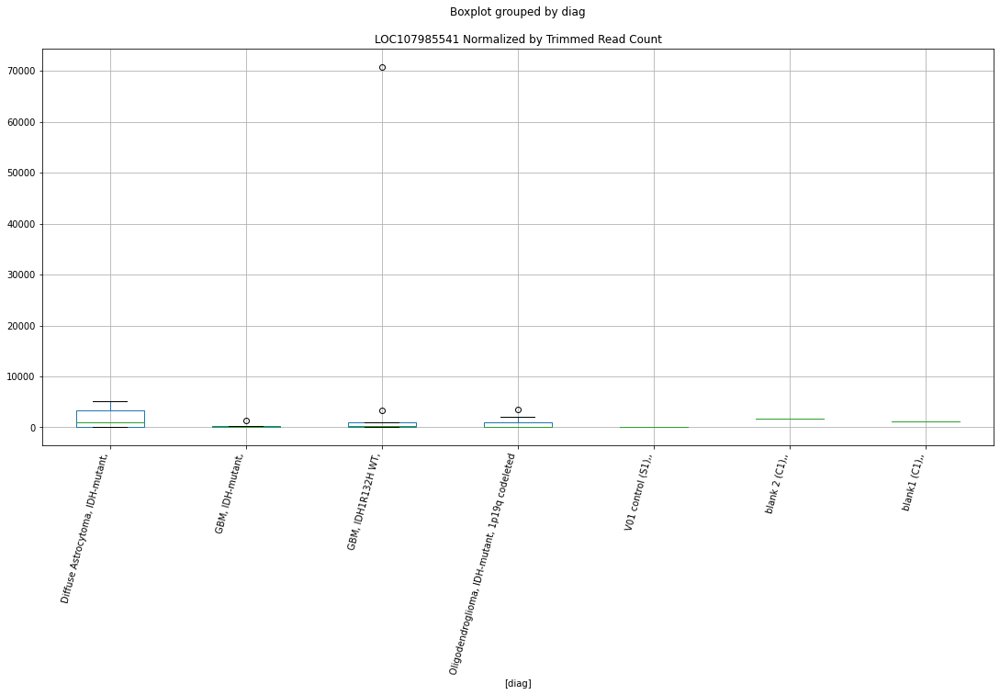

 p : 0.028396243315885784  ( t : 2.3830580984735823 ) :  Lexogen  :  cutadapt2  :  LOC105372606
Control and blanks
82     0.0
346    0.0
Name: LOC105372606, dtype: float64
214    0.0
Name: LOC105372606, dtype: float64
478    0.0
Name: LOC105372606, dtype: float64


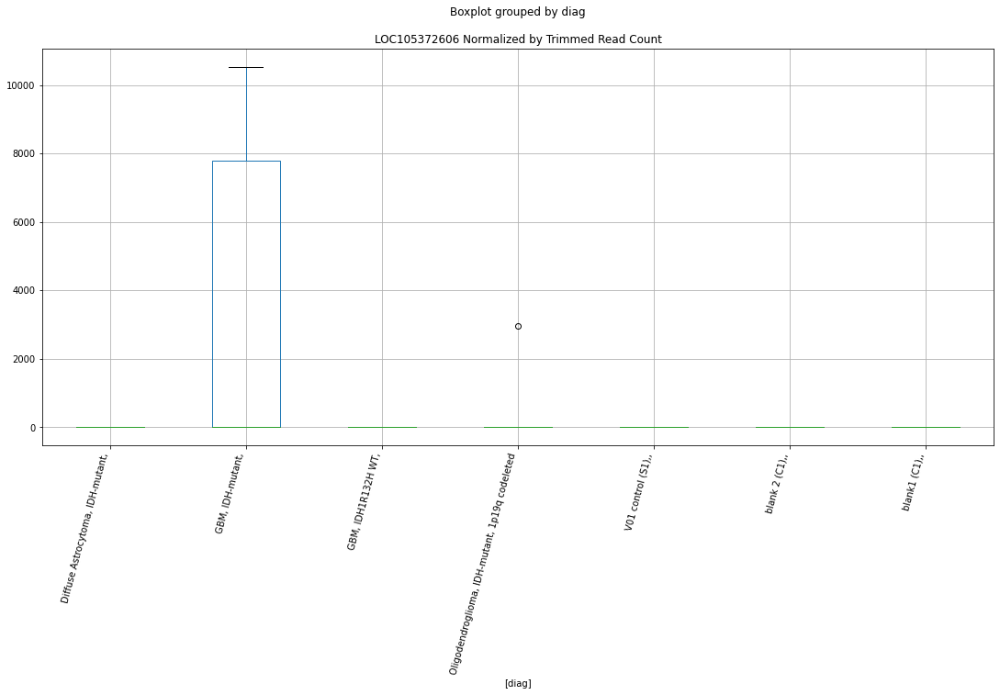

 p : 0.02844772572608621  ( t : 2.382173517860069 ) :  D-plex  :  cutadapt2  :  LOC105374287
Control and blanks
76     0.0
340    0.0
Name: LOC105374287, dtype: float64
208    529.08
Name: LOC105374287, dtype: float64
472    1155.91
Name: LOC105374287, dtype: float64


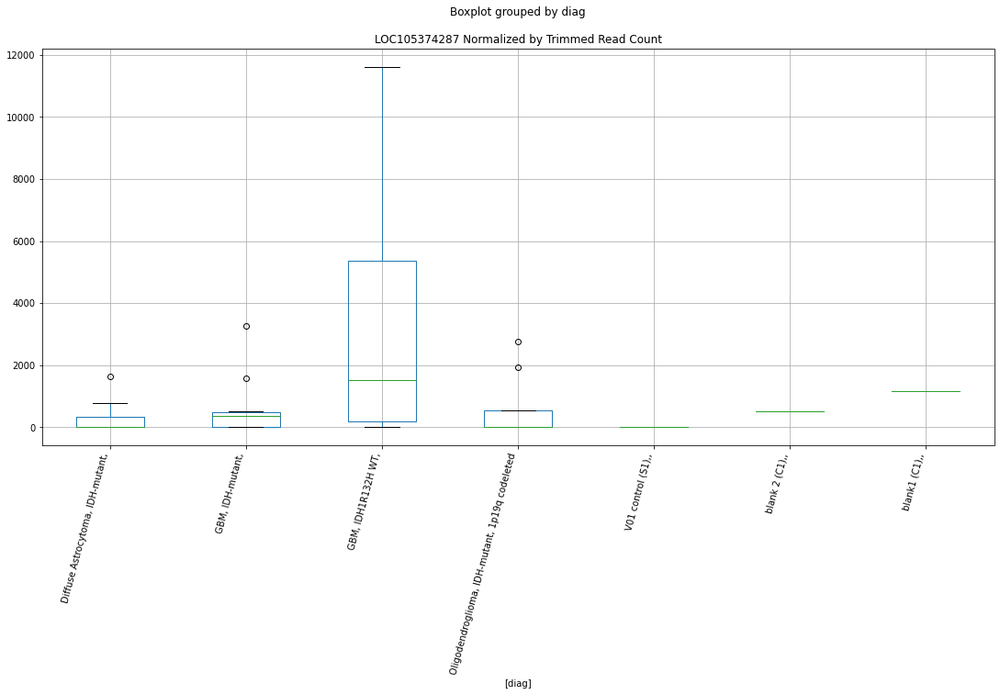

 p : 0.028461145272550198  ( t : 2.381943186238556 ) :  Lexogen  :  bbduk2  :  LOC105372606
Control and blanks
79     0.0
343    0.0
Name: LOC105372606, dtype: float64
211    0.0
Name: LOC105372606, dtype: float64
475    0.0
Name: LOC105372606, dtype: float64


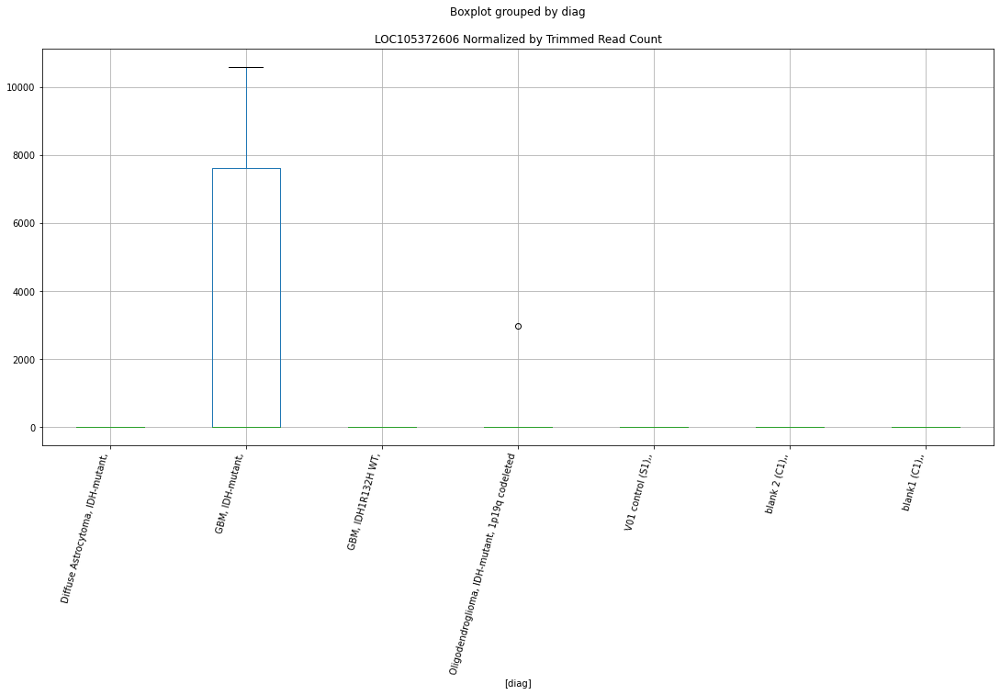

 p : 0.0286477086864204  ( t : 2.378751491915183 ) :  D-plex  :  cutadapt2  :  LOC105377567
Control and blanks
76      3030.46
340    23779.77
Name: LOC105377567, dtype: float64
208    39504.69
Name: LOC105377567, dtype: float64
472    10981.16
Name: LOC105377567, dtype: float64


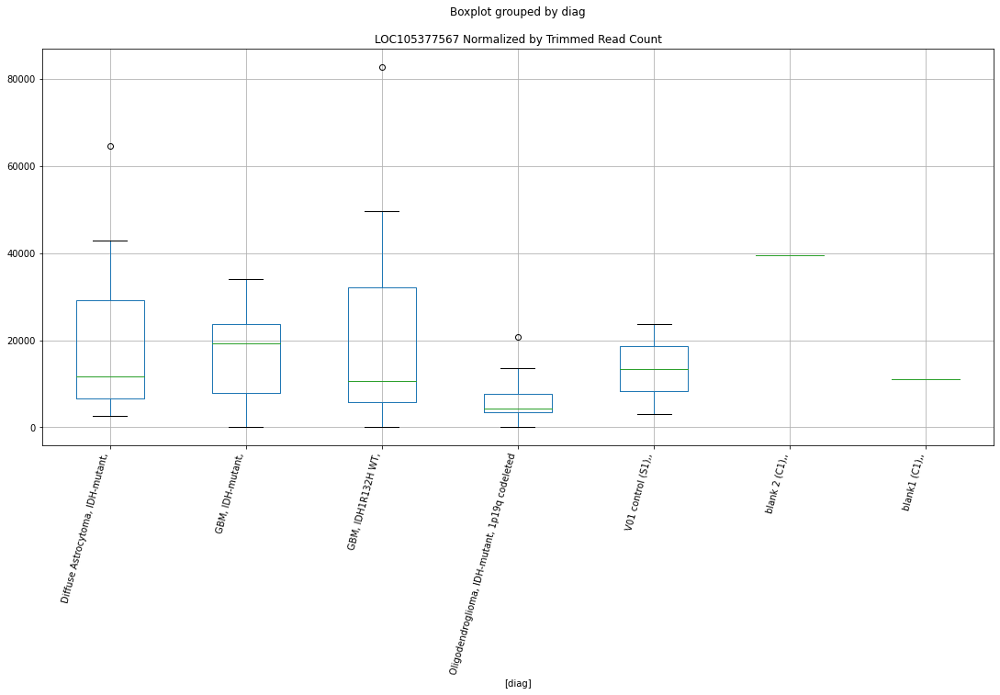

 p : 0.028767178212872023  ( t : 2.3767178029948974 ) :  D-plex  :  cutadapt2  :  LOC105372528
Control and blanks
76     0.0
340    0.0
Name: LOC105372528, dtype: float64
208    176.36
Name: LOC105372528, dtype: float64
472    1155.91
Name: LOC105372528, dtype: float64


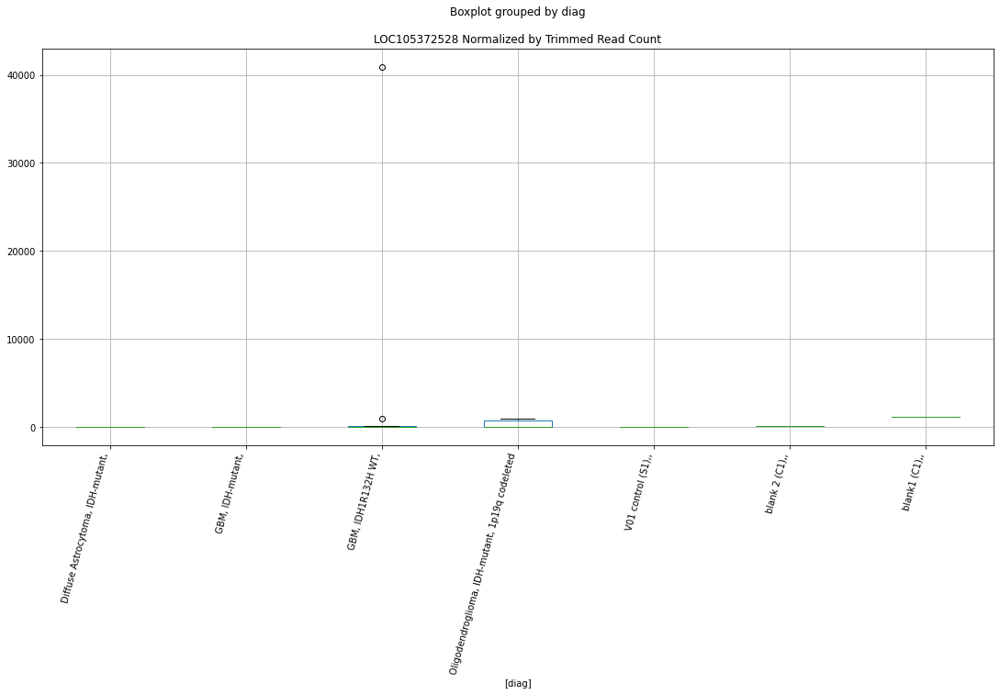

 p : 0.028849468552228356  ( t : 2.375321582154795 ) :  D-plex  :  bbduk2  :  LOC105372528
Control and blanks
73     0.0
337    0.0
Name: LOC105372528, dtype: float64
205    179.09
Name: LOC105372528, dtype: float64
469    1183.05
Name: LOC105372528, dtype: float64


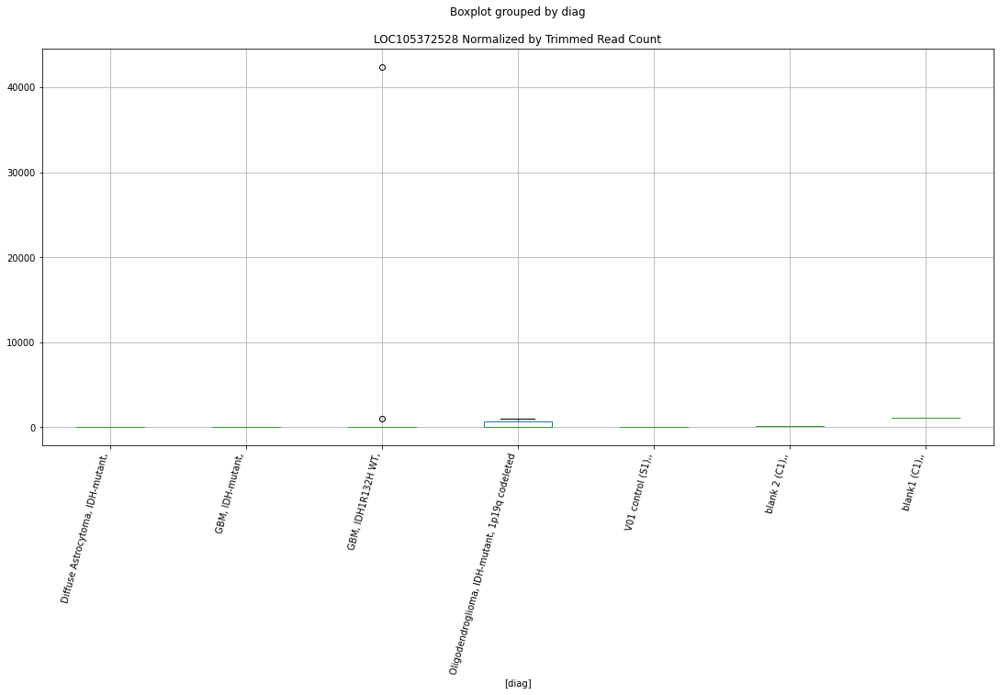

 p : 0.028869331576002383  ( t : 2.3749851229117853 ) :  D-plex  :  bbduk2  :  LOC105376454
Control and blanks
73     0.0
337    0.0
Name: LOC105376454, dtype: float64
205    2149.09
Name: LOC105376454, dtype: float64
469    0.0
Name: LOC105376454, dtype: float64


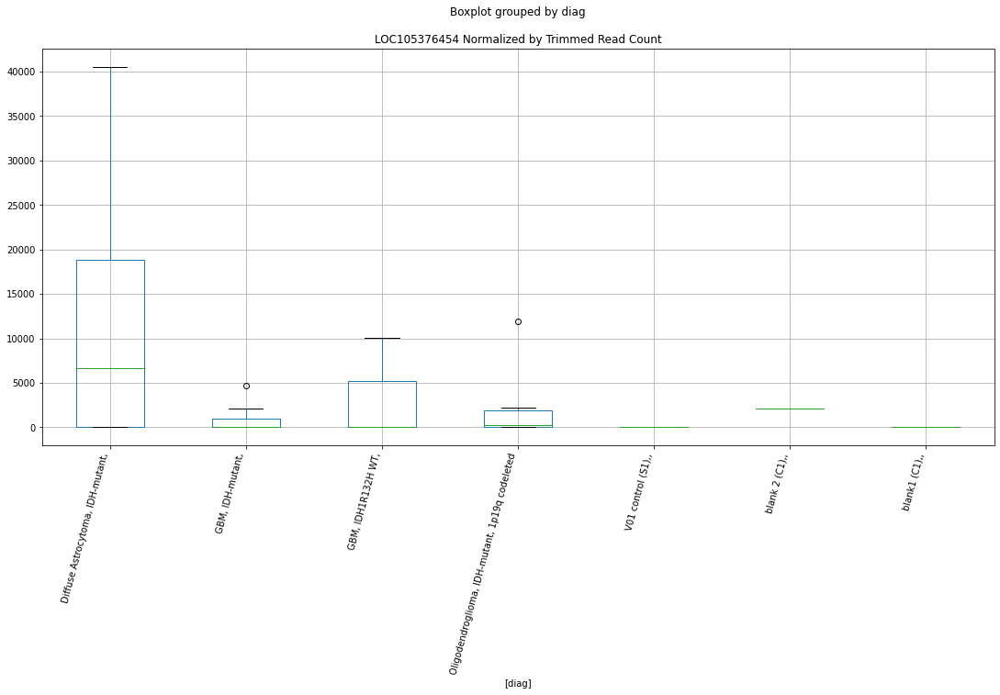

 p : 0.02886939403505199  ( t : 2.3749840652603087 ) :  D-plex  :  bbduk2  :  LOC105376314
Control and blanks
73        0.00
337    1780.31
Name: LOC105376314, dtype: float64
205    2149.09
Name: LOC105376314, dtype: float64
469    2957.64
Name: LOC105376314, dtype: float64


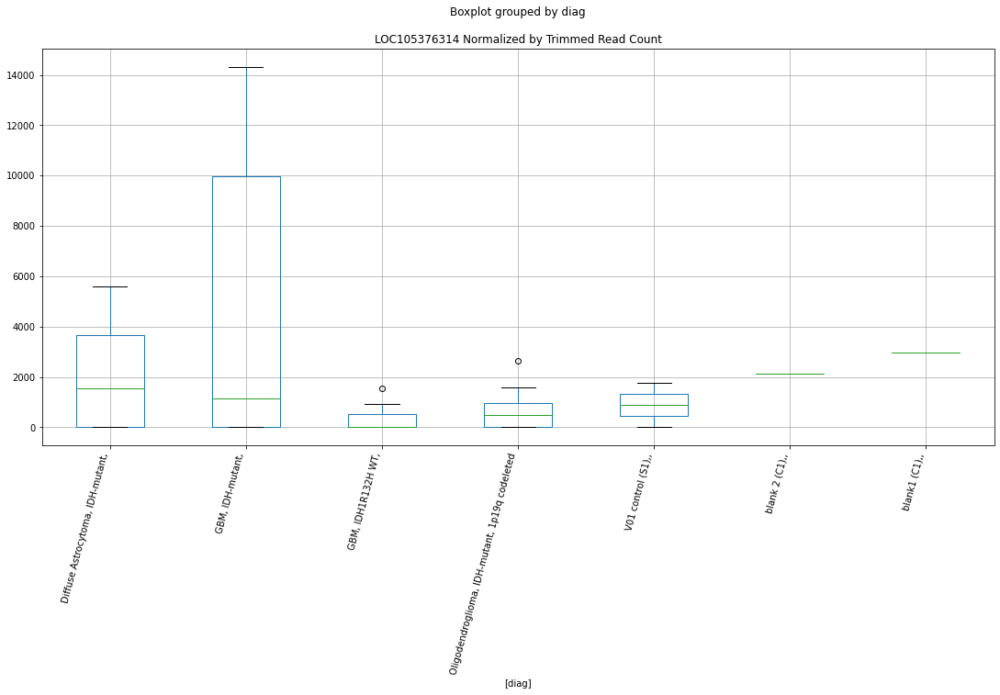

 p : 0.02905370235555269  ( t : 2.371872337477008 ) :  D-plex  :  bbduk2  :  LOC105377622
Control and blanks
73     0.0
337    0.0
Name: LOC105377622, dtype: float64
205    1074.55
Name: LOC105377622, dtype: float64
469    591.53
Name: LOC105377622, dtype: float64


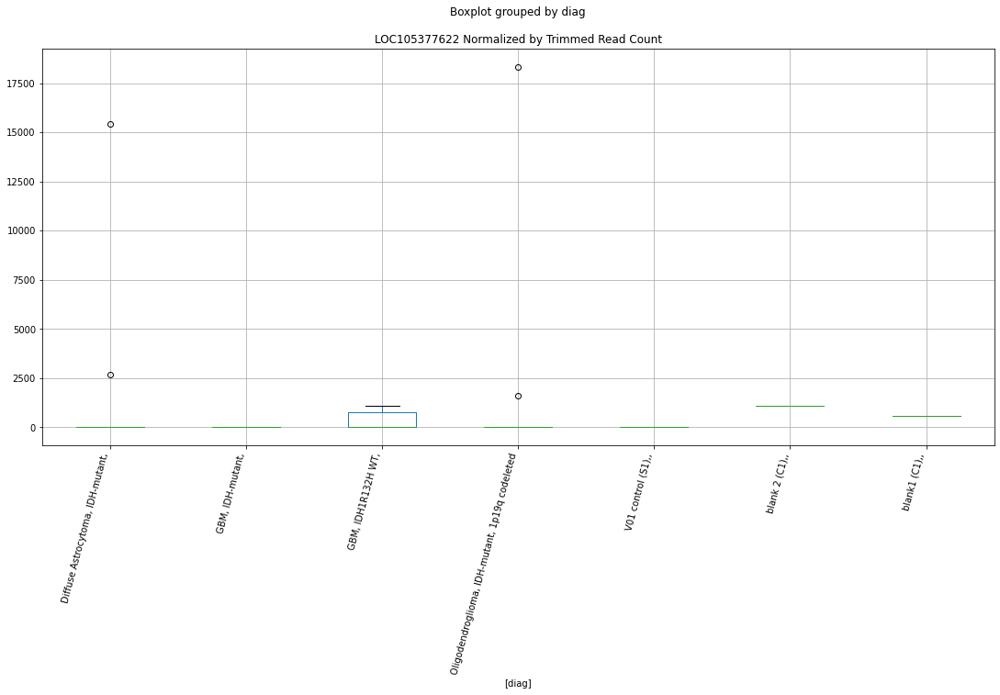

 p : 0.02926931498864042  ( t : 2.368255377536414 ) :  D-plex  :  bbduk2  :  LOC107984334
Control and blanks
73     0.0
337    0.0
Name: LOC107984334, dtype: float64
205    1790.91
Name: LOC107984334, dtype: float64
469    2957.64
Name: LOC107984334, dtype: float64


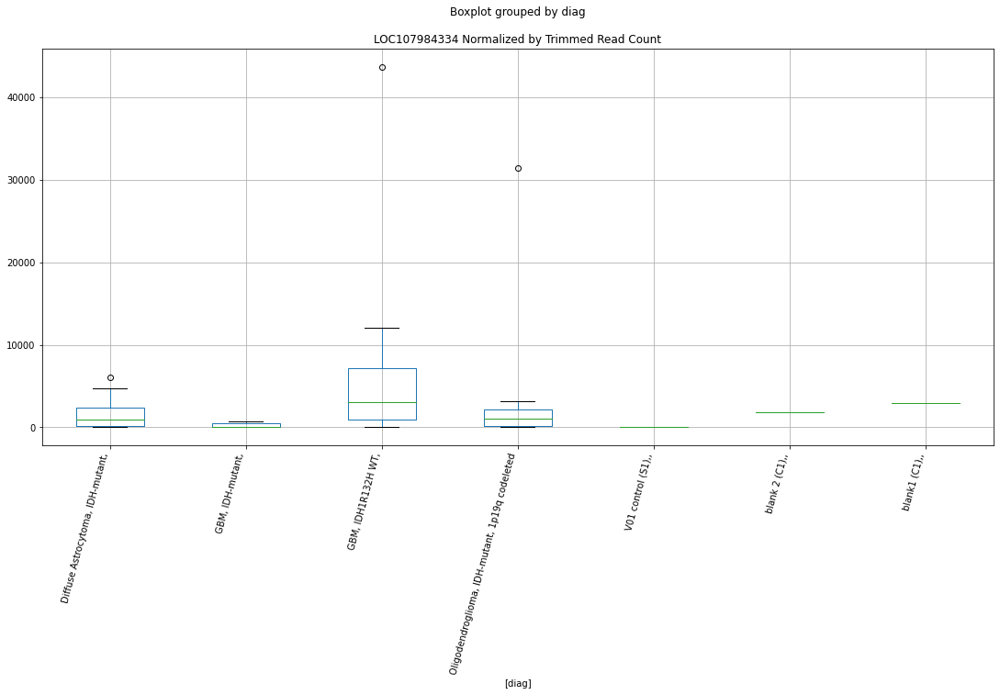

 p : 0.029770278340089537  ( t : 2.359946587816328 ) :  D-plex  :  bbduk2  :  LOC105372200
Control and blanks
73     0.0
337    0.0
Name: LOC105372200, dtype: float64
205    179.09
Name: LOC105372200, dtype: float64
469    0.0
Name: LOC105372200, dtype: float64


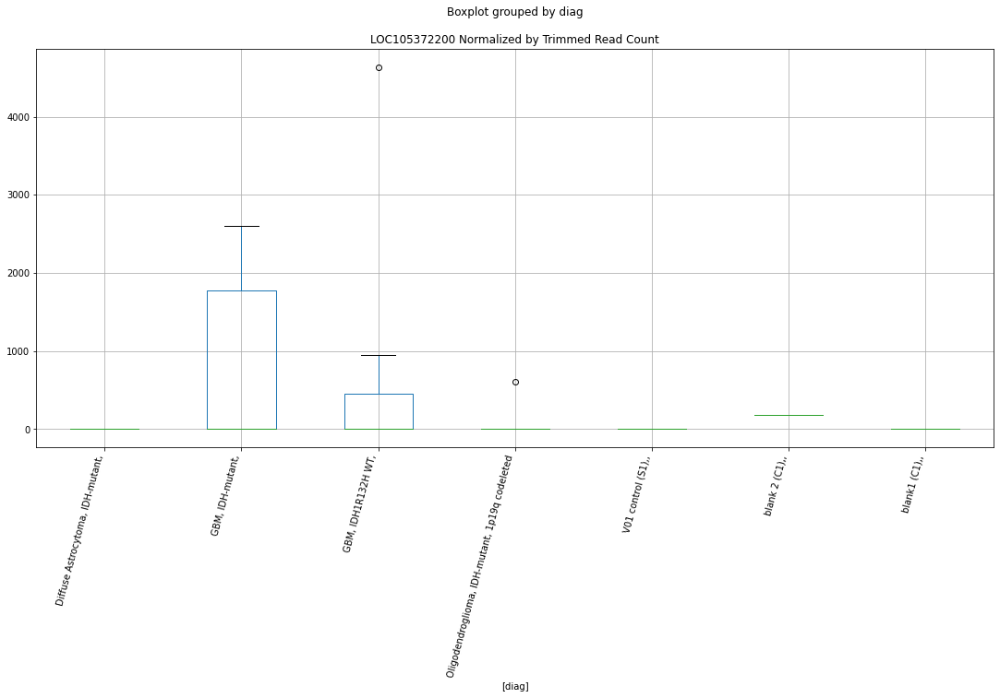

 p : 0.029817891200005563  ( t : 2.3591636944188106 ) :  Lexogen  :  bbduk2  :  LOC105374809
Control and blanks
79     0.0
343    0.0
Name: LOC105374809, dtype: float64
211    546.61
Name: LOC105374809, dtype: float64
475    0.0
Name: LOC105374809, dtype: float64


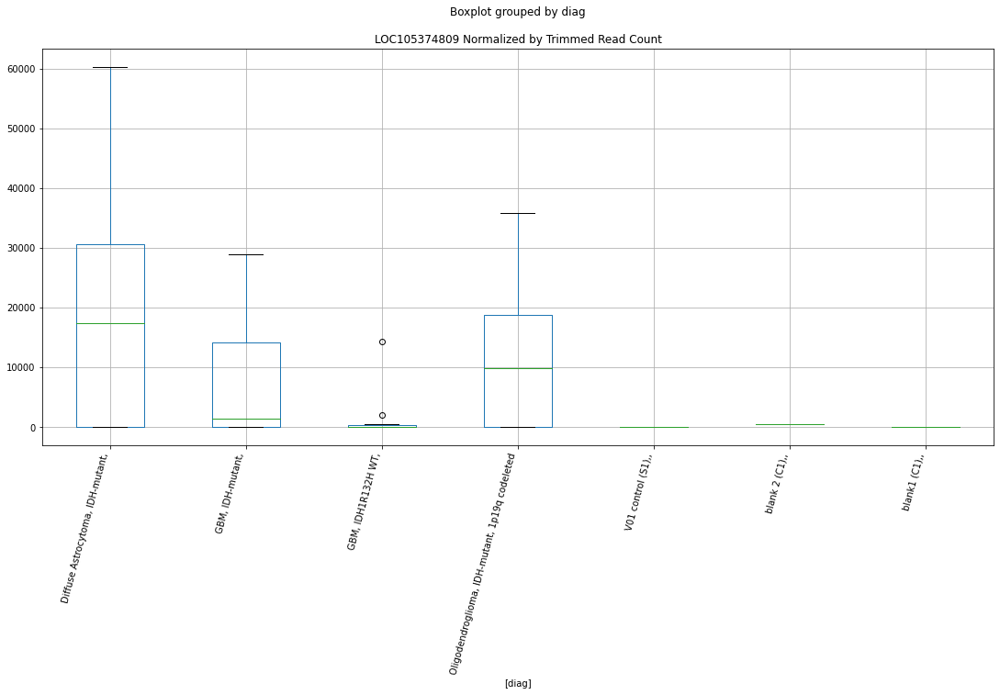

 p : 0.03000473029702264  ( t : 2.356102730768297 ) :  D-plex  :  bbduk2  :  LOC105378519
Control and blanks
73     0.0
337    0.0
Name: LOC105378519, dtype: float64
205    8596.37
Name: LOC105378519, dtype: float64
469    9464.44
Name: LOC105378519, dtype: float64


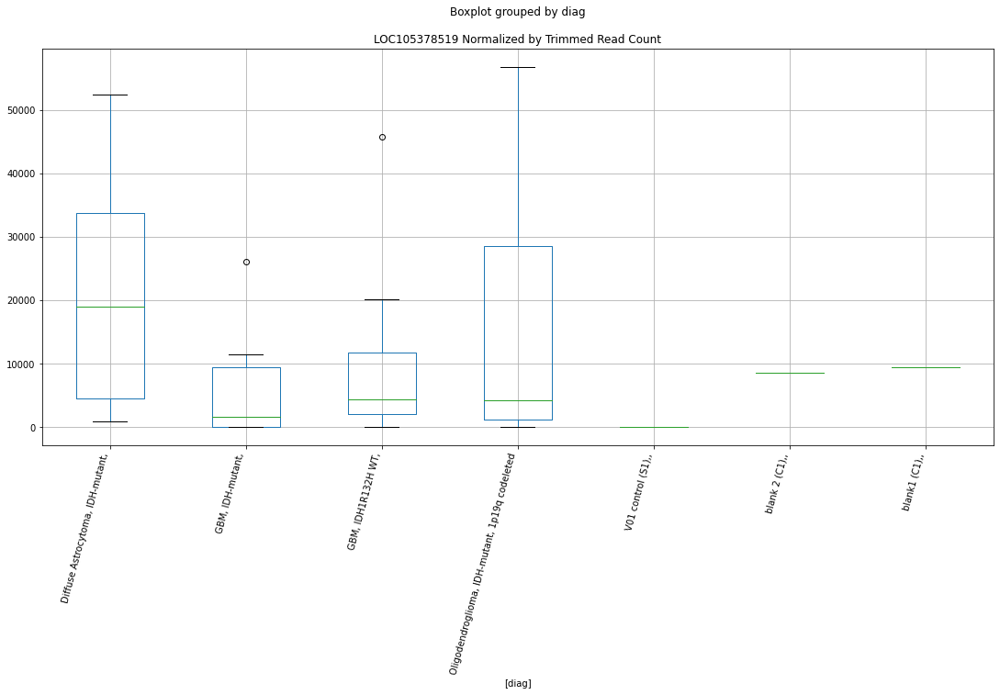

 p : 0.030111614608269277  ( t : 2.3543596331437913 ) :  D-plex  :  bbduk2  :  LOC105377358
Control and blanks
73     0.0
337    0.0
Name: LOC105377358, dtype: float64
205    716.36
Name: LOC105377358, dtype: float64
469    0.0
Name: LOC105377358, dtype: float64


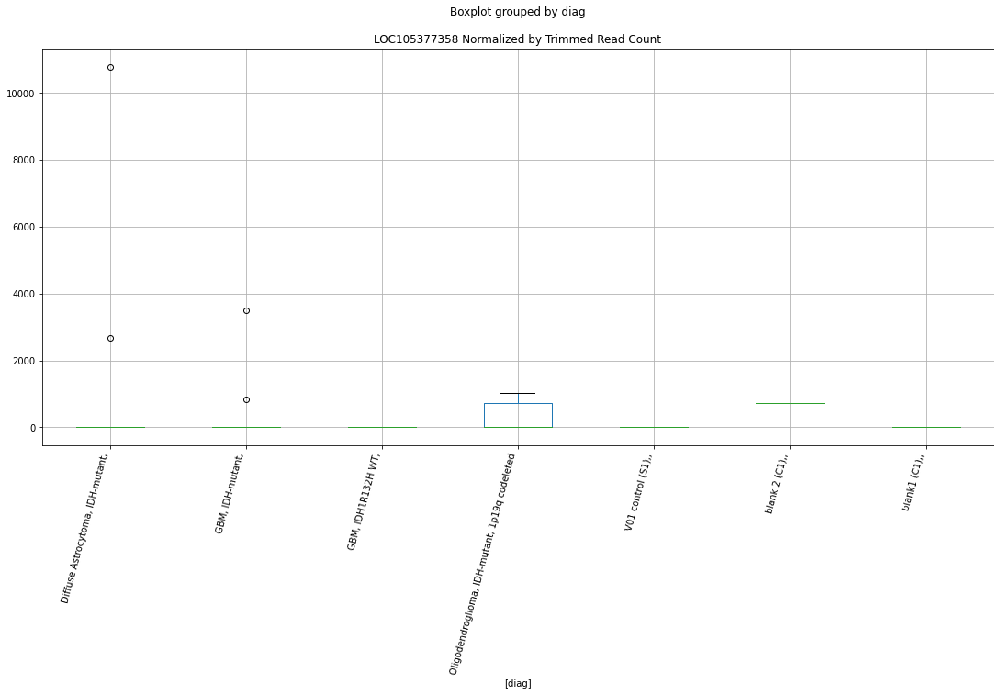

 p : 0.030119762027561944  ( t : 2.3542269994052942 ) :  D-plex  :  cutadapt2  :  LOC105372767
Control and blanks
76     0.0
340    0.0
Name: LOC105372767, dtype: float64
208    176.36
Name: LOC105372767, dtype: float64
472    577.96
Name: LOC105372767, dtype: float64


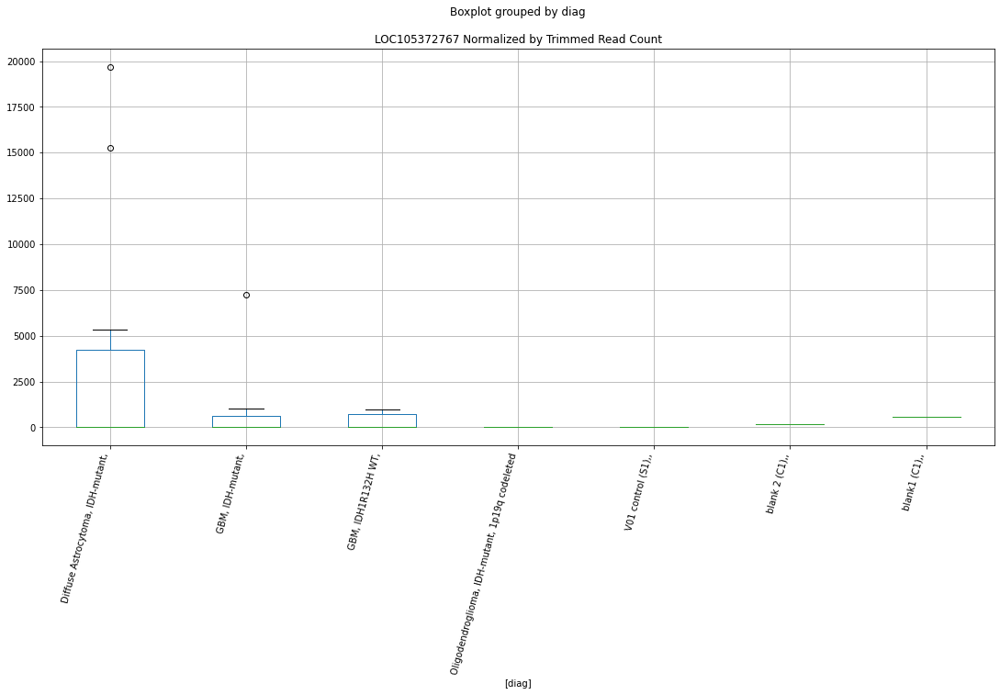

 p : 0.03024944954327059  ( t : 2.352120273415145 ) :  Lexogen  :  cutadapt2  :  LOC105377017
Control and blanks
82       0.00
346    420.87
Name: LOC105377017, dtype: float64
214    271.23
Name: LOC105377017, dtype: float64
478    0.0
Name: LOC105377017, dtype: float64


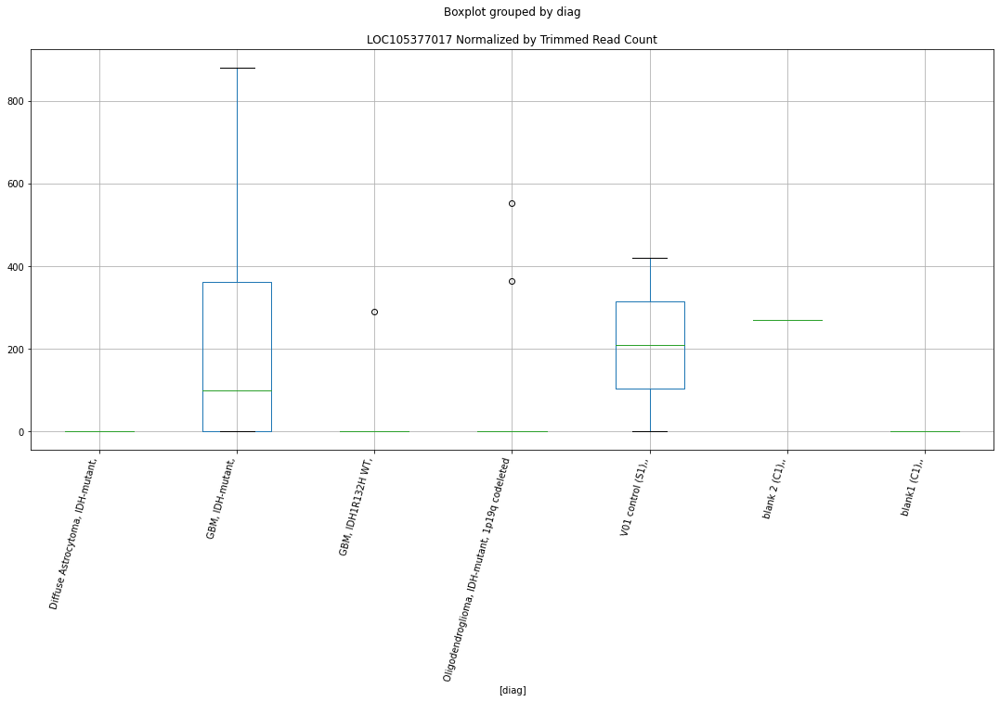

 p : 0.030372322327187354  ( t : 2.3501319964055964 ) :  D-plex  :  bbduk2  :  LOC107984316
Control and blanks
73     0.0
337    0.0
Name: LOC107984316, dtype: float64
205    716.36
Name: LOC107984316, dtype: float64
469    0.0
Name: LOC107984316, dtype: float64


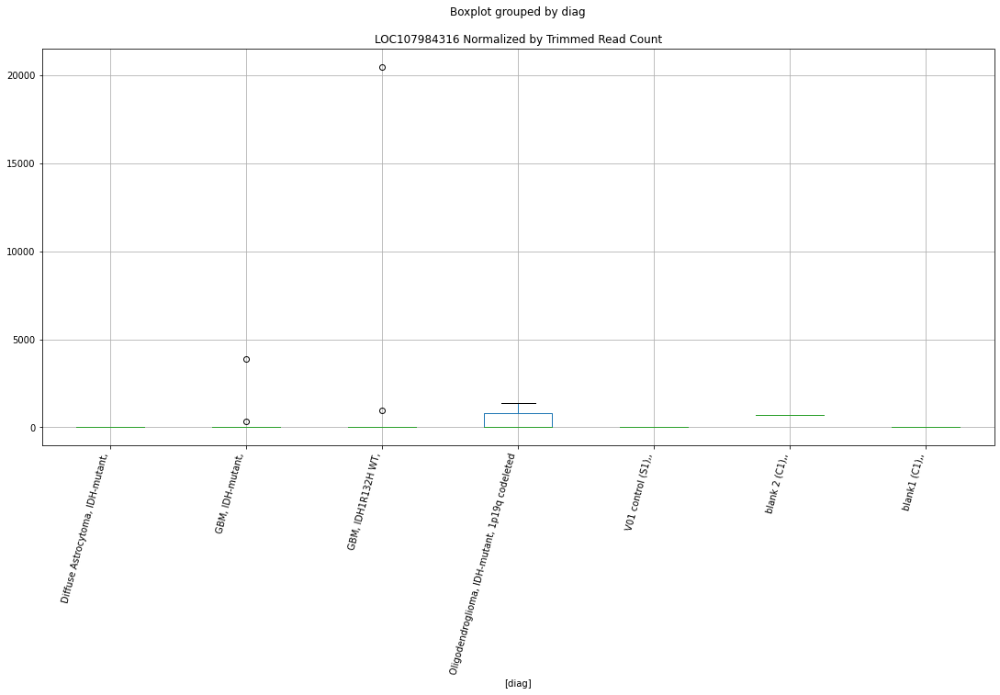

 p : 0.030610010007936443  ( t : 2.346306997767902 ) :  Lexogen  :  bbduk2  :  LOC105376097
Control and blanks
79     0.0
343    0.0
Name: LOC105376097, dtype: float64
211    0.0
Name: LOC105376097, dtype: float64
475    0.0
Name: LOC105376097, dtype: float64


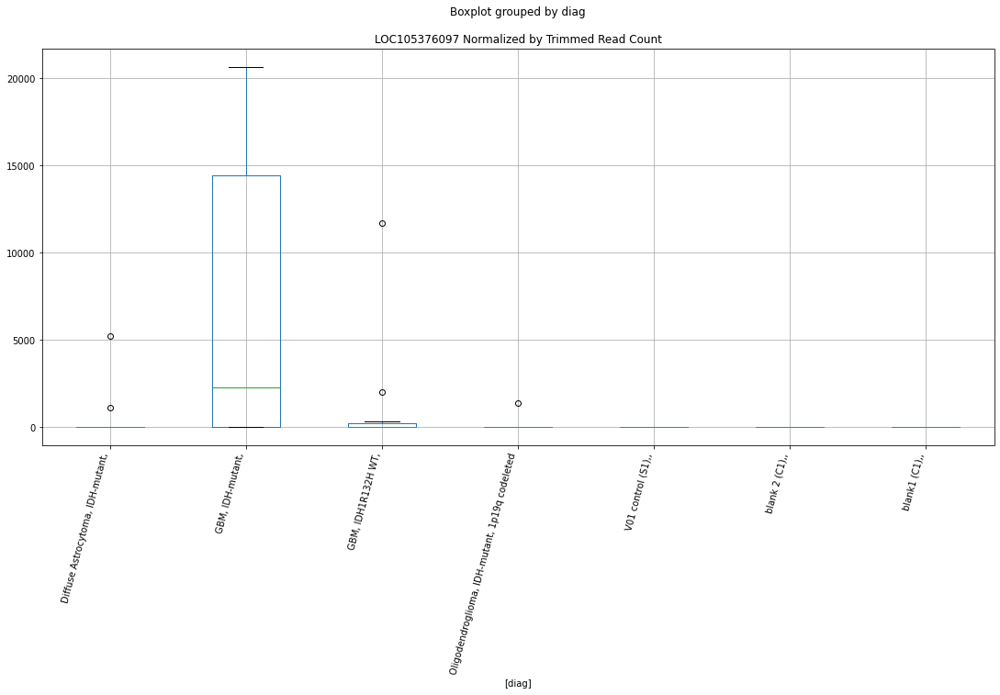

 p : 0.03065330163263398  ( t : 2.3456133036760267 ) :  D-plex  :  bbduk2  :  LOC105374275
Control and blanks
73     0.0
337    0.0
Name: LOC105374275, dtype: float64
205    0.0
Name: LOC105374275, dtype: float64
469    0.0
Name: LOC105374275, dtype: float64


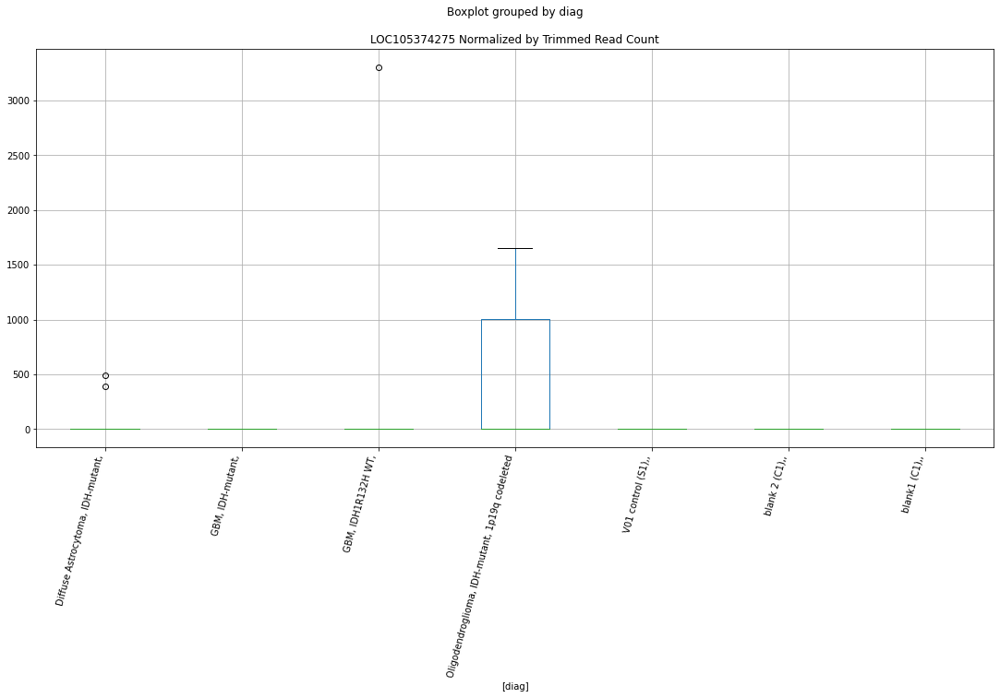

 p : 0.030697664316472775  ( t : 2.344903392602013 ) :  Lexogen  :  cutadapt2  :  LOC105376097
Control and blanks
82     0.0
346    0.0
Name: LOC105376097, dtype: float64
214    0.0
Name: LOC105376097, dtype: float64
478    0.0
Name: LOC105376097, dtype: float64


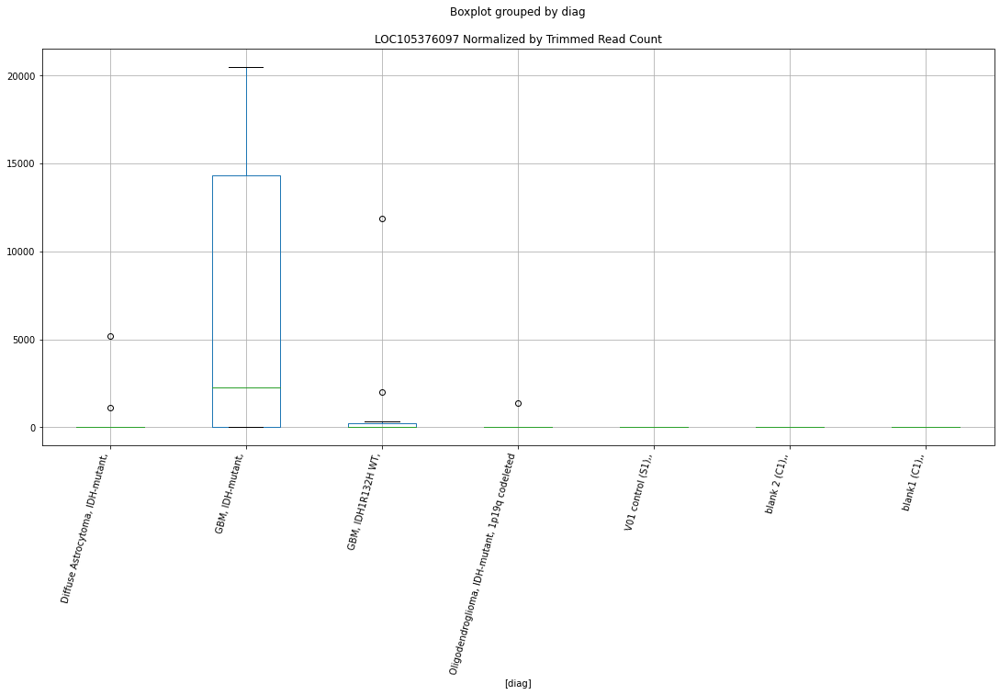

 p : 0.030786965855969437  ( t : 2.3434772413266187 ) :  Lexogen  :  cutadapt2  :  LOC105373760
Control and blanks
82     0.0
346    0.0
Name: LOC105373760, dtype: float64
214    0.0
Name: LOC105373760, dtype: float64
478    0.0
Name: LOC105373760, dtype: float64


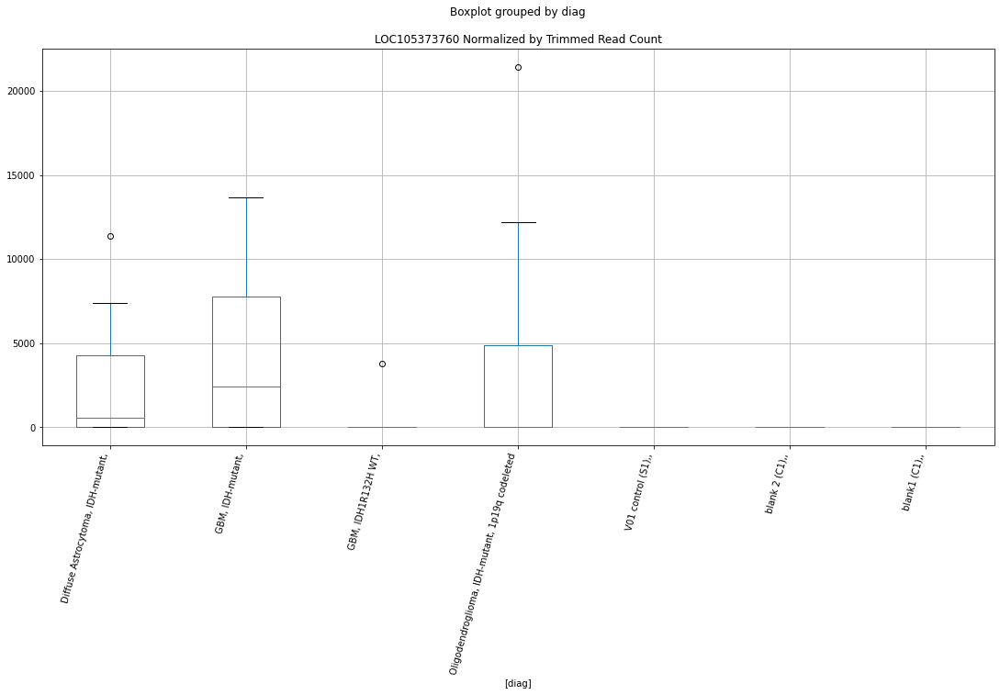

 p : 0.030805535060849716  ( t : 2.343181173512428 ) :  D-plex  :  cutadapt2  :  LOC105374140
Control and blanks
76     3030.46
340       0.00
Name: LOC105374140, dtype: float64
208    3174.48
Name: LOC105374140, dtype: float64
472    5779.56
Name: LOC105374140, dtype: float64


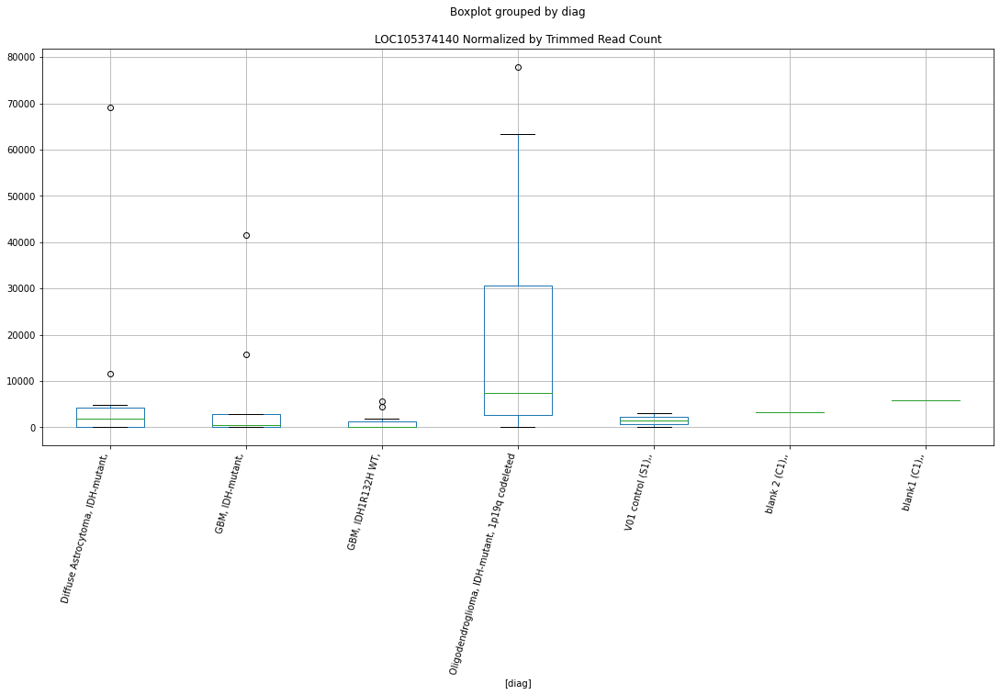

 p : 0.031120433945885036  ( t : 2.3381855421858537 ) :  D-plex  :  cutadapt2  :  LOC105375559
Control and blanks
76     0.0
340    0.0
Name: LOC105375559, dtype: float64
208    1587.24
Name: LOC105375559, dtype: float64
472    1155.91
Name: LOC105375559, dtype: float64


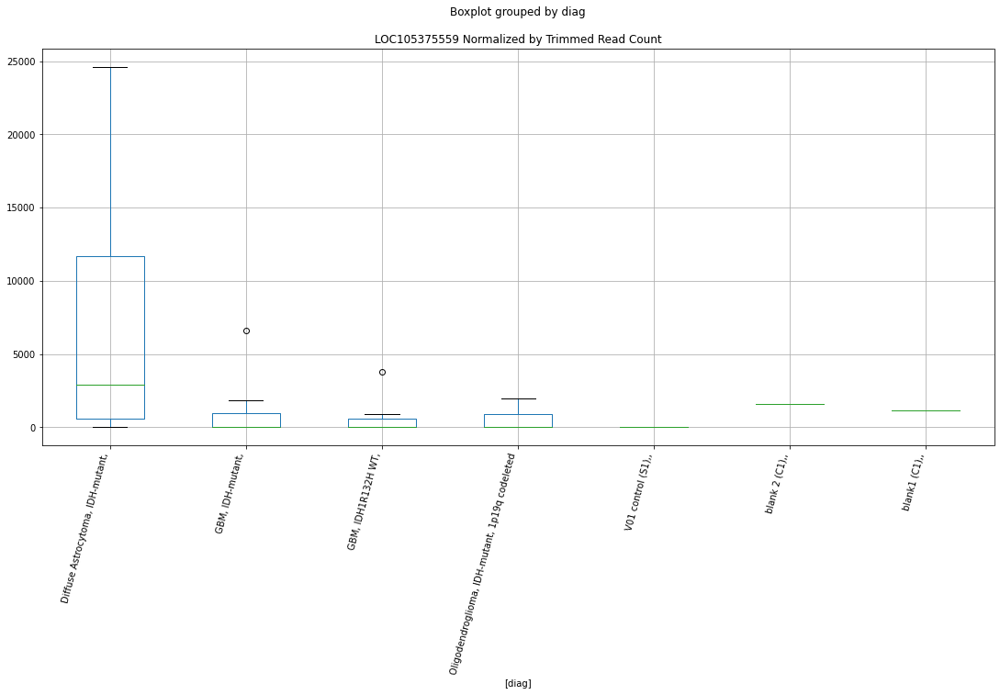

 p : 0.03122140095881343  ( t : 2.3365937310120066 ) :  D-plex  :  cutadapt2  :  LOC105377622
Control and blanks
76     0.0
340    0.0
Name: LOC105377622, dtype: float64
208    881.8
Name: LOC105377622, dtype: float64
472    577.96
Name: LOC105377622, dtype: float64


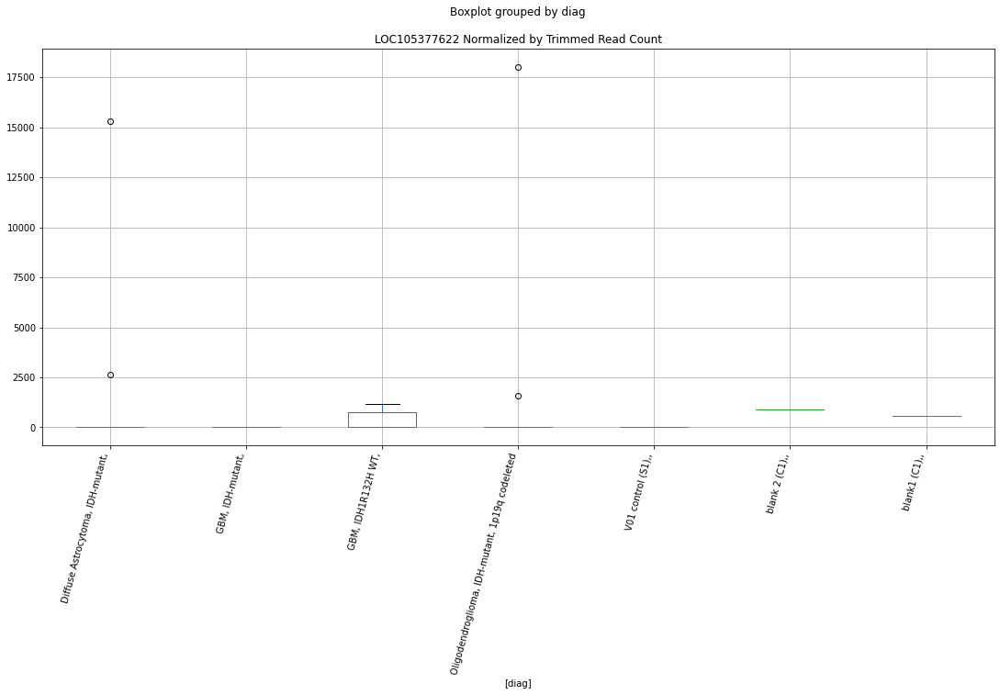

 p : 0.03141687861375437  ( t : 2.3335254583018696 ) :  D-plex  :  bbduk2  :  LOC105375559
Control and blanks
73     0.0
337    0.0
Name: LOC105375559, dtype: float64
205    1611.82
Name: LOC105375559, dtype: float64
469    1183.05
Name: LOC105375559, dtype: float64


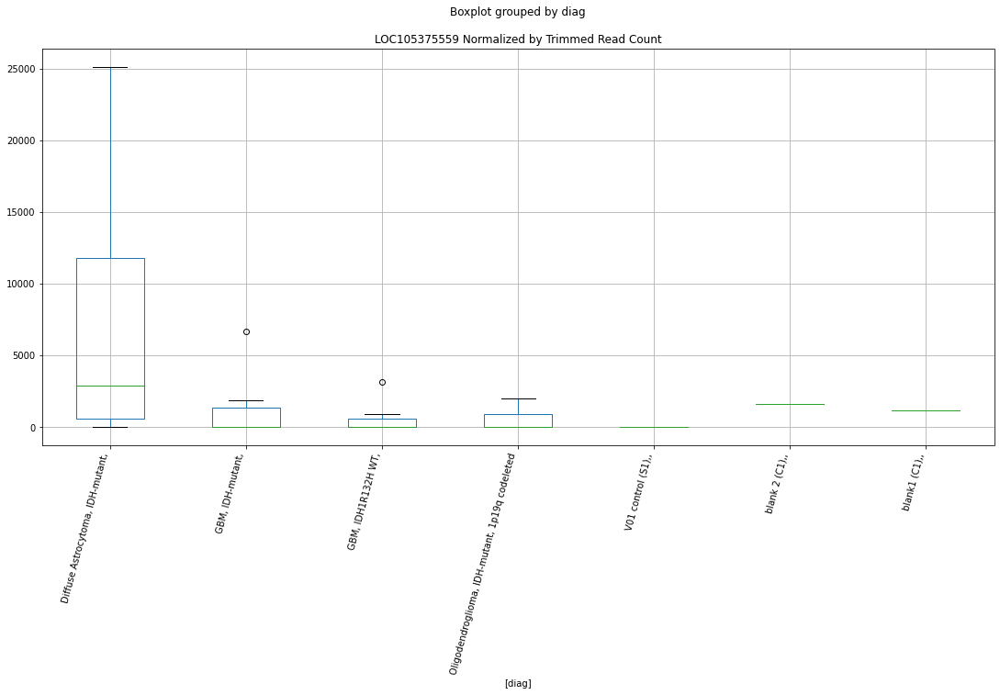

 p : 0.03160967798037719  ( t : 2.33051656415142 ) :  D-plex  :  bbduk2  :  LOC105375559
Control and blanks
73     0.0
337    0.0
Name: LOC105375559, dtype: float64
205    1611.82
Name: LOC105375559, dtype: float64
469    1183.05
Name: LOC105375559, dtype: float64


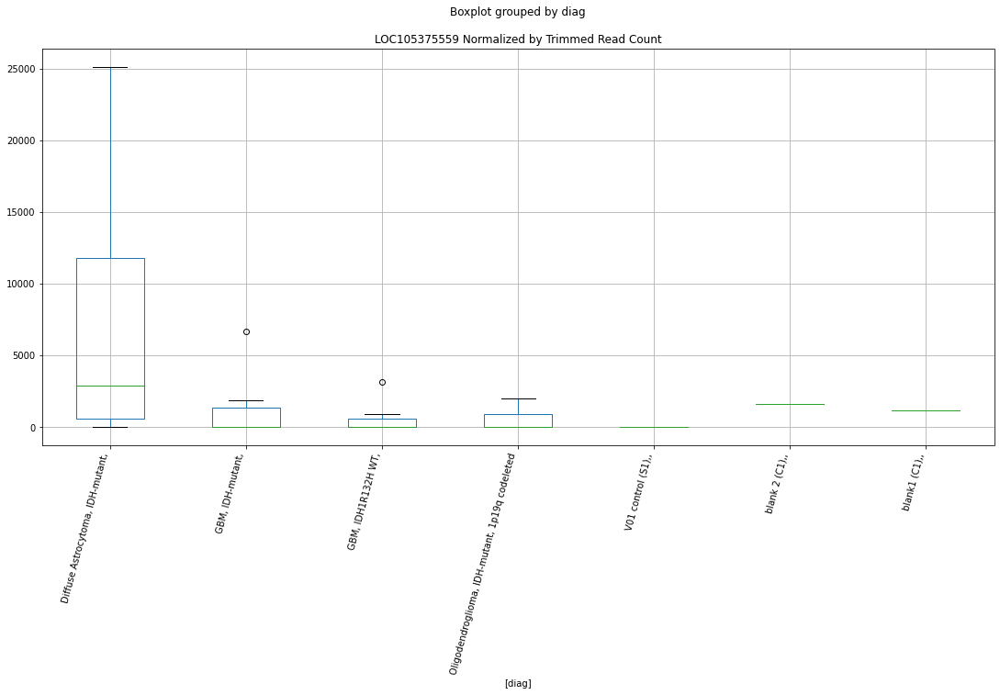

 p : 0.031816704850017634  ( t : 2.3273045667493957 ) :  Lexogen  :  bbduk2  :  LOC105373760
Control and blanks
79     0.0
343    0.0
Name: LOC105373760, dtype: float64
211    0.0
Name: LOC105373760, dtype: float64
475    0.0
Name: LOC105373760, dtype: float64


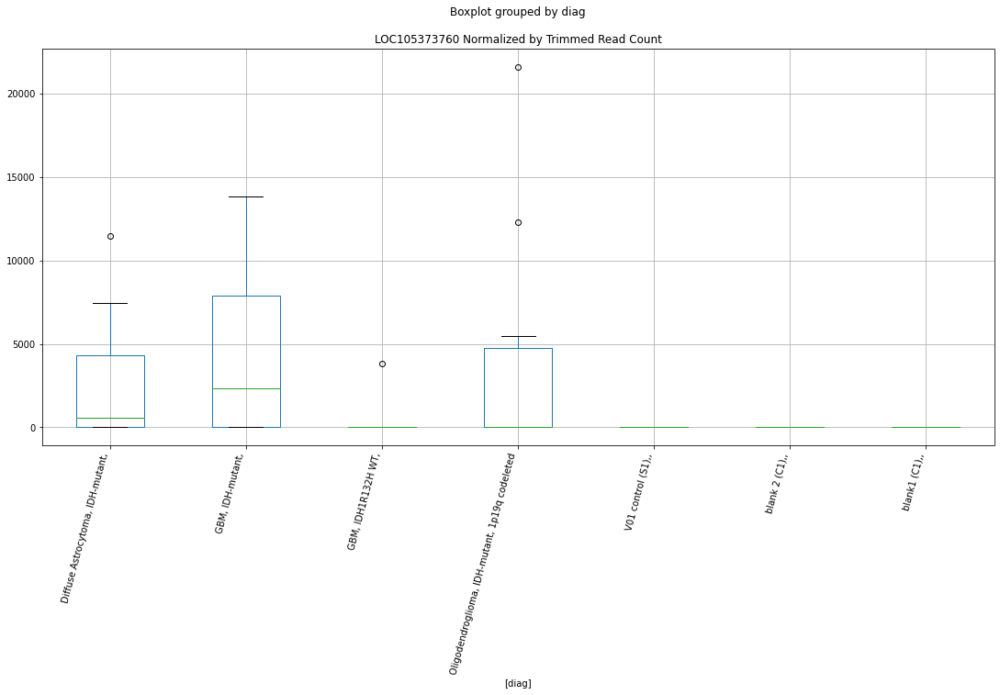

 p : 0.03206745860316101  ( t : 2.323440060564551 ) :  D-plex  :  cutadapt2  :  LOC107985154
Control and blanks
76     0.0
340    0.0
Name: LOC107985154, dtype: float64
208    352.72
Name: LOC107985154, dtype: float64
472    577.96
Name: LOC107985154, dtype: float64


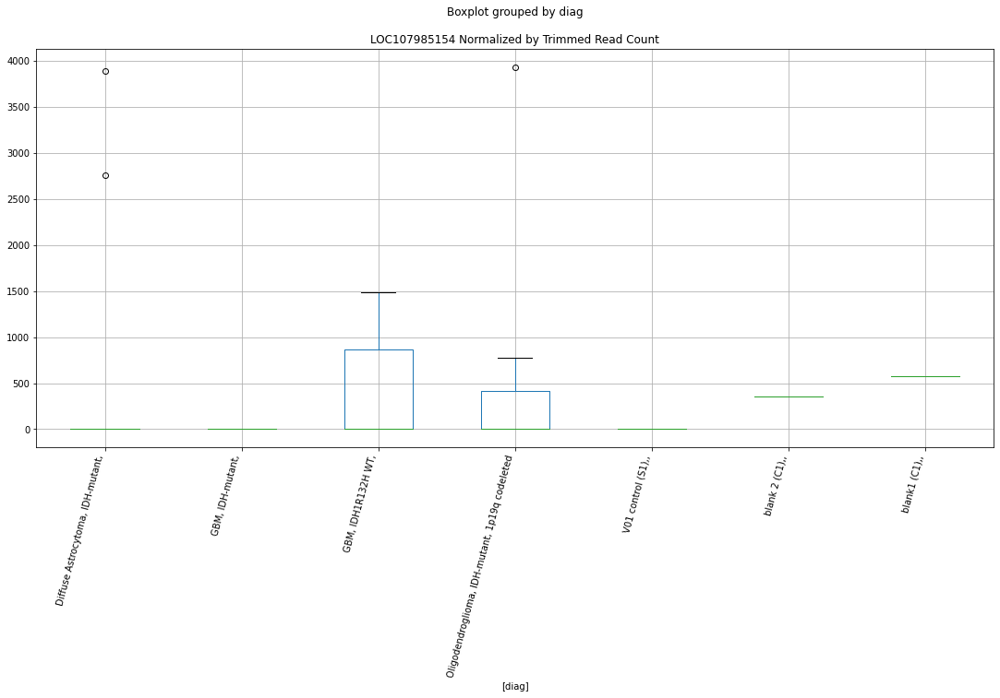

 p : 0.032448759302421235  ( t : 2.3176170885569194 ) :  D-plex  :  cutadapt2  :  LOC107984036
Control and blanks
76     0.0
340    0.0
Name: LOC107984036, dtype: float64
208    1587.24
Name: LOC107984036, dtype: float64
472    1733.87
Name: LOC107984036, dtype: float64


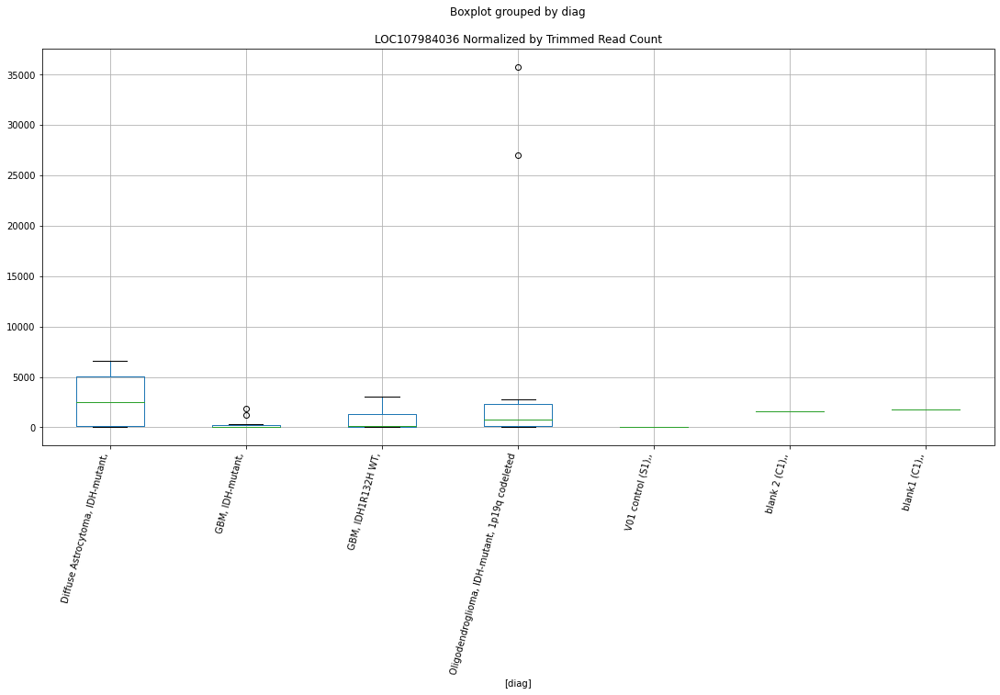

 p : 0.03248318423680216  ( t : 2.3170945057306445 ) :  Lexogen  :  cutadapt2  :  LOC105374809
Control and blanks
82     0.0
346    0.0
Name: LOC105374809, dtype: float64
214    542.45
Name: LOC105374809, dtype: float64
478    0.0
Name: LOC105374809, dtype: float64


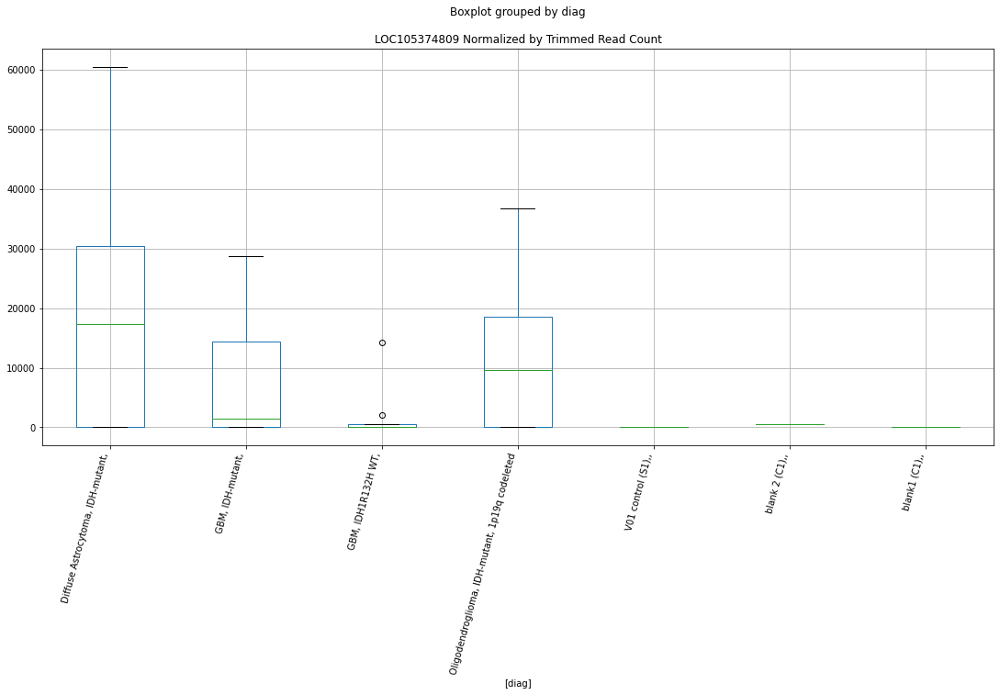

 p : 0.03269961130564342  ( t : 2.3138207954074645 ) :  Lexogen  :  bbduk2  :  LOC105373215
Control and blanks
79        0.00
343    1698.51
Name: LOC105373215, dtype: float64
211    0.0
Name: LOC105373215, dtype: float64
475    0.0
Name: LOC105373215, dtype: float64


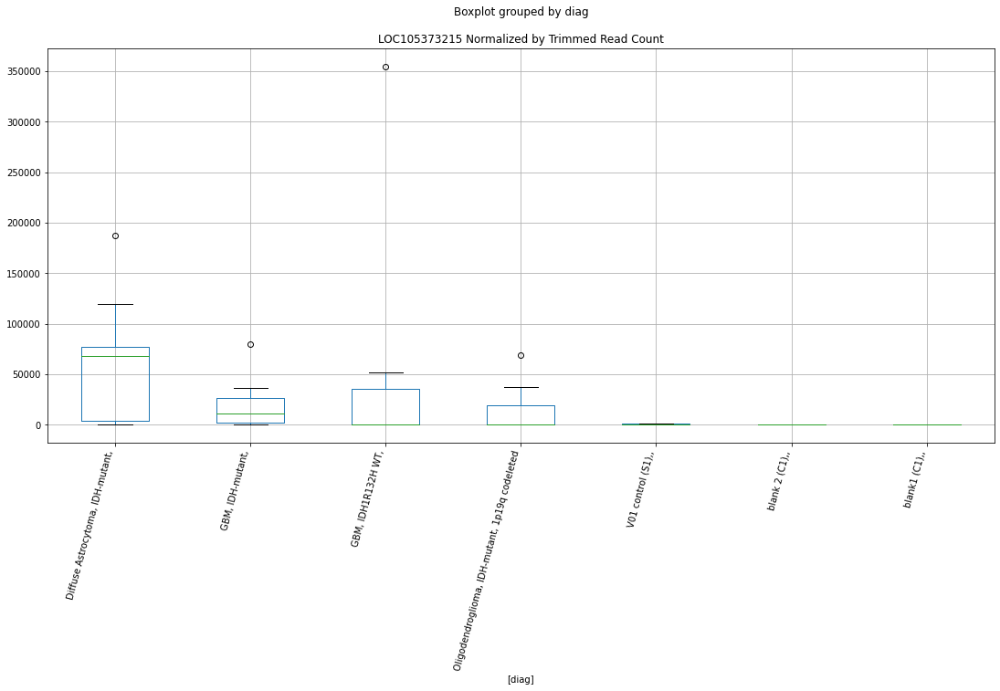

 p : 0.03281962171903079  ( t : 2.312014157406256 ) :  Lexogen  :  cutadapt2  :  LOC105373215
Control and blanks
82        0.00
346    1683.48
Name: LOC105373215, dtype: float64
214    0.0
Name: LOC105373215, dtype: float64
478    0.0
Name: LOC105373215, dtype: float64


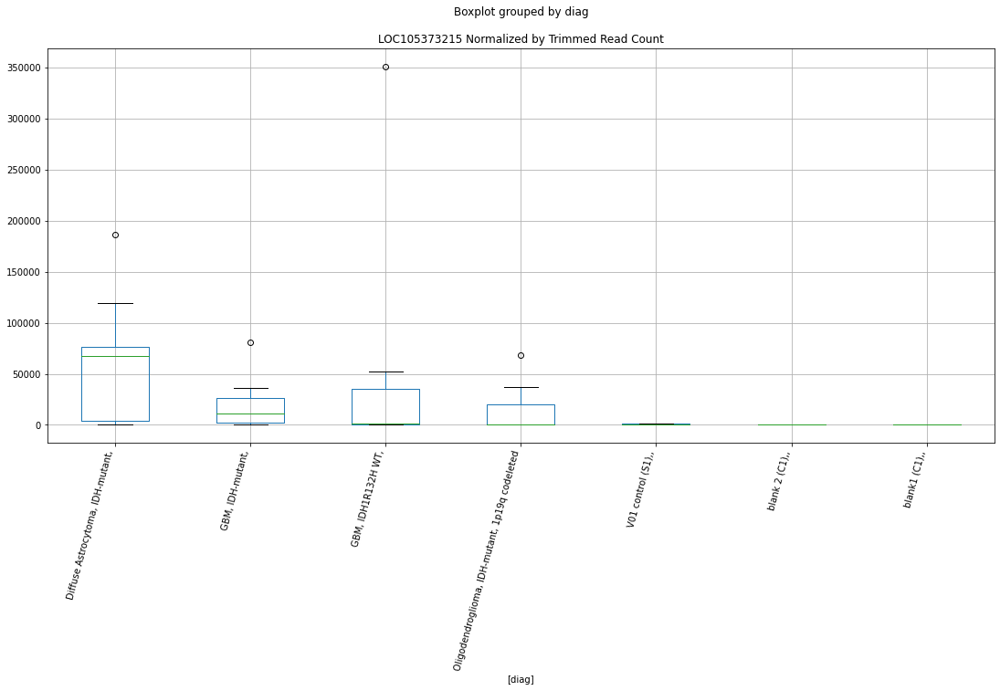

 p : 0.03291008823055651  ( t : 2.310656322092046 ) :  D-plex  :  cutadapt2  :  LOC107984451
Control and blanks
76     0.0
340    0.0
Name: LOC107984451, dtype: float64
208    1763.6
Name: LOC107984451, dtype: float64
472    5779.56
Name: LOC107984451, dtype: float64


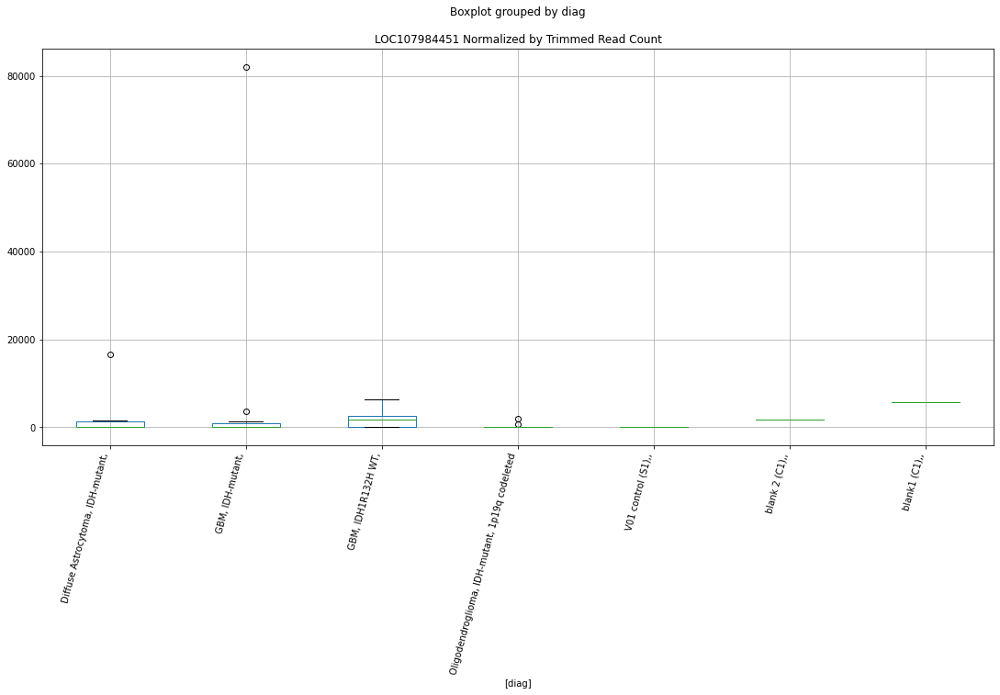

 p : 0.032916719312210706  ( t : 2.310556930771884 ) :  Lexogen  :  bbduk2  :  LOC107984805
Control and blanks
79        0.0
343    1486.2
Name: LOC107984805, dtype: float64
211    0.0
Name: LOC107984805, dtype: float64
475    1676.61
Name: LOC107984805, dtype: float64


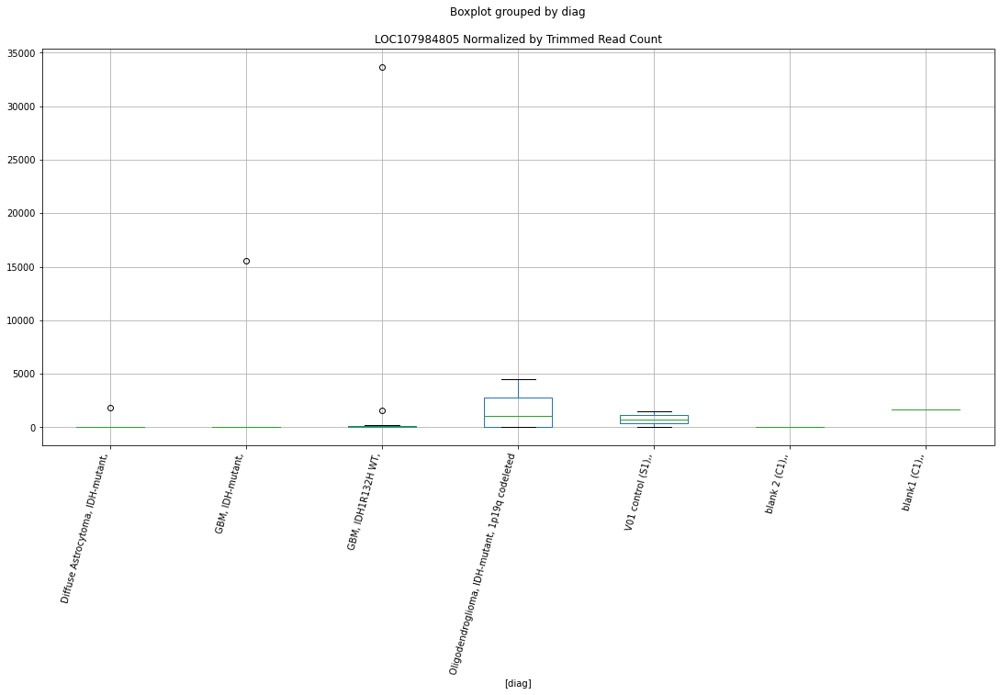

 p : 0.03296349662468616  ( t : 2.309856326841901 ) :  D-plex  :  cutadapt2  :  LOC105375559
Control and blanks
76     0.0
340    0.0
Name: LOC105375559, dtype: float64
208    1587.24
Name: LOC105375559, dtype: float64
472    1155.91
Name: LOC105375559, dtype: float64


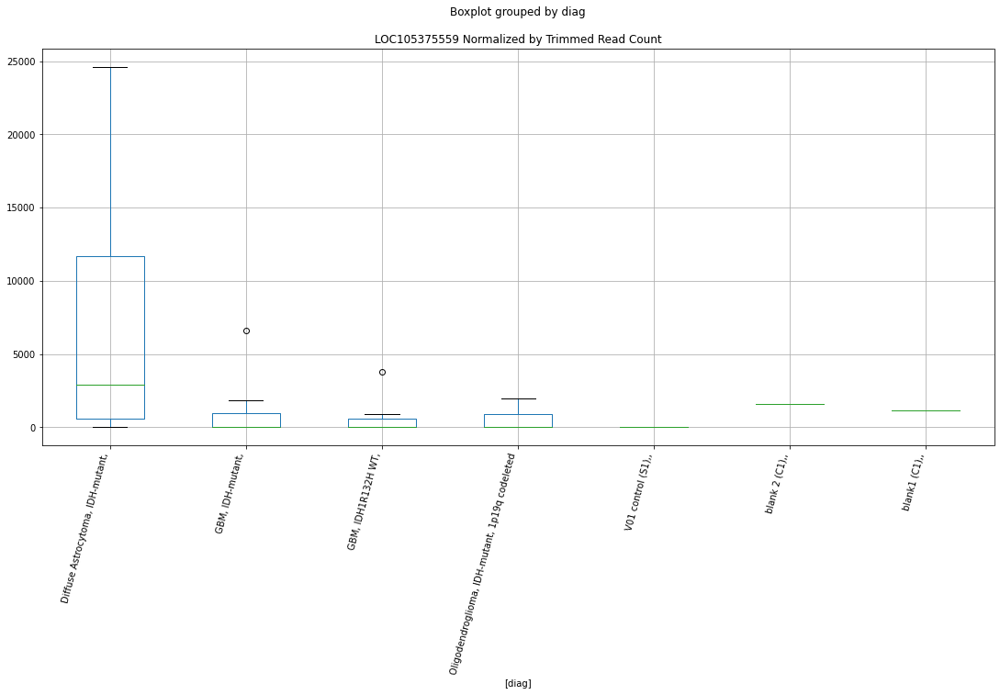

 p : 0.03311054194328537  ( t : 2.307659958035388 ) :  D-plex  :  cutadapt2  :  LOC105376201
Control and blanks
76     0.0
340    0.0
Name: LOC105376201, dtype: float64
208    1587.24
Name: LOC105376201, dtype: float64
472    1733.87
Name: LOC105376201, dtype: float64


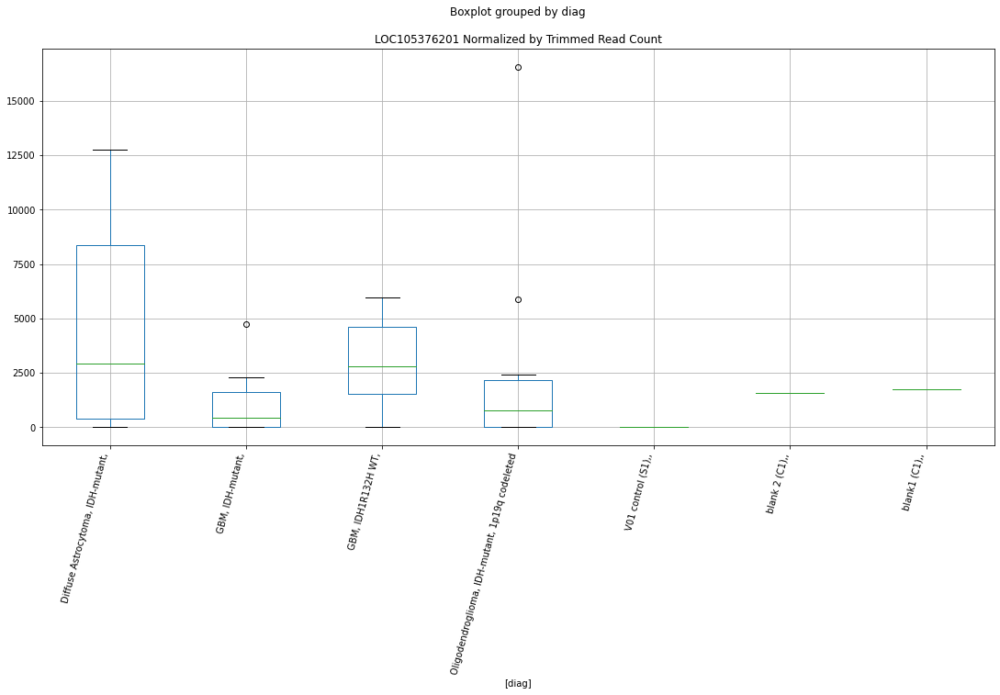

 p : 0.03311397985810505  ( t : 2.3076087153479183 ) :  D-plex  :  cutadapt2  :  LOC107984334
Control and blanks
76     0.0
340    0.0
Name: LOC107984334, dtype: float64
208    1763.6
Name: LOC107984334, dtype: float64
472    4045.69
Name: LOC107984334, dtype: float64


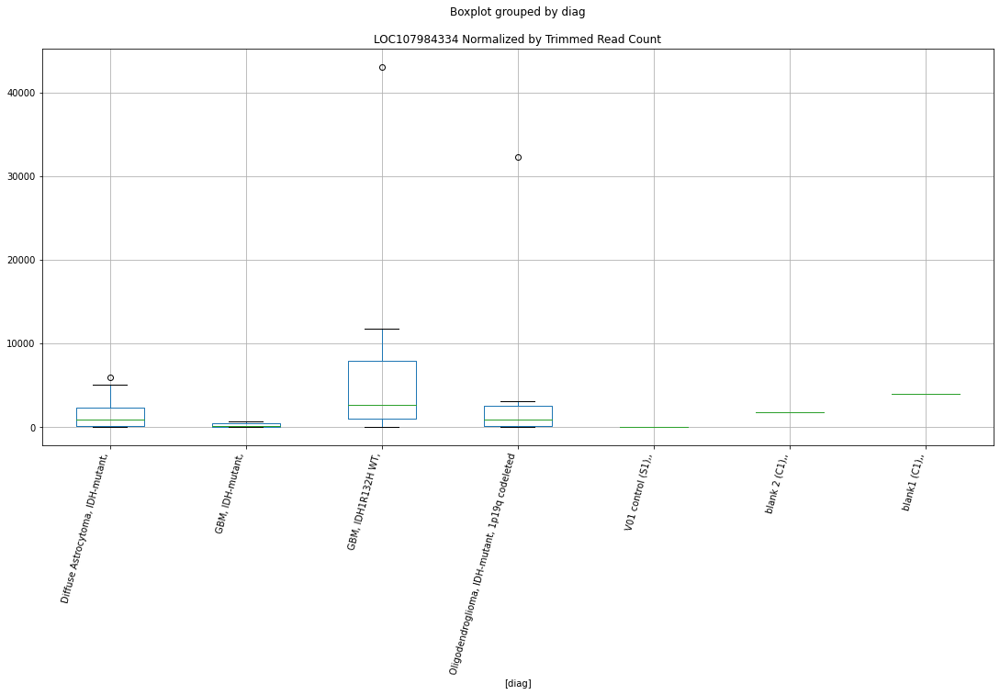

 p : 0.03319151126275722  ( t : 2.3064544057174508 ) :  D-plex  :  bbduk2  :  LOC105373492
Control and blanks
73     0.0
337    0.0
Name: LOC105373492, dtype: float64
205    0.0
Name: LOC105373492, dtype: float64
469    591.53
Name: LOC105373492, dtype: float64


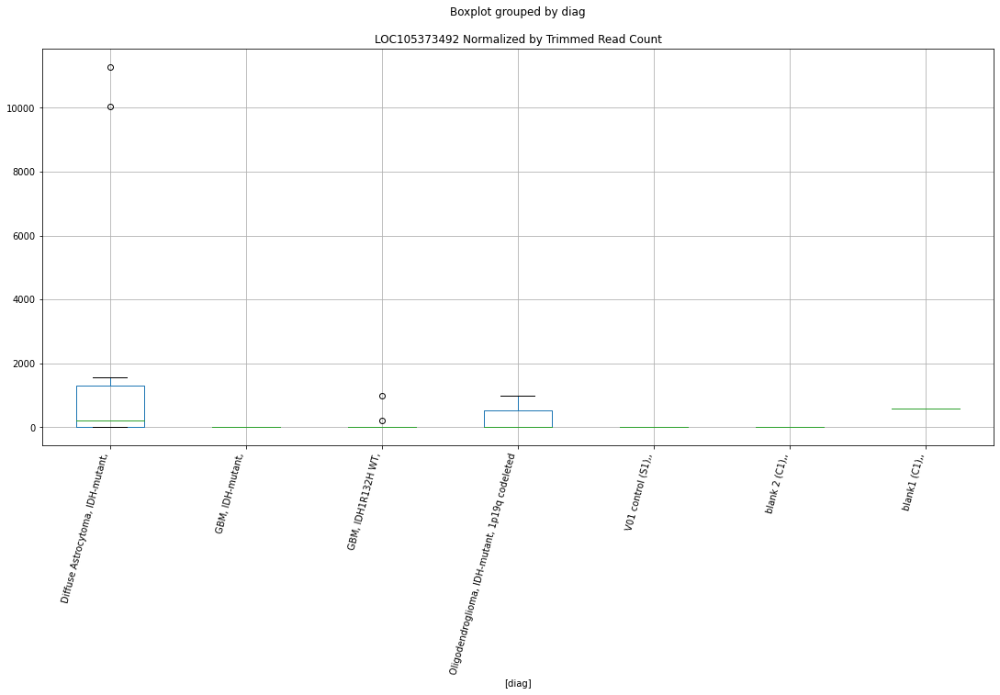

 p : 0.03319151126275722  ( t : 2.3064544057174508 ) :  D-plex  :  bbduk2  :  LOC105373493
Control and blanks
73     0.0
337    0.0
Name: LOC105373493, dtype: float64
205    0.0
Name: LOC105373493, dtype: float64
469    591.53
Name: LOC105373493, dtype: float64


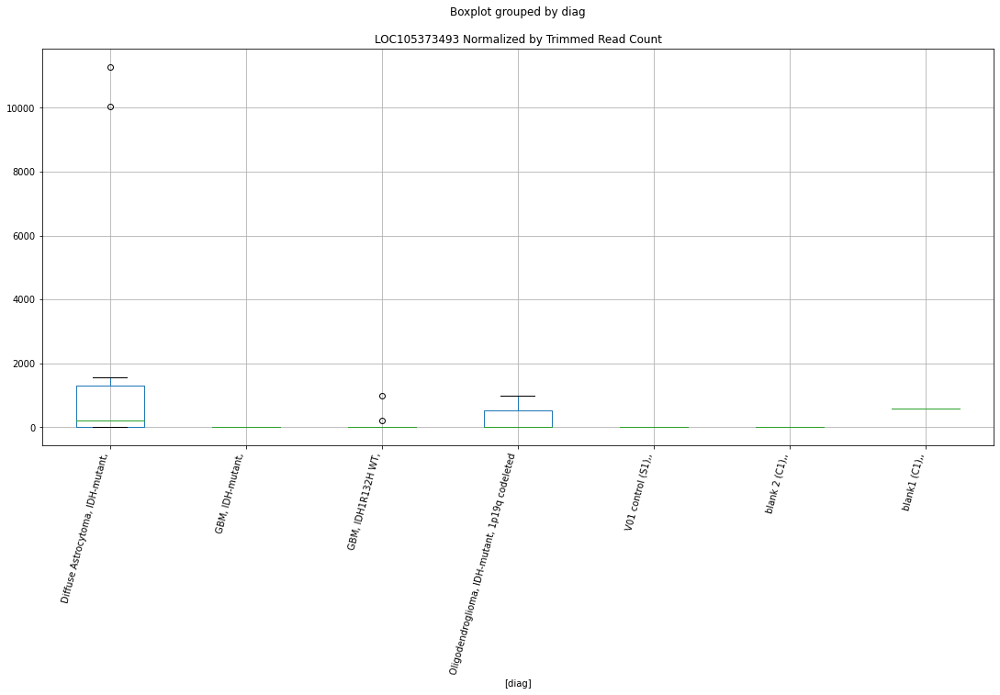

 p : 0.033402674630008365  ( t : 2.303323181260598 ) :  D-plex  :  bbduk2  :  LOC105378827
Control and blanks
73     23963.26
337      890.16
Name: LOC105378827, dtype: float64
205    6984.55
Name: LOC105378827, dtype: float64
469    12422.07
Name: LOC105378827, dtype: float64


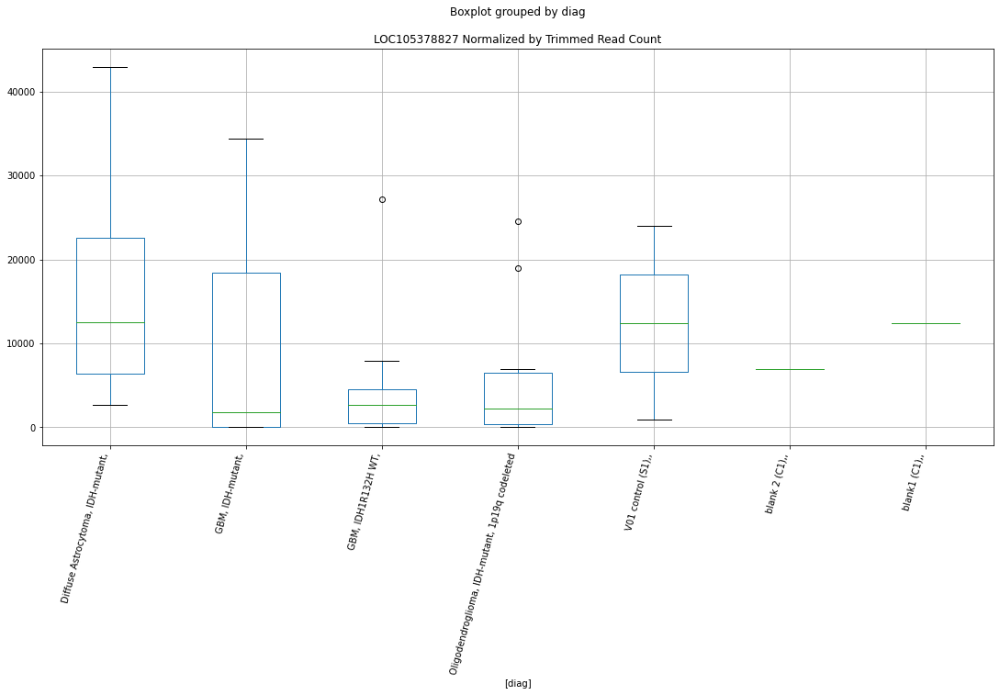

 p : 0.03350749053928034  ( t : 2.3017757360775306 ) :  D-plex  :  bbduk2  :  LOC105378976
Control and blanks
73     0.0
337    0.0
Name: LOC105378976, dtype: float64
205    179.09
Name: LOC105378976, dtype: float64
469    591.53
Name: LOC105378976, dtype: float64


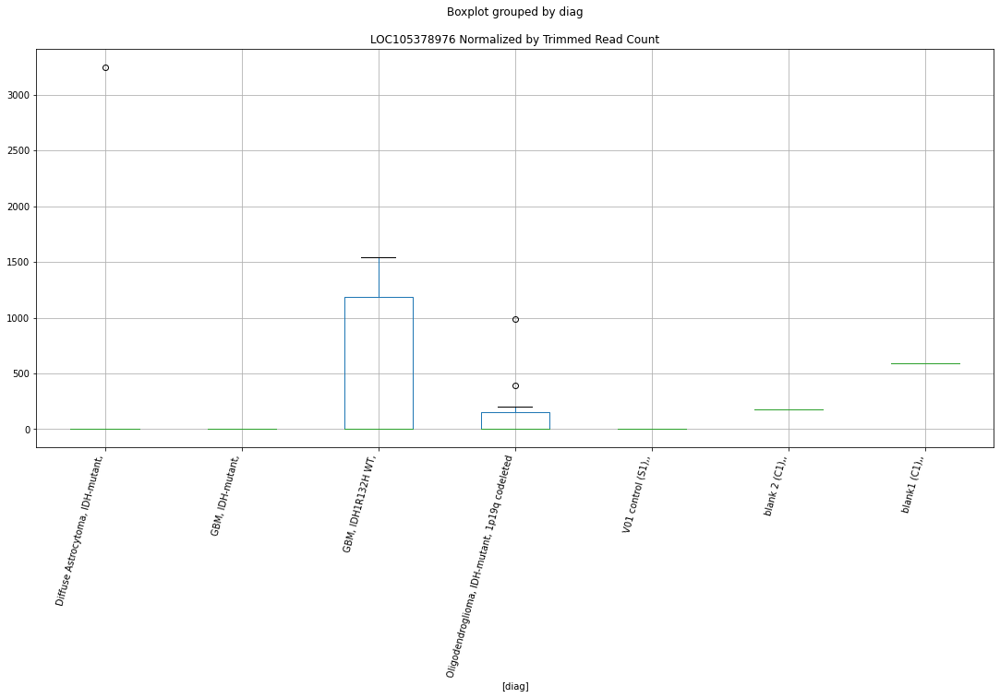

 p : 0.03351688463009502  ( t : 2.3016372660769435 ) :  D-plex  :  cutadapt2  :  LOC105375892
Control and blanks
76     0.0
340    0.0
Name: LOC105375892, dtype: float64
208    0.0
Name: LOC105375892, dtype: float64
472    577.96
Name: LOC105375892, dtype: float64


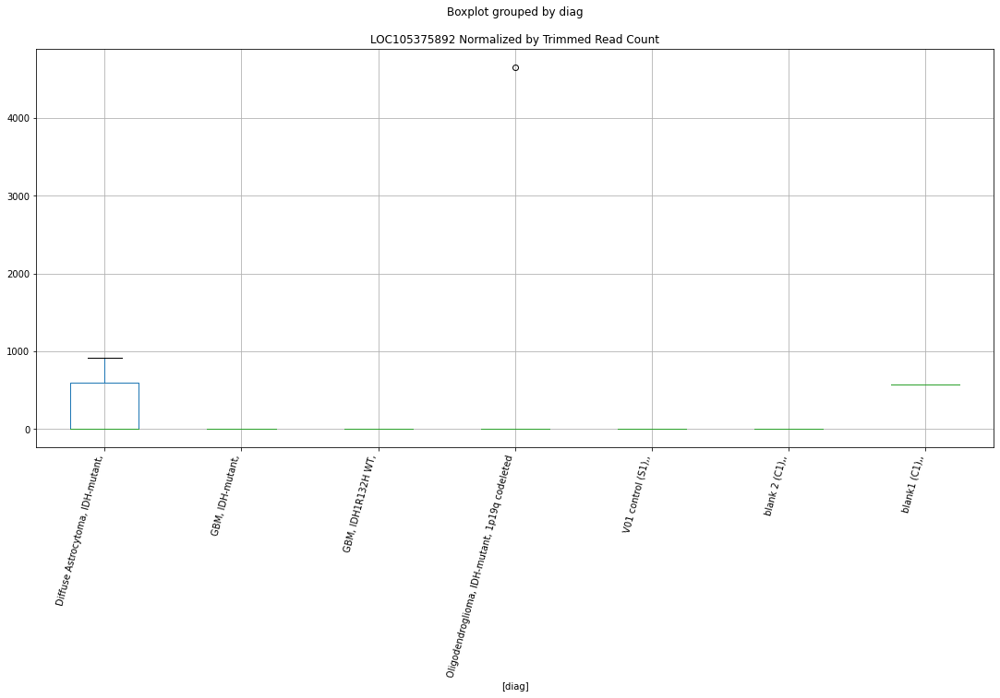

 p : 0.033592095116423526  ( t : 2.300529950229183 ) :  Lexogen  :  bbduk2  :  LOC105376541
Control and blanks
79       0.00
343    212.31
Name: LOC105376541, dtype: float64
211    0.0
Name: LOC105376541, dtype: float64
475    479.03
Name: LOC105376541, dtype: float64


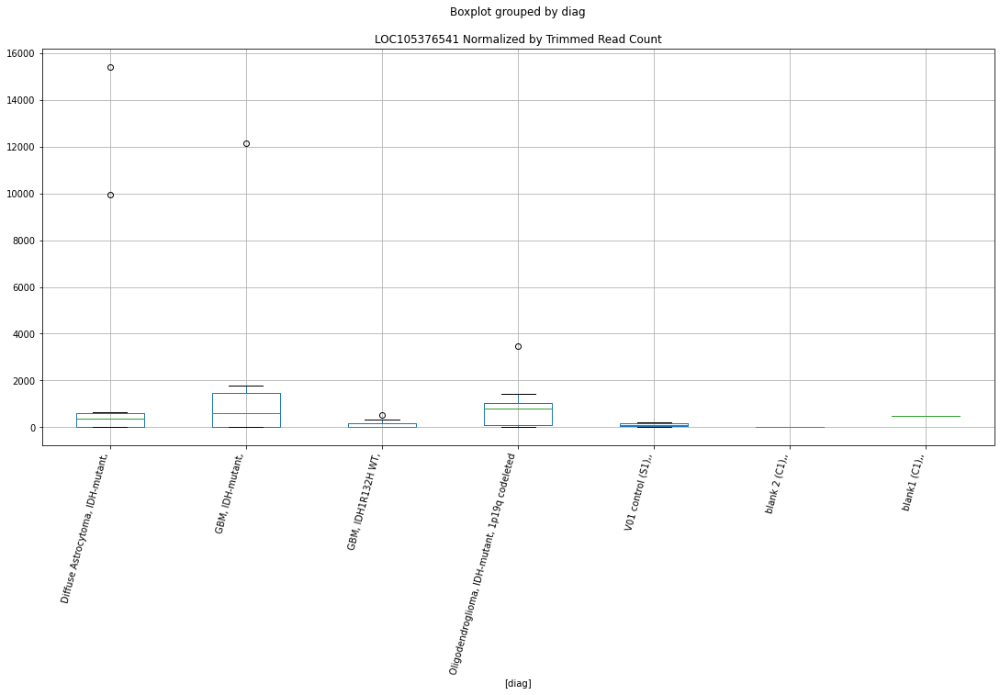

 p : 0.03374125900601449  ( t : 2.2983406095867296 ) :  D-plex  :  bbduk2  :  LOC107984255
Control and blanks
73     0.0
337    0.0
Name: LOC107984255, dtype: float64
205    0.0
Name: LOC107984255, dtype: float64
469    0.0
Name: LOC107984255, dtype: float64


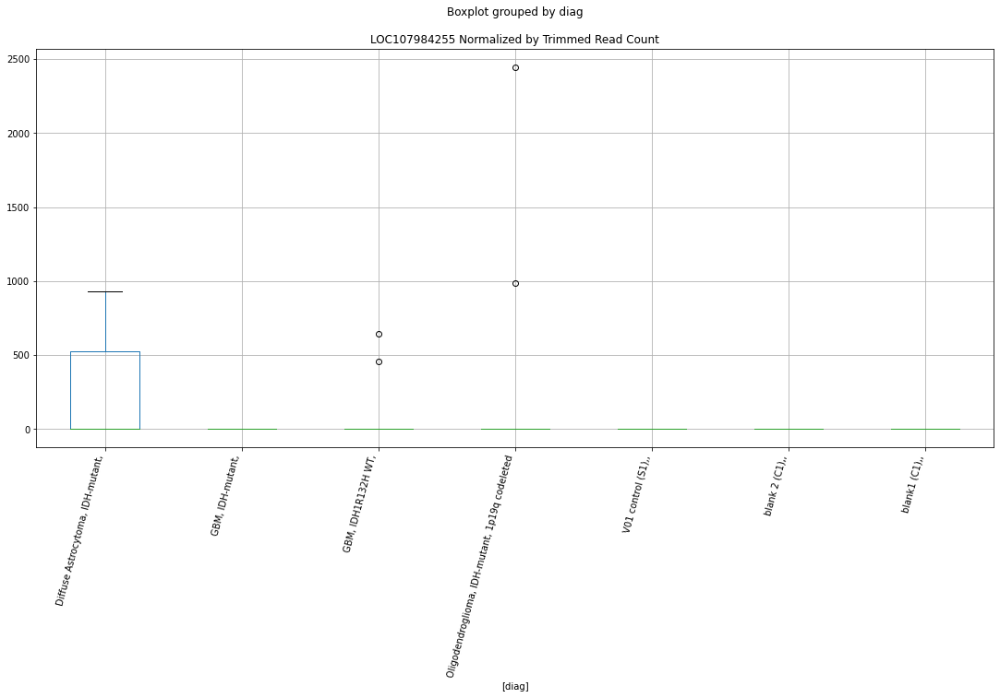

 p : 0.033834467880194515  ( t : 2.2969770943962122 ) :  D-plex  :  bbduk2  :  LOC105379507
Control and blanks
73     61840.67
337     3560.63
Name: LOC105379507, dtype: float64
205    6089.09
Name: LOC105379507, dtype: float64
469    6506.8
Name: LOC105379507, dtype: float64


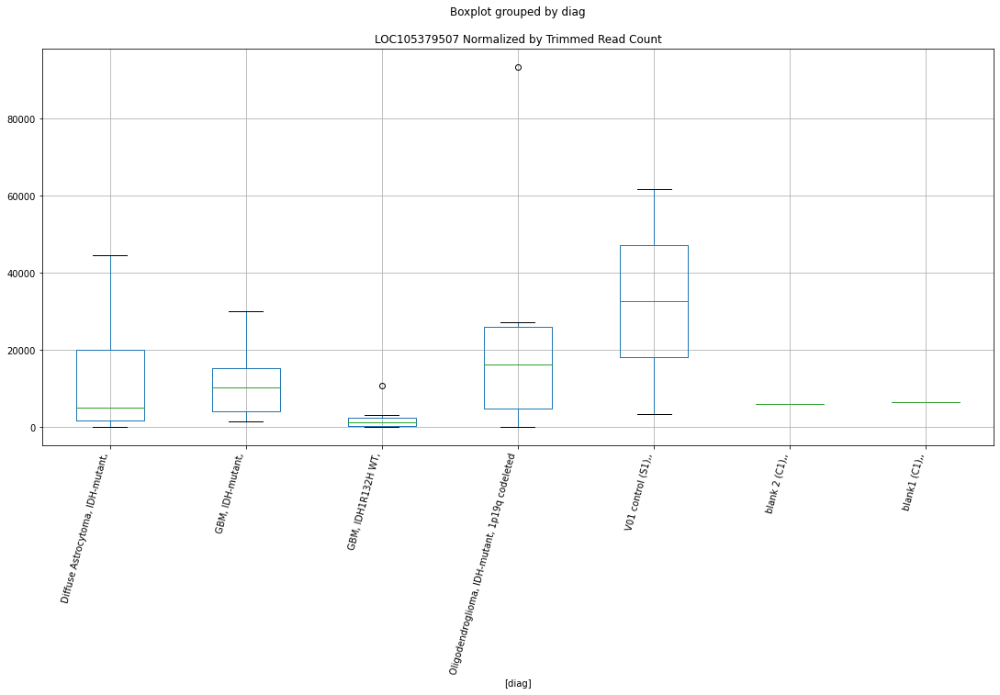

 p : 0.033834467880194515  ( t : 2.2969770943962122 ) :  D-plex  :  bbduk2  :  LOC105379508
Control and blanks
73     61840.67
337     3560.63
Name: LOC105379508, dtype: float64
205    5910.0
Name: LOC105379508, dtype: float64
469    6506.8
Name: LOC105379508, dtype: float64


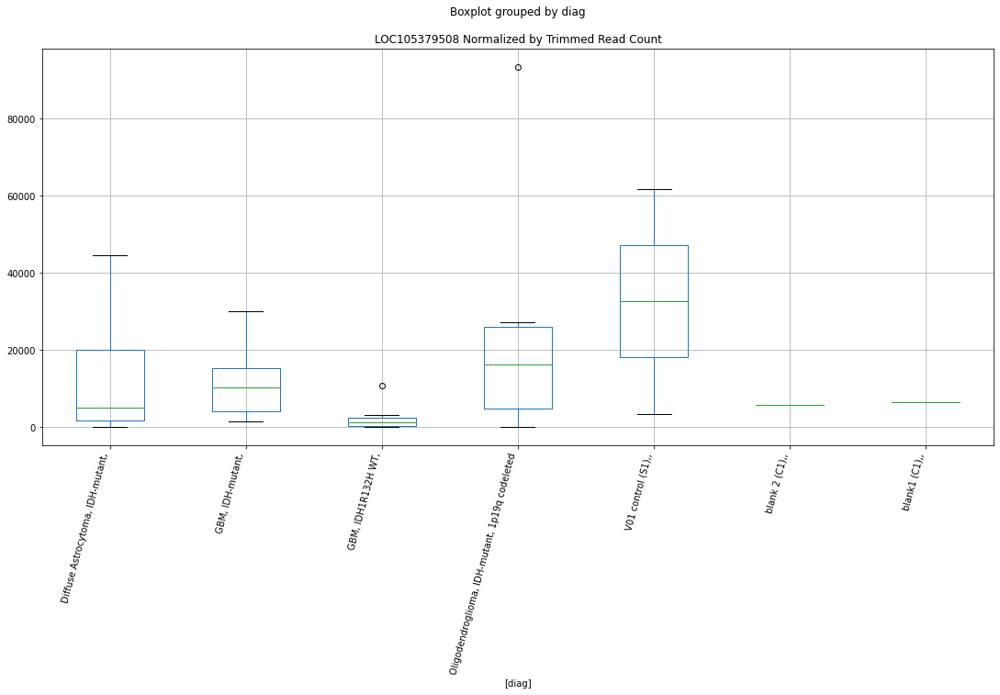

 p : 0.033834467880194515  ( t : 2.2969770943962122 ) :  D-plex  :  bbduk2  :  LOC105379506
Control and blanks
73     61840.67
337     3560.63
Name: LOC105379506, dtype: float64
205    6089.09
Name: LOC105379506, dtype: float64
469    6506.8
Name: LOC105379506, dtype: float64


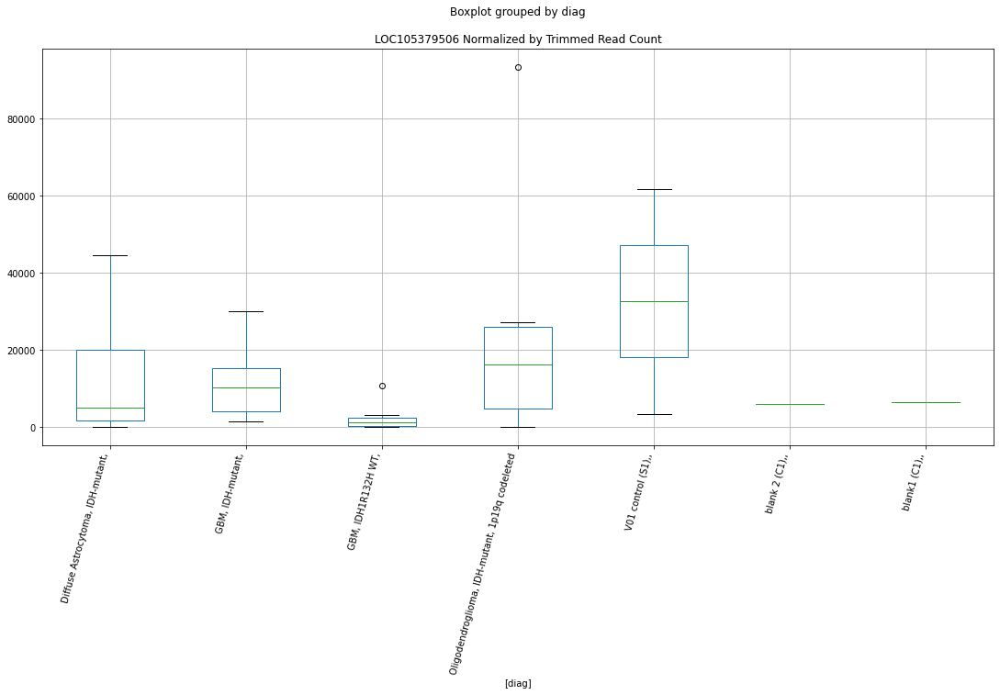

 p : 0.03403281853048005  ( t : 2.2940870513701896 ) :  D-plex  :  cutadapt2  :  LOC105374897
Control and blanks
76     43184.01
340        0.00
Name: LOC105374897, dtype: float64
208    35272.04
Name: LOC105374897, dtype: float64
472    10981.16
Name: LOC105374897, dtype: float64


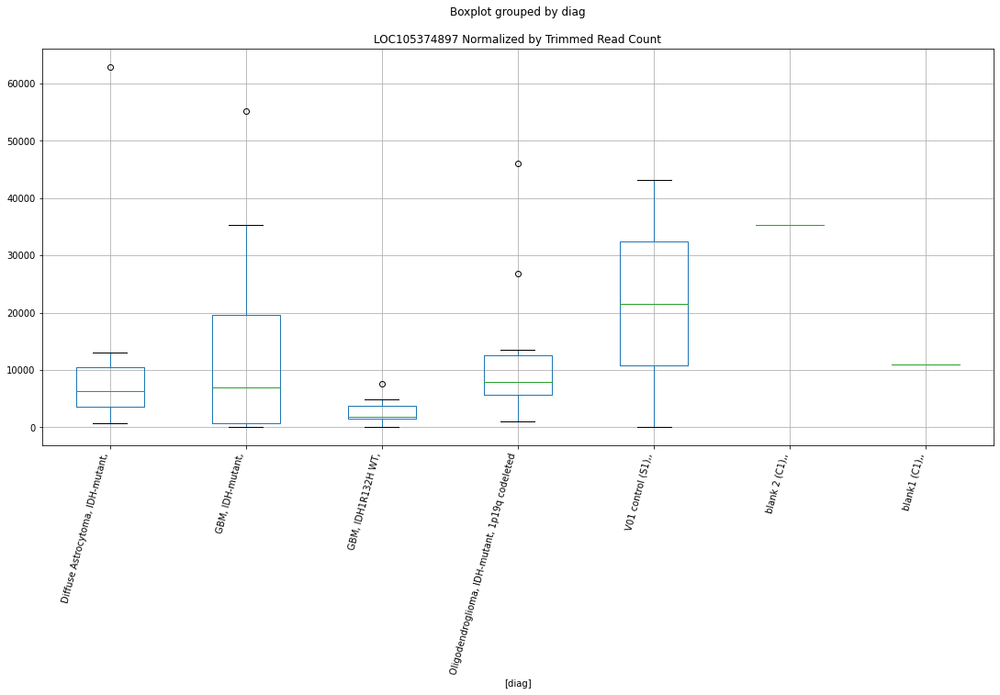

 p : 0.03411975837586902  ( t : 2.292825222428327 ) :  Lexogen  :  bbduk2  :  LOC107985561
Control and blanks
79     0.0
343    0.0
Name: LOC107985561, dtype: float64
211    0.0
Name: LOC107985561, dtype: float64
475    239.52
Name: LOC107985561, dtype: float64


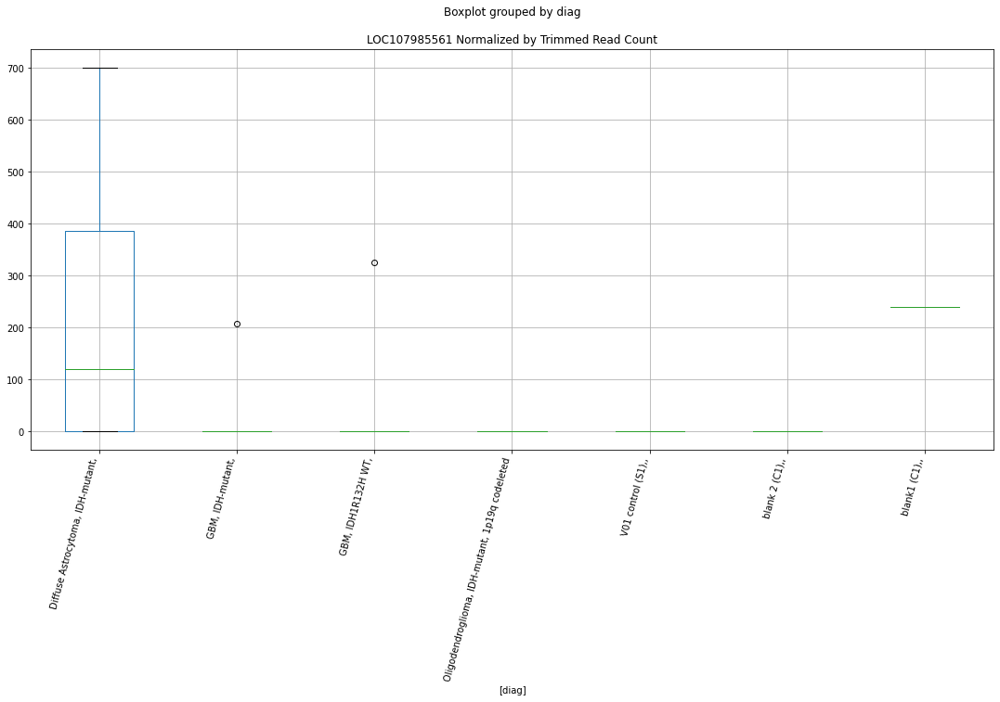

 p : 0.03417484693000356  ( t : 2.292027218197824 ) :  D-plex  :  bbduk2  :  LOC105376201
Control and blanks
73     0.0
337    0.0
Name: LOC105376201, dtype: float64
205    1611.82
Name: LOC105376201, dtype: float64
469    1774.58
Name: LOC105376201, dtype: float64


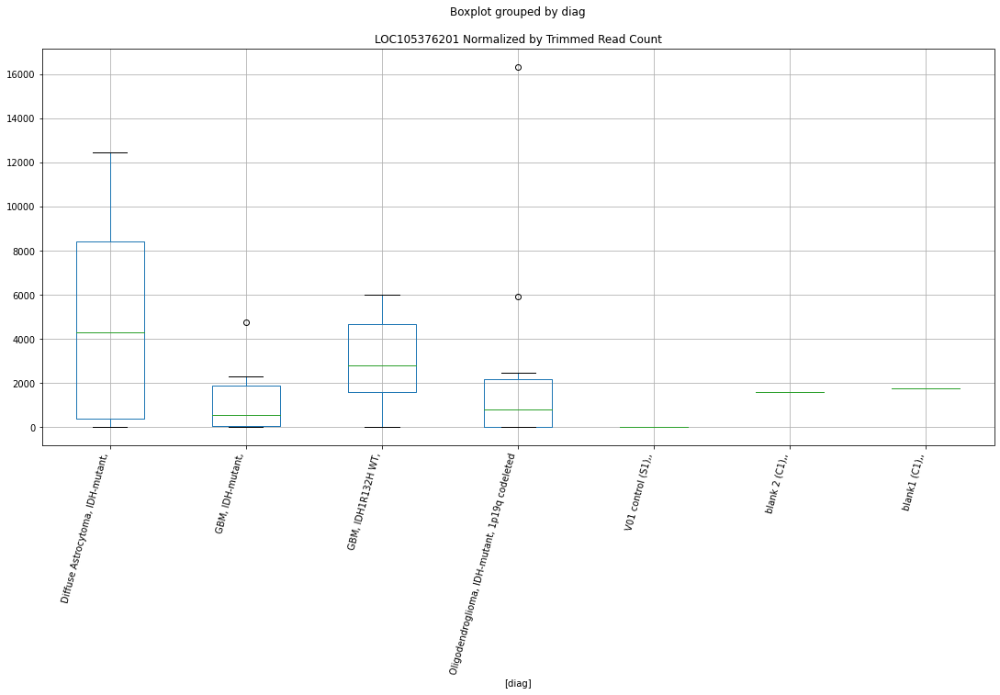

 p : 0.03426713581468157  ( t : 2.290693002416248 ) :  D-plex  :  bbduk2  :  LOC107985201
Control and blanks
73        0.00
337    1780.31
Name: LOC107985201, dtype: float64
205    0.0
Name: LOC107985201, dtype: float64
469    0.0
Name: LOC107985201, dtype: float64


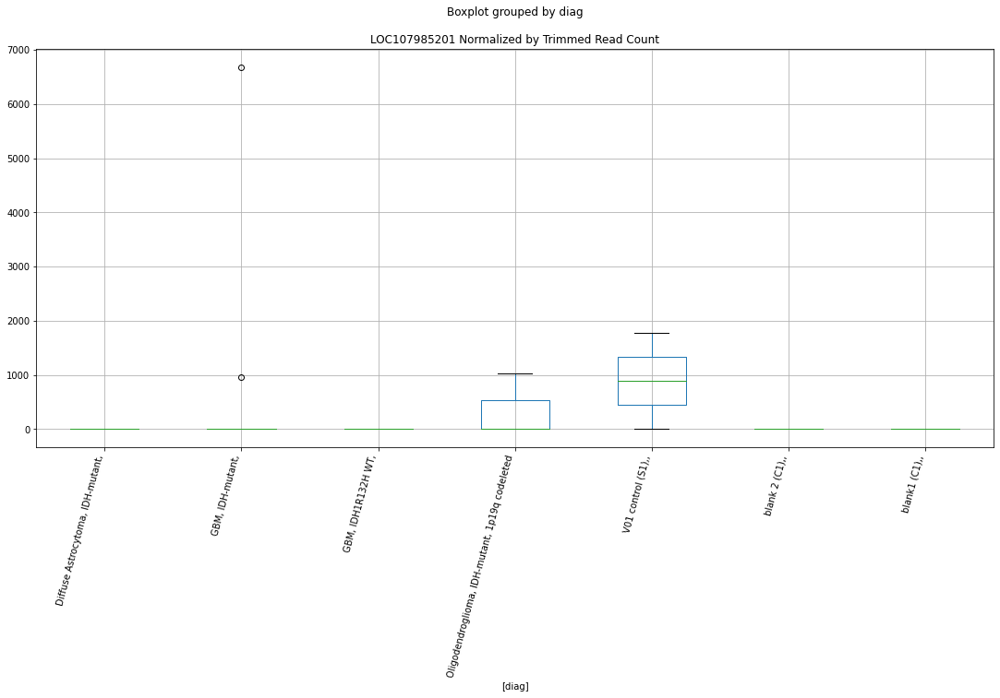

 p : 0.034445753540676624  ( t : 2.288120162825934 ) :  D-plex  :  cutadapt2  :  LOC105378827
Control and blanks
76     22728.43
340      880.73
Name: LOC105378827, dtype: float64
208    6878.05
Name: LOC105378827, dtype: float64
472    12137.07
Name: LOC105378827, dtype: float64


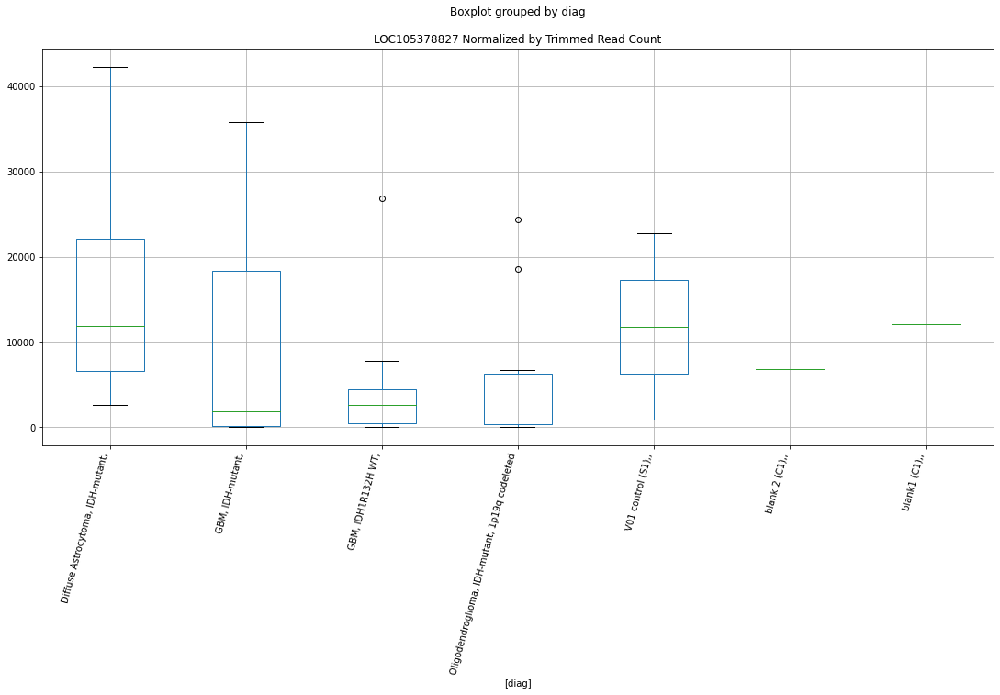

 p : 0.034491795421633664  ( t : 2.2874589710365973 ) :  D-plex  :  bbduk2  :  LOC107984087
Control and blanks
73     0.0
337    0.0
Name: LOC107984087, dtype: float64
205    358.18
Name: LOC107984087, dtype: float64
469    591.53
Name: LOC107984087, dtype: float64


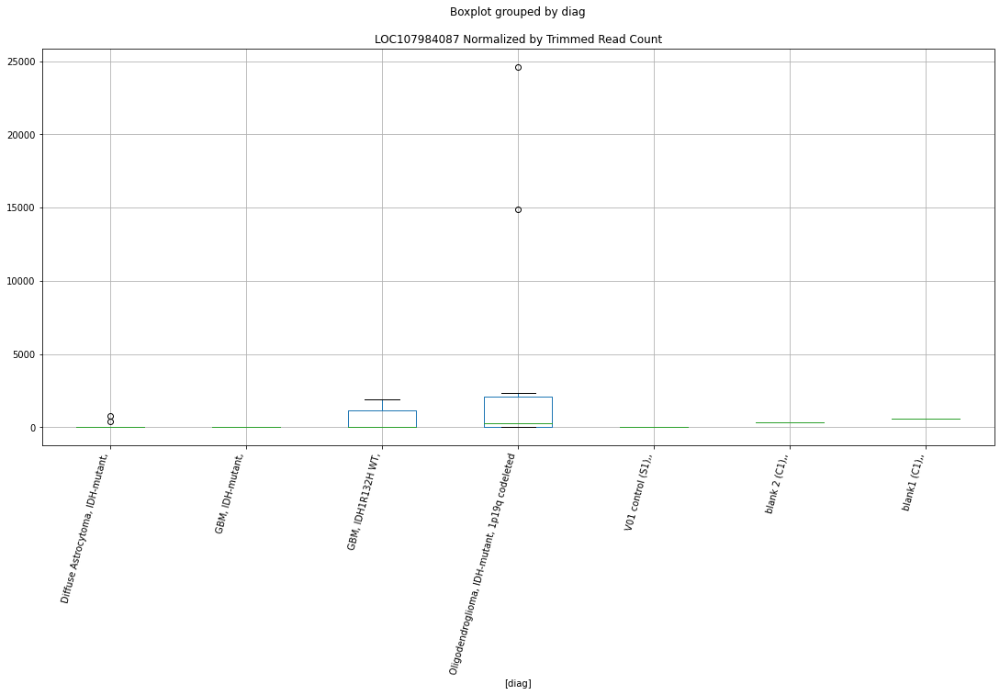

 p : 0.03450472394039999  ( t : 2.2872734559540464 ) :  D-plex  :  bbduk2  :  LOC105378691
Control and blanks
73     0.0
337    0.0
Name: LOC105378691, dtype: float64
205    0.0
Name: LOC105378691, dtype: float64
469    0.0
Name: LOC105378691, dtype: float64


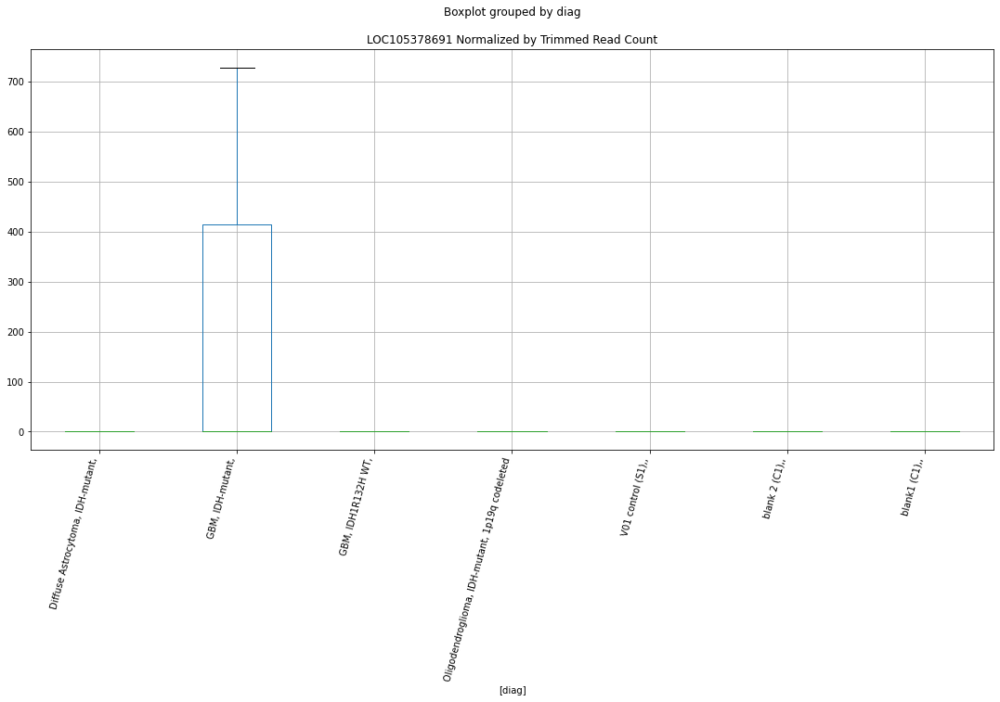

 p : 0.03452339250864701  ( t : 2.287005688778039 ) :  D-plex  :  cutadapt2  :  LOC105375166
Control and blanks
76     0.0
340    0.0
Name: LOC105375166, dtype: float64
208    0.0
Name: LOC105375166, dtype: float64
472    0.0
Name: LOC105375166, dtype: float64


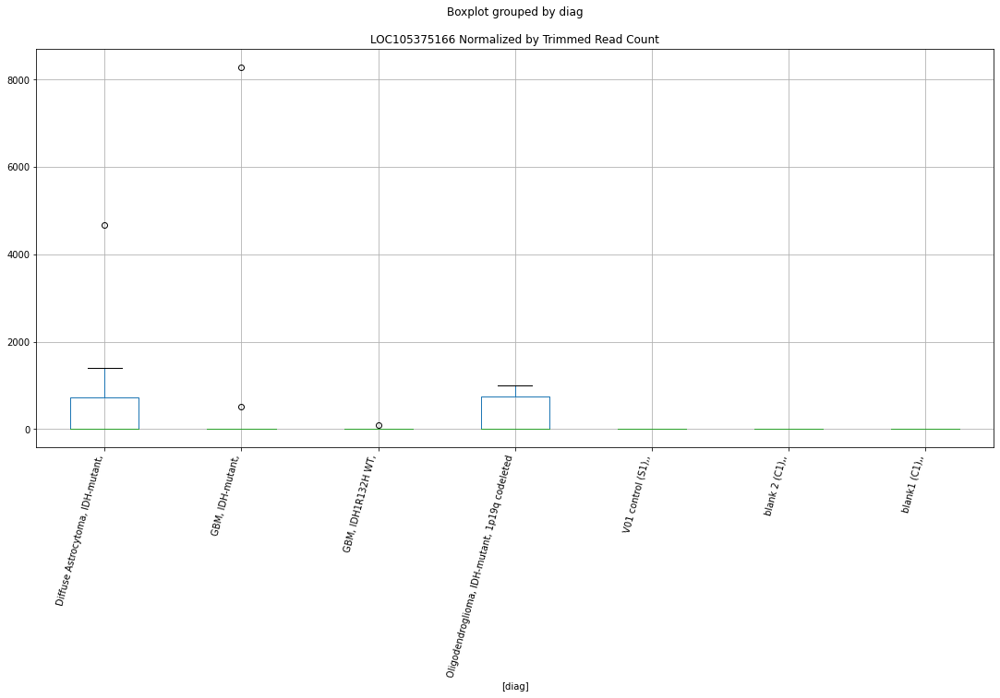

 p : 0.03471136837594517  ( t : 2.2843169579073734 ) :  D-plex  :  cutadapt2  :  LOC105374299
Control and blanks
76     0.0
340    0.0
Name: LOC105374299, dtype: float64
208    2116.32
Name: LOC105374299, dtype: float64
472    0.0
Name: LOC105374299, dtype: float64


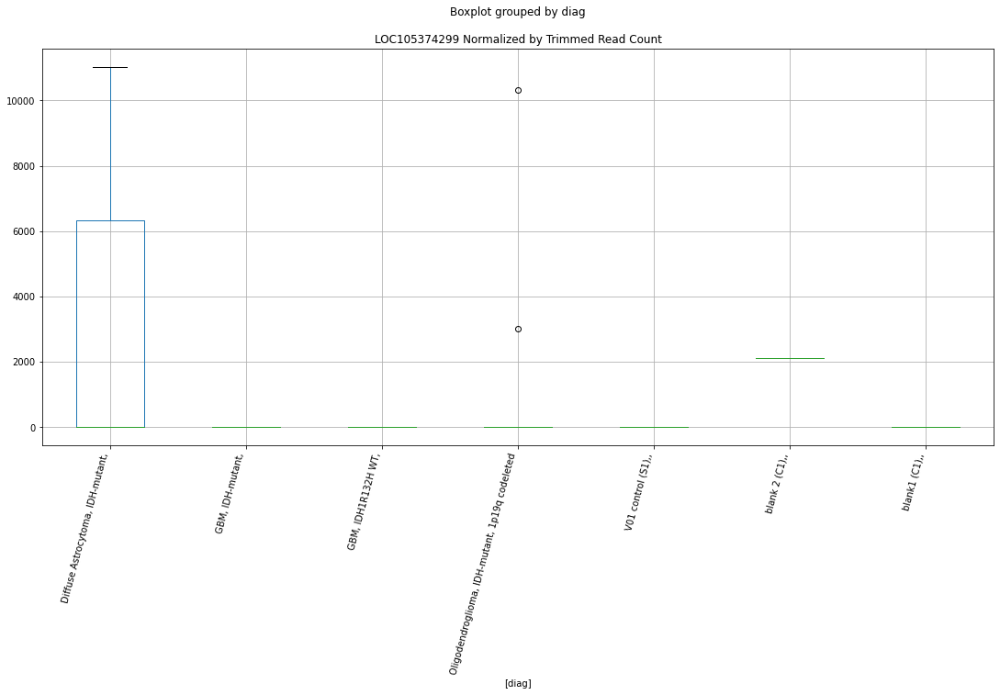

 p : 0.03473262223102589  ( t : 2.284013800132321 ) :  D-plex  :  bbduk2  :  LOC105374299
Control and blanks
73     0.0
337    0.0
Name: LOC105374299, dtype: float64
205    2149.09
Name: LOC105374299, dtype: float64
469    0.0
Name: LOC105374299, dtype: float64


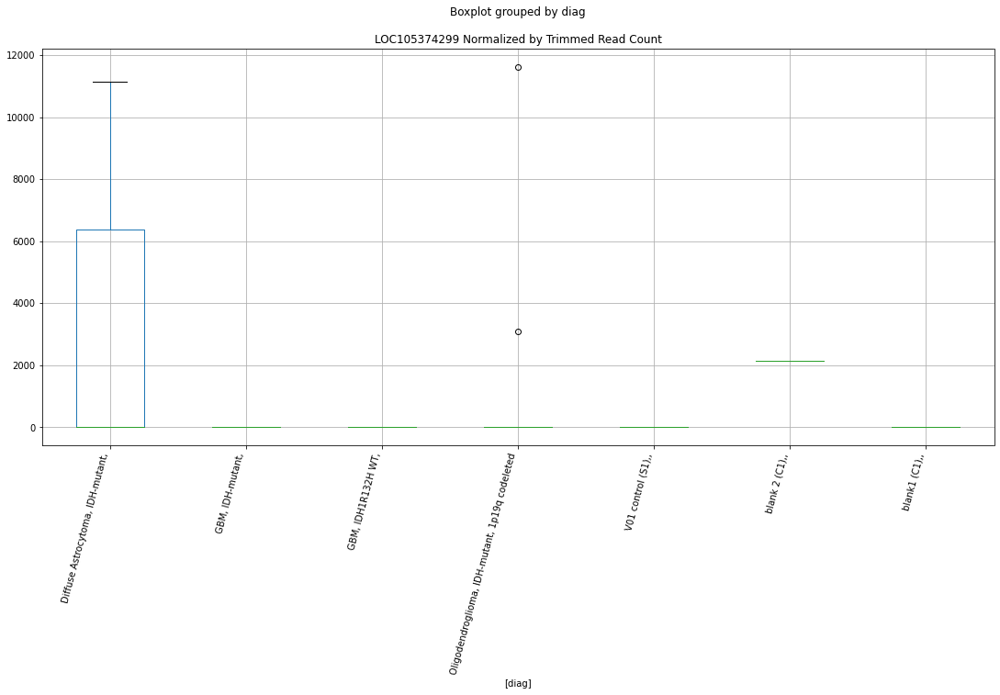

 p : 0.034855838795721975  ( t : 2.2822596572390426 ) :  D-plex  :  bbduk2  :  LOC105374897
Control and blanks
73     44061.48
337        0.00
Name: LOC105374897, dtype: float64
205    35997.28
Name: LOC105374897, dtype: float64
469    11239.02
Name: LOC105374897, dtype: float64


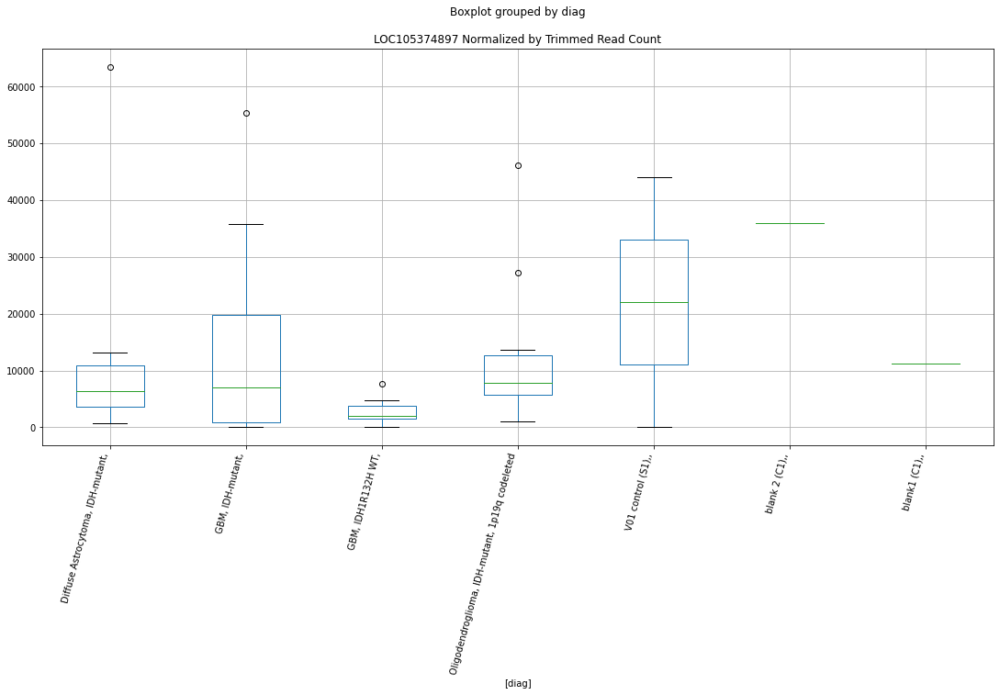

 p : 0.03503435816181408  ( t : 2.2797283641266874 ) :  D-plex  :  bbduk2  :  LOC105375114
Control and blanks
73     190160.07
337         0.00
Name: LOC105375114, dtype: float64
205    1074.55
Name: LOC105375114, dtype: float64
469    4140.69
Name: LOC105375114, dtype: float64


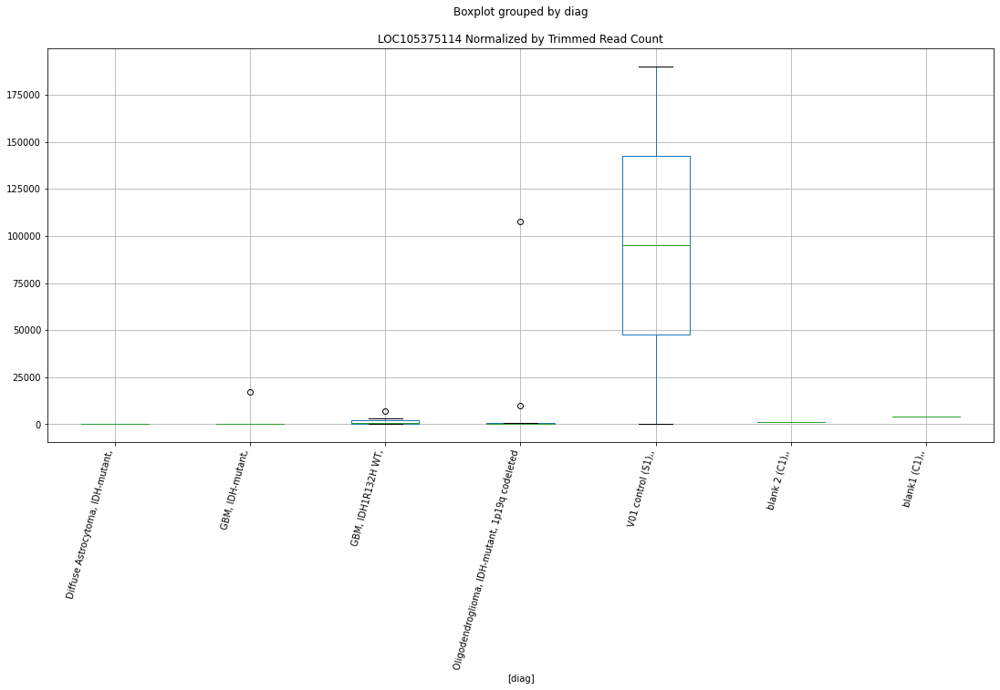

 p : 0.03515758185339795  ( t : 2.2779880829017314 ) :  D-plex  :  bbduk2  :  LOC105373117
Control and blanks
73     0.0
337    0.0
Name: LOC105373117, dtype: float64
205    358.18
Name: LOC105373117, dtype: float64
469    0.0
Name: LOC105373117, dtype: float64


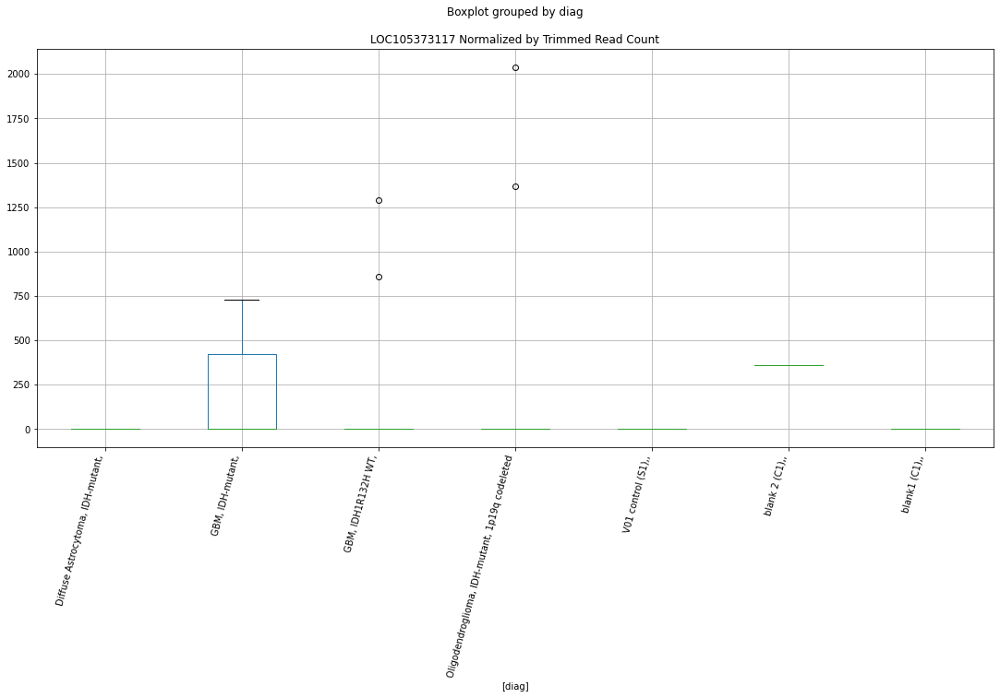

 p : 0.03541988059203542  ( t : 2.2743023660852075 ) :  D-plex  :  cutadapt2  :  LOC105376335
Control and blanks
76     0.0
340    0.0
Name: LOC105376335, dtype: float64
208    352.72
Name: LOC105376335, dtype: float64
472    1155.91
Name: LOC105376335, dtype: float64


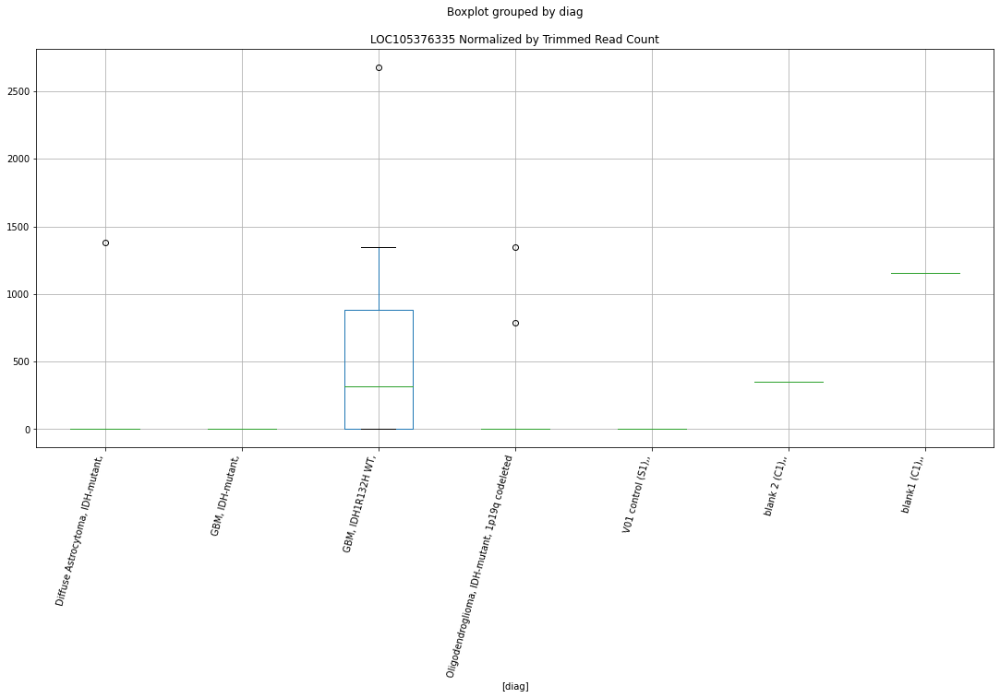

 p : 0.03561987410551775  ( t : 2.271509061641851 ) :  D-plex  :  cutadapt2  :  LOC105372585
Control and blanks
76     0.0
340    0.0
Name: LOC105372585, dtype: float64
208    0.0
Name: LOC105372585, dtype: float64
472    577.96
Name: LOC105372585, dtype: float64


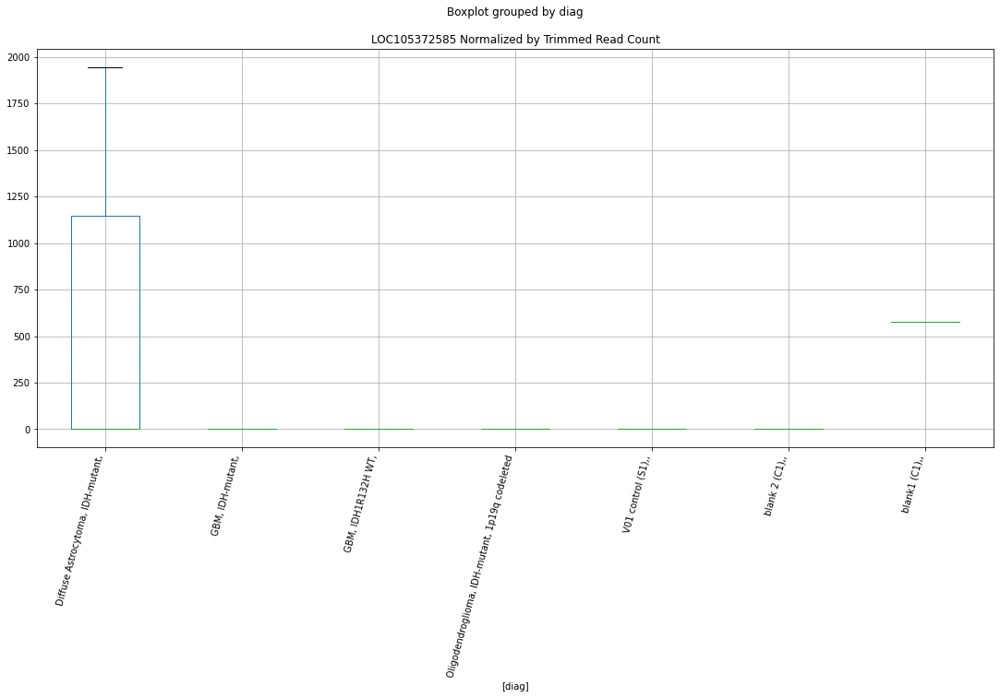

 p : 0.03573380711535235  ( t : 2.2699242398061363 ) :  D-plex  :  cutadapt2  :  LOC105378969
Control and blanks
76     0.0
340    0.0
Name: LOC105378969, dtype: float64
208    529.08
Name: LOC105378969, dtype: float64
472    577.96
Name: LOC105378969, dtype: float64


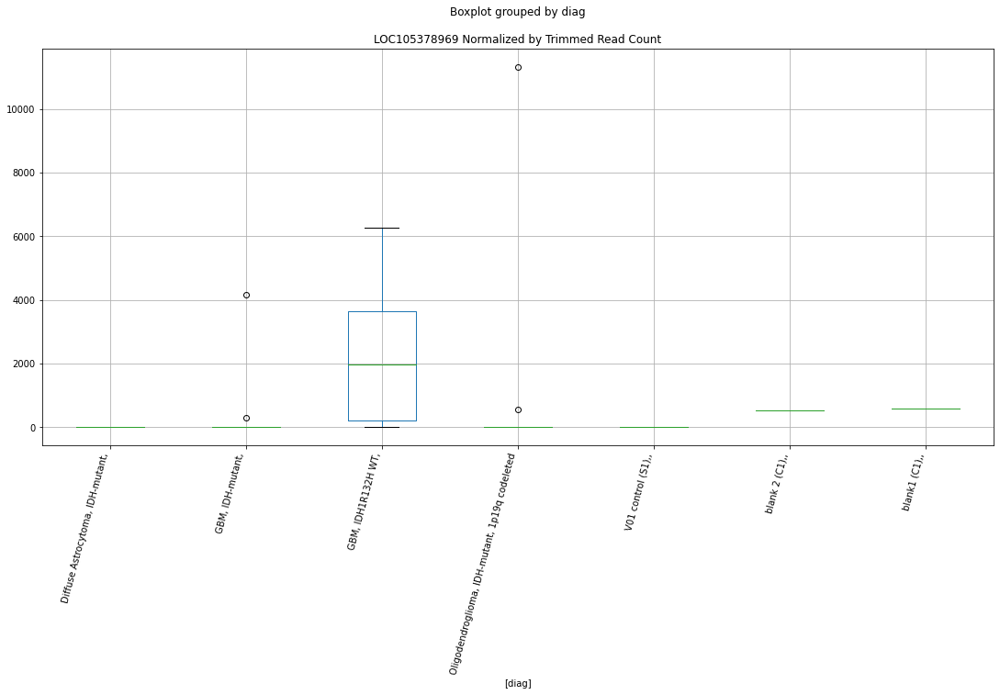

 p : 0.03608772197169179  ( t : 2.265030863773574 ) :  D-plex  :  cutadapt2  :  LOC105375158
Control and blanks
76       0.00
340    880.73
Name: LOC105375158, dtype: float64
208    352.72
Name: LOC105375158, dtype: float64
472    0.0
Name: LOC105375158, dtype: float64


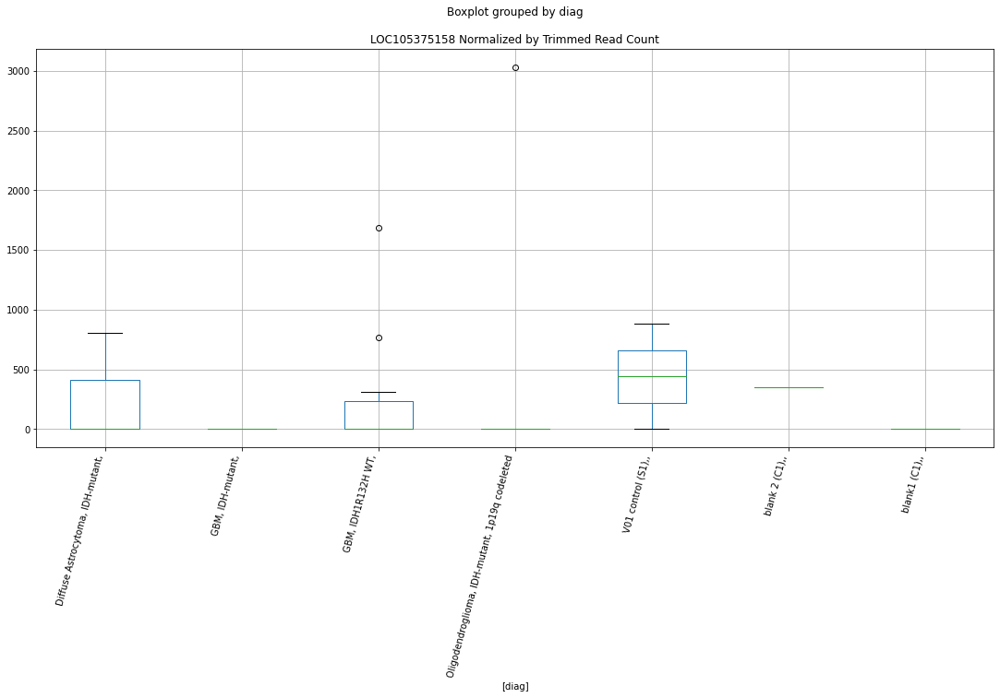

 p : 0.0361770746276424  ( t : 2.2638024501555245 ) :  D-plex  :  bbduk2  :  LOC105375601
Control and blanks
73     0.0
337    0.0
Name: LOC105375601, dtype: float64
205    358.18
Name: LOC105375601, dtype: float64
469    2366.11
Name: LOC105375601, dtype: float64


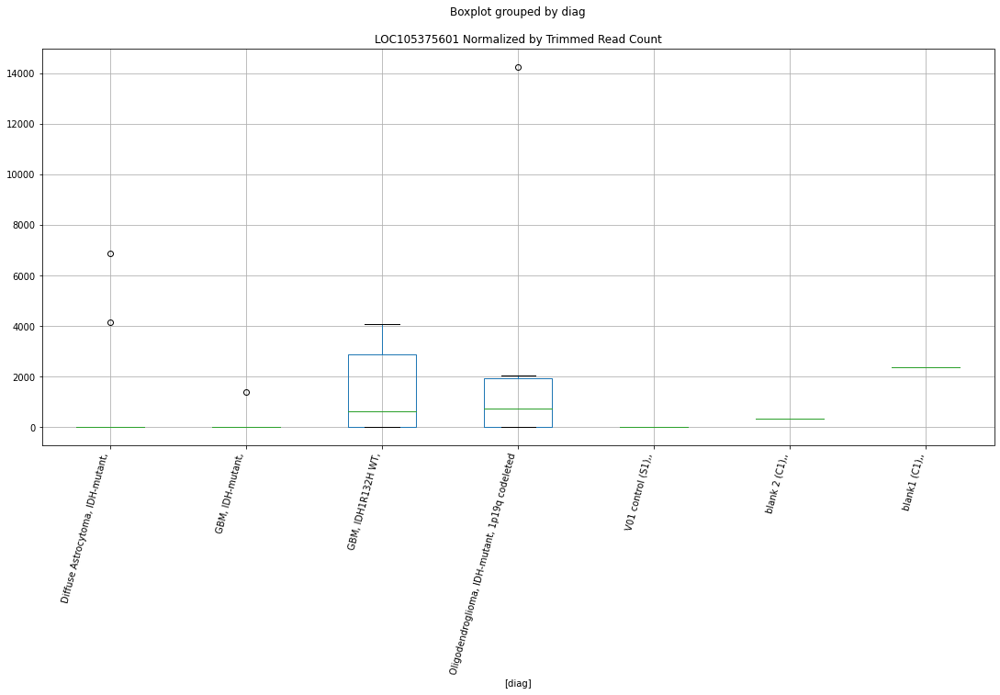

 p : 0.03621171840158646  ( t : 2.2633269242540237 ) :  D-plex  :  cutadapt2  :  LOC105375601
Control and blanks
76     0.0
340    0.0
Name: LOC105375601, dtype: float64
208    352.72
Name: LOC105375601, dtype: float64
472    2311.82
Name: LOC105375601, dtype: float64


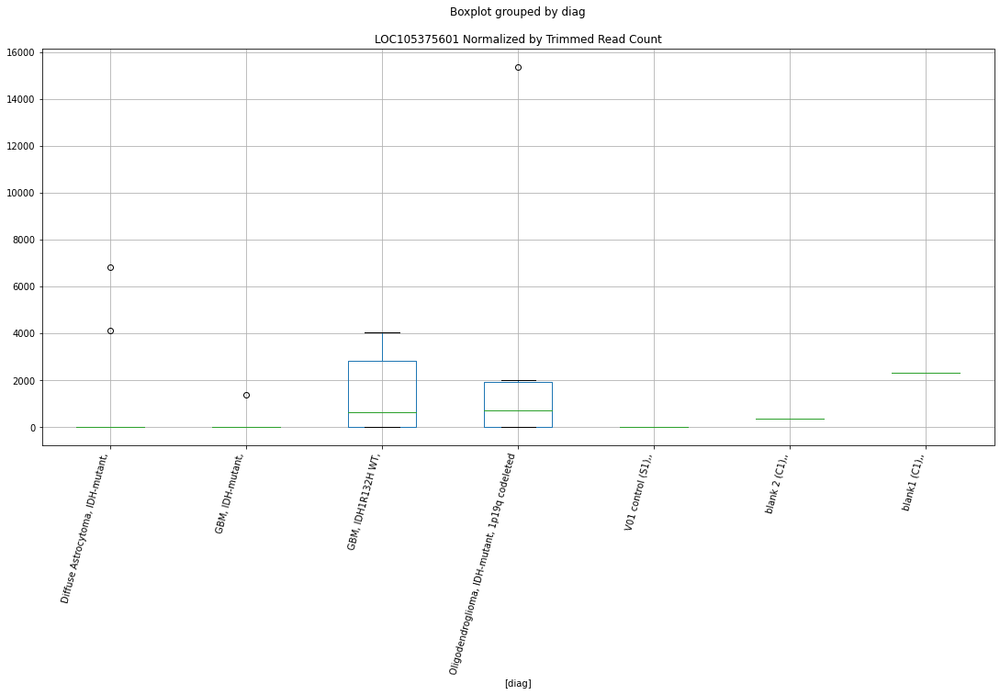

 p : 0.03626067377875524  ( t : 2.2626556712354513 ) :  Lexogen  :  cutadapt2  :  LOC107985368
Control and blanks
82       0.0
346    631.3
Name: LOC107985368, dtype: float64
214    0.0
Name: LOC107985368, dtype: float64
478    0.0
Name: LOC107985368, dtype: float64


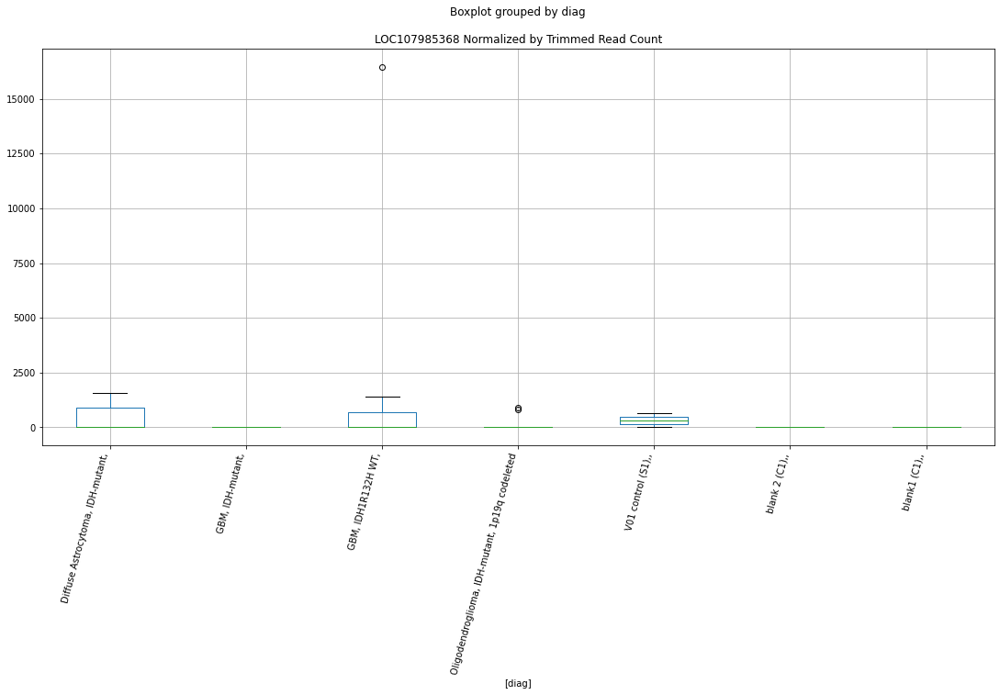

 p : 0.03646694423210525  ( t : 2.2598365528871964 ) :  D-plex  :  bbduk2  :  LOC105378675
Control and blanks
73     0.0
337    0.0
Name: LOC105378675, dtype: float64
205    1790.91
Name: LOC105378675, dtype: float64
469    2366.11
Name: LOC105378675, dtype: float64


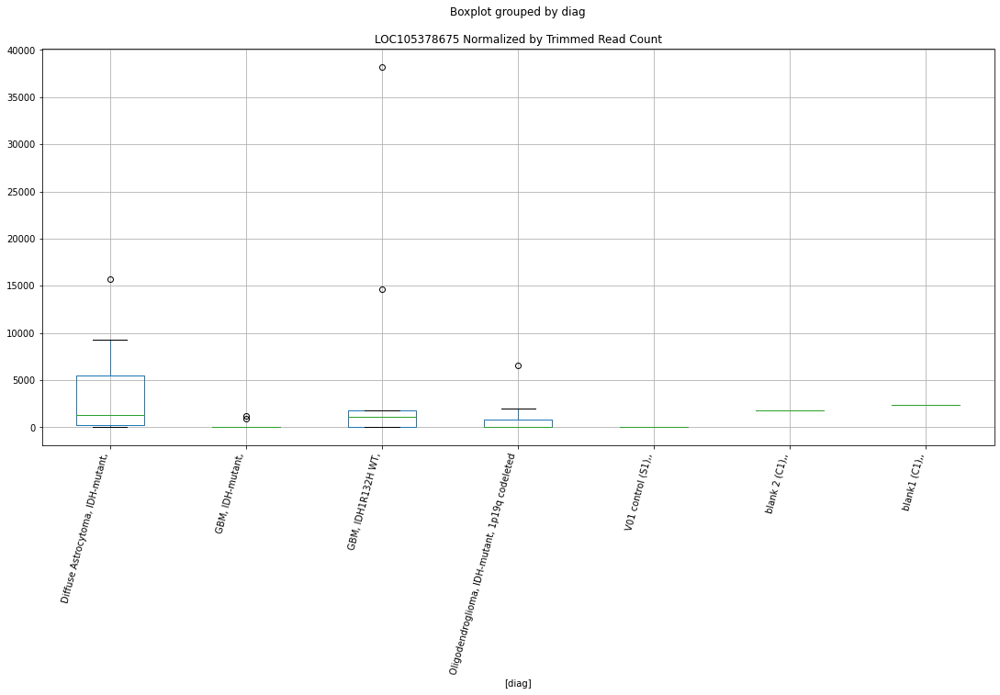

 p : 0.036525426746240555  ( t : 2.259039946860331 ) :  D-plex  :  cutadapt2  :  LOC105374965
Control and blanks
76     0.0
340    0.0
Name: LOC105374965, dtype: float64
208    352.72
Name: LOC105374965, dtype: float64
472    0.0
Name: LOC105374965, dtype: float64


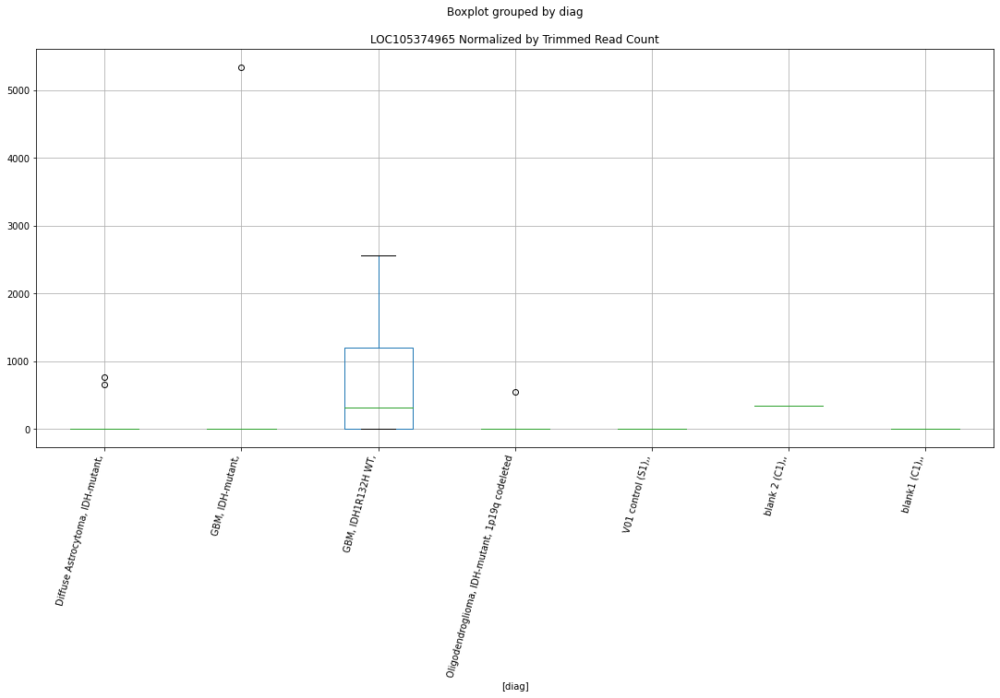

 p : 0.03663436480619671  ( t : 2.2575592081982854 ) :  D-plex  :  cutadapt2  :  LOC107986008
Control and blanks
76     1515.23
340    1761.46
Name: LOC107986008, dtype: float64
208    881.8
Name: LOC107986008, dtype: float64
472    577.96
Name: LOC107986008, dtype: float64


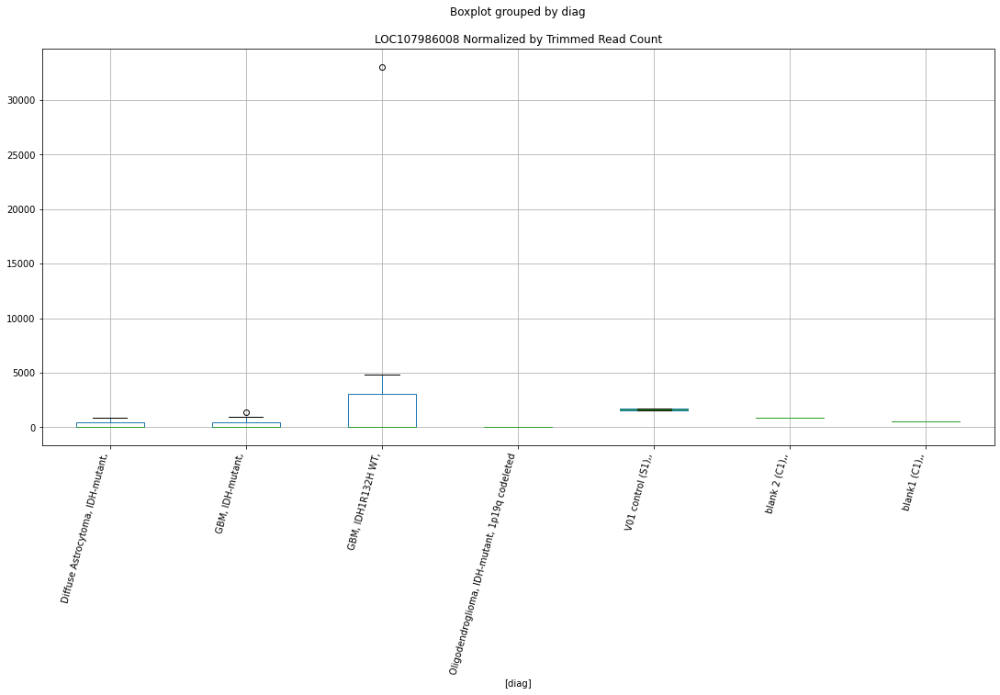

 p : 0.03669090256994893  ( t : 2.2567923217815693 ) :  D-plex  :  bbduk2  :  LOC105379549
Control and blanks
73      773.01
337    3560.63
Name: LOC105379549, dtype: float64
205    3940.0
Name: LOC105379549, dtype: float64
469    1774.58
Name: LOC105379549, dtype: float64


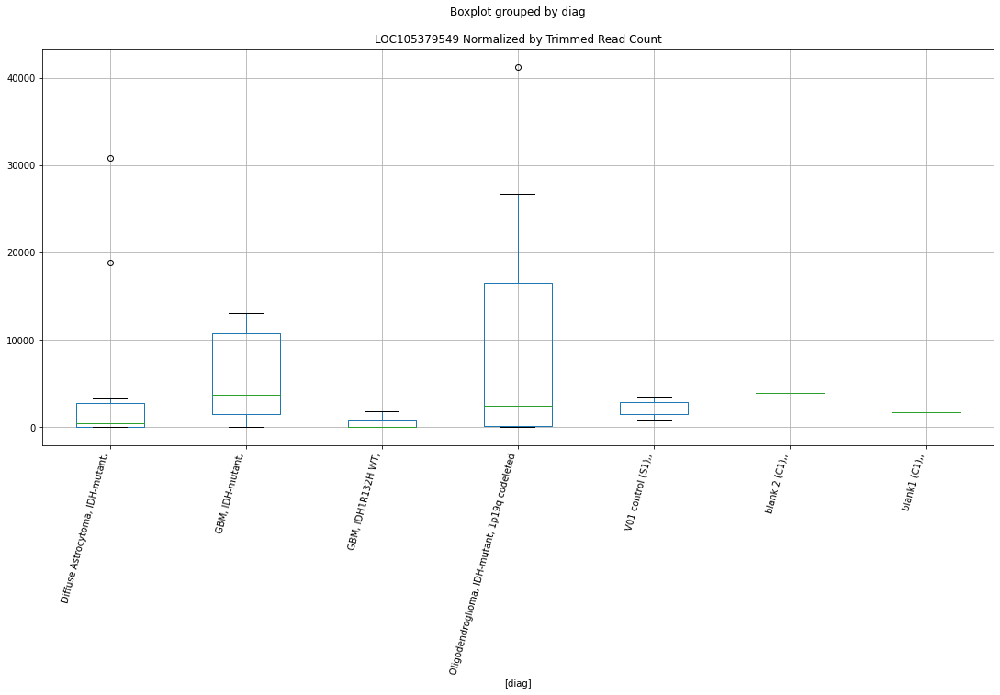

 p : 0.036734415165331484  ( t : 2.256202853371272 ) :  D-plex  :  bbduk2  :  LOC107984035
Control and blanks
73     773.01
337      0.00
Name: LOC107984035, dtype: float64
205    0.0
Name: LOC107984035, dtype: float64
469    591.53
Name: LOC107984035, dtype: float64


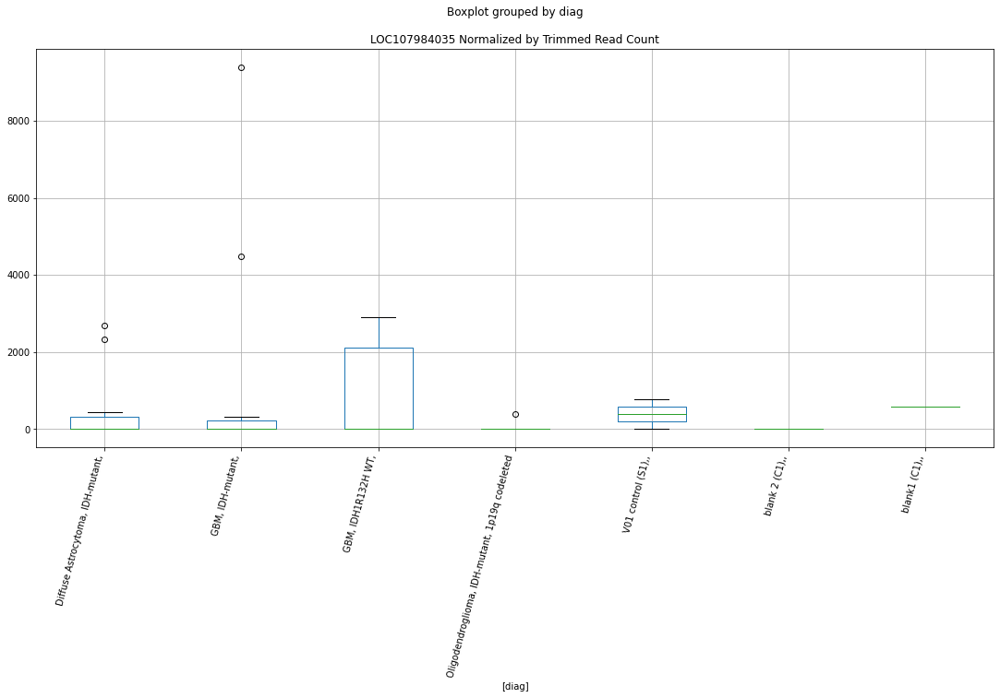

 p : 0.0368474267030031  ( t : 2.254674883978538 ) :  D-plex  :  bbduk2  :  LOC105373945
Control and blanks
73     0.0
337    0.0
Name: LOC105373945, dtype: float64
205    2686.36
Name: LOC105373945, dtype: float64
469    591.53
Name: LOC105373945, dtype: float64


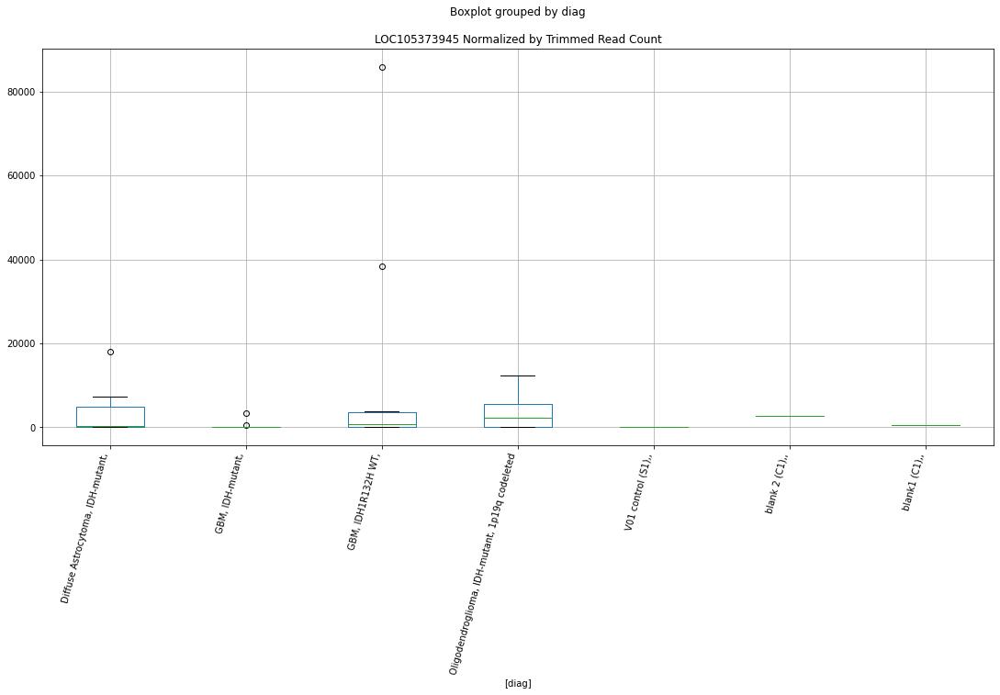

 p : 0.036866000888779046  ( t : 2.2544241663120115 ) :  D-plex  :  bbduk2  :  LOC105378811
Control and blanks
73     0.0
337    0.0
Name: LOC105378811, dtype: float64
205    358.18
Name: LOC105378811, dtype: float64
469    0.0
Name: LOC105378811, dtype: float64


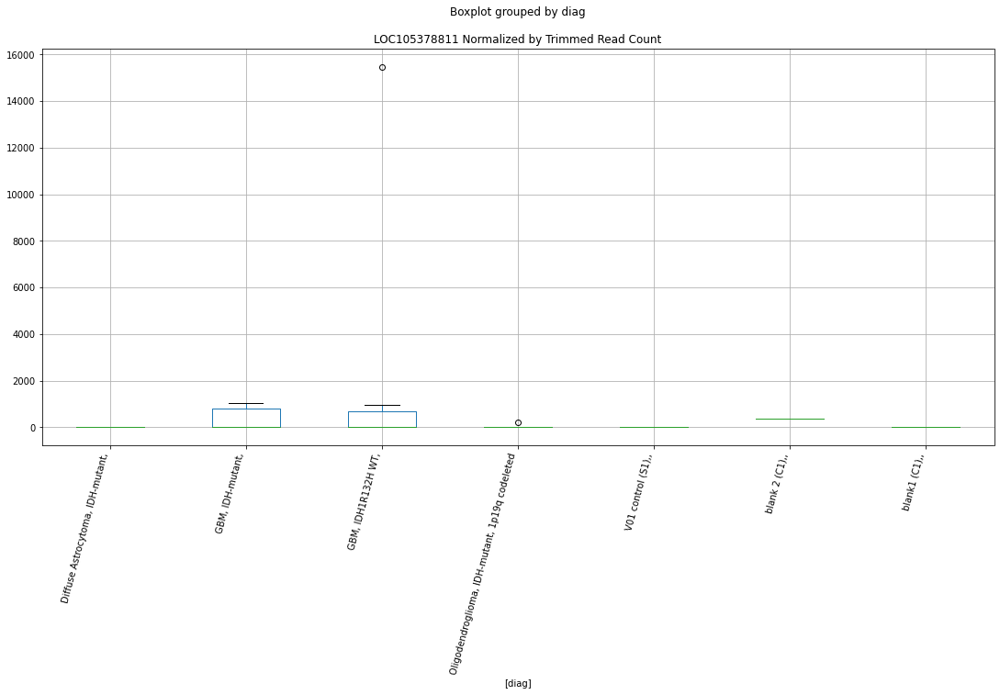

 p : 0.036956333731046315  ( t : 2.253206497773207 ) :  D-plex  :  bbduk2  :  LOC107984748
Control and blanks
73       0.00
337    890.16
Name: LOC107984748, dtype: float64
205    179.09
Name: LOC107984748, dtype: float64
469    591.53
Name: LOC107984748, dtype: float64


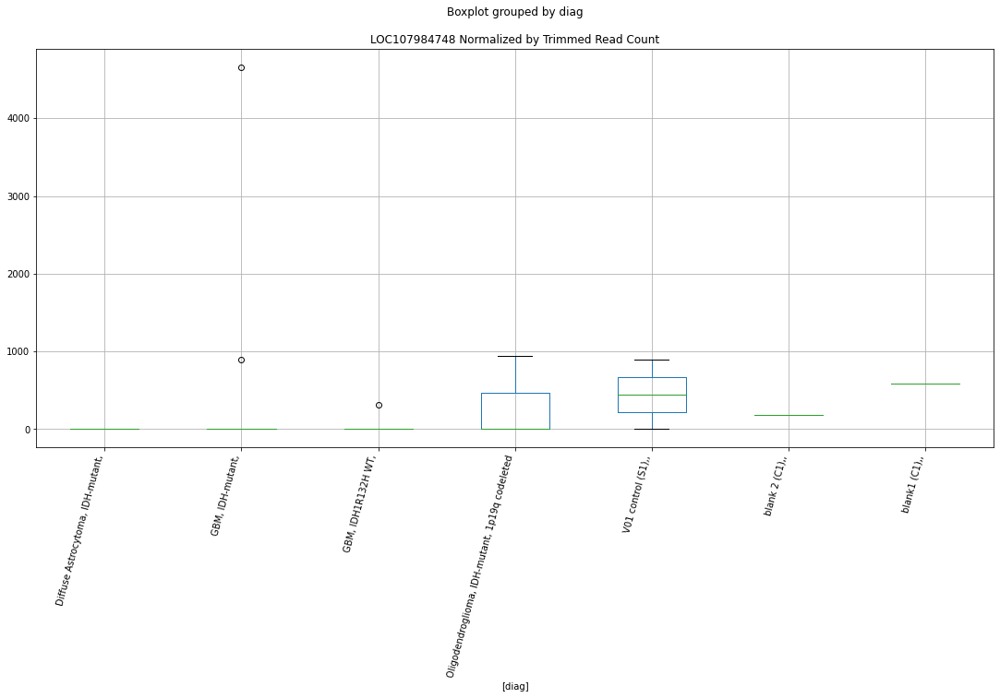

 p : 0.037199592643619044  ( t : 2.2499410260603874 ) :  Lexogen  :  bbduk2  :  LOC105376278
Control and blanks
79     0.0
343    0.0
Name: LOC105376278, dtype: float64
211    0.0
Name: LOC105376278, dtype: float64
475    0.0
Name: LOC105376278, dtype: float64


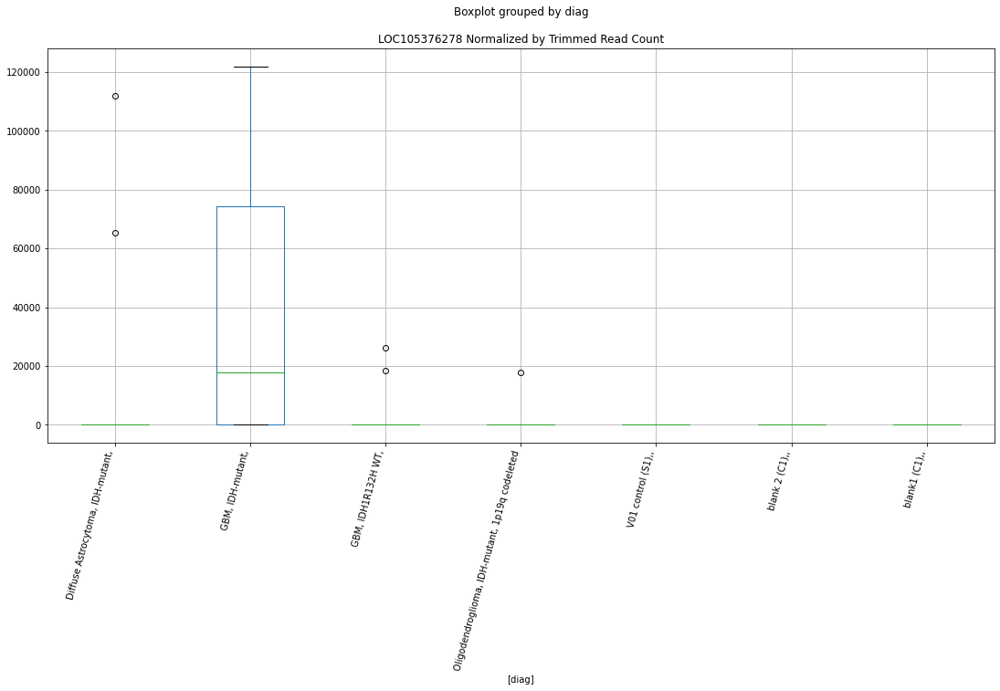

 p : 0.03723601520212981  ( t : 2.249453792258446 ) :  Lexogen  :  cutadapt2  :  LOC105376278
Control and blanks
82     0.0
346    0.0
Name: LOC105376278, dtype: float64
214    0.0
Name: LOC105376278, dtype: float64
478    0.0
Name: LOC105376278, dtype: float64


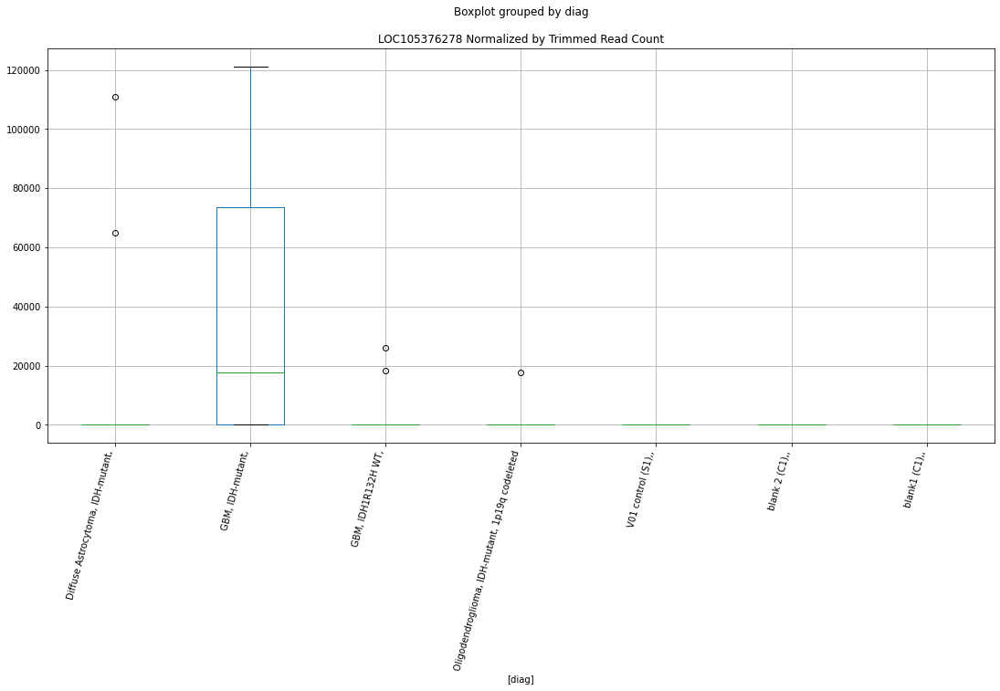

 p : 0.03735623027537225  ( t : 2.247848760016162 ) :  D-plex  :  bbduk2  :  LOC105373819
Control and blanks
73     773.01
337    890.16
Name: LOC105373819, dtype: float64
205    0.0
Name: LOC105373819, dtype: float64
469    591.53
Name: LOC105373819, dtype: float64


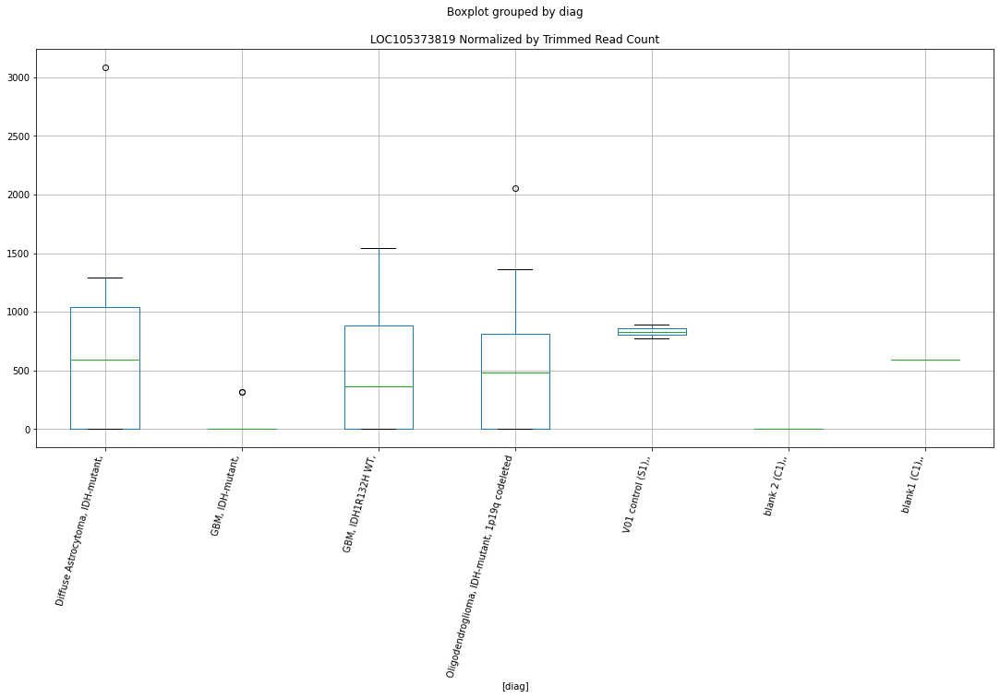

 p : 0.037375893113977696  ( t : 2.247586688401377 ) :  D-plex  :  bbduk2  :  LOC105377762
Control and blanks
73     0.0
337    0.0
Name: LOC105377762, dtype: float64
205    716.36
Name: LOC105377762, dtype: float64
469    2366.11
Name: LOC105377762, dtype: float64


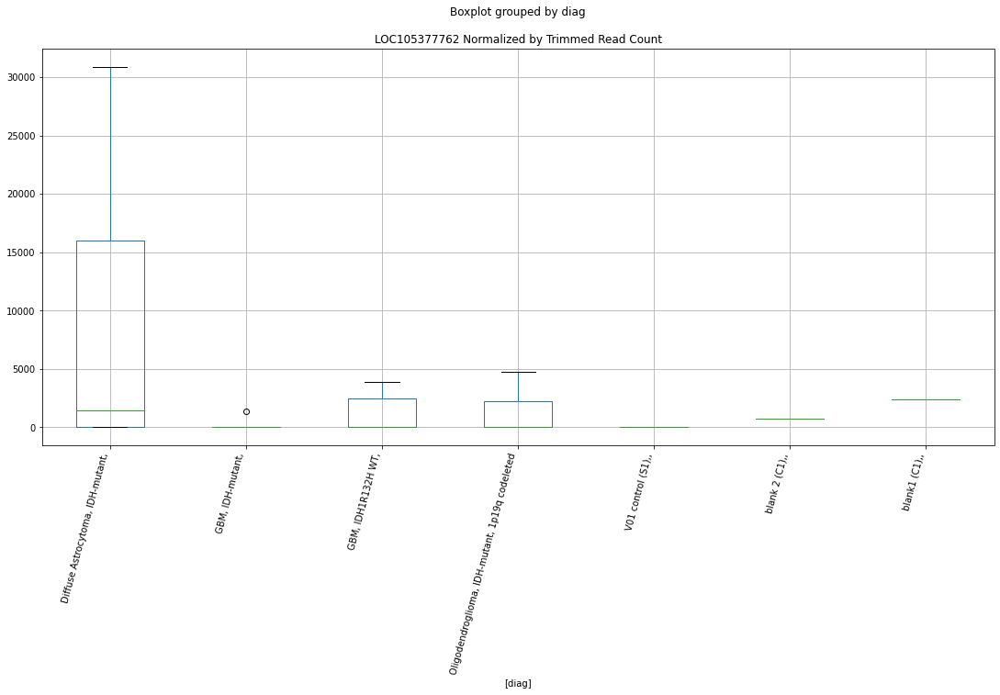

 p : 0.037402617829297956  ( t : 2.2472306980512573 ) :  D-plex  :  cutadapt2  :  LOC105377762
Control and blanks
76     0.0
340    0.0
Name: LOC105377762, dtype: float64
208    529.08
Name: LOC105377762, dtype: float64
472    1733.87
Name: LOC105377762, dtype: float64


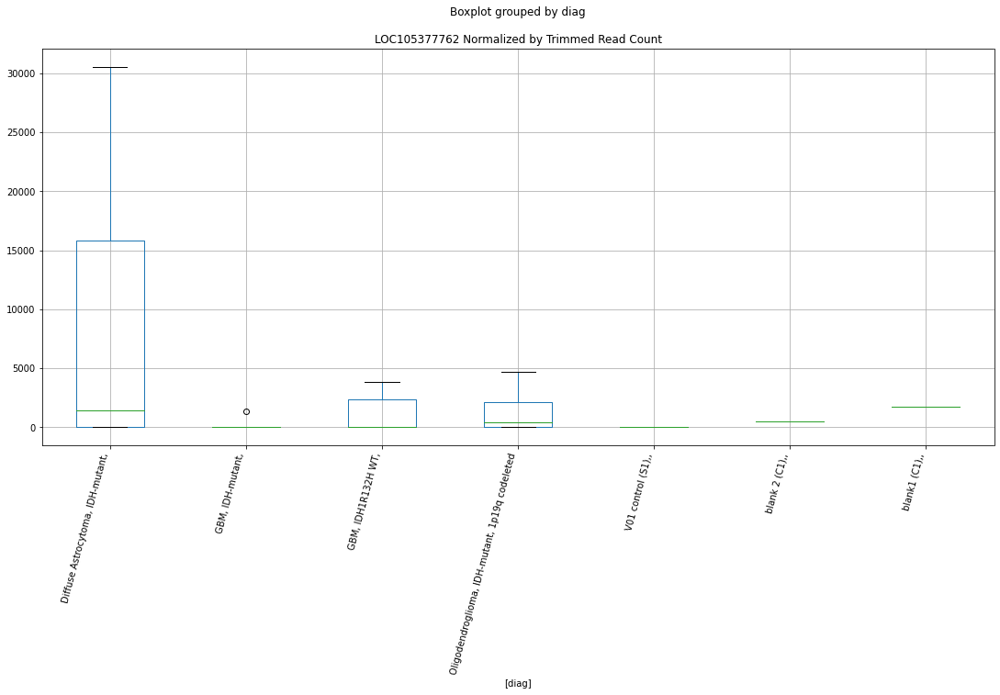

 p : 0.03745748700730038  ( t : 2.246500540317258 ) :  D-plex  :  bbduk2  :  LOC105378193
Control and blanks
73         0.00
337    16912.99
Name: LOC105378193, dtype: float64
205    716.36
Name: LOC105378193, dtype: float64
469    591.53
Name: LOC105378193, dtype: float64


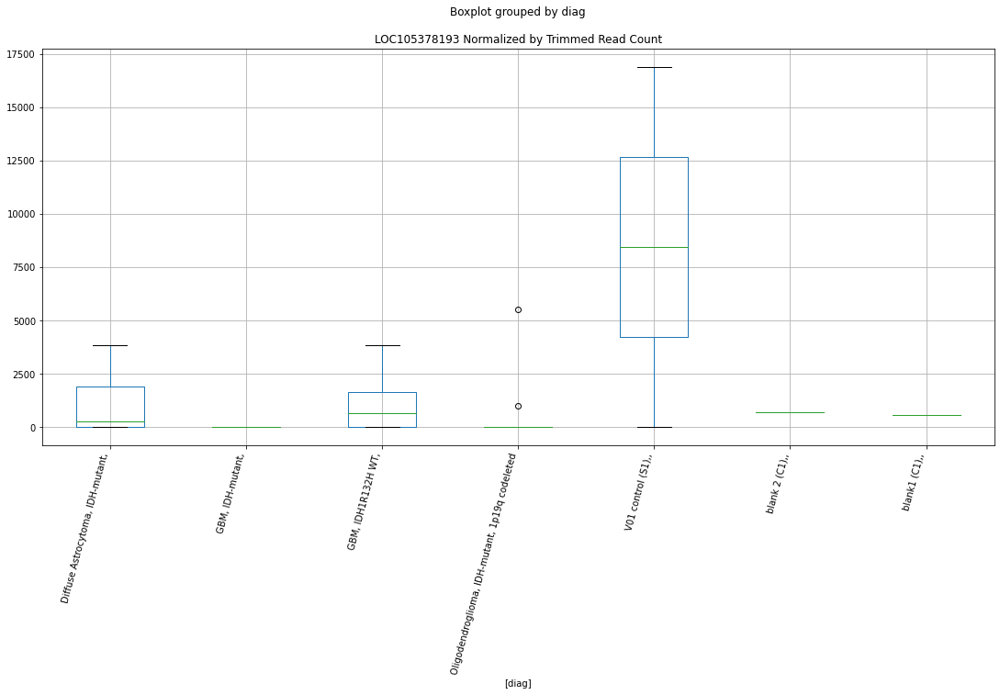

 p : 0.037469734362286435  ( t : 2.2463376964446313 ) :  D-plex  :  cutadapt2  :  LOC105376390
Control and blanks
76       0.00
340    880.73
Name: LOC105376390, dtype: float64
208    5643.53
Name: LOC105376390, dtype: float64
472    4045.69
Name: LOC105376390, dtype: float64


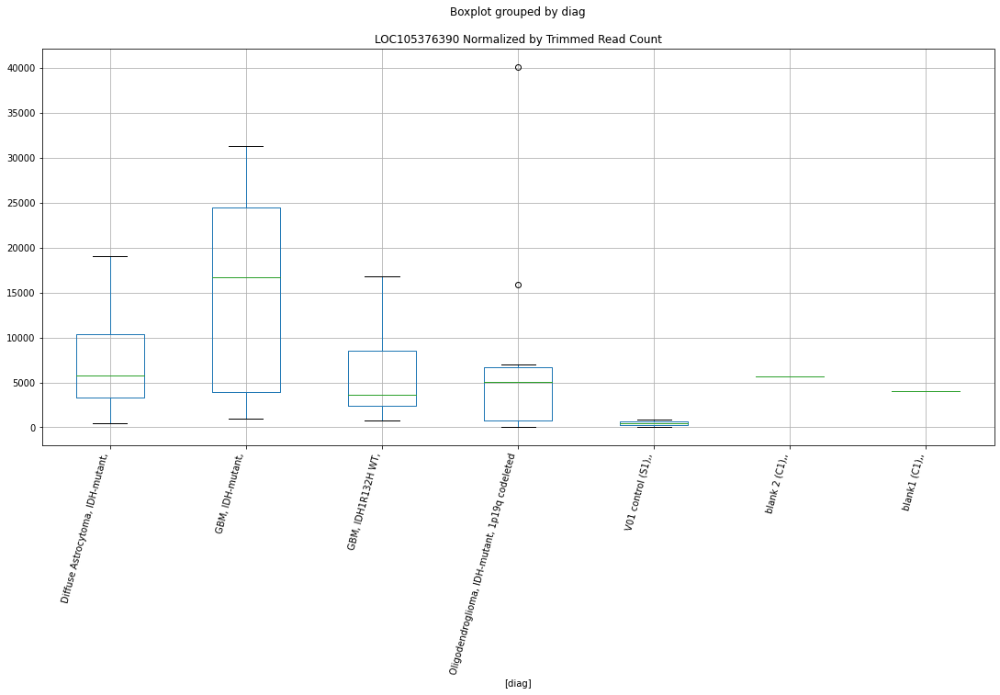

 p : 0.03752066096210623  ( t : 2.2456610898901737 ) :  D-plex  :  cutadapt2  :  LOC105375144
Control and blanks
76         0.0
340    24660.5
Name: LOC105375144, dtype: float64
208    5290.81
Name: LOC105375144, dtype: float64
472    0.0
Name: LOC105375144, dtype: float64


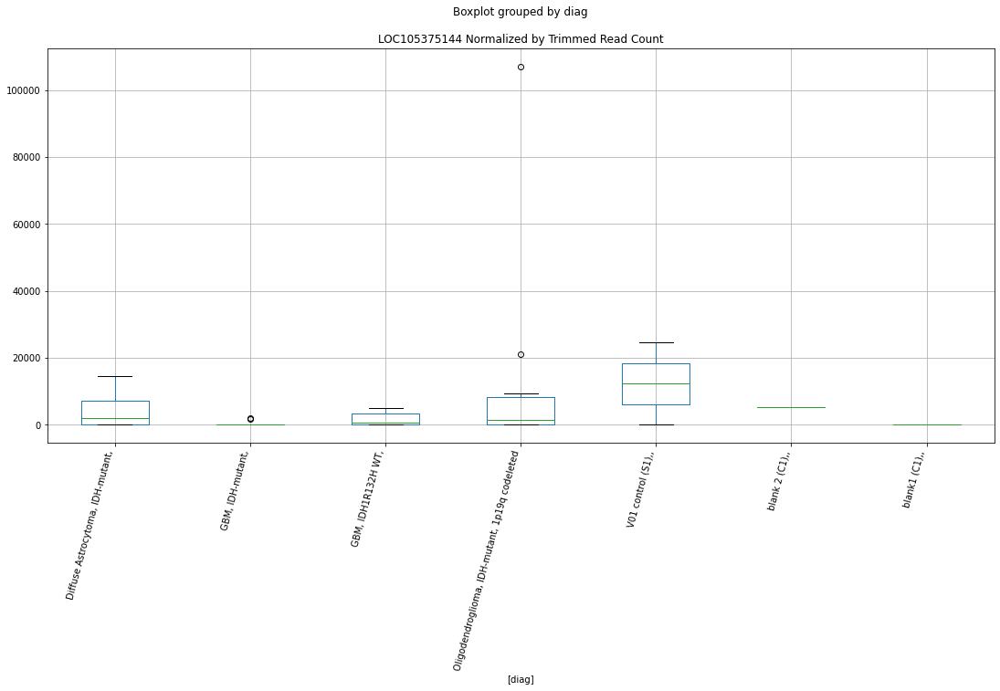

 p : 0.03757453921635505  ( t : 2.24494618949776 ) :  D-plex  :  bbduk2  :  LOC105378969
Control and blanks
73     0.0
337    0.0
Name: LOC105378969, dtype: float64
205    895.45
Name: LOC105378969, dtype: float64
469    1183.05
Name: LOC105378969, dtype: float64


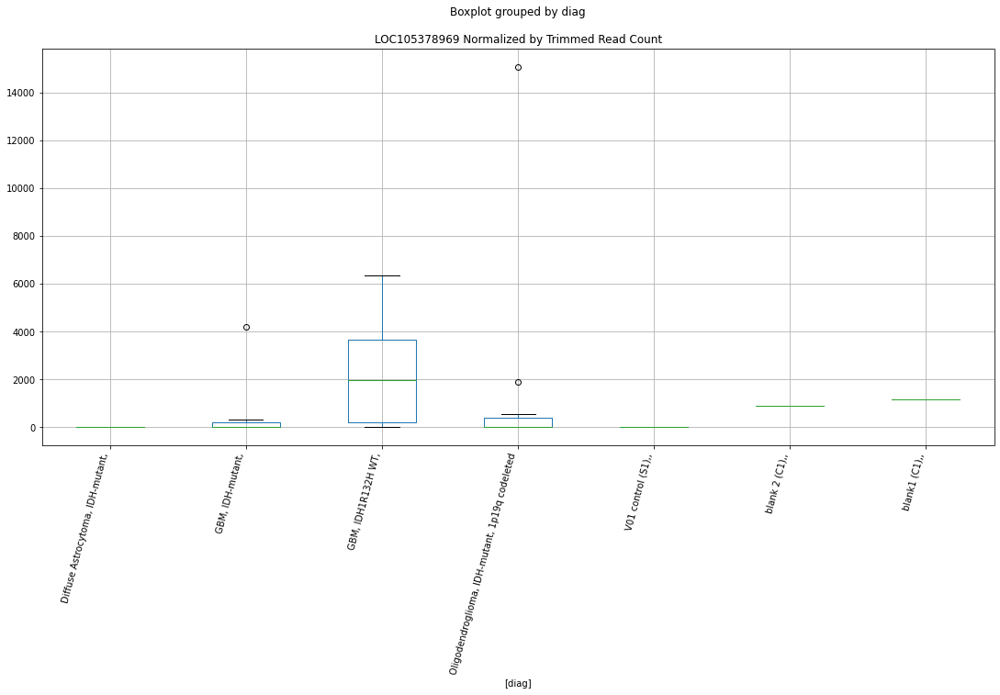

 p : 0.037639122830564566  ( t : 2.244090486678451 ) :  D-plex  :  cutadapt2  :  LOC105379549
Control and blanks
76      757.61
340    1761.46
Name: LOC105379549, dtype: float64
208    3879.92
Name: LOC105379549, dtype: float64
472    1733.87
Name: LOC105379549, dtype: float64


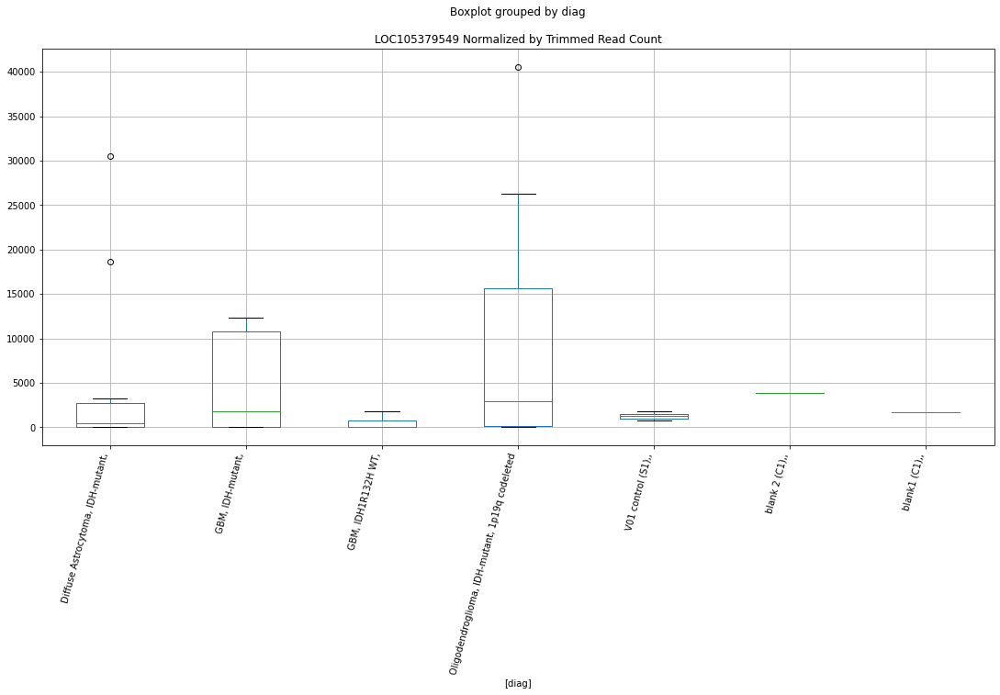

 p : 0.03765156274899378  ( t : 2.243925819114578 ) :  D-plex  :  cutadapt2  :  LOC105378193
Control and blanks
76         0.00
340    16733.91
Name: LOC105378193, dtype: float64
208    705.44
Name: LOC105378193, dtype: float64
472    577.96
Name: LOC105378193, dtype: float64


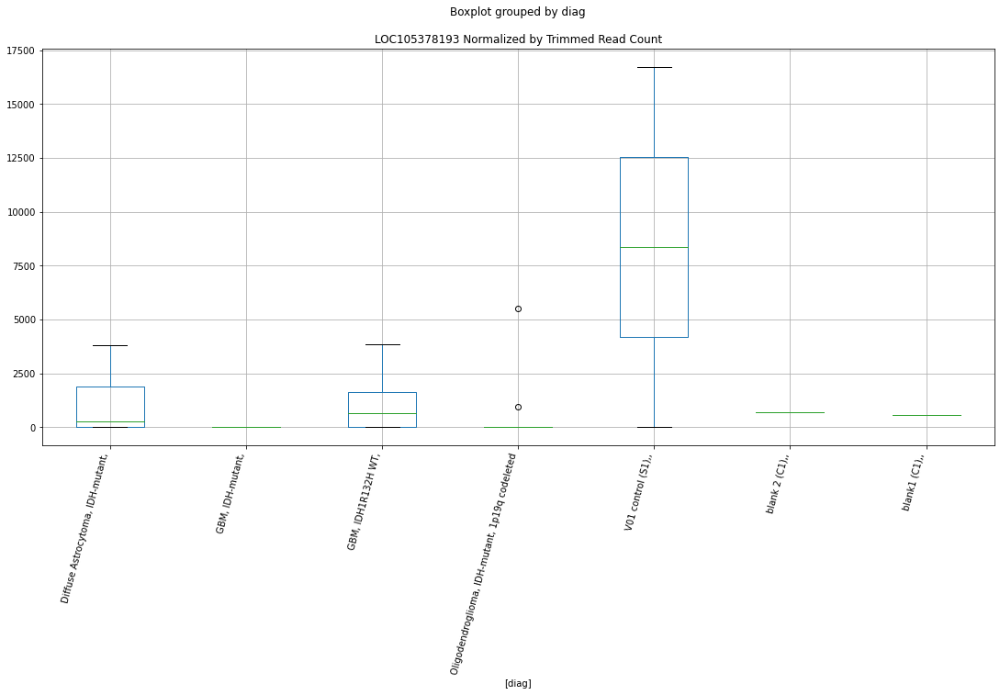

 p : 0.03786144294645518  ( t : 2.2411551666547687 ) :  D-plex  :  cutadapt2  :  LOC105378024
Control and blanks
76     0.0
340    0.0
Name: LOC105378024, dtype: float64
208    0.0
Name: LOC105378024, dtype: float64
472    0.0
Name: LOC105378024, dtype: float64


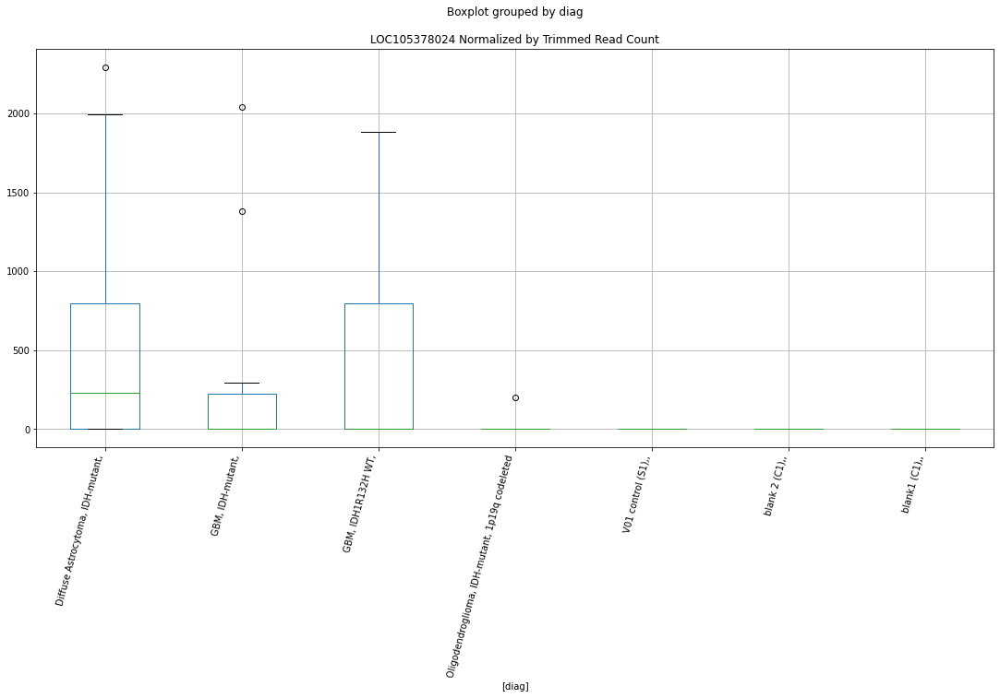

 p : 0.03788196439643579  ( t : 2.2408850212509703 ) :  D-plex  :  bbduk2  :  LOC107984156
Control and blanks
73     0.0
337    0.0
Name: LOC107984156, dtype: float64
205    6268.18
Name: LOC107984156, dtype: float64
469    6506.8
Name: LOC107984156, dtype: float64


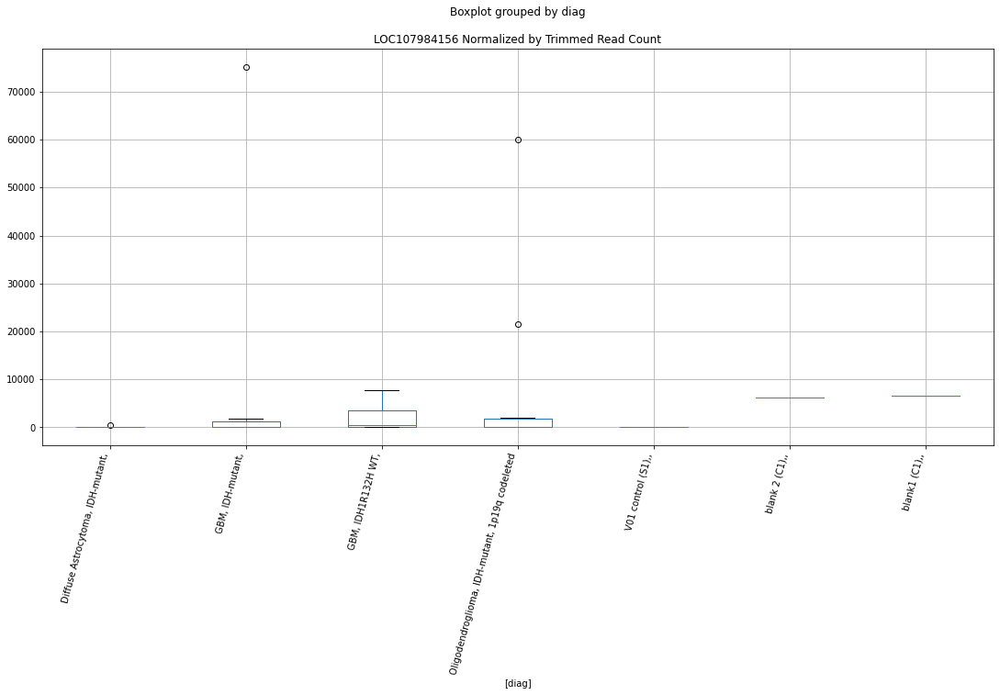

 p : 0.03793407804016912  ( t : 2.2401996005550133 ) :  D-plex  :  bbduk2  :  LOC105747689
Control and blanks
73     1546.02
337       0.00
Name: LOC105747689, dtype: float64
205    33310.92
Name: LOC105747689, dtype: float64
469    3549.16
Name: LOC105747689, dtype: float64


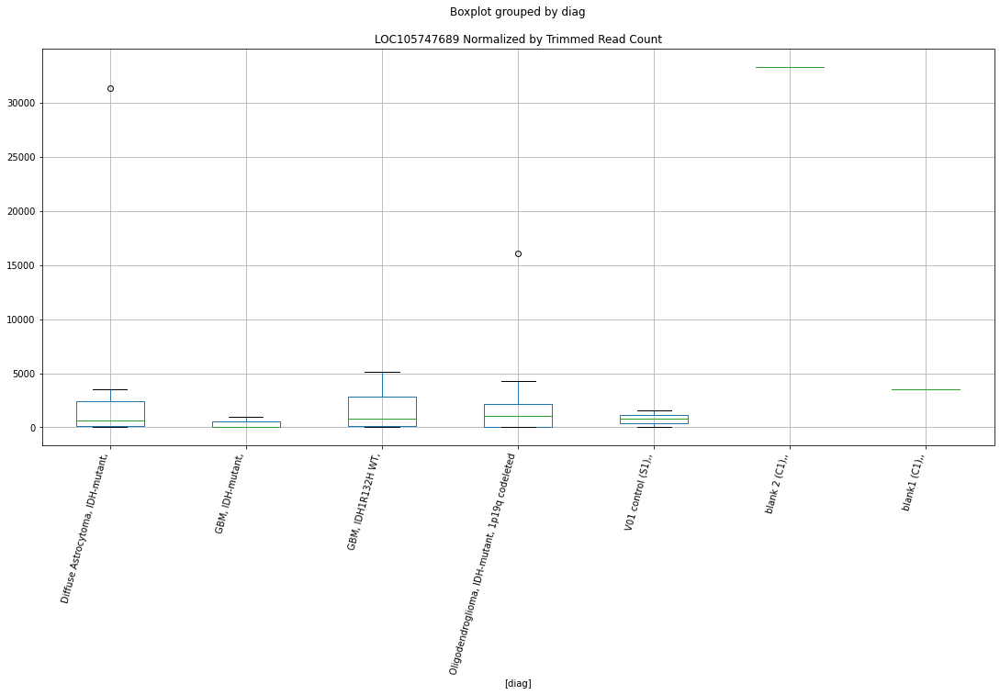

 p : 0.03794184691988766  ( t : 2.24009749532938 ) :  D-plex  :  cutadapt2  :  LOC105378787
Control and blanks
76     0.0
340    0.0
Name: LOC105378787, dtype: float64
208    1234.52
Name: LOC105378787, dtype: float64
472    577.96
Name: LOC105378787, dtype: float64


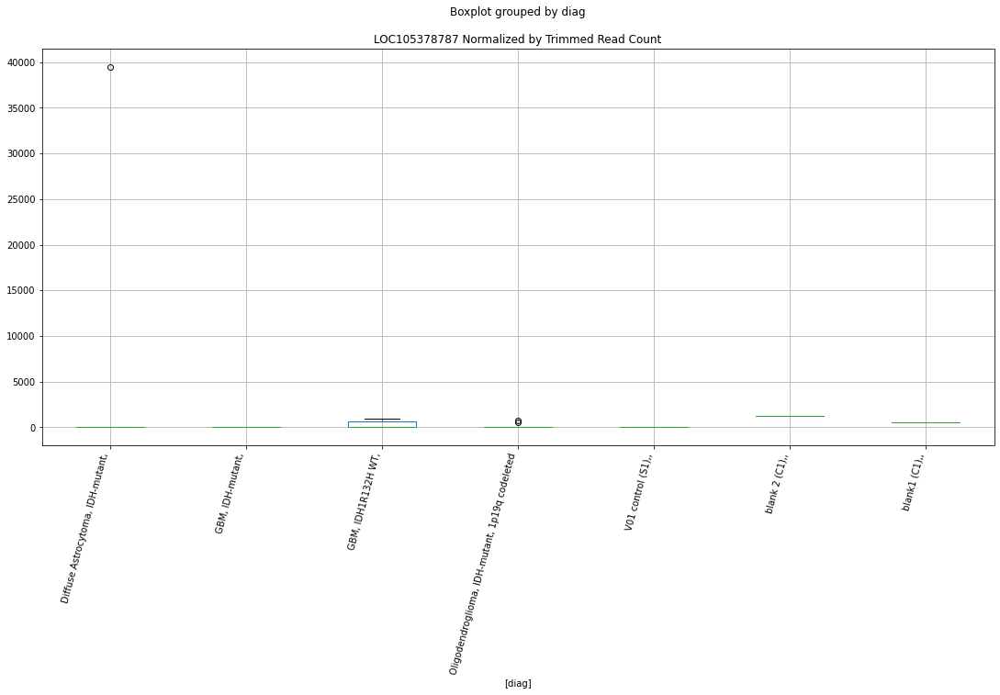

 p : 0.03795982768601922  ( t : 2.239861250719286 ) :  Lexogen  :  cutadapt2  :  LOC105379052
Control and blanks
82       0.0
346    631.3
Name: LOC105379052, dtype: float64
214    0.0
Name: LOC105379052, dtype: float64
478    0.0
Name: LOC105379052, dtype: float64


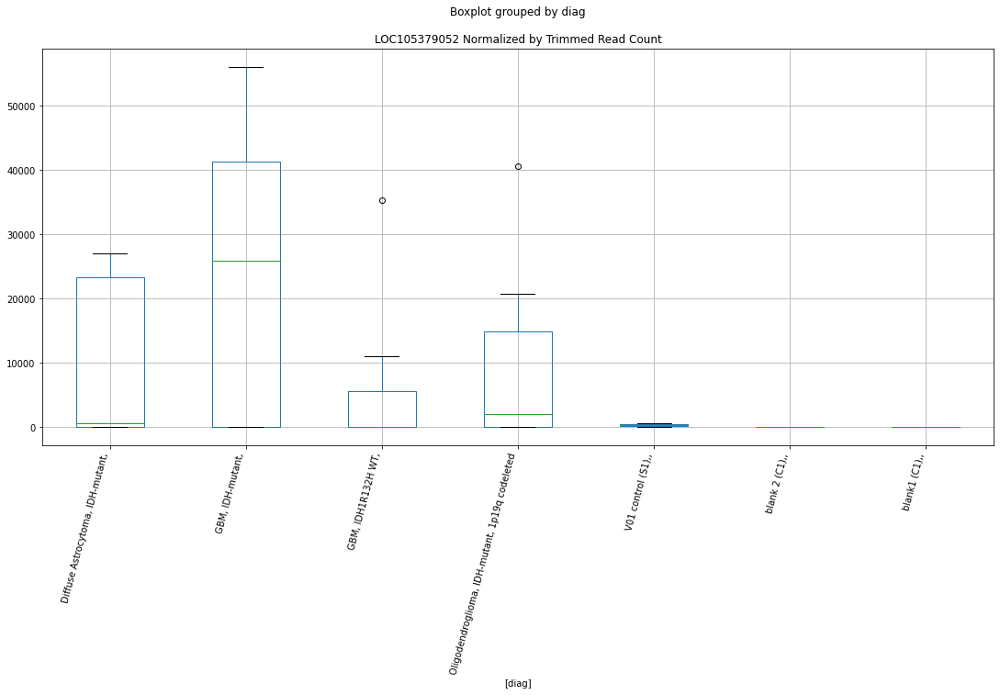

 p : 0.03796445109652262  ( t : 2.239800521606046 ) :  D-plex  :  cutadapt2  :  LOC105373819
Control and blanks
76     757.61
340    880.73
Name: LOC105373819, dtype: float64
208    0.0
Name: LOC105373819, dtype: float64
472    577.96
Name: LOC105373819, dtype: float64


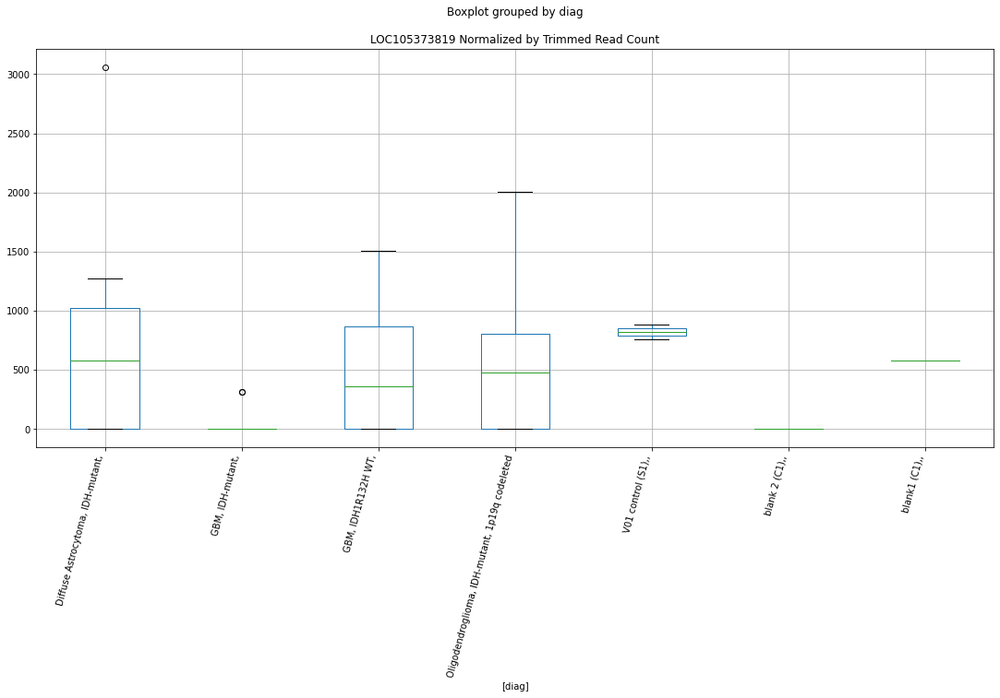

 p : 0.03805030035432257  ( t : 2.2386741171183178 ) :  D-plex  :  bbduk2  :  LOC105378787
Control and blanks
73     0.0
337    0.0
Name: LOC105378787, dtype: float64
205    1253.64
Name: LOC105378787, dtype: float64
469    591.53
Name: LOC105378787, dtype: float64


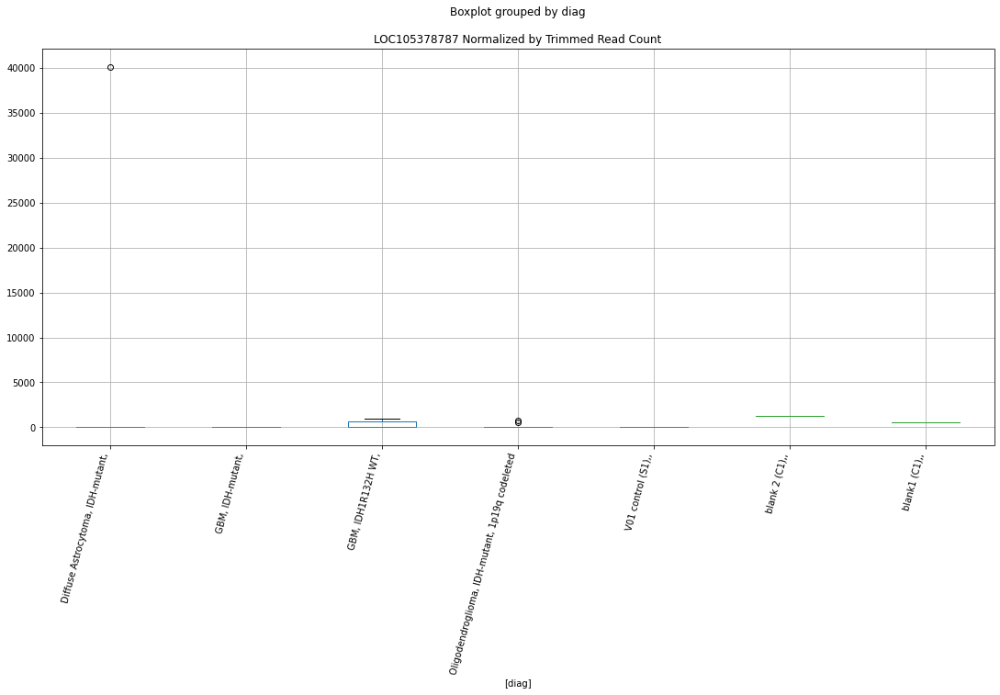

 p : 0.038115000730554516  ( t : 2.2378267484053254 ) :  D-plex  :  cutadapt2  :  LOC105374111
Control and blanks
76      757.61
340    2642.20
Name: LOC105374111, dtype: float64
208    1587.24
Name: LOC105374111, dtype: float64
472    1155.91
Name: LOC105374111, dtype: float64


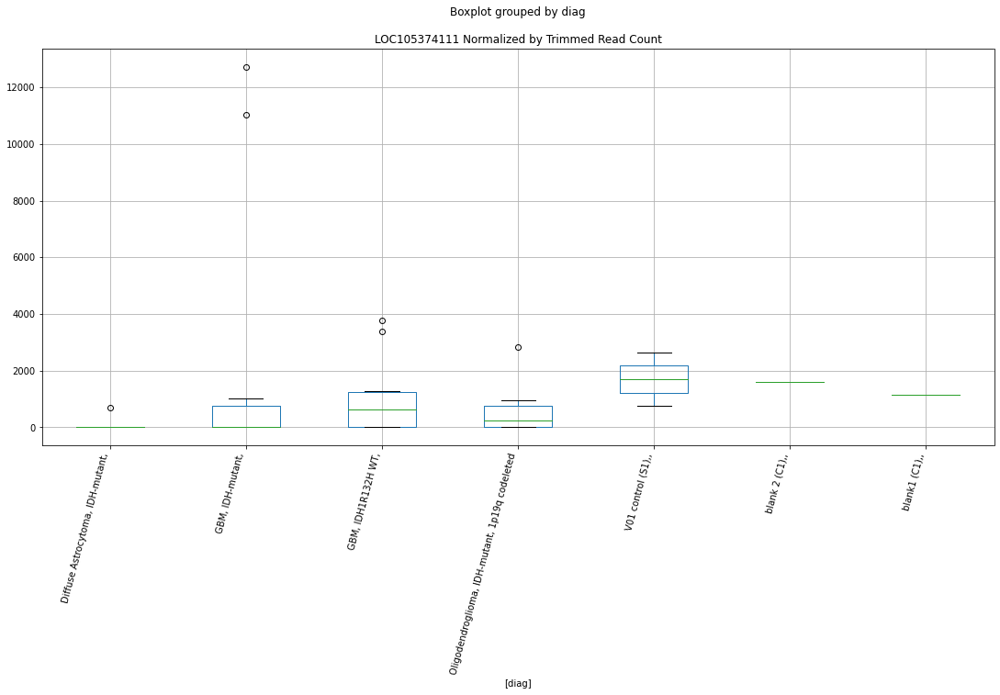

 p : 0.038199178489775394  ( t : 2.23672627053189 ) :  D-plex  :  bbduk2  :  LOC105374111
Control and blanks
73      773.01
337    2670.47
Name: LOC105374111, dtype: float64
205    1611.82
Name: LOC105374111, dtype: float64
469    1183.05
Name: LOC105374111, dtype: float64


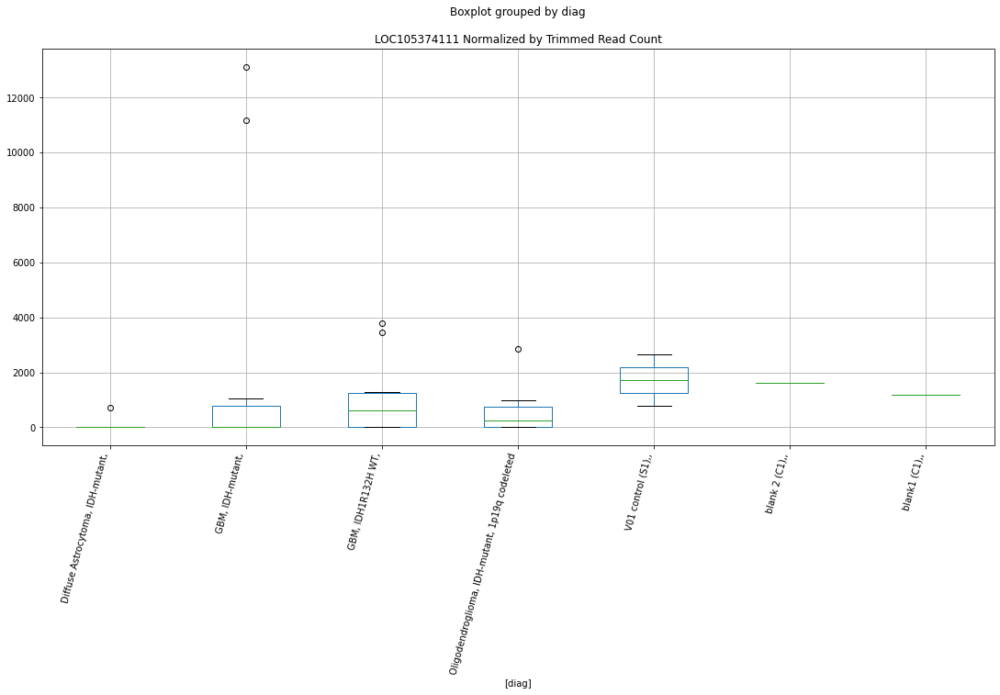

 p : 0.038530404006807496  ( t : 2.2324176599021563 ) :  Lexogen  :  bbduk2  :  LOC105376415
Control and blanks
79     0.0
343    0.0
Name: LOC105376415, dtype: float64
211    0.0
Name: LOC105376415, dtype: float64
475    0.0
Name: LOC105376415, dtype: float64


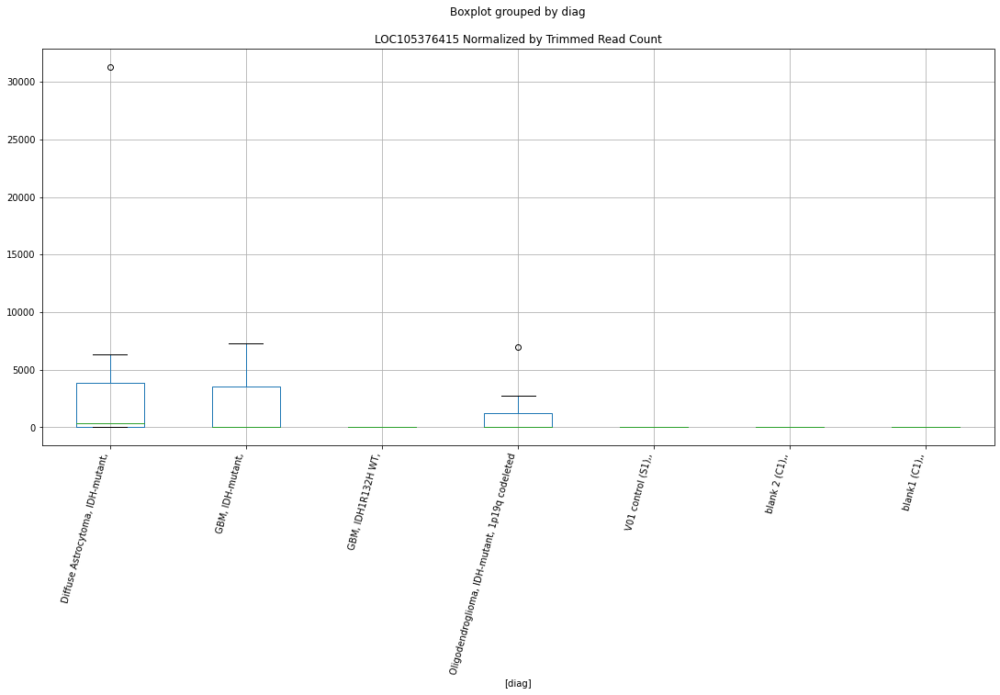

 p : 0.03869268436568848  ( t : 2.230319144221309 ) :  Lexogen  :  cutadapt2  :  LOC105376415
Control and blanks
82     0.0
346    0.0
Name: LOC105376415, dtype: float64
214    0.0
Name: LOC105376415, dtype: float64
478    0.0
Name: LOC105376415, dtype: float64


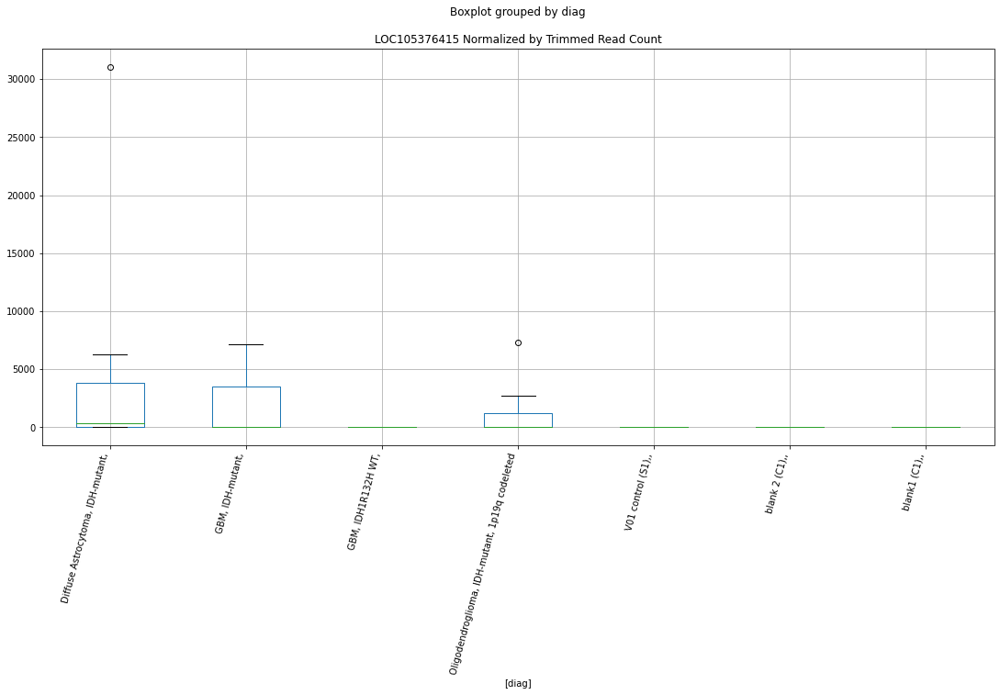

 p : 0.0388981864799313  ( t : 2.227673312363001 ) :  D-plex  :  bbduk2  :  LOC105376731
Control and blanks
73     0.0
337    0.0
Name: LOC105376731, dtype: float64
205    358.18
Name: LOC105376731, dtype: float64
469    1183.05
Name: LOC105376731, dtype: float64


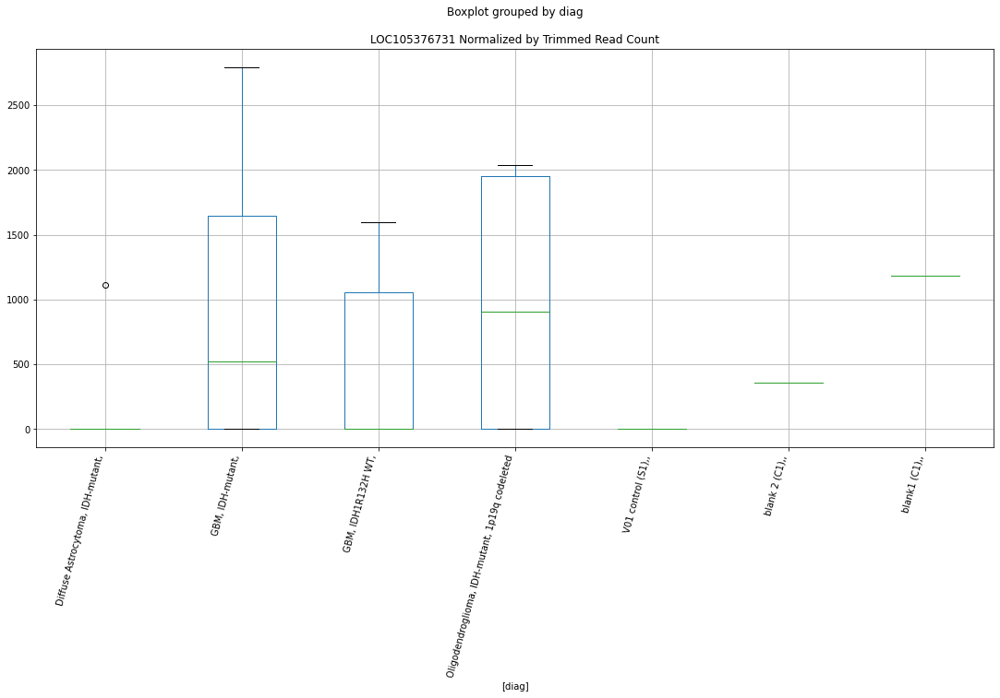

 p : 0.03945064448134838  ( t : 2.220623730052236 ) :  Lexogen  :  bbduk2  :  LOC105378085
Control and blanks
79     0.0
343    0.0
Name: LOC105378085, dtype: float64
211    0.0
Name: LOC105378085, dtype: float64
475    0.0
Name: LOC105378085, dtype: float64


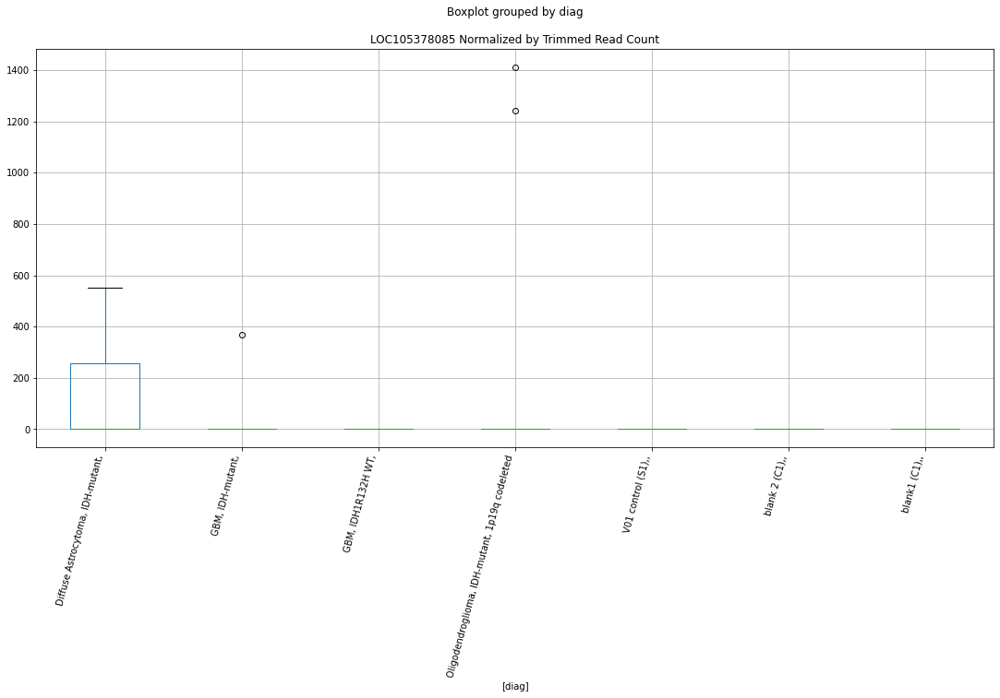

 p : 0.03953173760478173  ( t : 2.2195966068717192 ) :  D-plex  :  bbduk2  :  LOC105377329
Control and blanks
73        0.0
337    6231.1
Name: LOC105377329, dtype: float64
205    0.0
Name: LOC105377329, dtype: float64
469    4140.69
Name: LOC105377329, dtype: float64


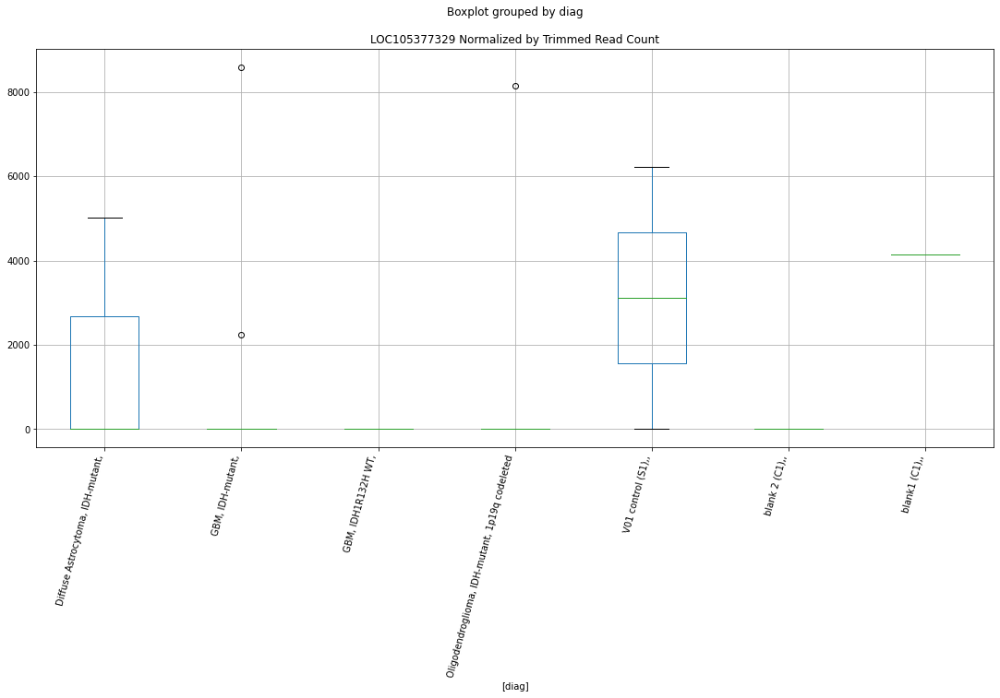

 p : 0.03963126977422409  ( t : 2.218338582083203 ) :  Lexogen  :  bbduk2  :  LOC105379052
Control and blanks
79       0.00
343    636.94
Name: LOC105379052, dtype: float64
211    0.0
Name: LOC105379052, dtype: float64
475    0.0
Name: LOC105379052, dtype: float64


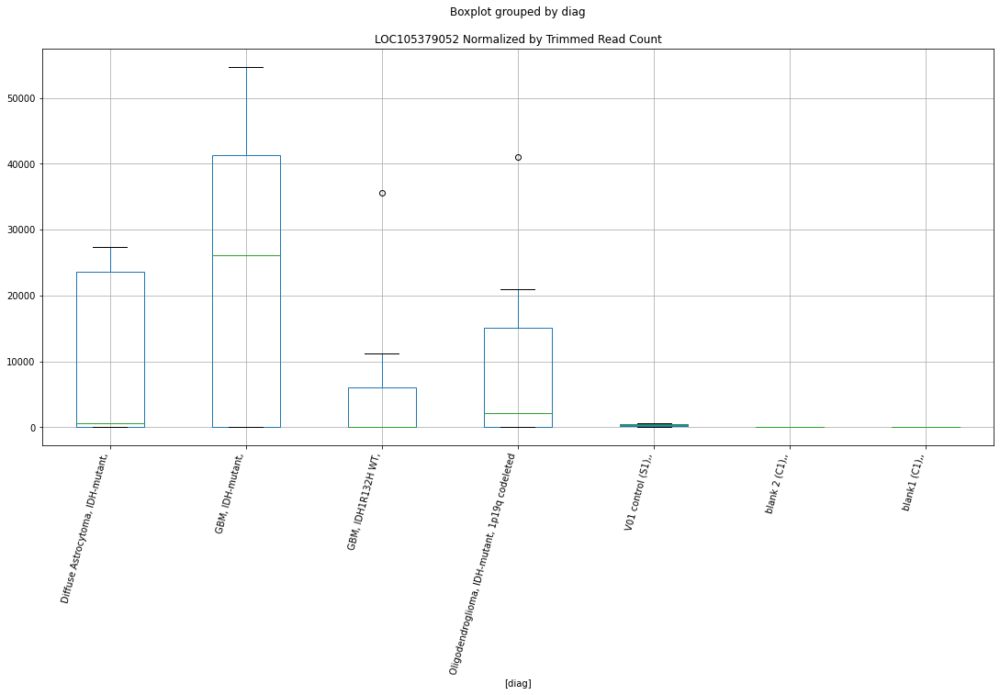

 p : 0.03967981774686235  ( t : 2.2177260202550753 ) :  D-plex  :  bbduk2  :  LOC105376174
Control and blanks
73     773.01
337    890.16
Name: LOC105376174, dtype: float64
205    1611.82
Name: LOC105376174, dtype: float64
469    1183.05
Name: LOC105376174, dtype: float64


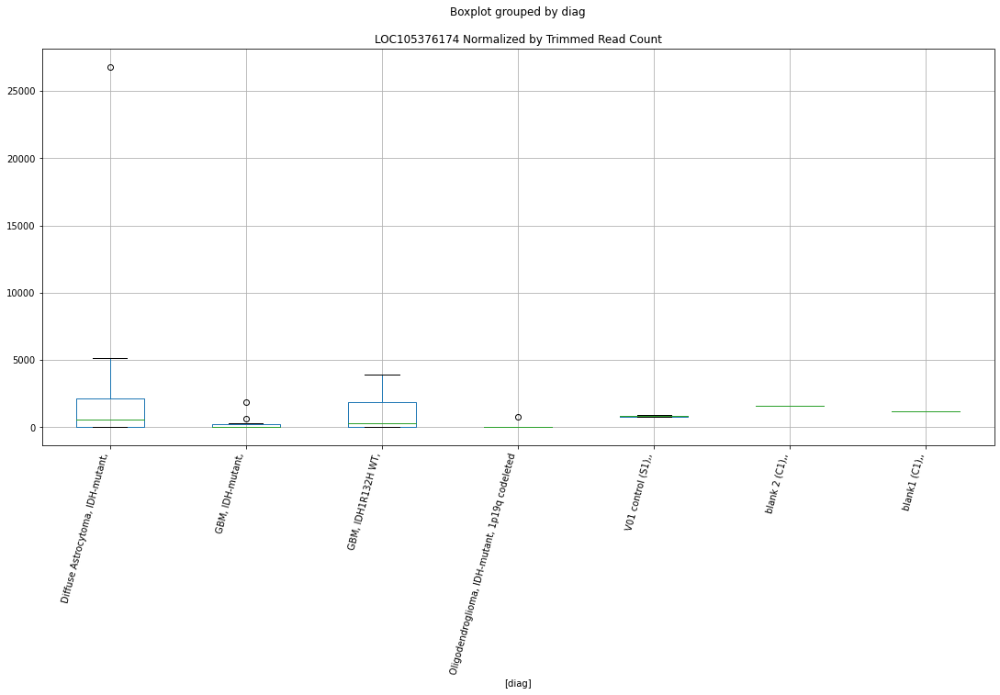

 p : 0.039729390469918566  ( t : 2.217101239546714 ) :  D-plex  :  cutadapt2  :  LOC105377024
Control and blanks
76     0.0
340    0.0
Name: LOC105377024, dtype: float64
208    0.0
Name: LOC105377024, dtype: float64
472    577.96
Name: LOC105377024, dtype: float64


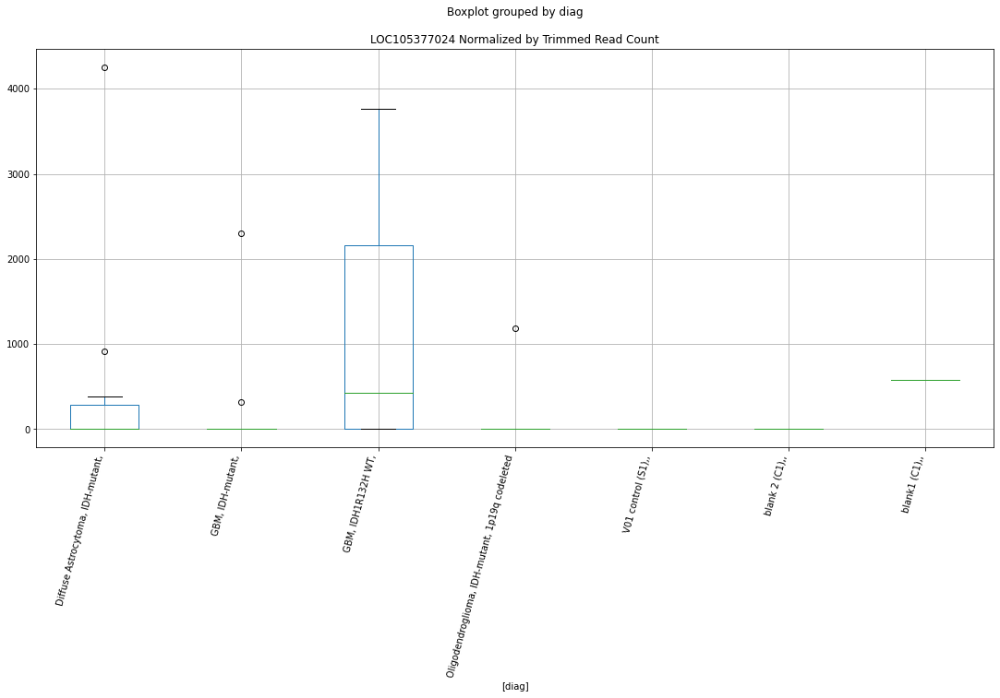

 p : 0.039731680209029126  ( t : 2.2170723985716605 ) :  D-plex  :  bbduk2  :  LOC105376390
Control and blanks
73       0.00
337    890.16
Name: LOC105376390, dtype: float64
205    5730.91
Name: LOC105376390, dtype: float64
469    4140.69
Name: LOC105376390, dtype: float64


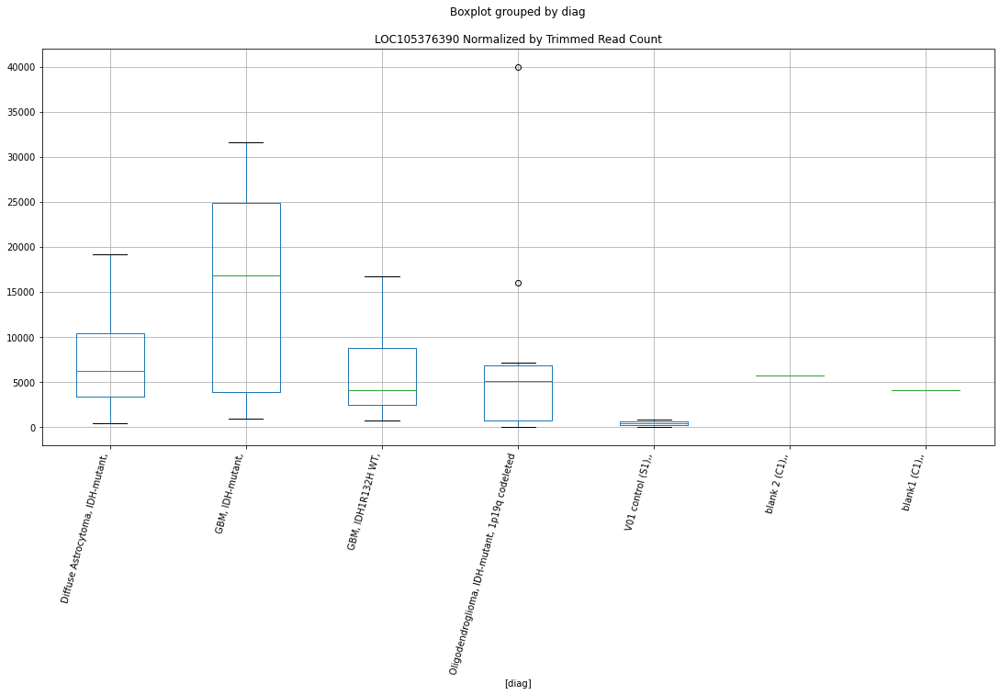

 p : 0.03995858028372248  ( t : 2.2142219773908036 ) :  Lexogen  :  bbduk2  :  LOC105377442
Control and blanks
79     0.0
343    0.0
Name: LOC105377442, dtype: float64
211    0.0
Name: LOC105377442, dtype: float64
475    0.0
Name: LOC105377442, dtype: float64


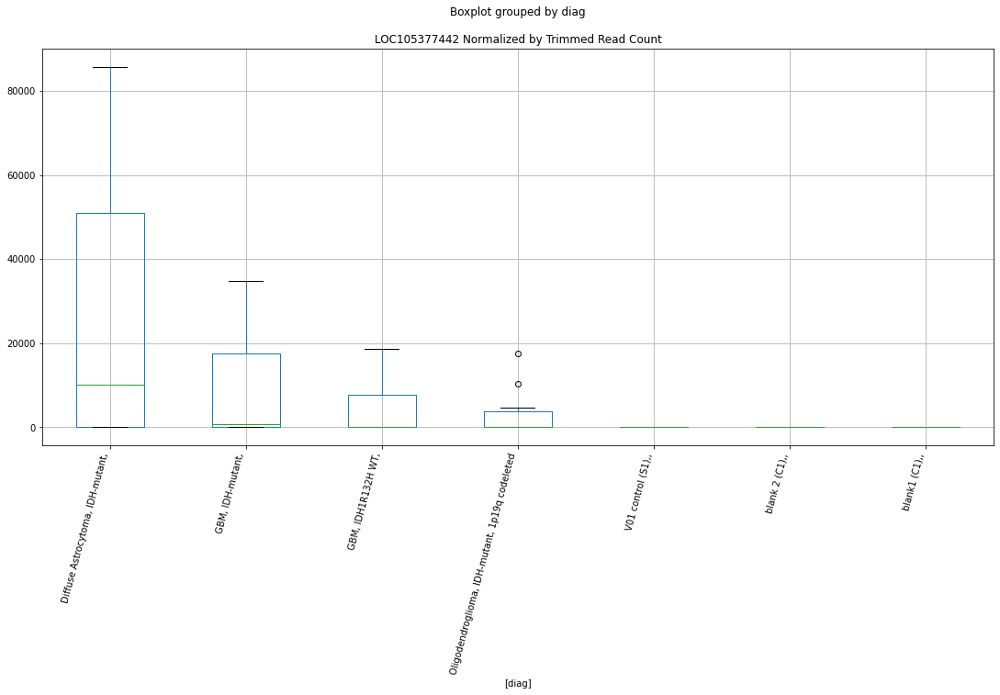

 p : 0.03997879115433783  ( t : 2.213968801890631 ) :  D-plex  :  bbduk2  :  LOC105372835
Control and blanks
73     0.0
337    0.0
Name: LOC105372835, dtype: float64
205    179.09
Name: LOC105372835, dtype: float64
469    0.0
Name: LOC105372835, dtype: float64


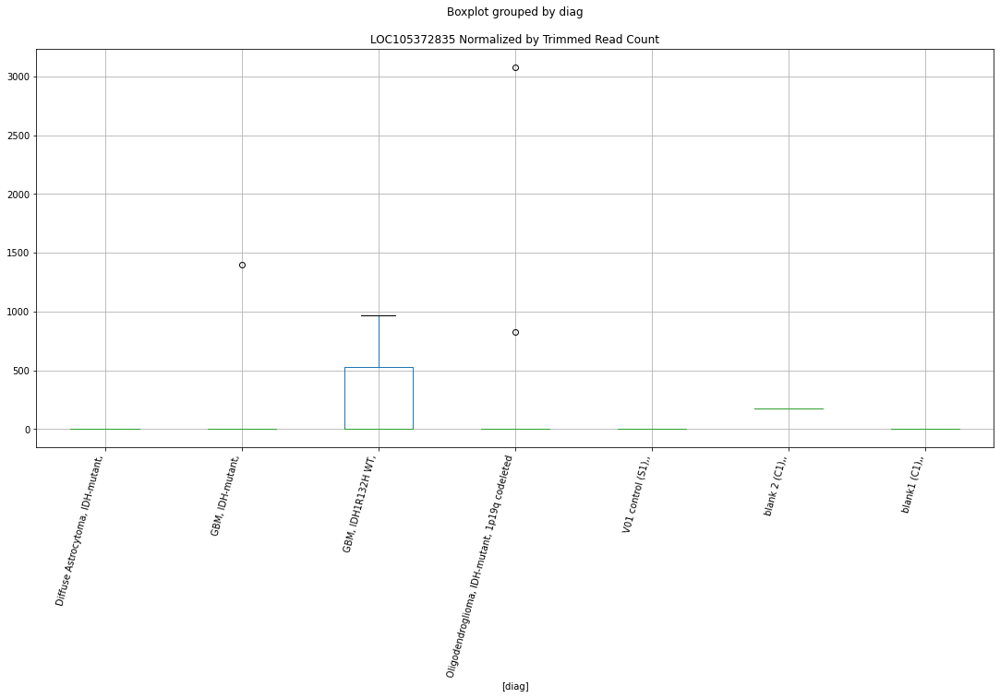

 p : 0.03999718364853741  ( t : 2.2137385069222413 ) :  Lexogen  :  cutadapt2  :  LOC105378954
Control and blanks
82     0.0
346    0.0
Name: LOC105378954, dtype: float64
214    271.23
Name: LOC105378954, dtype: float64
478    0.0
Name: LOC105378954, dtype: float64


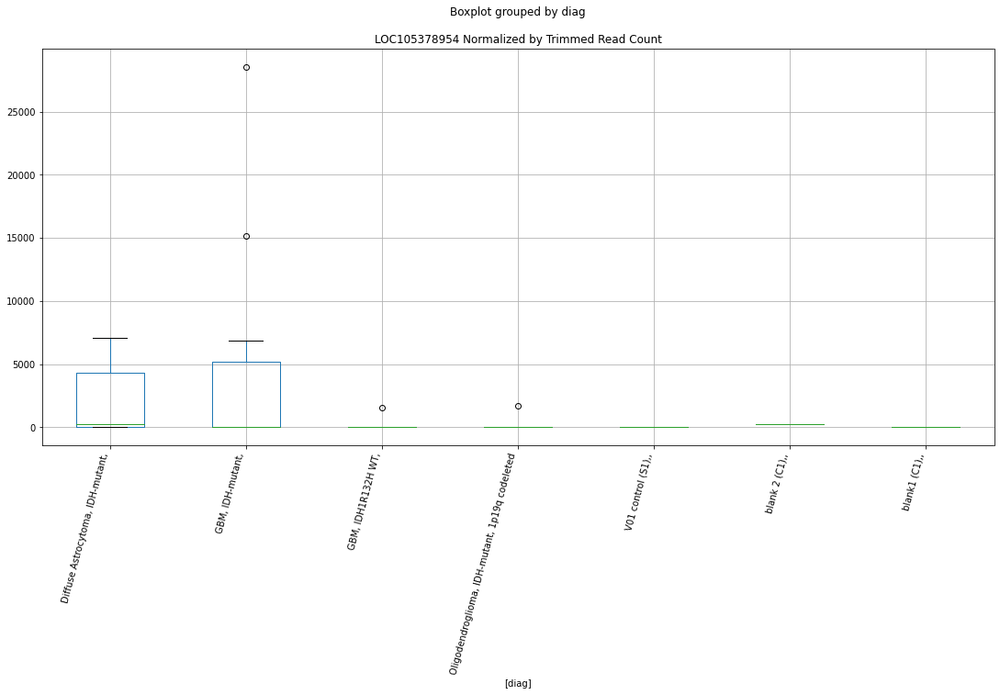

 p : 0.04001197679939437  ( t : 2.213553350485583 ) :  Lexogen  :  cutadapt2  :  LOC105373170
Control and blanks
82       0.00
346    841.74
Name: LOC105373170, dtype: float64
214    2169.81
Name: LOC105373170, dtype: float64
478    0.0
Name: LOC105373170, dtype: float64


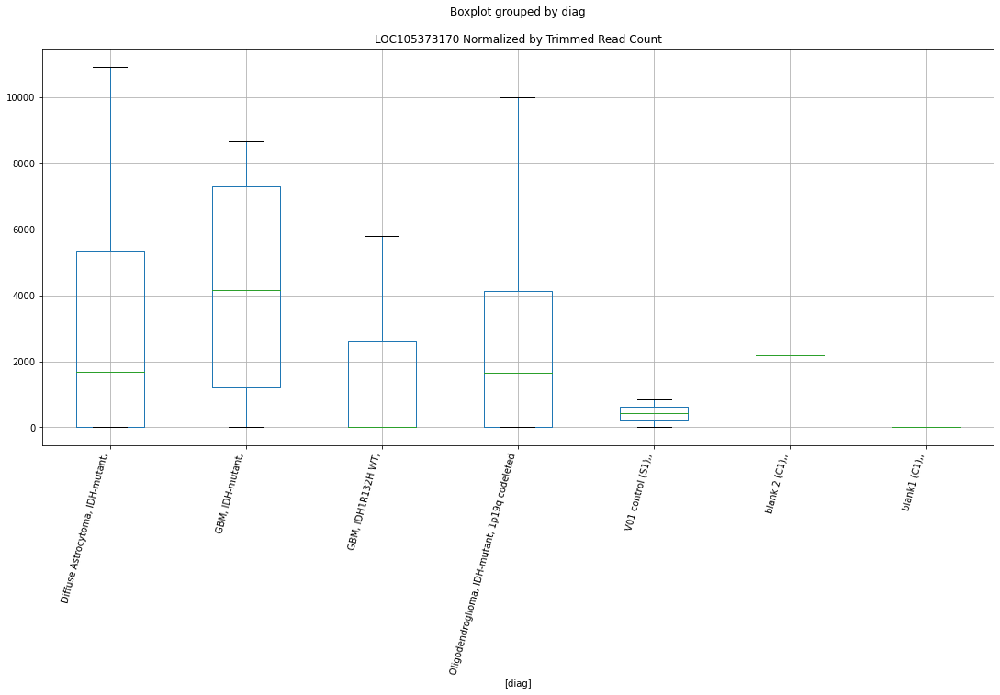

 p : 0.04004576408730893  ( t : 2.2131306925237015 ) :  Lexogen  :  bbduk2  :  LOC105378954
Control and blanks
79     0.0
343    0.0
Name: LOC105378954, dtype: float64
211    273.31
Name: LOC105378954, dtype: float64
475    0.0
Name: LOC105378954, dtype: float64


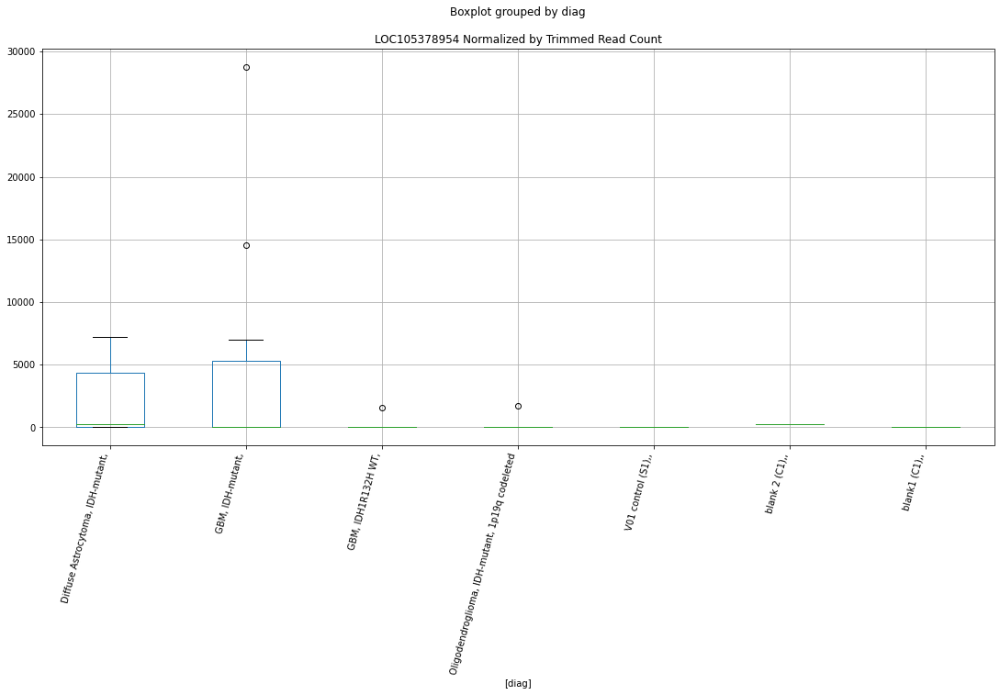

 p : 0.04004964030743744  ( t : 2.21308222439083 ) :  D-plex  :  bbduk2  :  LOC105377024
Control and blanks
73     0.0
337    0.0
Name: LOC105377024, dtype: float64
205    0.0
Name: LOC105377024, dtype: float64
469    591.53
Name: LOC105377024, dtype: float64


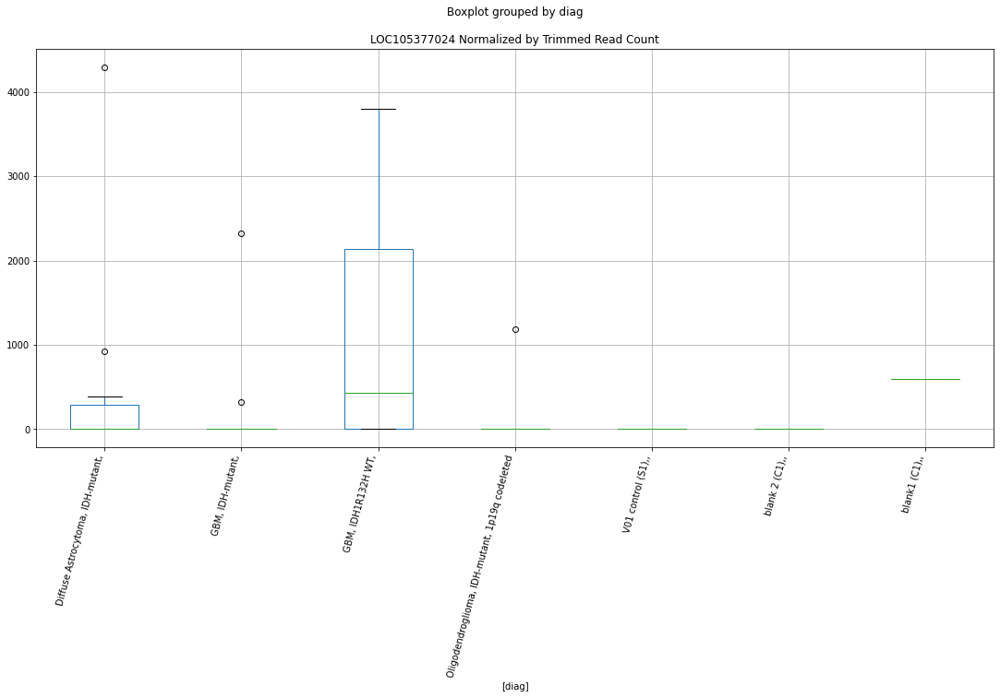

 p : 0.04013274420931125  ( t : 2.2120441321004995 ) :  Lexogen  :  cutadapt2  :  LOC105377442
Control and blanks
82     0.0
346    0.0
Name: LOC105377442, dtype: float64
214    0.0
Name: LOC105377442, dtype: float64
478    0.0
Name: LOC105377442, dtype: float64


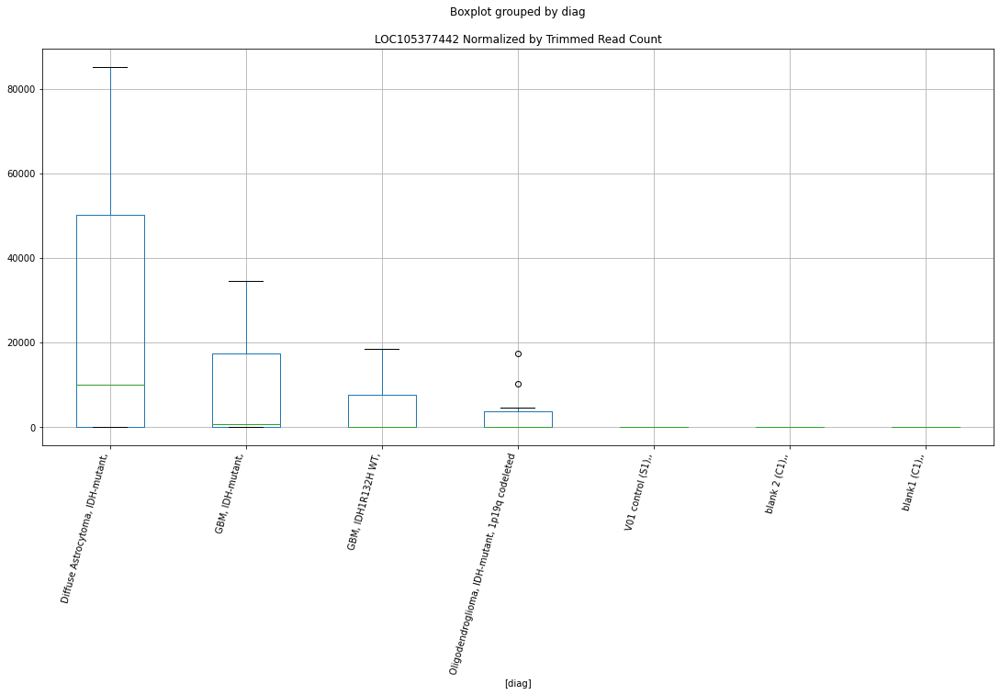

 p : 0.04022152954874527  ( t : 2.210937251684364 ) :  D-plex  :  bbduk2  :  LOC107985429
Control and blanks
73     0.0
337    0.0
Name: LOC107985429, dtype: float64
205    179.09
Name: LOC107985429, dtype: float64
469    0.0
Name: LOC107985429, dtype: float64


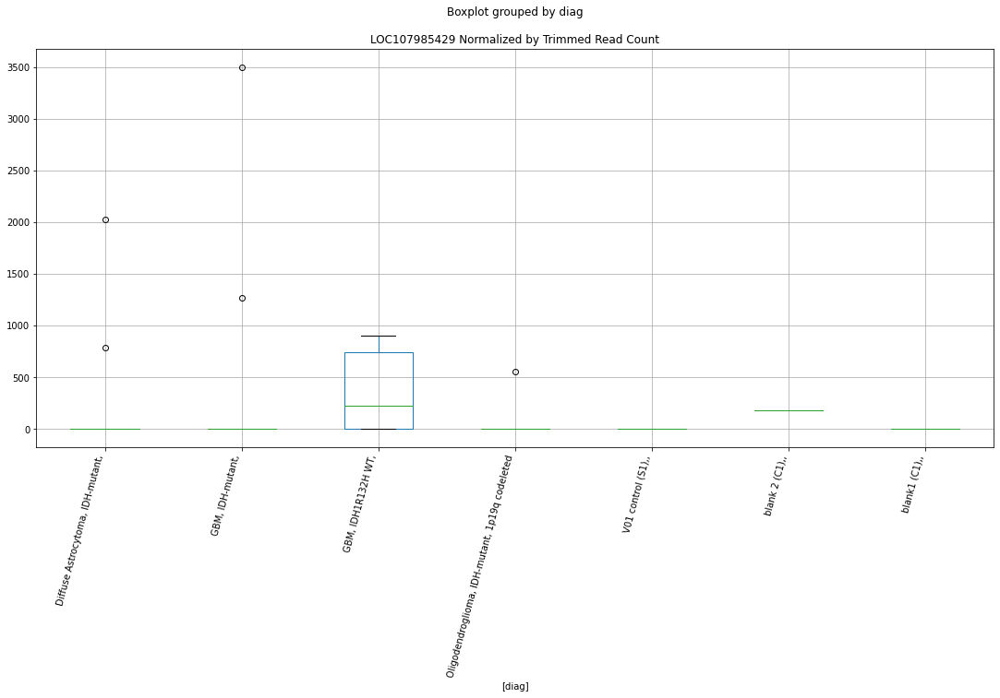

 p : 0.04024657422562536  ( t : 2.2106254277141937 ) :  Lexogen  :  bbduk2  :  LOC105375311
Control and blanks
79     0.0
343    0.0
Name: LOC105375311, dtype: float64
211    0.0
Name: LOC105375311, dtype: float64
475    0.0
Name: LOC105375311, dtype: float64


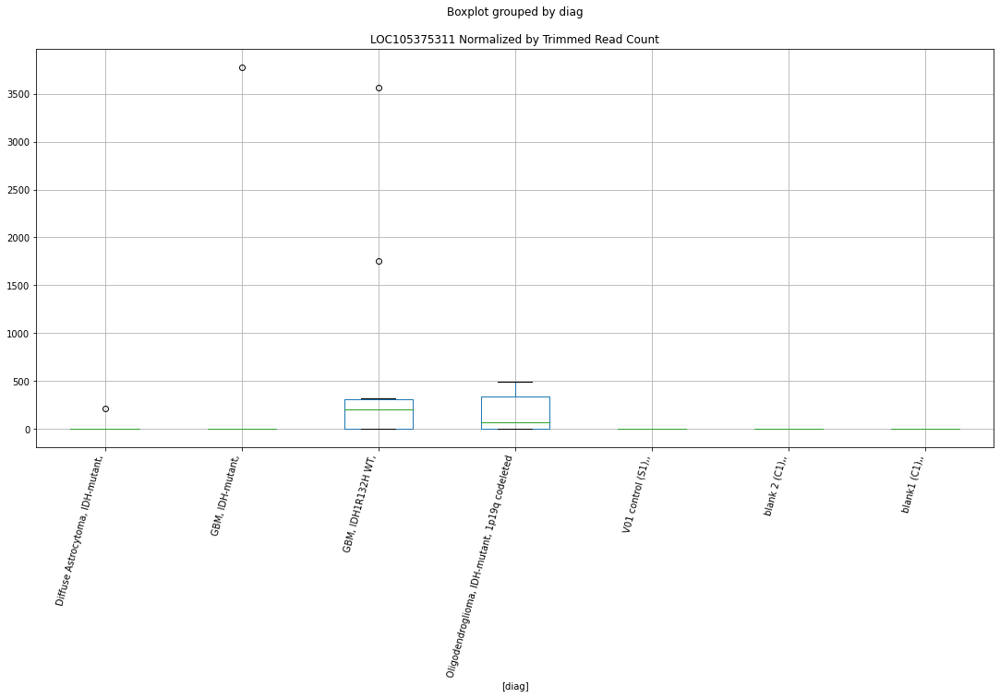

 p : 0.04028643637166652  ( t : 2.2101294834933087 ) :  D-plex  :  bbduk2  :  LOC105379087
Control and blanks
73     0.0
337    0.0
Name: LOC105379087, dtype: float64
205    3581.82
Name: LOC105379087, dtype: float64
469    2957.64
Name: LOC105379087, dtype: float64


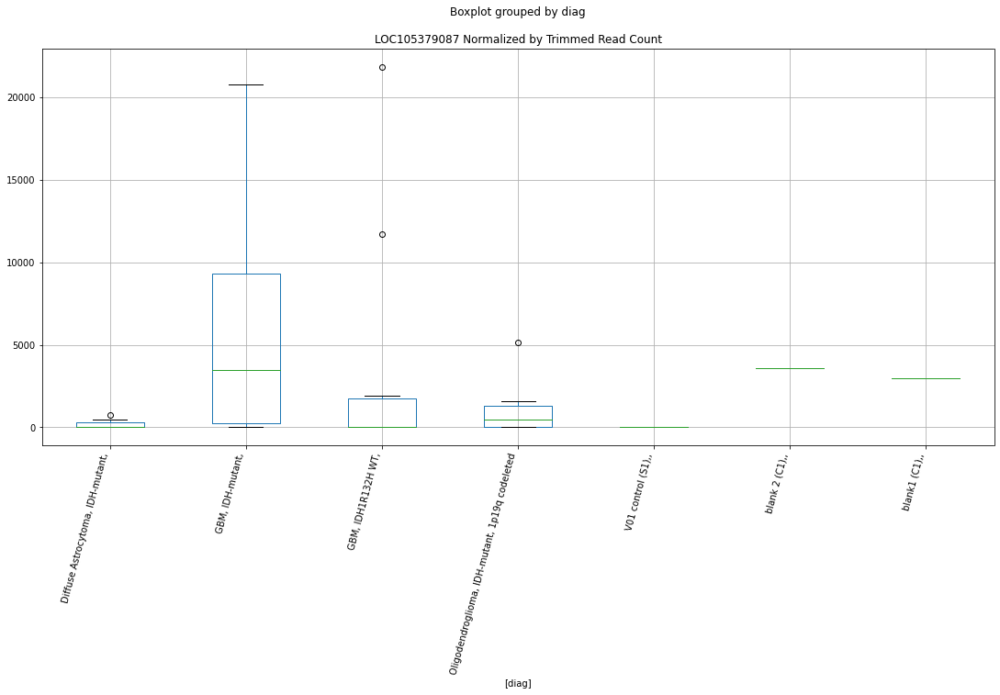

 p : 0.04029444257054427  ( t : 2.2100299289102514 ) :  Lexogen  :  cutadapt2  :  LOC105372524
Control and blanks
82       0.00
346    210.43
Name: LOC105372524, dtype: float64
214    3525.94
Name: LOC105372524, dtype: float64
478    0.0
Name: LOC105372524, dtype: float64


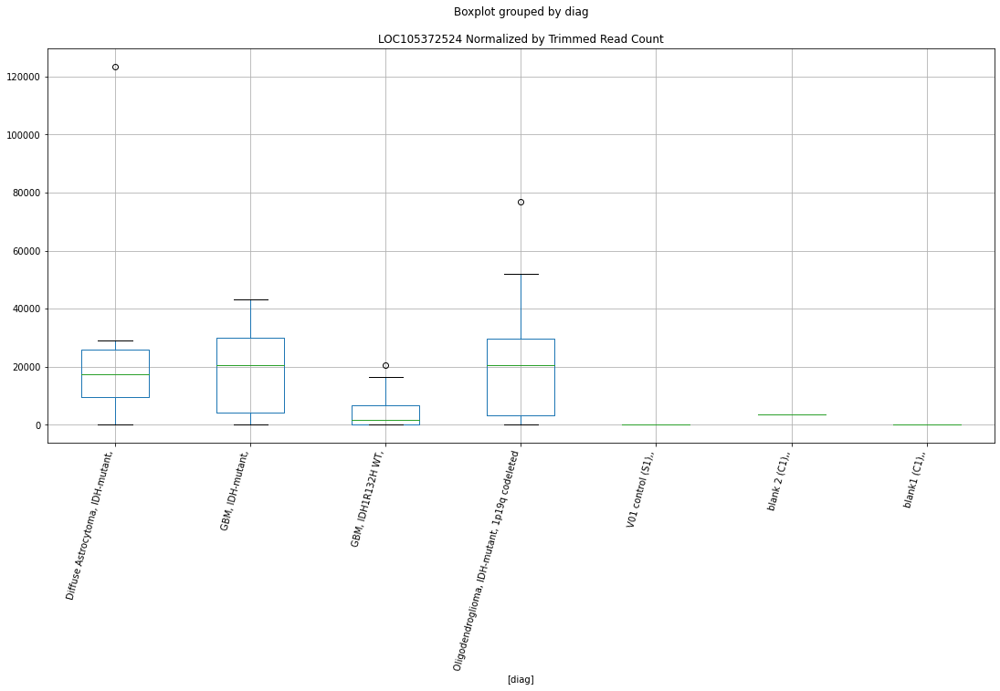

 p : 0.04059900038661544  ( t : 2.2062562843100877 ) :  D-plex  :  cutadapt2  :  LOC105378485
Control and blanks
76     757.61
340      0.00
Name: LOC105378485, dtype: float64
208    352.72
Name: LOC105378485, dtype: float64
472    577.96
Name: LOC105378485, dtype: float64


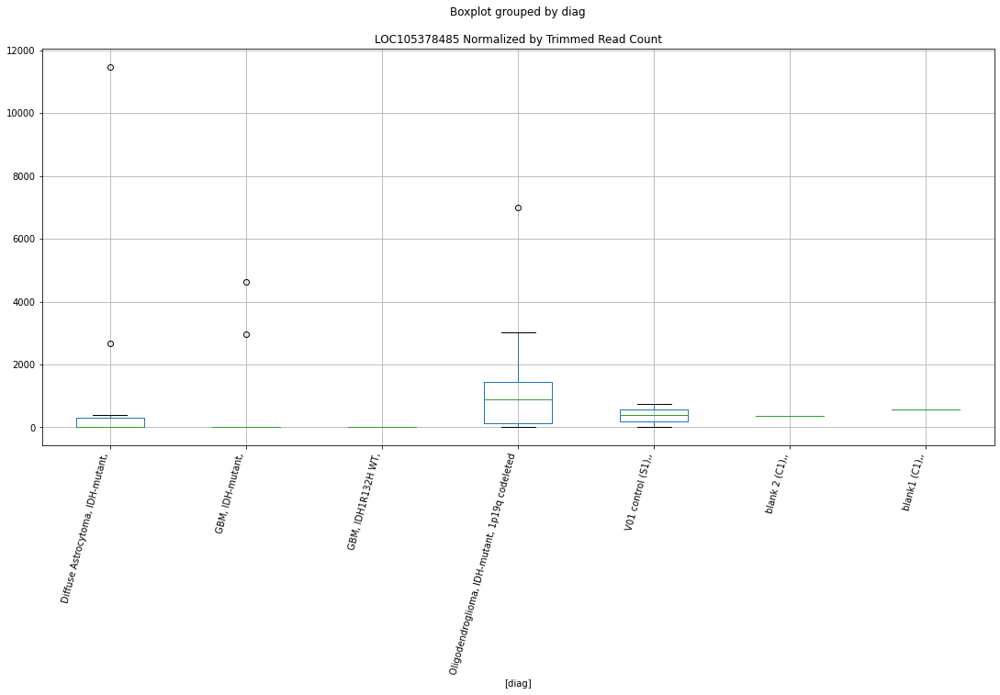

 p : 0.04065354165624372  ( t : 2.205583235096441 ) :  D-plex  :  cutadapt2  :  LOC105378373
Control and blanks
76     0.0
340    0.0
Name: LOC105378373, dtype: float64
208    0.0
Name: LOC105378373, dtype: float64
472    0.0
Name: LOC105378373, dtype: float64


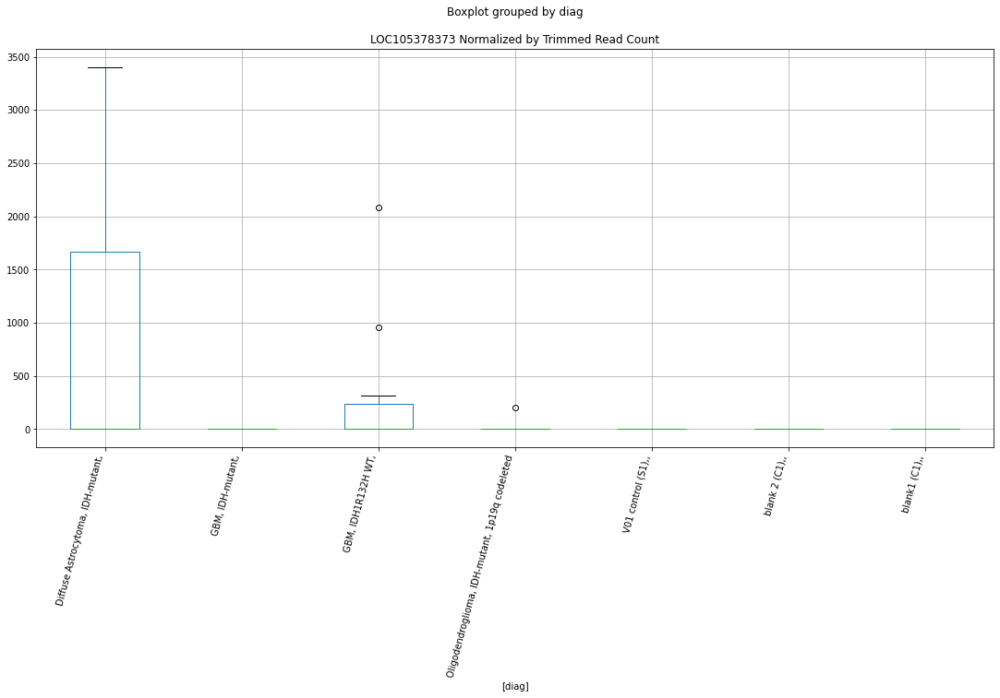

 p : 0.040680349994119104  ( t : 2.205252719414305 ) :  D-plex  :  bbduk2  :  LOC105378373
Control and blanks
73     0.0
337    0.0
Name: LOC105378373, dtype: float64
205    0.0
Name: LOC105378373, dtype: float64
469    0.0
Name: LOC105378373, dtype: float64


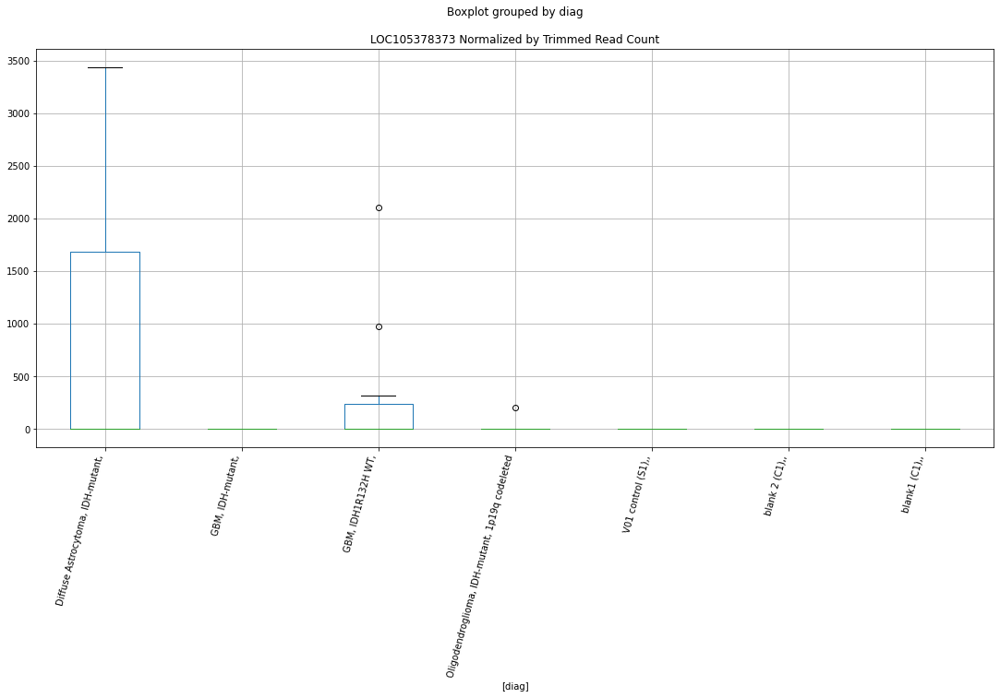

 p : 0.04075042270416181  ( t : 2.204389748557709 ) :  D-plex  :  cutadapt2  :  LOC105372835
Control and blanks
76     0.0
340    0.0
Name: LOC105372835, dtype: float64
208    176.36
Name: LOC105372835, dtype: float64
472    0.0
Name: LOC105372835, dtype: float64


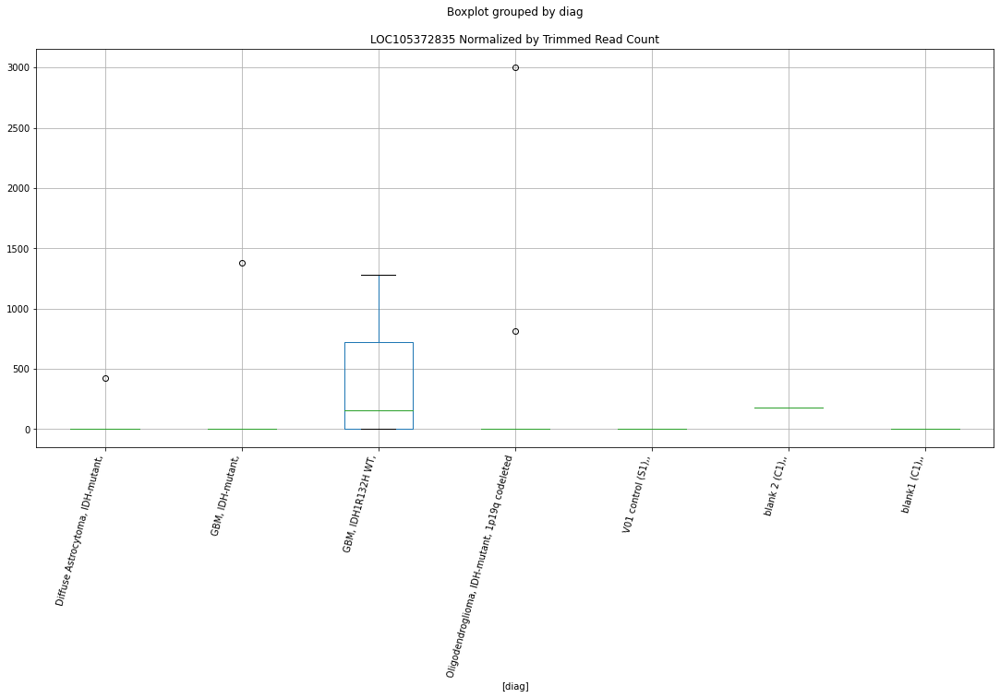

 p : 0.040791498855705446  ( t : 2.2038845145000043 ) :  Lexogen  :  bbduk2  :  LOC105372524
Control and blanks
79       0.00
343    212.31
Name: LOC105372524, dtype: float64
211    3552.98
Name: LOC105372524, dtype: float64
475    0.0
Name: LOC105372524, dtype: float64


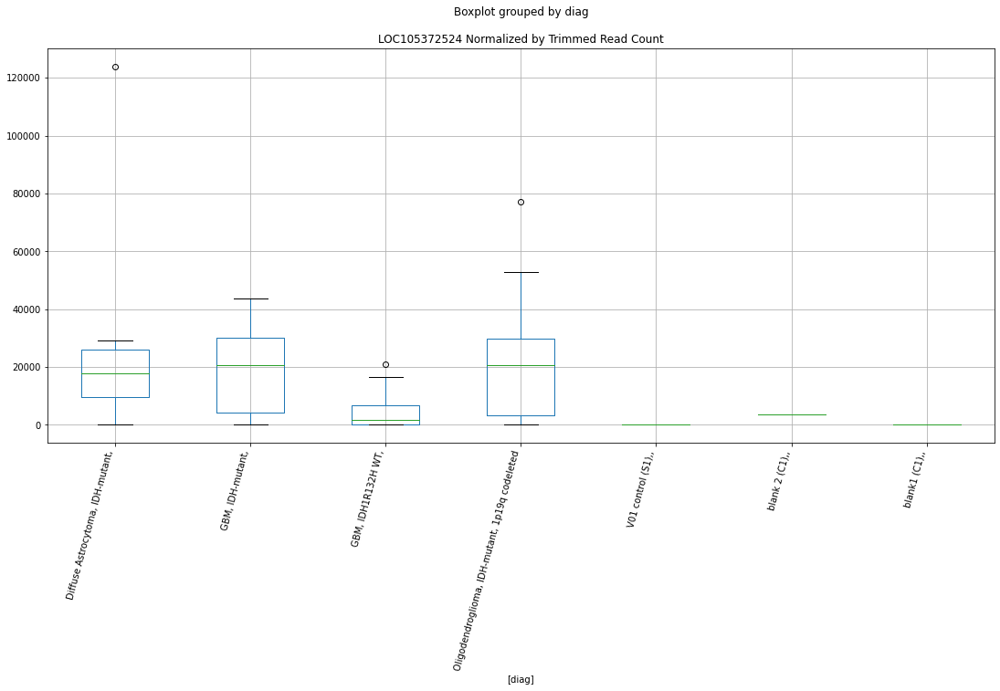

 p : 0.04090391534316934  ( t : 2.202504185082589 ) :  D-plex  :  cutadapt2  :  LOC105378519
Control and blanks
76     0.0
340    0.0
Name: LOC105378519, dtype: float64
208    8112.57
Name: LOC105378519, dtype: float64
472    9247.29
Name: LOC105378519, dtype: float64


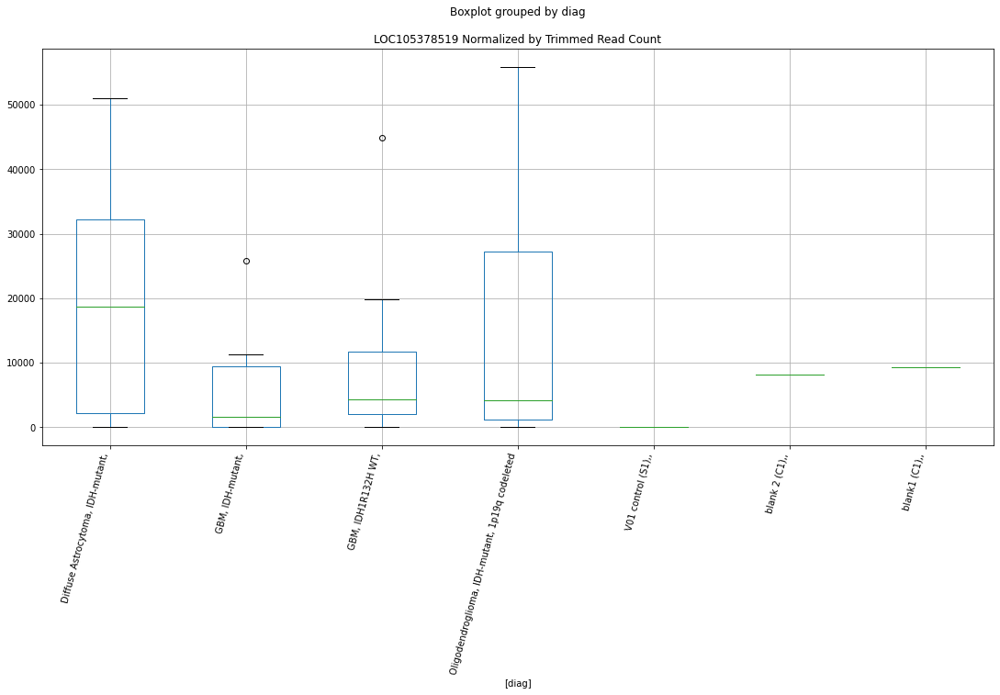

 p : 0.04099926846238135  ( t : 2.20133610066025 ) :  Lexogen  :  bbduk2  :  LOC107985368
Control and blanks
79     0.0
343    0.0
Name: LOC107985368, dtype: float64
211    0.0
Name: LOC107985368, dtype: float64
475    0.0
Name: LOC107985368, dtype: float64


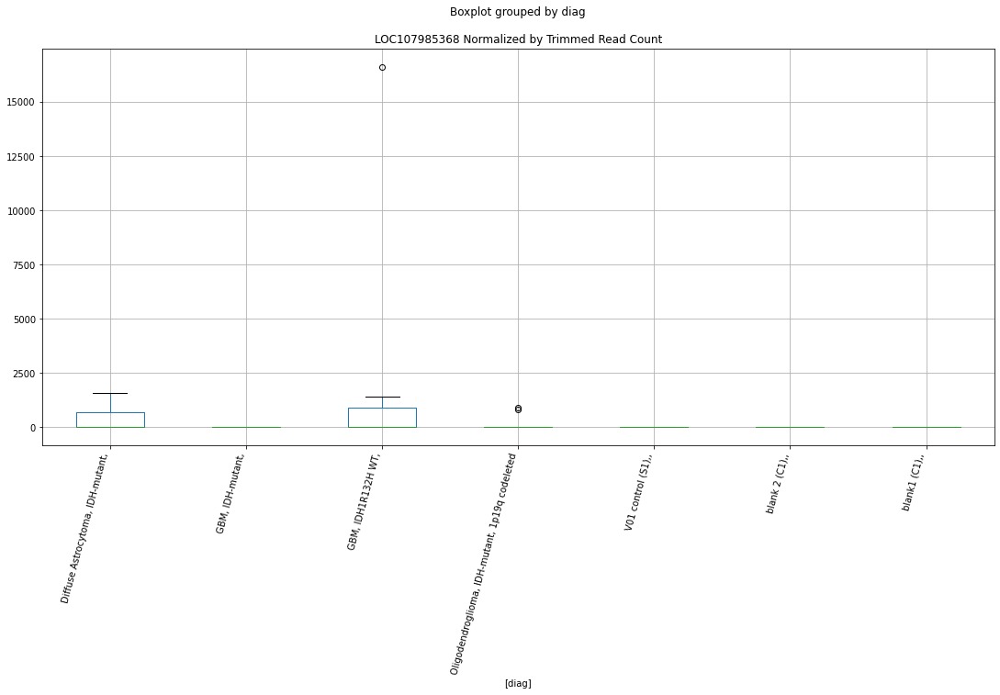

 p : 0.04102505427478721  ( t : 2.2010206507502748 ) :  D-plex  :  cutadapt2  :  LOC105376174
Control and blanks
76     757.61
340    880.73
Name: LOC105376174, dtype: float64
208    1587.24
Name: LOC105376174, dtype: float64
472    1155.91
Name: LOC105376174, dtype: float64


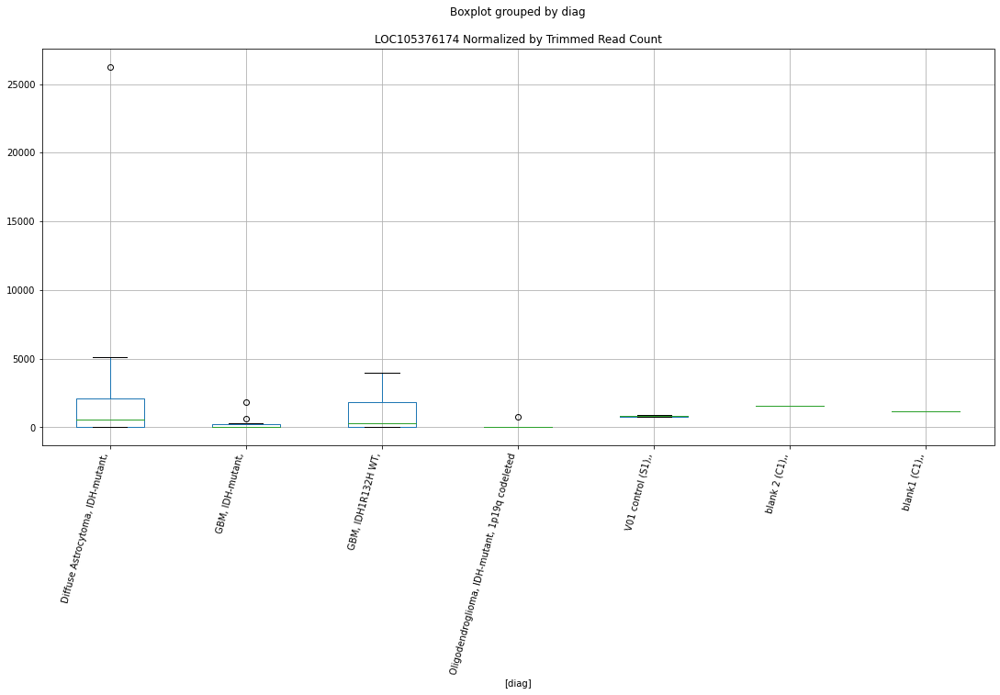

 p : 0.04135975078621705  ( t : 2.1969425883034015 ) :  D-plex  :  cutadapt2  :  LOC105375738
Control and blanks
76     0.0
340    0.0
Name: LOC105375738, dtype: float64
208    2116.32
Name: LOC105375738, dtype: float64
472    3467.74
Name: LOC105375738, dtype: float64


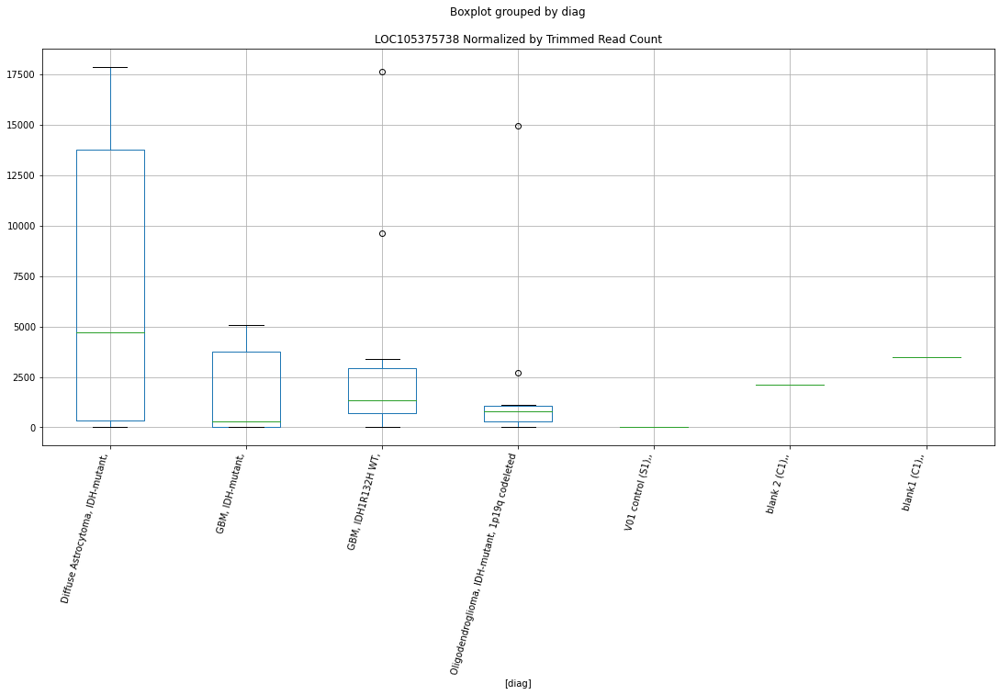

 p : 0.041373277788541454  ( t : 2.1967784083461654 ) :  Lexogen  :  cutadapt2  :  LOC105377619
Control and blanks
82          0.00
346    196756.28
Name: LOC105377619, dtype: float64
214    0.0
Name: LOC105377619, dtype: float64
478    0.0
Name: LOC105377619, dtype: float64


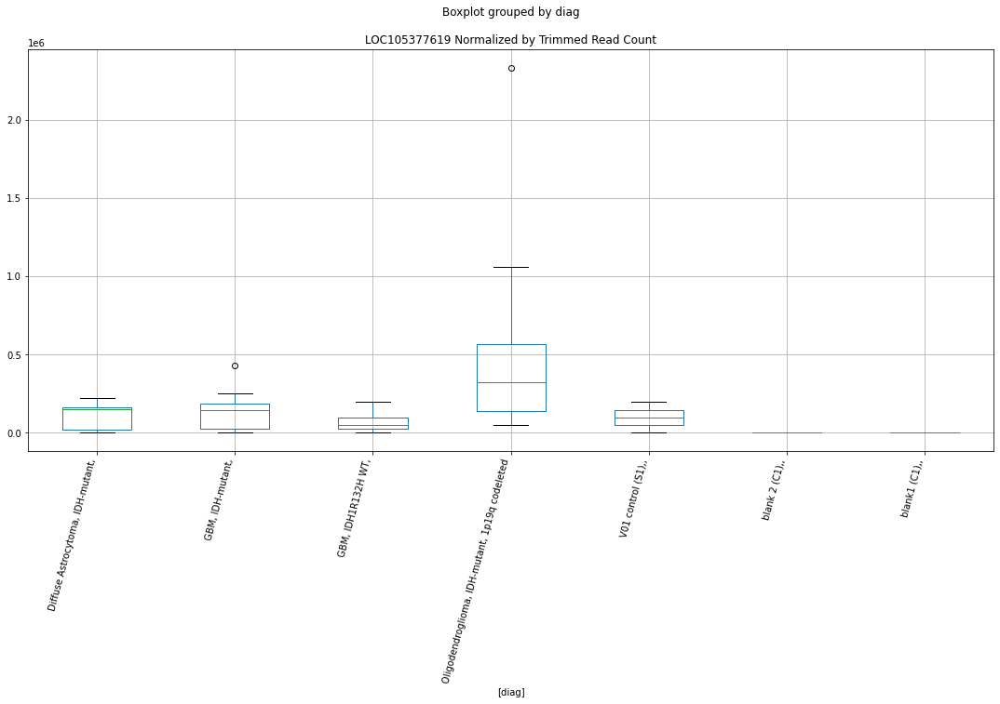

 p : 0.04145373808063944  ( t : 2.195802862681226 ) :  D-plex  :  cutadapt2  :  LOC107985435
Control and blanks
76     0.0
340    0.0
Name: LOC107985435, dtype: float64
208    1587.24
Name: LOC107985435, dtype: float64
472    2311.82
Name: LOC107985435, dtype: float64


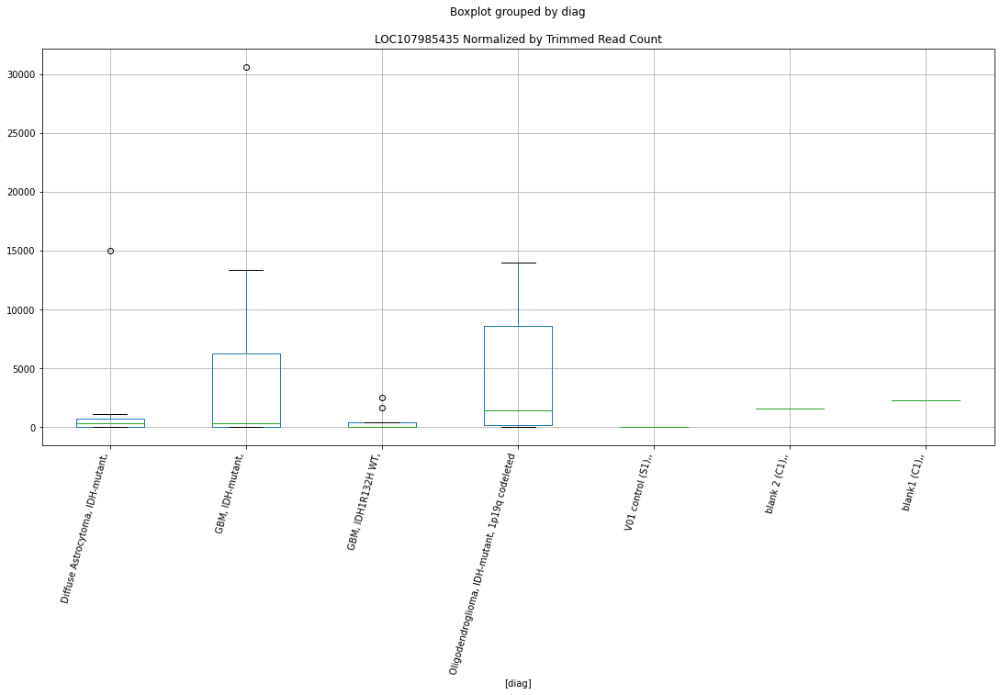

 p : 0.04148324699708904  ( t : 2.195445515660275 ) :  D-plex  :  cutadapt2  :  LOC107984639
Control and blanks
76     0.0
340    0.0
Name: LOC107984639, dtype: float64
208    0.0
Name: LOC107984639, dtype: float64
472    577.96
Name: LOC107984639, dtype: float64


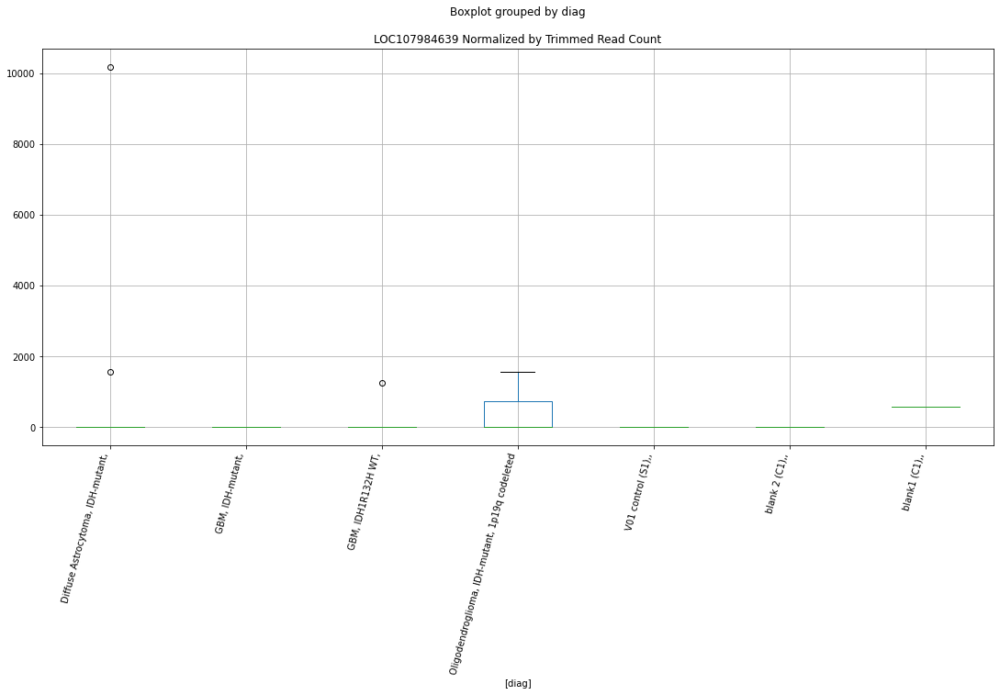

 p : 0.04150819706521789  ( t : 2.1951435573815385 ) :  Lexogen  :  bbduk2  :  LOC105377619
Control and blanks
79          0.00
343    198513.88
Name: LOC105377619, dtype: float64
211    0.0
Name: LOC105377619, dtype: float64
475    0.0
Name: LOC105377619, dtype: float64


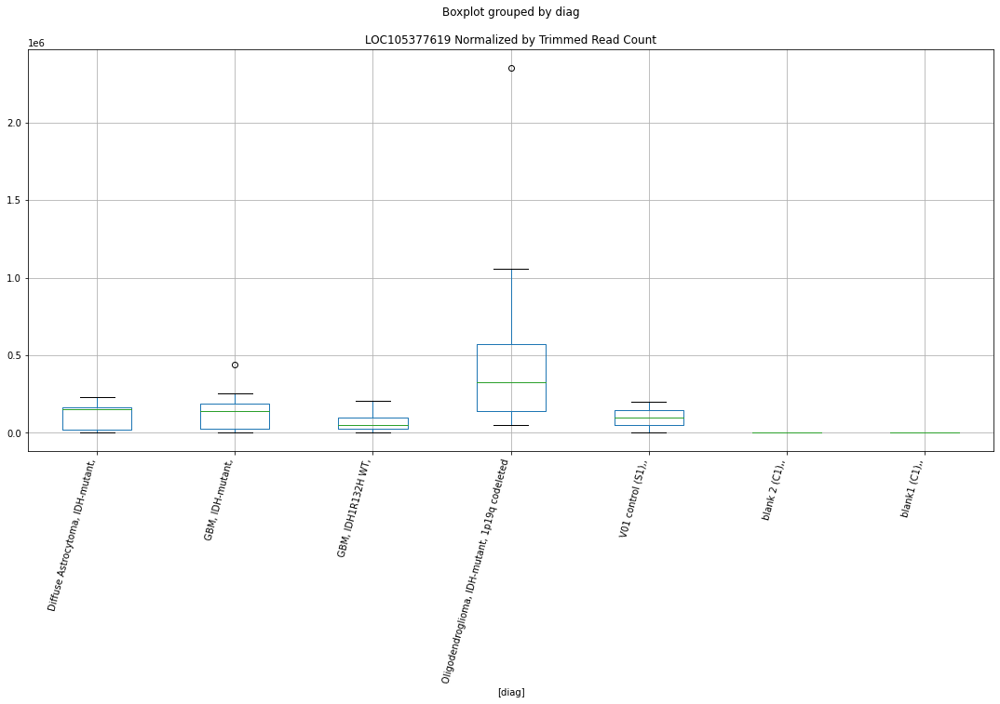

 p : 0.041578891422655896  ( t : 2.194288882632884 ) :  D-plex  :  bbduk2  :  LOC107984338
Control and blanks
73     0.0
337    0.0
Name: LOC107984338, dtype: float64
205    0.0
Name: LOC107984338, dtype: float64
469    0.0
Name: LOC107984338, dtype: float64


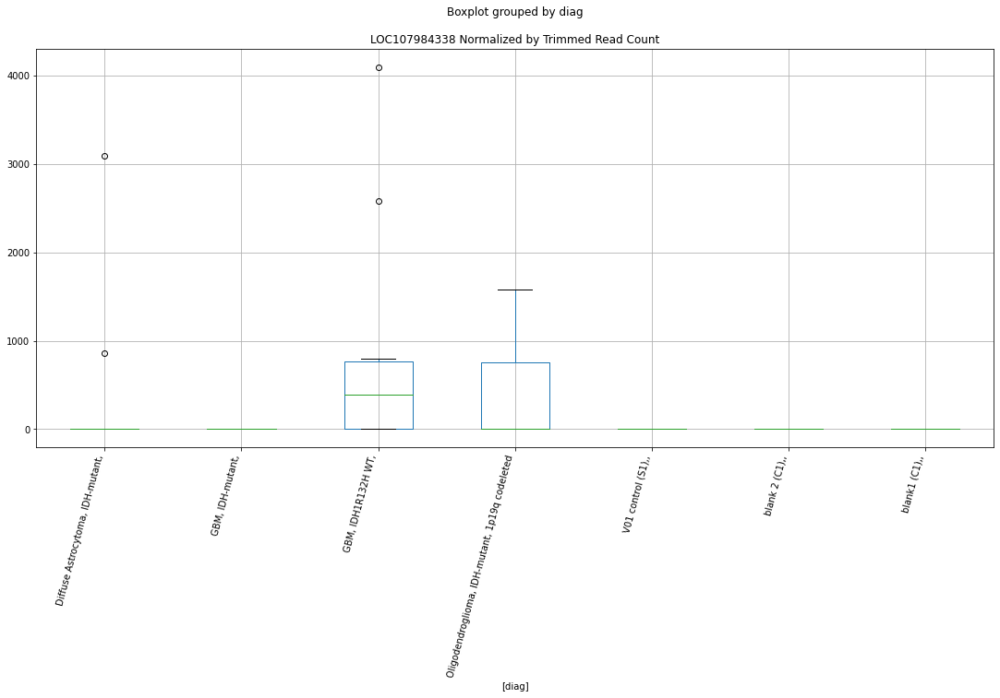

 p : 0.04185428751470289  ( t : 2.1909720897652427 ) :  D-plex  :  bbduk2  :  LOC105377697
Control and blanks
73     0.0
337    0.0
Name: LOC105377697, dtype: float64
205    179.09
Name: LOC105377697, dtype: float64
469    0.0
Name: LOC105377697, dtype: float64


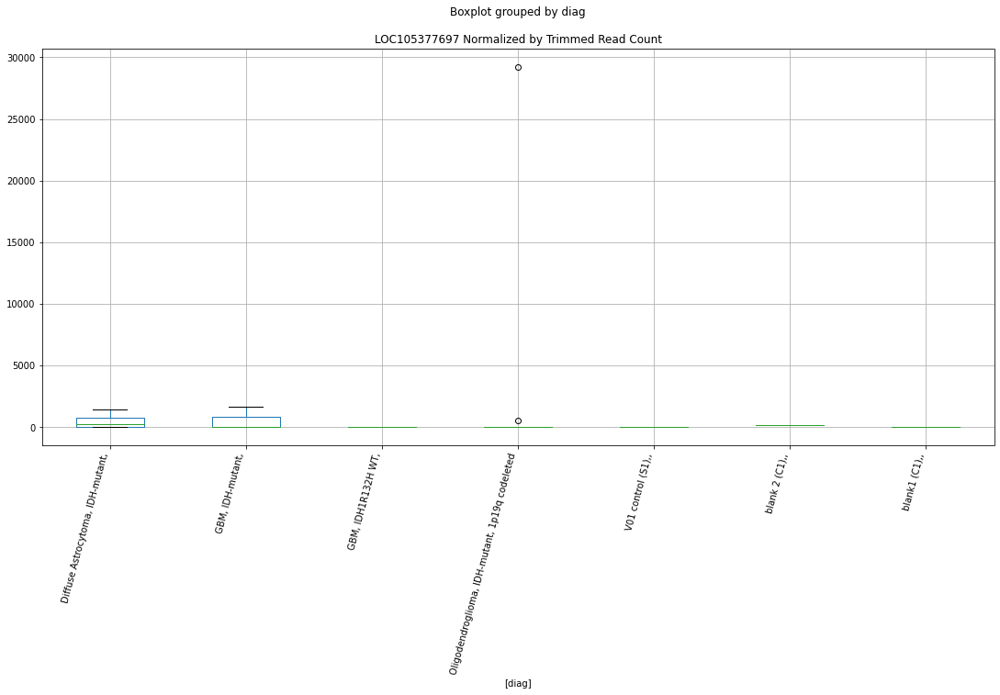

 p : 0.04188178433406147  ( t : 2.19064202628798 ) :  Lexogen  :  bbduk2  :  LOC105378954
Control and blanks
79     0.0
343    0.0
Name: LOC105378954, dtype: float64
211    273.31
Name: LOC105378954, dtype: float64
475    0.0
Name: LOC105378954, dtype: float64


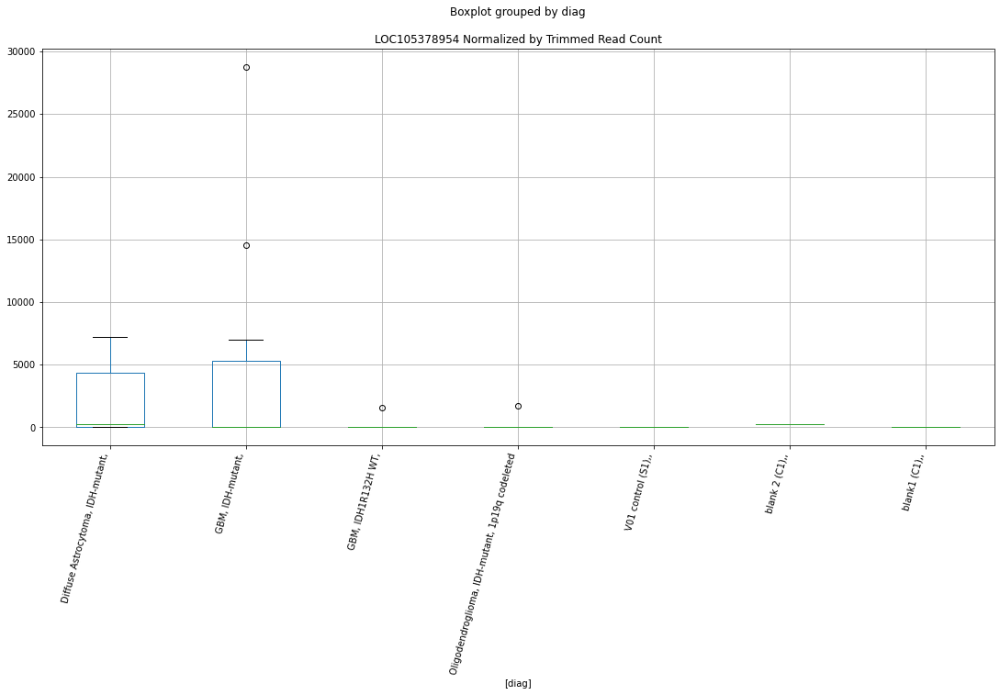

 p : 0.04189686390299494  ( t : 2.1904611001270564 ) :  Lexogen  :  cutadapt2  :  LOC105378954
Control and blanks
82     0.0
346    0.0
Name: LOC105378954, dtype: float64
214    271.23
Name: LOC105378954, dtype: float64
478    0.0
Name: LOC105378954, dtype: float64


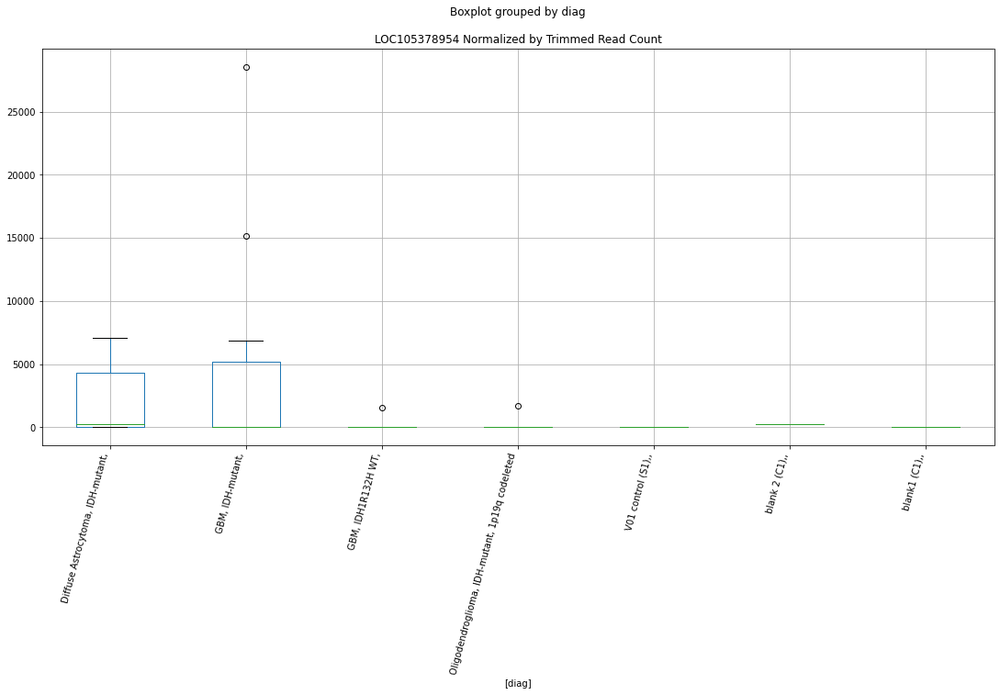

 p : 0.04195345578534621  ( t : 2.189782637546804 ) :  D-plex  :  bbduk2  :  LOC105375544
Control and blanks
73     0.0
337    0.0
Name: LOC105375544, dtype: float64
205    716.36
Name: LOC105375544, dtype: float64
469    1183.05
Name: LOC105375544, dtype: float64


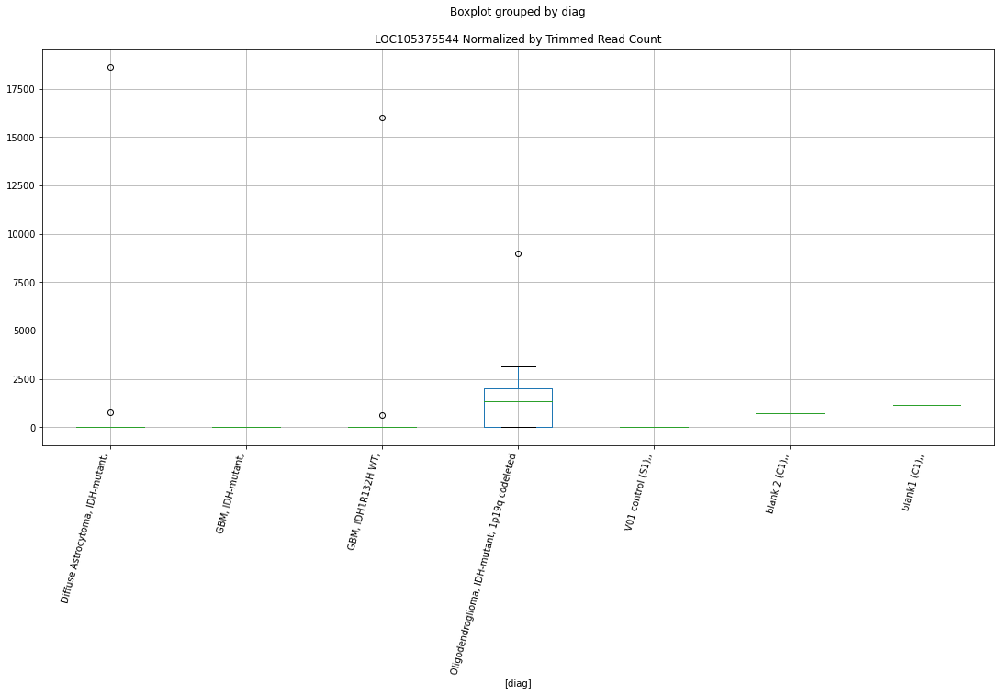

 p : 0.04221005076946255  ( t : 2.186716894702487 ) :  D-plex  :  bbduk2  :  LOC105376314
Control and blanks
73        0.00
337    1780.31
Name: LOC105376314, dtype: float64
205    2149.09
Name: LOC105376314, dtype: float64
469    2957.64
Name: LOC105376314, dtype: float64


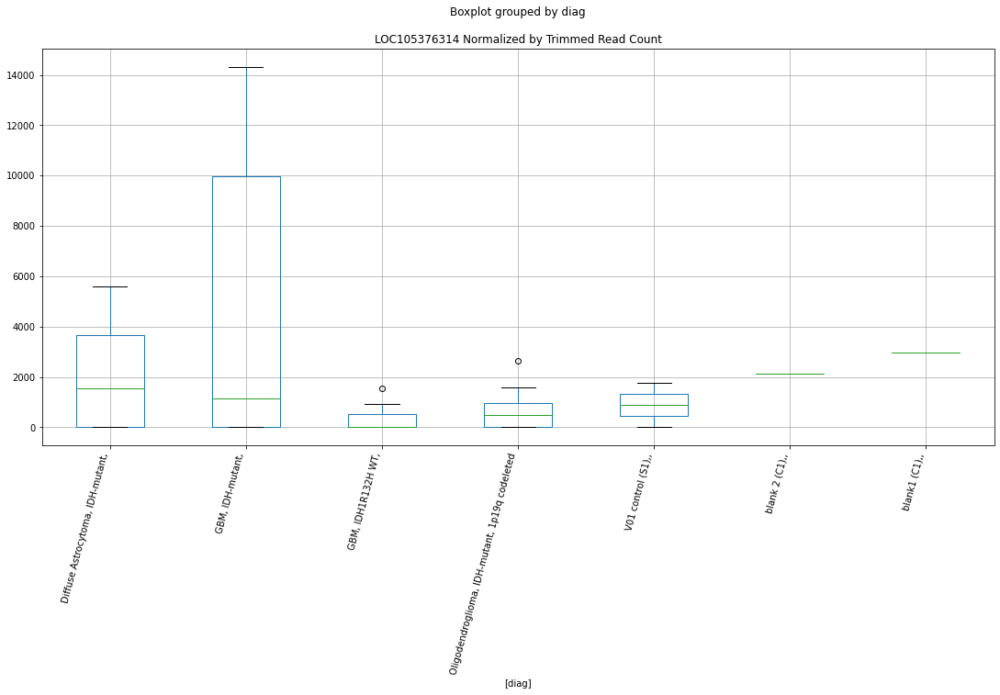

 p : 0.04236698652613855  ( t : 2.184850272977809 ) :  D-plex  :  cutadapt2  :  LOC107985665
Control and blanks
76     23486.04
340        0.00
Name: LOC107985665, dtype: float64
208    1058.16
Name: LOC107985665, dtype: float64
472    0.0
Name: LOC107985665, dtype: float64


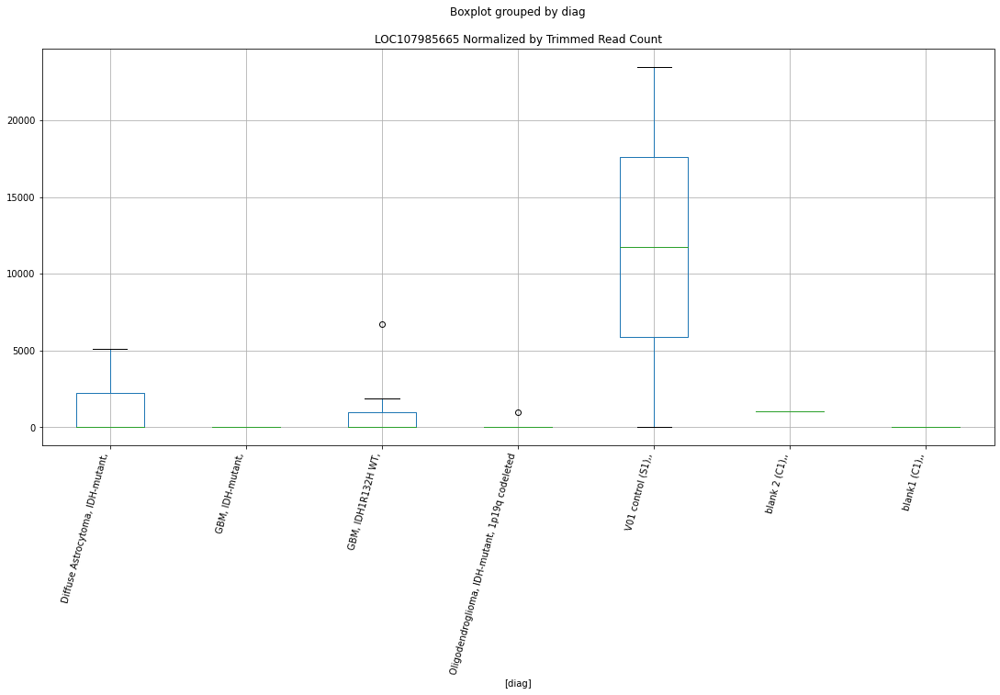

 p : 0.042446030189636934  ( t : 2.1839125134090462 ) :  Lexogen  :  cutadapt2  :  LOC107984696
Control and blanks
82     0.0
346    0.0
Name: LOC107984696, dtype: float64
214    0.0
Name: LOC107984696, dtype: float64
478    0.0
Name: LOC107984696, dtype: float64


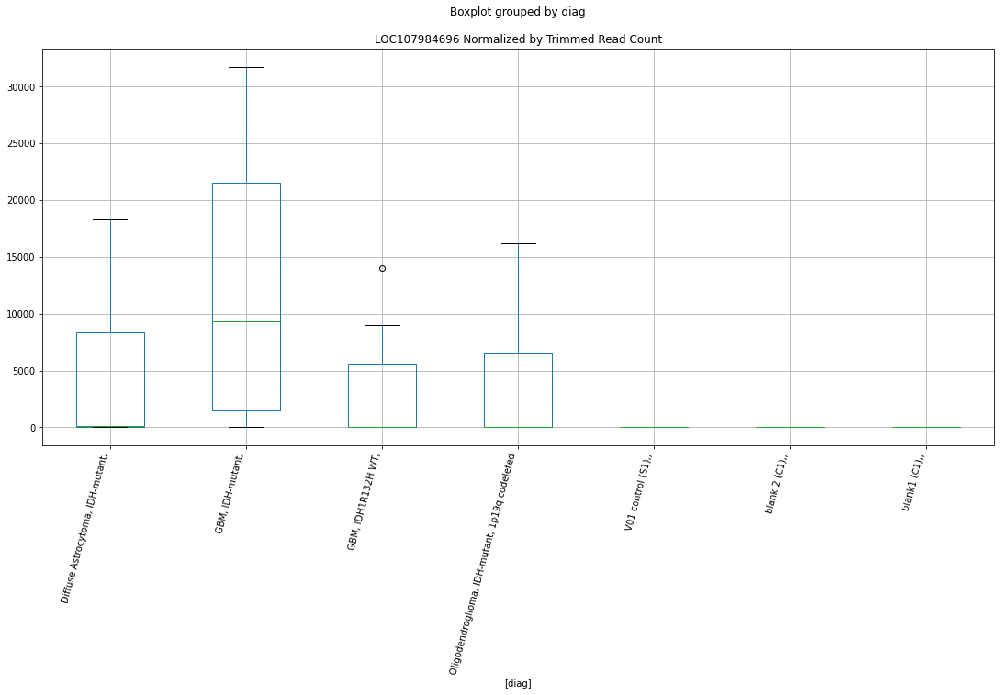

 p : 0.042690290940997834  ( t : 2.1810247334612374 ) :  D-plex  :  cutadapt2  :  LOC105378675
Control and blanks
76     0.0
340    0.0
Name: LOC105378675, dtype: float64
208    1763.6
Name: LOC105378675, dtype: float64
472    2311.82
Name: LOC105378675, dtype: float64


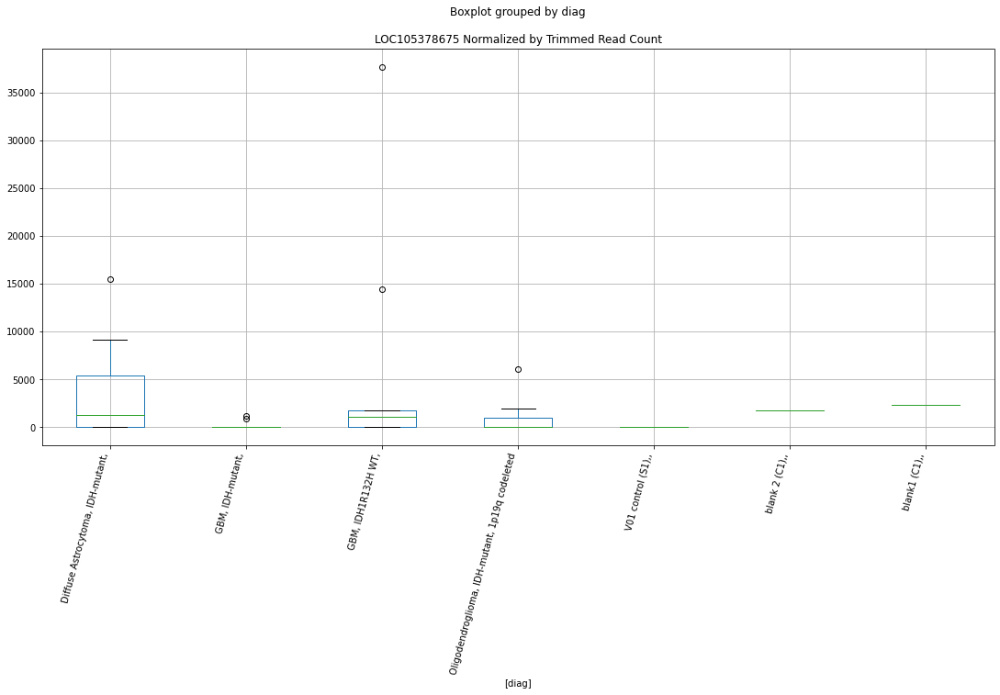

 p : 0.0427522597755124  ( t : 2.1802945141572274 ) :  D-plex  :  bbduk2  :  LOC105374191
Control and blanks
73     0.0
337    0.0
Name: LOC105374191, dtype: float64
205    179.09
Name: LOC105374191, dtype: float64
469    0.0
Name: LOC105374191, dtype: float64


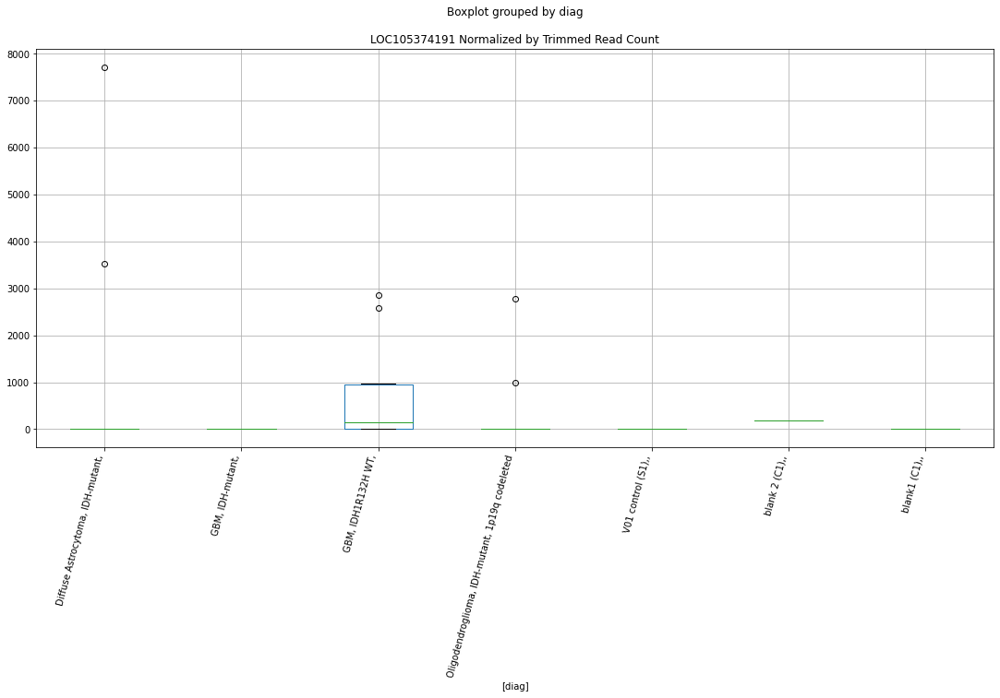

 p : 0.0427935661418151  ( t : 2.1798083128965757 ) :  D-plex  :  bbduk2  :  LOC105376050
Control and blanks
73         0.00
337    48958.65
Name: LOC105376050, dtype: float64
205    10029.09
Name: LOC105376050, dtype: float64
469    20111.93
Name: LOC105376050, dtype: float64


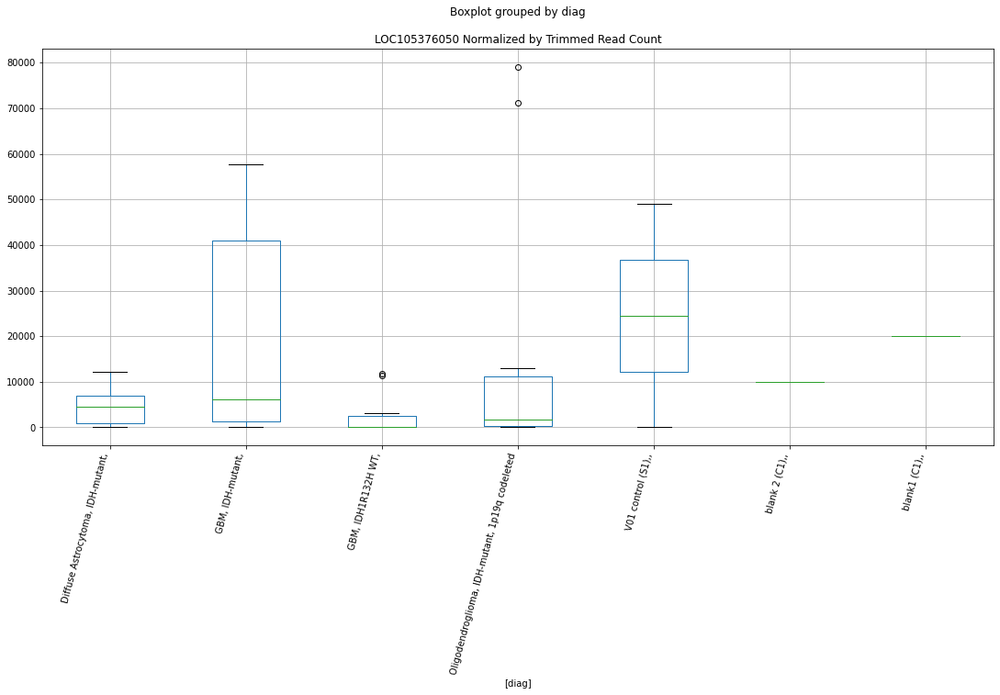

 p : 0.04282919548843961  ( t : 2.1793892790354703 ) :  Lexogen  :  bbduk2  :  LOC107985565
Control and blanks
79     0.0
343    0.0
Name: LOC107985565, dtype: float64
211    0.0
Name: LOC107985565, dtype: float64
475    0.0
Name: LOC107985565, dtype: float64


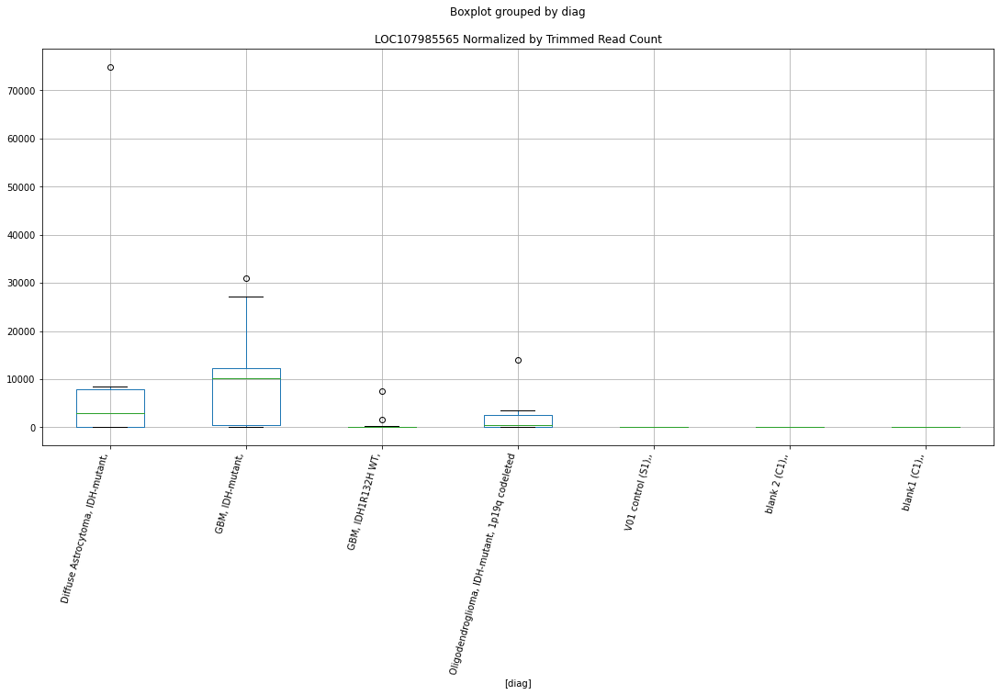

 p : 0.0428866136007675  ( t : 2.1787146610681924 ) :  D-plex  :  bbduk2  :  LOC105377461
Control and blanks
73     1546.02
337       0.00
Name: LOC105377461, dtype: float64
205    537.27
Name: LOC105377461, dtype: float64
469    0.0
Name: LOC105377461, dtype: float64


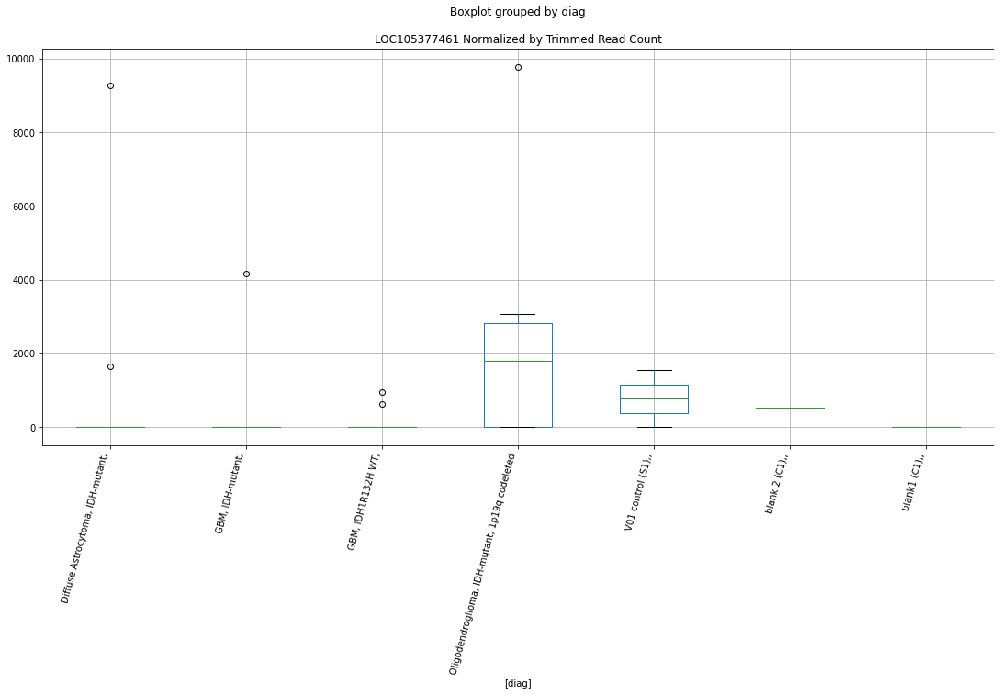

 p : 0.042933935338093386  ( t : 2.1781592895317425 ) :  Lexogen  :  cutadapt2  :  LOC105372838
Control and blanks
82     0.0
346    0.0
Name: LOC105372838, dtype: float64
214    0.0
Name: LOC105372838, dtype: float64
478    0.0
Name: LOC105372838, dtype: float64


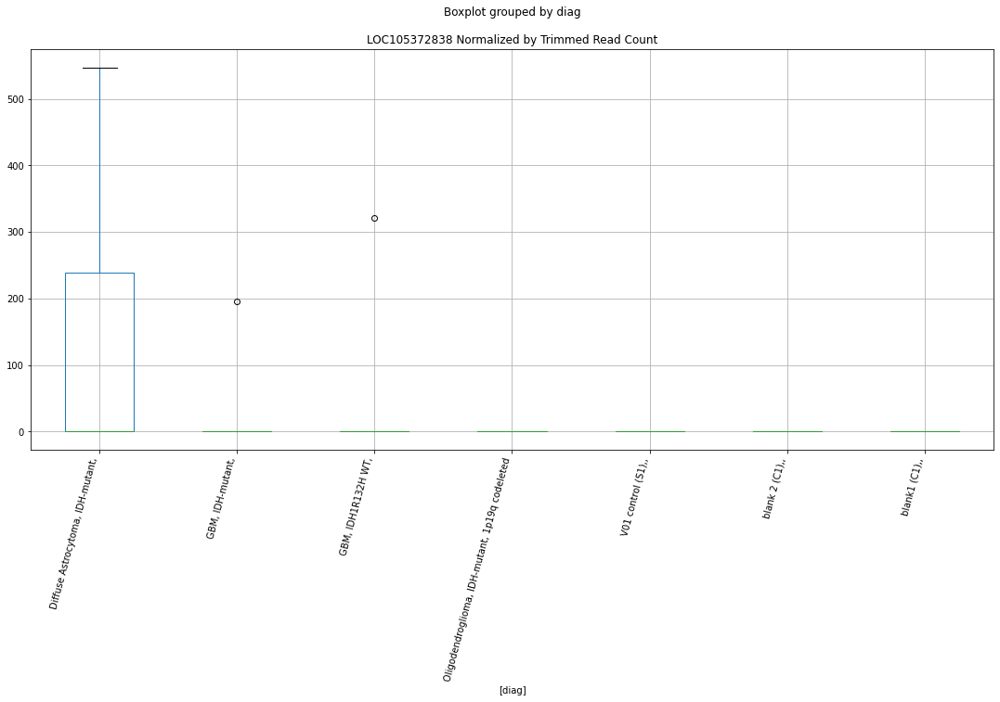

 p : 0.04309342057112746  ( t : 2.176291680436181 ) :  D-plex  :  cutadapt2  :  LOC105374191
Control and blanks
76     0.0
340    0.0
Name: LOC105374191, dtype: float64
208    176.36
Name: LOC105374191, dtype: float64
472    0.0
Name: LOC105374191, dtype: float64


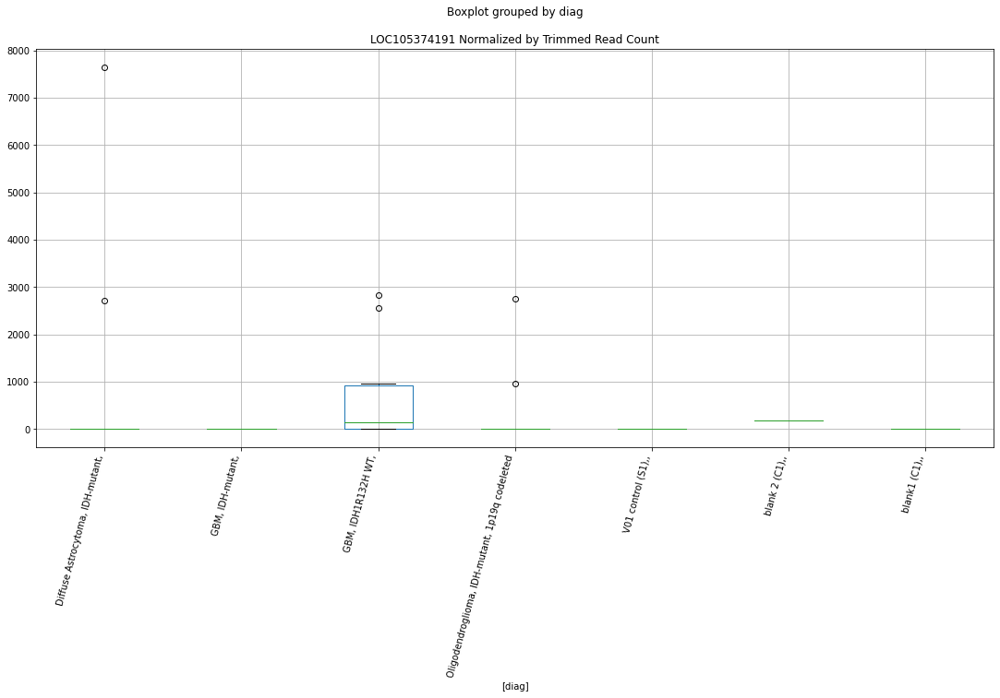

 p : 0.043103649870828105  ( t : 2.176172109199974 ) :  D-plex  :  bbduk2  :  LOC105373682
Control and blanks
73     0.0
337    0.0
Name: LOC105373682, dtype: float64
205    358.18
Name: LOC105373682, dtype: float64
469    0.0
Name: LOC105373682, dtype: float64


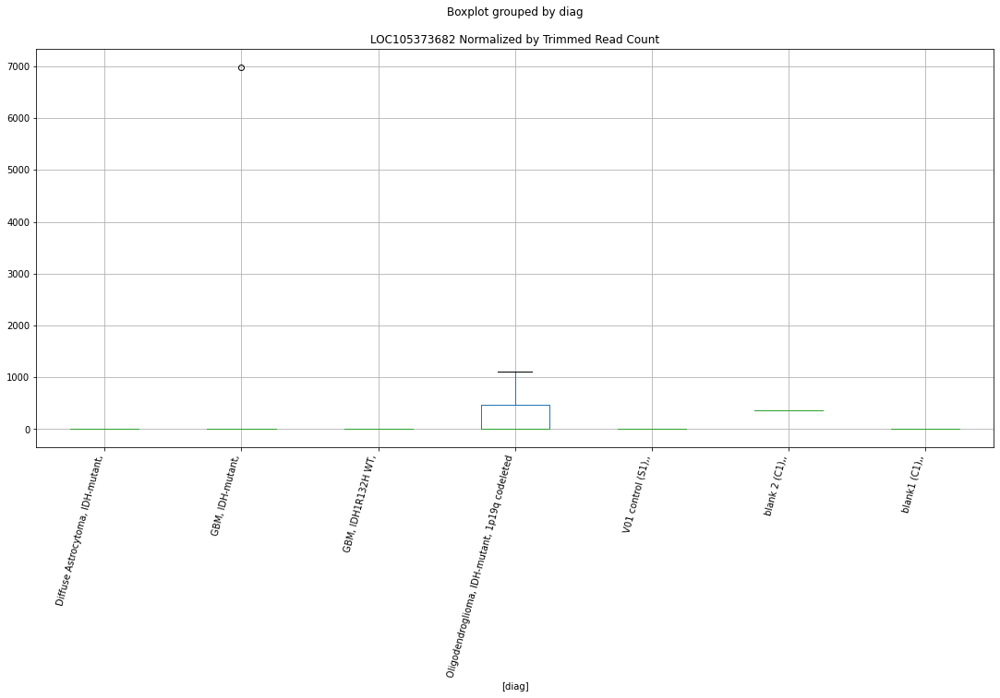

 p : 0.043106234938727284  ( t : 2.176141896215954 ) :  D-plex  :  bbduk2  :  LOC107985435
Control and blanks
73     0.0
337    0.0
Name: LOC107985435, dtype: float64
205    1611.82
Name: LOC107985435, dtype: float64
469    2366.11
Name: LOC107985435, dtype: float64


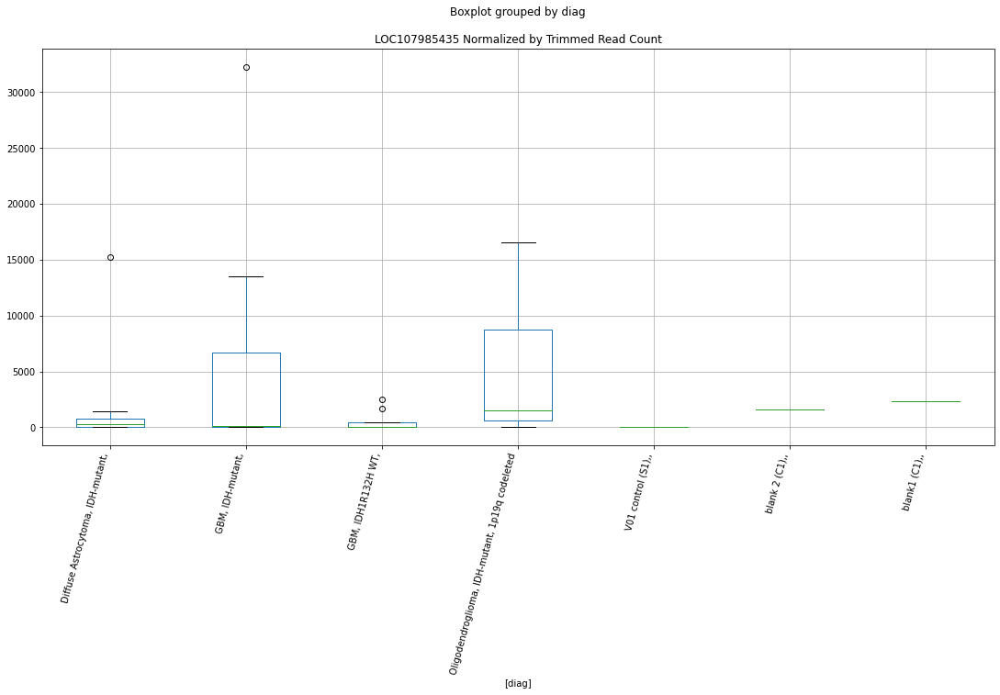

 p : 0.04311279143427205  ( t : 2.1760652746105174 ) :  D-plex  :  bbduk2  :  LOC105376335
Control and blanks
73     0.0
337    0.0
Name: LOC105376335, dtype: float64
205    358.18
Name: LOC105376335, dtype: float64
469    1183.05
Name: LOC105376335, dtype: float64


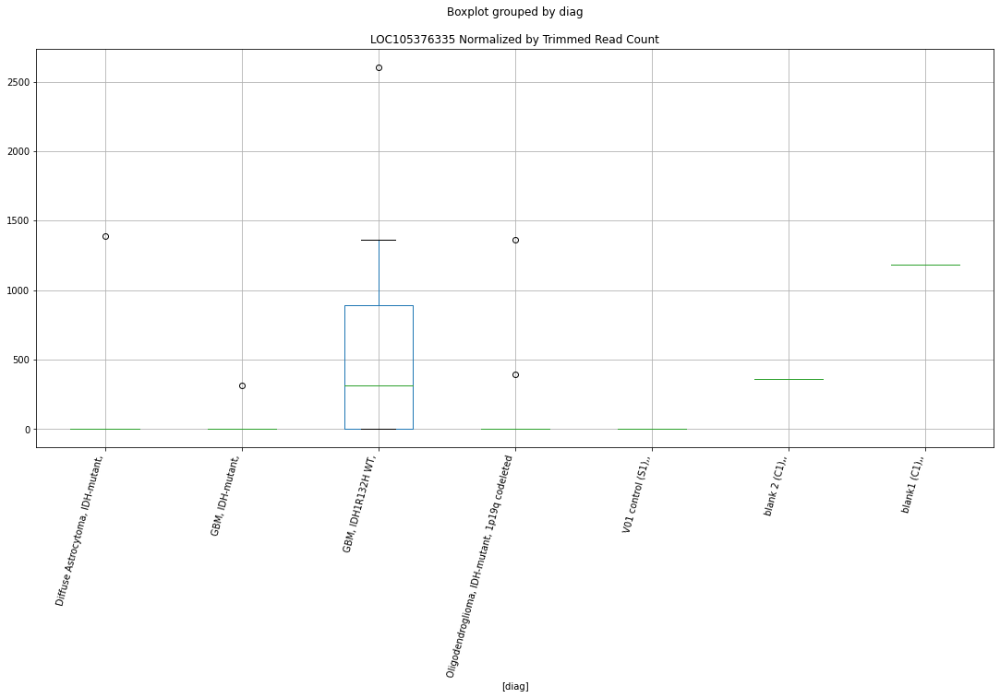

 p : 0.043224876805929596  ( t : 2.1747570524376125 ) :  D-plex  :  bbduk2  :  LOC105372064
Control and blanks
73     1546.02
337       0.00
Name: LOC105372064, dtype: float64
205    1253.64
Name: LOC105372064, dtype: float64
469    1774.58
Name: LOC105372064, dtype: float64


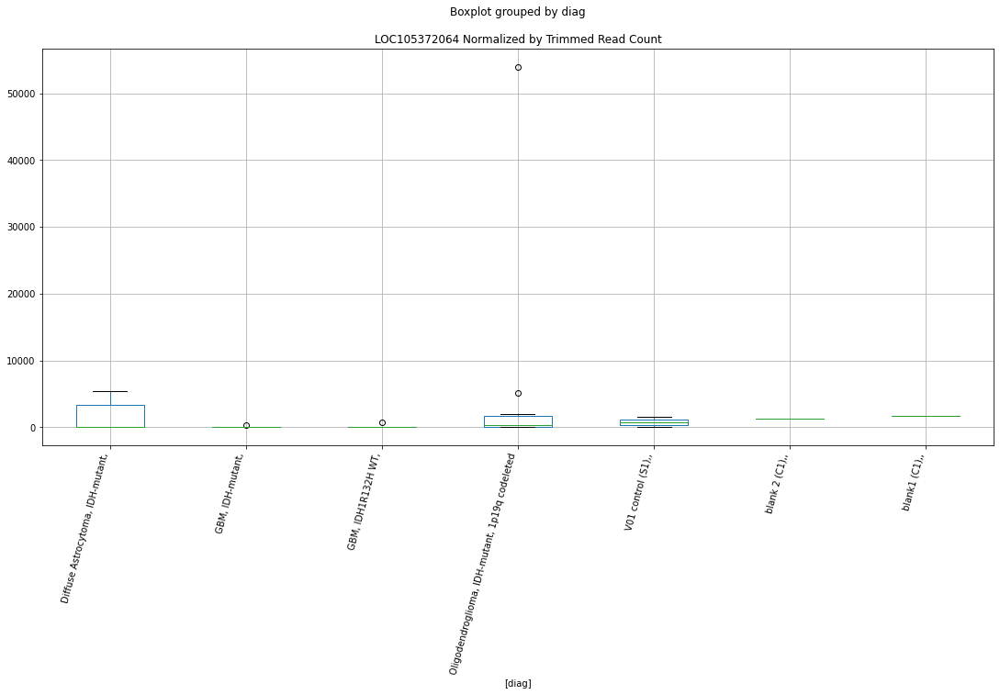

 p : 0.043396860790464405  ( t : 2.172755743814279 ) :  D-plex  :  bbduk2  :  LOC105372374
Control and blanks
73     0.0
337    0.0
Name: LOC105372374, dtype: float64
205    4477.27
Name: LOC105372374, dtype: float64
469    5323.75
Name: LOC105372374, dtype: float64


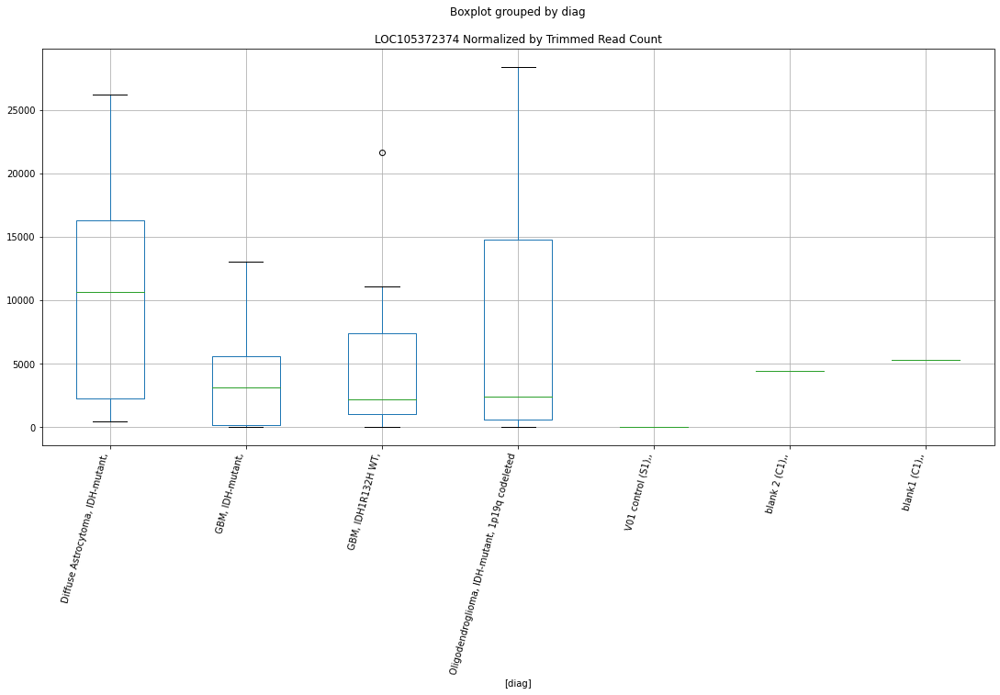

 p : 0.043434818280489534  ( t : 2.1723150264556588 ) :  D-plex  :  cutadapt2  :  LOC105375588
Control and blanks
76     1515.23
340       0.00
Name: LOC105375588, dtype: float64
208    1410.88
Name: LOC105375588, dtype: float64
472    0.0
Name: LOC105375588, dtype: float64


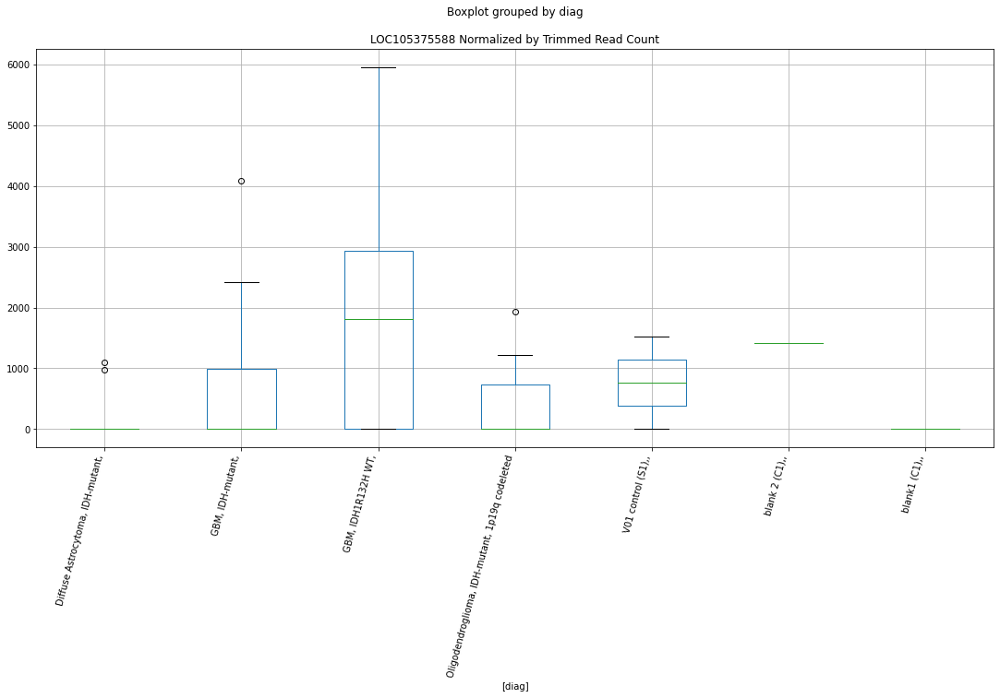

 p : 0.043478089190257925  ( t : 2.1718130460045995 ) :  Lexogen  :  bbduk2  :  LOC107984696
Control and blanks
79     0.0
343    0.0
Name: LOC107984696, dtype: float64
211    0.0
Name: LOC107984696, dtype: float64
475    0.0
Name: LOC107984696, dtype: float64


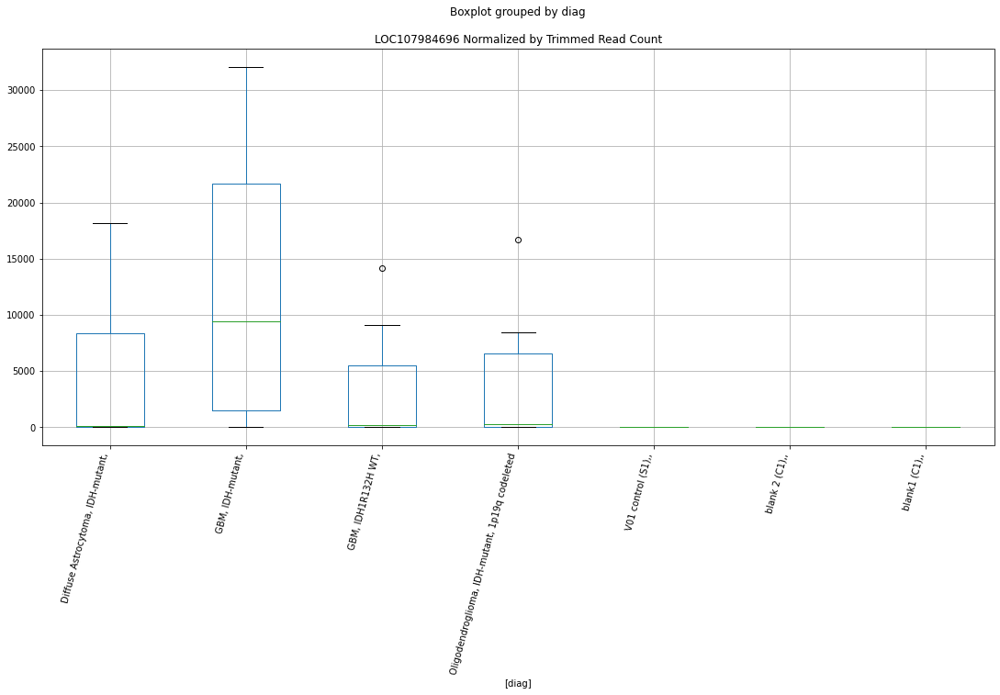

 p : 0.04348878309363031  ( t : 2.171689057868634 ) :  D-plex  :  bbduk2  :  LOC107985917
Control and blanks
73     1546.02
337     890.16
Name: LOC107985917, dtype: float64
205    4298.18
Name: LOC107985917, dtype: float64
469    6506.8
Name: LOC107985917, dtype: float64


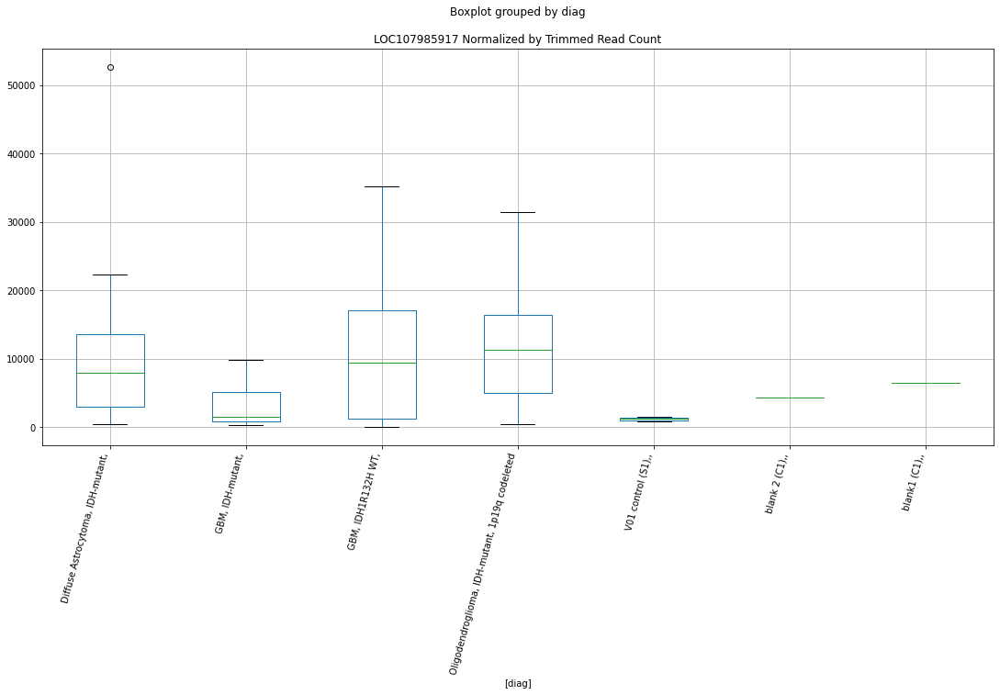

 p : 0.043531686176289525  ( t : 2.1711919079500093 ) :  D-plex  :  bbduk2  :  LOC105379420
Control and blanks
73     0.0
337    0.0
Name: LOC105379420, dtype: float64
205    4477.27
Name: LOC105379420, dtype: float64
469    5323.75
Name: LOC105379420, dtype: float64


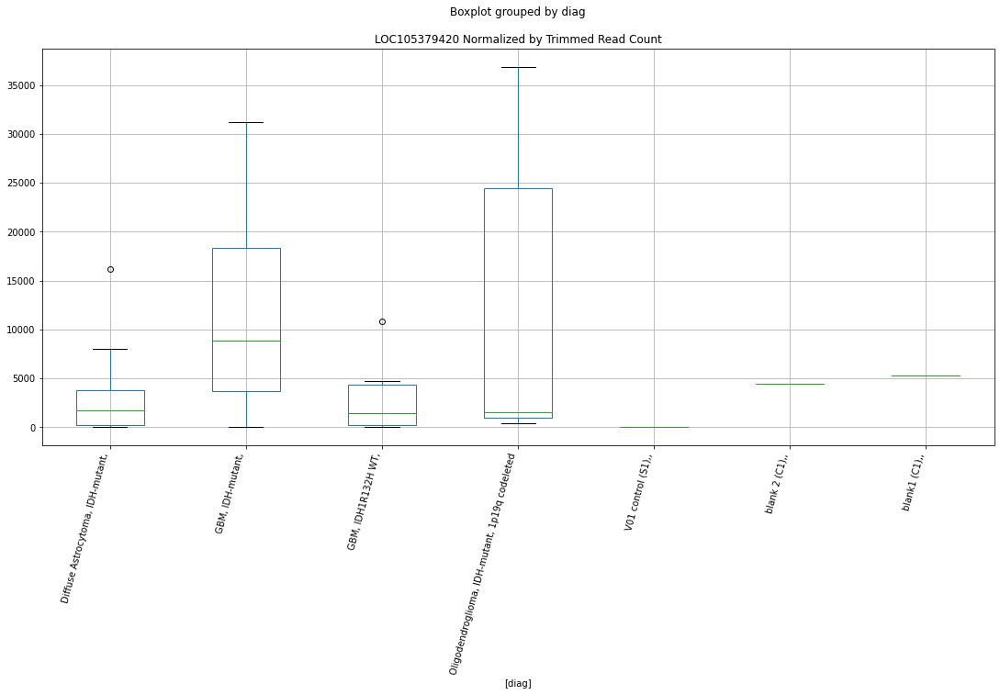

 p : 0.04391380104209506  ( t : 2.1667837433400168 ) :  D-plex  :  bbduk2  :  LOC105373487
Control and blanks
73     0.0
337    0.0
Name: LOC105373487, dtype: float64
205    0.0
Name: LOC105373487, dtype: float64
469    0.0
Name: LOC105373487, dtype: float64


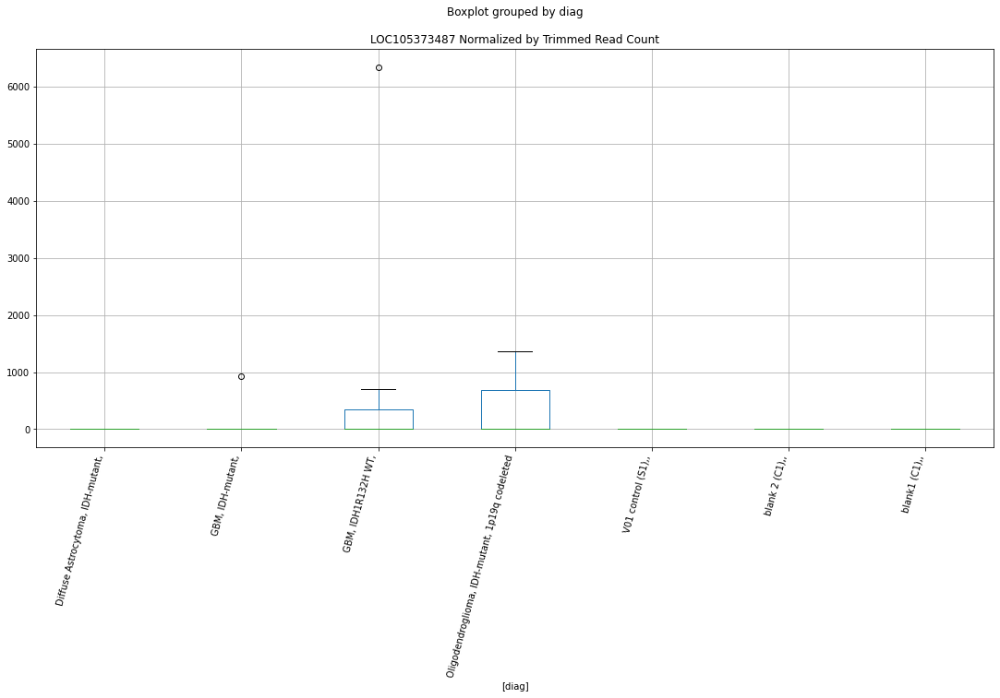

 p : 0.04398347051396568  ( t : 2.165983807174955 ) :  D-plex  :  cutadapt2  :  LOC105377461
Control and blanks
76     1515.23
340       0.00
Name: LOC105377461, dtype: float64
208    529.08
Name: LOC105377461, dtype: float64
472    0.0
Name: LOC105377461, dtype: float64


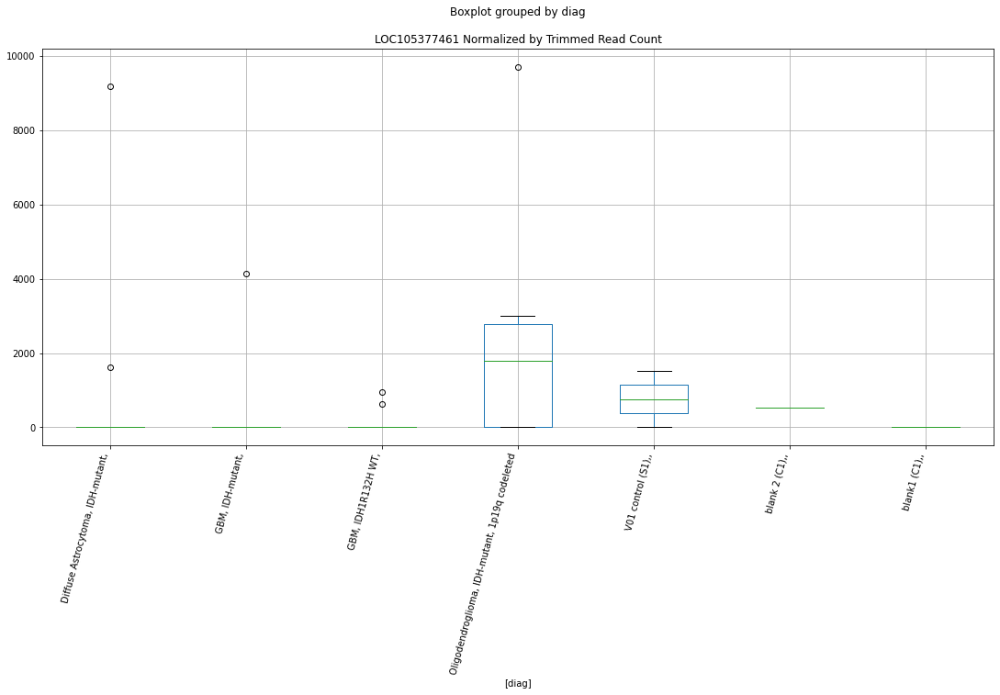

 p : 0.0441911518722489  ( t : 2.163606097737585 ) :  D-plex  :  bbduk2  :  LOC105376541
Control and blanks
73     0.0
337    0.0
Name: LOC105376541, dtype: float64
205    1432.73
Name: LOC105376541, dtype: float64
469    4732.22
Name: LOC105376541, dtype: float64


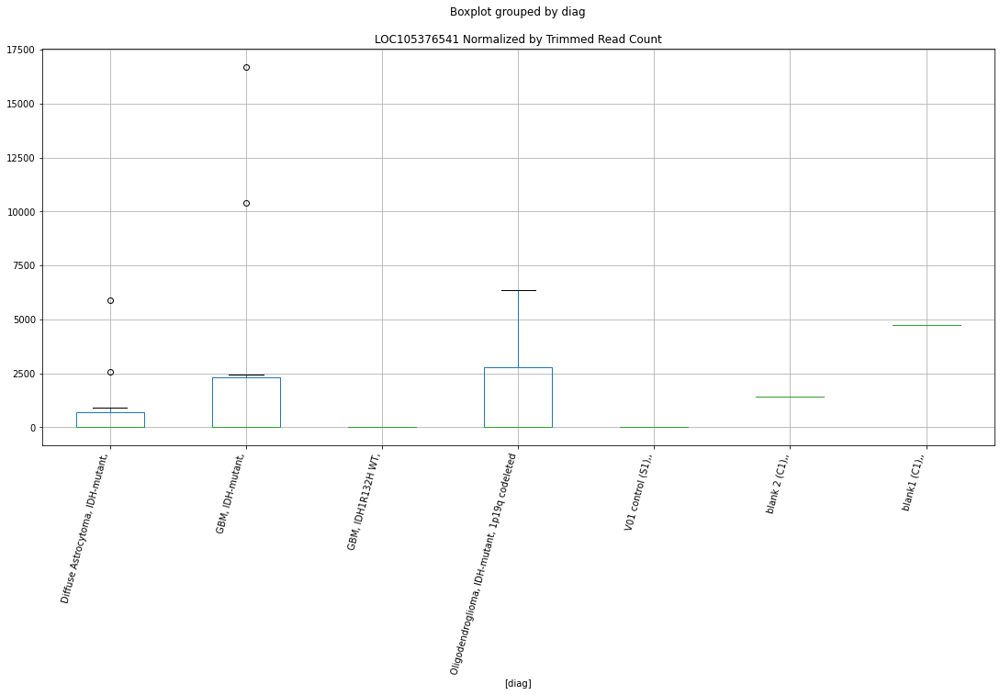

 p : 0.04453567840737303  ( t : 2.1596841269274436 ) :  D-plex  :  cutadapt2  :  LOC105379087
Control and blanks
76     0.0
340    0.0
Name: LOC105379087, dtype: float64
208    3350.84
Name: LOC105379087, dtype: float64
472    1733.87
Name: LOC105379087, dtype: float64


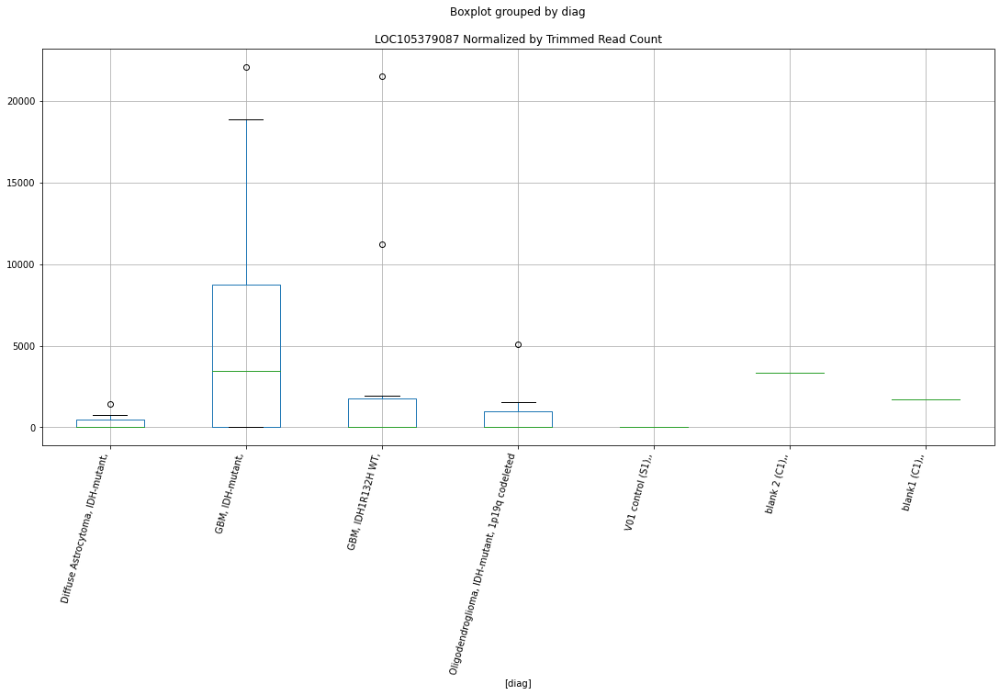

 p : 0.04483944807124376  ( t : 2.1562490714053375 ) :  D-plex  :  cutadapt2  :  LOC105376541
Control and blanks
76     0.0
340    0.0
Name: LOC105376541, dtype: float64
208    1410.88
Name: LOC105376541, dtype: float64
472    4623.65
Name: LOC105376541, dtype: float64


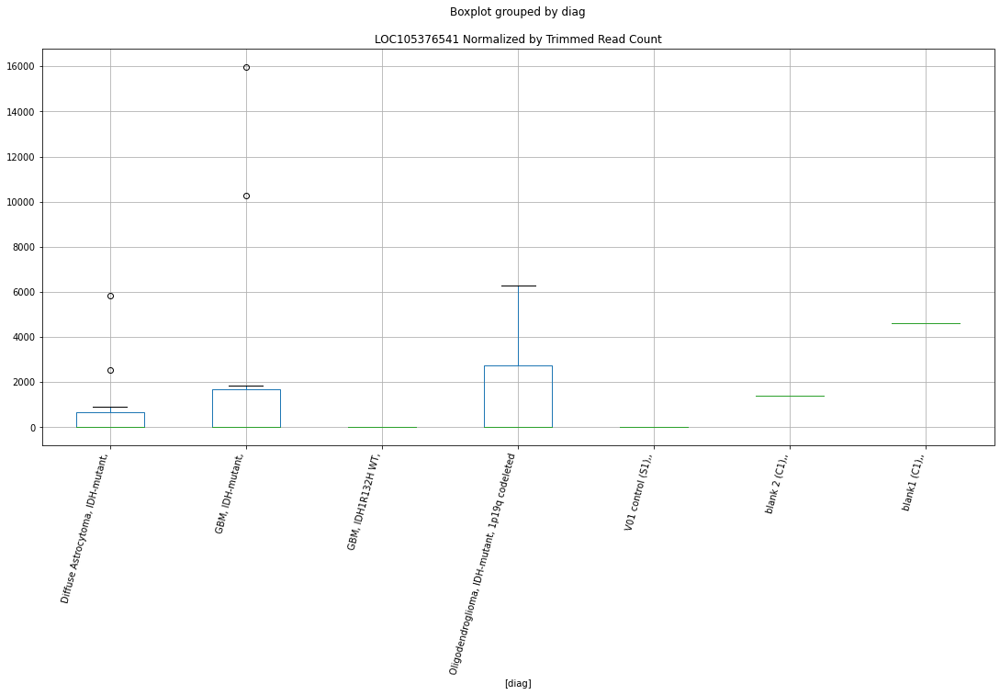

 p : 0.044875328297803156  ( t : 2.1558447406525647 ) :  D-plex  :  bbduk2  :  LOC105375738
Control and blanks
73     0.0
337    0.0
Name: LOC105375738, dtype: float64
205    2149.09
Name: LOC105375738, dtype: float64
469    3549.16
Name: LOC105375738, dtype: float64


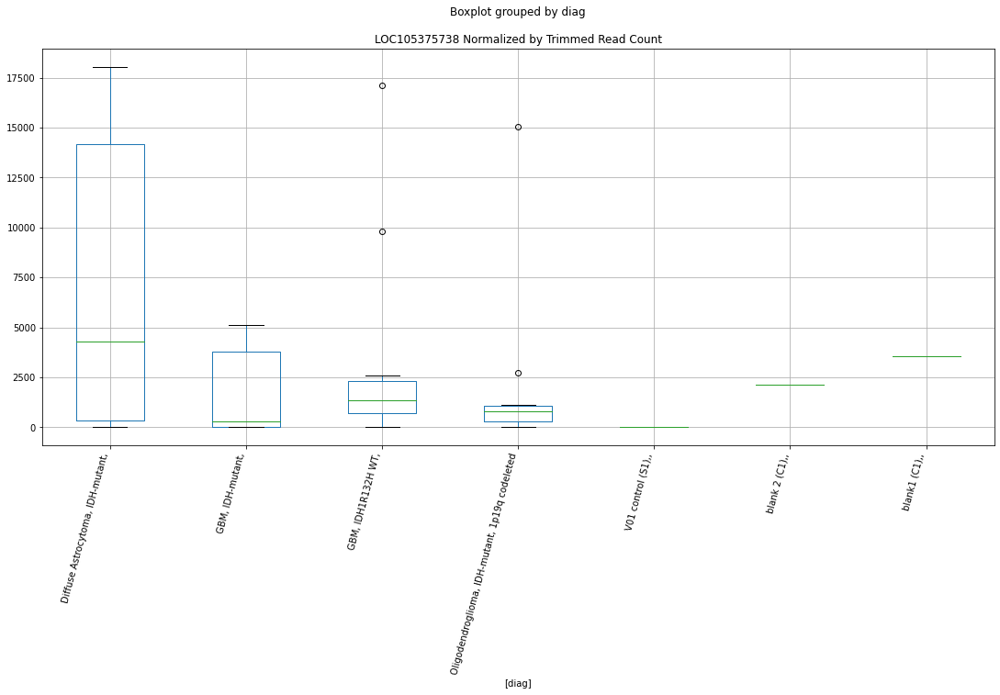

 p : 0.044878585797886256  ( t : 2.1558080468406735 ) :  D-plex  :  bbduk2  :  LOC107985256
Control and blanks
73     0.0
337    0.0
Name: LOC107985256, dtype: float64
205    895.45
Name: LOC107985256, dtype: float64
469    1183.05
Name: LOC107985256, dtype: float64


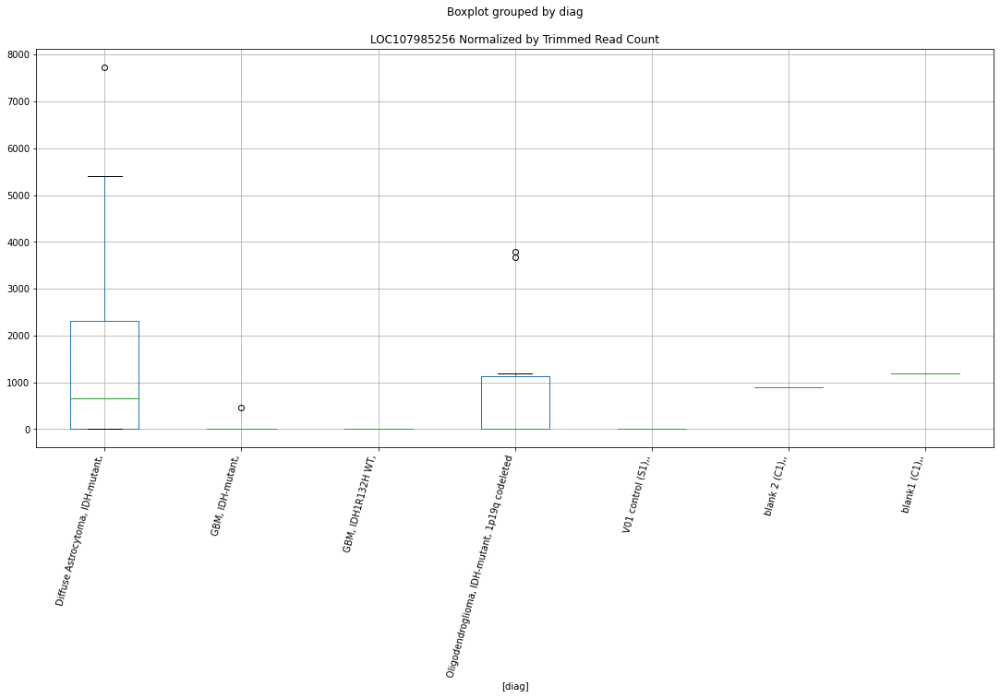

 p : 0.04494615694782029  ( t : 2.155047446409508 ) :  D-plex  :  cutadapt2  :  LOC105378976
Control and blanks
76     0.0
340    0.0
Name: LOC105378976, dtype: float64
208    176.36
Name: LOC105378976, dtype: float64
472    577.96
Name: LOC105378976, dtype: float64


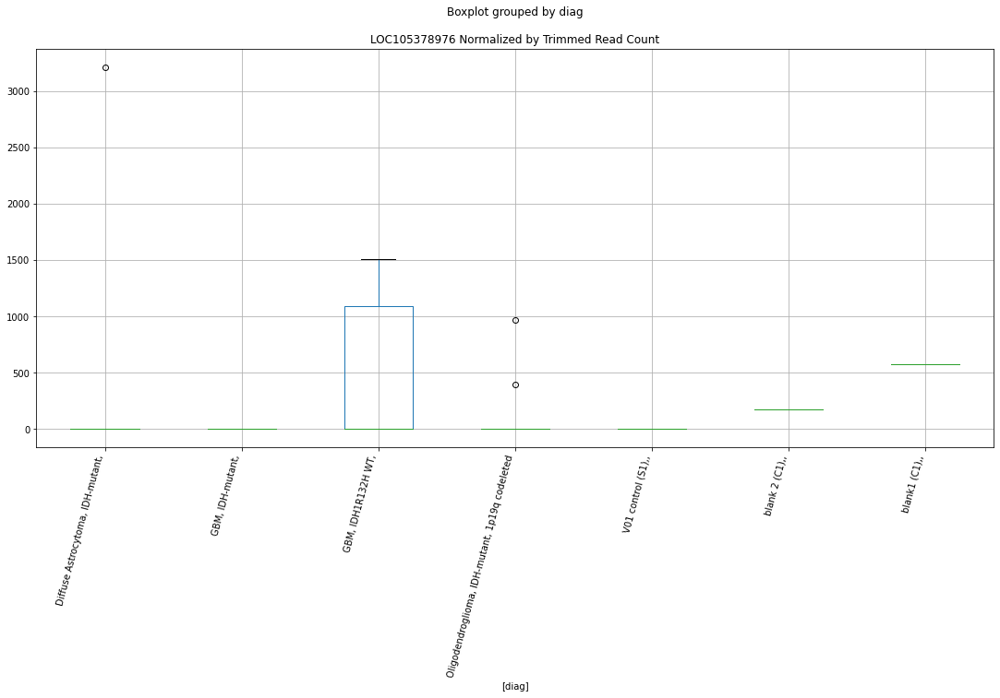

 p : 0.04507773389207484  ( t : 2.1535693730222545 ) :  Lexogen  :  cutadapt2  :  LOC105371934
Control and blanks
82         0.00
346    28198.23
Name: LOC105371934, dtype: float64
214    0.0
Name: LOC105371934, dtype: float64
478    0.0
Name: LOC105371934, dtype: float64


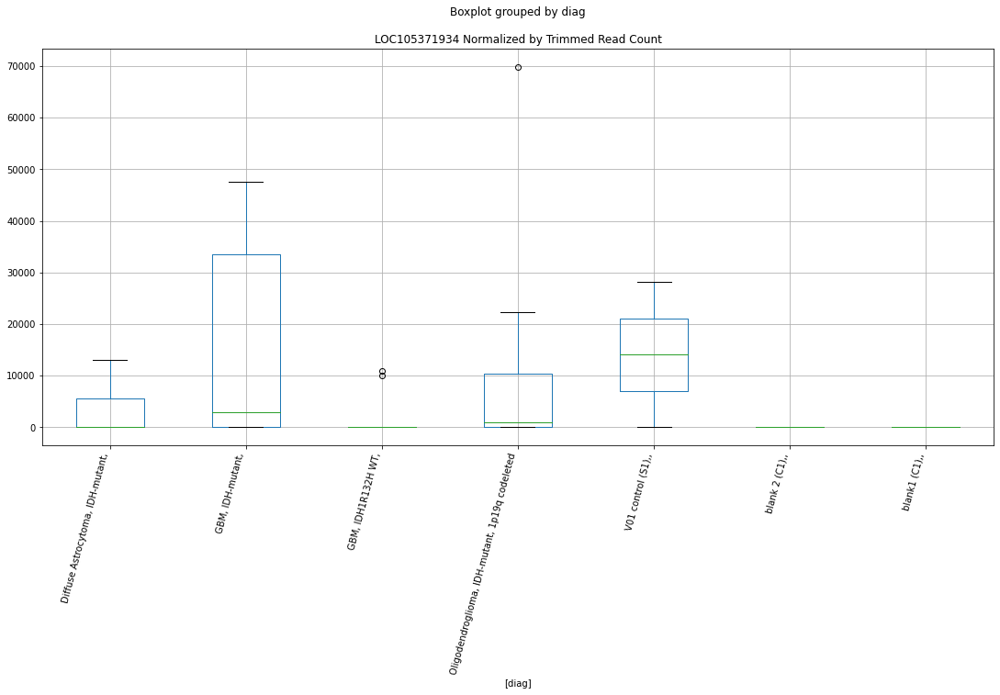

 p : 0.04508618731180776  ( t : 2.1534745461701505 ) :  Lexogen  :  bbduk2  :  LOC105371934
Control and blanks
79         0.00
343    28450.12
Name: LOC105371934, dtype: float64
211    0.0
Name: LOC105371934, dtype: float64
475    0.0
Name: LOC105371934, dtype: float64


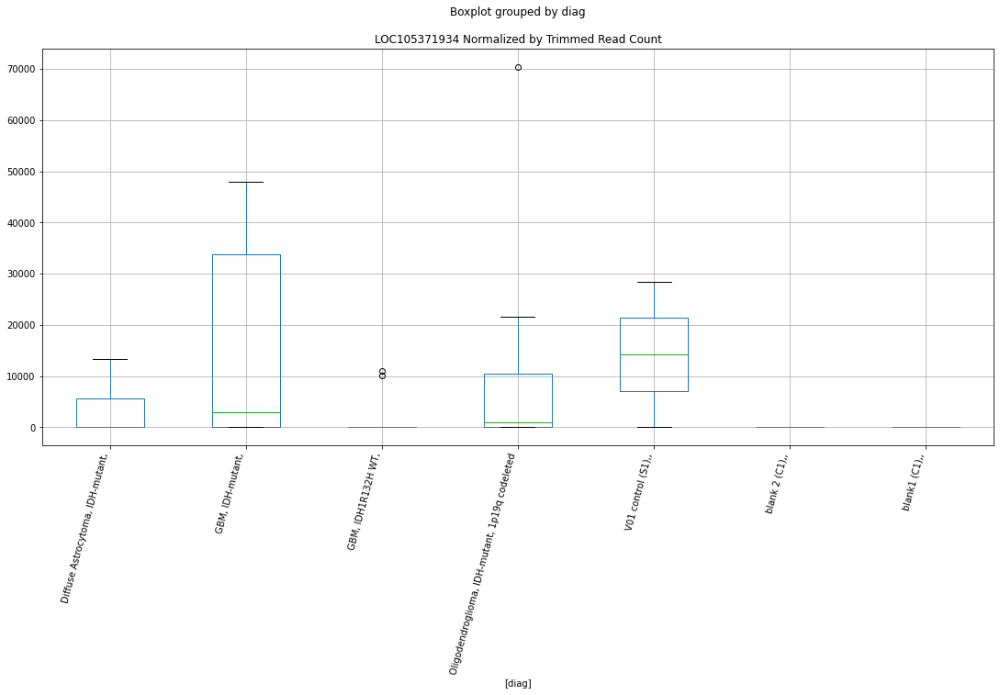

 p : 0.04526025130114823  ( t : 2.151525574212096 ) :  D-plex  :  cutadapt2  :  LOC105378373
Control and blanks
76     0.0
340    0.0
Name: LOC105378373, dtype: float64
208    0.0
Name: LOC105378373, dtype: float64
472    0.0
Name: LOC105378373, dtype: float64


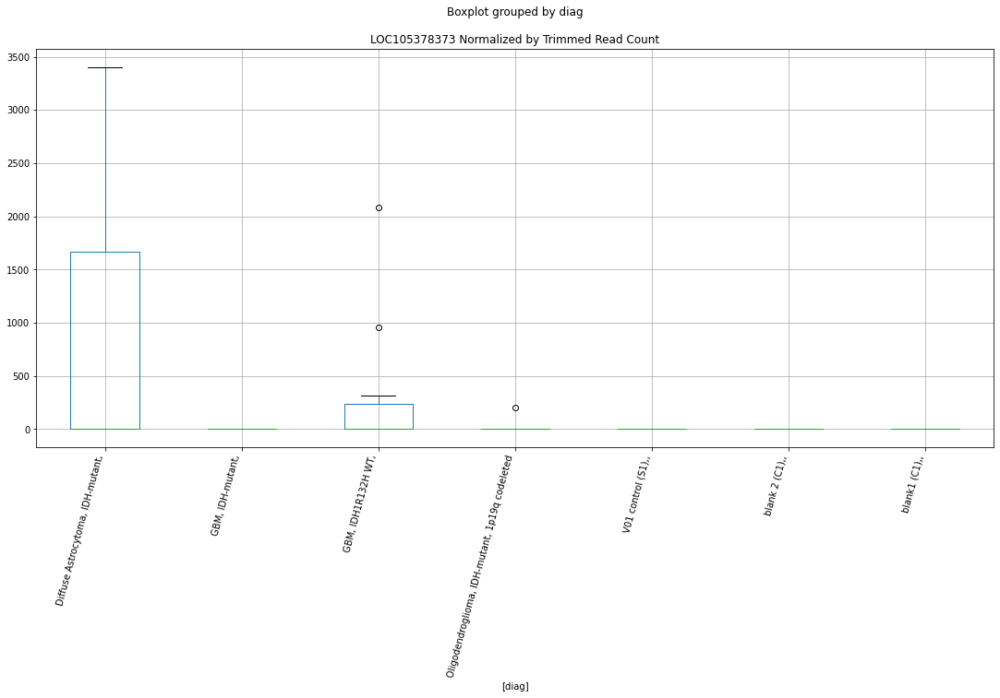

 p : 0.04527413341458607  ( t : 2.151370433082801 ) :  D-plex  :  bbduk2  :  LOC105377581
Control and blanks
73     0.0
337    0.0
Name: LOC105377581, dtype: float64
205    14148.19
Name: LOC105377581, dtype: float64
469    1774.58
Name: LOC105377581, dtype: float64


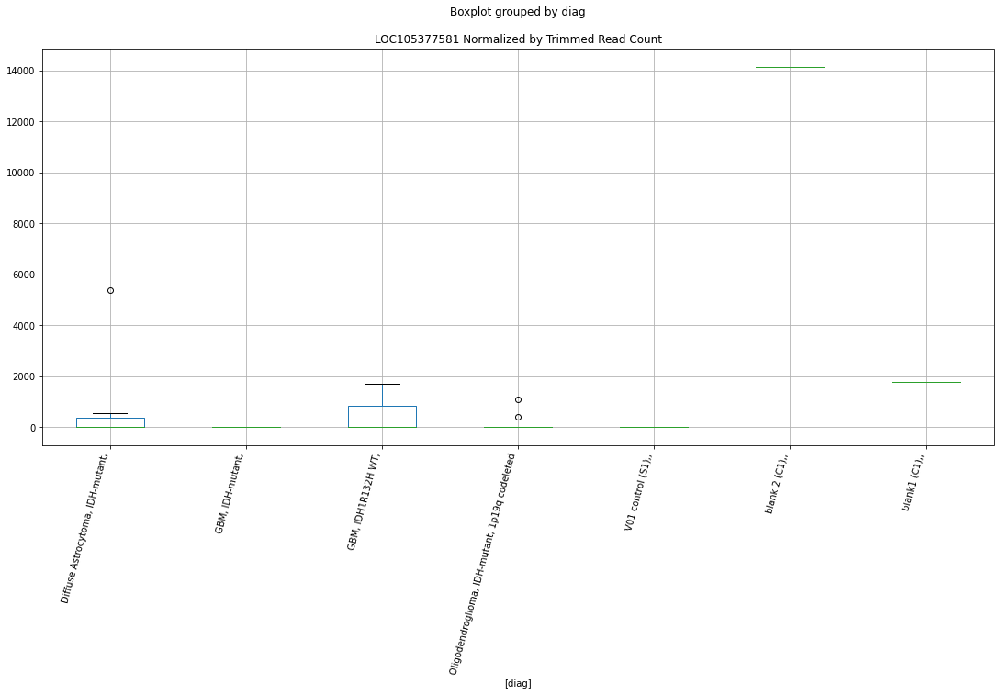

 p : 0.04528296687853852  ( t : 2.1512717363374376 ) :  D-plex  :  bbduk2  :  LOC105378373
Control and blanks
73     0.0
337    0.0
Name: LOC105378373, dtype: float64
205    0.0
Name: LOC105378373, dtype: float64
469    0.0
Name: LOC105378373, dtype: float64


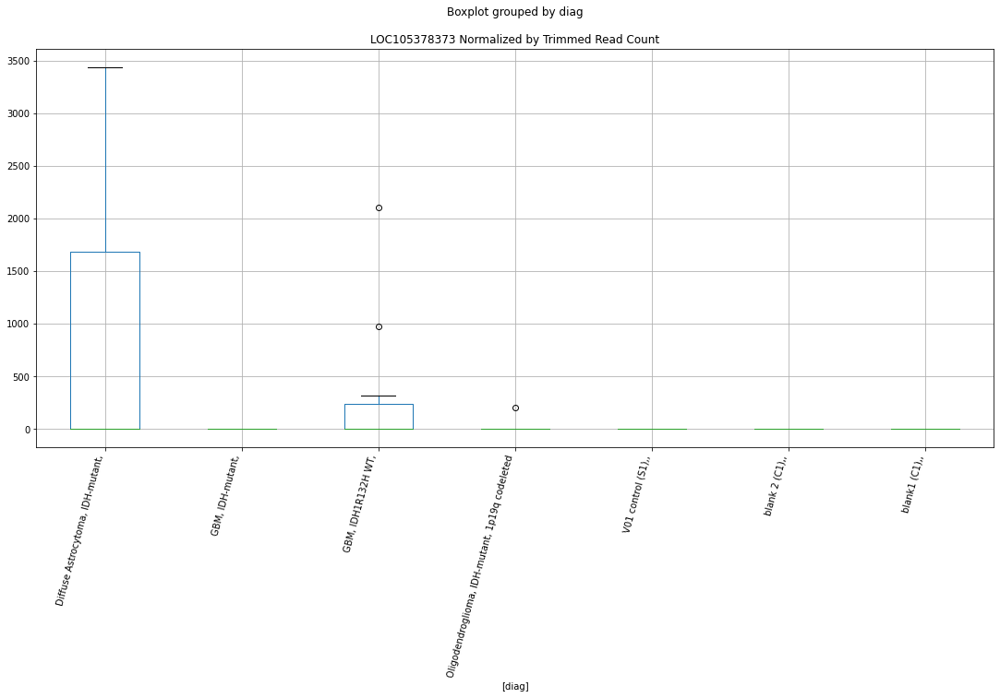

 p : 0.045315946784495104  ( t : 2.1509034055587577 ) :  Lexogen  :  cutadapt2  :  LOC105373944
Control and blanks
82     0.0
346    0.0
Name: LOC105373944, dtype: float64
214    0.0
Name: LOC105373944, dtype: float64
478    0.0
Name: LOC105373944, dtype: float64


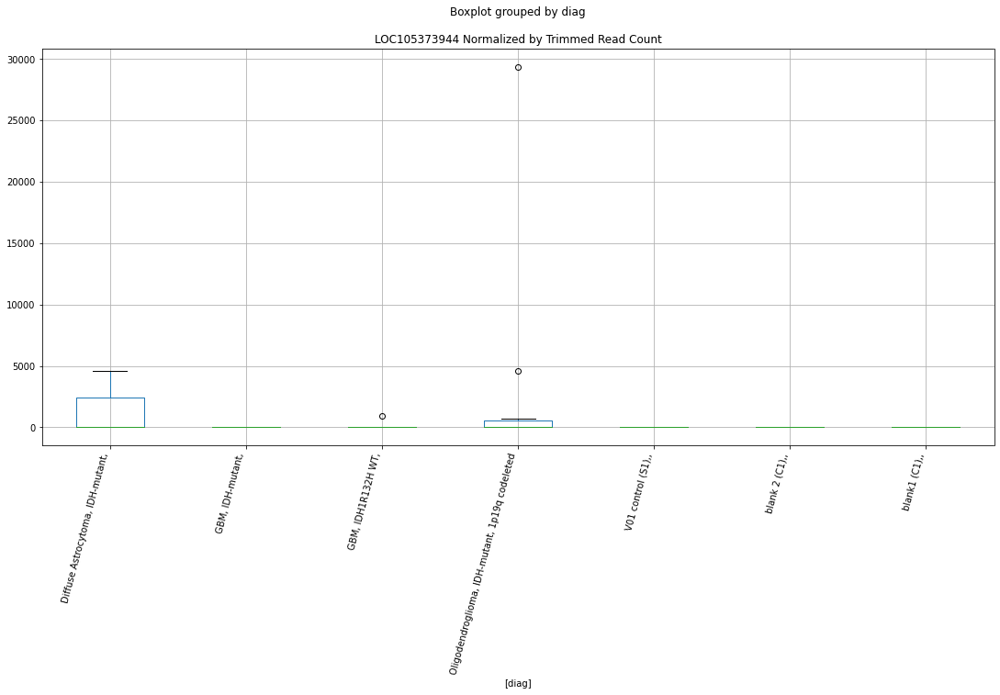

 p : 0.04532242089848435  ( t : 2.1508311292217117 ) :  D-plex  :  cutadapt2  :  LOC105377581
Control and blanks
76     0.0
340    0.0
Name: LOC105377581, dtype: float64
208    14108.82
Name: LOC105377581, dtype: float64
472    1733.87
Name: LOC105377581, dtype: float64


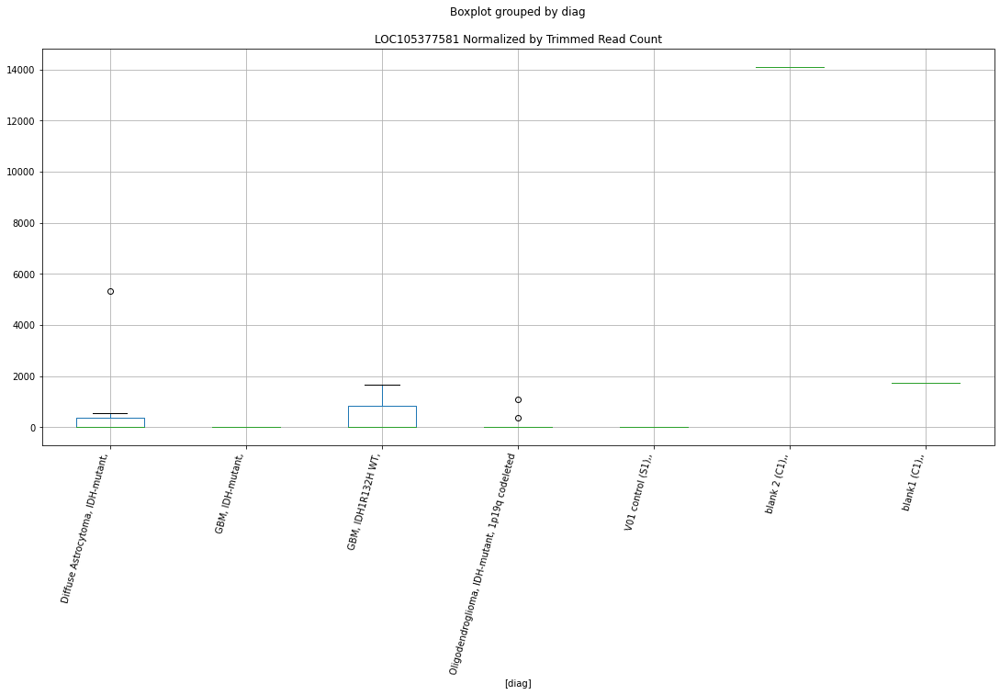

 p : 0.045471849266028506  ( t : 2.149165542710419 ) :  D-plex  :  cutadapt2  :  LOC107984257
Control and blanks
76     0.0
340    0.0
Name: LOC107984257, dtype: float64
208    705.44
Name: LOC107984257, dtype: float64
472    1155.91
Name: LOC107984257, dtype: float64


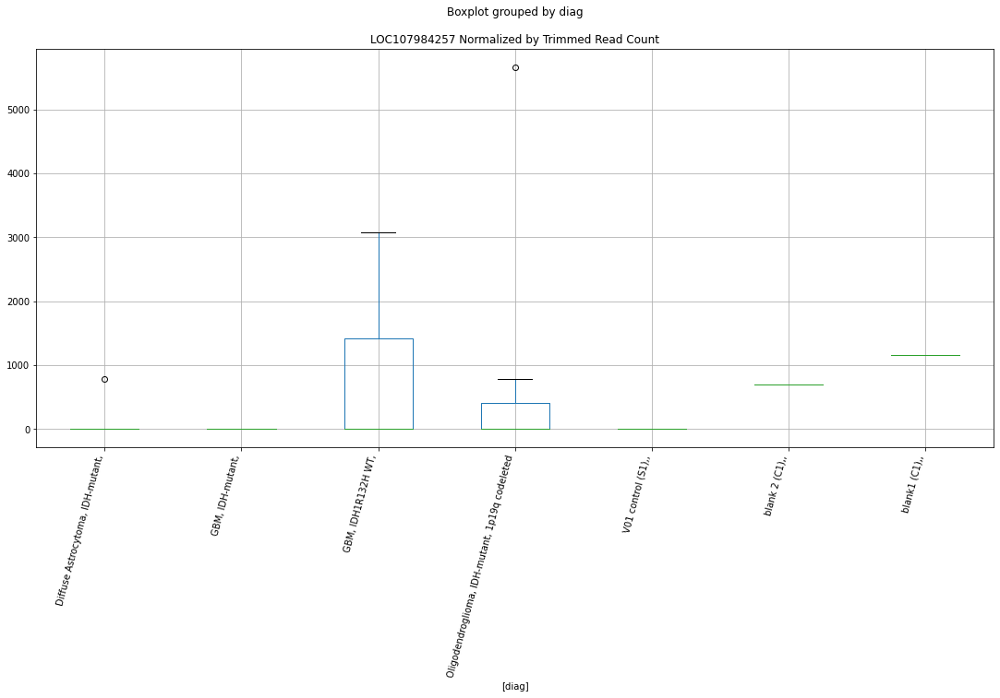

 p : 0.045477217758308736  ( t : 2.1491057965255522 ) :  D-plex  :  bbduk2  :  LOC107984125
Control and blanks
73     0.0
337    0.0
Name: LOC107984125, dtype: float64
205    358.18
Name: LOC107984125, dtype: float64
469    591.53
Name: LOC107984125, dtype: float64


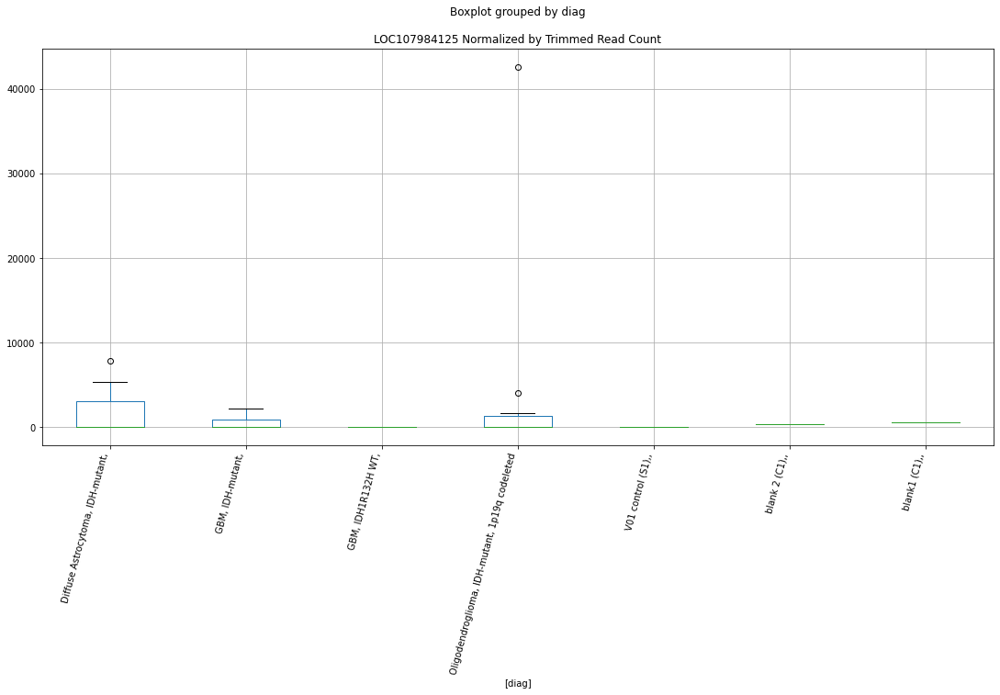

 p : 0.04547761962754413  ( t : 2.1491013243645343 ) :  D-plex  :  cutadapt2  :  LOC105379506
Control and blanks
76     60609.14
340     3522.93
Name: LOC105379506, dtype: float64
208    7230.77
Name: LOC105379506, dtype: float64
472    6357.51
Name: LOC105379506, dtype: float64


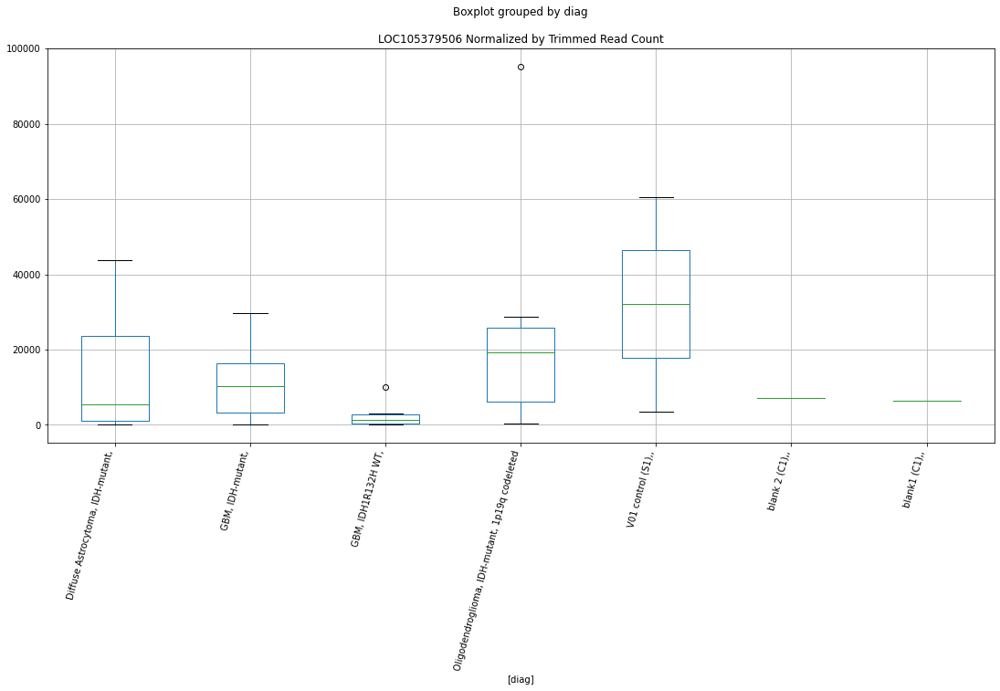

 p : 0.04547761962754413  ( t : 2.1491013243645343 ) :  D-plex  :  cutadapt2  :  LOC105379507
Control and blanks
76     60609.14
340     3522.93
Name: LOC105379507, dtype: float64
208    7230.77
Name: LOC105379507, dtype: float64
472    6357.51
Name: LOC105379507, dtype: float64


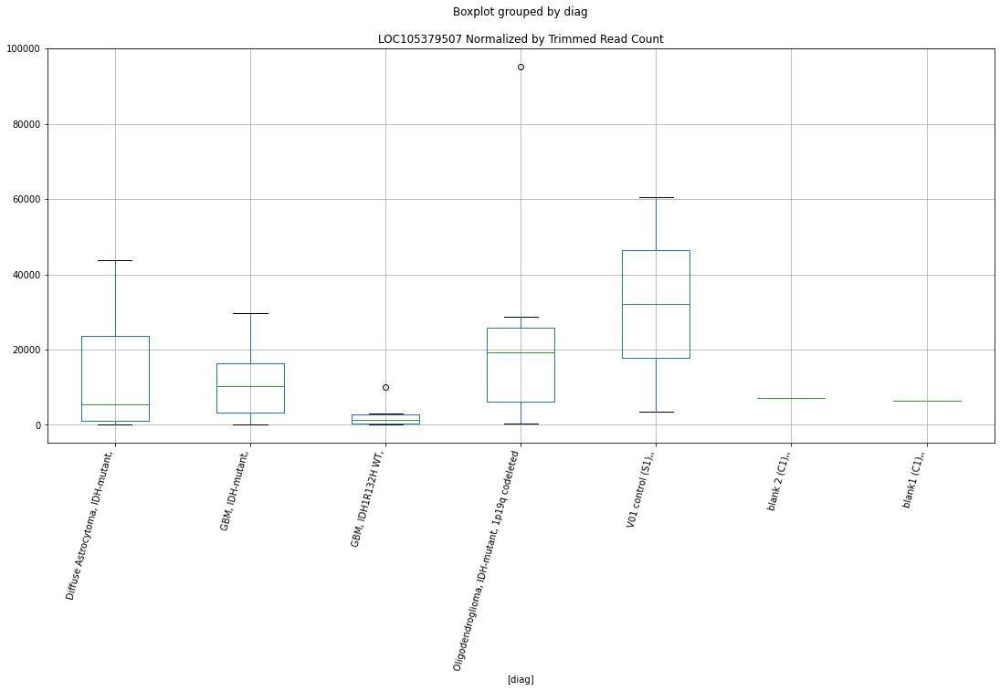

 p : 0.04547761962754413  ( t : 2.1491013243645343 ) :  D-plex  :  cutadapt2  :  LOC105379508
Control and blanks
76     60609.14
340     3522.93
Name: LOC105379508, dtype: float64
208    7054.41
Name: LOC105379508, dtype: float64
472    6357.51
Name: LOC105379508, dtype: float64


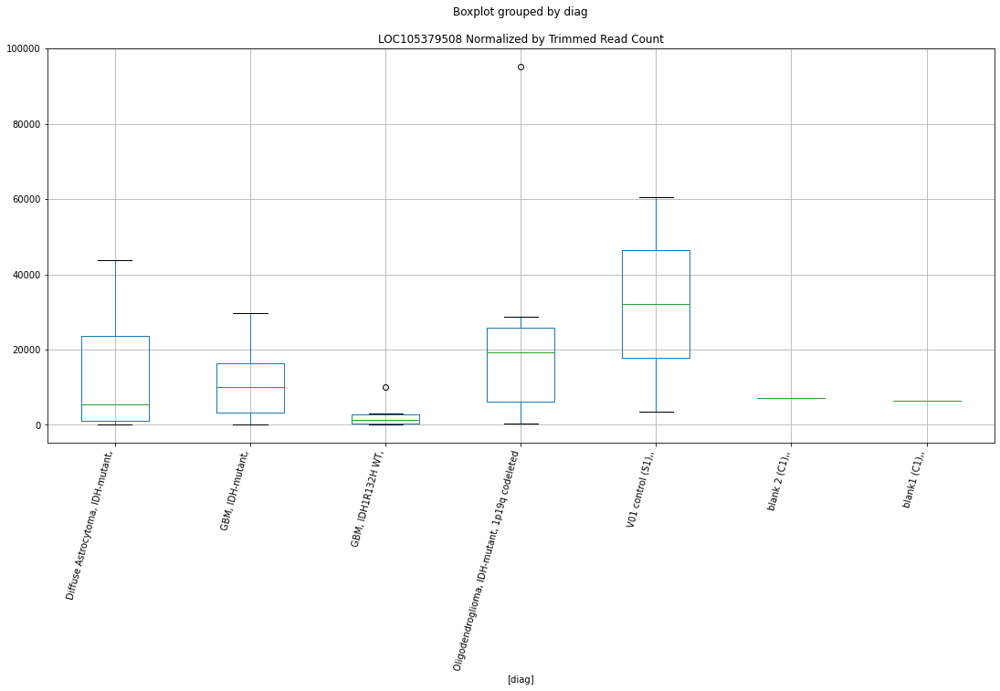

 p : 0.04549350021243237  ( t : 2.1489246277844707 ) :  Lexogen  :  bbduk2  :  LOC105373944
Control and blanks
79     0.0
343    0.0
Name: LOC105373944, dtype: float64
211    0.0
Name: LOC105373944, dtype: float64
475    0.0
Name: LOC105373944, dtype: float64


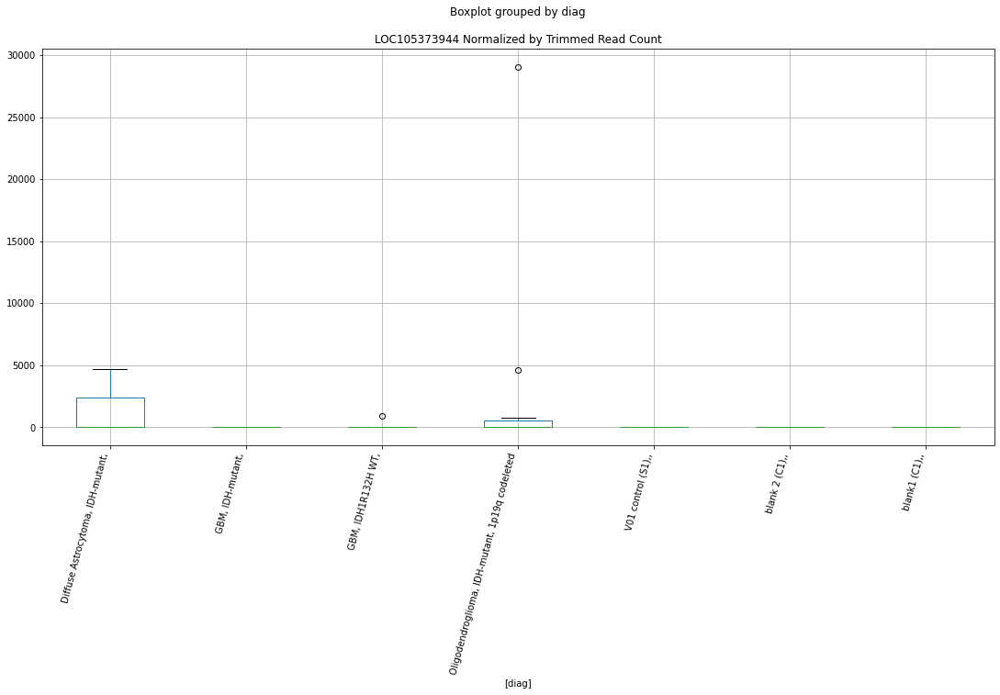

 p : 0.04560411956473156  ( t : 2.147695373852577 ) :  D-plex  :  cutadapt2  :  LOC105373945
Control and blanks
76     2272.84
340       0.00
Name: LOC105373945, dtype: float64
208    3350.84
Name: LOC105373945, dtype: float64
472    577.96
Name: LOC105373945, dtype: float64


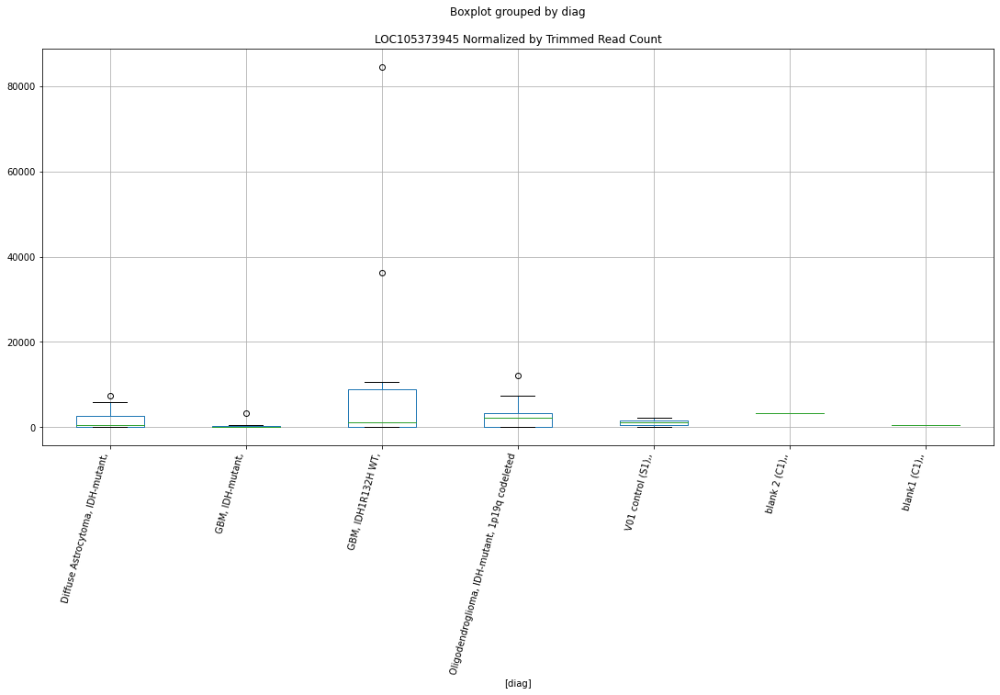

 p : 0.0457501197929107  ( t : 2.1460771142997035 ) :  D-plex  :  cutadapt2  :  LOC105376314
Control and blanks
76      757.61
340    1761.46
Name: LOC105376314, dtype: float64
208    2116.32
Name: LOC105376314, dtype: float64
472    2889.78
Name: LOC105376314, dtype: float64


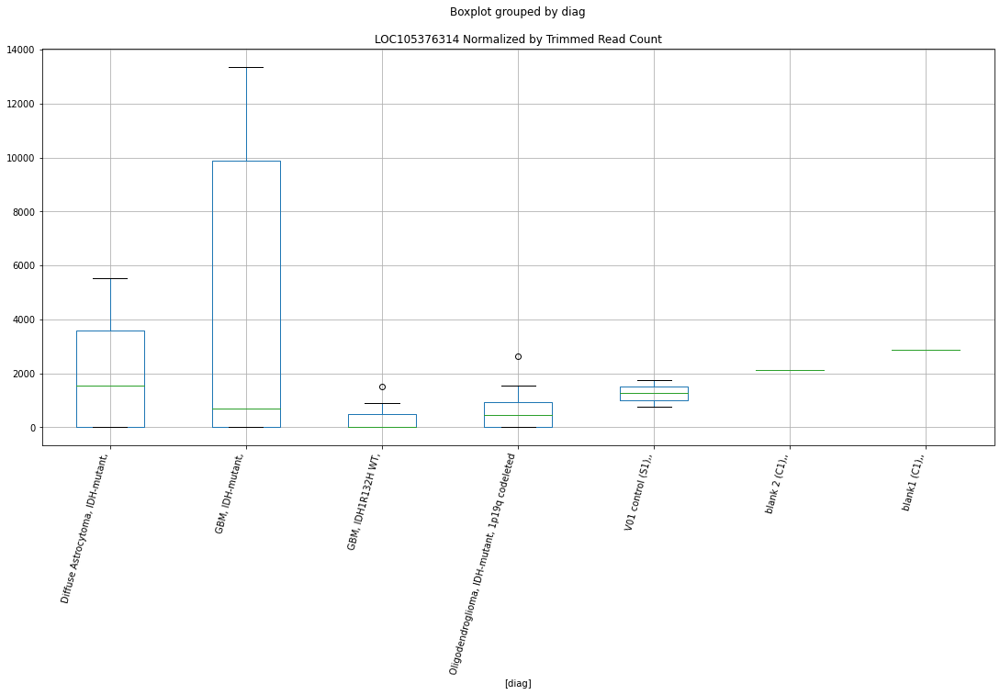

 p : 0.04584646340232413  ( t : 2.145011827640465 ) :  D-plex  :  bbduk2  :  LOC105374325
Control and blanks
73     0.0
337    0.0
Name: LOC105374325, dtype: float64
205    1253.64
Name: LOC105374325, dtype: float64
469    0.0
Name: LOC105374325, dtype: float64


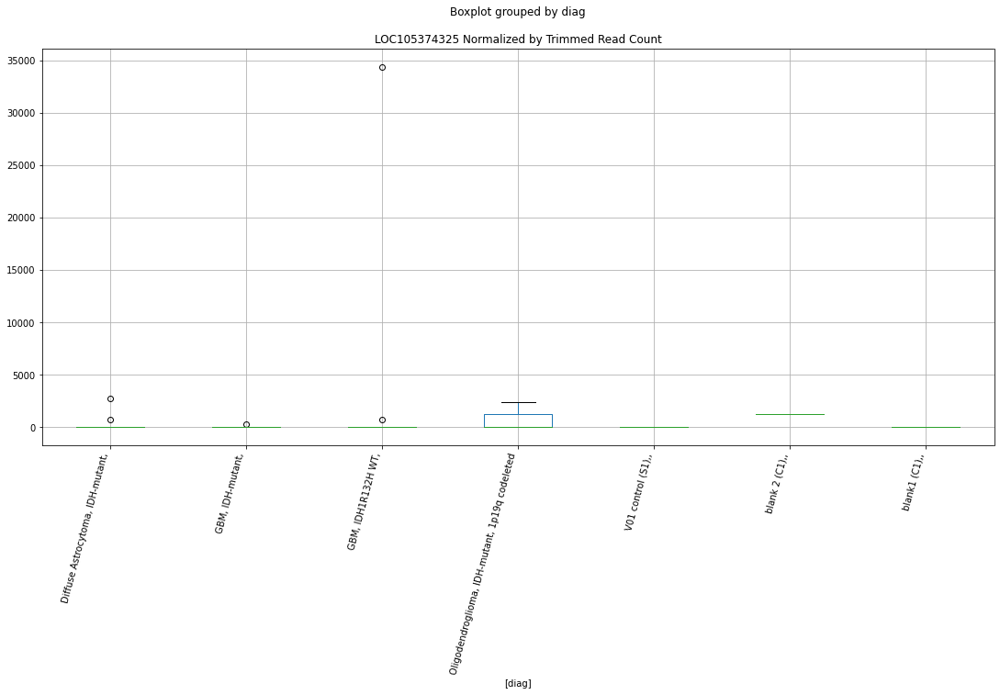

 p : 0.04588274586238882  ( t : 2.1446111765697204 ) :  D-plex  :  bbduk2  :  LOC105372200
Control and blanks
73     0.0
337    0.0
Name: LOC105372200, dtype: float64
205    179.09
Name: LOC105372200, dtype: float64
469    0.0
Name: LOC105372200, dtype: float64


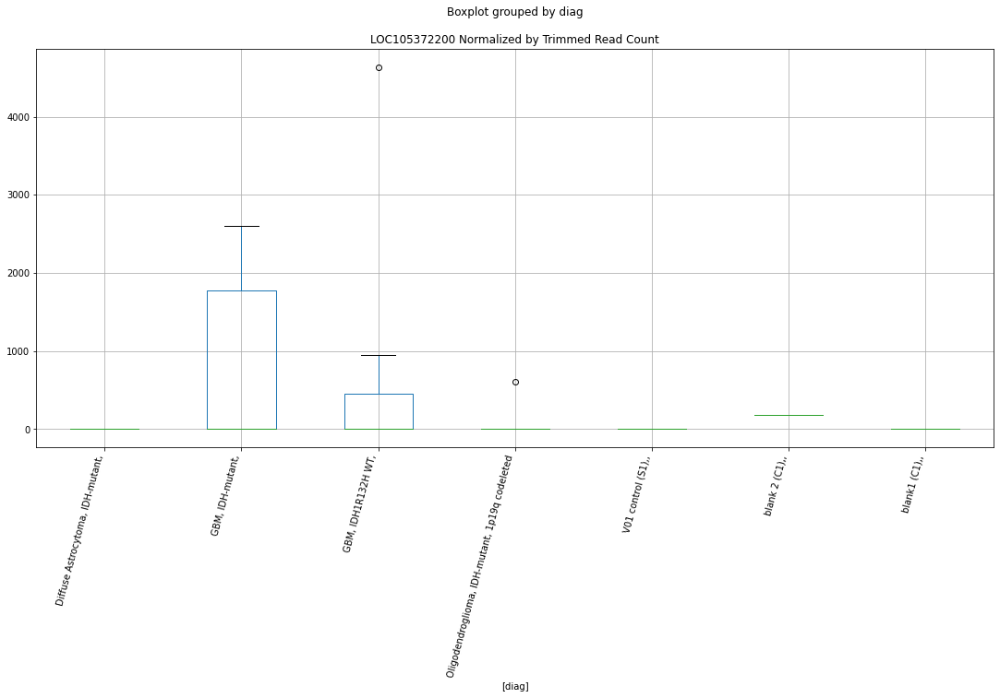

 p : 0.04606597519632903  ( t : 2.142592265567119 ) :  D-plex  :  bbduk2  :  LOC105376921
Control and blanks
73     0.0
337    0.0
Name: LOC105376921, dtype: float64
205    179.09
Name: LOC105376921, dtype: float64
469    1183.05
Name: LOC105376921, dtype: float64


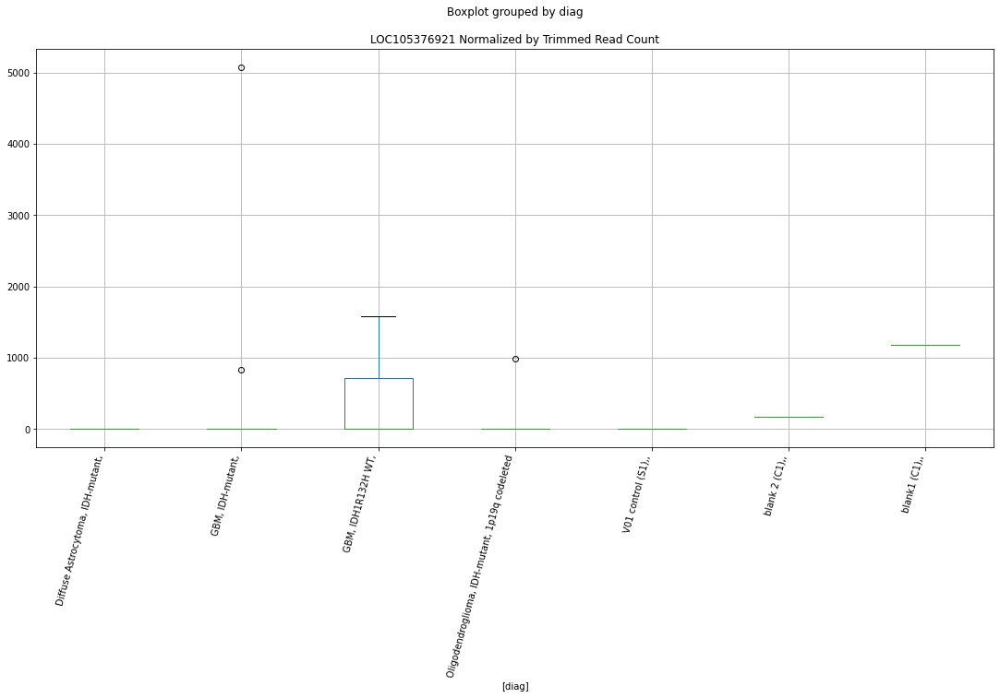

 p : 0.04618679317094547  ( t : 2.1412650410092215 ) :  D-plex  :  cutadapt2  :  LOC105374454
Control and blanks
76     0.0
340    0.0
Name: LOC105374454, dtype: float64
208    1234.52
Name: LOC105374454, dtype: float64
472    0.0
Name: LOC105374454, dtype: float64


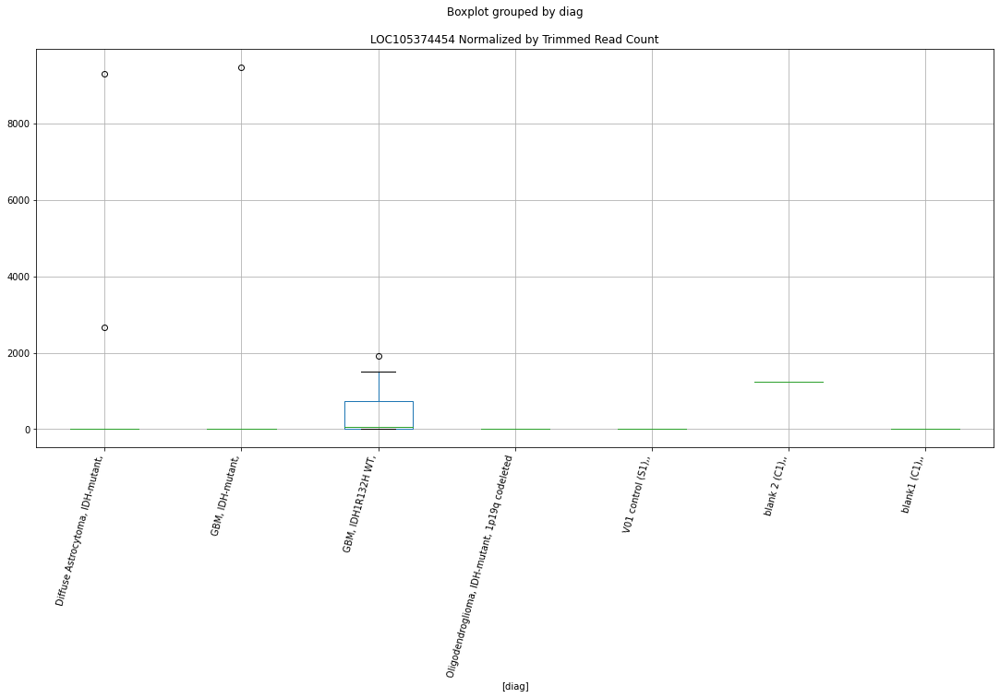

 p : 0.04626172670232241  ( t : 2.1404434634840874 ) :  D-plex  :  bbduk2  :  LOC105374454
Control and blanks
73     0.0
337    0.0
Name: LOC105374454, dtype: float64
205    1253.64
Name: LOC105374454, dtype: float64
469    0.0
Name: LOC105374454, dtype: float64


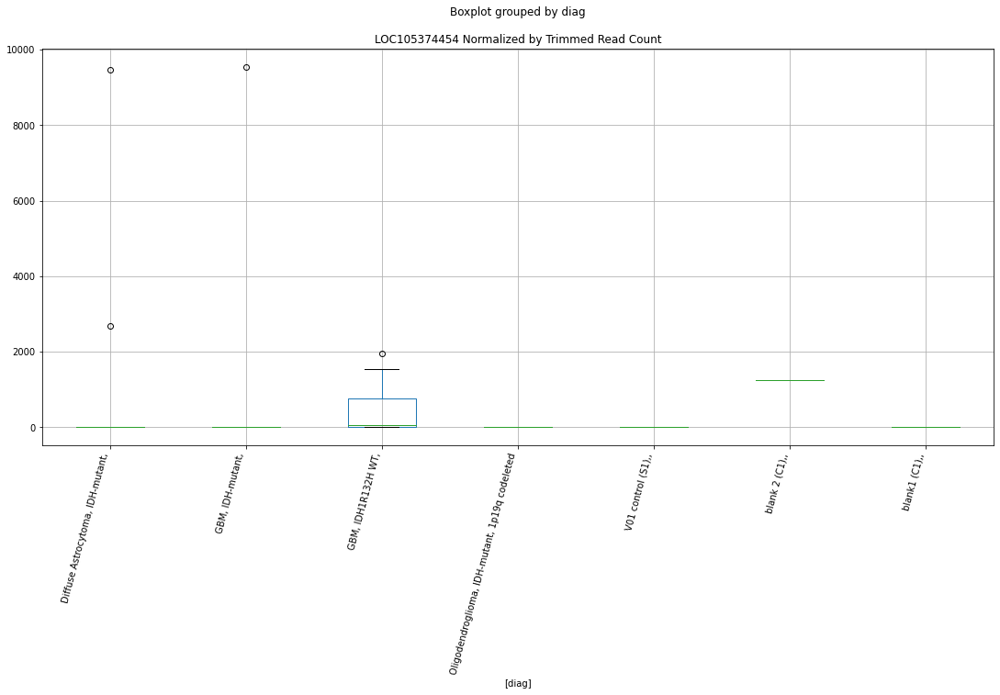

 p : 0.04638844175136137  ( t : 2.139056908886306 ) :  D-plex  :  cutadapt2  :  LOC105376921
Control and blanks
76     0.0
340    0.0
Name: LOC105376921, dtype: float64
208    176.36
Name: LOC105376921, dtype: float64
472    1155.91
Name: LOC105376921, dtype: float64


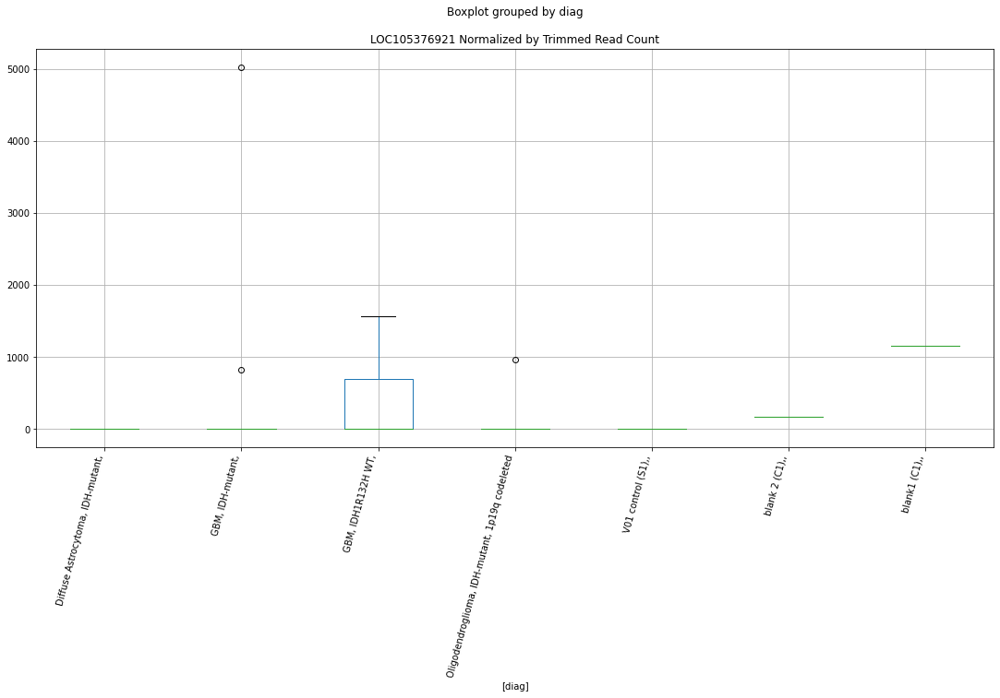

 p : 0.0465020232502446  ( t : 2.137817000384772 ) :  D-plex  :  bbduk2  :  LOC105376815
Control and blanks
73     1546.02
337       0.00
Name: LOC105376815, dtype: float64
205    358.18
Name: LOC105376815, dtype: float64
469    0.0
Name: LOC105376815, dtype: float64


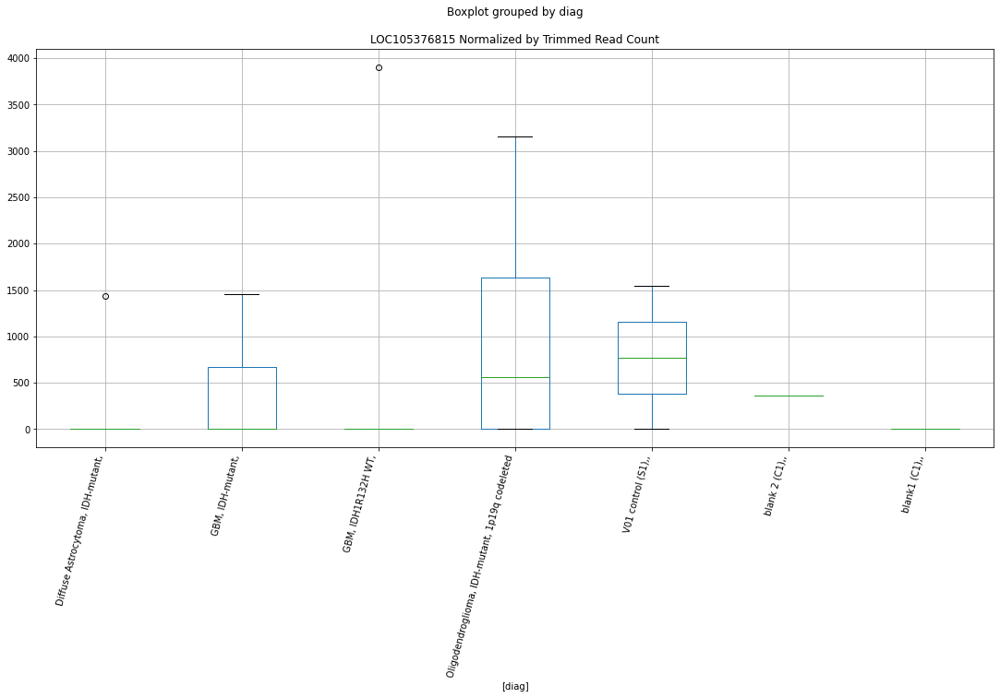

 p : 0.04664494080229806  ( t : 2.13626076641519 ) :  D-plex  :  cutadapt2  :  LOC107984431
Control and blanks
76       0.00
340    880.73
Name: LOC107984431, dtype: float64
208    1058.16
Name: LOC107984431, dtype: float64
472    1733.87
Name: LOC107984431, dtype: float64


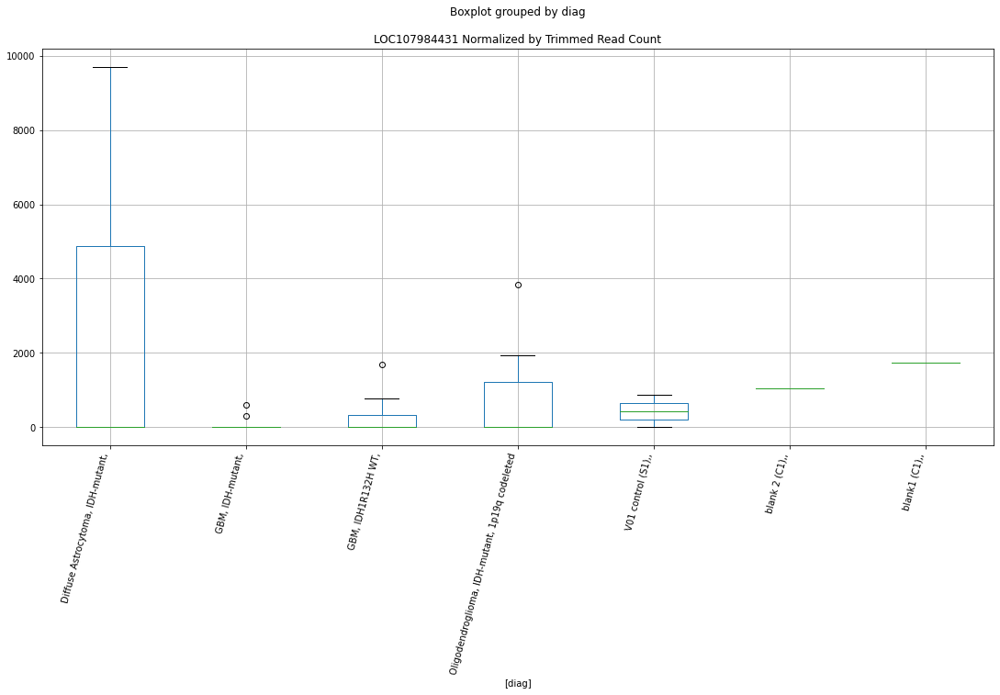

 p : 0.04692058453393371  ( t : 2.1332715197980283 ) :  D-plex  :  bbduk2  :  LOC105372145
Control and blanks
73     0.0
337    0.0
Name: LOC105372145, dtype: float64
205    716.36
Name: LOC105372145, dtype: float64
469    4140.69
Name: LOC105372145, dtype: float64


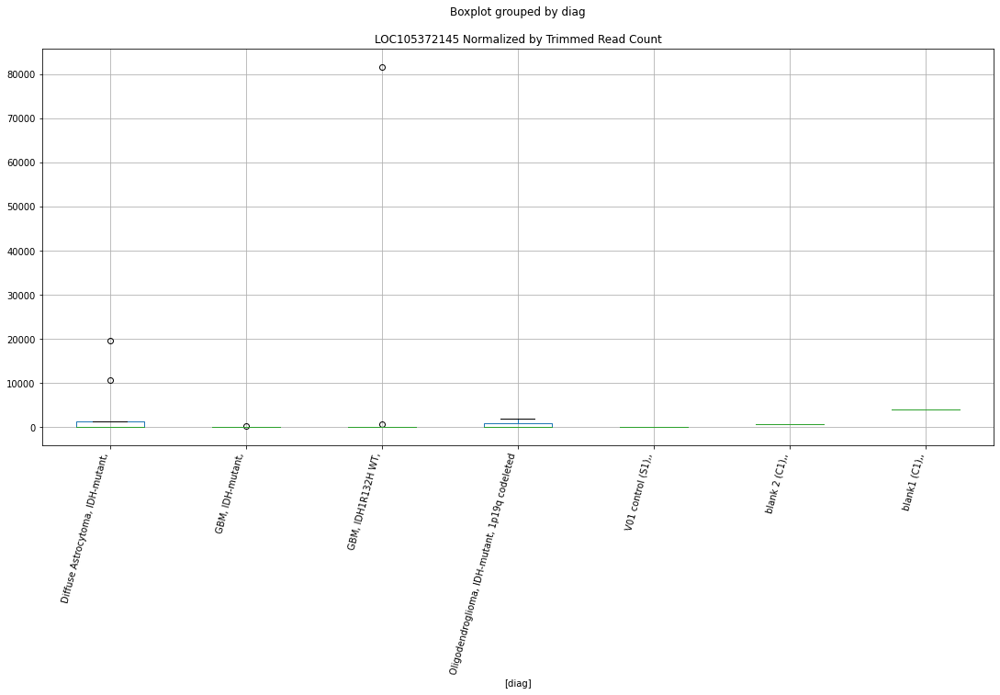

 p : 0.046948367154987646  ( t : 2.1329711175980575 ) :  D-plex  :  cutadapt2  :  LOC107984758
Control and blanks
76     0.0
340    0.0
Name: LOC107984758, dtype: float64
208    176.36
Name: LOC107984758, dtype: float64
472    577.96
Name: LOC107984758, dtype: float64


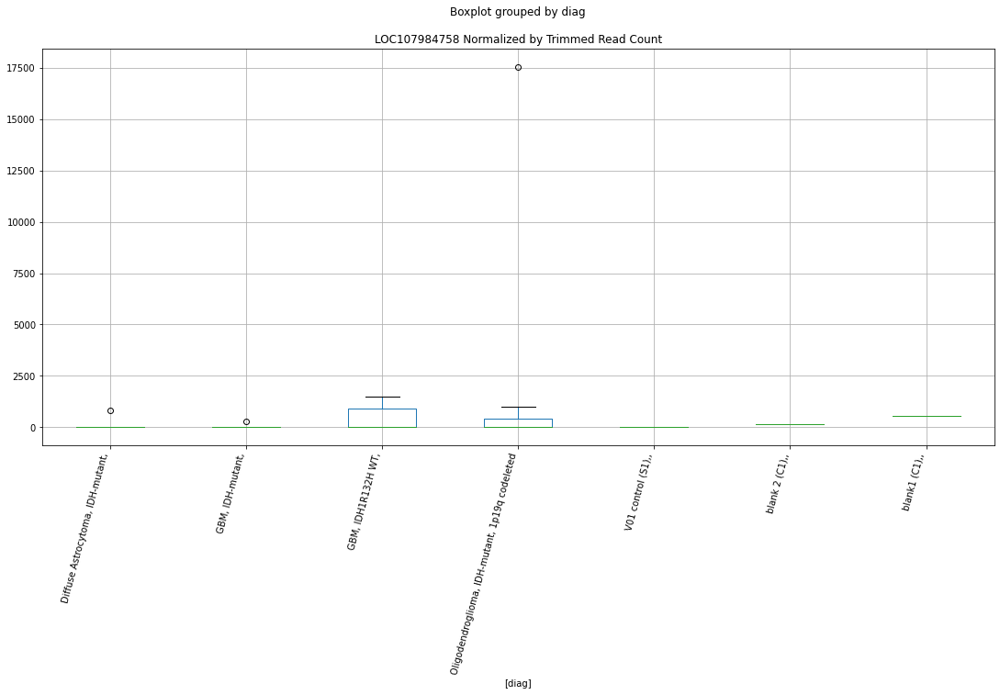

 p : 0.04696512587565228  ( t : 2.132789990747701 ) :  D-plex  :  bbduk2  :  LOC105374287
Control and blanks
73     0.0
337    0.0
Name: LOC105374287, dtype: float64
205    537.27
Name: LOC105374287, dtype: float64
469    1183.05
Name: LOC105374287, dtype: float64


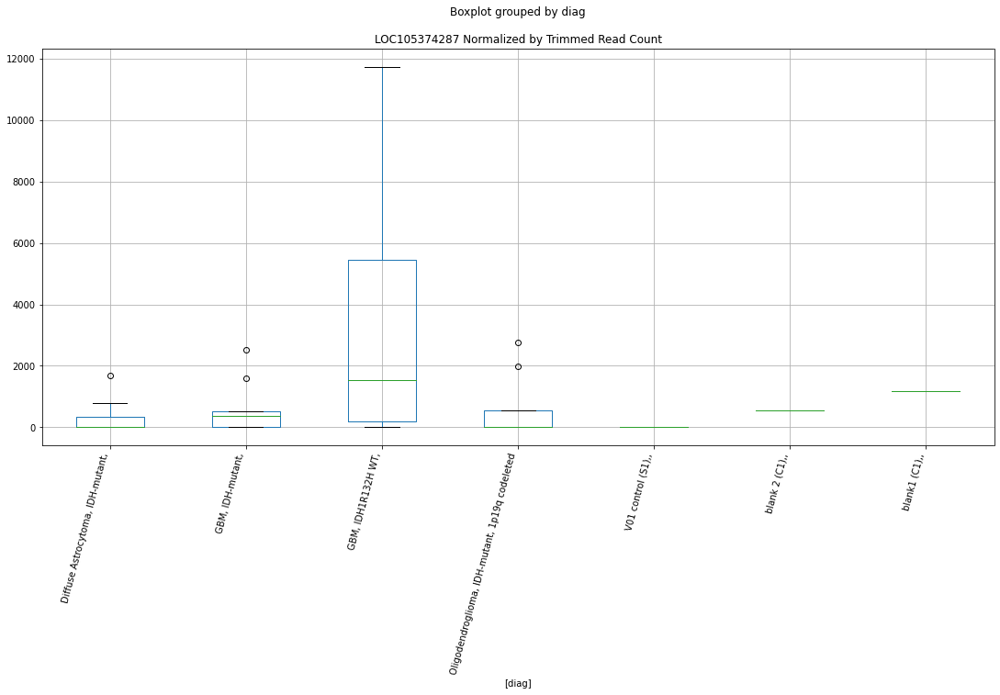

 p : 0.0470893819770248  ( t : 2.1314488769926925 ) :  D-plex  :  bbduk2  :  LOC105379507
Control and blanks
73     61840.67
337     3560.63
Name: LOC105379507, dtype: float64
205    6089.09
Name: LOC105379507, dtype: float64
469    6506.8
Name: LOC105379507, dtype: float64


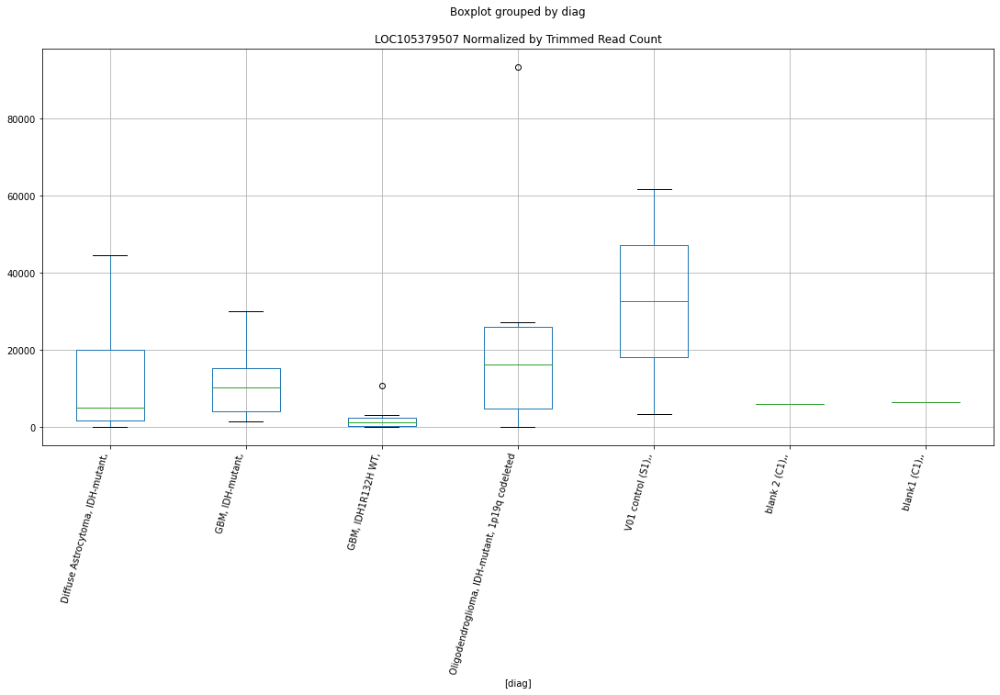

 p : 0.0470893819770248  ( t : 2.1314488769926925 ) :  D-plex  :  bbduk2  :  LOC105379506
Control and blanks
73     61840.67
337     3560.63
Name: LOC105379506, dtype: float64
205    6089.09
Name: LOC105379506, dtype: float64
469    6506.8
Name: LOC105379506, dtype: float64


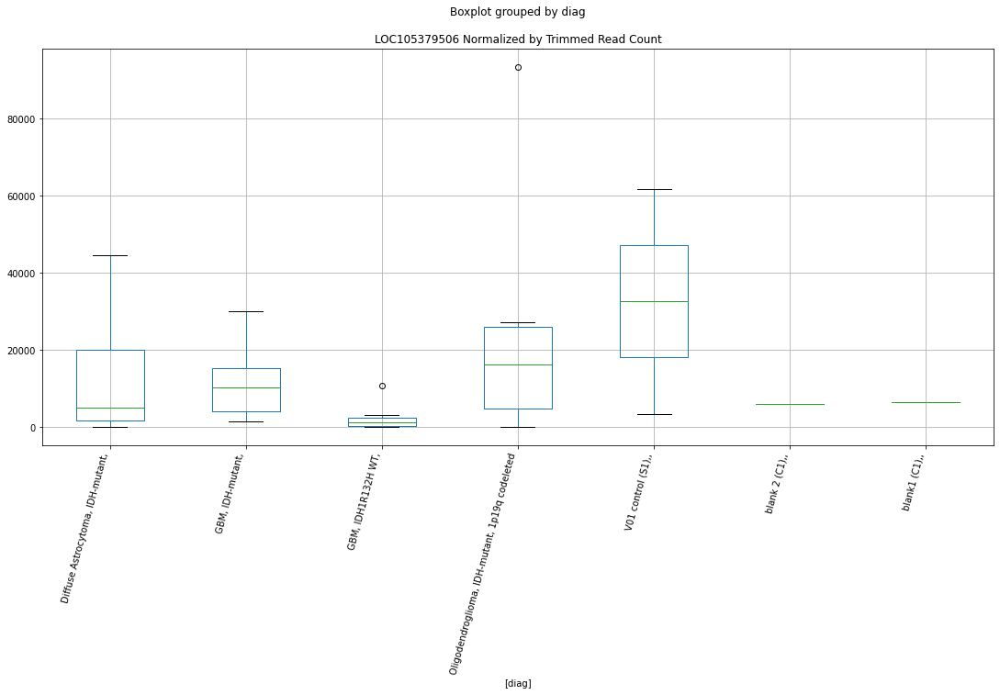

 p : 0.0470893819770248  ( t : 2.1314488769926925 ) :  D-plex  :  bbduk2  :  LOC105379508
Control and blanks
73     61840.67
337     3560.63
Name: LOC105379508, dtype: float64
205    5910.0
Name: LOC105379508, dtype: float64
469    6506.8
Name: LOC105379508, dtype: float64


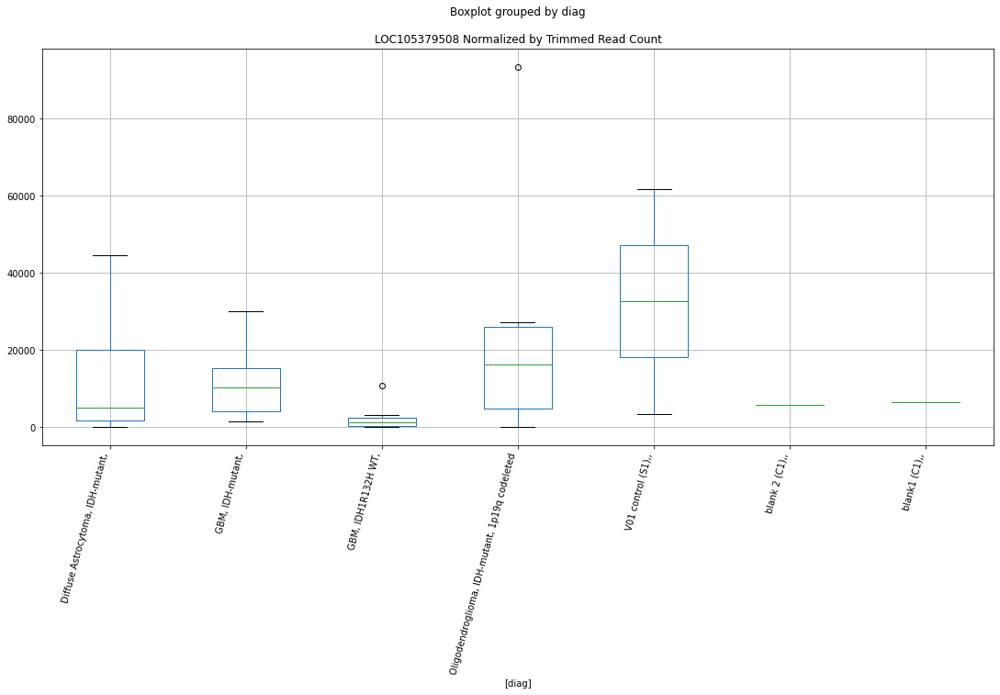

 p : 0.047127750124795996  ( t : 2.1310354162181295 ) :  Lexogen  :  bbduk2  :  LOC105376586
Control and blanks
79     0.0
343    0.0
Name: LOC105376586, dtype: float64
211    546.61
Name: LOC105376586, dtype: float64
475    479.03
Name: LOC105376586, dtype: float64


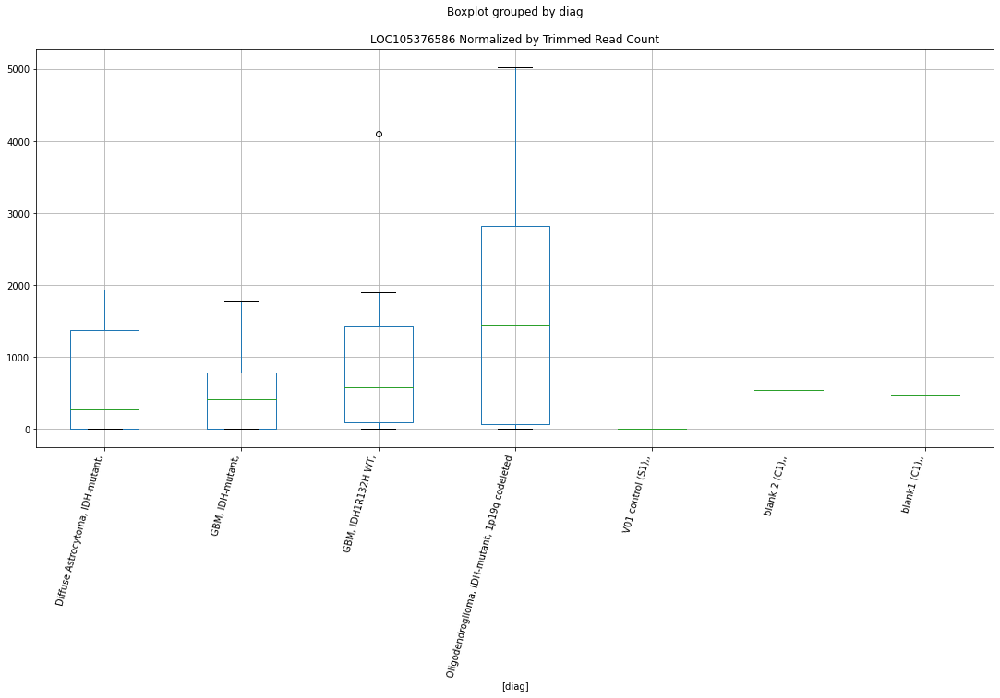

 p : 0.04714528833582159  ( t : 2.1308465241042116 ) :  D-plex  :  bbduk2  :  LOC107984758
Control and blanks
73     0.0
337    0.0
Name: LOC107984758, dtype: float64
205    179.09
Name: LOC107984758, dtype: float64
469    591.53
Name: LOC107984758, dtype: float64


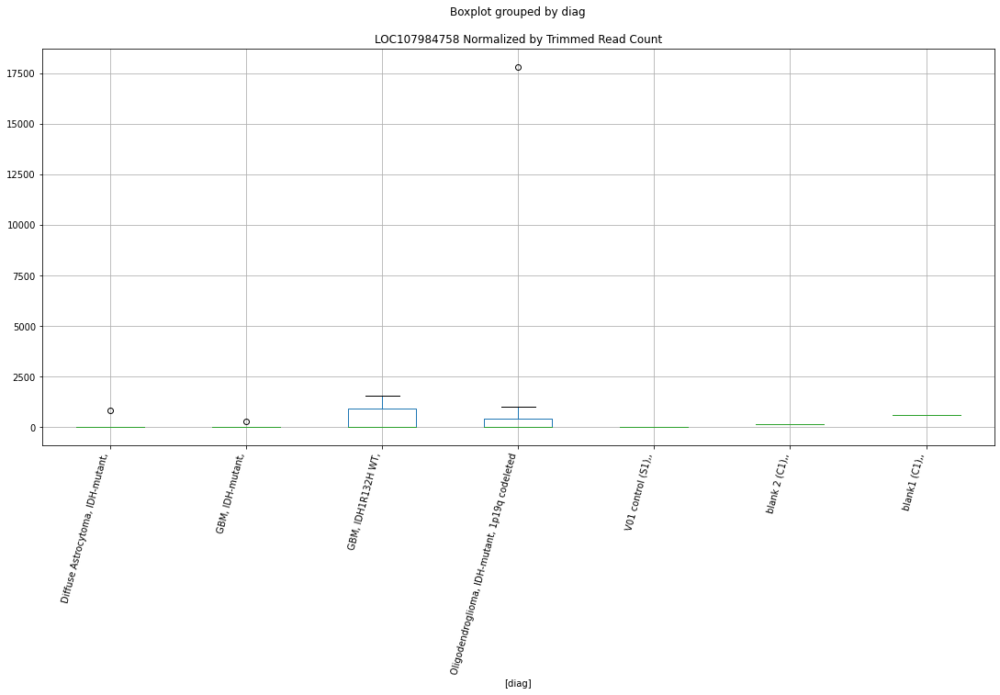

 p : 0.0473629418522142  ( t : 2.1285076427015 ) :  D-plex  :  bbduk2  :  LOC107984913
Control and blanks
73     0.0
337    0.0
Name: LOC107984913, dtype: float64
205    3760.91
Name: LOC107984913, dtype: float64
469    3549.16
Name: LOC107984913, dtype: float64


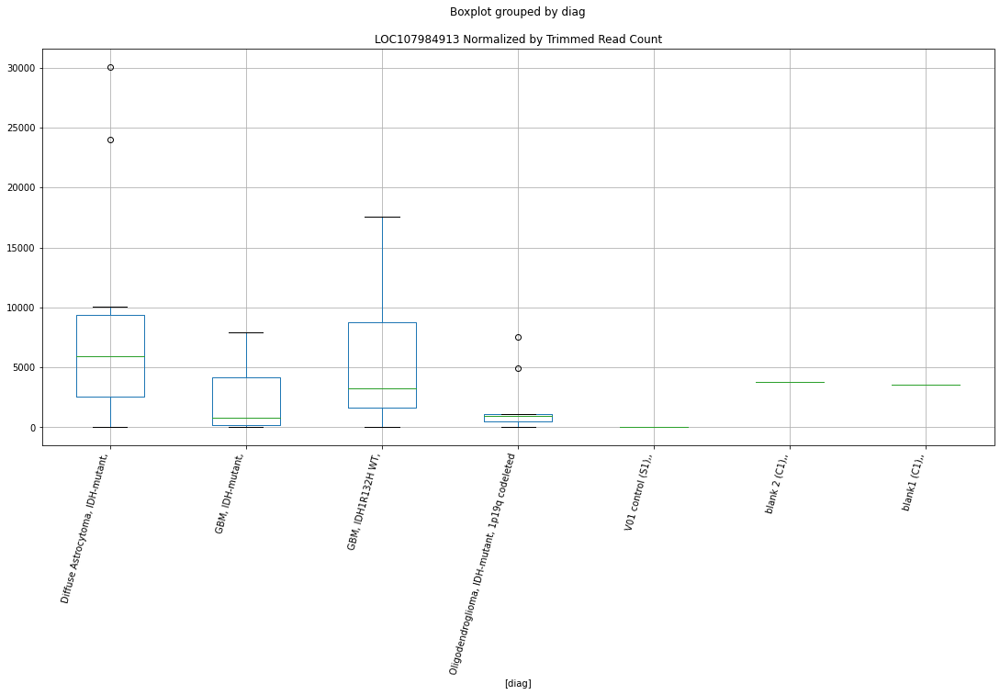

 p : 0.047365961264573576  ( t : 2.1284752653881265 ) :  D-plex  :  cutadapt2  :  LOC105373215
Control and blanks
76     25758.88
340     5284.39
Name: LOC105373215, dtype: float64
208    10934.33
Name: LOC105373215, dtype: float64
472    14448.9
Name: LOC105373215, dtype: float64


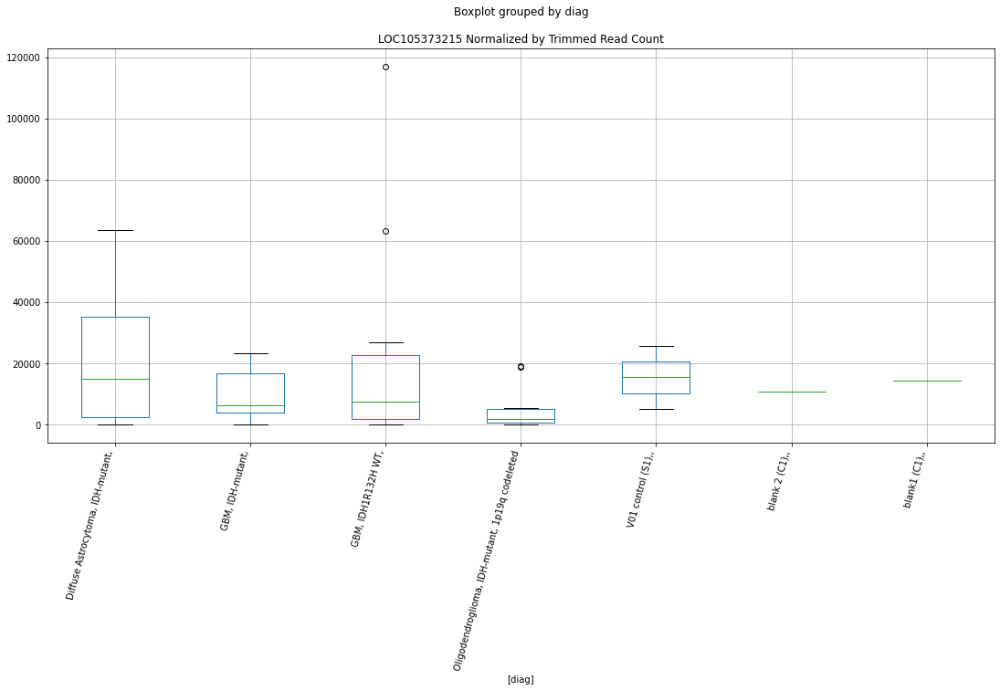

 p : 0.04747922357142203  ( t : 2.1272621048395552 ) :  D-plex  :  cutadapt2  :  LOC105376951
Control and blanks
76     15152.28
340    15853.18
Name: LOC105376951, dtype: float64
208    32097.56
Name: LOC105376951, dtype: float64
472    18494.59
Name: LOC105376951, dtype: float64


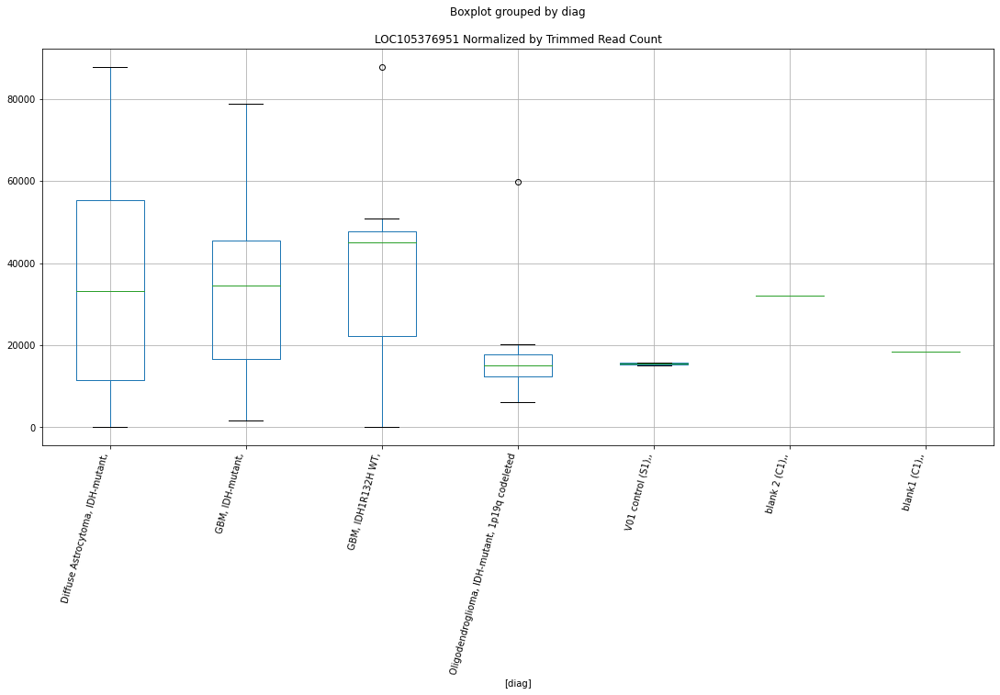

 p : 0.04757760798597776  ( t : 2.1262104415067986 ) :  D-plex  :  bbduk2  :  LOC107985665
Control and blanks
73     23963.26
337        0.00
Name: LOC107985665, dtype: float64
205    1074.55
Name: LOC107985665, dtype: float64
469    0.0
Name: LOC107985665, dtype: float64


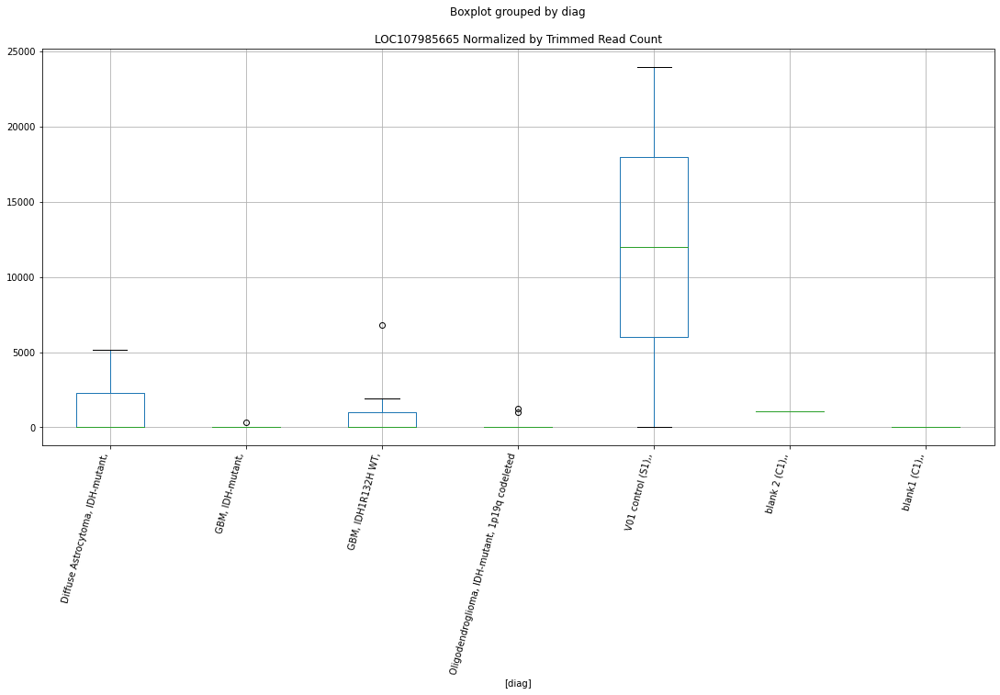

 p : 0.04762251727630916  ( t : 2.1257310500837003 ) :  Lexogen  :  cutadapt2  :  LOC105372606
Control and blanks
82     0.0
346    0.0
Name: LOC105372606, dtype: float64
214    0.0
Name: LOC105372606, dtype: float64
478    0.0
Name: LOC105372606, dtype: float64


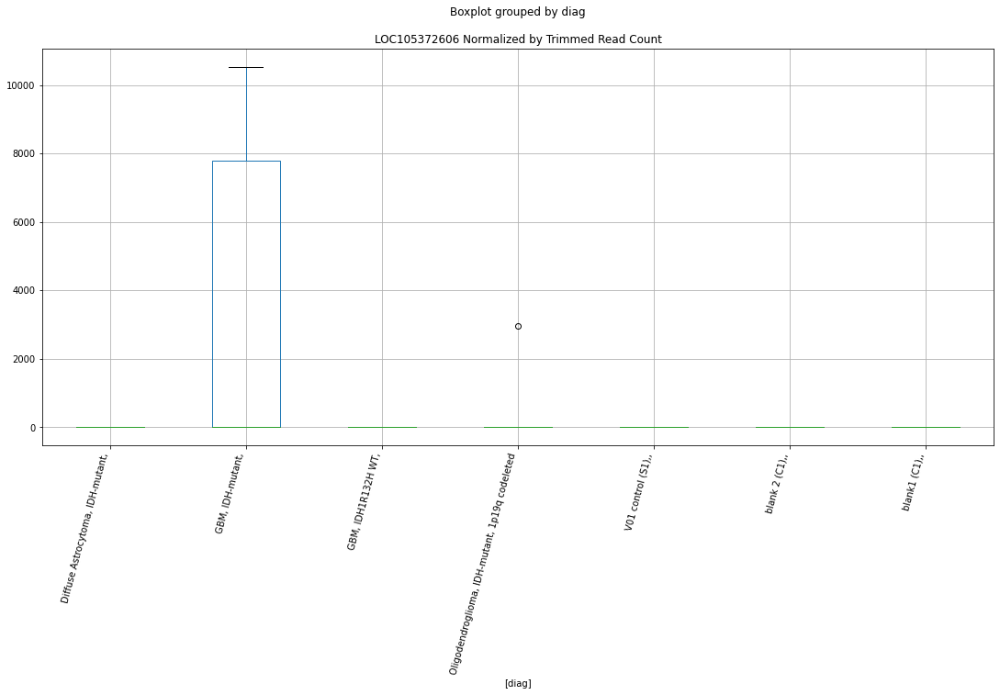

 p : 0.04780880404074034  ( t : 2.123746890898965 ) :  D-plex  :  cutadapt2  :  LOC107985134
Control and blanks
76     0.0
340    0.0
Name: LOC107985134, dtype: float64
208    176.36
Name: LOC107985134, dtype: float64
472    0.0
Name: LOC107985134, dtype: float64


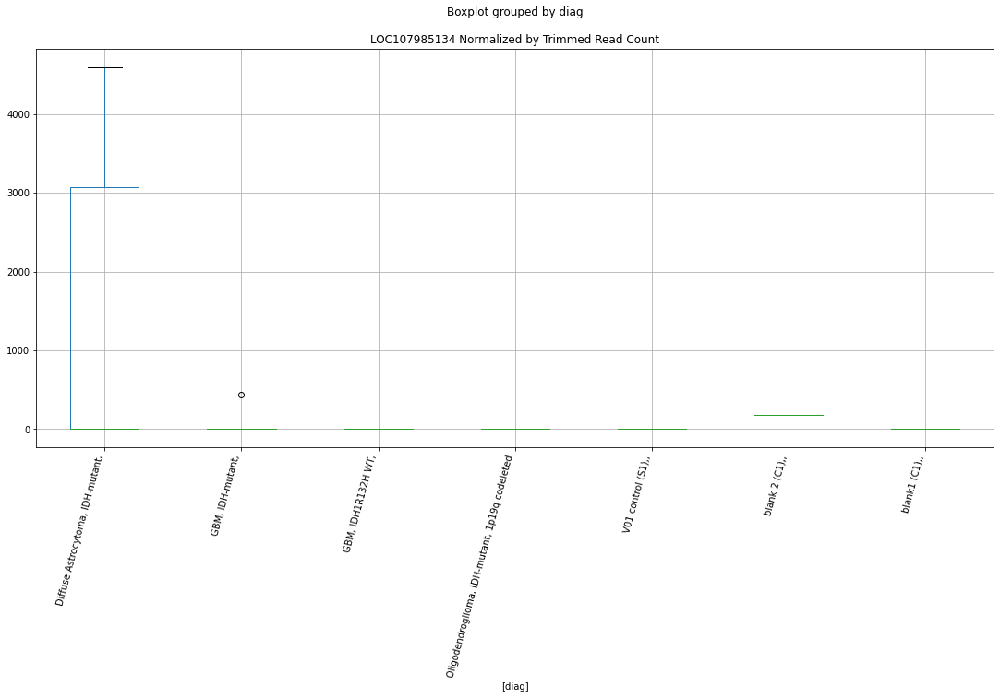

 p : 0.0478695796628963  ( t : 2.123101087559001 ) :  D-plex  :  cutadapt2  :  LOC105378558
Control and blanks
76     757.61
340      0.00
Name: LOC105378558, dtype: float64
208    3879.92
Name: LOC105378558, dtype: float64
472    2889.78
Name: LOC105378558, dtype: float64


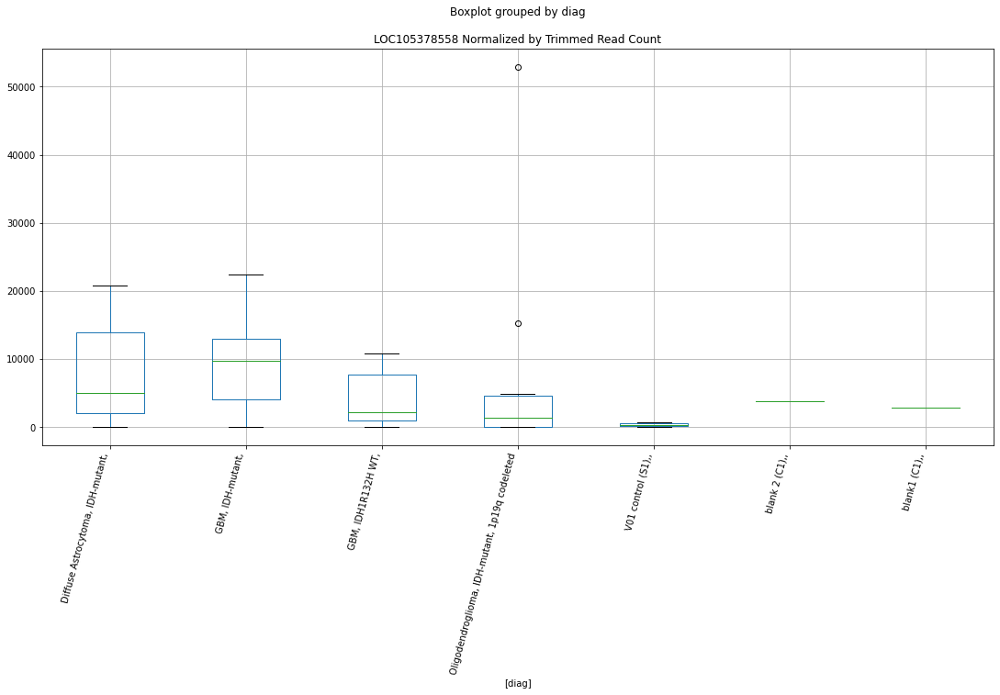

 p : 0.0479386951996841  ( t : 2.1223675712862886 ) :  Lexogen  :  bbduk2  :  LOC105372606
Control and blanks
79     0.0
343    0.0
Name: LOC105372606, dtype: float64
211    0.0
Name: LOC105372606, dtype: float64
475    0.0
Name: LOC105372606, dtype: float64


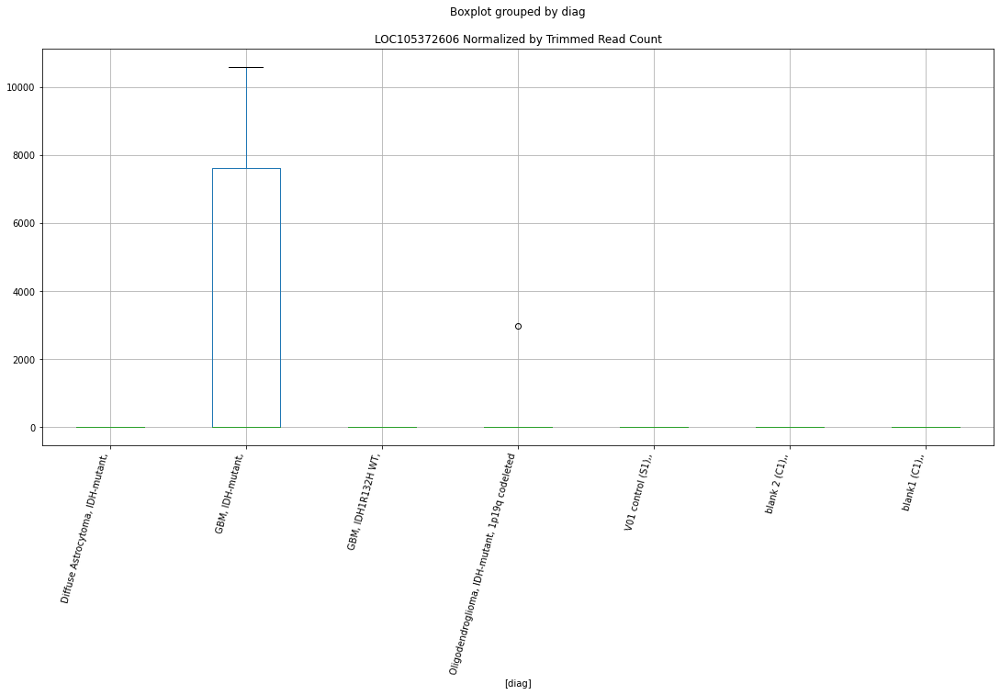

 p : 0.04817751711899059  ( t : 2.1198403726097093 ) :  D-plex  :  cutadapt2  :  LOC107984979
Control and blanks
76     2272.84
340    2642.20
Name: LOC107984979, dtype: float64
208    124333.95
Name: LOC107984979, dtype: float64
472    8091.38
Name: LOC107984979, dtype: float64


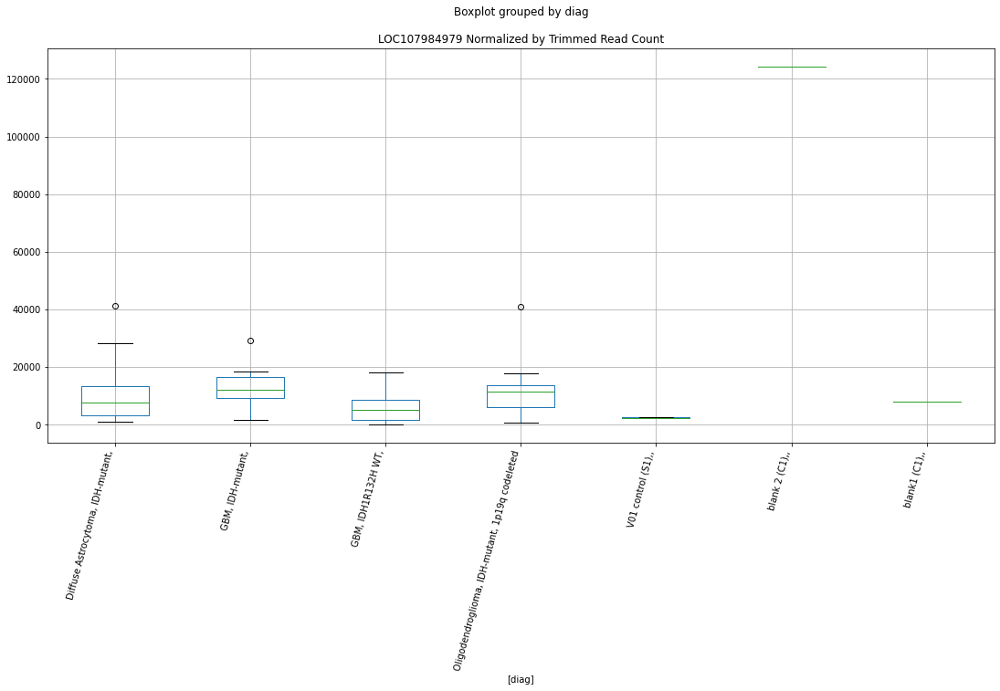

 p : 0.04820797920306398  ( t : 2.119518845716947 ) :  D-plex  :  cutadapt2  :  LOC105376571
Control and blanks
76     0.0
340    0.0
Name: LOC105376571, dtype: float64
208    1410.88
Name: LOC105376571, dtype: float64
472    0.0
Name: LOC105376571, dtype: float64


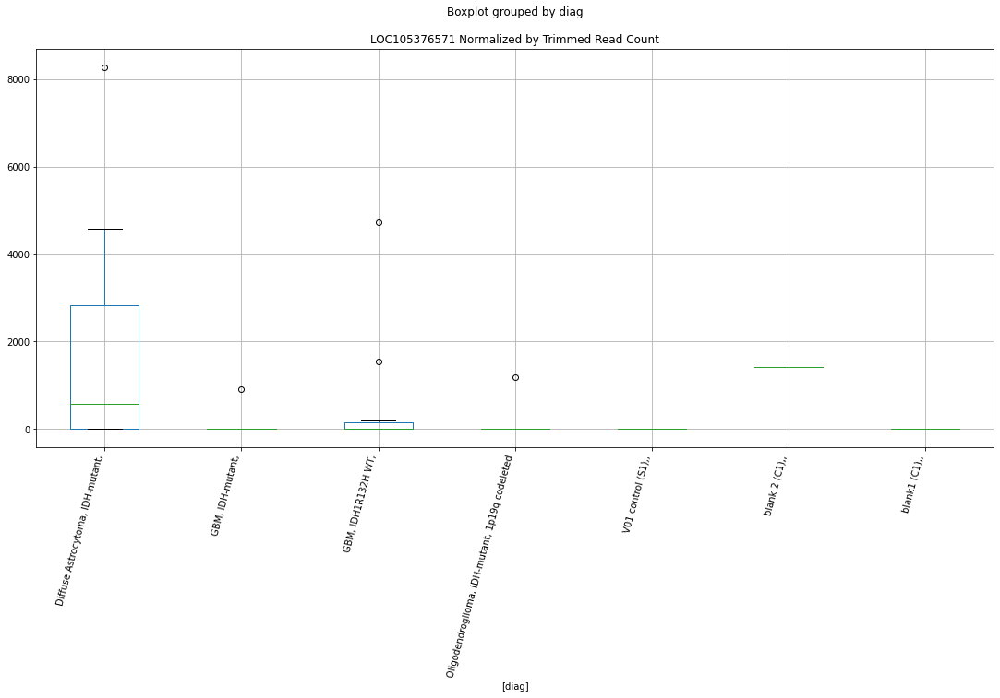

 p : 0.04828671761541042  ( t : 2.118688619301806 ) :  D-plex  :  cutadapt2  :  LOC107985027
Control and blanks
76     0.0
340    0.0
Name: LOC107985027, dtype: float64
208    352.72
Name: LOC107985027, dtype: float64
472    0.0
Name: LOC107985027, dtype: float64


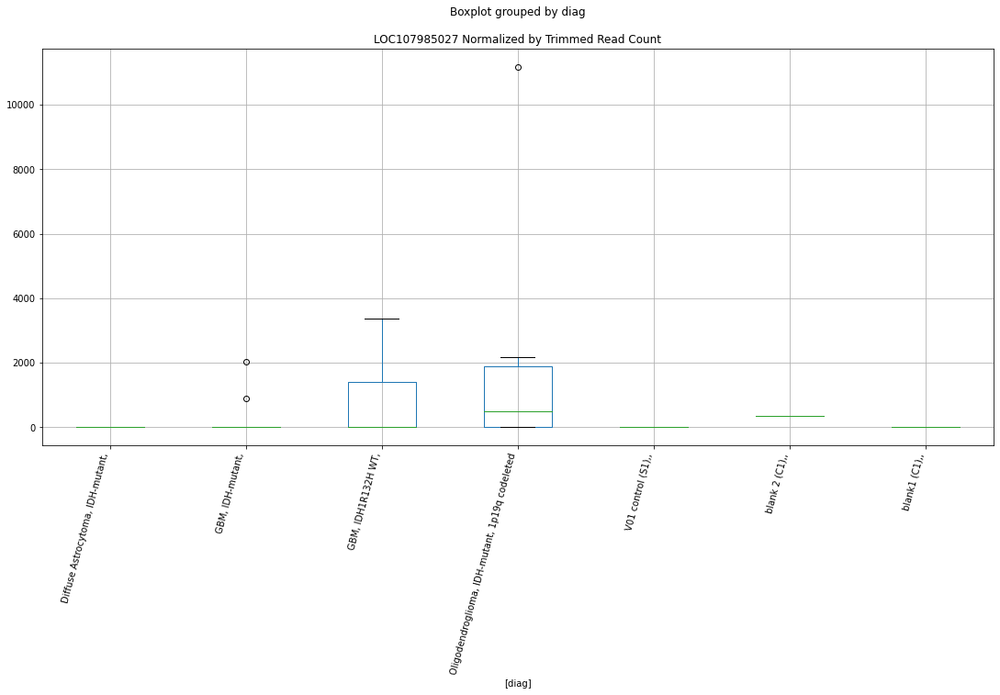

 p : 0.04834695473254345  ( t : 2.1180543045376408 ) :  D-plex  :  bbduk2  :  LOC105374118
Control and blanks
73     0.0
337    0.0
Name: LOC105374118, dtype: float64
205    358.18
Name: LOC105374118, dtype: float64
469    0.0
Name: LOC105374118, dtype: float64


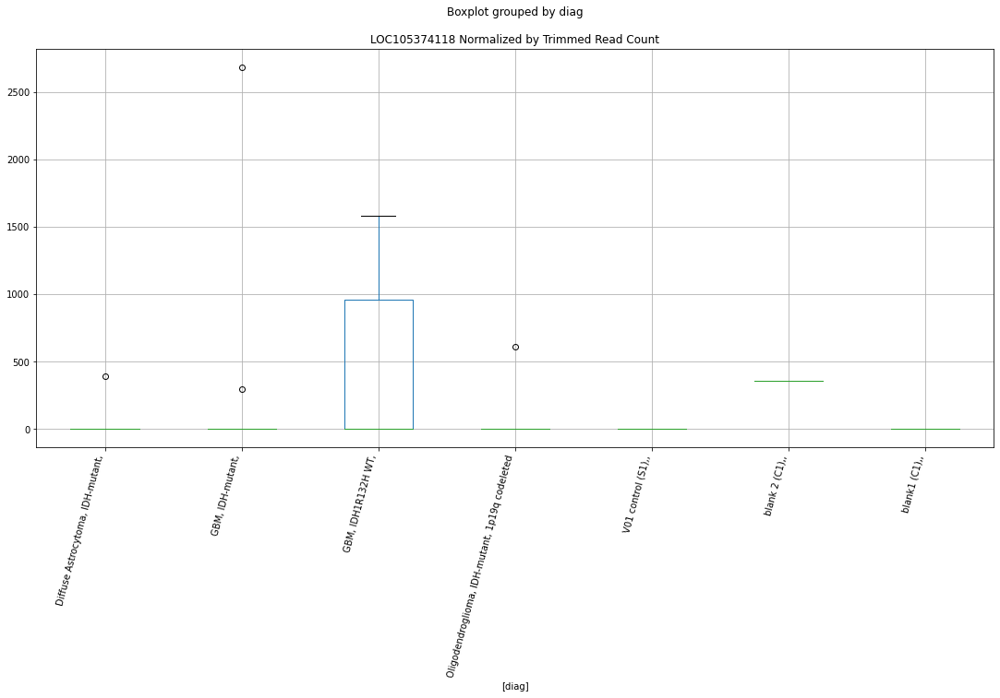

 p : 0.048347743388318744  ( t : 2.118046004531724 ) :  D-plex  :  bbduk2  :  LOC105374287
Control and blanks
73     0.0
337    0.0
Name: LOC105374287, dtype: float64
205    537.27
Name: LOC105374287, dtype: float64
469    1183.05
Name: LOC105374287, dtype: float64


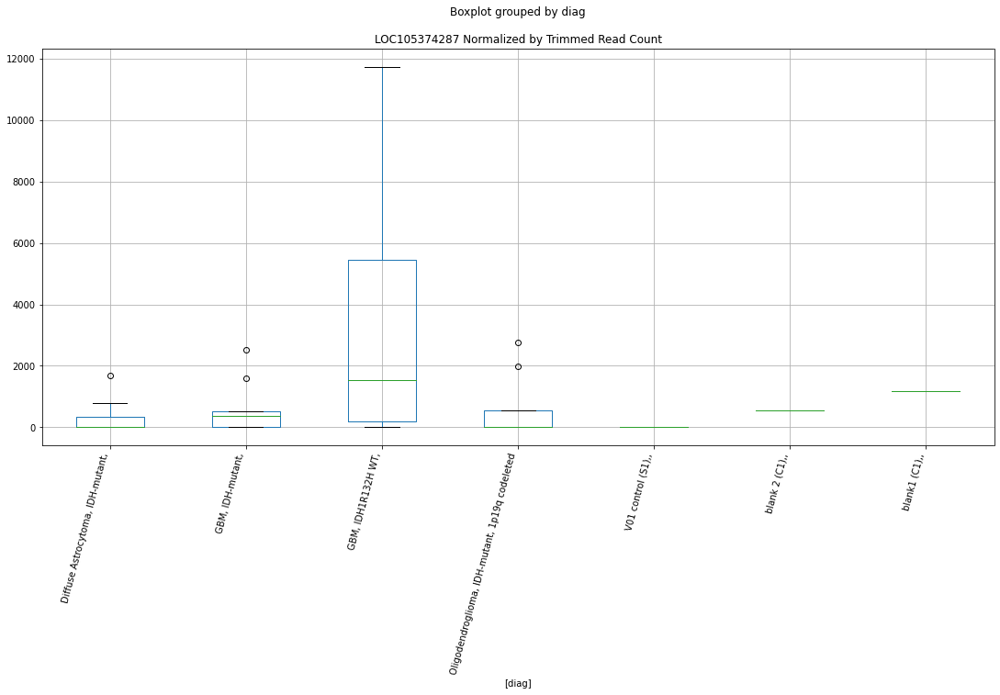

 p : 0.048363714871613284  ( t : 2.1178779432672212 ) :  D-plex  :  cutadapt2  :  LOC105378532
Control and blanks
76     757.61
340      0.00
Name: LOC105378532, dtype: float64
208    1763.6
Name: LOC105378532, dtype: float64
472    2889.78
Name: LOC105378532, dtype: float64


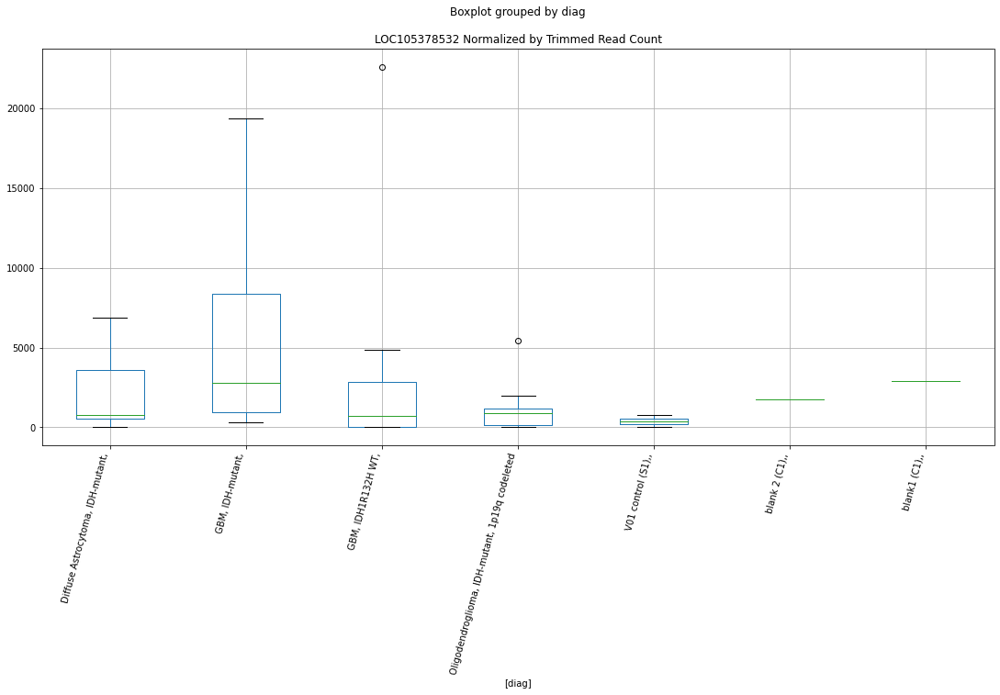

 p : 0.04836431564122861  ( t : 2.1178716226051786 ) :  D-plex  :  bbduk2  :  LOC107985966
Control and blanks
73     773.01
337    890.16
Name: LOC107985966, dtype: float64
205    1970.0
Name: LOC107985966, dtype: float64
469    2366.11
Name: LOC107985966, dtype: float64


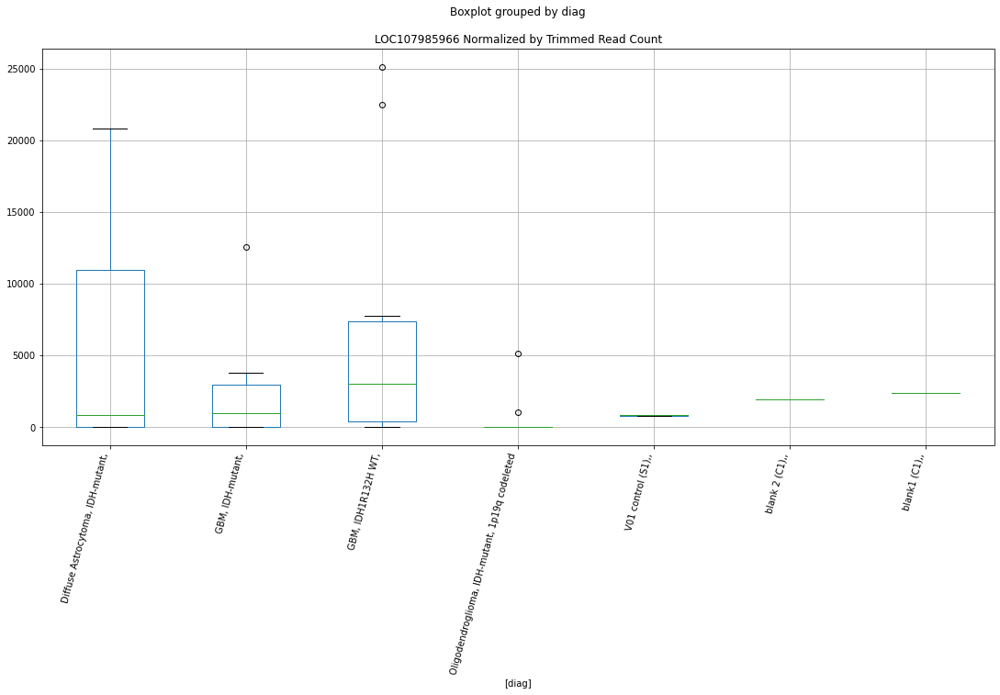

 p : 0.04852788459239841  ( t : 2.116153376993881 ) :  D-plex  :  cutadapt2  :  LOC105374287
Control and blanks
76     0.0
340    0.0
Name: LOC105374287, dtype: float64
208    529.08
Name: LOC105374287, dtype: float64
472    1155.91
Name: LOC105374287, dtype: float64


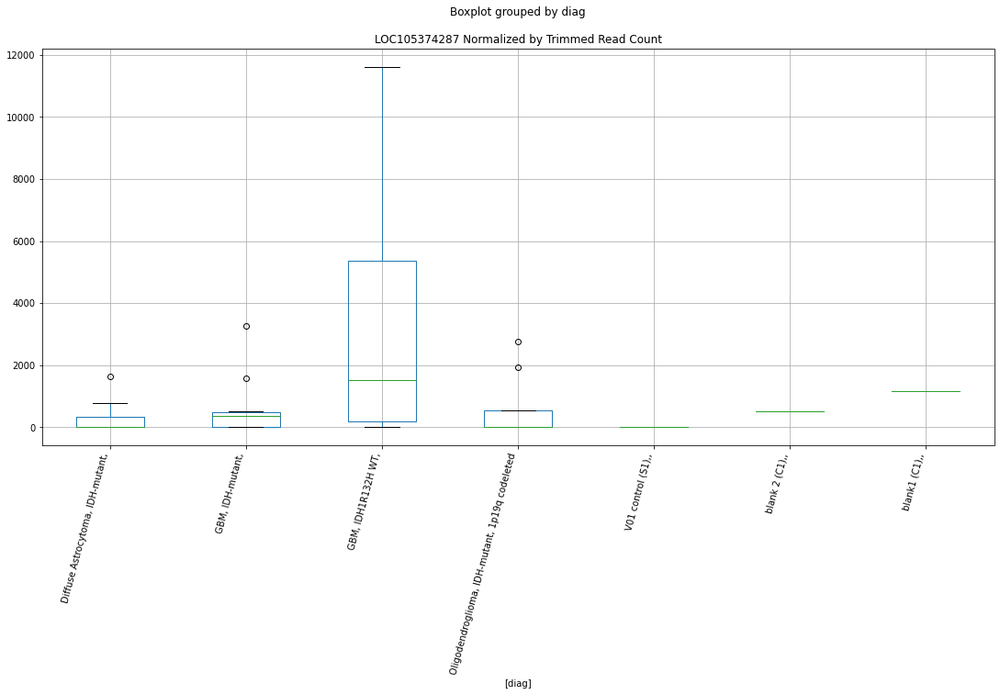

 p : 0.04853312686733112  ( t : 2.116098395633187 ) :  Lexogen  :  bbduk2  :  LOC105377442
Control and blanks
79     0.0
343    0.0
Name: LOC105377442, dtype: float64
211    0.0
Name: LOC105377442, dtype: float64
475    0.0
Name: LOC105377442, dtype: float64


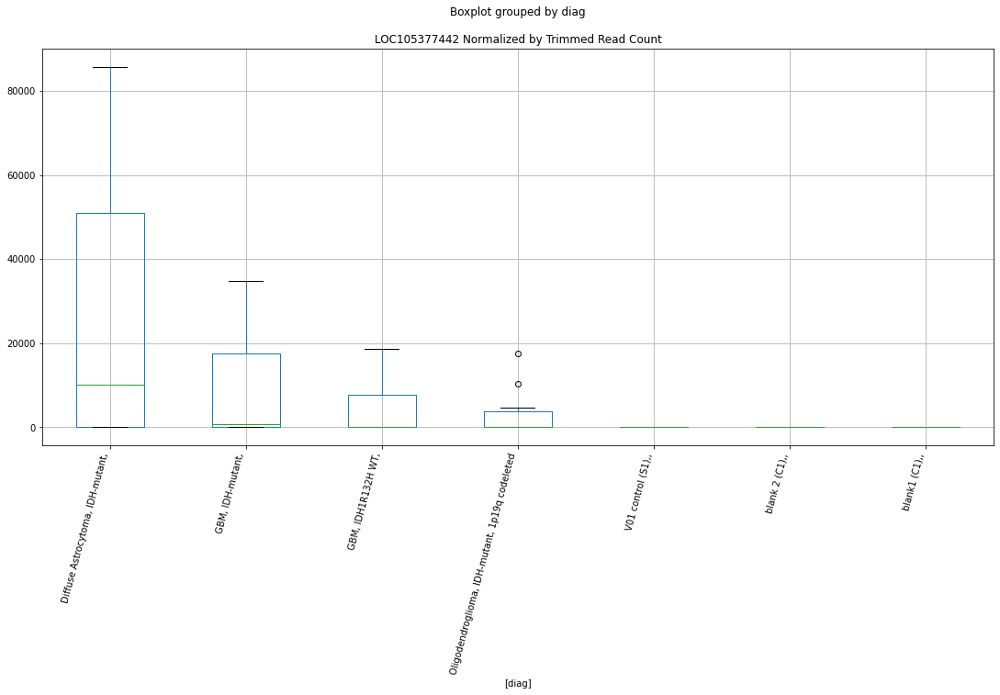

 p : 0.04855135060373662  ( t : 2.115907305819077 ) :  Lexogen  :  cutadapt2  :  LOC105377442
Control and blanks
82     0.0
346    0.0
Name: LOC105377442, dtype: float64
214    0.0
Name: LOC105377442, dtype: float64
478    0.0
Name: LOC105377442, dtype: float64


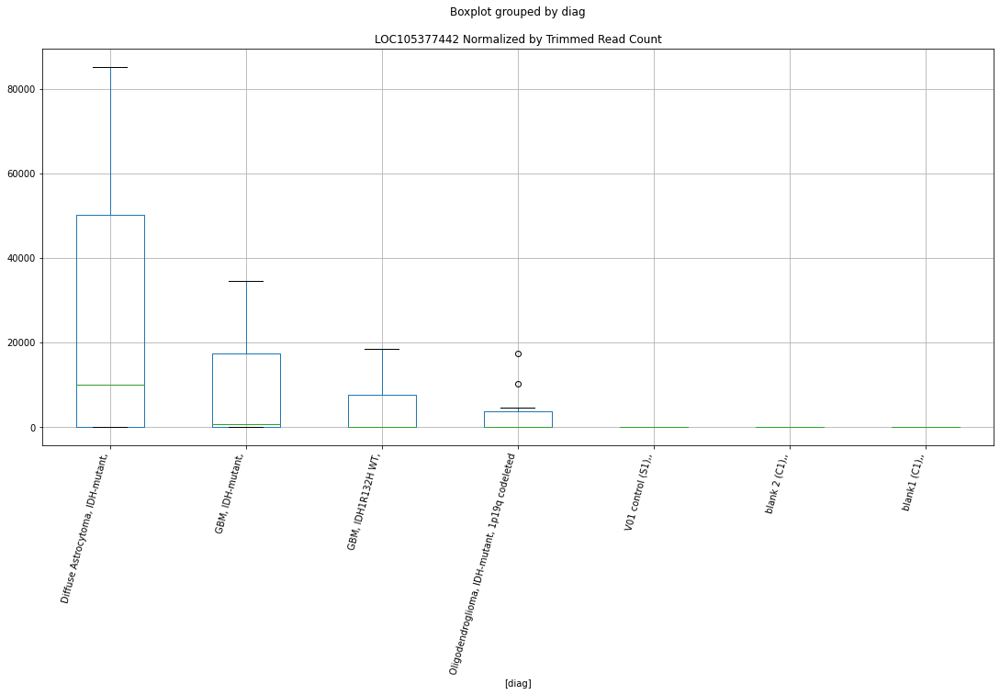

 p : 0.048697623071695846  ( t : 2.114375888150442 ) :  D-plex  :  cutadapt2  :  LOC105376050
Control and blanks
76         0.00
340    52843.93
Name: LOC105376050, dtype: float64
208    6172.61
Name: LOC105376050, dtype: float64
472    11559.12
Name: LOC105376050, dtype: float64


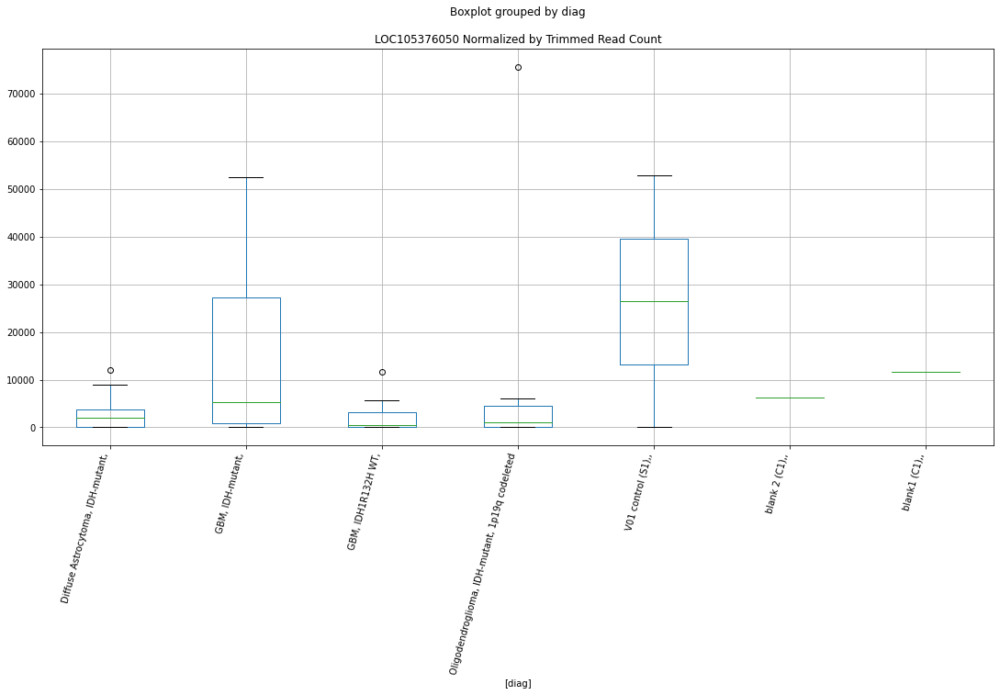

 p : 0.048713296447268586  ( t : 2.1142120422717787 ) :  Lexogen  :  cutadapt2  :  LOC105374384
Control and blanks
82     0.0
346    0.0
Name: LOC105374384, dtype: float64
214    0.0
Name: LOC105374384, dtype: float64
478    0.0
Name: LOC105374384, dtype: float64


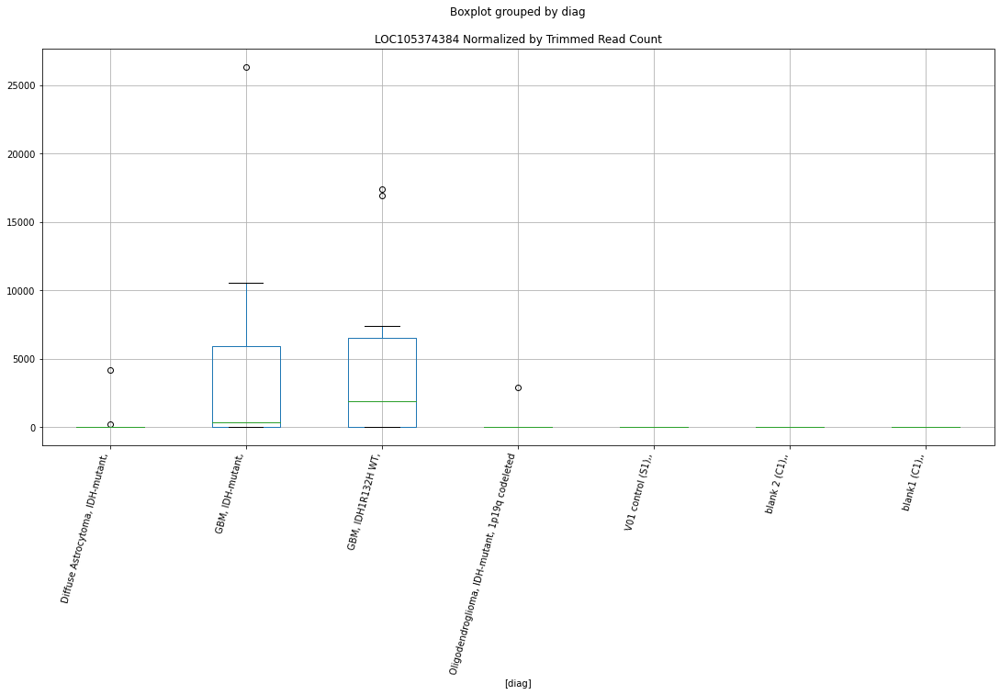

 p : 0.0487803209253026  ( t : 2.1135119246297047 ) :  D-plex  :  bbduk2  :  LOC105373215
Control and blanks
73     26282.29
337     5340.94
Name: LOC105373215, dtype: float64
205    11461.82
Name: LOC105373215, dtype: float64
469    15379.71
Name: LOC105373215, dtype: float64


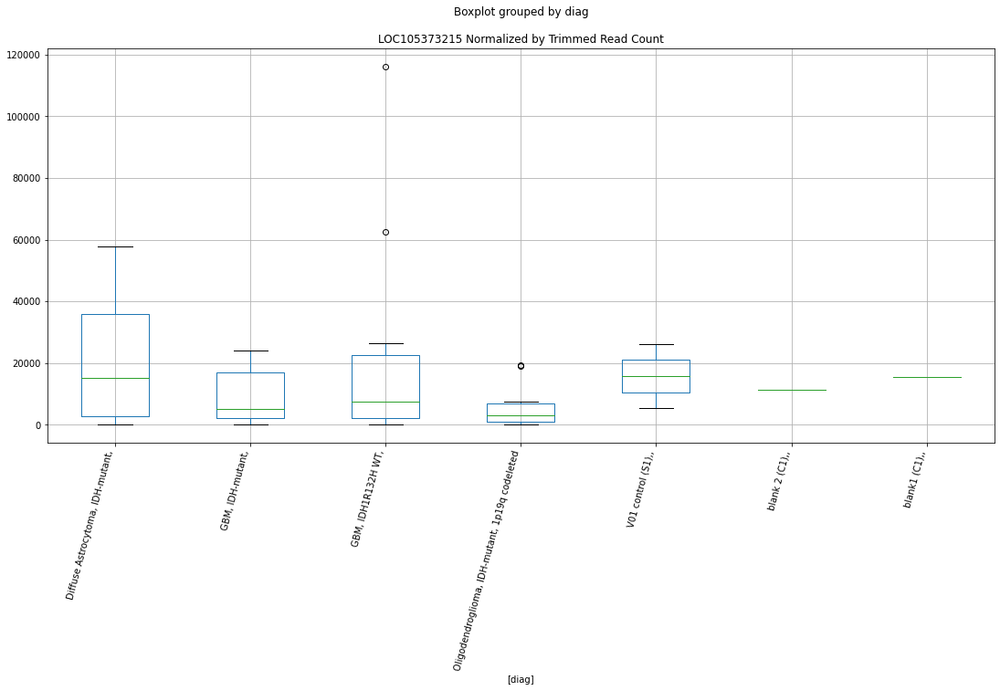

 p : 0.04886156886484598  ( t : 2.112664405987654 ) :  D-plex  :  bbduk2  :  LOC107984690
Control and blanks
73     0.0
337    0.0
Name: LOC107984690, dtype: float64
205    358.18
Name: LOC107984690, dtype: float64
469    0.0
Name: LOC107984690, dtype: float64


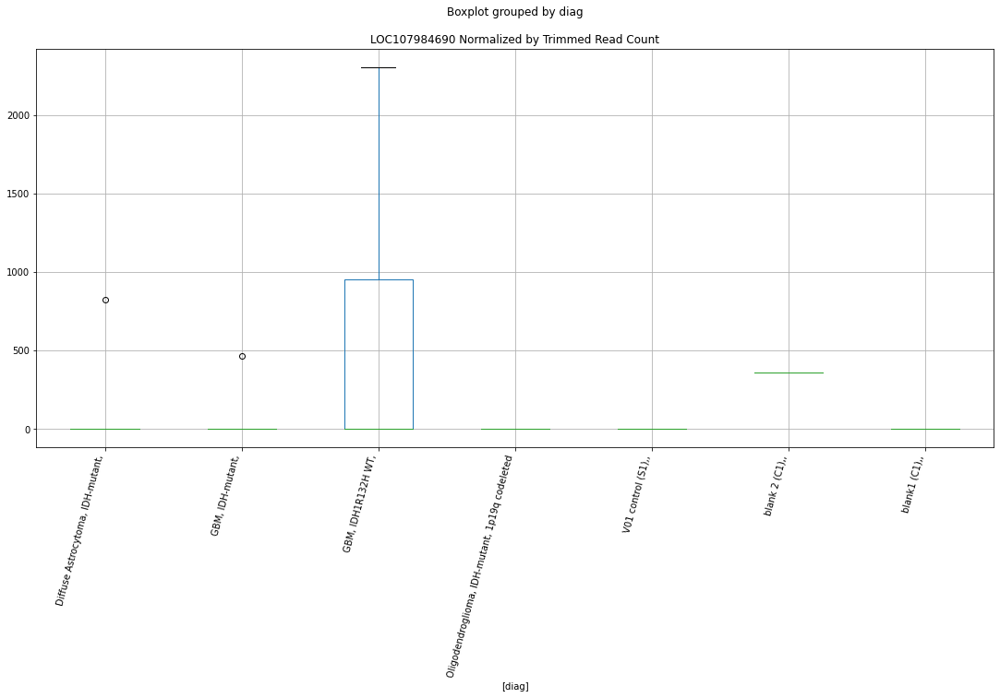

 p : 0.04893841427011338  ( t : 2.1118639907183607 ) :  D-plex  :  bbduk2  :  LOC107985953
Control and blanks
73     0.0
337    0.0
Name: LOC107985953, dtype: float64
205    537.27
Name: LOC107985953, dtype: float64
469    1183.05
Name: LOC107985953, dtype: float64


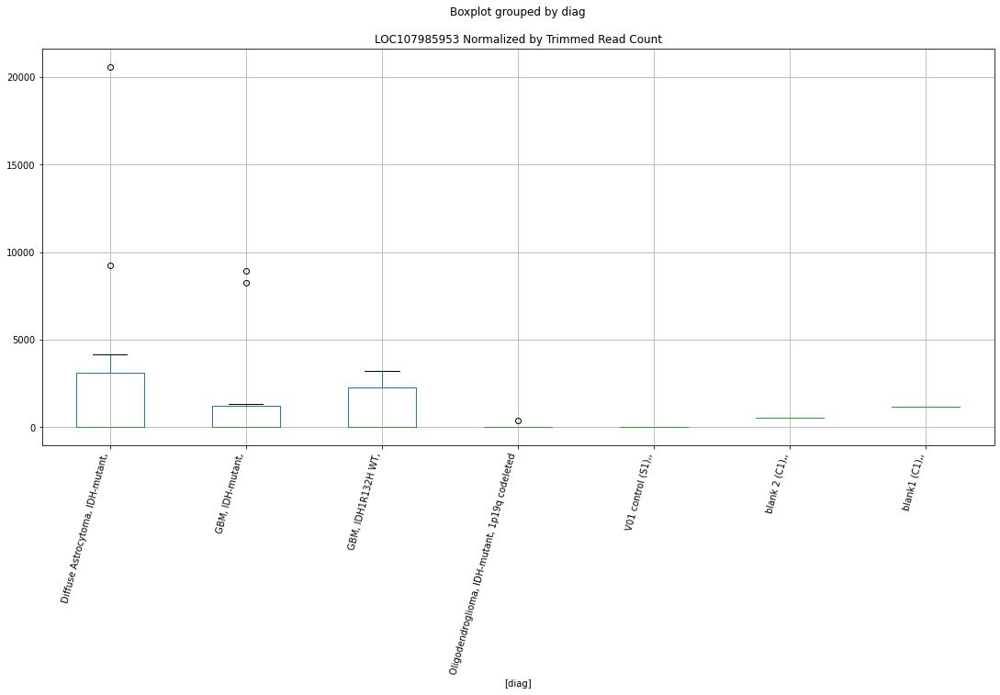

 p : 0.048976294334376315  ( t : 2.111469855936031 ) :  D-plex  :  bbduk2  :  LOC105378105
Control and blanks
73     0.0
337    0.0
Name: LOC105378105, dtype: float64
205    179.09
Name: LOC105378105, dtype: float64
469    0.0
Name: LOC105378105, dtype: float64


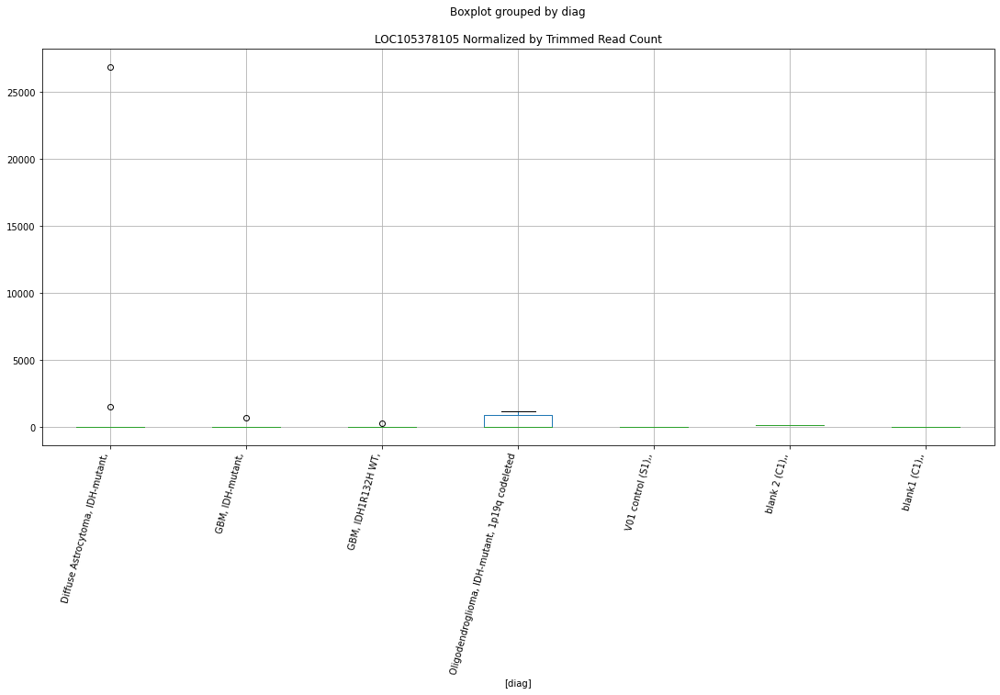

 p : 0.04900284308882913  ( t : 2.111193786556954 ) :  D-plex  :  cutadapt2  :  LOC105376364
Control and blanks
76     0.0
340    0.0
Name: LOC105376364, dtype: float64
208    176.36
Name: LOC105376364, dtype: float64
472    577.96
Name: LOC105376364, dtype: float64


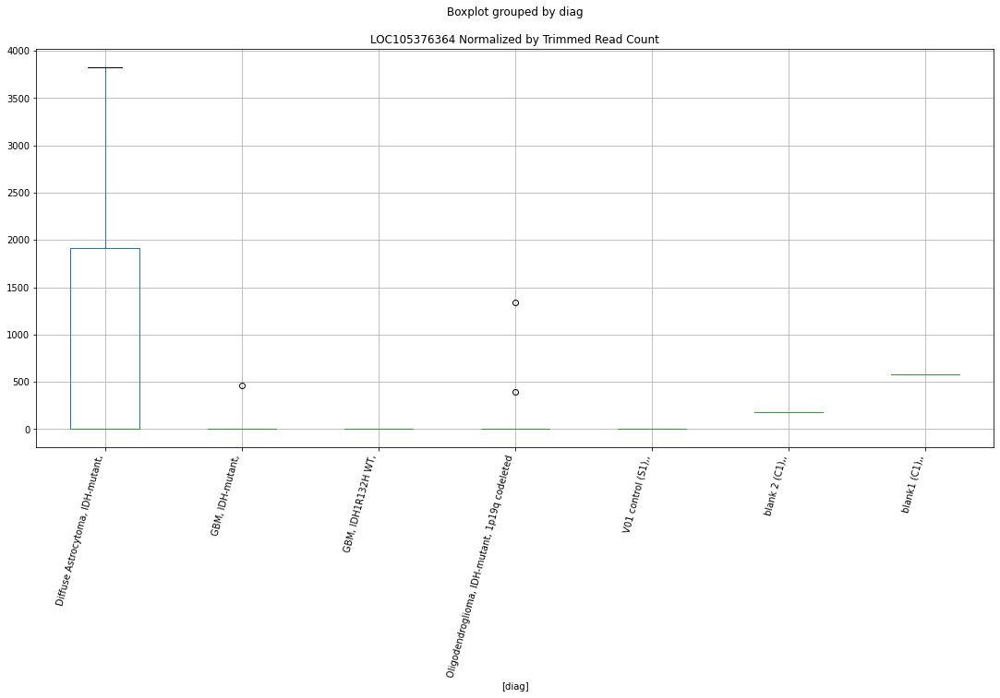

 p : 0.04901158648220077  ( t : 2.1111028974625 ) :  D-plex  :  bbduk2  :  LOC105376364
Control and blanks
73     0.0
337    0.0
Name: LOC105376364, dtype: float64
205    179.09
Name: LOC105376364, dtype: float64
469    591.53
Name: LOC105376364, dtype: float64


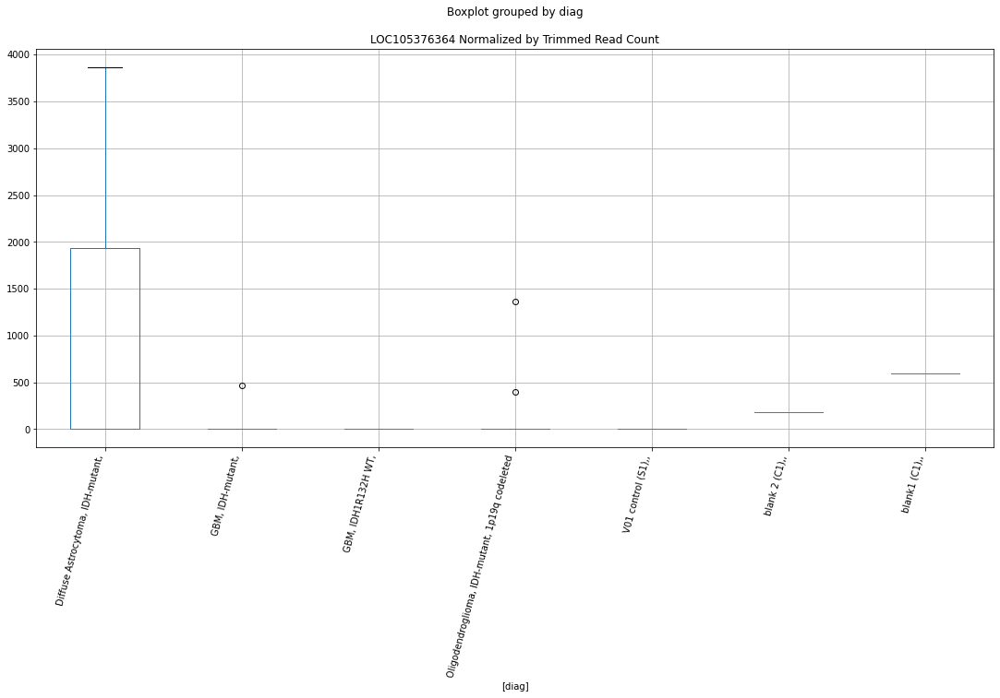

 p : 0.04902244361879204  ( t : 2.110990056172607 ) :  D-plex  :  cutadapt2  :  LOC107985953
Control and blanks
76     0.0
340    0.0
Name: LOC107985953, dtype: float64
208    529.08
Name: LOC107985953, dtype: float64
472    1155.91
Name: LOC107985953, dtype: float64


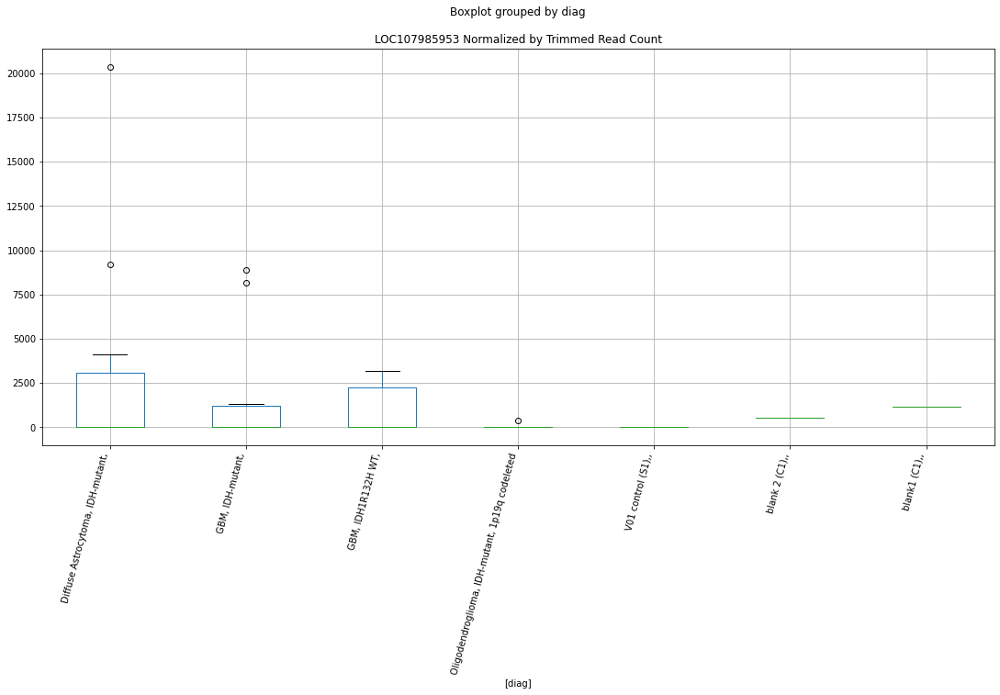

 p : 0.04917467946943597  ( t : 2.1094102160767423 ) :  D-plex  :  bbduk2  :  LOC105374121
Control and blanks
73     2319.03
337       0.00
Name: LOC105374121, dtype: float64
205    6984.55
Name: LOC105374121, dtype: float64
469    5323.75
Name: LOC105374121, dtype: float64


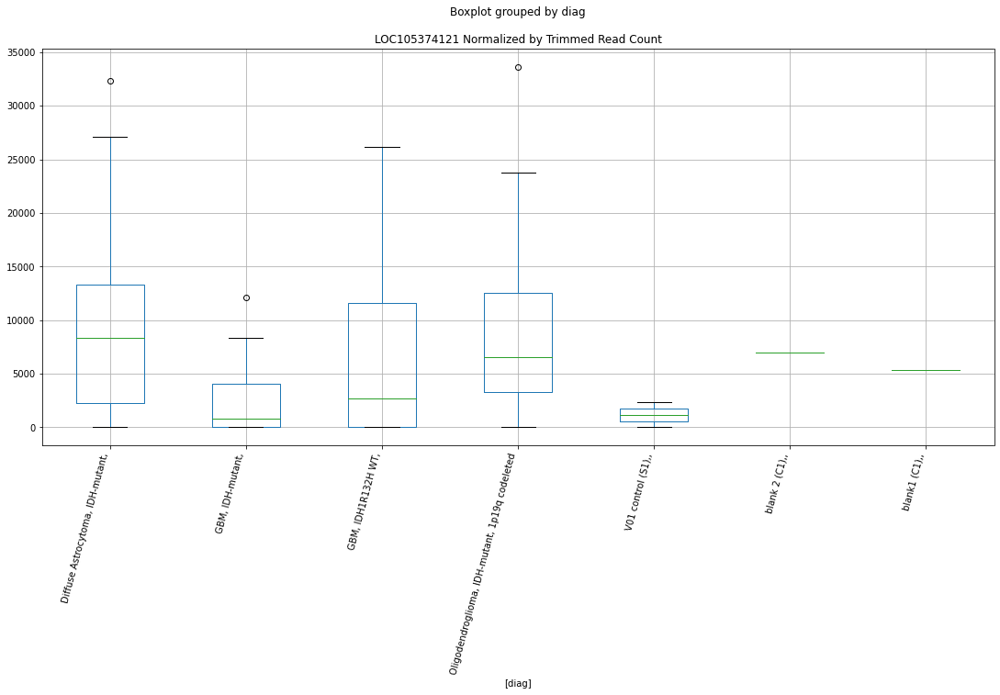

 p : 0.04919397111121199  ( t : 2.1092103332458563 ) :  D-plex  :  cutadapt2  :  LOC105376110
Control and blanks
76     0.0
340    0.0
Name: LOC105376110, dtype: float64
208    176.36
Name: LOC105376110, dtype: float64
472    0.0
Name: LOC105376110, dtype: float64


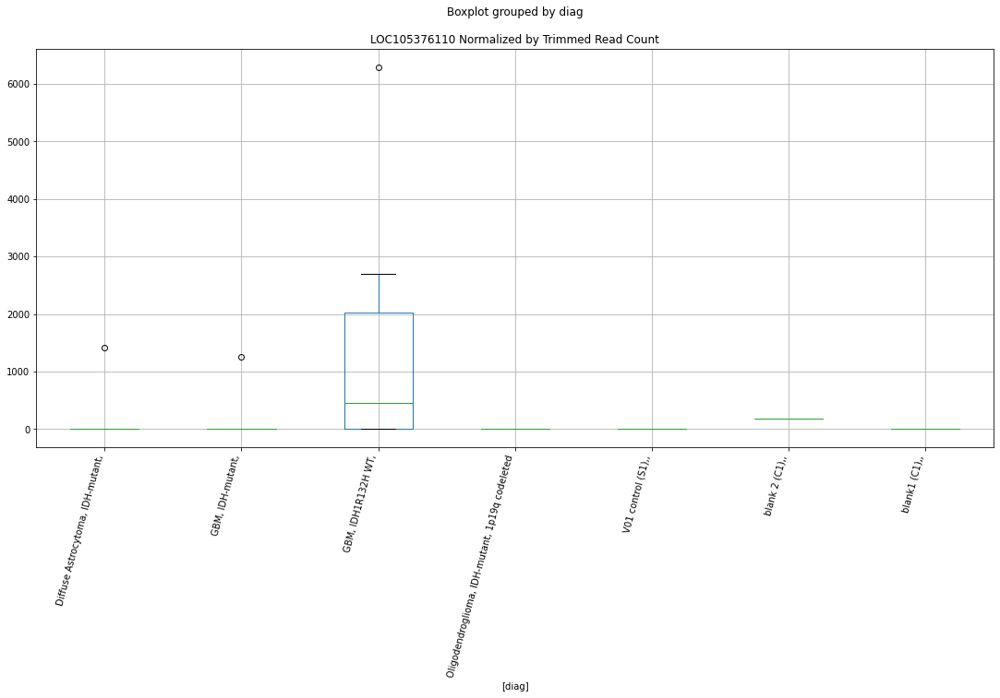

 p : 0.049499100493152697  ( t : 2.106058300132808 ) :  D-plex  :  cutadapt2  :  LOC105375999
Control and blanks
76     0.0
340    0.0
Name: LOC105375999, dtype: float64
208    3174.48
Name: LOC105375999, dtype: float64
472    1733.87
Name: LOC105375999, dtype: float64


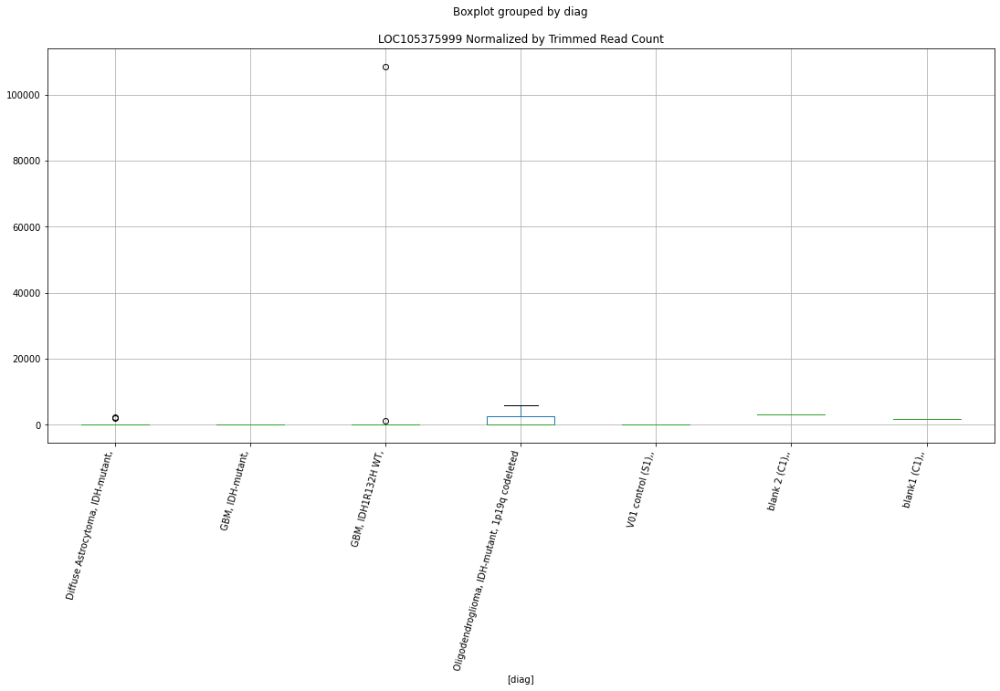

 p : 0.04958081824004727  ( t : 2.105217143701723 ) :  D-plex  :  bbduk2  :  LOC105375999
Control and blanks
73     0.0
337    0.0
Name: LOC105375999, dtype: float64
205    3223.64
Name: LOC105375999, dtype: float64
469    1774.58
Name: LOC105375999, dtype: float64


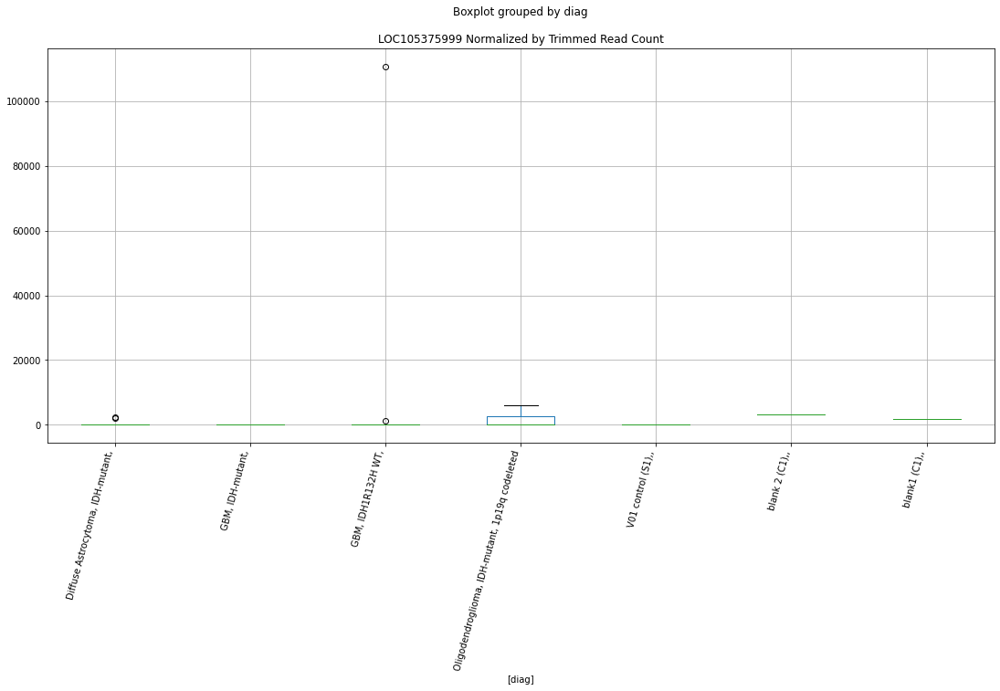

 p : 0.049652409429970824  ( t : 2.1044812597422733 ) :  D-plex  :  cutadapt2  :  LOC105372104
Control and blanks
76     0.0
340    0.0
Name: LOC105372104, dtype: float64
208    0.0
Name: LOC105372104, dtype: float64
472    0.0
Name: LOC105372104, dtype: float64


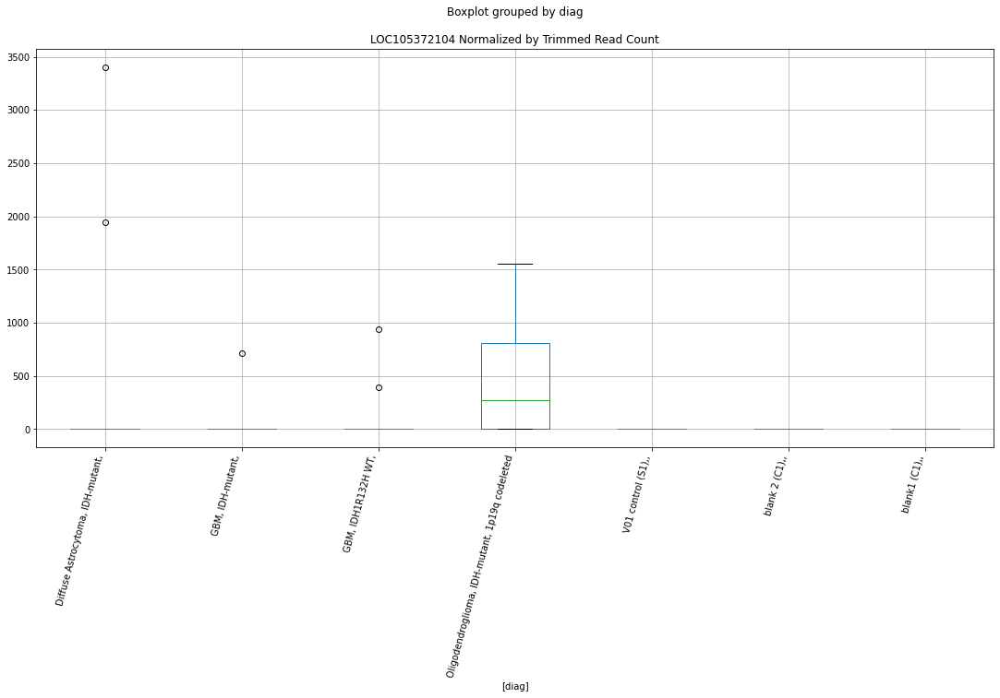

 p : 0.049707571160259  ( t : 2.103914911548517 ) :  D-plex  :  cutadapt2  :  LOC107985878
Control and blanks
76     0.0
340    0.0
Name: LOC107985878, dtype: float64
208    352.72
Name: LOC107985878, dtype: float64
472    0.0
Name: LOC107985878, dtype: float64


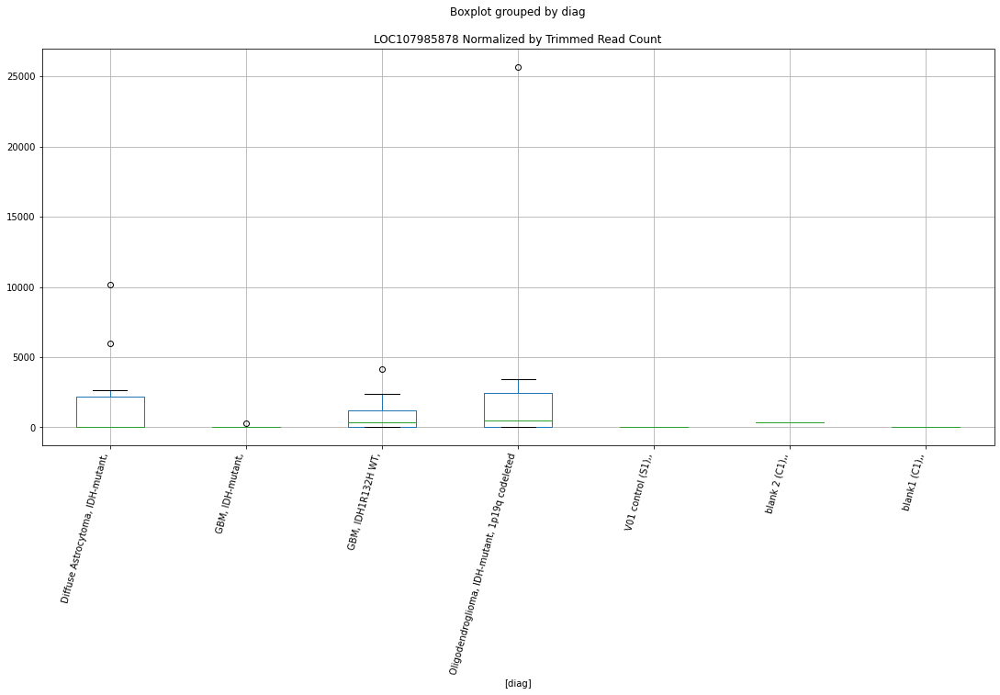

 p : 0.049917114186487865  ( t : 2.101768718150653 ) :  D-plex  :  cutadapt2  :  LOC105375559
Control and blanks
76     0.0
340    0.0
Name: LOC105375559, dtype: float64
208    1587.24
Name: LOC105375559, dtype: float64
472    1155.91
Name: LOC105375559, dtype: float64


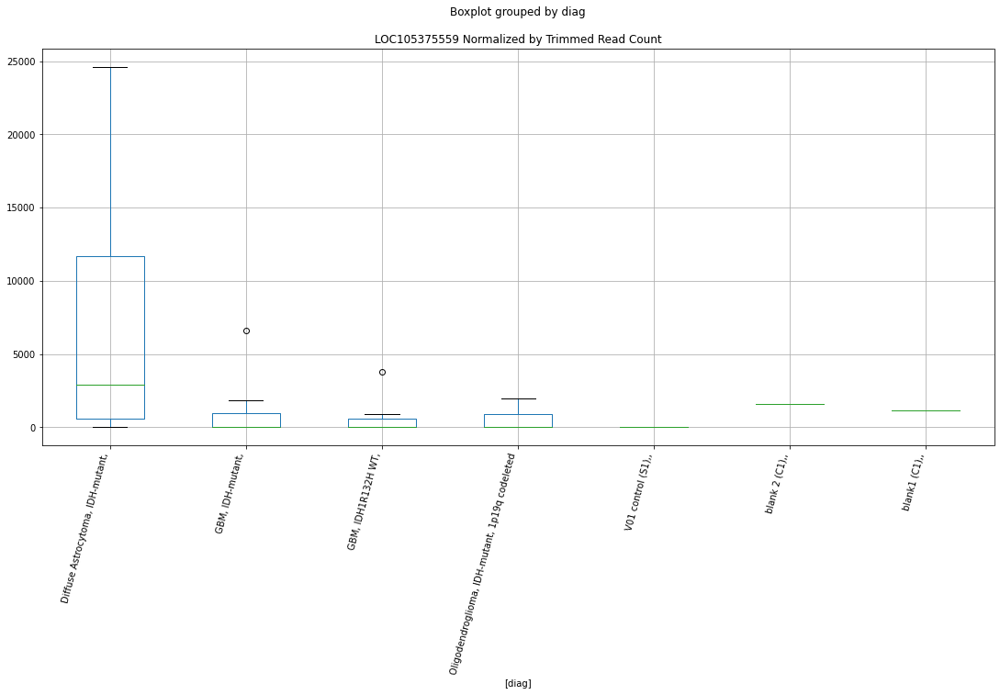

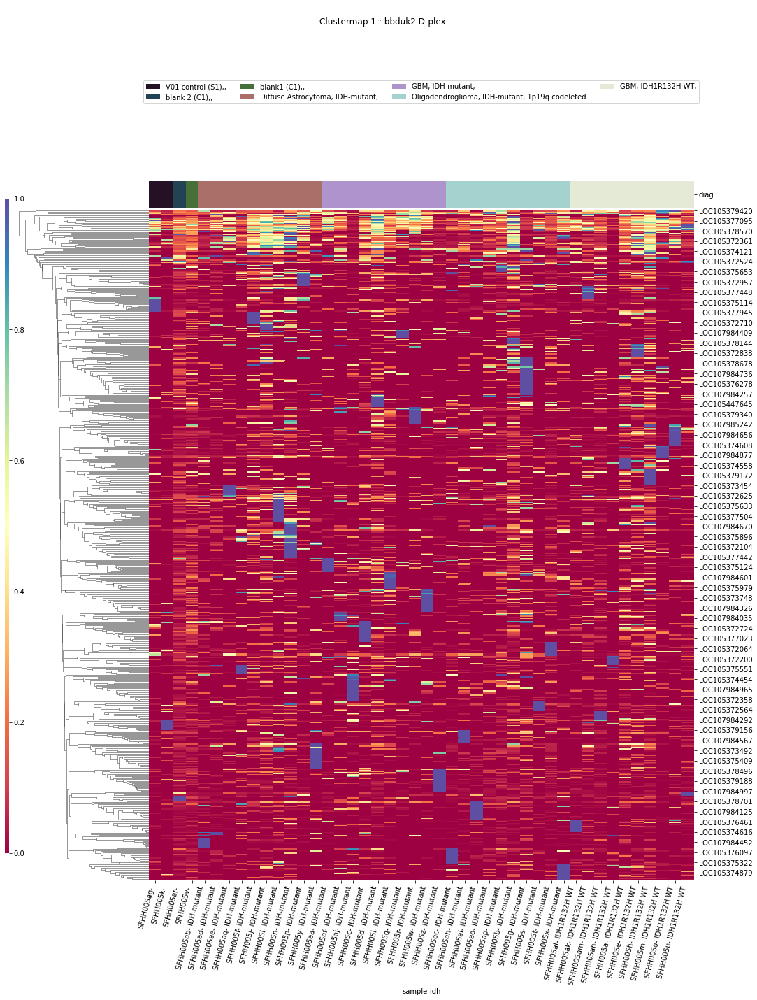

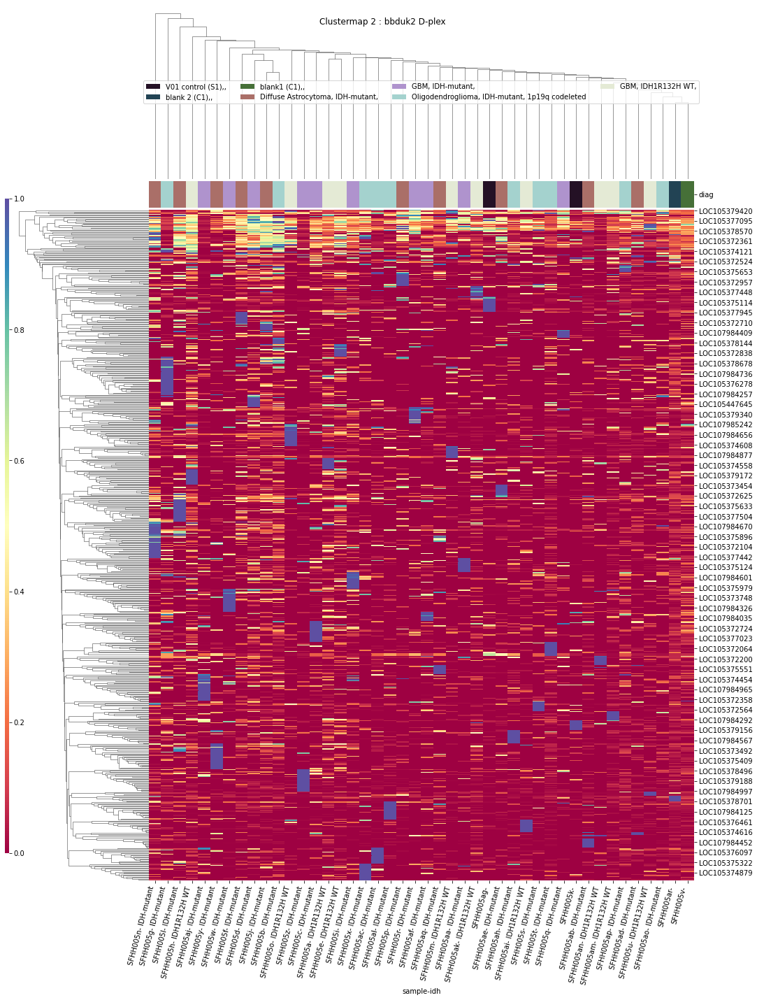

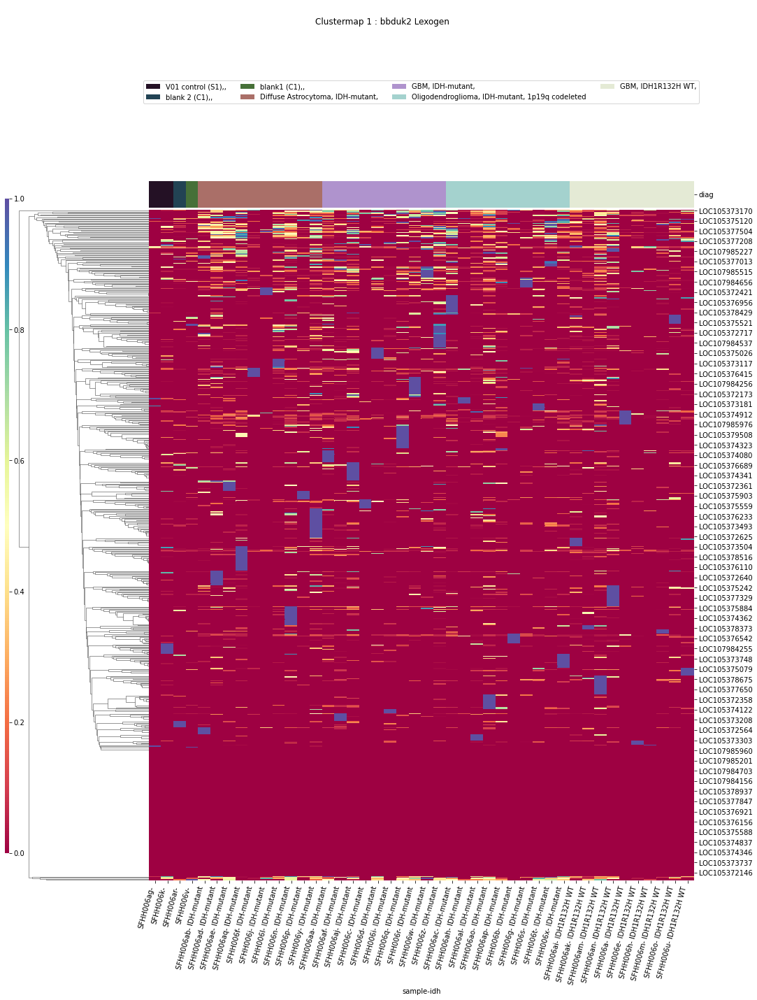

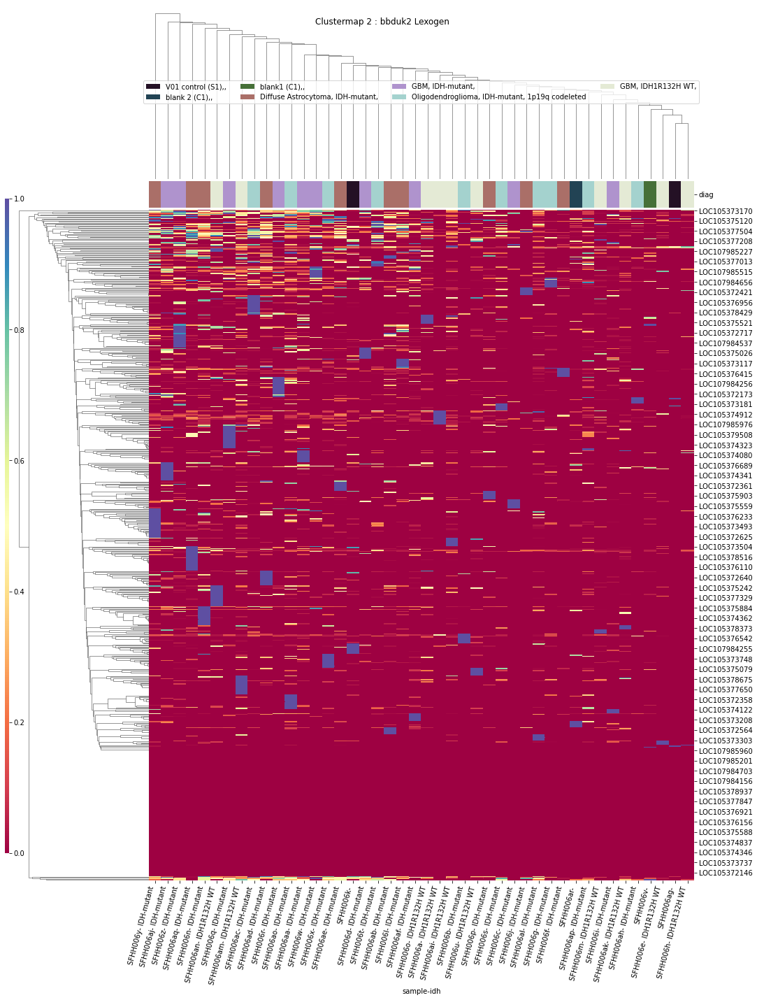

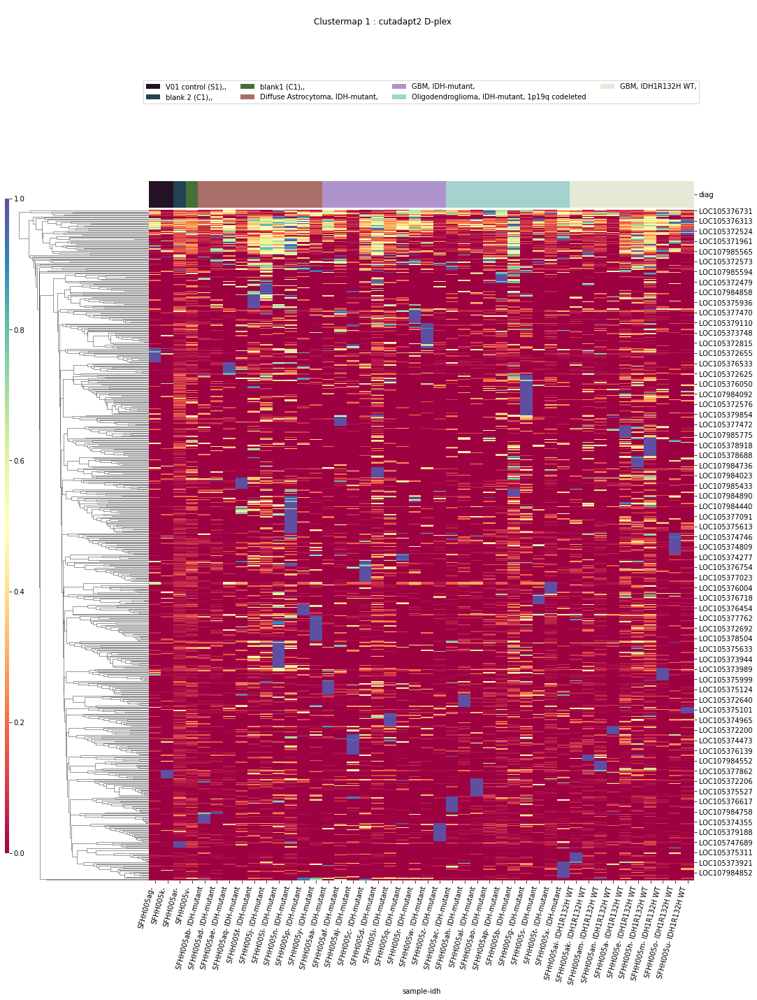

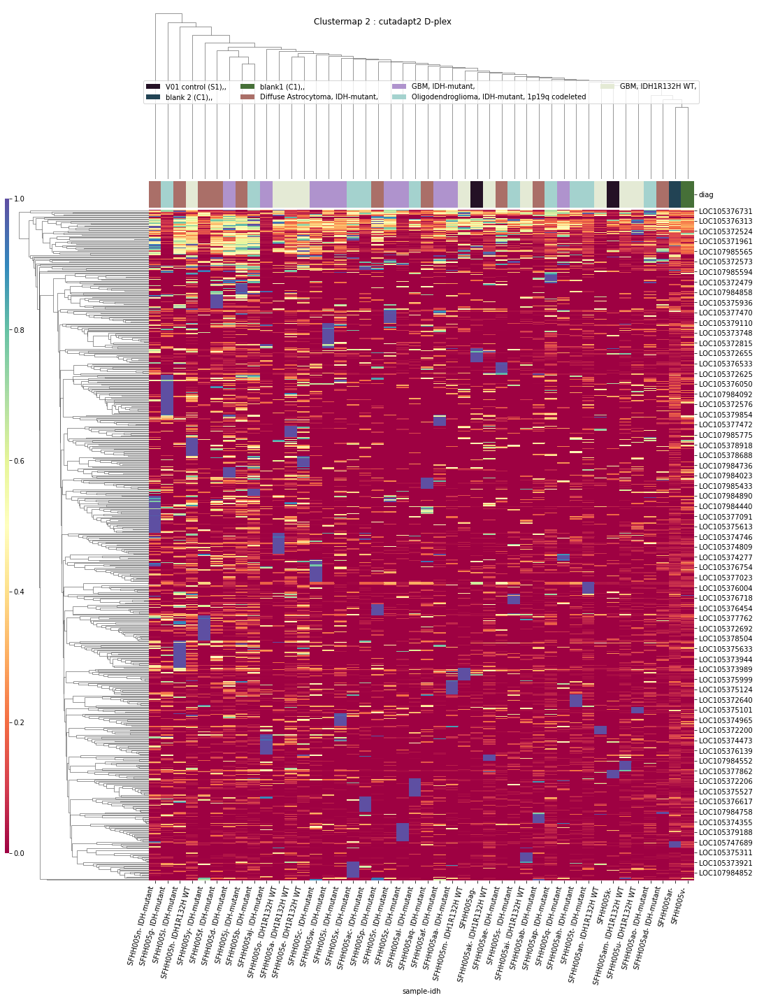

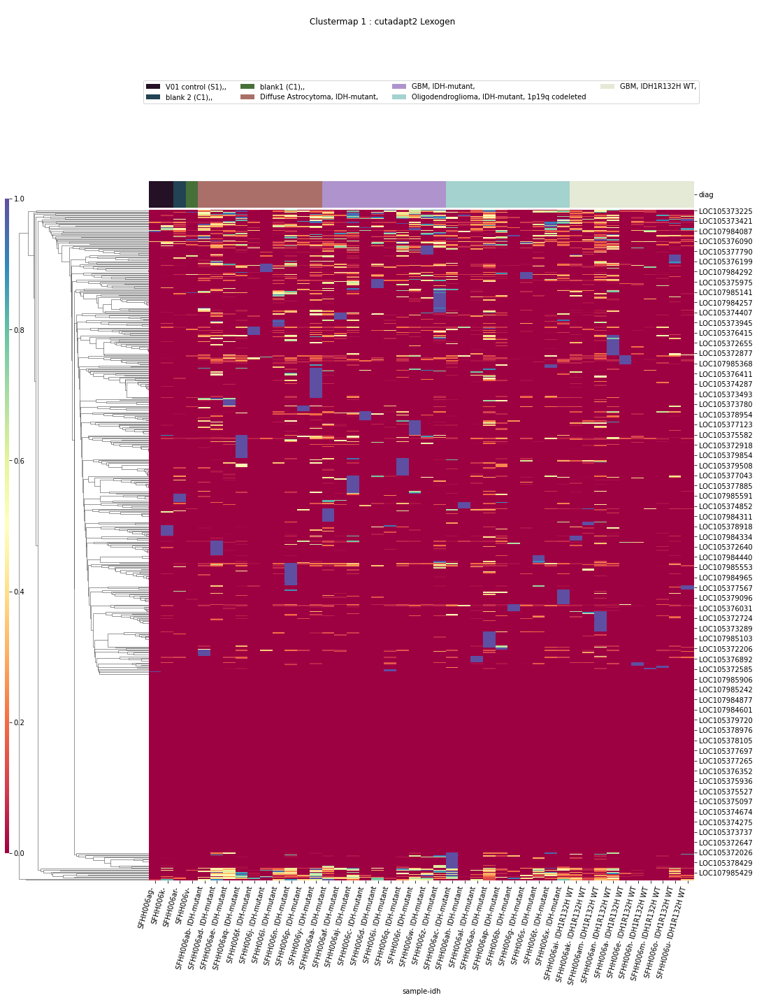

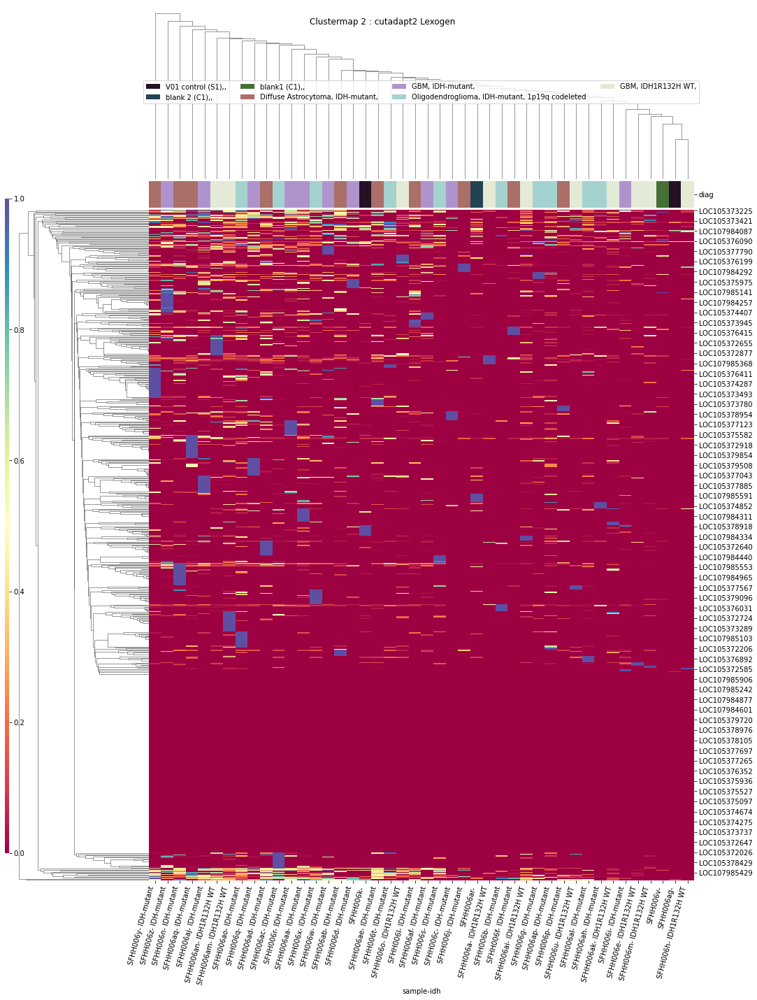

In [67]:
ttests_boxplots_and_heatmaps(dfn,elements,heat_p=0.1)

In [68]:
datetime.now().strftime("%H:%M:%S")

'11:39:40'

In [69]:
plt.rcParams["figure.figsize"] = [18.0,8.0]

In [70]:
pd.set_option('display.max_columns', default_max_columns)

In [71]:
pd.set_option('display.max_rows',default_max_rows)

In [72]:
pd.set_option('display.precision', default_precision)